## Bidirectional LSTM model na predikciu hodnot DST o 2 hodiny dopredu na zaklade 24-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+2_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 22:20:43.721444: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 2
y_col = f"DST+{shift}"

n_input = 24
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,394 (1.26 MB)

 Trainable params: 330,394 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58:41 8s/step - loss: 0.5292 - mae: 0.6112

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.7679 - mae: 0.6643

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.8191 - mae: 0.6598

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.7999 - mae: 0.6403

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.7670 - mae: 0.6189

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.7333 - mae: 0.5997

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.7008 - mae: 0.5819

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.6763 - mae: 0.5697

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.6573 - mae: 0.5601

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.6506 - mae: 0.5543

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.6630 - mae: 0.5540

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.6711 - mae: 0.5527

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.6759 - mae: 0.5507

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.6771 - mae: 0.5478

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.6767 - mae: 0.5448

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 172ms/step - loss: 0.6742 - mae: 0.5412

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.6704 - mae: 0.5374

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.6657 - mae: 0.5335

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.6604 - mae: 0.5295

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.6568 - mae: 0.5262

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.6525 - mae: 0.5229

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.6481 - mae: 0.5197

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.6433 - mae: 0.5165

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.6381 - mae: 0.5133

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.6329 - mae: 0.5102

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.6276 - mae: 0.5071

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.6221 - mae: 0.5040

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.6166 - mae: 0.5010

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.6111 - mae: 0.4979

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.6060 - mae: 0.4952

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.6025 - mae: 0.4929

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.5989 - mae: 0.4906

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.5952 - mae: 0.4883

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.5921 - mae: 0.4862

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.5889 - mae: 0.4841

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.5858 - mae: 0.4821

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.5826 - mae: 0.4800

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.5794 - mae: 0.4780

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.5762 - mae: 0.4761

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.5729 - mae: 0.4742

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.5695 - mae: 0.4723

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.5664 - mae: 0.4705

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.5633 - mae: 0.4688

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.5602 - mae: 0.4670

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.5572 - mae: 0.4654

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.5543 - mae: 0.4638

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5513 - mae: 0.4622

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5483 - mae: 0.4606

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5454 - mae: 0.4590

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5424 - mae: 0.4575

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5395 - mae: 0.4559

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5366 - mae: 0.4544

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5337 - mae: 0.4529

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5308 - mae: 0.4514

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5280 - mae: 0.4500

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5252 - mae: 0.4486

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5225 - mae: 0.4471

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5198 - mae: 0.4458

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5171 - mae: 0.4444

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5144 - mae: 0.4431

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5118 - mae: 0.4417

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5092 - mae: 0.4405

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5067 - mae: 0.4392

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5042 - mae: 0.4379

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.5017 - mae: 0.4367

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.4992 - mae: 0.4354

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.4968 - mae: 0.4342

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.4944 - mae: 0.4330

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.4921 - mae: 0.4319

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.4898 - mae: 0.4308

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 171ms/step - loss: 0.4875 - mae: 0.4296

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 171ms/step - loss: 0.4853 - mae: 0.4285

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.4831 - mae: 0.4275

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.4809 - mae: 0.4264

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.4788 - mae: 0.4253

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.4766 - mae: 0.4243

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.4745 - mae: 0.4232

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.4724 - mae: 0.4222

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.4704 - mae: 0.4212

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.4684 - mae: 0.4202

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.4664 - mae: 0.4192

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.4645 - mae: 0.4183

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.4626 - mae: 0.4174

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.4608 - mae: 0.4165

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.4589 - mae: 0.4156

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.4571 - mae: 0.4147

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.4553 - mae: 0.4138

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.4536 - mae: 0.4130

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.4520 - mae: 0.4122

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.4505 - mae: 0.4114

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.4489 - mae: 0.4107

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.4474 - mae: 0.4099

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.4459 - mae: 0.4092

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.4444 - mae: 0.4084

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.4430 - mae: 0.4077

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.4415 - mae: 0.4070

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.4400 - mae: 0.4062

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.4386 - mae: 0.4055

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.4372 - mae: 0.4048

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.4358 - mae: 0.4041

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.4345 - mae: 0.4035

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.4331 - mae: 0.4028

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.4317 - mae: 0.4021

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.4304 - mae: 0.4015

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.4291 - mae: 0.4008

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.4278 - mae: 0.4002

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.4265 - mae: 0.3995

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.4252 - mae: 0.3989

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.4239 - mae: 0.3983

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.4227 - mae: 0.3976

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.4214 - mae: 0.3970

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.4202 - mae: 0.3964

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.4190 - mae: 0.3958

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.4178 - mae: 0.3952

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.4166 - mae: 0.3947

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.4155 - mae: 0.3941

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.4143 - mae: 0.3936

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.4132 - mae: 0.3930

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.4121 - mae: 0.3925

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.4110 - mae: 0.3919

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.4099 - mae: 0.3914

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.4088 - mae: 0.3909

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.4078 - mae: 0.3904

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.4068 - mae: 0.3899

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.4058 - mae: 0.3895

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.4048 - mae: 0.3890

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.4038 - mae: 0.3885

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.4028 - mae: 0.3881

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.4019 - mae: 0.3876

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.4009 - mae: 0.3871

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.4000 - mae: 0.3867

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3990 - mae: 0.3862

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3981 - mae: 0.3858

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3972 - mae: 0.3854

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.3963 - mae: 0.3850

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3954 - mae: 0.3845

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3945 - mae: 0.3841

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3936 - mae: 0.3837

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3928 - mae: 0.3833

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3919 - mae: 0.3829

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.3910 - mae: 0.3825

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3902 - mae: 0.3821

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3894 - mae: 0.3817

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3887 - mae: 0.3813

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.3879 - mae: 0.3810

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.3872 - mae: 0.3806

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.3865 - mae: 0.3803

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.3857 - mae: 0.3799

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.3850 - mae: 0.3796

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.3843 - mae: 0.3792

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.3836 - mae: 0.3789

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.3829 - mae: 0.3786

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.3822 - mae: 0.3782

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.3815 - mae: 0.3779

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.3808 - mae: 0.3776

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.3801 - mae: 0.3772

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.3795 - mae: 0.3769

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.3788 - mae: 0.3766

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.3782 - mae: 0.3763

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.3775 - mae: 0.3760

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.3769 - mae: 0.3757

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.3762 - mae: 0.3754

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.3756 - mae: 0.3751

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.3750 - mae: 0.3748

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.3743 - mae: 0.3745

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.3737 - mae: 0.3742

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.3731 - mae: 0.3739

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.3725 - mae: 0.3736

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.3719 - mae: 0.3733

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.3713 - mae: 0.3730

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.3707 - mae: 0.3728

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.3701 - mae: 0.3725

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.3695 - mae: 0.3722

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.3689 - mae: 0.3719

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3684 - mae: 0.3717

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3678 - mae: 0.3714

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3672 - mae: 0.3711

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3667 - mae: 0.3709

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3662 - mae: 0.3706

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.3656 - mae: 0.3704

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.3651 - mae: 0.3702

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.3646 - mae: 0.3699

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.3641 - mae: 0.3697

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.3636 - mae: 0.3694

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.3631 - mae: 0.3692

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.3626 - mae: 0.3690

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.3621 - mae: 0.3688

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.3616 - mae: 0.3685

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.3612 - mae: 0.3683

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.3607 - mae: 0.3681

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.3603 - mae: 0.3679

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.3599 - mae: 0.3677

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3594 - mae: 0.3675

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3590 - mae: 0.3673

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3585 - mae: 0.3671

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3581 - mae: 0.3669

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3576 - mae: 0.3666

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3572 - mae: 0.3664

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.3567 - mae: 0.3662

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.3563 - mae: 0.3660

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.3559 - mae: 0.3658

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.3554 - mae: 0.3656

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.3550 - mae: 0.3654

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.3545 - mae: 0.3652

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.3541 - mae: 0.3650

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.3537 - mae: 0.3648

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.3533 - mae: 0.3646

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.3529 - mae: 0.3644

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.3525 - mae: 0.3642

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.3521 - mae: 0.3640

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.3517 - mae: 0.3638

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.3513 - mae: 0.3636

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.3509 - mae: 0.3634

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.3505 - mae: 0.3633

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.3501 - mae: 0.3631

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.3497 - mae: 0.3629

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.3493 - mae: 0.3627

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.3490 - mae: 0.3625

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.3486 - mae: 0.3623

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.3482 - mae: 0.3621

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.3478 - mae: 0.3620

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.3475 - mae: 0.3618

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.3471 - mae: 0.3616

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3467 - mae: 0.3614

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3463 - mae: 0.3612

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3460 - mae: 0.3610

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3456 - mae: 0.3609

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3452 - mae: 0.3607

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.3449 - mae: 0.3605

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3445 - mae: 0.3603

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3441 - mae: 0.3602

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3438 - mae: 0.3600

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3434 - mae: 0.3598

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3431 - mae: 0.3596

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.3427 - mae: 0.3595

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3424 - mae: 0.3593

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3420 - mae: 0.3591

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3417 - mae: 0.3590

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3413 - mae: 0.3588

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3410 - mae: 0.3586

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.3406 - mae: 0.3585

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.3403 - mae: 0.3583

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.3400 - mae: 0.3581

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.3396 - mae: 0.3580

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.3393 - mae: 0.3578

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.3389 - mae: 0.3577

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.3386 - mae: 0.3575

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.3383 - mae: 0.3573

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.3379 - mae: 0.3572

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.3376 - mae: 0.3570

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.3373 - mae: 0.3569

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.3370 - mae: 0.3567

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.3366 - mae: 0.3566

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.3363 - mae: 0.3564

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.3360 - mae: 0.3562

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.3357 - mae: 0.3561

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.3353 - mae: 0.3559

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.3350 - mae: 0.3558

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.3347 - mae: 0.3556

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.3344 - mae: 0.3555

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.3341 - mae: 0.3553

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.3338 - mae: 0.3552

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.3335 - mae: 0.3550

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.3331 - mae: 0.3549

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.3328 - mae: 0.3548

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.3325 - mae: 0.3546

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.3322 - mae: 0.3545

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.3319 - mae: 0.3543

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.3316 - mae: 0.3542

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.3313 - mae: 0.3540

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.3310 - mae: 0.3539

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.3306 - mae: 0.3537

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.3303 - mae: 0.3536

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.3300 - mae: 0.3534

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.3297 - mae: 0.3533

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.3294 - mae: 0.3531

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.3291 - mae: 0.3530

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.3288 - mae: 0.3529

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.3285 - mae: 0.3527

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.3282 - mae: 0.3526

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.3279 - mae: 0.3524

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.3277 - mae: 0.3523

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.3274 - mae: 0.3522

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.3271 - mae: 0.3520

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.3268 - mae: 0.3519

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.3265 - mae: 0.3517

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.3262 - mae: 0.3516

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.3259 - mae: 0.3515

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.3257 - mae: 0.3513

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.3254 - mae: 0.3512

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.3251 - mae: 0.3511

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.3248 - mae: 0.3509

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.3246 - mae: 0.3508

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.3243 - mae: 0.3507

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.3240 - mae: 0.3506

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.3237 - mae: 0.3504

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.3235 - mae: 0.3503

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.3232 - mae: 0.3502

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.3229 - mae: 0.3501

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.3227 - mae: 0.3499

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3224 - mae: 0.3498

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3221 - mae: 0.3497

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3219 - mae: 0.3495

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3216 - mae: 0.3494

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3214 - mae: 0.3493

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3211 - mae: 0.3492

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3208 - mae: 0.3491

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.3206 - mae: 0.3489

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.3203 - mae: 0.3488

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.3201 - mae: 0.3487

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.3198 - mae: 0.3486

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.3195 - mae: 0.3484

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.3193 - mae: 0.3483

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.3190 - mae: 0.3482

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.3188 - mae: 0.3481

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.3185 - mae: 0.3480

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.3183 - mae: 0.3478

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.3180 - mae: 0.3477

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.3178 - mae: 0.3476

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.3175 - mae: 0.3475

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.3173 - mae: 0.3474

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.3170 - mae: 0.3472

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.3168 - mae: 0.3471

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.3165 - mae: 0.3470

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.3163 - mae: 0.3469

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.3160 - mae: 0.3468

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.3158 - mae: 0.3466

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.3155 - mae: 0.3465

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.3153 - mae: 0.3464

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.3150 - mae: 0.3463

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.3148 - mae: 0.3462

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.3145 - mae: 0.3460

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.3143 - mae: 0.3459

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.3140 - mae: 0.3458

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.3138 - mae: 0.3457

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.3136 - mae: 0.3456

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.3133 - mae: 0.3454

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.3131 - mae: 0.3453

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.3128 - mae: 0.3452

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.3126 - mae: 0.3451

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.3123 - mae: 0.3450

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.3121 - mae: 0.3448

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.3118 - mae: 0.3447

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.3116 - mae: 0.3446

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.3114 - mae: 0.3445

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.3111 - mae: 0.3444

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.3109 - mae: 0.3443

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.3106 - mae: 0.3441

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.3104 - mae: 0.3440

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.3102 - mae: 0.3439

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.3099 - mae: 0.3438

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.3097 - mae: 0.3437

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.3095 - mae: 0.3436

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.3093 - mae: 0.3435

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.3090 - mae: 0.3434

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.3088 - mae: 0.3432

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.3086 - mae: 0.3431

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.3083 - mae: 0.3430

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.3081 - mae: 0.3429

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.3079 - mae: 0.3428

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.3077 - mae: 0.3427

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.3075 - mae: 0.3426

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.3072 - mae: 0.3425

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.3070 - mae: 0.3424

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.3068 - mae: 0.3422

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.3066 - mae: 0.3421

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.3064 - mae: 0.3420

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.3062 - mae: 0.3419

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.3059 - mae: 0.3418

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.3057 - mae: 0.3417

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.3055 - mae: 0.3416

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.3053 - mae: 0.3415

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.3051 - mae: 0.3414

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.3049 - mae: 0.3413

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.3046 - mae: 0.3412

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.3044 - mae: 0.3410

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.3042 - mae: 0.3409

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.3040 - mae: 0.3408

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.3038 - mae: 0.3407

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.3036 - mae: 0.3406

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.3034 - mae: 0.3405

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.3032 - mae: 0.3404

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.3029 - mae: 0.3403

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.3027 - mae: 0.3402

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.3025 - mae: 0.3401

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.3023 - mae: 0.3400

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.3021 - mae: 0.3399

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.3019 - mae: 0.3398

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.3017 - mae: 0.3397

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.3015 - mae: 0.3396

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.3013 - mae: 0.3395

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.3011 - mae: 0.3394

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.3009 - mae: 0.3393

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.3007 - mae: 0.3392

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.3005 - mae: 0.3391

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.3003 - mae: 0.3390

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.3001 - mae: 0.3389

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2999 - mae: 0.3388

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2997 - mae: 0.3387

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2995 - mae: 0.3386

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2993 - mae: 0.3384

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.2991 - mae: 0.3383

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2989 - mae: 0.3382

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2987 - mae: 0.3381

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2985 - mae: 0.3381

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2983 - mae: 0.3380

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2981 - mae: 0.3379

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.2980 - mae: 0.3378

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2978 - mae: 0.3377

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2976 - mae: 0.3376

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2974 - mae: 0.3375

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2972 - mae: 0.3374

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2970 - mae: 0.3373

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.2968 - mae: 0.3372

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2966 - mae: 0.3371

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2965 - mae: 0.3370

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2963 - mae: 0.3369

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2961 - mae: 0.3368

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2959 - mae: 0.3367

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.2957 - mae: 0.3366

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2955 - mae: 0.3365

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2954 - mae: 0.3364

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2952 - mae: 0.3363

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2950 - mae: 0.3362

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2948 - mae: 0.3361

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.2946 - mae: 0.3361

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2945 - mae: 0.3360

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2943 - mae: 0.3359

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2941 - mae: 0.3358

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2939 - mae: 0.3357

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2938 - mae: 0.3356

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.2936 - mae: 0.3355

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2934 - mae: 0.3354

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2933 - mae: 0.3353

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2931 - mae: 0.3353

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2929 - mae: 0.3352

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2927 - mae: 0.3351

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.2926 - mae: 0.3350

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2924 - mae: 0.3349

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2922 - mae: 0.3348

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2921 - mae: 0.3347

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2919 - mae: 0.3346

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2917 - mae: 0.3346

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.2916 - mae: 0.3345

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2914 - mae: 0.3344

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2912 - mae: 0.3343

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2911 - mae: 0.3342

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2909 - mae: 0.3341

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2907 - mae: 0.3340

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.2906 - mae: 0.3340

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2904 - mae: 0.3339

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2902 - mae: 0.3338

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2901 - mae: 0.3337

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2899 - mae: 0.3336

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2898 - mae: 0.3335

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.2896 - mae: 0.3334

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2894 - mae: 0.3333

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2893 - mae: 0.3333

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2891 - mae: 0.3332

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2889 - mae: 0.3331

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2888 - mae: 0.3330

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.2886 - mae: 0.3329

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2884 - mae: 0.3328

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2883 - mae: 0.3327

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2881 - mae: 0.3327

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2880 - mae: 0.3326

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2878 - mae: 0.3325

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.2876 - mae: 0.3324

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2875 - mae: 0.3323

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2873 - mae: 0.3322

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2872 - mae: 0.3322

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2870 - mae: 0.3321

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2868 - mae: 0.3320

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.2867 - mae: 0.3319

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2865 - mae: 0.3318

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2864 - mae: 0.3317

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2862 - mae: 0.3317

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2860 - mae: 0.3316

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2859 - mae: 0.3315

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.2857 - mae: 0.3314

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2856 - mae: 0.3313

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2854 - mae: 0.3312

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2853 - mae: 0.3312

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2851 - mae: 0.3311

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2850 - mae: 0.3310

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2848 - mae: 0.3309

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.2846 - mae: 0.3308

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2845 - mae: 0.3308

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2843 - mae: 0.3307

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2842 - mae: 0.3306

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2840 - mae: 0.3305

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2839 - mae: 0.3304

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.2838 - mae: 0.3304

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2836 - mae: 0.3303

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2835 - mae: 0.3302

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2833 - mae: 0.3301

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2832 - mae: 0.3301

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2830 - mae: 0.3300

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.2829 - mae: 0.3299

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2828 - mae: 0.3298

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2826 - mae: 0.3298

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2825 - mae: 0.3297

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2823 - mae: 0.3296

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2822 - mae: 0.3295

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2821 - mae: 0.3295

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.2819 - mae: 0.3294

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2818 - mae: 0.3293

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2817 - mae: 0.3292

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2815 - mae: 0.3292

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2814 - mae: 0.3291

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2813 - mae: 0.3290

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.2811 - mae: 0.3290

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2810 - mae: 0.3289

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2809 - mae: 0.3288

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2807 - mae: 0.3287

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2806 - mae: 0.3287

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2804 - mae: 0.3286

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.2803 - mae: 0.3285

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2802 - mae: 0.3284

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2800 - mae: 0.3284

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2799 - mae: 0.3283

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2798 - mae: 0.3282

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2796 - mae: 0.3282

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.2795 - mae: 0.3281

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2794 - mae: 0.3280

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2793 - mae: 0.3280

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2791 - mae: 0.3279

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2790 - mae: 0.3278

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2789 - mae: 0.3277

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.2787 - mae: 0.3277

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2786 - mae: 0.3276 

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2785 - mae: 0.3275

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2783 - mae: 0.3275

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2782 - mae: 0.3274

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2781 - mae: 0.3273

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.2780 - mae: 0.3273

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.2778 - mae: 0.3272

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.2777 - mae: 0.3271

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.2776 - mae: 0.3270

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.2774 - mae: 0.3270

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.2773 - mae: 0.3269

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.2772 - mae: 0.3268

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.2771 - mae: 0.3268

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.2769 - mae: 0.3267

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.2768 - mae: 0.3266

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.2767 - mae: 0.3266

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.2766 - mae: 0.3265

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.2764 - mae: 0.3264

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.2763 - mae: 0.3264

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.2762 - mae: 0.3263

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.2760 - mae: 0.3262

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.2759 - mae: 0.3262

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.2758 - mae: 0.3261

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.2757 - mae: 0.3260

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.2756 - mae: 0.3260

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.2755 - mae: 0.3259

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.2754 - mae: 0.3258

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.2752 - mae: 0.3258

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.2751 - mae: 0.3257

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.2750 - mae: 0.3257

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.2749 - mae: 0.3256

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.2748 - mae: 0.3255

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.2747 - mae: 0.3255

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.2746 - mae: 0.3254

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.2745 - mae: 0.3254

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.2744 - mae: 0.3253

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.2743 - mae: 0.3252

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.2742 - mae: 0.3252

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.2741 - mae: 0.3251

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.2740 - mae: 0.3251

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.2739 - mae: 0.3250

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.2738 - mae: 0.3250

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.2737 - mae: 0.3249

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.2736 - mae: 0.3248

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.2735 - mae: 0.3248

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.2734 - mae: 0.3247

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.2733 - mae: 0.3247

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.2732 - mae: 0.3246

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.2732 - mae: 0.3246

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.2731 - mae: 0.3245

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.2730 - mae: 0.3245

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.2729 - mae: 0.3244

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.2728 - mae: 0.3244

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.2727 - mae: 0.3243

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.2726 - mae: 0.3243

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.2725 - mae: 0.3242

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.2724 - mae: 0.3242

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.2723 - mae: 0.3241

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.2723 - mae: 0.3241

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.2722 - mae: 0.3240

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.2721 - mae: 0.3240

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.2720 - mae: 0.3239

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.2719 - mae: 0.3239

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.2718 - mae: 0.3238

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.2717 - mae: 0.3238

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.2716 - mae: 0.3237

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.2715 - mae: 0.3237

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.2715 - mae: 0.3236

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.2714 - mae: 0.3236

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.2713 - mae: 0.3235

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.2712 - mae: 0.3235

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.2711 - mae: 0.3234

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2710 - mae: 0.3234

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2709 - mae: 0.3233

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2708 - mae: 0.3233

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2708 - mae: 0.3232

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2707 - mae: 0.3232

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.2706 - mae: 0.3231

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2705 - mae: 0.3231

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2704 - mae: 0.3230

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2703 - mae: 0.3230

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2702 - mae: 0.3229

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2701 - mae: 0.3229

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.2701 - mae: 0.3228

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2700 - mae: 0.3228

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2699 - mae: 0.3227

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2698 - mae: 0.3227

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2697 - mae: 0.3226

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2696 - mae: 0.3226

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.2695 - mae: 0.3225

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2694 - mae: 0.3225

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2694 - mae: 0.3224

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2693 - mae: 0.3224

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2692 - mae: 0.3223

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2691 - mae: 0.3223

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.2690 - mae: 0.3222

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2689 - mae: 0.3222

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2688 - mae: 0.3221

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2687 - mae: 0.3221

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2687 - mae: 0.3220

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2686 - mae: 0.3220

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.2685 - mae: 0.3219

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2684 - mae: 0.3219

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2683 - mae: 0.3219

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2682 - mae: 0.3218

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2682 - mae: 0.3218

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2681 - mae: 0.3217

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.2680 - mae: 0.3217

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2679 - mae: 0.3216

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2678 - mae: 0.3216

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2677 - mae: 0.3215

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2677 - mae: 0.3215

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2676 - mae: 0.3214

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.2675 - mae: 0.3214

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2674 - mae: 0.3213

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2673 - mae: 0.3213

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2672 - mae: 0.3212

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2672 - mae: 0.3212

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2671 - mae: 0.3211

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.2670 - mae: 0.3211

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2669 - mae: 0.3210

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2668 - mae: 0.3210

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2667 - mae: 0.3209

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2667 - mae: 0.3209

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2666 - mae: 0.3209

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.2665 - mae: 0.3208

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2664 - mae: 0.3208

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2663 - mae: 0.3207

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2662 - mae: 0.3207

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2662 - mae: 0.3206

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2661 - mae: 0.3206

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.2660 - mae: 0.3205

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2659 - mae: 0.3205

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2658 - mae: 0.3204

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2657 - mae: 0.3204

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2657 - mae: 0.3203

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2656 - mae: 0.3203

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2655 - mae: 0.3202

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.2654 - mae: 0.3202

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2653 - mae: 0.3201

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2653 - mae: 0.3201

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2652 - mae: 0.3201

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2651 - mae: 0.3200

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2650 - mae: 0.3200

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.2649 - mae: 0.3199

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2649 - mae: 0.3199

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2648 - mae: 0.3198

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2647 - mae: 0.3198

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2646 - mae: 0.3197

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2645 - mae: 0.3197

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.2644 - mae: 0.3196

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2644 - mae: 0.3196

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2643 - mae: 0.3195

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2642 - mae: 0.3195

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2641 - mae: 0.3194

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2640 - mae: 0.3194

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.2640 - mae: 0.3194

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2639 - mae: 0.3193

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2638 - mae: 0.3193

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2637 - mae: 0.3192

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2636 - mae: 0.3192

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2636 - mae: 0.3191

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.2635 - mae: 0.3191

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2634 - mae: 0.3190

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2633 - mae: 0.3190

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2633 - mae: 0.3189

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2632 - mae: 0.3189

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2631 - mae: 0.3188

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.2630 - mae: 0.3188

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2629 - mae: 0.3188

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2629 - mae: 0.3187

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2628 - mae: 0.3187

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2627 - mae: 0.3186

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2626 - mae: 0.3186

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.2625 - mae: 0.3185

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2625 - mae: 0.3185

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2624 - mae: 0.3184

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2623 - mae: 0.3184

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2622 - mae: 0.3183

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2622 - mae: 0.3183

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.2621 - mae: 0.3183

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2620 - mae: 0.3182

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2619 - mae: 0.3182

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2619 - mae: 0.3181

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2618 - mae: 0.3181

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2617 - mae: 0.3180

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.2616 - mae: 0.3180

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2616 - mae: 0.3180

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.2615 - mae: 0.3179

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2614 - mae: 0.3179

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2613 - mae: 0.3178

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2613 - mae: 0.3178

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.2612 - mae: 0.3177

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2611 - mae: 0.3177

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2610 - mae: 0.3177

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2610 - mae: 0.3176

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2609 - mae: 0.3176

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2608 - mae: 0.3175

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.2607 - mae: 0.3175

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2607 - mae: 0.3174

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2606 - mae: 0.3174

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2605 - mae: 0.3174

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2605 - mae: 0.3173

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2604 - mae: 0.3173

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.2603 - mae: 0.3172

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2602 - mae: 0.3172

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2602 - mae: 0.3172

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2601 - mae: 0.3171

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2600 - mae: 0.3171

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2600 - mae: 0.3170

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2599 - mae: 0.3170

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.2598 - mae: 0.3169

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2597 - mae: 0.3169

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2597 - mae: 0.3169

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2596 - mae: 0.3168

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2595 - mae: 0.3168

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2595 - mae: 0.3167

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.2594 - mae: 0.3167

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2593 - mae: 0.3167

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2593 - mae: 0.3166

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2592 - mae: 0.3166

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2591 - mae: 0.3165

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2590 - mae: 0.3165

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.2590 - mae: 0.3165

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2589 - mae: 0.3164

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2588 - mae: 0.3164

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2588 - mae: 0.3163

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2587 - mae: 0.3163

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2586 - mae: 0.3163

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.2586 - mae: 0.3162

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2585 - mae: 0.3162

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2584 - mae: 0.3161

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2583 - mae: 0.3161

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2583 - mae: 0.3161

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2582 - mae: 0.3160

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.2581 - mae: 0.3160

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2581 - mae: 0.3159

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2580 - mae: 0.3159

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2579 - mae: 0.3159

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2579 - mae: 0.3158

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2578 - mae: 0.3158

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.2577 - mae: 0.3157

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2577 - mae: 0.3157

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2576 - mae: 0.3157

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2575 - mae: 0.3156

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2574 - mae: 0.3156

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2574 - mae: 0.3155

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.2573 - mae: 0.3155

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2572 - mae: 0.3155

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2572 - mae: 0.3154

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2571 - mae: 0.3154

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2570 - mae: 0.3153

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2570 - mae: 0.3153

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.2569 - mae: 0.3153

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2568 - mae: 0.3152

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2568 - mae: 0.3152

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2567 - mae: 0.3151

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2566 - mae: 0.3151

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2566 - mae: 0.3151

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2565 - mae: 0.3150

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.2564 - mae: 0.3150

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2564 - mae: 0.3150

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2563 - mae: 0.3149

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2562 - mae: 0.3149

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2562 - mae: 0.3148

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2561 - mae: 0.3148

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.2560 - mae: 0.3148

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2560 - mae: 0.3147

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2559 - mae: 0.3147

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2558 - mae: 0.3146

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2558 - mae: 0.3146

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2557 - mae: 0.3146

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.2556 - mae: 0.3145

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2556 - mae: 0.3145

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2555 - mae: 0.3145

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2554 - mae: 0.3144

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2554 - mae: 0.3144

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2553 - mae: 0.3143

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.2552 - mae: 0.3143

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2552 - mae: 0.3143

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2551 - mae: 0.3142

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2550 - mae: 0.3142

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2550 - mae: 0.3142

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2549 - mae: 0.3141

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.2548 - mae: 0.3141

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2548 - mae: 0.3140

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2547 - mae: 0.3140

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2546 - mae: 0.3140

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2546 - mae: 0.3139

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2545 - mae: 0.3139

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.2545 - mae: 0.3139

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2544 - mae: 0.3138

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2543 - mae: 0.3138

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2543 - mae: 0.3137

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2542 - mae: 0.3137

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2541 - mae: 0.3137

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2541 - mae: 0.3136

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.2540 - mae: 0.3136

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2539 - mae: 0.3136

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2539 - mae: 0.3135

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2538 - mae: 0.3135

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2538 - mae: 0.3134

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2537 - mae: 0.3134

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.2536 - mae: 0.3134

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2536 - mae: 0.3133 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2535 - mae: 0.3133

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2534 - mae: 0.3133

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2534 - mae: 0.3132

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2533 - mae: 0.3132

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.2532 - mae: 0.3132

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2532 - mae: 0.3131

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2531 - mae: 0.3131

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2531 - mae: 0.3130

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2530 - mae: 0.3130

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2529 - mae: 0.3130

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.2529 - mae: 0.3129

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2528 - mae: 0.3129

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2527 - mae: 0.3129

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2527 - mae: 0.3128

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2526 - mae: 0.3128

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2526 - mae: 0.3128

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.2525 - mae: 0.3127

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2524 - mae: 0.3127

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2524 - mae: 0.3126

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2523 - mae: 0.3126

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2522 - mae: 0.3126

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2522 - mae: 0.3125

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.2521 - mae: 0.3125

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2521 - mae: 0.3125

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2520 - mae: 0.3124

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2519 - mae: 0.3124

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2519 - mae: 0.3124

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2518 - mae: 0.3123

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2518 - mae: 0.3123

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.2517 - mae: 0.3122

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2516 - mae: 0.3122

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2516 - mae: 0.3122

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2515 - mae: 0.3121

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2514 - mae: 0.3121

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2514 - mae: 0.3121

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.2513 - mae: 0.3120

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2513 - mae: 0.3120

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2512 - mae: 0.3120

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2511 - mae: 0.3119

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2511 - mae: 0.3119

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2510 - mae: 0.3119

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2510 - mae: 0.3118

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.2509 - mae: 0.3118

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.2508 - mae: 0.3117

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.2508 - mae: 0.3117

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.2507 - mae: 0.3117

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.2507 - mae: 0.3116

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.2506 - mae: 0.3116

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.2505 - mae: 0.3116

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.2505 - mae: 0.3115

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.2504 - mae: 0.3115

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.2504 - mae: 0.3115

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.2503 - mae: 0.3114

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.2502 - mae: 0.3114

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.2502 - mae: 0.3114

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.2501 - mae: 0.3113

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.2501 - mae: 0.3113

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.2500 - mae: 0.3113

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.2500 - mae: 0.3112

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.2499 - mae: 0.3112

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.2498 - mae: 0.3112


Epoch 1: val_mae improved from inf to 0.35777, saving model to models/DST+2_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 166s 176ms/step - loss: 0.2498 - mae: 0.3111 - val_loss: 0.2950 - val_mae: 0.3578


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.2992 - mae: 0.3435

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.2748 - mae: 0.3346

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.2746 - mae: 0.3417

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.2626 - mae: 0.3363

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.2534 - mae: 0.3315

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.2451 - mae: 0.3272

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.2371 - mae: 0.3228

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.2301 - mae: 0.3183

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.2242 - mae: 0.3145

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.2220 - mae: 0.3131

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.2194 - mae: 0.3114

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.2164 - mae: 0.3093

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.2132 - mae: 0.3070

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.2100 - mae: 0.3045

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.2074 - mae: 0.3027

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.2047 - mae: 0.3008

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.2025 - mae: 0.2991

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.2006 - mae: 0.2977

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1988 - mae: 0.2964

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1968 - mae: 0.2950

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1948 - mae: 0.2935

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1932 - mae: 0.2923

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1916 - mae: 0.2912

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.1901 - mae: 0.2900

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1885 - mae: 0.2888

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1869 - mae: 0.2876

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1854 - mae: 0.2866

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1840 - mae: 0.2855

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1828 - mae: 0.2846

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1816 - mae: 0.2836

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1815 - mae: 0.2830

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1813 - mae: 0.2825

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1810 - mae: 0.2819

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1807 - mae: 0.2814

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.1804 - mae: 0.2809

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1802 - mae: 0.2805

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1799 - mae: 0.2801

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1796 - mae: 0.2797

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1792 - mae: 0.2793

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1788 - mae: 0.2788

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1784 - mae: 0.2784

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1780 - mae: 0.2780

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1776 - mae: 0.2776

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1771 - mae: 0.2772

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1766 - mae: 0.2767

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1762 - mae: 0.2763

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1757 - mae: 0.2759

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1753 - mae: 0.2756

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1748 - mae: 0.2752

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1744 - mae: 0.2749

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1740 - mae: 0.2746

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1737 - mae: 0.2743

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1734 - mae: 0.2740

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.1731 - mae: 0.2737

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.1727 - mae: 0.2735

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.1724 - mae: 0.2732

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1722 - mae: 0.2730

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1719 - mae: 0.2728

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1717 - mae: 0.2725

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1714 - mae: 0.2723

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1711 - mae: 0.2721

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1708 - mae: 0.2718

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1705 - mae: 0.2716

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1702 - mae: 0.2714

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1699 - mae: 0.2711

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1697 - mae: 0.2709

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.1694 - mae: 0.2707

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.1692 - mae: 0.2705

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.1689 - mae: 0.2703

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1687 - mae: 0.2701

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1685 - mae: 0.2699

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1682 - mae: 0.2698

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1680 - mae: 0.2696

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1678 - mae: 0.2694

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1675 - mae: 0.2692

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1673 - mae: 0.2690

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1671 - mae: 0.2689

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1668 - mae: 0.2687

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1666 - mae: 0.2685

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1664 - mae: 0.2684

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1661 - mae: 0.2682

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1659 - mae: 0.2680

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1656 - mae: 0.2678

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.1654 - mae: 0.2677

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.1652 - mae: 0.2675

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1650 - mae: 0.2673

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1648 - mae: 0.2671

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1645 - mae: 0.2670

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1643 - mae: 0.2668

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1641 - mae: 0.2666

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1639 - mae: 0.2664

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1636 - mae: 0.2663

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1634 - mae: 0.2661

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1632 - mae: 0.2659

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1630 - mae: 0.2658

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1628 - mae: 0.2656

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1626 - mae: 0.2655

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1623 - mae: 0.2653

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1621 - mae: 0.2651

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1619 - mae: 0.2650

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1617 - mae: 0.2648

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1615 - mae: 0.2647

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1613 - mae: 0.2645

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.1611 - mae: 0.2644

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.1609 - mae: 0.2642

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1607 - mae: 0.2641

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1605 - mae: 0.2640

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1603 - mae: 0.2638

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1601 - mae: 0.2637

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1599 - mae: 0.2635

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1598 - mae: 0.2634

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.1596 - mae: 0.2633

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.1595 - mae: 0.2632

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.1593 - mae: 0.2631

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.1591 - mae: 0.2629

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.1590 - mae: 0.2628

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.1588 - mae: 0.2627

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1587 - mae: 0.2626

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1585 - mae: 0.2625

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1584 - mae: 0.2624

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1582 - mae: 0.2623

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1581 - mae: 0.2622

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1579 - mae: 0.2621

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1578 - mae: 0.2620

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1576 - mae: 0.2618

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1575 - mae: 0.2617

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1573 - mae: 0.2616

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1572 - mae: 0.2615

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1571 - mae: 0.2615

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1570 - mae: 0.2614

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1569 - mae: 0.2613

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1568 - mae: 0.2612

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1567 - mae: 0.2611

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1566 - mae: 0.2610

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1565 - mae: 0.2610

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1564 - mae: 0.2609

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1563 - mae: 0.2608

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1562 - mae: 0.2607

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1561 - mae: 0.2606

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.1560 - mae: 0.2606

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.1559 - mae: 0.2605

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.1558 - mae: 0.2604

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.1557 - mae: 0.2603

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.1557 - mae: 0.2603

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.1556 - mae: 0.2602

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.1555 - mae: 0.2601

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.1554 - mae: 0.2601

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.1553 - mae: 0.2600

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1552 - mae: 0.2599

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1552 - mae: 0.2598

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1551 - mae: 0.2598

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1550 - mae: 0.2597

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1549 - mae: 0.2596

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1548 - mae: 0.2595

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1547 - mae: 0.2594

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1546 - mae: 0.2594

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1545 - mae: 0.2593

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1544 - mae: 0.2592

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1543 - mae: 0.2591

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1542 - mae: 0.2590

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1541 - mae: 0.2590

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1540 - mae: 0.2589

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1539 - mae: 0.2588

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1538 - mae: 0.2587

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1537 - mae: 0.2586

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1536 - mae: 0.2586

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1536 - mae: 0.2585

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1535 - mae: 0.2584

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1534 - mae: 0.2583

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1533 - mae: 0.2583

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1533 - mae: 0.2582

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1532 - mae: 0.2581

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1531 - mae: 0.2580

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1530 - mae: 0.2580

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1530 - mae: 0.2579

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1529 - mae: 0.2578

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1528 - mae: 0.2577

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1528 - mae: 0.2577

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1527 - mae: 0.2576

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1526 - mae: 0.2575

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1525 - mae: 0.2575

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1524 - mae: 0.2574

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1524 - mae: 0.2573

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1523 - mae: 0.2572

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1522 - mae: 0.2572

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1521 - mae: 0.2571

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1521 - mae: 0.2570

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1520 - mae: 0.2569

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1519 - mae: 0.2569

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1518 - mae: 0.2568

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1517 - mae: 0.2567

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1517 - mae: 0.2567

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1516 - mae: 0.2566

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1515 - mae: 0.2565

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1515 - mae: 0.2565

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1514 - mae: 0.2564

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1513 - mae: 0.2563

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1512 - mae: 0.2563

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1512 - mae: 0.2562

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1511 - mae: 0.2561

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1510 - mae: 0.2561

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1509 - mae: 0.2560

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1509 - mae: 0.2559

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1508 - mae: 0.2559

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1507 - mae: 0.2558

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1506 - mae: 0.2557

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1506 - mae: 0.2557

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1505 - mae: 0.2556

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1505 - mae: 0.2556

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1504 - mae: 0.2555

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1503 - mae: 0.2554

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1503 - mae: 0.2554

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1502 - mae: 0.2553

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1502 - mae: 0.2553

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1502 - mae: 0.2552

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1501 - mae: 0.2552

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1501 - mae: 0.2551

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1500 - mae: 0.2551

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1500 - mae: 0.2550

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1500 - mae: 0.2550

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1499 - mae: 0.2549

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1499 - mae: 0.2549

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1499 - mae: 0.2548

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1498 - mae: 0.2548

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1498 - mae: 0.2547

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1498 - mae: 0.2547

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1497 - mae: 0.2546

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1497 - mae: 0.2546

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1497 - mae: 0.2546

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1496 - mae: 0.2545

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1496 - mae: 0.2545

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1496 - mae: 0.2544

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1496 - mae: 0.2544

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1495 - mae: 0.2544

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1495 - mae: 0.2543

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1495 - mae: 0.2543

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1495 - mae: 0.2543

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1495 - mae: 0.2542

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1495 - mae: 0.2542

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1495 - mae: 0.2542

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1495 - mae: 0.2541

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1495 - mae: 0.2541

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1495 - mae: 0.2541

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1495 - mae: 0.2541

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1496 - mae: 0.2540

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1496 - mae: 0.2540

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1496 - mae: 0.2540

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1496 - mae: 0.2540

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1496 - mae: 0.2540

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1497 - mae: 0.2539

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1497 - mae: 0.2539

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1497 - mae: 0.2539

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1497 - mae: 0.2539

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1497 - mae: 0.2539

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1498 - mae: 0.2538

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1498 - mae: 0.2538

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1498 - mae: 0.2538

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1498 - mae: 0.2538

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1498 - mae: 0.2538

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1498 - mae: 0.2537

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1499 - mae: 0.2537

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1499 - mae: 0.2537

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1499 - mae: 0.2537

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1499 - mae: 0.2537

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1499 - mae: 0.2536

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1499 - mae: 0.2536

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1499 - mae: 0.2536

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1499 - mae: 0.2536

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1499 - mae: 0.2536

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1499 - mae: 0.2535

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1499 - mae: 0.2535

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1500 - mae: 0.2535

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1500 - mae: 0.2535

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1500 - mae: 0.2535

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1500 - mae: 0.2534

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1500 - mae: 0.2534

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1500 - mae: 0.2534

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1500 - mae: 0.2534

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1500 - mae: 0.2533

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1500 - mae: 0.2533

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1500 - mae: 0.2533

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1500 - mae: 0.2533

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1500 - mae: 0.2533

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1500 - mae: 0.2532

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1500 - mae: 0.2532

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1500 - mae: 0.2532

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1500 - mae: 0.2532

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1500 - mae: 0.2532

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1500 - mae: 0.2532

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1500 - mae: 0.2532

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1500 - mae: 0.2531

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1500 - mae: 0.2531

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1500 - mae: 0.2531

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1501 - mae: 0.2531

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1501 - mae: 0.2531

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1501 - mae: 0.2531

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1501 - mae: 0.2531

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1501 - mae: 0.2530

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1501 - mae: 0.2530

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1501 - mae: 0.2530

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1501 - mae: 0.2530

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1501 - mae: 0.2530

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1501 - mae: 0.2530

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1501 - mae: 0.2529

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1501 - mae: 0.2529

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1501 - mae: 0.2529

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1501 - mae: 0.2529

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1501 - mae: 0.2529

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1501 - mae: 0.2529

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1501 - mae: 0.2529

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1501 - mae: 0.2529

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1501 - mae: 0.2528

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1502 - mae: 0.2528

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1502 - mae: 0.2528

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1502 - mae: 0.2528

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1502 - mae: 0.2528

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1502 - mae: 0.2528

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1502 - mae: 0.2528

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1502 - mae: 0.2528

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1502 - mae: 0.2528

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1502 - mae: 0.2527

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1502 - mae: 0.2527

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1502 - mae: 0.2527

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1502 - mae: 0.2527

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1502 - mae: 0.2527

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1502 - mae: 0.2527

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1502 - mae: 0.2527

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1502 - mae: 0.2527

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1502 - mae: 0.2527

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1502 - mae: 0.2526

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1503 - mae: 0.2526

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1503 - mae: 0.2526

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1503 - mae: 0.2526

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1503 - mae: 0.2526

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1503 - mae: 0.2526

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1503 - mae: 0.2526

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1503 - mae: 0.2526

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1503 - mae: 0.2526

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1503 - mae: 0.2526

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1503 - mae: 0.2526

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1503 - mae: 0.2525

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1503 - mae: 0.2525

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1503 - mae: 0.2525

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1503 - mae: 0.2525

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1503 - mae: 0.2525

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1503 - mae: 0.2525

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1503 - mae: 0.2525

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1503 - mae: 0.2525

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1503 - mae: 0.2525

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1503 - mae: 0.2524

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1503 - mae: 0.2524

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1503 - mae: 0.2524

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1503 - mae: 0.2524

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1503 - mae: 0.2524

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1503 - mae: 0.2524

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1503 - mae: 0.2524

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1503 - mae: 0.2524

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1503 - mae: 0.2524

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1503 - mae: 0.2523

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1503 - mae: 0.2523

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1503 - mae: 0.2523

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1503 - mae: 0.2523

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1503 - mae: 0.2523

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1503 - mae: 0.2523

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1503 - mae: 0.2523

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1503 - mae: 0.2523

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1503 - mae: 0.2523

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1503 - mae: 0.2523

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1503 - mae: 0.2522

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1503 - mae: 0.2522

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1503 - mae: 0.2522

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1503 - mae: 0.2522

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1503 - mae: 0.2522

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1503 - mae: 0.2522

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1503 - mae: 0.2522

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1503 - mae: 0.2521

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1503 - mae: 0.2521

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1503 - mae: 0.2521

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1503 - mae: 0.2521

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1503 - mae: 0.2521

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1503 - mae: 0.2521

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1503 - mae: 0.2521

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1503 - mae: 0.2520

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1503 - mae: 0.2520

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1503 - mae: 0.2520

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1502 - mae: 0.2520

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1502 - mae: 0.2520

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1502 - mae: 0.2520

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1502 - mae: 0.2520

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1502 - mae: 0.2519

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1502 - mae: 0.2519

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1502 - mae: 0.2519

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1502 - mae: 0.2519

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1502 - mae: 0.2519

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1502 - mae: 0.2519

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1502 - mae: 0.2519

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1502 - mae: 0.2518

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1502 - mae: 0.2518

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1501 - mae: 0.2518

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1501 - mae: 0.2518

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1501 - mae: 0.2518

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1501 - mae: 0.2518

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1501 - mae: 0.2518

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1501 - mae: 0.2517

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1501 - mae: 0.2517

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1501 - mae: 0.2517

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1501 - mae: 0.2517

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1501 - mae: 0.2517

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1501 - mae: 0.2517

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1501 - mae: 0.2517

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1501 - mae: 0.2516

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1500 - mae: 0.2516

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1500 - mae: 0.2516

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1500 - mae: 0.2516

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1500 - mae: 0.2516

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1500 - mae: 0.2516

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1500 - mae: 0.2515

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1500 - mae: 0.2515

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1500 - mae: 0.2515

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1500 - mae: 0.2515

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1500 - mae: 0.2515

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1499 - mae: 0.2515

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1499 - mae: 0.2515

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1499 - mae: 0.2514

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1499 - mae: 0.2514

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1499 - mae: 0.2514

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1499 - mae: 0.2514

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1499 - mae: 0.2514

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1498 - mae: 0.2514

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1498 - mae: 0.2513

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1498 - mae: 0.2513

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1498 - mae: 0.2513

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1498 - mae: 0.2513

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1498 - mae: 0.2513

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1498 - mae: 0.2513

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1498 - mae: 0.2512

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1497 - mae: 0.2512

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1497 - mae: 0.2512

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1497 - mae: 0.2512

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1497 - mae: 0.2512

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1497 - mae: 0.2512

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1497 - mae: 0.2511

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1497 - mae: 0.2511

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1496 - mae: 0.2511

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1496 - mae: 0.2511

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1496 - mae: 0.2511

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1496 - mae: 0.2511

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1496 - mae: 0.2510

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1496 - mae: 0.2510

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1496 - mae: 0.2510

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1496 - mae: 0.2510

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1495 - mae: 0.2510

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1495 - mae: 0.2510

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1495 - mae: 0.2509

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1495 - mae: 0.2509

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1495 - mae: 0.2509

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1495 - mae: 0.2509

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1495 - mae: 0.2509

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1495 - mae: 0.2509

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1495 - mae: 0.2509

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1495 - mae: 0.2509

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1495 - mae: 0.2508

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1495 - mae: 0.2508

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1494 - mae: 0.2508

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1494 - mae: 0.2508

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1494 - mae: 0.2508

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1494 - mae: 0.2508

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1494 - mae: 0.2508

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1494 - mae: 0.2508

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1494 - mae: 0.2507

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1494 - mae: 0.2507

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1494 - mae: 0.2507

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1494 - mae: 0.2507

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1494 - mae: 0.2507

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1494 - mae: 0.2507

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1494 - mae: 0.2507

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1494 - mae: 0.2507

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1494 - mae: 0.2507

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1493 - mae: 0.2506

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1493 - mae: 0.2506

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1493 - mae: 0.2506

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1493 - mae: 0.2506

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1493 - mae: 0.2506

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1493 - mae: 0.2506

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1493 - mae: 0.2506

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1493 - mae: 0.2506

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1493 - mae: 0.2506

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1493 - mae: 0.2506

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1493 - mae: 0.2505

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1493 - mae: 0.2505

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1493 - mae: 0.2505

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1493 - mae: 0.2505

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1493 - mae: 0.2505

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1493 - mae: 0.2505

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1492 - mae: 0.2505

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1492 - mae: 0.2505

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1492 - mae: 0.2505

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1492 - mae: 0.2504

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1492 - mae: 0.2504

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1492 - mae: 0.2504

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1492 - mae: 0.2504

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1492 - mae: 0.2504

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1492 - mae: 0.2504

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1492 - mae: 0.2504

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1492 - mae: 0.2504

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1492 - mae: 0.2504

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1492 - mae: 0.2504

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1492 - mae: 0.2503

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1491 - mae: 0.2503

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1491 - mae: 0.2503

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1491 - mae: 0.2503

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1491 - mae: 0.2503

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1491 - mae: 0.2503

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1491 - mae: 0.2503

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1491 - mae: 0.2503

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1491 - mae: 0.2503 

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1491 - mae: 0.2503

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1491 - mae: 0.2502

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1491 - mae: 0.2502

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1491 - mae: 0.2502

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1490 - mae: 0.2502

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1490 - mae: 0.2502

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1490 - mae: 0.2502

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1490 - mae: 0.2502

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1490 - mae: 0.2502

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1490 - mae: 0.2502

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1490 - mae: 0.2501

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1490 - mae: 0.2501

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1490 - mae: 0.2501

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1490 - mae: 0.2501

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1490 - mae: 0.2501

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1490 - mae: 0.2501

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1490 - mae: 0.2501

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1489 - mae: 0.2501

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1489 - mae: 0.2501

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1489 - mae: 0.2501

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1489 - mae: 0.2501

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1489 - mae: 0.2500

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1489 - mae: 0.2500

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1489 - mae: 0.2500

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1489 - mae: 0.2500

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1489 - mae: 0.2500

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1489 - mae: 0.2500

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1489 - mae: 0.2500

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1489 - mae: 0.2500

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1489 - mae: 0.2500

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1489 - mae: 0.2500

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1488 - mae: 0.2499

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1488 - mae: 0.2499

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1488 - mae: 0.2499

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1488 - mae: 0.2499

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1488 - mae: 0.2499

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1488 - mae: 0.2499

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1488 - mae: 0.2499

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1488 - mae: 0.2499

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1488 - mae: 0.2499

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1488 - mae: 0.2499

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1488 - mae: 0.2499

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1488 - mae: 0.2499

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1488 - mae: 0.2498

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1488 - mae: 0.2498

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1488 - mae: 0.2498

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1488 - mae: 0.2498

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1488 - mae: 0.2498

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1488 - mae: 0.2498

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1488 - mae: 0.2498

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1488 - mae: 0.2498

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1488 - mae: 0.2498

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1488 - mae: 0.2498

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1488 - mae: 0.2498

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1488 - mae: 0.2498

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1488 - mae: 0.2498

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1488 - mae: 0.2497

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1488 - mae: 0.2497

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1488 - mae: 0.2497

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1487 - mae: 0.2497

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1487 - mae: 0.2497

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1487 - mae: 0.2497

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1487 - mae: 0.2497

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1487 - mae: 0.2497

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1487 - mae: 0.2497

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1487 - mae: 0.2497

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1487 - mae: 0.2497

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1487 - mae: 0.2497

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1487 - mae: 0.2496

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1487 - mae: 0.2496

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1487 - mae: 0.2496

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1487 - mae: 0.2496

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1487 - mae: 0.2496

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1487 - mae: 0.2496

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1487 - mae: 0.2496

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1487 - mae: 0.2496

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1487 - mae: 0.2496

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1487 - mae: 0.2496

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1487 - mae: 0.2496

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1487 - mae: 0.2496

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1487 - mae: 0.2496

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1487 - mae: 0.2495

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1487 - mae: 0.2495

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1487 - mae: 0.2495

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1487 - mae: 0.2495

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1487 - mae: 0.2495

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1487 - mae: 0.2495

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1487 - mae: 0.2495

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1486 - mae: 0.2495

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1486 - mae: 0.2495

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1486 - mae: 0.2495

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1486 - mae: 0.2495

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1486 - mae: 0.2495

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1486 - mae: 0.2495

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1486 - mae: 0.2495

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1486 - mae: 0.2494

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1486 - mae: 0.2494

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1486 - mae: 0.2494

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1486 - mae: 0.2494

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1486 - mae: 0.2494

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1486 - mae: 0.2494

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1486 - mae: 0.2494

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1486 - mae: 0.2494

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1486 - mae: 0.2494

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1486 - mae: 0.2494

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1486 - mae: 0.2494

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1486 - mae: 0.2494

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1486 - mae: 0.2494

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1486 - mae: 0.2494

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1486 - mae: 0.2493

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1486 - mae: 0.2493

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1486 - mae: 0.2493

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1486 - mae: 0.2493

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1485 - mae: 0.2493

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1485 - mae: 0.2493

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1485 - mae: 0.2493

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1485 - mae: 0.2493

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1485 - mae: 0.2493

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1485 - mae: 0.2493

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1485 - mae: 0.2493

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1485 - mae: 0.2493

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1485 - mae: 0.2493

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1485 - mae: 0.2493

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1485 - mae: 0.2493

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1485 - mae: 0.2493

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1485 - mae: 0.2493

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1485 - mae: 0.2492

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1485 - mae: 0.2492

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1485 - mae: 0.2492

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1485 - mae: 0.2492

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1485 - mae: 0.2492

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1485 - mae: 0.2492

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1485 - mae: 0.2492

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1485 - mae: 0.2492

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1485 - mae: 0.2492

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1485 - mae: 0.2492

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1485 - mae: 0.2492

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1485 - mae: 0.2492

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1485 - mae: 0.2492

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1485 - mae: 0.2492

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1485 - mae: 0.2492

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1485 - mae: 0.2492

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1485 - mae: 0.2492

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1485 - mae: 0.2492

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1485 - mae: 0.2491

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1485 - mae: 0.2491

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1485 - mae: 0.2491

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1485 - mae: 0.2491

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1485 - mae: 0.2491

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1485 - mae: 0.2491

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1484 - mae: 0.2491

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1484 - mae: 0.2491

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1484 - mae: 0.2491

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1484 - mae: 0.2491

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1484 - mae: 0.2491

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1484 - mae: 0.2491

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1484 - mae: 0.2491

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1484 - mae: 0.2491

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1484 - mae: 0.2491

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1484 - mae: 0.2491

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1484 - mae: 0.2490

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1484 - mae: 0.2490

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1484 - mae: 0.2490

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1484 - mae: 0.2490

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1484 - mae: 0.2490

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1484 - mae: 0.2490

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1484 - mae: 0.2490

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1484 - mae: 0.2490

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1484 - mae: 0.2490

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1484 - mae: 0.2490

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1484 - mae: 0.2490

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1484 - mae: 0.2490

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1484 - mae: 0.2490

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1484 - mae: 0.2490

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1483 - mae: 0.2490

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1483 - mae: 0.2490

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1483 - mae: 0.2489

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1483 - mae: 0.2489

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1483 - mae: 0.2489

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1483 - mae: 0.2489

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1483 - mae: 0.2489

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1483 - mae: 0.2489

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1483 - mae: 0.2489

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1483 - mae: 0.2489

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1483 - mae: 0.2489

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1483 - mae: 0.2489

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1483 - mae: 0.2489

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1483 - mae: 0.2489

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1483 - mae: 0.2489

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1483 - mae: 0.2489

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1483 - mae: 0.2489

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1483 - mae: 0.2489

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1483 - mae: 0.2489

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1483 - mae: 0.2488

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1483 - mae: 0.2488

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1483 - mae: 0.2488

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1483 - mae: 0.2488

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1482 - mae: 0.2488

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1482 - mae: 0.2488

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1482 - mae: 0.2488

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1482 - mae: 0.2488

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1482 - mae: 0.2488

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1482 - mae: 0.2488

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1482 - mae: 0.2488

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1482 - mae: 0.2488

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1482 - mae: 0.2488

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1482 - mae: 0.2488

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1482 - mae: 0.2488

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1482 - mae: 0.2488

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1482 - mae: 0.2488

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1482 - mae: 0.2487

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1482 - mae: 0.2487

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1482 - mae: 0.2487

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1482 - mae: 0.2487

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1482 - mae: 0.2487

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1482 - mae: 0.2487

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1482 - mae: 0.2487

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1482 - mae: 0.2487

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1482 - mae: 0.2487

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1482 - mae: 0.2487

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1481 - mae: 0.2487

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1481 - mae: 0.2487

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1481 - mae: 0.2487

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1481 - mae: 0.2487

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1481 - mae: 0.2487

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1481 - mae: 0.2487

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1481 - mae: 0.2487

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1481 - mae: 0.2487

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1481 - mae: 0.2487

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1481 - mae: 0.2486

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1481 - mae: 0.2486

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1481 - mae: 0.2486

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1481 - mae: 0.2486

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1481 - mae: 0.2486

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1481 - mae: 0.2486

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1481 - mae: 0.2486

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1481 - mae: 0.2486

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1481 - mae: 0.2486

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1481 - mae: 0.2486

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1481 - mae: 0.2486

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1481 - mae: 0.2486

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1481 - mae: 0.2486

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1480 - mae: 0.2486

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1480 - mae: 0.2486

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1480 - mae: 0.2486

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1480 - mae: 0.2486

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1480 - mae: 0.2486

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1480 - mae: 0.2486

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1480 - mae: 0.2486

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1480 - mae: 0.2485

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1480 - mae: 0.2485

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1480 - mae: 0.2485

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1480 - mae: 0.2485

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1480 - mae: 0.2485

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1480 - mae: 0.2485

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1480 - mae: 0.2485

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1480 - mae: 0.2485

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1480 - mae: 0.2485

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1480 - mae: 0.2485

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1480 - mae: 0.2485

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1480 - mae: 0.2485

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1480 - mae: 0.2485

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1479 - mae: 0.2485

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1479 - mae: 0.2485

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1479 - mae: 0.2485

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1479 - mae: 0.2485

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1479 - mae: 0.2485

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1479 - mae: 0.2485

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1479 - mae: 0.2485

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1479 - mae: 0.2484

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1479 - mae: 0.2484

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1479 - mae: 0.2484

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1479 - mae: 0.2484

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1479 - mae: 0.2484

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1479 - mae: 0.2484

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1479 - mae: 0.2484

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1479 - mae: 0.2484

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1479 - mae: 0.2484

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1479 - mae: 0.2484

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1479 - mae: 0.2484

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1479 - mae: 0.2484

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1479 - mae: 0.2484

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1478 - mae: 0.2484

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1478 - mae: 0.2484

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1478 - mae: 0.2484

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1478 - mae: 0.2484

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1478 - mae: 0.2484

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1478 - mae: 0.2484

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1478 - mae: 0.2484

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1478 - mae: 0.2484

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1478 - mae: 0.2483

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1478 - mae: 0.2483

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1478 - mae: 0.2483

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1478 - mae: 0.2483

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1478 - mae: 0.2483

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1478 - mae: 0.2483

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1478 - mae: 0.2483

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1478 - mae: 0.2483

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1478 - mae: 0.2483

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1477 - mae: 0.2483

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1477 - mae: 0.2483

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1477 - mae: 0.2483

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1477 - mae: 0.2483

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1477 - mae: 0.2483

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1477 - mae: 0.2483

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1477 - mae: 0.2483

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1477 - mae: 0.2483

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1477 - mae: 0.2483

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1477 - mae: 0.2483

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1477 - mae: 0.2482

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1477 - mae: 0.2482

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1477 - mae: 0.2482

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1477 - mae: 0.2482

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1477 - mae: 0.2482

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1477 - mae: 0.2482

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1476 - mae: 0.2482

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1476 - mae: 0.2482 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1476 - mae: 0.2482

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1476 - mae: 0.2482

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1476 - mae: 0.2482

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1476 - mae: 0.2482

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1476 - mae: 0.2482

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1476 - mae: 0.2482

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1476 - mae: 0.2482

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1476 - mae: 0.2482

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1476 - mae: 0.2482

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1476 - mae: 0.2482

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1476 - mae: 0.2482

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1476 - mae: 0.2481

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1476 - mae: 0.2481

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1475 - mae: 0.2481

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1475 - mae: 0.2481

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1475 - mae: 0.2481

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1475 - mae: 0.2481

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1475 - mae: 0.2481

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1475 - mae: 0.2481

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1475 - mae: 0.2481

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1475 - mae: 0.2481

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1475 - mae: 0.2481

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1475 - mae: 0.2481

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1475 - mae: 0.2481

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1475 - mae: 0.2481

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1475 - mae: 0.2481

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1475 - mae: 0.2481

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1474 - mae: 0.2481

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1474 - mae: 0.2481

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1474 - mae: 0.2481

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1474 - mae: 0.2480

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1474 - mae: 0.2480

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1474 - mae: 0.2480

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1474 - mae: 0.2480

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1474 - mae: 0.2480

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1474 - mae: 0.2480

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1474 - mae: 0.2480

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1474 - mae: 0.2480

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1474 - mae: 0.2480

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1474 - mae: 0.2480

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1474 - mae: 0.2480

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1474 - mae: 0.2480

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1473 - mae: 0.2480

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1473 - mae: 0.2480

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1473 - mae: 0.2480

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1473 - mae: 0.2480

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1473 - mae: 0.2480

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1473 - mae: 0.2480

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1473 - mae: 0.2480

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1473 - mae: 0.2479

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1473 - mae: 0.2479

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1473 - mae: 0.2479

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1473 - mae: 0.2479

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1473 - mae: 0.2479

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1473 - mae: 0.2479

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1473 - mae: 0.2479

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1472 - mae: 0.2479

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1472 - mae: 0.2479

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1472 - mae: 0.2479

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1472 - mae: 0.2479

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1472 - mae: 0.2479

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1472 - mae: 0.2479

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1472 - mae: 0.2479


Epoch 2: val_mae improved from 0.35777 to 0.27104, saving model to models/DST+2_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.1472 - mae: 0.2479 - val_loss: 0.1952 - val_mae: 0.2710


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 188ms/step - loss: 0.0572 - mae: 0.1899

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0572 - mae: 0.1858

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0763 - mae: 0.1968

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0938 - mae: 0.2055

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.1042 - mae: 0.2111

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.1087 - mae: 0.2135

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.1116 - mae: 0.2150

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.1153 - mae: 0.2181

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.1172 - mae: 0.2197

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.1187 - mae: 0.2214

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.1194 - mae: 0.2223

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.1198 - mae: 0.2231

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.1199 - mae: 0.2236

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.1199 - mae: 0.2241

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.1196 - mae: 0.2243

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1195 - mae: 0.2246

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1192 - mae: 0.2249

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.1189 - mae: 0.2252

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1186 - mae: 0.2254

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1186 - mae: 0.2258

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1186 - mae: 0.2263

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1187 - mae: 0.2267

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.1188 - mae: 0.2272

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.1187 - mae: 0.2274

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.1186 - mae: 0.2277

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.1185 - mae: 0.2279

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.1182 - mae: 0.2280

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1180 - mae: 0.2280

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1177 - mae: 0.2280

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1174 - mae: 0.2280

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1171 - mae: 0.2279

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1169 - mae: 0.2278

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1166 - mae: 0.2278

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1165 - mae: 0.2277

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1163 - mae: 0.2277

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1161 - mae: 0.2276

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1159 - mae: 0.2275

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1158 - mae: 0.2275

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1156 - mae: 0.2274

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1155 - mae: 0.2274

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1153 - mae: 0.2273

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1151 - mae: 0.2272

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1148 - mae: 0.2271

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1146 - mae: 0.2269

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1146 - mae: 0.2269

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1146 - mae: 0.2269

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1146 - mae: 0.2268

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1146 - mae: 0.2268

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1146 - mae: 0.2267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1146 - mae: 0.2267

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1147 - mae: 0.2267

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1147 - mae: 0.2266

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1147 - mae: 0.2266

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1147 - mae: 0.2266

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1147 - mae: 0.2265

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1147 - mae: 0.2265

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1147 - mae: 0.2265

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1147 - mae: 0.2264

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1146 - mae: 0.2264

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1146 - mae: 0.2264

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1146 - mae: 0.2264

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1146 - mae: 0.2264

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1145 - mae: 0.2263

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1145 - mae: 0.2263

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1145 - mae: 0.2263

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.1144 - mae: 0.2263

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1144 - mae: 0.2264

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1144 - mae: 0.2264

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1144 - mae: 0.2264

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1144 - mae: 0.2264

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1144 - mae: 0.2264

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1144 - mae: 0.2264

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1144 - mae: 0.2264

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1143 - mae: 0.2264

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1143 - mae: 0.2264

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.1143 - mae: 0.2264

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1143 - mae: 0.2264

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1142 - mae: 0.2264

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1142 - mae: 0.2264

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1142 - mae: 0.2264

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1141 - mae: 0.2264

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1141 - mae: 0.2264

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1140 - mae: 0.2264

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.1140 - mae: 0.2264

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.1139 - mae: 0.2264

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1139 - mae: 0.2264

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1139 - mae: 0.2264

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1139 - mae: 0.2264

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1139 - mae: 0.2264

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1139 - mae: 0.2264

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1139 - mae: 0.2264

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1140 - mae: 0.2265

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1140 - mae: 0.2265

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1140 - mae: 0.2265

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1141 - mae: 0.2265

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1141 - mae: 0.2265

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1142 - mae: 0.2265

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1142 - mae: 0.2265

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1142 - mae: 0.2265

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1142 - mae: 0.2265

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1142 - mae: 0.2265

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.1144 - mae: 0.2265

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.1146 - mae: 0.2266

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.1147 - mae: 0.2266

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.1149 - mae: 0.2266

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.1150 - mae: 0.2266

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.1152 - mae: 0.2267

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.1153 - mae: 0.2267

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.1155 - mae: 0.2267

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.1156 - mae: 0.2267

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.1157 - mae: 0.2268

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.1159 - mae: 0.2268

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.1160 - mae: 0.2268

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.1161 - mae: 0.2268

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.1162 - mae: 0.2269

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.1163 - mae: 0.2269

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1165 - mae: 0.2269

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1166 - mae: 0.2270

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1167 - mae: 0.2270

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1168 - mae: 0.2270

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1169 - mae: 0.2271

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1170 - mae: 0.2271

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1172 - mae: 0.2272

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1173 - mae: 0.2272

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1174 - mae: 0.2272

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1175 - mae: 0.2273

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1176 - mae: 0.2273

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1178 - mae: 0.2274

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1179 - mae: 0.2274

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1180 - mae: 0.2275

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1182 - mae: 0.2275

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1183 - mae: 0.2276

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1184 - mae: 0.2277

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1185 - mae: 0.2277

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1186 - mae: 0.2278

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1188 - mae: 0.2278

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1189 - mae: 0.2278

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1190 - mae: 0.2279

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1191 - mae: 0.2279

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1192 - mae: 0.2280

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1193 - mae: 0.2280

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1194 - mae: 0.2281

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1195 - mae: 0.2281

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1196 - mae: 0.2282

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1197 - mae: 0.2282

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1198 - mae: 0.2283

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1199 - mae: 0.2283

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1200 - mae: 0.2284

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1201 - mae: 0.2284

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1202 - mae: 0.2284

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1203 - mae: 0.2285

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1204 - mae: 0.2285

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1205 - mae: 0.2286

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1206 - mae: 0.2286

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1206 - mae: 0.2287

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1207 - mae: 0.2287

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1208 - mae: 0.2288

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1209 - mae: 0.2288

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1210 - mae: 0.2288

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1210 - mae: 0.2289

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1211 - mae: 0.2289

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1212 - mae: 0.2290

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1213 - mae: 0.2290

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1214 - mae: 0.2291

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1215 - mae: 0.2291

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1215 - mae: 0.2291

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1216 - mae: 0.2292

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1217 - mae: 0.2292

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1218 - mae: 0.2293

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1219 - mae: 0.2293

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1219 - mae: 0.2294

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1220 - mae: 0.2294

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1221 - mae: 0.2295

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1222 - mae: 0.2295

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1222 - mae: 0.2296

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1223 - mae: 0.2296

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1224 - mae: 0.2297

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1225 - mae: 0.2297

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1225 - mae: 0.2298

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1226 - mae: 0.2298

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1227 - mae: 0.2299

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1227 - mae: 0.2299

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1228 - mae: 0.2299

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1229 - mae: 0.2300

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.1229 - mae: 0.2300

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1230 - mae: 0.2301

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1231 - mae: 0.2301

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1231 - mae: 0.2302

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1232 - mae: 0.2302

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1233 - mae: 0.2303

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.1233 - mae: 0.2303

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1234 - mae: 0.2303

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1235 - mae: 0.2304

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1235 - mae: 0.2304

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1236 - mae: 0.2305

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1236 - mae: 0.2305

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1237 - mae: 0.2305

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1237 - mae: 0.2306

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1238 - mae: 0.2306

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1239 - mae: 0.2307

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1239 - mae: 0.2307

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1240 - mae: 0.2307

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1240 - mae: 0.2308

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1241 - mae: 0.2308

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1241 - mae: 0.2308

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1242 - mae: 0.2309

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1242 - mae: 0.2309

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1243 - mae: 0.2310

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1243 - mae: 0.2310

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1244 - mae: 0.2310

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.1244 - mae: 0.2311

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1245 - mae: 0.2311

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1245 - mae: 0.2311

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1246 - mae: 0.2312

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1246 - mae: 0.2312

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1247 - mae: 0.2313

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.1247 - mae: 0.2313

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1248 - mae: 0.2313

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1248 - mae: 0.2314

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1249 - mae: 0.2314

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1250 - mae: 0.2315

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1250 - mae: 0.2315

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.1251 - mae: 0.2315

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1251 - mae: 0.2316

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1252 - mae: 0.2316

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1252 - mae: 0.2317

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1253 - mae: 0.2317

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1253 - mae: 0.2317

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1254 - mae: 0.2318

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1254 - mae: 0.2318

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1254 - mae: 0.2318

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1255 - mae: 0.2319

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1255 - mae: 0.2319

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1256 - mae: 0.2319

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1256 - mae: 0.2320

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1257 - mae: 0.2320

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1257 - mae: 0.2320

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1257 - mae: 0.2321

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1258 - mae: 0.2321

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1258 - mae: 0.2321

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1259 - mae: 0.2322

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1259 - mae: 0.2322

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1259 - mae: 0.2322

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1260 - mae: 0.2323

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1260 - mae: 0.2323

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1260 - mae: 0.2323

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1261 - mae: 0.2323

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1261 - mae: 0.2324

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1261 - mae: 0.2324

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1262 - mae: 0.2324

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1262 - mae: 0.2324

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1262 - mae: 0.2325

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1263 - mae: 0.2325

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1263 - mae: 0.2325

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1263 - mae: 0.2326

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1264 - mae: 0.2326

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1264 - mae: 0.2326

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1264 - mae: 0.2327

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1265 - mae: 0.2327

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1265 - mae: 0.2327

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1266 - mae: 0.2328

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1266 - mae: 0.2328

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1267 - mae: 0.2328

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1267 - mae: 0.2328

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1267 - mae: 0.2329

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1268 - mae: 0.2329

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1268 - mae: 0.2329

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1269 - mae: 0.2330

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1269 - mae: 0.2330

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1269 - mae: 0.2330

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1270 - mae: 0.2331

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1270 - mae: 0.2331

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1270 - mae: 0.2331

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1271 - mae: 0.2331

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1271 - mae: 0.2332

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1271 - mae: 0.2332

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1272 - mae: 0.2332

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1272 - mae: 0.2332

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1272 - mae: 0.2332

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1273 - mae: 0.2333

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1273 - mae: 0.2333

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1273 - mae: 0.2333

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1273 - mae: 0.2333

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1274 - mae: 0.2334

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1274 - mae: 0.2334

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1274 - mae: 0.2334

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1275 - mae: 0.2334

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1275 - mae: 0.2334

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1275 - mae: 0.2335

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1276 - mae: 0.2335

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1276 - mae: 0.2335

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1276 - mae: 0.2335

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1277 - mae: 0.2335

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1277 - mae: 0.2336

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1277 - mae: 0.2336

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1278 - mae: 0.2336

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1278 - mae: 0.2336

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1278 - mae: 0.2336

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1279 - mae: 0.2336

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1279 - mae: 0.2337

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1279 - mae: 0.2337

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1280 - mae: 0.2337

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1280 - mae: 0.2337

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1280 - mae: 0.2337

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1281 - mae: 0.2338

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1281 - mae: 0.2338

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1281 - mae: 0.2338

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1282 - mae: 0.2338

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1282 - mae: 0.2338

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1282 - mae: 0.2339

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1283 - mae: 0.2339

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1283 - mae: 0.2339

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1283 - mae: 0.2339

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1284 - mae: 0.2339

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1284 - mae: 0.2339

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1284 - mae: 0.2340

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1284 - mae: 0.2340

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1285 - mae: 0.2340

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1285 - mae: 0.2340

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1285 - mae: 0.2340

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1286 - mae: 0.2341

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1286 - mae: 0.2341

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1286 - mae: 0.2341

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1286 - mae: 0.2341

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1287 - mae: 0.2341

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1287 - mae: 0.2341

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1287 - mae: 0.2341

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1287 - mae: 0.2342

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1288 - mae: 0.2342

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1288 - mae: 0.2342

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1288 - mae: 0.2342

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1288 - mae: 0.2342

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1289 - mae: 0.2342

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1289 - mae: 0.2342

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1289 - mae: 0.2343

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1289 - mae: 0.2343

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1289 - mae: 0.2343

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1290 - mae: 0.2343

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1290 - mae: 0.2343

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1290 - mae: 0.2343

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1290 - mae: 0.2343

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1291 - mae: 0.2344

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1291 - mae: 0.2344

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1291 - mae: 0.2344

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1291 - mae: 0.2344

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1291 - mae: 0.2344

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1292 - mae: 0.2344

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1292 - mae: 0.2345

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1292 - mae: 0.2345

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1292 - mae: 0.2345

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1293 - mae: 0.2345

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1293 - mae: 0.2345

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1293 - mae: 0.2345

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1293 - mae: 0.2345

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1293 - mae: 0.2345

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1294 - mae: 0.2346

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1294 - mae: 0.2346

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1294 - mae: 0.2346

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1294 - mae: 0.2346

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1294 - mae: 0.2346

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1294 - mae: 0.2346

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1295 - mae: 0.2346

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1295 - mae: 0.2347

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1295 - mae: 0.2347

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1295 - mae: 0.2347

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1295 - mae: 0.2347

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1295 - mae: 0.2347

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1296 - mae: 0.2347

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1296 - mae: 0.2347

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1296 - mae: 0.2347

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1296 - mae: 0.2347

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1296 - mae: 0.2348

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1297 - mae: 0.2348

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1297 - mae: 0.2348

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1297 - mae: 0.2348

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1297 - mae: 0.2348

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1297 - mae: 0.2348

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1297 - mae: 0.2348

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1298 - mae: 0.2348

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1298 - mae: 0.2349

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1298 - mae: 0.2349

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1298 - mae: 0.2349

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1298 - mae: 0.2349

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1299 - mae: 0.2349

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1299 - mae: 0.2349

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1299 - mae: 0.2349

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1299 - mae: 0.2349

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1299 - mae: 0.2349

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1300 - mae: 0.2350

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1300 - mae: 0.2350

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1300 - mae: 0.2350

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1300 - mae: 0.2350

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1300 - mae: 0.2350

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1300 - mae: 0.2350

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1301 - mae: 0.2350

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1301 - mae: 0.2350

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1301 - mae: 0.2350

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1301 - mae: 0.2350

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1301 - mae: 0.2351

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1301 - mae: 0.2351

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1302 - mae: 0.2351

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1302 - mae: 0.2351

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1302 - mae: 0.2351

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1302 - mae: 0.2351

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1302 - mae: 0.2351

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1302 - mae: 0.2351

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1302 - mae: 0.2351

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1303 - mae: 0.2351

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1303 - mae: 0.2352

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1303 - mae: 0.2352

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1303 - mae: 0.2352

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1303 - mae: 0.2352

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1303 - mae: 0.2352

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1303 - mae: 0.2352

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1304 - mae: 0.2352

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1304 - mae: 0.2352

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1304 - mae: 0.2352

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1304 - mae: 0.2352

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1304 - mae: 0.2352

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1304 - mae: 0.2352

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1304 - mae: 0.2352

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1304 - mae: 0.2353

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1304 - mae: 0.2353

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1304 - mae: 0.2353

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1304 - mae: 0.2353

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1305 - mae: 0.2353

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1305 - mae: 0.2353

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1305 - mae: 0.2353

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1305 - mae: 0.2353

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1305 - mae: 0.2353

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1305 - mae: 0.2353

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1305 - mae: 0.2353

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1305 - mae: 0.2353

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1305 - mae: 0.2353

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1305 - mae: 0.2353

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1305 - mae: 0.2353

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1305 - mae: 0.2353

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1305 - mae: 0.2353

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1305 - mae: 0.2353

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1306 - mae: 0.2353

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1306 - mae: 0.2354

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1306 - mae: 0.2354

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1306 - mae: 0.2354

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1306 - mae: 0.2354

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1306 - mae: 0.2354

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1306 - mae: 0.2354

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1306 - mae: 0.2354

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1306 - mae: 0.2354

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1306 - mae: 0.2354

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1306 - mae: 0.2354

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1306 - mae: 0.2354

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1306 - mae: 0.2354

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1306 - mae: 0.2354

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1306 - mae: 0.2354

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1307 - mae: 0.2354

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1307 - mae: 0.2354

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1307 - mae: 0.2354

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1307 - mae: 0.2354

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1307 - mae: 0.2354

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1307 - mae: 0.2354

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1307 - mae: 0.2354

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1307 - mae: 0.2354

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1307 - mae: 0.2355

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1307 - mae: 0.2355

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1307 - mae: 0.2355

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1307 - mae: 0.2355

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1307 - mae: 0.2355

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1307 - mae: 0.2355

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1307 - mae: 0.2355

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1307 - mae: 0.2355

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1307 - mae: 0.2355

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1307 - mae: 0.2355

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1307 - mae: 0.2355

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1308 - mae: 0.2355

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1308 - mae: 0.2355

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1308 - mae: 0.2355

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1308 - mae: 0.2355

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1308 - mae: 0.2355

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1308 - mae: 0.2355

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1308 - mae: 0.2355

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1308 - mae: 0.2355

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1308 - mae: 0.2355

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1308 - mae: 0.2355

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1308 - mae: 0.2355

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1308 - mae: 0.2355

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1309 - mae: 0.2355

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1309 - mae: 0.2355

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1309 - mae: 0.2355

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1309 - mae: 0.2355

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1309 - mae: 0.2356

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1309 - mae: 0.2356

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1309 - mae: 0.2356

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1309 - mae: 0.2356

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1309 - mae: 0.2356

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1309 - mae: 0.2356

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1309 - mae: 0.2356

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1309 - mae: 0.2356

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1309 - mae: 0.2356

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1309 - mae: 0.2356

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1309 - mae: 0.2356

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1309 - mae: 0.2356

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1310 - mae: 0.2356

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1310 - mae: 0.2356

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1310 - mae: 0.2356

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1310 - mae: 0.2356

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1310 - mae: 0.2356

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1310 - mae: 0.2356

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1310 - mae: 0.2356

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1310 - mae: 0.2356

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1310 - mae: 0.2356

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1310 - mae: 0.2356

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1310 - mae: 0.2356

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1310 - mae: 0.2356

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1310 - mae: 0.2356

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1310 - mae: 0.2356 

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1310 - mae: 0.2356

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1310 - mae: 0.2356

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1310 - mae: 0.2356

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1310 - mae: 0.2356

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1310 - mae: 0.2356

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1310 - mae: 0.2356

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1310 - mae: 0.2356

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1310 - mae: 0.2356

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1310 - mae: 0.2356

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1310 - mae: 0.2356

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1310 - mae: 0.2356

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1310 - mae: 0.2356

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1310 - mae: 0.2356

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1310 - mae: 0.2356

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1310 - mae: 0.2356

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1310 - mae: 0.2356

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1310 - mae: 0.2356

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1311 - mae: 0.2356

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1311 - mae: 0.2356

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1311 - mae: 0.2356

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1311 - mae: 0.2356

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1311 - mae: 0.2356

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1311 - mae: 0.2356

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1311 - mae: 0.2356

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1311 - mae: 0.2356

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1311 - mae: 0.2356

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1311 - mae: 0.2356

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1311 - mae: 0.2356

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1311 - mae: 0.2356

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1311 - mae: 0.2356

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1311 - mae: 0.2356

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1311 - mae: 0.2356

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1311 - mae: 0.2356

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1311 - mae: 0.2356

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1311 - mae: 0.2356

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1311 - mae: 0.2356

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1311 - mae: 0.2356

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1311 - mae: 0.2356

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1311 - mae: 0.2356

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1311 - mae: 0.2356

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1311 - mae: 0.2356

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1311 - mae: 0.2356

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1311 - mae: 0.2356

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1311 - mae: 0.2356

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1311 - mae: 0.2356

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1312 - mae: 0.2356

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1312 - mae: 0.2356

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1312 - mae: 0.2356

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1312 - mae: 0.2356

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1312 - mae: 0.2356

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1312 - mae: 0.2356

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1312 - mae: 0.2356

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1312 - mae: 0.2356

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1312 - mae: 0.2356

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1312 - mae: 0.2356

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1312 - mae: 0.2356

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1312 - mae: 0.2356

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1312 - mae: 0.2356

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1312 - mae: 0.2356

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1312 - mae: 0.2356

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1312 - mae: 0.2356

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1312 - mae: 0.2356

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1312 - mae: 0.2356

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1312 - mae: 0.2357

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1312 - mae: 0.2357

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1312 - mae: 0.2357

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1312 - mae: 0.2357

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1312 - mae: 0.2357

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1312 - mae: 0.2357

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1312 - mae: 0.2357

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1312 - mae: 0.2357

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1312 - mae: 0.2357

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1312 - mae: 0.2357

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1312 - mae: 0.2357

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1313 - mae: 0.2357

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1313 - mae: 0.2357

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1313 - mae: 0.2357

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1313 - mae: 0.2357

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1313 - mae: 0.2357

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1313 - mae: 0.2357

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1313 - mae: 0.2357

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1313 - mae: 0.2357

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1313 - mae: 0.2357

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1313 - mae: 0.2357

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1313 - mae: 0.2357

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1313 - mae: 0.2357

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1313 - mae: 0.2357

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1313 - mae: 0.2357

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1313 - mae: 0.2357

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1313 - mae: 0.2357

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1313 - mae: 0.2357

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1313 - mae: 0.2357

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1313 - mae: 0.2357

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1313 - mae: 0.2357

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1313 - mae: 0.2357

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1313 - mae: 0.2357

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1313 - mae: 0.2357

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1313 - mae: 0.2357

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1313 - mae: 0.2357

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1313 - mae: 0.2357

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1313 - mae: 0.2357

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1313 - mae: 0.2357

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1313 - mae: 0.2357

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1313 - mae: 0.2357

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1313 - mae: 0.2357

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1313 - mae: 0.2357

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1313 - mae: 0.2357

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1313 - mae: 0.2357

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1313 - mae: 0.2357

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1313 - mae: 0.2357

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1313 - mae: 0.2357

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1313 - mae: 0.2357

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1313 - mae: 0.2357

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1313 - mae: 0.2357

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1313 - mae: 0.2357

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1313 - mae: 0.2357

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1313 - mae: 0.2357

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1313 - mae: 0.2357

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1313 - mae: 0.2357

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1313 - mae: 0.2357

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1313 - mae: 0.2357

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1313 - mae: 0.2357

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1313 - mae: 0.2357

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1313 - mae: 0.2357

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1313 - mae: 0.2357

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1313 - mae: 0.2357

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1313 - mae: 0.2357

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1313 - mae: 0.2357

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1313 - mae: 0.2357

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1313 - mae: 0.2357

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1313 - mae: 0.2357

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1313 - mae: 0.2357

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1313 - mae: 0.2356

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1313 - mae: 0.2356

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1313 - mae: 0.2356

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1313 - mae: 0.2356

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1313 - mae: 0.2356

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1313 - mae: 0.2356

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1313 - mae: 0.2356

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1313 - mae: 0.2356

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1313 - mae: 0.2356

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1313 - mae: 0.2356

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1313 - mae: 0.2356

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1313 - mae: 0.2356

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1313 - mae: 0.2356

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1313 - mae: 0.2356

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1313 - mae: 0.2356

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1313 - mae: 0.2356

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1312 - mae: 0.2356

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1312 - mae: 0.2356

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1312 - mae: 0.2356

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1312 - mae: 0.2356

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1312 - mae: 0.2356

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1312 - mae: 0.2356

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1312 - mae: 0.2356

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1312 - mae: 0.2356

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1312 - mae: 0.2356

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1312 - mae: 0.2356

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1312 - mae: 0.2356

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1312 - mae: 0.2356

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1312 - mae: 0.2356

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1312 - mae: 0.2356

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1312 - mae: 0.2356

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1312 - mae: 0.2356

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1312 - mae: 0.2356

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1312 - mae: 0.2356

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1312 - mae: 0.2356

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1312 - mae: 0.2356

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1312 - mae: 0.2356

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1312 - mae: 0.2356

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1312 - mae: 0.2356

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1312 - mae: 0.2356

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1312 - mae: 0.2356

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1312 - mae: 0.2356

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1312 - mae: 0.2356

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1312 - mae: 0.2356

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1312 - mae: 0.2356

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1312 - mae: 0.2356

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1312 - mae: 0.2356

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1312 - mae: 0.2356

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1312 - mae: 0.2356

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1312 - mae: 0.2356

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1312 - mae: 0.2356

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1312 - mae: 0.2356

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1312 - mae: 0.2356

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1312 - mae: 0.2356

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1311 - mae: 0.2356

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1311 - mae: 0.2356

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1311 - mae: 0.2356

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1311 - mae: 0.2356

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1311 - mae: 0.2356

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1311 - mae: 0.2356

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1311 - mae: 0.2355

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1311 - mae: 0.2355

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1311 - mae: 0.2355

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1311 - mae: 0.2355

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1311 - mae: 0.2355

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1311 - mae: 0.2355

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1311 - mae: 0.2355

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1311 - mae: 0.2355

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1311 - mae: 0.2355

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1311 - mae: 0.2355

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1311 - mae: 0.2355

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1311 - mae: 0.2355

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1311 - mae: 0.2355

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1311 - mae: 0.2355

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1311 - mae: 0.2355

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1311 - mae: 0.2355

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1311 - mae: 0.2355

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1311 - mae: 0.2355

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1311 - mae: 0.2355

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1310 - mae: 0.2355

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1310 - mae: 0.2355

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1310 - mae: 0.2355

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1310 - mae: 0.2355

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1310 - mae: 0.2355

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1310 - mae: 0.2355

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1310 - mae: 0.2355

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1310 - mae: 0.2355

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1310 - mae: 0.2355

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1310 - mae: 0.2355

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1310 - mae: 0.2355

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1310 - mae: 0.2355

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1310 - mae: 0.2355

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1310 - mae: 0.2355

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1310 - mae: 0.2355

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1310 - mae: 0.2355

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1310 - mae: 0.2354

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1310 - mae: 0.2354

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1310 - mae: 0.2354

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1310 - mae: 0.2354

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1310 - mae: 0.2354

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1310 - mae: 0.2354

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1310 - mae: 0.2354

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1310 - mae: 0.2354

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1310 - mae: 0.2354

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1310 - mae: 0.2354

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1310 - mae: 0.2354

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1310 - mae: 0.2354

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1310 - mae: 0.2354

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1310 - mae: 0.2354

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1310 - mae: 0.2354

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1309 - mae: 0.2354

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1309 - mae: 0.2354

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1309 - mae: 0.2354

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1309 - mae: 0.2354

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1309 - mae: 0.2354

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1309 - mae: 0.2354

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1309 - mae: 0.2354

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1309 - mae: 0.2354

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1309 - mae: 0.2354

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1309 - mae: 0.2354

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1309 - mae: 0.2354

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1309 - mae: 0.2354

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1309 - mae: 0.2354

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1309 - mae: 0.2354

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1309 - mae: 0.2354

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1309 - mae: 0.2354

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1309 - mae: 0.2354

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1309 - mae: 0.2354

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1309 - mae: 0.2354

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1309 - mae: 0.2354

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1309 - mae: 0.2354

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1309 - mae: 0.2354

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1309 - mae: 0.2354

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1309 - mae: 0.2354

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1309 - mae: 0.2354

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1309 - mae: 0.2354

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1309 - mae: 0.2354

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1309 - mae: 0.2354

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1309 - mae: 0.2354

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1308 - mae: 0.2353

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1308 - mae: 0.2353

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1308 - mae: 0.2353

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1308 - mae: 0.2353

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1308 - mae: 0.2353

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1308 - mae: 0.2353

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1308 - mae: 0.2353

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1308 - mae: 0.2353

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1308 - mae: 0.2353

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1308 - mae: 0.2353

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1308 - mae: 0.2353

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1308 - mae: 0.2353

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1308 - mae: 0.2353

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1308 - mae: 0.2353

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1308 - mae: 0.2353

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1308 - mae: 0.2353

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1308 - mae: 0.2353

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1308 - mae: 0.2353

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1308 - mae: 0.2353

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1308 - mae: 0.2353

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1308 - mae: 0.2353

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1308 - mae: 0.2353

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1308 - mae: 0.2353

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1308 - mae: 0.2353

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1308 - mae: 0.2353

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1307 - mae: 0.2353

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1307 - mae: 0.2353

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1307 - mae: 0.2353

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1307 - mae: 0.2353

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1307 - mae: 0.2353

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1307 - mae: 0.2353

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1307 - mae: 0.2353

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1307 - mae: 0.2353

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1307 - mae: 0.2353

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1307 - mae: 0.2353

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1307 - mae: 0.2353

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1307 - mae: 0.2353

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1307 - mae: 0.2352

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1307 - mae: 0.2352

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1307 - mae: 0.2352

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1307 - mae: 0.2352

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1307 - mae: 0.2352

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1307 - mae: 0.2352

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1307 - mae: 0.2352

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1307 - mae: 0.2352

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1307 - mae: 0.2352

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1307 - mae: 0.2352 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1307 - mae: 0.2352

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1307 - mae: 0.2352

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1307 - mae: 0.2352

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1307 - mae: 0.2352

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1306 - mae: 0.2352

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1306 - mae: 0.2352

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1306 - mae: 0.2352

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1306 - mae: 0.2352

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1306 - mae: 0.2352

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1306 - mae: 0.2352

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1306 - mae: 0.2352

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1306 - mae: 0.2352

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1306 - mae: 0.2352

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1306 - mae: 0.2352

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1306 - mae: 0.2352

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1306 - mae: 0.2352

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1306 - mae: 0.2352

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1306 - mae: 0.2352

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1306 - mae: 0.2352

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1306 - mae: 0.2352

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1306 - mae: 0.2352

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1306 - mae: 0.2352

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1306 - mae: 0.2352

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1306 - mae: 0.2352

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1306 - mae: 0.2352

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1306 - mae: 0.2351

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1306 - mae: 0.2351

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1306 - mae: 0.2351

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1306 - mae: 0.2351

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1306 - mae: 0.2351

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1305 - mae: 0.2351

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1305 - mae: 0.2351

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1305 - mae: 0.2351

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1305 - mae: 0.2351

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1305 - mae: 0.2351

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1305 - mae: 0.2351

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1305 - mae: 0.2351

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1305 - mae: 0.2351

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1305 - mae: 0.2351

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1305 - mae: 0.2351

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1305 - mae: 0.2351

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1305 - mae: 0.2351

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1305 - mae: 0.2351

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1305 - mae: 0.2351

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1305 - mae: 0.2351

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1305 - mae: 0.2351

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1305 - mae: 0.2351

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1305 - mae: 0.2351

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1305 - mae: 0.2351

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1305 - mae: 0.2351

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1305 - mae: 0.2351

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1305 - mae: 0.2351

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1305 - mae: 0.2351

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1305 - mae: 0.2351

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1305 - mae: 0.2351

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1304 - mae: 0.2351

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1304 - mae: 0.2351

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1304 - mae: 0.2351

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1304 - mae: 0.2351

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1304 - mae: 0.2351

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1304 - mae: 0.2350

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1304 - mae: 0.2350

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1304 - mae: 0.2350


Epoch 3: val_mae improved from 0.27104 to 0.25917, saving model to models/DST+2_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.1304 - mae: 0.2350 - val_loss: 0.1769 - val_mae: 0.2592


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 186ms/step - loss: 0.0409 - mae: 0.1526

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 152ms/step - loss: 0.0406 - mae: 0.1517

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0444 - mae: 0.1558

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0749 - mae: 0.1660

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0943 - mae: 0.1750

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1040 - mae: 0.1801

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.1102 - mae: 0.1844

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1134 - mae: 0.1872

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1150 - mae: 0.1888

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1164 - mae: 0.1907

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1169 - mae: 0.1920

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1168 - mae: 0.1926

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.1163 - mae: 0.1930

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1158 - mae: 0.1934

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1157 - mae: 0.1940

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1154 - mae: 0.1943

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1151 - mae: 0.1947

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1149 - mae: 0.1953

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1146 - mae: 0.1958

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1143 - mae: 0.1962

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1139 - mae: 0.1966

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1136 - mae: 0.1970

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1133 - mae: 0.1974

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1130 - mae: 0.1978

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1137 - mae: 0.1985

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1143 - mae: 0.1992

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1147 - mae: 0.1999

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1152 - mae: 0.2006

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1158 - mae: 0.2013

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1162 - mae: 0.2020

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1166 - mae: 0.2026

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1170 - mae: 0.2033

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1174 - mae: 0.2038

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1177 - mae: 0.2044

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1180 - mae: 0.2049

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1183 - mae: 0.2054

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1184 - mae: 0.2058

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1187 - mae: 0.2063

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1188 - mae: 0.2067

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1190 - mae: 0.2070

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1191 - mae: 0.2074

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1192 - mae: 0.2077

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1192 - mae: 0.2081

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1194 - mae: 0.2085

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1195 - mae: 0.2088

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1196 - mae: 0.2091

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1197 - mae: 0.2094

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1198 - mae: 0.2097

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1198 - mae: 0.2100

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1199 - mae: 0.2103

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1200 - mae: 0.2105

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1201 - mae: 0.2108

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1202 - mae: 0.2111

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1203 - mae: 0.2114

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1204 - mae: 0.2116

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1205 - mae: 0.2119

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1205 - mae: 0.2122

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1206 - mae: 0.2124

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1207 - mae: 0.2127

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1208 - mae: 0.2130

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1209 - mae: 0.2132

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1209 - mae: 0.2135

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1210 - mae: 0.2137

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1210 - mae: 0.2139

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1211 - mae: 0.2141

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1211 - mae: 0.2144

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1212 - mae: 0.2146

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1212 - mae: 0.2148

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1212 - mae: 0.2150

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1213 - mae: 0.2152

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1213 - mae: 0.2154

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1213 - mae: 0.2155

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1213 - mae: 0.2157

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1213 - mae: 0.2158

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1213 - mae: 0.2160

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1212 - mae: 0.2161

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1212 - mae: 0.2162

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1212 - mae: 0.2164

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1211 - mae: 0.2165

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1211 - mae: 0.2166

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1211 - mae: 0.2167

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1210 - mae: 0.2168

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1210 - mae: 0.2169

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1210 - mae: 0.2170

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1210 - mae: 0.2171

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1210 - mae: 0.2172

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1210 - mae: 0.2173

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1210 - mae: 0.2175

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1210 - mae: 0.2176

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1210 - mae: 0.2177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1210 - mae: 0.2178

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1210 - mae: 0.2179

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1210 - mae: 0.2180

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1210 - mae: 0.2181

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1210 - mae: 0.2182

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1210 - mae: 0.2183

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1210 - mae: 0.2184

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1210 - mae: 0.2185

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1210 - mae: 0.2186

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1210 - mae: 0.2187

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1210 - mae: 0.2188

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1211 - mae: 0.2189

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1211 - mae: 0.2190

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1211 - mae: 0.2191

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1211 - mae: 0.2192

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1210 - mae: 0.2193

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1210 - mae: 0.2193

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1210 - mae: 0.2194

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1210 - mae: 0.2195

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1210 - mae: 0.2195

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1209 - mae: 0.2196

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1209 - mae: 0.2197

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1209 - mae: 0.2197

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1208 - mae: 0.2198

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1208 - mae: 0.2198

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1207 - mae: 0.2199

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1207 - mae: 0.2199

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1206 - mae: 0.2199

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1206 - mae: 0.2200

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1205 - mae: 0.2200

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1205 - mae: 0.2200

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1204 - mae: 0.2201

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1204 - mae: 0.2201

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1204 - mae: 0.2202

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1203 - mae: 0.2202

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1203 - mae: 0.2202

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1202 - mae: 0.2203

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1202 - mae: 0.2203

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.1202 - mae: 0.2204

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.1202 - mae: 0.2204

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.1201 - mae: 0.2204

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.1201 - mae: 0.2205

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.1201 - mae: 0.2205

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1200 - mae: 0.2205

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1200 - mae: 0.2206

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1200 - mae: 0.2206

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1199 - mae: 0.2206

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1199 - mae: 0.2207

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1198 - mae: 0.2207

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1198 - mae: 0.2207

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1197 - mae: 0.2207

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1197 - mae: 0.2207

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1197 - mae: 0.2208

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1196 - mae: 0.2208

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1196 - mae: 0.2208

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1195 - mae: 0.2208

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1194 - mae: 0.2208

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1194 - mae: 0.2208

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1193 - mae: 0.2208

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1193 - mae: 0.2208

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1192 - mae: 0.2209

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1192 - mae: 0.2209

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1191 - mae: 0.2209

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1191 - mae: 0.2209

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1190 - mae: 0.2209

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1190 - mae: 0.2209

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1189 - mae: 0.2209

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1189 - mae: 0.2209

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1189 - mae: 0.2210

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1188 - mae: 0.2210

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1188 - mae: 0.2210

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1187 - mae: 0.2210

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1187 - mae: 0.2210

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1186 - mae: 0.2210

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1186 - mae: 0.2210

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1185 - mae: 0.2210

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1185 - mae: 0.2210

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1184 - mae: 0.2210

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1184 - mae: 0.2210

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1183 - mae: 0.2210

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1183 - mae: 0.2210

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1182 - mae: 0.2210

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1182 - mae: 0.2210

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1181 - mae: 0.2210

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.1181 - mae: 0.2210

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.1180 - mae: 0.2210

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1180 - mae: 0.2210

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1180 - mae: 0.2211

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1179 - mae: 0.2211

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1179 - mae: 0.2211

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1179 - mae: 0.2211

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1178 - mae: 0.2211

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1178 - mae: 0.2211

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1177 - mae: 0.2211

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1177 - mae: 0.2211

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1176 - mae: 0.2211

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1176 - mae: 0.2211

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1176 - mae: 0.2211

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1175 - mae: 0.2211

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1175 - mae: 0.2211

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1174 - mae: 0.2211

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1174 - mae: 0.2211

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1173 - mae: 0.2211

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.1173 - mae: 0.2211

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1172 - mae: 0.2211

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1172 - mae: 0.2211

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1171 - mae: 0.2211

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1171 - mae: 0.2211

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1170 - mae: 0.2211

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1170 - mae: 0.2210

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1169 - mae: 0.2210

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1169 - mae: 0.2210

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1168 - mae: 0.2210

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1168 - mae: 0.2210

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1167 - mae: 0.2210

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1167 - mae: 0.2210

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1167 - mae: 0.2210

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1166 - mae: 0.2210

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1166 - mae: 0.2210

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1165 - mae: 0.2209

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1165 - mae: 0.2209

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1164 - mae: 0.2209

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1164 - mae: 0.2209

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1164 - mae: 0.2209

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1163 - mae: 0.2209

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1163 - mae: 0.2209

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1162 - mae: 0.2209

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1162 - mae: 0.2209

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1162 - mae: 0.2209

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1161 - mae: 0.2209

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1161 - mae: 0.2208

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1160 - mae: 0.2208

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1160 - mae: 0.2208

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1160 - mae: 0.2208

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1159 - mae: 0.2208

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1159 - mae: 0.2208

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1159 - mae: 0.2208

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1158 - mae: 0.2208

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1158 - mae: 0.2208

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1158 - mae: 0.2208

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1157 - mae: 0.2208

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1157 - mae: 0.2208

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1157 - mae: 0.2208

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1156 - mae: 0.2208

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1156 - mae: 0.2208

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1156 - mae: 0.2208

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1155 - mae: 0.2208

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1155 - mae: 0.2208

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1155 - mae: 0.2208

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1155 - mae: 0.2208

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1155 - mae: 0.2208

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1154 - mae: 0.2208

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1154 - mae: 0.2208

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1154 - mae: 0.2208

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1154 - mae: 0.2208

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1154 - mae: 0.2208

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1153 - mae: 0.2208

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1153 - mae: 0.2208

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1153 - mae: 0.2208

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1153 - mae: 0.2208

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1152 - mae: 0.2208

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1152 - mae: 0.2208

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1152 - mae: 0.2208

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1152 - mae: 0.2208

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1151 - mae: 0.2208

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1151 - mae: 0.2208

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1151 - mae: 0.2208

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1151 - mae: 0.2208

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1150 - mae: 0.2208

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1150 - mae: 0.2208

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1150 - mae: 0.2208

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1150 - mae: 0.2208

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1150 - mae: 0.2208

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1149 - mae: 0.2208

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1149 - mae: 0.2208

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1149 - mae: 0.2208

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1149 - mae: 0.2208

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1149 - mae: 0.2208

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1149 - mae: 0.2208

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1148 - mae: 0.2208

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1148 - mae: 0.2208

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1148 - mae: 0.2208

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1148 - mae: 0.2208

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1148 - mae: 0.2208

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1148 - mae: 0.2208

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1148 - mae: 0.2208

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1147 - mae: 0.2208

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1147 - mae: 0.2208

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1147 - mae: 0.2208

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1147 - mae: 0.2208

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1147 - mae: 0.2208

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1147 - mae: 0.2208

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1147 - mae: 0.2208

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1147 - mae: 0.2208

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1147 - mae: 0.2208

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1147 - mae: 0.2208

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1147 - mae: 0.2208

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1146 - mae: 0.2208

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1146 - mae: 0.2208

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1146 - mae: 0.2208

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1146 - mae: 0.2208

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1146 - mae: 0.2208

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1146 - mae: 0.2208

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1146 - mae: 0.2208

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1146 - mae: 0.2208

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1146 - mae: 0.2208

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1146 - mae: 0.2208

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1145 - mae: 0.2208

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1145 - mae: 0.2208

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1145 - mae: 0.2208

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1145 - mae: 0.2208

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1145 - mae: 0.2208

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1145 - mae: 0.2208

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1145 - mae: 0.2208

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1145 - mae: 0.2208

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1145 - mae: 0.2208

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1145 - mae: 0.2208

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1145 - mae: 0.2208

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1144 - mae: 0.2208

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.1144 - mae: 0.2208

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1144 - mae: 0.2208

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1144 - mae: 0.2208

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1144 - mae: 0.2208

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1144 - mae: 0.2208

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1144 - mae: 0.2208

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.1144 - mae: 0.2208

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1144 - mae: 0.2208

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1144 - mae: 0.2208

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1143 - mae: 0.2208

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1143 - mae: 0.2208

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1143 - mae: 0.2208

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.1143 - mae: 0.2208

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1143 - mae: 0.2208

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.1143 - mae: 0.2208

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1143 - mae: 0.2208

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1143 - mae: 0.2208

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1143 - mae: 0.2208

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1143 - mae: 0.2208

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1143 - mae: 0.2208

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1143 - mae: 0.2208

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1143 - mae: 0.2208

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1143 - mae: 0.2208

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1143 - mae: 0.2208

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1143 - mae: 0.2208

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1143 - mae: 0.2208

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1143 - mae: 0.2209

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1143 - mae: 0.2209

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1143 - mae: 0.2209

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1143 - mae: 0.2209

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1143 - mae: 0.2209

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1143 - mae: 0.2209

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1142 - mae: 0.2209

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1142 - mae: 0.2209

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1142 - mae: 0.2209

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1142 - mae: 0.2209

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1142 - mae: 0.2209

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1142 - mae: 0.2209

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1142 - mae: 0.2209

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1142 - mae: 0.2209

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1142 - mae: 0.2209

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1142 - mae: 0.2209

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1142 - mae: 0.2209

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1142 - mae: 0.2209

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1142 - mae: 0.2209

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1142 - mae: 0.2209

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1142 - mae: 0.2209

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1142 - mae: 0.2209

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1141 - mae: 0.2209

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1141 - mae: 0.2209

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1141 - mae: 0.2208

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1141 - mae: 0.2208

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1141 - mae: 0.2208

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1141 - mae: 0.2208

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1141 - mae: 0.2208

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1141 - mae: 0.2208

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1141 - mae: 0.2208

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1141 - mae: 0.2208

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1141 - mae: 0.2208

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1141 - mae: 0.2208

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1141 - mae: 0.2208

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1140 - mae: 0.2208

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1140 - mae: 0.2208

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1140 - mae: 0.2208

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1140 - mae: 0.2208

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1140 - mae: 0.2208

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1140 - mae: 0.2208

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1140 - mae: 0.2208

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1140 - mae: 0.2208

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1140 - mae: 0.2208

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1140 - mae: 0.2208

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1140 - mae: 0.2208

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1140 - mae: 0.2208

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1140 - mae: 0.2208

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1140 - mae: 0.2208

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1140 - mae: 0.2208

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1140 - mae: 0.2208

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1139 - mae: 0.2208

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1139 - mae: 0.2208

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1139 - mae: 0.2208

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1139 - mae: 0.2208

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1139 - mae: 0.2208

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1139 - mae: 0.2208

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1139 - mae: 0.2208

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1139 - mae: 0.2208

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1139 - mae: 0.2208

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1139 - mae: 0.2208

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1139 - mae: 0.2208

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1139 - mae: 0.2208

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1139 - mae: 0.2208

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1139 - mae: 0.2208

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1139 - mae: 0.2208

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1138 - mae: 0.2208

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1138 - mae: 0.2208

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1138 - mae: 0.2208

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1138 - mae: 0.2208

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1138 - mae: 0.2207

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1138 - mae: 0.2207

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1138 - mae: 0.2207

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1138 - mae: 0.2207

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1138 - mae: 0.2207

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1138 - mae: 0.2207

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1138 - mae: 0.2207

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1138 - mae: 0.2207

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1138 - mae: 0.2207

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1138 - mae: 0.2207

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1138 - mae: 0.2207

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1137 - mae: 0.2207

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1137 - mae: 0.2207

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1137 - mae: 0.2207

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1137 - mae: 0.2207

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1137 - mae: 0.2207

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1137 - mae: 0.2207

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1137 - mae: 0.2207

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1137 - mae: 0.2207

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1137 - mae: 0.2207

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1137 - mae: 0.2207

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1137 - mae: 0.2207

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1137 - mae: 0.2207

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1137 - mae: 0.2207

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1137 - mae: 0.2207

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1137 - mae: 0.2207

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1137 - mae: 0.2207

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1137 - mae: 0.2207

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1137 - mae: 0.2207

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1137 - mae: 0.2207

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1137 - mae: 0.2207

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1137 - mae: 0.2207

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1136 - mae: 0.2207

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1136 - mae: 0.2207

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1136 - mae: 0.2207

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1136 - mae: 0.2207

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1136 - mae: 0.2207

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1136 - mae: 0.2207

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1136 - mae: 0.2207

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1136 - mae: 0.2207

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1136 - mae: 0.2207

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1136 - mae: 0.2207

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1136 - mae: 0.2207

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1136 - mae: 0.2207

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1136 - mae: 0.2207

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1136 - mae: 0.2207

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1136 - mae: 0.2207

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1136 - mae: 0.2207

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1136 - mae: 0.2207

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1136 - mae: 0.2207

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1136 - mae: 0.2207

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1136 - mae: 0.2207

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1136 - mae: 0.2207

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1136 - mae: 0.2207

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1136 - mae: 0.2207

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1136 - mae: 0.2207

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1136 - mae: 0.2207

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1136 - mae: 0.2207

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1136 - mae: 0.2207

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1136 - mae: 0.2207

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1136 - mae: 0.2207

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1136 - mae: 0.2207

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1136 - mae: 0.2208

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1136 - mae: 0.2208

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1136 - mae: 0.2208

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1135 - mae: 0.2208

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1135 - mae: 0.2208

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1135 - mae: 0.2208

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1135 - mae: 0.2208

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1135 - mae: 0.2208

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1135 - mae: 0.2208

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1135 - mae: 0.2208

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1135 - mae: 0.2208

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1135 - mae: 0.2208

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1135 - mae: 0.2208

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1135 - mae: 0.2208

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1135 - mae: 0.2208

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1135 - mae: 0.2208

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1135 - mae: 0.2208

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1135 - mae: 0.2207

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1135 - mae: 0.2207

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1135 - mae: 0.2207

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1135 - mae: 0.2207

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1135 - mae: 0.2207

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1135 - mae: 0.2207

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1135 - mae: 0.2207

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1135 - mae: 0.2207

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1134 - mae: 0.2207

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1134 - mae: 0.2207

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1134 - mae: 0.2207

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1134 - mae: 0.2207

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1134 - mae: 0.2207

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1134 - mae: 0.2207

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1134 - mae: 0.2207

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1134 - mae: 0.2207

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1134 - mae: 0.2207

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1134 - mae: 0.2207

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1134 - mae: 0.2207

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1134 - mae: 0.2207

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1134 - mae: 0.2207

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1134 - mae: 0.2207

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1134 - mae: 0.2207

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1134 - mae: 0.2207

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1134 - mae: 0.2207

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1134 - mae: 0.2207

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1133 - mae: 0.2207

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1133 - mae: 0.2207

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1133 - mae: 0.2207

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1133 - mae: 0.2207

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1133 - mae: 0.2207

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1133 - mae: 0.2207

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1133 - mae: 0.2207

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1133 - mae: 0.2207 

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1133 - mae: 0.2207

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1133 - mae: 0.2207

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1133 - mae: 0.2207

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1133 - mae: 0.2207

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1133 - mae: 0.2207

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1133 - mae: 0.2207

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1133 - mae: 0.2207

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1133 - mae: 0.2207

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1133 - mae: 0.2207

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1133 - mae: 0.2207

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1133 - mae: 0.2207

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1132 - mae: 0.2207

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1132 - mae: 0.2207

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1132 - mae: 0.2207

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1132 - mae: 0.2207

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1132 - mae: 0.2207

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1132 - mae: 0.2207

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1132 - mae: 0.2207

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1132 - mae: 0.2207

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1132 - mae: 0.2207

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1132 - mae: 0.2207

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1132 - mae: 0.2207

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1132 - mae: 0.2207

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1132 - mae: 0.2207

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1132 - mae: 0.2207

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1132 - mae: 0.2207

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1132 - mae: 0.2207

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1132 - mae: 0.2207

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1132 - mae: 0.2207

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1132 - mae: 0.2207

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1132 - mae: 0.2207

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1132 - mae: 0.2207

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1132 - mae: 0.2207

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1132 - mae: 0.2207

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1132 - mae: 0.2207

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1132 - mae: 0.2207

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1132 - mae: 0.2207

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1132 - mae: 0.2207

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1132 - mae: 0.2207

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1132 - mae: 0.2207

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1132 - mae: 0.2207

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1132 - mae: 0.2207

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1132 - mae: 0.2207

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1132 - mae: 0.2207

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1132 - mae: 0.2207

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1132 - mae: 0.2207

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1132 - mae: 0.2207

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1132 - mae: 0.2207

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1132 - mae: 0.2207

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1132 - mae: 0.2207

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1132 - mae: 0.2207

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1132 - mae: 0.2207

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1132 - mae: 0.2207

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1132 - mae: 0.2207

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1132 - mae: 0.2207

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1132 - mae: 0.2207

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1132 - mae: 0.2207

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1132 - mae: 0.2207

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1132 - mae: 0.2207

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1132 - mae: 0.2207

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1132 - mae: 0.2207

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1132 - mae: 0.2206

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1132 - mae: 0.2206

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1132 - mae: 0.2206

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1132 - mae: 0.2206

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1132 - mae: 0.2206

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1132 - mae: 0.2206

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1132 - mae: 0.2206

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1132 - mae: 0.2206

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1132 - mae: 0.2206

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1132 - mae: 0.2206

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1132 - mae: 0.2206

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1132 - mae: 0.2206

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1132 - mae: 0.2206

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1132 - mae: 0.2206

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1132 - mae: 0.2206

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1132 - mae: 0.2206

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1132 - mae: 0.2206

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1132 - mae: 0.2206

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1132 - mae: 0.2206

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1132 - mae: 0.2206

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1131 - mae: 0.2206

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1131 - mae: 0.2206

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1131 - mae: 0.2206

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1131 - mae: 0.2206

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1131 - mae: 0.2206

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1131 - mae: 0.2206

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1131 - mae: 0.2206

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1131 - mae: 0.2206

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1131 - mae: 0.2206

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1131 - mae: 0.2206

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1131 - mae: 0.2206

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1131 - mae: 0.2206

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1131 - mae: 0.2206

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1131 - mae: 0.2206

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1131 - mae: 0.2206

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1131 - mae: 0.2206

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1131 - mae: 0.2206

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1131 - mae: 0.2206

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1131 - mae: 0.2206

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1131 - mae: 0.2206

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1131 - mae: 0.2206

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1131 - mae: 0.2206

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1131 - mae: 0.2206

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1131 - mae: 0.2206

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1131 - mae: 0.2206

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1131 - mae: 0.2206

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1131 - mae: 0.2206

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1131 - mae: 0.2206

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1131 - mae: 0.2206

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1131 - mae: 0.2206

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1131 - mae: 0.2206

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1131 - mae: 0.2206

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1131 - mae: 0.2206

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1131 - mae: 0.2206

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1131 - mae: 0.2206

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1131 - mae: 0.2206

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1131 - mae: 0.2206

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1131 - mae: 0.2206

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1131 - mae: 0.2206

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1131 - mae: 0.2205

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1131 - mae: 0.2205

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1131 - mae: 0.2205

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1131 - mae: 0.2205

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1131 - mae: 0.2205

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1131 - mae: 0.2205

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1131 - mae: 0.2205

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1131 - mae: 0.2205

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1131 - mae: 0.2205

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1131 - mae: 0.2205

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1131 - mae: 0.2205

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1131 - mae: 0.2205

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1131 - mae: 0.2205

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1131 - mae: 0.2205

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1131 - mae: 0.2205

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1131 - mae: 0.2205

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1131 - mae: 0.2205

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1131 - mae: 0.2205

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1131 - mae: 0.2205

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1131 - mae: 0.2205

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1131 - mae: 0.2205

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1131 - mae: 0.2205

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1131 - mae: 0.2205

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1131 - mae: 0.2205

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1131 - mae: 0.2205

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1131 - mae: 0.2205

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1131 - mae: 0.2205

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1131 - mae: 0.2205

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1131 - mae: 0.2205

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1131 - mae: 0.2205

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1131 - mae: 0.2205

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1131 - mae: 0.2205

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1131 - mae: 0.2205

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1131 - mae: 0.2205

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1131 - mae: 0.2205

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1131 - mae: 0.2205

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1131 - mae: 0.2205

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1131 - mae: 0.2205

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1131 - mae: 0.2205

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1131 - mae: 0.2205

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1131 - mae: 0.2205

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1131 - mae: 0.2205

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1131 - mae: 0.2205

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1131 - mae: 0.2205

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1130 - mae: 0.2205

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1130 - mae: 0.2205

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1130 - mae: 0.2205

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1130 - mae: 0.2205

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1130 - mae: 0.2205

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1130 - mae: 0.2205

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1130 - mae: 0.2205

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1130 - mae: 0.2205

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1130 - mae: 0.2205

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1130 - mae: 0.2204

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1130 - mae: 0.2204

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1130 - mae: 0.2204

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1130 - mae: 0.2204

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1130 - mae: 0.2204

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1130 - mae: 0.2204

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1130 - mae: 0.2204

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1130 - mae: 0.2204

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1130 - mae: 0.2204

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1130 - mae: 0.2204

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1130 - mae: 0.2204

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1130 - mae: 0.2204

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1130 - mae: 0.2204

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1130 - mae: 0.2204

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1130 - mae: 0.2204

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1130 - mae: 0.2204

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1130 - mae: 0.2204

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1130 - mae: 0.2204

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1130 - mae: 0.2204

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1130 - mae: 0.2204

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1130 - mae: 0.2204

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1130 - mae: 0.2204

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1130 - mae: 0.2204

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1130 - mae: 0.2204

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1129 - mae: 0.2204

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1129 - mae: 0.2204

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1129 - mae: 0.2204

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1129 - mae: 0.2204

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1129 - mae: 0.2204

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1129 - mae: 0.2204

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1129 - mae: 0.2204

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1129 - mae: 0.2204

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1129 - mae: 0.2204

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1129 - mae: 0.2204

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1129 - mae: 0.2204

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1129 - mae: 0.2204

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1129 - mae: 0.2203

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1129 - mae: 0.2203

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1129 - mae: 0.2203

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1129 - mae: 0.2203

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1129 - mae: 0.2203

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1129 - mae: 0.2203

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1129 - mae: 0.2203

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1129 - mae: 0.2203

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1129 - mae: 0.2203

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1129 - mae: 0.2203

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1129 - mae: 0.2203

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1129 - mae: 0.2203

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1129 - mae: 0.2203

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1129 - mae: 0.2203

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1129 - mae: 0.2203

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1129 - mae: 0.2203

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1129 - mae: 0.2203

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1129 - mae: 0.2203

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1129 - mae: 0.2203

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1128 - mae: 0.2203

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1128 - mae: 0.2203

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1128 - mae: 0.2203

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1128 - mae: 0.2203

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1128 - mae: 0.2203

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1128 - mae: 0.2203

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1128 - mae: 0.2203

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1128 - mae: 0.2203

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1128 - mae: 0.2203

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1128 - mae: 0.2203

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1128 - mae: 0.2203

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1128 - mae: 0.2203

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1128 - mae: 0.2203

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1128 - mae: 0.2203

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1128 - mae: 0.2203

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1128 - mae: 0.2203

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1128 - mae: 0.2203

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1128 - mae: 0.2203

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1128 - mae: 0.2203

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1128 - mae: 0.2203

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1128 - mae: 0.2203

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1128 - mae: 0.2203

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1128 - mae: 0.2203

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1128 - mae: 0.2203

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1128 - mae: 0.2203

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1128 - mae: 0.2203

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1128 - mae: 0.2203

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1128 - mae: 0.2203

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1128 - mae: 0.2203

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1128 - mae: 0.2203

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1128 - mae: 0.2203

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1128 - mae: 0.2203

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1128 - mae: 0.2203

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1128 - mae: 0.2203

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1128 - mae: 0.2203

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1128 - mae: 0.2203

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1128 - mae: 0.2203

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1128 - mae: 0.2203

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1128 - mae: 0.2203

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1128 - mae: 0.2203

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1128 - mae: 0.2203

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1128 - mae: 0.2202

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1128 - mae: 0.2202

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1128 - mae: 0.2202

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1128 - mae: 0.2202

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1128 - mae: 0.2202

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1128 - mae: 0.2202

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1128 - mae: 0.2202

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1128 - mae: 0.2202

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1128 - mae: 0.2202

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1128 - mae: 0.2202

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1128 - mae: 0.2202

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1128 - mae: 0.2202

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1128 - mae: 0.2202

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1128 - mae: 0.2202

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1128 - mae: 0.2202

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1128 - mae: 0.2202

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1128 - mae: 0.2202

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1128 - mae: 0.2202

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1128 - mae: 0.2202

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1128 - mae: 0.2202

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1128 - mae: 0.2202

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1127 - mae: 0.2202

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1127 - mae: 0.2202

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1127 - mae: 0.2202

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1127 - mae: 0.2202

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1127 - mae: 0.2202

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1127 - mae: 0.2202

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1127 - mae: 0.2202

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1127 - mae: 0.2202

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1127 - mae: 0.2202

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1127 - mae: 0.2202

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1127 - mae: 0.2202

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1127 - mae: 0.2202

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1127 - mae: 0.2202

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1127 - mae: 0.2202

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1127 - mae: 0.2202

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1127 - mae: 0.2202

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1127 - mae: 0.2202

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1127 - mae: 0.2202

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1127 - mae: 0.2202

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1127 - mae: 0.2202

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1127 - mae: 0.2202

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1127 - mae: 0.2202

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1127 - mae: 0.2202

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1127 - mae: 0.2202

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1127 - mae: 0.2202 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1127 - mae: 0.2202

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1127 - mae: 0.2202

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1127 - mae: 0.2202

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1127 - mae: 0.2202

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1127 - mae: 0.2202

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1127 - mae: 0.2202

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1127 - mae: 0.2202

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1127 - mae: 0.2202

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1127 - mae: 0.2202

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1127 - mae: 0.2202

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1127 - mae: 0.2202

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1127 - mae: 0.2202

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1127 - mae: 0.2202

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1127 - mae: 0.2202

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1127 - mae: 0.2202

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1127 - mae: 0.2202

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1127 - mae: 0.2202

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1127 - mae: 0.2202

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1127 - mae: 0.2202

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1127 - mae: 0.2202

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1127 - mae: 0.2202

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1127 - mae: 0.2202

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1127 - mae: 0.2202

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1127 - mae: 0.2202

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1127 - mae: 0.2202

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1127 - mae: 0.2202

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1127 - mae: 0.2202

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1126 - mae: 0.2202

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1126 - mae: 0.2202

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1126 - mae: 0.2202

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1126 - mae: 0.2202

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1126 - mae: 0.2202

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1126 - mae: 0.2202

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1126 - mae: 0.2202

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1126 - mae: 0.2202

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1126 - mae: 0.2202

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1126 - mae: 0.2202

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1126 - mae: 0.2202

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1126 - mae: 0.2202

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1126 - mae: 0.2202

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1126 - mae: 0.2202

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1126 - mae: 0.2202

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1126 - mae: 0.2202

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1126 - mae: 0.2202

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1126 - mae: 0.2202

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1126 - mae: 0.2202

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1126 - mae: 0.2202

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1126 - mae: 0.2202

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1126 - mae: 0.2202

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1126 - mae: 0.2202

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1126 - mae: 0.2202

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1126 - mae: 0.2202

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1126 - mae: 0.2202

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1126 - mae: 0.2202

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1126 - mae: 0.2202

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1126 - mae: 0.2202

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1126 - mae: 0.2202

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1126 - mae: 0.2202

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1126 - mae: 0.2202

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1126 - mae: 0.2202

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1126 - mae: 0.2202

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1126 - mae: 0.2202

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1126 - mae: 0.2202


Epoch 4: val_mae did not improve from 0.25917


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.1126 - mae: 0.2202 - val_loss: 0.2084 - val_mae: 0.2823


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 193ms/step - loss: 0.1169 - mae: 0.2557

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 164ms/step - loss: 0.0993 - mae: 0.2337

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0894 - mae: 0.2211

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0829 - mae: 0.2125

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0894 - mae: 0.2138

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0934 - mae: 0.2147

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0953 - mae: 0.2148

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0961 - mae: 0.2146

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.1031 - mae: 0.2173

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.1083 - mae: 0.2194

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.1117 - mae: 0.2205

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.1137 - mae: 0.2207

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.1149 - mae: 0.2206

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.1155 - mae: 0.2202

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.1162 - mae: 0.2202

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1166 - mae: 0.2199

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1167 - mae: 0.2196

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1166 - mae: 0.2192

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1177 - mae: 0.2195

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1200 - mae: 0.2204

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1221 - mae: 0.2213

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1238 - mae: 0.2219

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1252 - mae: 0.2225

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1263 - mae: 0.2230

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.1272 - mae: 0.2233

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1280 - mae: 0.2236

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1287 - mae: 0.2240

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1293 - mae: 0.2243

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1297 - mae: 0.2245

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1301 - mae: 0.2247

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1309 - mae: 0.2252

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1319 - mae: 0.2258

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1327 - mae: 0.2263

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1334 - mae: 0.2267

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1339 - mae: 0.2271

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1345 - mae: 0.2275

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1349 - mae: 0.2278

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1353 - mae: 0.2281

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1356 - mae: 0.2283

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1359 - mae: 0.2286

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1361 - mae: 0.2288

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1363 - mae: 0.2289

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1364 - mae: 0.2291

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1365 - mae: 0.2292

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1365 - mae: 0.2292

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1365 - mae: 0.2293

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1366 - mae: 0.2294

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1365 - mae: 0.2294

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1365 - mae: 0.2294

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1364 - mae: 0.2294

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1363 - mae: 0.2295

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1363 - mae: 0.2295

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1362 - mae: 0.2295

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1362 - mae: 0.2295

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1361 - mae: 0.2295

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1360 - mae: 0.2295

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1359 - mae: 0.2295

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1358 - mae: 0.2295

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1357 - mae: 0.2295

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1357 - mae: 0.2296

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1357 - mae: 0.2296

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1357 - mae: 0.2297

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1357 - mae: 0.2297

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1357 - mae: 0.2298

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1357 - mae: 0.2299

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1357 - mae: 0.2299

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1357 - mae: 0.2300

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1357 - mae: 0.2300

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1357 - mae: 0.2300

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1356 - mae: 0.2301

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1356 - mae: 0.2301

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1355 - mae: 0.2301

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1355 - mae: 0.2301

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1354 - mae: 0.2302

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1354 - mae: 0.2302

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1353 - mae: 0.2301

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1352 - mae: 0.2301

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1351 - mae: 0.2301

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1350 - mae: 0.2301

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1349 - mae: 0.2301

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1349 - mae: 0.2301

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1348 - mae: 0.2301

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1347 - mae: 0.2301

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1346 - mae: 0.2301

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1345 - mae: 0.2301

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1344 - mae: 0.2301

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1343 - mae: 0.2301

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1342 - mae: 0.2301

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1342 - mae: 0.2301

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1341 - mae: 0.2301

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1340 - mae: 0.2301

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1340 - mae: 0.2301

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1339 - mae: 0.2301

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1339 - mae: 0.2301

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1338 - mae: 0.2301

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1337 - mae: 0.2301

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1337 - mae: 0.2301

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1336 - mae: 0.2300

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1335 - mae: 0.2300

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1335 - mae: 0.2300

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1334 - mae: 0.2300

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1333 - mae: 0.2300

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1332 - mae: 0.2299

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1332 - mae: 0.2299

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1331 - mae: 0.2299

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1330 - mae: 0.2299

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1329 - mae: 0.2299

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1328 - mae: 0.2298

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1328 - mae: 0.2298

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1327 - mae: 0.2298

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1326 - mae: 0.2298

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1325 - mae: 0.2298

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1325 - mae: 0.2298

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1324 - mae: 0.2298

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1324 - mae: 0.2298

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1323 - mae: 0.2298

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1322 - mae: 0.2298

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1322 - mae: 0.2298

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1321 - mae: 0.2298

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1321 - mae: 0.2298

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1320 - mae: 0.2297

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1320 - mae: 0.2297

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1319 - mae: 0.2297

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1318 - mae: 0.2297

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1318 - mae: 0.2297

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1317 - mae: 0.2297

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1317 - mae: 0.2297

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1316 - mae: 0.2297

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1316 - mae: 0.2297

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1315 - mae: 0.2297

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1315 - mae: 0.2297

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1314 - mae: 0.2297

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1314 - mae: 0.2297

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1315 - mae: 0.2297

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1315 - mae: 0.2298

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1315 - mae: 0.2298

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1316 - mae: 0.2298

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1316 - mae: 0.2298

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1316 - mae: 0.2299

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1317 - mae: 0.2299

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1317 - mae: 0.2299

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1317 - mae: 0.2299

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1317 - mae: 0.2300

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1318 - mae: 0.2300

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1318 - mae: 0.2300

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1318 - mae: 0.2300

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1318 - mae: 0.2300

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1318 - mae: 0.2300

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1319 - mae: 0.2301

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1319 - mae: 0.2301

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1319 - mae: 0.2301

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1319 - mae: 0.2301

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1319 - mae: 0.2301

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1319 - mae: 0.2301

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1319 - mae: 0.2301

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1319 - mae: 0.2301

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1319 - mae: 0.2301

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1319 - mae: 0.2301

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1319 - mae: 0.2301

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1319 - mae: 0.2301

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1318 - mae: 0.2301

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1318 - mae: 0.2301

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1318 - mae: 0.2301

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1318 - mae: 0.2301

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1318 - mae: 0.2301

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1318 - mae: 0.2301

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1318 - mae: 0.2301

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1318 - mae: 0.2301

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1318 - mae: 0.2301

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1317 - mae: 0.2301

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1317 - mae: 0.2301

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1317 - mae: 0.2301

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1317 - mae: 0.2300

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1317 - mae: 0.2300

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1317 - mae: 0.2300

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1316 - mae: 0.2300

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1316 - mae: 0.2300

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1316 - mae: 0.2300

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1316 - mae: 0.2300

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1316 - mae: 0.2300

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1315 - mae: 0.2299

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.1315 - mae: 0.2299

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1315 - mae: 0.2299

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1315 - mae: 0.2299

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1315 - mae: 0.2299

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1315 - mae: 0.2299

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1315 - mae: 0.2299

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1314 - mae: 0.2299

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1314 - mae: 0.2299

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1314 - mae: 0.2299

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1314 - mae: 0.2299

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1314 - mae: 0.2299

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1314 - mae: 0.2298

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1313 - mae: 0.2298

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1313 - mae: 0.2298

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1313 - mae: 0.2298

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1313 - mae: 0.2298

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1312 - mae: 0.2298

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1312 - mae: 0.2298

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1312 - mae: 0.2298

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.1312 - mae: 0.2298

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1312 - mae: 0.2297

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1311 - mae: 0.2297

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1311 - mae: 0.2297

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1311 - mae: 0.2297

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.1311 - mae: 0.2297

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1311 - mae: 0.2297

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1311 - mae: 0.2297

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1311 - mae: 0.2297

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1311 - mae: 0.2297

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1311 - mae: 0.2297

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1311 - mae: 0.2297

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1311 - mae: 0.2296

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1311 - mae: 0.2296

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1311 - mae: 0.2296

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1310 - mae: 0.2296

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1310 - mae: 0.2296

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1310 - mae: 0.2296

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1310 - mae: 0.2296

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1310 - mae: 0.2296

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1310 - mae: 0.2296

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1310 - mae: 0.2296

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1310 - mae: 0.2296

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1310 - mae: 0.2296

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1310 - mae: 0.2296

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1310 - mae: 0.2296

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1310 - mae: 0.2296

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1310 - mae: 0.2296

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1310 - mae: 0.2296

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1310 - mae: 0.2296

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1310 - mae: 0.2296

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1310 - mae: 0.2296

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.1310 - mae: 0.2296

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1310 - mae: 0.2296

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1310 - mae: 0.2296

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1309 - mae: 0.2296

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1309 - mae: 0.2296

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1309 - mae: 0.2295

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.1309 - mae: 0.2295

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1309 - mae: 0.2295

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1309 - mae: 0.2295

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1308 - mae: 0.2295

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1308 - mae: 0.2295

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1308 - mae: 0.2295

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.1308 - mae: 0.2295

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1308 - mae: 0.2295

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1307 - mae: 0.2294

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1307 - mae: 0.2294

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1307 - mae: 0.2294

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1307 - mae: 0.2294

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.1307 - mae: 0.2294

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1306 - mae: 0.2294

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1306 - mae: 0.2294

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1306 - mae: 0.2294

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1306 - mae: 0.2293

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1305 - mae: 0.2293

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1305 - mae: 0.2293

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.1305 - mae: 0.2293

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1305 - mae: 0.2293

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1304 - mae: 0.2293

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1304 - mae: 0.2293

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1304 - mae: 0.2292

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1303 - mae: 0.2292

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.1303 - mae: 0.2292

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1303 - mae: 0.2292

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1303 - mae: 0.2292

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1302 - mae: 0.2292

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1302 - mae: 0.2292

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1302 - mae: 0.2291

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1302 - mae: 0.2291

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1301 - mae: 0.2291

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1301 - mae: 0.2291

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1301 - mae: 0.2291

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1300 - mae: 0.2291

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1300 - mae: 0.2291

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1300 - mae: 0.2290

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1300 - mae: 0.2290

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1299 - mae: 0.2290

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1299 - mae: 0.2290

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1299 - mae: 0.2290

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1299 - mae: 0.2290

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1298 - mae: 0.2290

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1298 - mae: 0.2289

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1298 - mae: 0.2289

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1297 - mae: 0.2289

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1297 - mae: 0.2289

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1297 - mae: 0.2289

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1297 - mae: 0.2289

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1296 - mae: 0.2289

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1296 - mae: 0.2289

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1296 - mae: 0.2289

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1296 - mae: 0.2288

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1295 - mae: 0.2288

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1295 - mae: 0.2288

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1295 - mae: 0.2288

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1295 - mae: 0.2288

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1294 - mae: 0.2288

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1294 - mae: 0.2288

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1294 - mae: 0.2287

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1293 - mae: 0.2287

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1293 - mae: 0.2287

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1293 - mae: 0.2287

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1293 - mae: 0.2287

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1292 - mae: 0.2287

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1292 - mae: 0.2287

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1292 - mae: 0.2286

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1291 - mae: 0.2286

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1291 - mae: 0.2286

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1291 - mae: 0.2286

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1290 - mae: 0.2286

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1290 - mae: 0.2286

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1290 - mae: 0.2286

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1290 - mae: 0.2285

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1289 - mae: 0.2285

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1289 - mae: 0.2285

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1289 - mae: 0.2285

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1288 - mae: 0.2285

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.1288 - mae: 0.2285

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1288 - mae: 0.2284

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1287 - mae: 0.2284

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1287 - mae: 0.2284

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1287 - mae: 0.2284

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1287 - mae: 0.2284

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1286 - mae: 0.2284

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1286 - mae: 0.2284

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1286 - mae: 0.2284

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1286 - mae: 0.2283

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1285 - mae: 0.2283

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1285 - mae: 0.2283

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1285 - mae: 0.2283

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1285 - mae: 0.2283

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1284 - mae: 0.2283

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1284 - mae: 0.2283

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1284 - mae: 0.2283

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1284 - mae: 0.2282

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1283 - mae: 0.2282

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1283 - mae: 0.2282

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1283 - mae: 0.2282

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1282 - mae: 0.2282

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1282 - mae: 0.2282

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1282 - mae: 0.2282

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1282 - mae: 0.2282

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1281 - mae: 0.2281

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1281 - mae: 0.2281

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1281 - mae: 0.2281

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1281 - mae: 0.2281

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1280 - mae: 0.2281

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1280 - mae: 0.2281

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1280 - mae: 0.2281

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1279 - mae: 0.2280

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1279 - mae: 0.2280

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1279 - mae: 0.2280

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1279 - mae: 0.2280

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1278 - mae: 0.2280

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1278 - mae: 0.2280

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1278 - mae: 0.2280

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1278 - mae: 0.2280

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1277 - mae: 0.2279

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1277 - mae: 0.2279

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1277 - mae: 0.2279

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1277 - mae: 0.2279

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1276 - mae: 0.2279

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1276 - mae: 0.2279

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1276 - mae: 0.2279

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1276 - mae: 0.2278

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1275 - mae: 0.2278

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1275 - mae: 0.2278

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1275 - mae: 0.2278

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1274 - mae: 0.2278

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1274 - mae: 0.2278

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1274 - mae: 0.2277

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1274 - mae: 0.2277

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1273 - mae: 0.2277

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1273 - mae: 0.2277

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1273 - mae: 0.2277

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1272 - mae: 0.2277

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1272 - mae: 0.2276

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1272 - mae: 0.2276

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1272 - mae: 0.2276

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1271 - mae: 0.2276

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1271 - mae: 0.2276

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1271 - mae: 0.2276

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1270 - mae: 0.2276

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1270 - mae: 0.2275

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1270 - mae: 0.2275

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1269 - mae: 0.2275

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1269 - mae: 0.2275

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1269 - mae: 0.2275

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1269 - mae: 0.2275

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1268 - mae: 0.2274

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1268 - mae: 0.2274

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1268 - mae: 0.2274

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1268 - mae: 0.2274

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1267 - mae: 0.2274

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1267 - mae: 0.2274

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1267 - mae: 0.2274

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1267 - mae: 0.2273

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1267 - mae: 0.2273

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1266 - mae: 0.2273

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1266 - mae: 0.2273

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1266 - mae: 0.2273

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1266 - mae: 0.2273

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1266 - mae: 0.2273

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1265 - mae: 0.2273

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1265 - mae: 0.2273

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1265 - mae: 0.2273

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1265 - mae: 0.2272

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1265 - mae: 0.2272

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1264 - mae: 0.2272

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1264 - mae: 0.2272

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1264 - mae: 0.2272

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1264 - mae: 0.2272

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1263 - mae: 0.2272

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1263 - mae: 0.2272

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1263 - mae: 0.2272

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1263 - mae: 0.2271

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1263 - mae: 0.2271

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1262 - mae: 0.2271

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1262 - mae: 0.2271

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1262 - mae: 0.2271

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1262 - mae: 0.2271

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1262 - mae: 0.2271

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1261 - mae: 0.2271

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1261 - mae: 0.2271

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1261 - mae: 0.2270

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1261 - mae: 0.2270

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1260 - mae: 0.2270

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1260 - mae: 0.2270

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1260 - mae: 0.2270

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1260 - mae: 0.2270

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1260 - mae: 0.2270

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1259 - mae: 0.2270

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1259 - mae: 0.2270

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1259 - mae: 0.2269

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1259 - mae: 0.2269

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1259 - mae: 0.2269

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1258 - mae: 0.2269

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1258 - mae: 0.2269

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1258 - mae: 0.2269

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1258 - mae: 0.2269

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1258 - mae: 0.2269

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1257 - mae: 0.2268

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1257 - mae: 0.2268

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1257 - mae: 0.2268

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1257 - mae: 0.2268

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1256 - mae: 0.2268

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1256 - mae: 0.2268

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1256 - mae: 0.2268

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1256 - mae: 0.2268

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1256 - mae: 0.2268

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1255 - mae: 0.2267

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1255 - mae: 0.2267

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1255 - mae: 0.2267

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1255 - mae: 0.2267

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1255 - mae: 0.2267

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1254 - mae: 0.2267

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1254 - mae: 0.2267

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1254 - mae: 0.2267

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1254 - mae: 0.2266

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1253 - mae: 0.2266

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1253 - mae: 0.2266

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1253 - mae: 0.2266

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1253 - mae: 0.2266

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1253 - mae: 0.2266

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1252 - mae: 0.2266

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1252 - mae: 0.2266

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1252 - mae: 0.2265

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1252 - mae: 0.2265

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1252 - mae: 0.2265

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1251 - mae: 0.2265

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1251 - mae: 0.2265

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1251 - mae: 0.2265

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1251 - mae: 0.2265

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1250 - mae: 0.2265

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1250 - mae: 0.2264

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1250 - mae: 0.2264

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1250 - mae: 0.2264

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1249 - mae: 0.2264

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1249 - mae: 0.2264

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1249 - mae: 0.2264

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1249 - mae: 0.2264

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1249 - mae: 0.2264

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1248 - mae: 0.2263

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1248 - mae: 0.2263

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1248 - mae: 0.2263

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1248 - mae: 0.2263

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1247 - mae: 0.2263

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1247 - mae: 0.2263

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1247 - mae: 0.2263

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1247 - mae: 0.2263

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1247 - mae: 0.2263

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1246 - mae: 0.2262

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1246 - mae: 0.2262

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1246 - mae: 0.2262

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1246 - mae: 0.2262

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1246 - mae: 0.2262

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1245 - mae: 0.2262

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1245 - mae: 0.2262

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1245 - mae: 0.2262

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1245 - mae: 0.2261

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1245 - mae: 0.2261

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1244 - mae: 0.2261

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1244 - mae: 0.2261

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1244 - mae: 0.2261

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1244 - mae: 0.2261

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1243 - mae: 0.2261

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1243 - mae: 0.2261

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1243 - mae: 0.2261

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1243 - mae: 0.2260

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1243 - mae: 0.2260

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1242 - mae: 0.2260

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1242 - mae: 0.2260

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1242 - mae: 0.2260

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1242 - mae: 0.2260

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1242 - mae: 0.2260

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1241 - mae: 0.2260

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1241 - mae: 0.2259 

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1241 - mae: 0.2259

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1241 - mae: 0.2259

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1241 - mae: 0.2259

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1240 - mae: 0.2259

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1240 - mae: 0.2259

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1240 - mae: 0.2259

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1240 - mae: 0.2259

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1239 - mae: 0.2258

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1239 - mae: 0.2258

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1239 - mae: 0.2258

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1239 - mae: 0.2258

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1239 - mae: 0.2258

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1238 - mae: 0.2258

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1238 - mae: 0.2258

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1238 - mae: 0.2258

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1238 - mae: 0.2258

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1238 - mae: 0.2257

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1238 - mae: 0.2257

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1237 - mae: 0.2257

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1237 - mae: 0.2257

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1237 - mae: 0.2257

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1237 - mae: 0.2257

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1237 - mae: 0.2257

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1237 - mae: 0.2257

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1236 - mae: 0.2257

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1236 - mae: 0.2257

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1236 - mae: 0.2256

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1236 - mae: 0.2256

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1236 - mae: 0.2256

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1236 - mae: 0.2256

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1235 - mae: 0.2256

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1235 - mae: 0.2256

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1235 - mae: 0.2256

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1235 - mae: 0.2256

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1235 - mae: 0.2256

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1235 - mae: 0.2256

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1234 - mae: 0.2256

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1234 - mae: 0.2255

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1234 - mae: 0.2255

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1234 - mae: 0.2255

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1234 - mae: 0.2255

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1234 - mae: 0.2255

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1233 - mae: 0.2255

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1233 - mae: 0.2255

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1233 - mae: 0.2255

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1233 - mae: 0.2255

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1233 - mae: 0.2255

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1233 - mae: 0.2254

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1232 - mae: 0.2254

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1232 - mae: 0.2254

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1232 - mae: 0.2254

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1232 - mae: 0.2254

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1232 - mae: 0.2254

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1232 - mae: 0.2254

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1231 - mae: 0.2254

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1231 - mae: 0.2254

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1231 - mae: 0.2254

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1231 - mae: 0.2254

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1231 - mae: 0.2253

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1231 - mae: 0.2253

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1230 - mae: 0.2253

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1230 - mae: 0.2253

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1230 - mae: 0.2253

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1230 - mae: 0.2253

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1230 - mae: 0.2253

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1230 - mae: 0.2253

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1229 - mae: 0.2253

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1229 - mae: 0.2253

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1229 - mae: 0.2252

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1229 - mae: 0.2252

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1229 - mae: 0.2252

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1229 - mae: 0.2252

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1228 - mae: 0.2252

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1228 - mae: 0.2252

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1228 - mae: 0.2252

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1228 - mae: 0.2252

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1228 - mae: 0.2252

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1228 - mae: 0.2252

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1227 - mae: 0.2252

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1227 - mae: 0.2251

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1227 - mae: 0.2251

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1227 - mae: 0.2251

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1227 - mae: 0.2251

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1227 - mae: 0.2251

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1227 - mae: 0.2251

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1226 - mae: 0.2251

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1226 - mae: 0.2251

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1226 - mae: 0.2251

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1226 - mae: 0.2251

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1226 - mae: 0.2251

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1226 - mae: 0.2251

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1225 - mae: 0.2250

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1225 - mae: 0.2250

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1225 - mae: 0.2250

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1225 - mae: 0.2250

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1225 - mae: 0.2250

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1225 - mae: 0.2250

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1225 - mae: 0.2250

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1224 - mae: 0.2250

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1224 - mae: 0.2250

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1224 - mae: 0.2250

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1224 - mae: 0.2250

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1224 - mae: 0.2249

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1224 - mae: 0.2249

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1223 - mae: 0.2249

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1223 - mae: 0.2249

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1223 - mae: 0.2249

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1223 - mae: 0.2249

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1223 - mae: 0.2249

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1223 - mae: 0.2249

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1222 - mae: 0.2249

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1222 - mae: 0.2249

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1222 - mae: 0.2249

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1222 - mae: 0.2248

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1222 - mae: 0.2248

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1222 - mae: 0.2248

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1221 - mae: 0.2248

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1221 - mae: 0.2248

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1221 - mae: 0.2248

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1221 - mae: 0.2248

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1221 - mae: 0.2248

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1221 - mae: 0.2248

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1220 - mae: 0.2248

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1220 - mae: 0.2248

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1220 - mae: 0.2247

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1220 - mae: 0.2247

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1220 - mae: 0.2247

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1220 - mae: 0.2247

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1220 - mae: 0.2247

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1219 - mae: 0.2247

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1219 - mae: 0.2247

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1219 - mae: 0.2247

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1219 - mae: 0.2247

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1219 - mae: 0.2247

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1219 - mae: 0.2247

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1218 - mae: 0.2246

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1218 - mae: 0.2246

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1218 - mae: 0.2246

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1218 - mae: 0.2246

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1218 - mae: 0.2246

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1218 - mae: 0.2246

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1217 - mae: 0.2246

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1217 - mae: 0.2246

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1217 - mae: 0.2246

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1217 - mae: 0.2246

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1217 - mae: 0.2246

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1217 - mae: 0.2245

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1216 - mae: 0.2245

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1216 - mae: 0.2245

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1216 - mae: 0.2245

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1216 - mae: 0.2245

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1216 - mae: 0.2245

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1216 - mae: 0.2245

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1215 - mae: 0.2245

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1215 - mae: 0.2245

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1215 - mae: 0.2245

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1215 - mae: 0.2245

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1215 - mae: 0.2244

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1215 - mae: 0.2244

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1214 - mae: 0.2244

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1214 - mae: 0.2244

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1214 - mae: 0.2244

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1214 - mae: 0.2244

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1214 - mae: 0.2244

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1214 - mae: 0.2244

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1214 - mae: 0.2244

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1213 - mae: 0.2244

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1213 - mae: 0.2243

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1213 - mae: 0.2243

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1213 - mae: 0.2243

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1213 - mae: 0.2243

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1213 - mae: 0.2243

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1212 - mae: 0.2243

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1212 - mae: 0.2243

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1212 - mae: 0.2243

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1212 - mae: 0.2243

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1212 - mae: 0.2243

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1212 - mae: 0.2243

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1211 - mae: 0.2242

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1211 - mae: 0.2242

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1211 - mae: 0.2242

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1211 - mae: 0.2242

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1211 - mae: 0.2242

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1211 - mae: 0.2242

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1210 - mae: 0.2242

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1210 - mae: 0.2242

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1210 - mae: 0.2242

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1210 - mae: 0.2242

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1210 - mae: 0.2242

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1210 - mae: 0.2241

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1210 - mae: 0.2241

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1209 - mae: 0.2241

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1209 - mae: 0.2241

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1209 - mae: 0.2241

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1209 - mae: 0.2241

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1209 - mae: 0.2241

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1209 - mae: 0.2241

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1209 - mae: 0.2241

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1208 - mae: 0.2241

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1208 - mae: 0.2241

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1208 - mae: 0.2240

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1208 - mae: 0.2240

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1208 - mae: 0.2240

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1208 - mae: 0.2240

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1207 - mae: 0.2240

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1207 - mae: 0.2240

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1207 - mae: 0.2240

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1207 - mae: 0.2240

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1207 - mae: 0.2240

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1207 - mae: 0.2240

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1207 - mae: 0.2240

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1206 - mae: 0.2240

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1206 - mae: 0.2239

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1206 - mae: 0.2239

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1206 - mae: 0.2239

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1206 - mae: 0.2239

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1206 - mae: 0.2239

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1206 - mae: 0.2239

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1205 - mae: 0.2239

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1205 - mae: 0.2239

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1205 - mae: 0.2239

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1205 - mae: 0.2239

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1205 - mae: 0.2239

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1205 - mae: 0.2239

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1205 - mae: 0.2238

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1205 - mae: 0.2238

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1204 - mae: 0.2238

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1204 - mae: 0.2238

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1204 - mae: 0.2238

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1204 - mae: 0.2238

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1204 - mae: 0.2238

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1204 - mae: 0.2238

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1204 - mae: 0.2238

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1203 - mae: 0.2238

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1203 - mae: 0.2238

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1203 - mae: 0.2238

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1203 - mae: 0.2238

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1203 - mae: 0.2238

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1203 - mae: 0.2237

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1203 - mae: 0.2237

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1203 - mae: 0.2237

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1202 - mae: 0.2237

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1202 - mae: 0.2237

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1202 - mae: 0.2237

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1202 - mae: 0.2237

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1202 - mae: 0.2237

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1202 - mae: 0.2237

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1202 - mae: 0.2237

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1202 - mae: 0.2237

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1201 - mae: 0.2237

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1201 - mae: 0.2237

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1201 - mae: 0.2236

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1201 - mae: 0.2236

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1201 - mae: 0.2236

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1201 - mae: 0.2236

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1201 - mae: 0.2236

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1201 - mae: 0.2236

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1200 - mae: 0.2236

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1200 - mae: 0.2236

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1200 - mae: 0.2236

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1200 - mae: 0.2236

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1200 - mae: 0.2236

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1200 - mae: 0.2236

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1200 - mae: 0.2236

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1200 - mae: 0.2236

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1199 - mae: 0.2235

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1199 - mae: 0.2235

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1199 - mae: 0.2235

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1199 - mae: 0.2235

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1199 - mae: 0.2235

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1199 - mae: 0.2235

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1199 - mae: 0.2235

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1199 - mae: 0.2235

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1198 - mae: 0.2235

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1198 - mae: 0.2235

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1198 - mae: 0.2235

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1198 - mae: 0.2235

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1198 - mae: 0.2235

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1198 - mae: 0.2235

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1198 - mae: 0.2234

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1198 - mae: 0.2234

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1197 - mae: 0.2234

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1197 - mae: 0.2234

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1197 - mae: 0.2234

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1197 - mae: 0.2234

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1197 - mae: 0.2234

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1197 - mae: 0.2234

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1197 - mae: 0.2234

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1197 - mae: 0.2234

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1196 - mae: 0.2234

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1196 - mae: 0.2234

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1196 - mae: 0.2234

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1196 - mae: 0.2234

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1196 - mae: 0.2233

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1196 - mae: 0.2233

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1196 - mae: 0.2233

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1196 - mae: 0.2233

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1196 - mae: 0.2233

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1195 - mae: 0.2233

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1195 - mae: 0.2233

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1195 - mae: 0.2233

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1195 - mae: 0.2233

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1195 - mae: 0.2233

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1195 - mae: 0.2233

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1195 - mae: 0.2233

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1195 - mae: 0.2233

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1194 - mae: 0.2233

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1194 - mae: 0.2233

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1194 - mae: 0.2232

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1194 - mae: 0.2232

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1194 - mae: 0.2232

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1194 - mae: 0.2232

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1194 - mae: 0.2232

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1194 - mae: 0.2232

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1194 - mae: 0.2232

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1193 - mae: 0.2232 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1193 - mae: 0.2232

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1193 - mae: 0.2232

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1193 - mae: 0.2232

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1193 - mae: 0.2232

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1193 - mae: 0.2232

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1193 - mae: 0.2232

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1193 - mae: 0.2232

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1193 - mae: 0.2232

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1193 - mae: 0.2231

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1192 - mae: 0.2231

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1192 - mae: 0.2231

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1192 - mae: 0.2231

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1192 - mae: 0.2231

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1192 - mae: 0.2231

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1192 - mae: 0.2231

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1192 - mae: 0.2231

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1192 - mae: 0.2231

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1192 - mae: 0.2231

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1191 - mae: 0.2231

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1191 - mae: 0.2231

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1191 - mae: 0.2231

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1191 - mae: 0.2231

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1191 - mae: 0.2231

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1191 - mae: 0.2231

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1191 - mae: 0.2230

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1191 - mae: 0.2230

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1191 - mae: 0.2230

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1190 - mae: 0.2230

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1190 - mae: 0.2230

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1190 - mae: 0.2230

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1190 - mae: 0.2230

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1190 - mae: 0.2230

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1190 - mae: 0.2230

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1190 - mae: 0.2230

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1190 - mae: 0.2230

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1190 - mae: 0.2230

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1189 - mae: 0.2230

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1189 - mae: 0.2230

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1189 - mae: 0.2230

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1189 - mae: 0.2230

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1189 - mae: 0.2229

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1189 - mae: 0.2229

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1189 - mae: 0.2229

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1189 - mae: 0.2229

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1189 - mae: 0.2229

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1189 - mae: 0.2229

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1188 - mae: 0.2229

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1188 - mae: 0.2229

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1188 - mae: 0.2229

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1188 - mae: 0.2229

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1188 - mae: 0.2229

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1188 - mae: 0.2229

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1188 - mae: 0.2229

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1188 - mae: 0.2229

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1188 - mae: 0.2229

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1188 - mae: 0.2229

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1187 - mae: 0.2229

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1187 - mae: 0.2228

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1187 - mae: 0.2228

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1187 - mae: 0.2228

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1187 - mae: 0.2228

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1187 - mae: 0.2228

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1187 - mae: 0.2228


Epoch 5: val_mae did not improve from 0.25917


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.1187 - mae: 0.2228 - val_loss: 0.1722 - val_mae: 0.2606


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 192ms/step - loss: 0.1286 - mae: 0.2520

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.1129 - mae: 0.2374

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1045 - mae: 0.2301

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.1030 - mae: 0.2278

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.1031 - mae: 0.2273

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1017 - mae: 0.2253

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.1101 - mae: 0.2281

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1169 - mae: 0.2310

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.1208 - mae: 0.2324

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.1230 - mae: 0.2330

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.1245 - mae: 0.2334

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1256 - mae: 0.2337

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1263 - mae: 0.2339

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1269 - mae: 0.2342

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1272 - mae: 0.2344

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1271 - mae: 0.2342

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1269 - mae: 0.2340

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1266 - mae: 0.2337

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1263 - mae: 0.2336

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1260 - mae: 0.2335

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1256 - mae: 0.2332

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1252 - mae: 0.2329

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.1247 - mae: 0.2326

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1241 - mae: 0.2323

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1238 - mae: 0.2320

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1235 - mae: 0.2317

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1232 - mae: 0.2314

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1228 - mae: 0.2312

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1224 - mae: 0.2309

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1221 - mae: 0.2307

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1218 - mae: 0.2305

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.1214 - mae: 0.2303

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1212 - mae: 0.2301

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1209 - mae: 0.2300

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1207 - mae: 0.2299

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1206 - mae: 0.2298

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1204 - mae: 0.2297

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1202 - mae: 0.2296

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1200 - mae: 0.2295

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1197 - mae: 0.2293

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1195 - mae: 0.2291

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1192 - mae: 0.2290

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1190 - mae: 0.2288

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1187 - mae: 0.2286

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1184 - mae: 0.2284

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1182 - mae: 0.2283

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1179 - mae: 0.2281

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1177 - mae: 0.2279

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1174 - mae: 0.2277

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1172 - mae: 0.2275

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1172 - mae: 0.2274

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1171 - mae: 0.2274

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1171 - mae: 0.2273

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1170 - mae: 0.2271

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1169 - mae: 0.2270

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1168 - mae: 0.2269

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1166 - mae: 0.2268

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1165 - mae: 0.2266

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1164 - mae: 0.2265

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1163 - mae: 0.2264

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1161 - mae: 0.2263

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1161 - mae: 0.2262

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1160 - mae: 0.2260

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1159 - mae: 0.2259

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1158 - mae: 0.2258

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1157 - mae: 0.2257

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1156 - mae: 0.2256

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1155 - mae: 0.2255

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1154 - mae: 0.2254

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.1154 - mae: 0.2253

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1153 - mae: 0.2253

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1152 - mae: 0.2252

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1152 - mae: 0.2251

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1151 - mae: 0.2251

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1151 - mae: 0.2250

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.1150 - mae: 0.2250

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1150 - mae: 0.2249

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1150 - mae: 0.2249

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1150 - mae: 0.2249

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1149 - mae: 0.2249

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1149 - mae: 0.2248

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1149 - mae: 0.2248

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.1148 - mae: 0.2248

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1148 - mae: 0.2248

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1148 - mae: 0.2248

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1148 - mae: 0.2248

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1148 - mae: 0.2247

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1147 - mae: 0.2247

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1147 - mae: 0.2247

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1147 - mae: 0.2247

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1147 - mae: 0.2247

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1147 - mae: 0.2246

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1147 - mae: 0.2246

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1147 - mae: 0.2246

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1147 - mae: 0.2246

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1147 - mae: 0.2246

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1147 - mae: 0.2246

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1148 - mae: 0.2246

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1148 - mae: 0.2246

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1148 - mae: 0.2246

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1148 - mae: 0.2246

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.1148 - mae: 0.2246

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1148 - mae: 0.2246

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1148 - mae: 0.2246

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1148 - mae: 0.2246

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1148 - mae: 0.2245

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.1148 - mae: 0.2245

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1148 - mae: 0.2245

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1148 - mae: 0.2245

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1148 - mae: 0.2245

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1148 - mae: 0.2245

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1148 - mae: 0.2245

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1147 - mae: 0.2244

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1147 - mae: 0.2244

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1147 - mae: 0.2244

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1147 - mae: 0.2244

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1147 - mae: 0.2244

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1147 - mae: 0.2243

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1147 - mae: 0.2243

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1146 - mae: 0.2243

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1146 - mae: 0.2242

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1146 - mae: 0.2242

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.1146 - mae: 0.2242

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1146 - mae: 0.2242

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1145 - mae: 0.2241

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1145 - mae: 0.2241

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1145 - mae: 0.2241

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1145 - mae: 0.2240

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1144 - mae: 0.2240

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1144 - mae: 0.2240

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1144 - mae: 0.2239

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1143 - mae: 0.2239

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1143 - mae: 0.2238

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1143 - mae: 0.2238

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1142 - mae: 0.2238

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1142 - mae: 0.2238

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1142 - mae: 0.2237

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1142 - mae: 0.2237

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1141 - mae: 0.2237

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1141 - mae: 0.2237

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1141 - mae: 0.2236

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1141 - mae: 0.2236

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1141 - mae: 0.2236

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1141 - mae: 0.2236

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1140 - mae: 0.2236

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1140 - mae: 0.2236

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1140 - mae: 0.2236

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1140 - mae: 0.2235

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1140 - mae: 0.2235

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1140 - mae: 0.2235

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1140 - mae: 0.2235

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1140 - mae: 0.2235

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1140 - mae: 0.2235

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1140 - mae: 0.2235

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1140 - mae: 0.2235

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1140 - mae: 0.2235

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1140 - mae: 0.2235

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1139 - mae: 0.2234

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1139 - mae: 0.2234

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1139 - mae: 0.2234

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1139 - mae: 0.2234

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1139 - mae: 0.2234

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1139 - mae: 0.2234

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1139 - mae: 0.2234

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1139 - mae: 0.2234

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1138 - mae: 0.2233

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1138 - mae: 0.2233

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1138 - mae: 0.2233

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1138 - mae: 0.2233

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1138 - mae: 0.2233

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1137 - mae: 0.2233

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1137 - mae: 0.2232

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1137 - mae: 0.2232

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1137 - mae: 0.2232

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1137 - mae: 0.2232

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1136 - mae: 0.2232

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1136 - mae: 0.2232

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1136 - mae: 0.2231

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1136 - mae: 0.2231

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1136 - mae: 0.2231

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1135 - mae: 0.2231

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1135 - mae: 0.2231

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1135 - mae: 0.2231

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1135 - mae: 0.2230

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1135 - mae: 0.2230

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1134 - mae: 0.2230

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1134 - mae: 0.2230

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1134 - mae: 0.2230

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1134 - mae: 0.2230

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1134 - mae: 0.2230

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1134 - mae: 0.2229

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1133 - mae: 0.2229

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1133 - mae: 0.2229

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1133 - mae: 0.2229

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1133 - mae: 0.2229

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1133 - mae: 0.2229

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1133 - mae: 0.2229

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1133 - mae: 0.2229

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1132 - mae: 0.2229

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1132 - mae: 0.2228

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1132 - mae: 0.2228

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1132 - mae: 0.2228

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1132 - mae: 0.2228

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1132 - mae: 0.2228

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1131 - mae: 0.2228

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1131 - mae: 0.2227

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1131 - mae: 0.2227

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1131 - mae: 0.2227

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1131 - mae: 0.2227

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1131 - mae: 0.2227

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1130 - mae: 0.2227

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1130 - mae: 0.2226

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1130 - mae: 0.2226

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1130 - mae: 0.2226

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1130 - mae: 0.2226

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1130 - mae: 0.2226

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1129 - mae: 0.2226

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1129 - mae: 0.2226

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1129 - mae: 0.2225

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1129 - mae: 0.2225

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1129 - mae: 0.2225

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1129 - mae: 0.2225

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1129 - mae: 0.2225

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1128 - mae: 0.2225

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1128 - mae: 0.2225

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1128 - mae: 0.2225

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1128 - mae: 0.2224

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1128 - mae: 0.2224

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1128 - mae: 0.2224

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1127 - mae: 0.2224

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1127 - mae: 0.2224

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1127 - mae: 0.2224

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1127 - mae: 0.2224

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1127 - mae: 0.2224

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1127 - mae: 0.2224

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1126 - mae: 0.2223

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1126 - mae: 0.2223

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1126 - mae: 0.2223

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1126 - mae: 0.2223

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1126 - mae: 0.2223

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1125 - mae: 0.2223

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1125 - mae: 0.2223

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1125 - mae: 0.2222

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1125 - mae: 0.2222

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1125 - mae: 0.2222

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1125 - mae: 0.2222

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1124 - mae: 0.2222

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1124 - mae: 0.2222

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1124 - mae: 0.2222

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1124 - mae: 0.2222

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1124 - mae: 0.2221

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1124 - mae: 0.2221

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1123 - mae: 0.2221

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1123 - mae: 0.2221

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1123 - mae: 0.2221

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1123 - mae: 0.2221

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1123 - mae: 0.2221

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1123 - mae: 0.2221

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1122 - mae: 0.2220

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1122 - mae: 0.2220

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1122 - mae: 0.2220

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1122 - mae: 0.2220

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1122 - mae: 0.2220

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1121 - mae: 0.2220

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1121 - mae: 0.2220

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1121 - mae: 0.2219

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1121 - mae: 0.2219

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1121 - mae: 0.2219

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1121 - mae: 0.2219

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1120 - mae: 0.2219

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1120 - mae: 0.2219

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1120 - mae: 0.2219

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1120 - mae: 0.2219

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1120 - mae: 0.2219

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1119 - mae: 0.2218

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1119 - mae: 0.2218

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1119 - mae: 0.2218

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1119 - mae: 0.2218

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1119 - mae: 0.2218

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1119 - mae: 0.2218

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1119 - mae: 0.2218

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1118 - mae: 0.2218

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1118 - mae: 0.2218

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1118 - mae: 0.2218

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1118 - mae: 0.2218

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1118 - mae: 0.2218

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1118 - mae: 0.2218

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1118 - mae: 0.2217

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1118 - mae: 0.2217

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1117 - mae: 0.2217

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1117 - mae: 0.2217

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1117 - mae: 0.2217

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1117 - mae: 0.2217

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1117 - mae: 0.2217

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1117 - mae: 0.2217

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1117 - mae: 0.2217

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1116 - mae: 0.2217

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1116 - mae: 0.2217

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1116 - mae: 0.2217

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1116 - mae: 0.2217

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1116 - mae: 0.2216

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1116 - mae: 0.2216

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1116 - mae: 0.2216

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1116 - mae: 0.2216

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1115 - mae: 0.2216

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1115 - mae: 0.2216

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1115 - mae: 0.2216

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1115 - mae: 0.2216

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1115 - mae: 0.2216

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1115 - mae: 0.2216

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1115 - mae: 0.2216

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1114 - mae: 0.2216

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1114 - mae: 0.2216

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1114 - mae: 0.2215

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1114 - mae: 0.2215

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1114 - mae: 0.2215

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1114 - mae: 0.2215

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1114 - mae: 0.2215

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1113 - mae: 0.2215

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1113 - mae: 0.2215

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1113 - mae: 0.2215

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1113 - mae: 0.2215

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1113 - mae: 0.2215

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1113 - mae: 0.2215

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1112 - mae: 0.2215

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1112 - mae: 0.2215

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1112 - mae: 0.2214

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1112 - mae: 0.2214

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1112 - mae: 0.2214

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1112 - mae: 0.2214

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1112 - mae: 0.2214

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1111 - mae: 0.2214

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1111 - mae: 0.2214

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1111 - mae: 0.2214

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1111 - mae: 0.2214

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1111 - mae: 0.2214

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1111 - mae: 0.2214

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1111 - mae: 0.2214

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1111 - mae: 0.2214

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1111 - mae: 0.2214

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1111 - mae: 0.2214

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1111 - mae: 0.2214

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1111 - mae: 0.2214

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1110 - mae: 0.2214

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1110 - mae: 0.2213

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1110 - mae: 0.2213

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1110 - mae: 0.2213

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1110 - mae: 0.2213

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1110 - mae: 0.2213

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1110 - mae: 0.2213

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1110 - mae: 0.2213

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1110 - mae: 0.2213

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1110 - mae: 0.2213

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1110 - mae: 0.2213

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1110 - mae: 0.2213

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1110 - mae: 0.2213

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1109 - mae: 0.2213

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1109 - mae: 0.2213

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1109 - mae: 0.2213

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1109 - mae: 0.2213

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1109 - mae: 0.2213

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1109 - mae: 0.2213

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1109 - mae: 0.2213

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1109 - mae: 0.2213

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1109 - mae: 0.2213

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1109 - mae: 0.2213

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1109 - mae: 0.2213

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1109 - mae: 0.2212

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1109 - mae: 0.2212

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1109 - mae: 0.2212

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1109 - mae: 0.2212

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1109 - mae: 0.2212

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1109 - mae: 0.2212

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1108 - mae: 0.2212

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1108 - mae: 0.2212

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1108 - mae: 0.2212

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1108 - mae: 0.2212

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1108 - mae: 0.2212

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1108 - mae: 0.2212

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1108 - mae: 0.2212

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1108 - mae: 0.2212

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1108 - mae: 0.2212

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1108 - mae: 0.2212

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1108 - mae: 0.2212

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1108 - mae: 0.2212

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1108 - mae: 0.2212

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1108 - mae: 0.2212

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1108 - mae: 0.2211

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1107 - mae: 0.2211

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1107 - mae: 0.2211

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1107 - mae: 0.2211

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1107 - mae: 0.2211

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1107 - mae: 0.2211

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1107 - mae: 0.2211

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1107 - mae: 0.2211

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1107 - mae: 0.2211

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1107 - mae: 0.2211

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1107 - mae: 0.2211

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1107 - mae: 0.2211

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1107 - mae: 0.2211

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1107 - mae: 0.2211

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1107 - mae: 0.2211

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1107 - mae: 0.2211

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1107 - mae: 0.2211

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1107 - mae: 0.2211

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1107 - mae: 0.2211

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1107 - mae: 0.2210

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1107 - mae: 0.2210

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1107 - mae: 0.2210

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1107 - mae: 0.2210

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1107 - mae: 0.2210

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1106 - mae: 0.2210

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1106 - mae: 0.2210

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1106 - mae: 0.2210

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1106 - mae: 0.2210

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1106 - mae: 0.2210

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1106 - mae: 0.2210

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1106 - mae: 0.2210

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1106 - mae: 0.2210

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1106 - mae: 0.2210

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1106 - mae: 0.2210

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1106 - mae: 0.2210

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1106 - mae: 0.2210

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1106 - mae: 0.2210

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1106 - mae: 0.2210

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1106 - mae: 0.2210

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1106 - mae: 0.2210

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1106 - mae: 0.2210

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1106 - mae: 0.2210

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1106 - mae: 0.2209

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1106 - mae: 0.2209

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1106 - mae: 0.2209

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1106 - mae: 0.2209

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1106 - mae: 0.2209

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1106 - mae: 0.2209

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1106 - mae: 0.2209

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1106 - mae: 0.2209

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1106 - mae: 0.2209

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1106 - mae: 0.2209

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1106 - mae: 0.2209

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1106 - mae: 0.2209

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1105 - mae: 0.2209

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1105 - mae: 0.2209

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1105 - mae: 0.2209

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1105 - mae: 0.2209

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1105 - mae: 0.2209

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1105 - mae: 0.2209

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1105 - mae: 0.2209

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1105 - mae: 0.2209

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1105 - mae: 0.2209

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1105 - mae: 0.2208

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1105 - mae: 0.2208

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1105 - mae: 0.2208

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1105 - mae: 0.2208

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1105 - mae: 0.2208

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1105 - mae: 0.2208

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1105 - mae: 0.2208

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1105 - mae: 0.2208

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1105 - mae: 0.2208

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1105 - mae: 0.2208

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1105 - mae: 0.2208

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1105 - mae: 0.2208

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1105 - mae: 0.2208

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1105 - mae: 0.2208

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1104 - mae: 0.2208

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1104 - mae: 0.2208

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1104 - mae: 0.2208

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1104 - mae: 0.2208

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1104 - mae: 0.2208

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1104 - mae: 0.2208

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1104 - mae: 0.2207

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1104 - mae: 0.2207

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1104 - mae: 0.2207

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1104 - mae: 0.2207

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1104 - mae: 0.2207

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1104 - mae: 0.2207

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1104 - mae: 0.2207

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1104 - mae: 0.2207

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1104 - mae: 0.2207

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1104 - mae: 0.2207

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1104 - mae: 0.2207

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1104 - mae: 0.2207

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1103 - mae: 0.2207

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1103 - mae: 0.2207

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1103 - mae: 0.2207

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1103 - mae: 0.2206

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1103 - mae: 0.2206

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1103 - mae: 0.2206

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1103 - mae: 0.2206

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1103 - mae: 0.2206

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1103 - mae: 0.2206

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1103 - mae: 0.2206

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1103 - mae: 0.2206

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1103 - mae: 0.2206

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1103 - mae: 0.2206

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1103 - mae: 0.2206

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1103 - mae: 0.2206

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1102 - mae: 0.2206

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1102 - mae: 0.2206

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1102 - mae: 0.2206

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1102 - mae: 0.2205

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1102 - mae: 0.2205

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1102 - mae: 0.2205

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1102 - mae: 0.2205

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1102 - mae: 0.2205

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1102 - mae: 0.2205

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1102 - mae: 0.2205

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1102 - mae: 0.2205

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1102 - mae: 0.2205

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1102 - mae: 0.2205

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1102 - mae: 0.2205

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1102 - mae: 0.2205

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1102 - mae: 0.2205

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1101 - mae: 0.2205

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1101 - mae: 0.2205

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1101 - mae: 0.2205

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1101 - mae: 0.2204 

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1101 - mae: 0.2204

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1101 - mae: 0.2204

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1101 - mae: 0.2204

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1101 - mae: 0.2204

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1101 - mae: 0.2204

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1101 - mae: 0.2204

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1101 - mae: 0.2204

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1101 - mae: 0.2204

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1101 - mae: 0.2204

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1101 - mae: 0.2204

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1101 - mae: 0.2204

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1101 - mae: 0.2204

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1101 - mae: 0.2204

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1101 - mae: 0.2204

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1101 - mae: 0.2204

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1101 - mae: 0.2204

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1100 - mae: 0.2204

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1100 - mae: 0.2204

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1100 - mae: 0.2203

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1100 - mae: 0.2203

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1100 - mae: 0.2203

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1100 - mae: 0.2203

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1100 - mae: 0.2203

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1100 - mae: 0.2203

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1100 - mae: 0.2203

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1100 - mae: 0.2203

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1100 - mae: 0.2203

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1100 - mae: 0.2203

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1100 - mae: 0.2203

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1100 - mae: 0.2203

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1100 - mae: 0.2203

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1100 - mae: 0.2203

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1100 - mae: 0.2203

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1100 - mae: 0.2203

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1100 - mae: 0.2203

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1100 - mae: 0.2203

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1100 - mae: 0.2203

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1100 - mae: 0.2203

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1100 - mae: 0.2202

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1100 - mae: 0.2202

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1100 - mae: 0.2202

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1100 - mae: 0.2202

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1099 - mae: 0.2202

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1099 - mae: 0.2202

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1099 - mae: 0.2202

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1099 - mae: 0.2202

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1099 - mae: 0.2202

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1099 - mae: 0.2202

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1099 - mae: 0.2202

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1099 - mae: 0.2202

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1099 - mae: 0.2202

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1099 - mae: 0.2202

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1099 - mae: 0.2202

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1099 - mae: 0.2202

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1099 - mae: 0.2202

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1099 - mae: 0.2202

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1099 - mae: 0.2202

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1099 - mae: 0.2202

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1099 - mae: 0.2202

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1099 - mae: 0.2202

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1099 - mae: 0.2202

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1099 - mae: 0.2202

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1099 - mae: 0.2202

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1099 - mae: 0.2202

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1100 - mae: 0.2202

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1100 - mae: 0.2202

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1100 - mae: 0.2202

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1100 - mae: 0.2202

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1100 - mae: 0.2202

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1100 - mae: 0.2202

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1100 - mae: 0.2202

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1100 - mae: 0.2202

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1100 - mae: 0.2202

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1100 - mae: 0.2202

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1100 - mae: 0.2202

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1100 - mae: 0.2202

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1100 - mae: 0.2202

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1100 - mae: 0.2202

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1100 - mae: 0.2202

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1100 - mae: 0.2202

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1100 - mae: 0.2202

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1100 - mae: 0.2202

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1100 - mae: 0.2202

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1100 - mae: 0.2202

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1100 - mae: 0.2202

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1100 - mae: 0.2202

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1100 - mae: 0.2202

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1100 - mae: 0.2202

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1100 - mae: 0.2202

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1100 - mae: 0.2202

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1100 - mae: 0.2202

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1100 - mae: 0.2202

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1100 - mae: 0.2202

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1100 - mae: 0.2202

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1100 - mae: 0.2202

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1100 - mae: 0.2202

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1100 - mae: 0.2202

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1100 - mae: 0.2202

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1100 - mae: 0.2202

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1100 - mae: 0.2202

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1100 - mae: 0.2202

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1100 - mae: 0.2202

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1100 - mae: 0.2202

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1100 - mae: 0.2202

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1100 - mae: 0.2202

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1100 - mae: 0.2202

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1100 - mae: 0.2202

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1101 - mae: 0.2202

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1101 - mae: 0.2202

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1101 - mae: 0.2202

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1101 - mae: 0.2202

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1101 - mae: 0.2202

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1101 - mae: 0.2202

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1101 - mae: 0.2202

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1101 - mae: 0.2202

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1101 - mae: 0.2202

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1101 - mae: 0.2202

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1101 - mae: 0.2202

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1101 - mae: 0.2202

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1101 - mae: 0.2202

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1101 - mae: 0.2202

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1101 - mae: 0.2202

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1101 - mae: 0.2202

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1101 - mae: 0.2202

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1101 - mae: 0.2202

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1102 - mae: 0.2202

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1102 - mae: 0.2202

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1102 - mae: 0.2202

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1102 - mae: 0.2202

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1102 - mae: 0.2202

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1102 - mae: 0.2202

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1102 - mae: 0.2202

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1102 - mae: 0.2202

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1102 - mae: 0.2202

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1102 - mae: 0.2202

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1102 - mae: 0.2202

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1102 - mae: 0.2202

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1102 - mae: 0.2203

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1102 - mae: 0.2203

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1102 - mae: 0.2203

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1102 - mae: 0.2203

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1103 - mae: 0.2203

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1103 - mae: 0.2203

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1103 - mae: 0.2203

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1103 - mae: 0.2203

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1103 - mae: 0.2203

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1103 - mae: 0.2203

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1103 - mae: 0.2203

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1103 - mae: 0.2203

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1103 - mae: 0.2203

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1103 - mae: 0.2203

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1103 - mae: 0.2203

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1103 - mae: 0.2203

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1103 - mae: 0.2203

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1103 - mae: 0.2203

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1103 - mae: 0.2203

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1103 - mae: 0.2203

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1103 - mae: 0.2203

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1104 - mae: 0.2203

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1104 - mae: 0.2203

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1104 - mae: 0.2203

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1104 - mae: 0.2203

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1104 - mae: 0.2203

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1104 - mae: 0.2203

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1104 - mae: 0.2203

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1104 - mae: 0.2203

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1104 - mae: 0.2203

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1104 - mae: 0.2203

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1104 - mae: 0.2203

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1104 - mae: 0.2203

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1104 - mae: 0.2203

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1104 - mae: 0.2203

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1104 - mae: 0.2204

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1104 - mae: 0.2204

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1104 - mae: 0.2204

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1104 - mae: 0.2204

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1105 - mae: 0.2204

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1105 - mae: 0.2204

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1105 - mae: 0.2204

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1105 - mae: 0.2204

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1105 - mae: 0.2204

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1105 - mae: 0.2204

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1105 - mae: 0.2204

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1105 - mae: 0.2204

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1105 - mae: 0.2204

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1105 - mae: 0.2204

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1105 - mae: 0.2204

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1105 - mae: 0.2204

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1105 - mae: 0.2204

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1105 - mae: 0.2204

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1105 - mae: 0.2204

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1105 - mae: 0.2204

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1105 - mae: 0.2204

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1105 - mae: 0.2204

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1105 - mae: 0.2204

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1105 - mae: 0.2204

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1105 - mae: 0.2204

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1105 - mae: 0.2204

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1105 - mae: 0.2204

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1105 - mae: 0.2204

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1105 - mae: 0.2204

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1106 - mae: 0.2204

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1106 - mae: 0.2204

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1106 - mae: 0.2204

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1106 - mae: 0.2204

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1106 - mae: 0.2204

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1106 - mae: 0.2204

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1106 - mae: 0.2204

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1106 - mae: 0.2204

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1106 - mae: 0.2204

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1106 - mae: 0.2204

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1106 - mae: 0.2204

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1106 - mae: 0.2204

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1106 - mae: 0.2204

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1106 - mae: 0.2204

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1106 - mae: 0.2204

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1106 - mae: 0.2204

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1106 - mae: 0.2204

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1106 - mae: 0.2204

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1106 - mae: 0.2204

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1106 - mae: 0.2204

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1106 - mae: 0.2204

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1106 - mae: 0.2204

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1106 - mae: 0.2204

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1107 - mae: 0.2204

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1107 - mae: 0.2204

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1107 - mae: 0.2204

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1107 - mae: 0.2205

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1107 - mae: 0.2205

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1107 - mae: 0.2205

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1107 - mae: 0.2205

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1107 - mae: 0.2205

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1107 - mae: 0.2205

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1107 - mae: 0.2205

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1107 - mae: 0.2205

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1107 - mae: 0.2205

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1107 - mae: 0.2205

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1107 - mae: 0.2205

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1107 - mae: 0.2205

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1107 - mae: 0.2205

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1107 - mae: 0.2205

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1107 - mae: 0.2205

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1107 - mae: 0.2205

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1107 - mae: 0.2205

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1107 - mae: 0.2205

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1107 - mae: 0.2205

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1107 - mae: 0.2205

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1107 - mae: 0.2205

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1107 - mae: 0.2205

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1107 - mae: 0.2205

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1107 - mae: 0.2205

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1107 - mae: 0.2205

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1107 - mae: 0.2205

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1107 - mae: 0.2205

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1107 - mae: 0.2205

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1107 - mae: 0.2205

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1107 - mae: 0.2205

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1107 - mae: 0.2205

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1108 - mae: 0.2205

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1108 - mae: 0.2205

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1108 - mae: 0.2205

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1108 - mae: 0.2205

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1108 - mae: 0.2205

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1108 - mae: 0.2205

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1108 - mae: 0.2205

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1108 - mae: 0.2205

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1108 - mae: 0.2205

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1108 - mae: 0.2205

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1108 - mae: 0.2205

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1108 - mae: 0.2205

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1108 - mae: 0.2205

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1108 - mae: 0.2205

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1108 - mae: 0.2205

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1108 - mae: 0.2205

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1108 - mae: 0.2205

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1108 - mae: 0.2205

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1108 - mae: 0.2205

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1108 - mae: 0.2205

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1108 - mae: 0.2205

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1108 - mae: 0.2205

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1108 - mae: 0.2205

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1108 - mae: 0.2205

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1108 - mae: 0.2205

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1108 - mae: 0.2205

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1108 - mae: 0.2205

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1108 - mae: 0.2205

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1108 - mae: 0.2205

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1108 - mae: 0.2205

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1108 - mae: 0.2205

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1108 - mae: 0.2205

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1108 - mae: 0.2205

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1108 - mae: 0.2205

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1108 - mae: 0.2205

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1108 - mae: 0.2205

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1108 - mae: 0.2205

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1108 - mae: 0.2205

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1108 - mae: 0.2205

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1108 - mae: 0.2205

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1108 - mae: 0.2205

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1108 - mae: 0.2205

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1108 - mae: 0.2205

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1108 - mae: 0.2205

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1108 - mae: 0.2205

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1108 - mae: 0.2205

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1108 - mae: 0.2205

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1108 - mae: 0.2205

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1108 - mae: 0.2205

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1108 - mae: 0.2205

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1108 - mae: 0.2205

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1108 - mae: 0.2205

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1108 - mae: 0.2205

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1108 - mae: 0.2205

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1108 - mae: 0.2205

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1108 - mae: 0.2205

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1108 - mae: 0.2205

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1108 - mae: 0.2205 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1108 - mae: 0.2205

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1108 - mae: 0.2205

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1108 - mae: 0.2205

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1108 - mae: 0.2205

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1108 - mae: 0.2205

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1108 - mae: 0.2205

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1108 - mae: 0.2205

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1108 - mae: 0.2205

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1108 - mae: 0.2205

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1109 - mae: 0.2205

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1109 - mae: 0.2205

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1109 - mae: 0.2205

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1109 - mae: 0.2205

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1109 - mae: 0.2205

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1109 - mae: 0.2205

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1109 - mae: 0.2205

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1109 - mae: 0.2205

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1109 - mae: 0.2205

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1109 - mae: 0.2205

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1109 - mae: 0.2205

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1109 - mae: 0.2205

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1109 - mae: 0.2205

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1108 - mae: 0.2205

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1108 - mae: 0.2204

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1108 - mae: 0.2204

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1108 - mae: 0.2204

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1108 - mae: 0.2204

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1108 - mae: 0.2204

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1108 - mae: 0.2204

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1108 - mae: 0.2204

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1108 - mae: 0.2204

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1108 - mae: 0.2204

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1108 - mae: 0.2204

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1108 - mae: 0.2204

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1108 - mae: 0.2204

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1108 - mae: 0.2204

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1108 - mae: 0.2204

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1108 - mae: 0.2204

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1108 - mae: 0.2204

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1108 - mae: 0.2204

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1108 - mae: 0.2204

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1108 - mae: 0.2204

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1108 - mae: 0.2204

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1108 - mae: 0.2204

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1108 - mae: 0.2204

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1108 - mae: 0.2204

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1108 - mae: 0.2204

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1108 - mae: 0.2204

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1108 - mae: 0.2204

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1108 - mae: 0.2204

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1108 - mae: 0.2204

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1108 - mae: 0.2204

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1108 - mae: 0.2204

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1108 - mae: 0.2204

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1108 - mae: 0.2204

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1108 - mae: 0.2204

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1108 - mae: 0.2204

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1108 - mae: 0.2204

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1108 - mae: 0.2204

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1108 - mae: 0.2204

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1108 - mae: 0.2204

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1108 - mae: 0.2204

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1108 - mae: 0.2204


Epoch 6: val_mae improved from 0.25917 to 0.25244, saving model to models/DST+2_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.1108 - mae: 0.2204 - val_loss: 0.1639 - val_mae: 0.2524


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 193ms/step - loss: 0.1070 - mae: 0.2040

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 161ms/step - loss: 0.1251 - mae: 0.2237

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1237 - mae: 0.2273

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1189 - mae: 0.2260

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1147 - mae: 0.2246

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1124 - mae: 0.2247

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1102 - mae: 0.2243

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.1083 - mae: 0.2237

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1066 - mae: 0.2230

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1048 - mae: 0.2220

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1035 - mae: 0.2214

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1023 - mae: 0.2209

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1012 - mae: 0.2203

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1000 - mae: 0.2195

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0990 - mae: 0.2189

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0979 - mae: 0.2181

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0985 - mae: 0.2180

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0990 - mae: 0.2180

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0995 - mae: 0.2181

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1002 - mae: 0.2185

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1008 - mae: 0.2188

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1013 - mae: 0.2190

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1016 - mae: 0.2191

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1019 - mae: 0.2192

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1021 - mae: 0.2193

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1024 - mae: 0.2195

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.1027 - mae: 0.2197

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.1030 - mae: 0.2198

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.1033 - mae: 0.2200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.1035 - mae: 0.2201

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.1036 - mae: 0.2202

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.1040 - mae: 0.2203

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1045 - mae: 0.2206

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1049 - mae: 0.2208

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1054 - mae: 0.2211

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1057 - mae: 0.2212

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.1060 - mae: 0.2213

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1063 - mae: 0.2214

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1066 - mae: 0.2215

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1068 - mae: 0.2216

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1070 - mae: 0.2217

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1072 - mae: 0.2218

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1074 - mae: 0.2219

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1075 - mae: 0.2220

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1076 - mae: 0.2220

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1077 - mae: 0.2220

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1078 - mae: 0.2221

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.1078 - mae: 0.2221

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1078 - mae: 0.2220

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1079 - mae: 0.2221

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1080 - mae: 0.2220

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1080 - mae: 0.2220

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1080 - mae: 0.2220

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1080 - mae: 0.2220

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1080 - mae: 0.2219

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1080 - mae: 0.2219

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1080 - mae: 0.2219

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1079 - mae: 0.2218

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1079 - mae: 0.2218

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1079 - mae: 0.2218

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1080 - mae: 0.2218

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1081 - mae: 0.2218

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1081 - mae: 0.2219

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1082 - mae: 0.2218

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1082 - mae: 0.2218

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1082 - mae: 0.2218

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1083 - mae: 0.2218

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1083 - mae: 0.2218

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1083 - mae: 0.2218

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1084 - mae: 0.2217

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1084 - mae: 0.2217

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1084 - mae: 0.2217

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1084 - mae: 0.2217

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1084 - mae: 0.2217

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1085 - mae: 0.2217

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1085 - mae: 0.2217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1085 - mae: 0.2216

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1085 - mae: 0.2216

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1084 - mae: 0.2215

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1084 - mae: 0.2215

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1084 - mae: 0.2214

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1084 - mae: 0.2214

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1083 - mae: 0.2213

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1083 - mae: 0.2213

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1082 - mae: 0.2212

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1082 - mae: 0.2211

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1081 - mae: 0.2210

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1080 - mae: 0.2210

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1080 - mae: 0.2209

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1080 - mae: 0.2208

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1079 - mae: 0.2208

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1079 - mae: 0.2207

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1078 - mae: 0.2207

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1078 - mae: 0.2206

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1078 - mae: 0.2206

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1077 - mae: 0.2205

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1077 - mae: 0.2205

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1076 - mae: 0.2204

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1076 - mae: 0.2204

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1075 - mae: 0.2203

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1075 - mae: 0.2203

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1074 - mae: 0.2202

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1074 - mae: 0.2202

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1074 - mae: 0.2202

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1074 - mae: 0.2201

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1073 - mae: 0.2201

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1073 - mae: 0.2200

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1073 - mae: 0.2200

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1073 - mae: 0.2200

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1073 - mae: 0.2199

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1072 - mae: 0.2199

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1072 - mae: 0.2199

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1072 - mae: 0.2198

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1071 - mae: 0.2198

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1071 - mae: 0.2198

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1071 - mae: 0.2197

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1071 - mae: 0.2197

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1070 - mae: 0.2197

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1070 - mae: 0.2196

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1070 - mae: 0.2196

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1070 - mae: 0.2196

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1070 - mae: 0.2196

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1069 - mae: 0.2196

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1069 - mae: 0.2195

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1069 - mae: 0.2195

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1069 - mae: 0.2195

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1068 - mae: 0.2195

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1068 - mae: 0.2195

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1068 - mae: 0.2194

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1068 - mae: 0.2194

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1068 - mae: 0.2194

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1068 - mae: 0.2194

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1068 - mae: 0.2194

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1068 - mae: 0.2194

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1068 - mae: 0.2194

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1068 - mae: 0.2194

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1068 - mae: 0.2194

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1068 - mae: 0.2194

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1068 - mae: 0.2194

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1068 - mae: 0.2194

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1068 - mae: 0.2193

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1068 - mae: 0.2193

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1068 - mae: 0.2193

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1068 - mae: 0.2193

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1068 - mae: 0.2193

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1068 - mae: 0.2193

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1068 - mae: 0.2193

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1068 - mae: 0.2193

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1068 - mae: 0.2193

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.1068 - mae: 0.2193

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1068 - mae: 0.2193

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1069 - mae: 0.2193

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1069 - mae: 0.2193

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1069 - mae: 0.2193

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1069 - mae: 0.2193

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1069 - mae: 0.2193

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.1070 - mae: 0.2193

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1070 - mae: 0.2193

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1070 - mae: 0.2193

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1070 - mae: 0.2193

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1070 - mae: 0.2194

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1071 - mae: 0.2194

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.1071 - mae: 0.2194

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1071 - mae: 0.2194

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1071 - mae: 0.2194

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1071 - mae: 0.2194

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1072 - mae: 0.2194

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1072 - mae: 0.2194

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1072 - mae: 0.2194

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1072 - mae: 0.2194

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1072 - mae: 0.2194

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1073 - mae: 0.2194

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1073 - mae: 0.2194

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1073 - mae: 0.2195

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.1073 - mae: 0.2195

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1073 - mae: 0.2195

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1074 - mae: 0.2195

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1074 - mae: 0.2195

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1074 - mae: 0.2195

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1075 - mae: 0.2195

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1075 - mae: 0.2195

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1075 - mae: 0.2195

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1075 - mae: 0.2195

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1076 - mae: 0.2195

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1076 - mae: 0.2195

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1076 - mae: 0.2196

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1076 - mae: 0.2196

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1077 - mae: 0.2196

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1077 - mae: 0.2196

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1077 - mae: 0.2196

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1077 - mae: 0.2196

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1078 - mae: 0.2196

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1078 - mae: 0.2196

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1078 - mae: 0.2196

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1078 - mae: 0.2196

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1079 - mae: 0.2196

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1079 - mae: 0.2196

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1079 - mae: 0.2196

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1079 - mae: 0.2197

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1080 - mae: 0.2197

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1080 - mae: 0.2197

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1080 - mae: 0.2197

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1080 - mae: 0.2197

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1080 - mae: 0.2197

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1081 - mae: 0.2197

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1081 - mae: 0.2197

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1081 - mae: 0.2197

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1081 - mae: 0.2197

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1081 - mae: 0.2197

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1081 - mae: 0.2197

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1082 - mae: 0.2197

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1082 - mae: 0.2197

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1082 - mae: 0.2197

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1082 - mae: 0.2197

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1082 - mae: 0.2197

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1082 - mae: 0.2197

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1082 - mae: 0.2197

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1082 - mae: 0.2197

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1082 - mae: 0.2197

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1082 - mae: 0.2197

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1083 - mae: 0.2197

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1083 - mae: 0.2197

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1083 - mae: 0.2197

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1083 - mae: 0.2197

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1083 - mae: 0.2197

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1083 - mae: 0.2197

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1083 - mae: 0.2197

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1083 - mae: 0.2197

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1083 - mae: 0.2197

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1083 - mae: 0.2197

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1083 - mae: 0.2197

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1083 - mae: 0.2197

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1083 - mae: 0.2196

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1083 - mae: 0.2196

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1083 - mae: 0.2196

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1083 - mae: 0.2196

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1083 - mae: 0.2196

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1083 - mae: 0.2196

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1083 - mae: 0.2196

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1083 - mae: 0.2196

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1083 - mae: 0.2196

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1083 - mae: 0.2196

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1083 - mae: 0.2196

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1083 - mae: 0.2196

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1083 - mae: 0.2195

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1083 - mae: 0.2195

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1083 - mae: 0.2195

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1082 - mae: 0.2195

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1082 - mae: 0.2195

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1082 - mae: 0.2195

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1082 - mae: 0.2195

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1082 - mae: 0.2195

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1082 - mae: 0.2195

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1082 - mae: 0.2194

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1082 - mae: 0.2194

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1082 - mae: 0.2194

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1082 - mae: 0.2194

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1082 - mae: 0.2194

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1081 - mae: 0.2194

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1081 - mae: 0.2193

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1081 - mae: 0.2193

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1081 - mae: 0.2193

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1081 - mae: 0.2193

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1081 - mae: 0.2193

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1081 - mae: 0.2193

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1081 - mae: 0.2193

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1081 - mae: 0.2192

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1080 - mae: 0.2192

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1080 - mae: 0.2192

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1080 - mae: 0.2192

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.1080 - mae: 0.2192

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1080 - mae: 0.2192

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1080 - mae: 0.2192

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1080 - mae: 0.2191

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1080 - mae: 0.2191

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1079 - mae: 0.2191

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1079 - mae: 0.2191

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1079 - mae: 0.2191

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1079 - mae: 0.2191

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1079 - mae: 0.2190

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1079 - mae: 0.2190

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1079 - mae: 0.2190

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1078 - mae: 0.2190

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1078 - mae: 0.2190

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1078 - mae: 0.2190

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1078 - mae: 0.2189

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1078 - mae: 0.2189

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1078 - mae: 0.2189

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1078 - mae: 0.2189

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1077 - mae: 0.2189

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1077 - mae: 0.2189

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1077 - mae: 0.2188

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1077 - mae: 0.2188

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1077 - mae: 0.2188

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1077 - mae: 0.2188

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1077 - mae: 0.2188

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1077 - mae: 0.2188

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1076 - mae: 0.2188

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1076 - mae: 0.2188

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1076 - mae: 0.2187

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1076 - mae: 0.2187

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1076 - mae: 0.2187

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1076 - mae: 0.2187

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1076 - mae: 0.2187

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1076 - mae: 0.2187

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1075 - mae: 0.2187

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1075 - mae: 0.2186

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1075 - mae: 0.2186

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1075 - mae: 0.2186

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1075 - mae: 0.2186

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1075 - mae: 0.2186

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1075 - mae: 0.2186

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1075 - mae: 0.2186

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1074 - mae: 0.2186

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1074 - mae: 0.2185

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1074 - mae: 0.2185

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1074 - mae: 0.2185

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1074 - mae: 0.2185

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1074 - mae: 0.2185

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1074 - mae: 0.2185

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1074 - mae: 0.2185

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1073 - mae: 0.2184

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1073 - mae: 0.2184

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1073 - mae: 0.2184

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1073 - mae: 0.2184

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1073 - mae: 0.2184

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1073 - mae: 0.2184

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1073 - mae: 0.2184

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1073 - mae: 0.2184

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1072 - mae: 0.2184

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1072 - mae: 0.2183

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1072 - mae: 0.2183

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1072 - mae: 0.2183

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1072 - mae: 0.2183

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1072 - mae: 0.2183

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1072 - mae: 0.2183

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1072 - mae: 0.2183

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1072 - mae: 0.2183

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1072 - mae: 0.2183

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1071 - mae: 0.2182

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1071 - mae: 0.2182

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1071 - mae: 0.2182

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1071 - mae: 0.2182

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1071 - mae: 0.2182

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1071 - mae: 0.2182

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1071 - mae: 0.2182

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1071 - mae: 0.2182

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1071 - mae: 0.2182

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1071 - mae: 0.2182

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1070 - mae: 0.2182

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1070 - mae: 0.2182

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1070 - mae: 0.2181

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1070 - mae: 0.2181

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1070 - mae: 0.2181

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1070 - mae: 0.2181

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1070 - mae: 0.2181

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1070 - mae: 0.2181

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1070 - mae: 0.2181

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1070 - mae: 0.2181

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1070 - mae: 0.2181

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1070 - mae: 0.2181

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1069 - mae: 0.2181

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1069 - mae: 0.2181

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1069 - mae: 0.2180

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1069 - mae: 0.2180

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1069 - mae: 0.2180

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1069 - mae: 0.2180

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1069 - mae: 0.2180

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1069 - mae: 0.2180

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1069 - mae: 0.2180

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1069 - mae: 0.2180

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1069 - mae: 0.2180

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1068 - mae: 0.2180

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1068 - mae: 0.2180

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1068 - mae: 0.2180

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1068 - mae: 0.2179

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1068 - mae: 0.2179

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1068 - mae: 0.2179

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1068 - mae: 0.2179

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1068 - mae: 0.2179

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1068 - mae: 0.2179

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1068 - mae: 0.2179

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1067 - mae: 0.2179

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1067 - mae: 0.2179

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1067 - mae: 0.2179

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1067 - mae: 0.2179

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1067 - mae: 0.2178

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1067 - mae: 0.2178

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1067 - mae: 0.2178

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1067 - mae: 0.2178

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1067 - mae: 0.2178

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1067 - mae: 0.2178

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1067 - mae: 0.2178

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1066 - mae: 0.2178

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1066 - mae: 0.2178

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1066 - mae: 0.2178

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1066 - mae: 0.2178

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1066 - mae: 0.2178

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1066 - mae: 0.2178

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1066 - mae: 0.2177

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1066 - mae: 0.2177

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1066 - mae: 0.2177

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1066 - mae: 0.2177

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1066 - mae: 0.2177

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1065 - mae: 0.2177

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1065 - mae: 0.2177

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1065 - mae: 0.2177

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1065 - mae: 0.2177

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1065 - mae: 0.2177

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1065 - mae: 0.2177

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1065 - mae: 0.2176

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1065 - mae: 0.2176

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1065 - mae: 0.2176

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1064 - mae: 0.2176

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1064 - mae: 0.2176

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1064 - mae: 0.2176

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1064 - mae: 0.2176

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1064 - mae: 0.2176

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1064 - mae: 0.2176

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1064 - mae: 0.2176

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1064 - mae: 0.2176

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1064 - mae: 0.2175

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1063 - mae: 0.2175

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1063 - mae: 0.2175

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1063 - mae: 0.2175

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1063 - mae: 0.2175

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1063 - mae: 0.2175

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1063 - mae: 0.2175

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1063 - mae: 0.2175

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1063 - mae: 0.2175

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1063 - mae: 0.2175

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1062 - mae: 0.2174

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1062 - mae: 0.2174

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1062 - mae: 0.2174

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1062 - mae: 0.2174

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1062 - mae: 0.2174

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1062 - mae: 0.2174

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1062 - mae: 0.2174

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1061 - mae: 0.2174

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1061 - mae: 0.2174

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1061 - mae: 0.2173

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1061 - mae: 0.2173

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1061 - mae: 0.2173

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1061 - mae: 0.2173

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1061 - mae: 0.2173

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1061 - mae: 0.2173

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1060 - mae: 0.2173

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1060 - mae: 0.2173

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1060 - mae: 0.2173

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1060 - mae: 0.2173

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1060 - mae: 0.2172

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1060 - mae: 0.2172

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1060 - mae: 0.2172

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1060 - mae: 0.2172

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1059 - mae: 0.2172

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1059 - mae: 0.2172

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1059 - mae: 0.2172

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1059 - mae: 0.2172

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1059 - mae: 0.2172

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1059 - mae: 0.2172

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1059 - mae: 0.2171

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1059 - mae: 0.2171

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1058 - mae: 0.2171

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1058 - mae: 0.2171

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1058 - mae: 0.2171

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1058 - mae: 0.2171

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1058 - mae: 0.2171

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1058 - mae: 0.2171

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1058 - mae: 0.2171

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1058 - mae: 0.2171

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1058 - mae: 0.2171

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1057 - mae: 0.2170

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1057 - mae: 0.2170

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1057 - mae: 0.2170

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1057 - mae: 0.2170

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1057 - mae: 0.2170

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1057 - mae: 0.2170

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1057 - mae: 0.2170

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1057 - mae: 0.2170

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1057 - mae: 0.2170

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1056 - mae: 0.2170

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1056 - mae: 0.2169

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1056 - mae: 0.2169

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1056 - mae: 0.2169

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1056 - mae: 0.2169

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1056 - mae: 0.2169

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1056 - mae: 0.2169

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1056 - mae: 0.2169

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1055 - mae: 0.2169

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1055 - mae: 0.2169

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1055 - mae: 0.2169

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1055 - mae: 0.2169

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1055 - mae: 0.2168

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1055 - mae: 0.2168

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1055 - mae: 0.2168

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1055 - mae: 0.2168

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1055 - mae: 0.2168

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1054 - mae: 0.2168

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1054 - mae: 0.2168

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1054 - mae: 0.2168

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1054 - mae: 0.2168

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1054 - mae: 0.2168

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1054 - mae: 0.2167

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1054 - mae: 0.2167

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1054 - mae: 0.2167

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1053 - mae: 0.2167

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1053 - mae: 0.2167

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1053 - mae: 0.2167

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1053 - mae: 0.2167

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1053 - mae: 0.2167

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1053 - mae: 0.2167

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1053 - mae: 0.2167

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1053 - mae: 0.2167

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1053 - mae: 0.2166

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1053 - mae: 0.2166

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1052 - mae: 0.2166 

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1052 - mae: 0.2166

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1052 - mae: 0.2166

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1052 - mae: 0.2166

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1052 - mae: 0.2166

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1052 - mae: 0.2166

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1052 - mae: 0.2166

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1052 - mae: 0.2166

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1052 - mae: 0.2166

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1052 - mae: 0.2166

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1052 - mae: 0.2166

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1052 - mae: 0.2165

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1051 - mae: 0.2165

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1051 - mae: 0.2165

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1051 - mae: 0.2165

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1051 - mae: 0.2165

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1051 - mae: 0.2165

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1051 - mae: 0.2165

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1051 - mae: 0.2165

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1051 - mae: 0.2165

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1051 - mae: 0.2165

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1051 - mae: 0.2165

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1051 - mae: 0.2165

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1051 - mae: 0.2165

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1051 - mae: 0.2165

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1051 - mae: 0.2165

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1050 - mae: 0.2164

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1050 - mae: 0.2164

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1050 - mae: 0.2164

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1050 - mae: 0.2164

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1050 - mae: 0.2164

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1050 - mae: 0.2164

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1050 - mae: 0.2164

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1050 - mae: 0.2164

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1050 - mae: 0.2164

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1050 - mae: 0.2164

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1050 - mae: 0.2164

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1050 - mae: 0.2164

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1050 - mae: 0.2164

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1050 - mae: 0.2164

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1050 - mae: 0.2164

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1049 - mae: 0.2163

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1049 - mae: 0.2163

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1049 - mae: 0.2163

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1049 - mae: 0.2163

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1049 - mae: 0.2163

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1049 - mae: 0.2163

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1049 - mae: 0.2163

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1049 - mae: 0.2163

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1049 - mae: 0.2163

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1049 - mae: 0.2163

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1049 - mae: 0.2163

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1049 - mae: 0.2163

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1049 - mae: 0.2163

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1049 - mae: 0.2163

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1049 - mae: 0.2163

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1049 - mae: 0.2162

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1049 - mae: 0.2162

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1049 - mae: 0.2162

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1048 - mae: 0.2162

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1048 - mae: 0.2162

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1048 - mae: 0.2162

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1048 - mae: 0.2162

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1048 - mae: 0.2162

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1048 - mae: 0.2162

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1048 - mae: 0.2162

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1048 - mae: 0.2162

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1048 - mae: 0.2162

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1048 - mae: 0.2162

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1048 - mae: 0.2162

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1048 - mae: 0.2162

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1048 - mae: 0.2162

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1048 - mae: 0.2162

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1048 - mae: 0.2162

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1048 - mae: 0.2162

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1048 - mae: 0.2162

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1048 - mae: 0.2161

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1048 - mae: 0.2161

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1048 - mae: 0.2161

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1048 - mae: 0.2161

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1048 - mae: 0.2161

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1048 - mae: 0.2161

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1048 - mae: 0.2161

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1048 - mae: 0.2161

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1048 - mae: 0.2161

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1048 - mae: 0.2161

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1048 - mae: 0.2161

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1048 - mae: 0.2161

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1048 - mae: 0.2161

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1048 - mae: 0.2161

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1048 - mae: 0.2161

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1048 - mae: 0.2161

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1048 - mae: 0.2161

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1048 - mae: 0.2161

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1048 - mae: 0.2161

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1048 - mae: 0.2161

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1048 - mae: 0.2161

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1048 - mae: 0.2161

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1047 - mae: 0.2161

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1047 - mae: 0.2161

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1047 - mae: 0.2161

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1047 - mae: 0.2161

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1047 - mae: 0.2161

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1047 - mae: 0.2161

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1047 - mae: 0.2161

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1047 - mae: 0.2161

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1047 - mae: 0.2160

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1047 - mae: 0.2160

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1047 - mae: 0.2160

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1047 - mae: 0.2160

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1047 - mae: 0.2160

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1047 - mae: 0.2160

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1047 - mae: 0.2160

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1047 - mae: 0.2160

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1047 - mae: 0.2160

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1047 - mae: 0.2160

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1047 - mae: 0.2160

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1047 - mae: 0.2160

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1047 - mae: 0.2160

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1047 - mae: 0.2160

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1047 - mae: 0.2160

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1047 - mae: 0.2160

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1047 - mae: 0.2160

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1047 - mae: 0.2160

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1047 - mae: 0.2160

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1047 - mae: 0.2160

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1047 - mae: 0.2160

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1047 - mae: 0.2160

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1047 - mae: 0.2160

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1047 - mae: 0.2160

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1047 - mae: 0.2160

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1047 - mae: 0.2160

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1047 - mae: 0.2160

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1047 - mae: 0.2160

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1047 - mae: 0.2160

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1047 - mae: 0.2160

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1047 - mae: 0.2160

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1047 - mae: 0.2160

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1047 - mae: 0.2160

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1047 - mae: 0.2160

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1047 - mae: 0.2160

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1047 - mae: 0.2160

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1047 - mae: 0.2160

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1047 - mae: 0.2160

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1047 - mae: 0.2159

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1047 - mae: 0.2159

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1047 - mae: 0.2159

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1047 - mae: 0.2159

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1047 - mae: 0.2159

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1047 - mae: 0.2159

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1047 - mae: 0.2159

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1047 - mae: 0.2159

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1047 - mae: 0.2159

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1047 - mae: 0.2159

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1047 - mae: 0.2159

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1047 - mae: 0.2159

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1047 - mae: 0.2159

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1047 - mae: 0.2159

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1047 - mae: 0.2159

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1047 - mae: 0.2159

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1047 - mae: 0.2159

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1047 - mae: 0.2159

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1047 - mae: 0.2159

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1047 - mae: 0.2159

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1047 - mae: 0.2159

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1047 - mae: 0.2159

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1047 - mae: 0.2159

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1047 - mae: 0.2159

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1047 - mae: 0.2159

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1047 - mae: 0.2159

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1047 - mae: 0.2159

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1047 - mae: 0.2159

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1047 - mae: 0.2159

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1047 - mae: 0.2159

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1047 - mae: 0.2159

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1047 - mae: 0.2159

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1047 - mae: 0.2159

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1047 - mae: 0.2159

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1047 - mae: 0.2159

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1047 - mae: 0.2159

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1047 - mae: 0.2159

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1047 - mae: 0.2159

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1047 - mae: 0.2159

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1047 - mae: 0.2159

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1047 - mae: 0.2159

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1047 - mae: 0.2159

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1047 - mae: 0.2159

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1047 - mae: 0.2159

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1047 - mae: 0.2159

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1047 - mae: 0.2159

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1047 - mae: 0.2159

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1047 - mae: 0.2158

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1047 - mae: 0.2158

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1047 - mae: 0.2158

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1047 - mae: 0.2158

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1047 - mae: 0.2158

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1047 - mae: 0.2158

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1047 - mae: 0.2158

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1047 - mae: 0.2158

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1047 - mae: 0.2158

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1047 - mae: 0.2158

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1047 - mae: 0.2158

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1047 - mae: 0.2158

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1047 - mae: 0.2158

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1047 - mae: 0.2158

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1047 - mae: 0.2158

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1047 - mae: 0.2158

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1047 - mae: 0.2158

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1047 - mae: 0.2158

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1047 - mae: 0.2158

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1047 - mae: 0.2158

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1047 - mae: 0.2158

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1047 - mae: 0.2158

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1047 - mae: 0.2158

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1047 - mae: 0.2158

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1047 - mae: 0.2158

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1047 - mae: 0.2158

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1047 - mae: 0.2158

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1047 - mae: 0.2158

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1047 - mae: 0.2158

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1047 - mae: 0.2158

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1047 - mae: 0.2158

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1047 - mae: 0.2158

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1047 - mae: 0.2158

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1047 - mae: 0.2158

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1047 - mae: 0.2158

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1047 - mae: 0.2158

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1047 - mae: 0.2158

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1047 - mae: 0.2158

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1047 - mae: 0.2158

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1047 - mae: 0.2158

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1047 - mae: 0.2158

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1047 - mae: 0.2158

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1047 - mae: 0.2158

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1047 - mae: 0.2158

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1047 - mae: 0.2158

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1047 - mae: 0.2158

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1047 - mae: 0.2158

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1047 - mae: 0.2158

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1047 - mae: 0.2158

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1047 - mae: 0.2158

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1047 - mae: 0.2158

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1047 - mae: 0.2158

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1047 - mae: 0.2158

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1047 - mae: 0.2158

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1047 - mae: 0.2158

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1047 - mae: 0.2158

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1047 - mae: 0.2158

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1047 - mae: 0.2158

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1047 - mae: 0.2158

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1047 - mae: 0.2158

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1047 - mae: 0.2158

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1047 - mae: 0.2158

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1047 - mae: 0.2158

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1047 - mae: 0.2157

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1047 - mae: 0.2157

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1047 - mae: 0.2157

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1047 - mae: 0.2157

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1047 - mae: 0.2157

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1047 - mae: 0.2157

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1047 - mae: 0.2157

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1047 - mae: 0.2157

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1047 - mae: 0.2157

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1047 - mae: 0.2157

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1047 - mae: 0.2157

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1047 - mae: 0.2157

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1047 - mae: 0.2157

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1047 - mae: 0.2157

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1047 - mae: 0.2157

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1047 - mae: 0.2157

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1047 - mae: 0.2157

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1047 - mae: 0.2157

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1047 - mae: 0.2157

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1047 - mae: 0.2157

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1047 - mae: 0.2157

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1047 - mae: 0.2157

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1047 - mae: 0.2157

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1047 - mae: 0.2157

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1047 - mae: 0.2157

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1047 - mae: 0.2157

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1047 - mae: 0.2157

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1047 - mae: 0.2157

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1046 - mae: 0.2157

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1046 - mae: 0.2157

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1046 - mae: 0.2157

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1046 - mae: 0.2157

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1046 - mae: 0.2157

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1046 - mae: 0.2157

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1046 - mae: 0.2157

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1046 - mae: 0.2157

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1046 - mae: 0.2157

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1046 - mae: 0.2157

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1046 - mae: 0.2157

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1046 - mae: 0.2157

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1046 - mae: 0.2157

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1046 - mae: 0.2157

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1046 - mae: 0.2157

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1046 - mae: 0.2156

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1046 - mae: 0.2156

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1046 - mae: 0.2156

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1046 - mae: 0.2156

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1046 - mae: 0.2156

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1046 - mae: 0.2156

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1046 - mae: 0.2156

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1046 - mae: 0.2156

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1046 - mae: 0.2156

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1046 - mae: 0.2156

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1046 - mae: 0.2156

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1046 - mae: 0.2156

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1046 - mae: 0.2156

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1046 - mae: 0.2156

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1046 - mae: 0.2156

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1046 - mae: 0.2156

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1046 - mae: 0.2156

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1046 - mae: 0.2156

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1046 - mae: 0.2156

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1046 - mae: 0.2156

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1046 - mae: 0.2156 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1046 - mae: 0.2156

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1046 - mae: 0.2156

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1046 - mae: 0.2156

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1046 - mae: 0.2156

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1046 - mae: 0.2156

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1046 - mae: 0.2156

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1046 - mae: 0.2156

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1046 - mae: 0.2156

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1046 - mae: 0.2156

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1046 - mae: 0.2156

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1046 - mae: 0.2156

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1046 - mae: 0.2156

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1046 - mae: 0.2156

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1046 - mae: 0.2156

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1046 - mae: 0.2156

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1046 - mae: 0.2156

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1046 - mae: 0.2156

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1046 - mae: 0.2156

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1046 - mae: 0.2156

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1046 - mae: 0.2156

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1046 - mae: 0.2156

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1046 - mae: 0.2156

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1046 - mae: 0.2156

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1046 - mae: 0.2156

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1046 - mae: 0.2156

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1046 - mae: 0.2156

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1046 - mae: 0.2156

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1046 - mae: 0.2156

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1046 - mae: 0.2156

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1046 - mae: 0.2156

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1047 - mae: 0.2156

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1047 - mae: 0.2156

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1047 - mae: 0.2156

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1047 - mae: 0.2156

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1047 - mae: 0.2156

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1047 - mae: 0.2156

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1047 - mae: 0.2156

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1047 - mae: 0.2156

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1047 - mae: 0.2156

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1047 - mae: 0.2156

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1047 - mae: 0.2156

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1047 - mae: 0.2156

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1047 - mae: 0.2156

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1047 - mae: 0.2156

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1047 - mae: 0.2156

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1047 - mae: 0.2155

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1047 - mae: 0.2155

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1047 - mae: 0.2155

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1047 - mae: 0.2155

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1047 - mae: 0.2155

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1047 - mae: 0.2155

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1047 - mae: 0.2155

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1047 - mae: 0.2155

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1047 - mae: 0.2155

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1047 - mae: 0.2155

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1047 - mae: 0.2155

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1047 - mae: 0.2155

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1047 - mae: 0.2155

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1047 - mae: 0.2155

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1047 - mae: 0.2156

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1047 - mae: 0.2156

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1047 - mae: 0.2156

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1047 - mae: 0.2156


Epoch 7: val_mae improved from 0.25244 to 0.25046, saving model to models/DST+2_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.1047 - mae: 0.2156 - val_loss: 0.1585 - val_mae: 0.2505


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 196ms/step - loss: 0.1186 - mae: 0.2371

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.1271 - mae: 0.2453

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.1223 - mae: 0.2407

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.1176 - mae: 0.2373

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.1161 - mae: 0.2365

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.1133 - mae: 0.2338

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.1126 - mae: 0.2324

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1113 - mae: 0.2306

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.1108 - mae: 0.2298

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.1099 - mae: 0.2287

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1095 - mae: 0.2280

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1098 - mae: 0.2277

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.1098 - mae: 0.2272

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1097 - mae: 0.2269

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1097 - mae: 0.2266

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1097 - mae: 0.2264

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1098 - mae: 0.2265

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1099 - mae: 0.2265

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1097 - mae: 0.2263

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1096 - mae: 0.2261

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1094 - mae: 0.2259

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1090 - mae: 0.2255

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1087 - mae: 0.2251

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1086 - mae: 0.2249

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1084 - mae: 0.2247

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1084 - mae: 0.2246

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1083 - mae: 0.2245

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1082 - mae: 0.2243

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1080 - mae: 0.2240

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1080 - mae: 0.2239

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1079 - mae: 0.2238

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1078 - mae: 0.2236

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1077 - mae: 0.2236

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1077 - mae: 0.2235

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1078 - mae: 0.2236

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1080 - mae: 0.2236

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1081 - mae: 0.2236

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1081 - mae: 0.2236

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1082 - mae: 0.2236

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1082 - mae: 0.2235

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1081 - mae: 0.2234

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1081 - mae: 0.2233

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1080 - mae: 0.2232

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1080 - mae: 0.2231

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1080 - mae: 0.2231

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.1080 - mae: 0.2231

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1080 - mae: 0.2230

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1080 - mae: 0.2230

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1080 - mae: 0.2230

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1080 - mae: 0.2230

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1080 - mae: 0.2229

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1079 - mae: 0.2229

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1079 - mae: 0.2228

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1078 - mae: 0.2227

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1077 - mae: 0.2226

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.1077 - mae: 0.2225

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1076 - mae: 0.2224

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1075 - mae: 0.2223

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1074 - mae: 0.2222

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1073 - mae: 0.2221

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.1072 - mae: 0.2220

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1071 - mae: 0.2219

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1071 - mae: 0.2217

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1070 - mae: 0.2216

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1069 - mae: 0.2215

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.1068 - mae: 0.2214

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1066 - mae: 0.2213

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1065 - mae: 0.2211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1064 - mae: 0.2210

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1063 - mae: 0.2209

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1062 - mae: 0.2208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1061 - mae: 0.2207

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.1060 - mae: 0.2206

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1058 - mae: 0.2205

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1057 - mae: 0.2203

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1056 - mae: 0.2202

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1054 - mae: 0.2201

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1053 - mae: 0.2200

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1052 - mae: 0.2198

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1051 - mae: 0.2197

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1049 - mae: 0.2196

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1048 - mae: 0.2195

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1047 - mae: 0.2194

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1046 - mae: 0.2193

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1045 - mae: 0.2192

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1044 - mae: 0.2190

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1042 - mae: 0.2189

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1041 - mae: 0.2188

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1040 - mae: 0.2187

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1039 - mae: 0.2186

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.1038 - mae: 0.2185

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1037 - mae: 0.2184

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1036 - mae: 0.2183

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1035 - mae: 0.2182

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1034 - mae: 0.2181

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1033 - mae: 0.2181

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1032 - mae: 0.2180

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1032 - mae: 0.2179

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1031 - mae: 0.2179

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1031 - mae: 0.2179

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1031 - mae: 0.2178

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1030 - mae: 0.2178

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1030 - mae: 0.2178

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.1030 - mae: 0.2177

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1029 - mae: 0.2177

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1029 - mae: 0.2176

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1029 - mae: 0.2176

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1028 - mae: 0.2176

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1028 - mae: 0.2175

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1028 - mae: 0.2175

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1028 - mae: 0.2175

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1028 - mae: 0.2174

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1028 - mae: 0.2174

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1027 - mae: 0.2174

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1027 - mae: 0.2173

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1027 - mae: 0.2173

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1027 - mae: 0.2173

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1027 - mae: 0.2172

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1027 - mae: 0.2172

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1026 - mae: 0.2172

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1026 - mae: 0.2171

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1026 - mae: 0.2171

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1026 - mae: 0.2171

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1025 - mae: 0.2170

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1025 - mae: 0.2170

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1025 - mae: 0.2170

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1025 - mae: 0.2170

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1025 - mae: 0.2169

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1025 - mae: 0.2169

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1025 - mae: 0.2169

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1025 - mae: 0.2169

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1025 - mae: 0.2169

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1025 - mae: 0.2169

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1025 - mae: 0.2168

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1024 - mae: 0.2168

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1024 - mae: 0.2168

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1024 - mae: 0.2168

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1024 - mae: 0.2167

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1024 - mae: 0.2167

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1024 - mae: 0.2167

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1024 - mae: 0.2166

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1023 - mae: 0.2166

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1023 - mae: 0.2166

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1023 - mae: 0.2165

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1023 - mae: 0.2165

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1023 - mae: 0.2165

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.1022 - mae: 0.2164

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1022 - mae: 0.2164

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1022 - mae: 0.2164

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1022 - mae: 0.2164

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1022 - mae: 0.2163

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1021 - mae: 0.2163

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1021 - mae: 0.2163

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1021 - mae: 0.2163

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1021 - mae: 0.2162

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1021 - mae: 0.2162

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1021 - mae: 0.2162

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1021 - mae: 0.2162

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1021 - mae: 0.2162

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1021 - mae: 0.2162

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1021 - mae: 0.2161

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1021 - mae: 0.2161

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1021 - mae: 0.2161

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1021 - mae: 0.2161

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1021 - mae: 0.2161

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1021 - mae: 0.2161

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1021 - mae: 0.2160

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1021 - mae: 0.2160

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1021 - mae: 0.2160

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1021 - mae: 0.2160

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1021 - mae: 0.2160

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1021 - mae: 0.2160

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1021 - mae: 0.2160

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1021 - mae: 0.2160

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1021 - mae: 0.2160

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1021 - mae: 0.2159

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1021 - mae: 0.2159

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.1021 - mae: 0.2159

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1021 - mae: 0.2159

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1021 - mae: 0.2159

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1021 - mae: 0.2159

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1021 - mae: 0.2159

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1021 - mae: 0.2158

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.1021 - mae: 0.2158

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1021 - mae: 0.2158

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1021 - mae: 0.2158

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1021 - mae: 0.2158

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1021 - mae: 0.2158

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1021 - mae: 0.2157

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.1021 - mae: 0.2157

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1021 - mae: 0.2157

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1021 - mae: 0.2157

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1021 - mae: 0.2157

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1021 - mae: 0.2157

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1021 - mae: 0.2156

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1021 - mae: 0.2156

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.1021 - mae: 0.2156

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1021 - mae: 0.2156

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1021 - mae: 0.2156

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1020 - mae: 0.2156

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1020 - mae: 0.2155

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1020 - mae: 0.2155

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.1020 - mae: 0.2155

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1020 - mae: 0.2155

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1020 - mae: 0.2155

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1020 - mae: 0.2155

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1020 - mae: 0.2155

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1020 - mae: 0.2155

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1020 - mae: 0.2154

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.1020 - mae: 0.2154

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1020 - mae: 0.2154

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1020 - mae: 0.2154

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1020 - mae: 0.2154

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1020 - mae: 0.2154

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1020 - mae: 0.2154

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.1020 - mae: 0.2154

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1020 - mae: 0.2153

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1020 - mae: 0.2153

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1020 - mae: 0.2153

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1020 - mae: 0.2153

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1020 - mae: 0.2153

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.1020 - mae: 0.2153

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1020 - mae: 0.2153

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1020 - mae: 0.2153

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1020 - mae: 0.2153

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1019 - mae: 0.2152

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1019 - mae: 0.2152

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1019 - mae: 0.2152

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.1019 - mae: 0.2152

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1019 - mae: 0.2152

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1019 - mae: 0.2152

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1019 - mae: 0.2152

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1019 - mae: 0.2152

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1019 - mae: 0.2151

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.1019 - mae: 0.2151

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1019 - mae: 0.2151

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1019 - mae: 0.2151

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1019 - mae: 0.2151

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1019 - mae: 0.2151

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1019 - mae: 0.2151

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.1019 - mae: 0.2151

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1019 - mae: 0.2151

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1019 - mae: 0.2150

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1019 - mae: 0.2150

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1019 - mae: 0.2150

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1019 - mae: 0.2150

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1019 - mae: 0.2150

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.1019 - mae: 0.2150

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1019 - mae: 0.2150

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1019 - mae: 0.2150

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1019 - mae: 0.2150

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1019 - mae: 0.2150

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1019 - mae: 0.2150

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.1019 - mae: 0.2150

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1019 - mae: 0.2150

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1019 - mae: 0.2149

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1019 - mae: 0.2149

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1019 - mae: 0.2149

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1019 - mae: 0.2149

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.1018 - mae: 0.2149

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1018 - mae: 0.2149

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1018 - mae: 0.2149

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1018 - mae: 0.2149

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1018 - mae: 0.2149

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1018 - mae: 0.2149

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1018 - mae: 0.2149

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.1018 - mae: 0.2148

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1018 - mae: 0.2148

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1018 - mae: 0.2148

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1018 - mae: 0.2148

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1018 - mae: 0.2148

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1018 - mae: 0.2148

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.1018 - mae: 0.2148

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1018 - mae: 0.2148

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1018 - mae: 0.2148

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1018 - mae: 0.2148

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1018 - mae: 0.2148

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1018 - mae: 0.2148

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.1018 - mae: 0.2148

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1018 - mae: 0.2147

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1018 - mae: 0.2147

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1018 - mae: 0.2147

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1018 - mae: 0.2147

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1018 - mae: 0.2147

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.1018 - mae: 0.2147

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1018 - mae: 0.2147

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1018 - mae: 0.2147

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1018 - mae: 0.2147

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1018 - mae: 0.2147

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1017 - mae: 0.2147

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.1017 - mae: 0.2146

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1017 - mae: 0.2146

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1017 - mae: 0.2146

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1017 - mae: 0.2146

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1017 - mae: 0.2146

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.1017 - mae: 0.2146

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1017 - mae: 0.2146

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1017 - mae: 0.2146

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1017 - mae: 0.2146

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1017 - mae: 0.2146

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.1017 - mae: 0.2145

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1016 - mae: 0.2145

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1016 - mae: 0.2145

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1016 - mae: 0.2145

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1016 - mae: 0.2145

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1016 - mae: 0.2145

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1016 - mae: 0.2145

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1016 - mae: 0.2145

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1016 - mae: 0.2145

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1016 - mae: 0.2145

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1016 - mae: 0.2144

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1016 - mae: 0.2144

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1016 - mae: 0.2144

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1016 - mae: 0.2144

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1015 - mae: 0.2144

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1015 - mae: 0.2144

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1015 - mae: 0.2144

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1015 - mae: 0.2144

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1015 - mae: 0.2144

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1015 - mae: 0.2144

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1015 - mae: 0.2143

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1015 - mae: 0.2143

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1015 - mae: 0.2143

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1014 - mae: 0.2143

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1014 - mae: 0.2143

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1014 - mae: 0.2143

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1014 - mae: 0.2143

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1014 - mae: 0.2143

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1014 - mae: 0.2142

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1014 - mae: 0.2142

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1014 - mae: 0.2142

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.1013 - mae: 0.2142

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1013 - mae: 0.2142

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1013 - mae: 0.2142

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1013 - mae: 0.2142

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1013 - mae: 0.2142

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1013 - mae: 0.2141

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1013 - mae: 0.2141

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.1013 - mae: 0.2141

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1013 - mae: 0.2141

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1013 - mae: 0.2141

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1013 - mae: 0.2141

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1013 - mae: 0.2141

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1012 - mae: 0.2141

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.1012 - mae: 0.2141

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1012 - mae: 0.2141

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1012 - mae: 0.2141

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1012 - mae: 0.2140

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1012 - mae: 0.2140

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1012 - mae: 0.2140

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.1012 - mae: 0.2140

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1012 - mae: 0.2140

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1012 - mae: 0.2140

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1012 - mae: 0.2140

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1012 - mae: 0.2140

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1011 - mae: 0.2140

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1011 - mae: 0.2140

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.1011 - mae: 0.2139

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1011 - mae: 0.2139

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1011 - mae: 0.2139

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1011 - mae: 0.2139

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1011 - mae: 0.2139

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1011 - mae: 0.2139

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.1011 - mae: 0.2139

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1010 - mae: 0.2139

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1010 - mae: 0.2139

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1010 - mae: 0.2138

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1010 - mae: 0.2138

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1010 - mae: 0.2138

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1010 - mae: 0.2138

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.1010 - mae: 0.2138

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1010 - mae: 0.2138

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1010 - mae: 0.2138

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1010 - mae: 0.2138

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1009 - mae: 0.2138

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1009 - mae: 0.2138

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.1009 - mae: 0.2137

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1009 - mae: 0.2137

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1009 - mae: 0.2137

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1009 - mae: 0.2137

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1009 - mae: 0.2137

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1009 - mae: 0.2137

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1009 - mae: 0.2137

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.1009 - mae: 0.2137

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1009 - mae: 0.2137

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1009 - mae: 0.2137

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1009 - mae: 0.2137

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1009 - mae: 0.2136

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1009 - mae: 0.2136

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.1008 - mae: 0.2136

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1008 - mae: 0.2136

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1008 - mae: 0.2136

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1008 - mae: 0.2136

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1008 - mae: 0.2136

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1008 - mae: 0.2136

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1008 - mae: 0.2136

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.1008 - mae: 0.2136

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1008 - mae: 0.2136

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1008 - mae: 0.2136

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1008 - mae: 0.2135

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1008 - mae: 0.2135

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1008 - mae: 0.2135

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1008 - mae: 0.2135

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1008 - mae: 0.2135

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1008 - mae: 0.2135

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1008 - mae: 0.2135

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1008 - mae: 0.2135

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1008 - mae: 0.2135

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1008 - mae: 0.2135

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1008 - mae: 0.2135

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1008 - mae: 0.2135

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1008 - mae: 0.2135

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1008 - mae: 0.2135

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1008 - mae: 0.2134

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1008 - mae: 0.2134

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1007 - mae: 0.2134

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1007 - mae: 0.2134

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1007 - mae: 0.2134

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1007 - mae: 0.2134

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1007 - mae: 0.2134

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1007 - mae: 0.2134

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1007 - mae: 0.2134

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1007 - mae: 0.2134

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1007 - mae: 0.2134

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1007 - mae: 0.2134

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1007 - mae: 0.2134

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1007 - mae: 0.2134

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1007 - mae: 0.2134

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1007 - mae: 0.2134

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1007 - mae: 0.2134

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1007 - mae: 0.2133

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1007 - mae: 0.2133

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1007 - mae: 0.2133

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1007 - mae: 0.2133

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1007 - mae: 0.2133

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1007 - mae: 0.2133

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1007 - mae: 0.2133

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1007 - mae: 0.2133

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1007 - mae: 0.2133

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1007 - mae: 0.2133

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1007 - mae: 0.2133

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1007 - mae: 0.2133

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1007 - mae: 0.2133

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1007 - mae: 0.2133

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1007 - mae: 0.2133

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1007 - mae: 0.2133

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1007 - mae: 0.2133

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1007 - mae: 0.2133

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1007 - mae: 0.2133

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1007 - mae: 0.2133

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1007 - mae: 0.2133

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1007 - mae: 0.2133

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1007 - mae: 0.2133

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1007 - mae: 0.2132

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1007 - mae: 0.2132

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1007 - mae: 0.2132

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1007 - mae: 0.2132

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1007 - mae: 0.2132

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1007 - mae: 0.2132

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1007 - mae: 0.2132

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1007 - mae: 0.2132

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1007 - mae: 0.2132

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1007 - mae: 0.2132

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1007 - mae: 0.2132

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1007 - mae: 0.2132

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1007 - mae: 0.2132

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1007 - mae: 0.2132

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1007 - mae: 0.2132

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1007 - mae: 0.2132

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1007 - mae: 0.2132

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1007 - mae: 0.2132

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1007 - mae: 0.2132

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1007 - mae: 0.2132

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1007 - mae: 0.2132

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1007 - mae: 0.2132

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1007 - mae: 0.2132

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1007 - mae: 0.2132

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1007 - mae: 0.2132

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1007 - mae: 0.2132

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1007 - mae: 0.2132

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1007 - mae: 0.2132

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1007 - mae: 0.2132

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1007 - mae: 0.2132

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1008 - mae: 0.2132

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1008 - mae: 0.2132

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1008 - mae: 0.2132

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1008 - mae: 0.2132

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1008 - mae: 0.2132

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1008 - mae: 0.2132

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1008 - mae: 0.2132

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1008 - mae: 0.2132

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1008 - mae: 0.2132

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1008 - mae: 0.2132

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1008 - mae: 0.2131

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1008 - mae: 0.2131

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1008 - mae: 0.2131

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1008 - mae: 0.2131

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2131

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2131

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2131

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2131

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2131

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2131

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2131

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2131

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2131

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2131

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2131

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2131

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2131

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2131

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2131

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2131

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2131

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2131

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2131

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1008 - mae: 0.2131 

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1008 - mae: 0.2131

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1008 - mae: 0.2131

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1008 - mae: 0.2131

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1008 - mae: 0.2131

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1008 - mae: 0.2130

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1008 - mae: 0.2130

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1008 - mae: 0.2130

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1007 - mae: 0.2130

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1007 - mae: 0.2130

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1007 - mae: 0.2130

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1007 - mae: 0.2130

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1008 - mae: 0.2130

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1008 - mae: 0.2130

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1008 - mae: 0.2130

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1008 - mae: 0.2130

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1008 - mae: 0.2130

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1008 - mae: 0.2130

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1008 - mae: 0.2130

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1008 - mae: 0.2130

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1008 - mae: 0.2130

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1008 - mae: 0.2130

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1008 - mae: 0.2130

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1008 - mae: 0.2130

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1008 - mae: 0.2130

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1008 - mae: 0.2130

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1008 - mae: 0.2130

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1008 - mae: 0.2130

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1008 - mae: 0.2130

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1008 - mae: 0.2130

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1008 - mae: 0.2130

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1008 - mae: 0.2130

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1008 - mae: 0.2130

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1008 - mae: 0.2130

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1008 - mae: 0.2130

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1008 - mae: 0.2130

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1008 - mae: 0.2130

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1008 - mae: 0.2130

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1008 - mae: 0.2130

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1008 - mae: 0.2130

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1008 - mae: 0.2130

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1008 - mae: 0.2130

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1008 - mae: 0.2130

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1008 - mae: 0.2130

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1008 - mae: 0.2130

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1008 - mae: 0.2130

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1008 - mae: 0.2130

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1008 - mae: 0.2130

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1008 - mae: 0.2130

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1008 - mae: 0.2130

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1008 - mae: 0.2130

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1008 - mae: 0.2130

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1008 - mae: 0.2130

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1008 - mae: 0.2130

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1008 - mae: 0.2130

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1008 - mae: 0.2130

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1008 - mae: 0.2130

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1008 - mae: 0.2130

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1008 - mae: 0.2130

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1008 - mae: 0.2130

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1009 - mae: 0.2130

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1009 - mae: 0.2129

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1009 - mae: 0.2129

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1009 - mae: 0.2129

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1009 - mae: 0.2129

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1009 - mae: 0.2129

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1009 - mae: 0.2129

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1009 - mae: 0.2129

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1009 - mae: 0.2129

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1009 - mae: 0.2129

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1009 - mae: 0.2129

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1009 - mae: 0.2129

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1009 - mae: 0.2129

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1009 - mae: 0.2129

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1009 - mae: 0.2129

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1009 - mae: 0.2129

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1009 - mae: 0.2129

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1009 - mae: 0.2129

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1009 - mae: 0.2129

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1009 - mae: 0.2129

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1009 - mae: 0.2129

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1009 - mae: 0.2129

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1009 - mae: 0.2129

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1009 - mae: 0.2129

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1009 - mae: 0.2129

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1009 - mae: 0.2129

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1009 - mae: 0.2129

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1009 - mae: 0.2129

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1009 - mae: 0.2129

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1009 - mae: 0.2129

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1010 - mae: 0.2129

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1010 - mae: 0.2129

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1010 - mae: 0.2129

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1010 - mae: 0.2129

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1010 - mae: 0.2129

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1010 - mae: 0.2129

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1010 - mae: 0.2129

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1010 - mae: 0.2129

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1010 - mae: 0.2129

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1010 - mae: 0.2129

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1010 - mae: 0.2129

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1010 - mae: 0.2129

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1010 - mae: 0.2129

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1010 - mae: 0.2129

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1010 - mae: 0.2129

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1010 - mae: 0.2129

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1010 - mae: 0.2129

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1010 - mae: 0.2129

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1010 - mae: 0.2129

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1010 - mae: 0.2129

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1010 - mae: 0.2129

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1010 - mae: 0.2129

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1010 - mae: 0.2129

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1010 - mae: 0.2129

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1010 - mae: 0.2129

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1011 - mae: 0.2129

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1011 - mae: 0.2129

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1011 - mae: 0.2129

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1011 - mae: 0.2129

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1011 - mae: 0.2129

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1011 - mae: 0.2129

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1011 - mae: 0.2129

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1011 - mae: 0.2129

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1011 - mae: 0.2129

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1011 - mae: 0.2129

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1011 - mae: 0.2129

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1011 - mae: 0.2129

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1011 - mae: 0.2129

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1011 - mae: 0.2129

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1011 - mae: 0.2129

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1011 - mae: 0.2129

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1011 - mae: 0.2129

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1011 - mae: 0.2129

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1011 - mae: 0.2129

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1011 - mae: 0.2129

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1011 - mae: 0.2129

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1012 - mae: 0.2129

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1012 - mae: 0.2129

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1012 - mae: 0.2129

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1012 - mae: 0.2129

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1012 - mae: 0.2129

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1012 - mae: 0.2129

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1012 - mae: 0.2129

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1012 - mae: 0.2129

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1012 - mae: 0.2129

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1012 - mae: 0.2129

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1012 - mae: 0.2129

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1012 - mae: 0.2129

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1012 - mae: 0.2129

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1012 - mae: 0.2129

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.1012 - mae: 0.2129

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1012 - mae: 0.2129

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1012 - mae: 0.2129

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1012 - mae: 0.2129

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1012 - mae: 0.2129

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1012 - mae: 0.2129

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.1012 - mae: 0.2129

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1012 - mae: 0.2129

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1013 - mae: 0.2129

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1013 - mae: 0.2129

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1013 - mae: 0.2129

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1013 - mae: 0.2129

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1013 - mae: 0.2129

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.1013 - mae: 0.2129

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1013 - mae: 0.2129

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1013 - mae: 0.2129

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1013 - mae: 0.2129

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1013 - mae: 0.2129

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1013 - mae: 0.2129

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.1013 - mae: 0.2129

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1013 - mae: 0.2129

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1013 - mae: 0.2129

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1013 - mae: 0.2129

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1013 - mae: 0.2129

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1013 - mae: 0.2129

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.1013 - mae: 0.2129

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1013 - mae: 0.2129

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1013 - mae: 0.2129

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1013 - mae: 0.2129

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1013 - mae: 0.2129

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1013 - mae: 0.2129

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1013 - mae: 0.2129

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.1014 - mae: 0.2129

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1014 - mae: 0.2129

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1014 - mae: 0.2129

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1014 - mae: 0.2129

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1014 - mae: 0.2129

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1014 - mae: 0.2129

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.1014 - mae: 0.2129

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2129

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2129

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2129

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2129

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2129

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2129

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2129

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2129

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2129

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2129

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2129

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2129

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2129

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1014 - mae: 0.2129

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1014 - mae: 0.2129

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1015 - mae: 0.2129

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1015 - mae: 0.2129

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1015 - mae: 0.2129

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1015 - mae: 0.2129

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1015 - mae: 0.2129

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1015 - mae: 0.2129

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1015 - mae: 0.2129

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1015 - mae: 0.2129

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1015 - mae: 0.2129

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1015 - mae: 0.2129

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1015 - mae: 0.2129

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1015 - mae: 0.2129

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1015 - mae: 0.2129

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1015 - mae: 0.2129

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1015 - mae: 0.2130

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1015 - mae: 0.2130

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1015 - mae: 0.2130

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1015 - mae: 0.2130

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1015 - mae: 0.2130

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1015 - mae: 0.2130

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1015 - mae: 0.2130

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1016 - mae: 0.2130

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1016 - mae: 0.2130

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1016 - mae: 0.2130

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1016 - mae: 0.2130

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1016 - mae: 0.2130

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1016 - mae: 0.2130

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1016 - mae: 0.2130

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1016 - mae: 0.2130

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.1016 - mae: 0.2130

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1016 - mae: 0.2130

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1016 - mae: 0.2130

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1016 - mae: 0.2130

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1016 - mae: 0.2130

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1016 - mae: 0.2130

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.1016 - mae: 0.2130

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1016 - mae: 0.2130

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1016 - mae: 0.2130

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1016 - mae: 0.2130

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1016 - mae: 0.2130

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1016 - mae: 0.2130

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.1017 - mae: 0.2130

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1017 - mae: 0.2130

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1017 - mae: 0.2130

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1017 - mae: 0.2130

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1017 - mae: 0.2130

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1017 - mae: 0.2130

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1017 - mae: 0.2130

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.1017 - mae: 0.2130

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1017 - mae: 0.2130

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1017 - mae: 0.2130

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1017 - mae: 0.2130

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1017 - mae: 0.2130

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1017 - mae: 0.2130

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.1017 - mae: 0.2130

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1017 - mae: 0.2130

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1017 - mae: 0.2130

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1018 - mae: 0.2130

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1018 - mae: 0.2130

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1018 - mae: 0.2130

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.1018 - mae: 0.2130

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1018 - mae: 0.2130

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1018 - mae: 0.2130

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1018 - mae: 0.2130

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1018 - mae: 0.2130

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1018 - mae: 0.2130

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1018 - mae: 0.2130

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.1018 - mae: 0.2130

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1018 - mae: 0.2130

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1018 - mae: 0.2130

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1018 - mae: 0.2130

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1018 - mae: 0.2130

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1018 - mae: 0.2130

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1019 - mae: 0.2130

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1019 - mae: 0.2131

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1019 - mae: 0.2131

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1019 - mae: 0.2131

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1019 - mae: 0.2131

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1019 - mae: 0.2131

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1019 - mae: 0.2131

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1019 - mae: 0.2131

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1019 - mae: 0.2131

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1019 - mae: 0.2131

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1019 - mae: 0.2131

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1019 - mae: 0.2131

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1019 - mae: 0.2131

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1019 - mae: 0.2131

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1019 - mae: 0.2131

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1019 - mae: 0.2131

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1019 - mae: 0.2131

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1019 - mae: 0.2131

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1020 - mae: 0.2131

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1020 - mae: 0.2131

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1020 - mae: 0.2131

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1020 - mae: 0.2131

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1020 - mae: 0.2131

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1020 - mae: 0.2131

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1020 - mae: 0.2131

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.1020 - mae: 0.2131

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1020 - mae: 0.2131

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1020 - mae: 0.2131

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1020 - mae: 0.2131

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1020 - mae: 0.2131

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1020 - mae: 0.2131

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1020 - mae: 0.2131

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1020 - mae: 0.2131

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1020 - mae: 0.2131

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1020 - mae: 0.2131

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1020 - mae: 0.2131

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1020 - mae: 0.2131

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1020 - mae: 0.2131

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1021 - mae: 0.2131

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1021 - mae: 0.2131 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1021 - mae: 0.2131

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1021 - mae: 0.2131

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1021 - mae: 0.2131

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1021 - mae: 0.2131

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1021 - mae: 0.2131

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1021 - mae: 0.2131

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1021 - mae: 0.2131

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1021 - mae: 0.2131

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1021 - mae: 0.2131

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1021 - mae: 0.2131

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1021 - mae: 0.2131

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1021 - mae: 0.2131

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1021 - mae: 0.2131

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1021 - mae: 0.2131

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1021 - mae: 0.2131

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1021 - mae: 0.2131

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1021 - mae: 0.2131

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1021 - mae: 0.2131

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1021 - mae: 0.2131

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1021 - mae: 0.2131

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1021 - mae: 0.2131

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1021 - mae: 0.2131

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1021 - mae: 0.2131

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1022 - mae: 0.2131

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1022 - mae: 0.2131

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1022 - mae: 0.2131

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1022 - mae: 0.2131

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1022 - mae: 0.2131

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1022 - mae: 0.2131

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1022 - mae: 0.2131

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.1022 - mae: 0.2131

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1022 - mae: 0.2131

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1022 - mae: 0.2131

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1022 - mae: 0.2131

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1022 - mae: 0.2131

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1022 - mae: 0.2131

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1022 - mae: 0.2131

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1022 - mae: 0.2131

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1022 - mae: 0.2131

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1022 - mae: 0.2131

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1022 - mae: 0.2131

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1022 - mae: 0.2131

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1022 - mae: 0.2131

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1022 - mae: 0.2131

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1022 - mae: 0.2131

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1022 - mae: 0.2131

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1022 - mae: 0.2131

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1022 - mae: 0.2131

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1023 - mae: 0.2131

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1023 - mae: 0.2131

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1023 - mae: 0.2131

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1023 - mae: 0.2131

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1023 - mae: 0.2131

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1023 - mae: 0.2131

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1023 - mae: 0.2131

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1023 - mae: 0.2131

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1023 - mae: 0.2132

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1023 - mae: 0.2132

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1023 - mae: 0.2132

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1023 - mae: 0.2132

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1023 - mae: 0.2132

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1023 - mae: 0.2132

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1023 - mae: 0.2132


Epoch 8: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.1023 - mae: 0.2132 - val_loss: 0.1931 - val_mae: 0.2733


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 177ms/step - loss: 0.0737 - mae: 0.1956

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.0665 - mae: 0.1851

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0620 - mae: 0.1786

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0616 - mae: 0.1773

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0613 - mae: 0.1765

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0620 - mae: 0.1775

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0621 - mae: 0.1779

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0619 - mae: 0.1780

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0617 - mae: 0.1780

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0629 - mae: 0.1792

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0638 - mae: 0.1802

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0644 - mae: 0.1809

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0648 - mae: 0.1815

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0652 - mae: 0.1820

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0654 - mae: 0.1825

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0658 - mae: 0.1832

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0664 - mae: 0.1839

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0668 - mae: 0.1844

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0672 - mae: 0.1850

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0678 - mae: 0.1857

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0682 - mae: 0.1863

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0688 - mae: 0.1870

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0693 - mae: 0.1877

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0699 - mae: 0.1883

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0703 - mae: 0.1889

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0707 - mae: 0.1894

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0712 - mae: 0.1898

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0715 - mae: 0.1902

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0719 - mae: 0.1906

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0722 - mae: 0.1909

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0725 - mae: 0.1912

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0728 - mae: 0.1914

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0730 - mae: 0.1917

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0732 - mae: 0.1919

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0734 - mae: 0.1920

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0736 - mae: 0.1922

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0738 - mae: 0.1924

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0739 - mae: 0.1925

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0741 - mae: 0.1927

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0743 - mae: 0.1929

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0745 - mae: 0.1930

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0746 - mae: 0.1932

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0748 - mae: 0.1933

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0752 - mae: 0.1936

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0756 - mae: 0.1938

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0759 - mae: 0.1940

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0762 - mae: 0.1942

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0765 - mae: 0.1944

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0768 - mae: 0.1946

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0771 - mae: 0.1948

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0774 - mae: 0.1949

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0776 - mae: 0.1951

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0779 - mae: 0.1953

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0781 - mae: 0.1954

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0784 - mae: 0.1956

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0787 - mae: 0.1957

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0789 - mae: 0.1959

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0791 - mae: 0.1960

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0793 - mae: 0.1961

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0795 - mae: 0.1963

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0798 - mae: 0.1964

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0801 - mae: 0.1965

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0803 - mae: 0.1967

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0806 - mae: 0.1969

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0808 - mae: 0.1970

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0810 - mae: 0.1971

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0812 - mae: 0.1972

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0814 - mae: 0.1973

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0816 - mae: 0.1974

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0818 - mae: 0.1975

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0820 - mae: 0.1976

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0821 - mae: 0.1977

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0823 - mae: 0.1978

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0825 - mae: 0.1979

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0826 - mae: 0.1979

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0827 - mae: 0.1980

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0829 - mae: 0.1981

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0830 - mae: 0.1981

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0832 - mae: 0.1982

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0833 - mae: 0.1983

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0835 - mae: 0.1984

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0837 - mae: 0.1985

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0838 - mae: 0.1986

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0840 - mae: 0.1987

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0842 - mae: 0.1988

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0844 - mae: 0.1990

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0845 - mae: 0.1991

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0847 - mae: 0.1992

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0849 - mae: 0.1993

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0851 - mae: 0.1994

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0852 - mae: 0.1995

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0854 - mae: 0.1996

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0855 - mae: 0.1997

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0857 - mae: 0.1998

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0858 - mae: 0.1999

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0859 - mae: 0.1999

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0861 - mae: 0.2000

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0862 - mae: 0.2001

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0863 - mae: 0.2002

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0864 - mae: 0.2002

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0865 - mae: 0.2003

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0866 - mae: 0.2004

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0867 - mae: 0.2004

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0869 - mae: 0.2005

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0870 - mae: 0.2006

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0870 - mae: 0.2006

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0871 - mae: 0.2007

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0872 - mae: 0.2007

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0873 - mae: 0.2008

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0874 - mae: 0.2008

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0875 - mae: 0.2009

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0876 - mae: 0.2009

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0877 - mae: 0.2010

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0877 - mae: 0.2010

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0878 - mae: 0.2011

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0879 - mae: 0.2011

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0880 - mae: 0.2012

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0881 - mae: 0.2013

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0882 - mae: 0.2013

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0882 - mae: 0.2014

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0883 - mae: 0.2014

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0884 - mae: 0.2015

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0885 - mae: 0.2015

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0886 - mae: 0.2016

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0886 - mae: 0.2016

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0887 - mae: 0.2017

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0888 - mae: 0.2017

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0888 - mae: 0.2018

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0889 - mae: 0.2018

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0890 - mae: 0.2019

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0890 - mae: 0.2019

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0891 - mae: 0.2019

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0891 - mae: 0.2020

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0892 - mae: 0.2020

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0892 - mae: 0.2021

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0893 - mae: 0.2021

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0894 - mae: 0.2021

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0894 - mae: 0.2022

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0895 - mae: 0.2022

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0895 - mae: 0.2023

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0895 - mae: 0.2023

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0896 - mae: 0.2023

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0896 - mae: 0.2024

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0897 - mae: 0.2024

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0897 - mae: 0.2024

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0897 - mae: 0.2025

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0898 - mae: 0.2025

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0898 - mae: 0.2025

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0898 - mae: 0.2025

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0899 - mae: 0.2026

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0899 - mae: 0.2026

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0899 - mae: 0.2026

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0900 - mae: 0.2027

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0900 - mae: 0.2027

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0900 - mae: 0.2027

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0901 - mae: 0.2027

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0901 - mae: 0.2028

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0901 - mae: 0.2028

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0902 - mae: 0.2028

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0902 - mae: 0.2029

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0902 - mae: 0.2029

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0902 - mae: 0.2029

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0903 - mae: 0.2029

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0903 - mae: 0.2030

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0903 - mae: 0.2030

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0903 - mae: 0.2030

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0903 - mae: 0.2030

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0904 - mae: 0.2031

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0904 - mae: 0.2031

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0904 - mae: 0.2031

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0904 - mae: 0.2031

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0904 - mae: 0.2031

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0905 - mae: 0.2032

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0905 - mae: 0.2032

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0905 - mae: 0.2032

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0906 - mae: 0.2033

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0906 - mae: 0.2033

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0906 - mae: 0.2033

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0907 - mae: 0.2033

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0907 - mae: 0.2034

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0907 - mae: 0.2034

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0907 - mae: 0.2034

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0908 - mae: 0.2034

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0908 - mae: 0.2035

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0908 - mae: 0.2035

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0909 - mae: 0.2035

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0909 - mae: 0.2036

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0909 - mae: 0.2036

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0909 - mae: 0.2036

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0910 - mae: 0.2036

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0910 - mae: 0.2037

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0910 - mae: 0.2037

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0911 - mae: 0.2037

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0911 - mae: 0.2038

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0912 - mae: 0.2038

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0912 - mae: 0.2038

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0912 - mae: 0.2039

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0913 - mae: 0.2039

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0913 - mae: 0.2039

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0913 - mae: 0.2039

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0914 - mae: 0.2040

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0914 - mae: 0.2040

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0914 - mae: 0.2040

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0915 - mae: 0.2041

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0915 - mae: 0.2041

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0915 - mae: 0.2041

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0915 - mae: 0.2041

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0916 - mae: 0.2041

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0916 - mae: 0.2042

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0916 - mae: 0.2042

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0916 - mae: 0.2042

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0917 - mae: 0.2042

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0917 - mae: 0.2043

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0917 - mae: 0.2043

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0917 - mae: 0.2043

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0918 - mae: 0.2043

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0918 - mae: 0.2043

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0918 - mae: 0.2044

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0918 - mae: 0.2044

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0919 - mae: 0.2044

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0919 - mae: 0.2044

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0919 - mae: 0.2044

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0919 - mae: 0.2045

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0919 - mae: 0.2045

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0920 - mae: 0.2045

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0920 - mae: 0.2045

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0920 - mae: 0.2045

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0920 - mae: 0.2046

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0920 - mae: 0.2046

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0921 - mae: 0.2046

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0921 - mae: 0.2046

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0921 - mae: 0.2046

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0921 - mae: 0.2046

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0921 - mae: 0.2047

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0921 - mae: 0.2047

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0922 - mae: 0.2047

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0922 - mae: 0.2047

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0922 - mae: 0.2047

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0922 - mae: 0.2047

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0922 - mae: 0.2048

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0923 - mae: 0.2048

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0923 - mae: 0.2048

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0923 - mae: 0.2048

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0923 - mae: 0.2048

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0924 - mae: 0.2049

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0924 - mae: 0.2049

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0924 - mae: 0.2049

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0925 - mae: 0.2049

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0925 - mae: 0.2050

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0925 - mae: 0.2050

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0926 - mae: 0.2050

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0926 - mae: 0.2050

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0926 - mae: 0.2051

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0926 - mae: 0.2051

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0927 - mae: 0.2051

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0927 - mae: 0.2051

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0927 - mae: 0.2051

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0928 - mae: 0.2052

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0928 - mae: 0.2052

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0928 - mae: 0.2052

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0928 - mae: 0.2052

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0929 - mae: 0.2052

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0929 - mae: 0.2053

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0929 - mae: 0.2053

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0929 - mae: 0.2053

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0930 - mae: 0.2053

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0930 - mae: 0.2053

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0930 - mae: 0.2054

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0930 - mae: 0.2054

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0931 - mae: 0.2054

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0931 - mae: 0.2054

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0931 - mae: 0.2054

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0931 - mae: 0.2055

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0932 - mae: 0.2055

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0932 - mae: 0.2055

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0932 - mae: 0.2055

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0932 - mae: 0.2055

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0933 - mae: 0.2056

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0933 - mae: 0.2056

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0933 - mae: 0.2056

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0933 - mae: 0.2056

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0933 - mae: 0.2056

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0934 - mae: 0.2056

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0934 - mae: 0.2057

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0934 - mae: 0.2057

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0934 - mae: 0.2057

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0934 - mae: 0.2057

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0935 - mae: 0.2057

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0935 - mae: 0.2057

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0935 - mae: 0.2057

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0935 - mae: 0.2058

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0935 - mae: 0.2058

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0936 - mae: 0.2058

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0936 - mae: 0.2058

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0936 - mae: 0.2058

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0936 - mae: 0.2058

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0936 - mae: 0.2058

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0937 - mae: 0.2059

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0937 - mae: 0.2059

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0937 - mae: 0.2059

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0937 - mae: 0.2059

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0937 - mae: 0.2059

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0937 - mae: 0.2059

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0938 - mae: 0.2059

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0938 - mae: 0.2060

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0938 - mae: 0.2060

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0938 - mae: 0.2060

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0938 - mae: 0.2060

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0938 - mae: 0.2060

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0939 - mae: 0.2060

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0939 - mae: 0.2060

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0939 - mae: 0.2061

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0939 - mae: 0.2061

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0939 - mae: 0.2061

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0940 - mae: 0.2061

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0940 - mae: 0.2061

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0940 - mae: 0.2061

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0940 - mae: 0.2061

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0940 - mae: 0.2062

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0940 - mae: 0.2062

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0941 - mae: 0.2062

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0941 - mae: 0.2062

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0941 - mae: 0.2062

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0941 - mae: 0.2062

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0941 - mae: 0.2062

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0941 - mae: 0.2062

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0942 - mae: 0.2063

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0942 - mae: 0.2063

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0942 - mae: 0.2063

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0942 - mae: 0.2063

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0942 - mae: 0.2063

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0942 - mae: 0.2063

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0943 - mae: 0.2063

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0943 - mae: 0.2063

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0943 - mae: 0.2063

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0943 - mae: 0.2064

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0943 - mae: 0.2064

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0943 - mae: 0.2064

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0943 - mae: 0.2064

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0944 - mae: 0.2064

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0944 - mae: 0.2064

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0944 - mae: 0.2064

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0944 - mae: 0.2064

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0944 - mae: 0.2065

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0944 - mae: 0.2065

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0944 - mae: 0.2065

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0945 - mae: 0.2065

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0945 - mae: 0.2065

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0945 - mae: 0.2065

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0945 - mae: 0.2065

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0945 - mae: 0.2065

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0945 - mae: 0.2065

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0945 - mae: 0.2066

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0945 - mae: 0.2066

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0946 - mae: 0.2066

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0946 - mae: 0.2066

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0946 - mae: 0.2066

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0946 - mae: 0.2066

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0946 - mae: 0.2066

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0946 - mae: 0.2066

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0946 - mae: 0.2066

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0946 - mae: 0.2066

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0946 - mae: 0.2066

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0947 - mae: 0.2067

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0947 - mae: 0.2067

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0947 - mae: 0.2067

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0947 - mae: 0.2067

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0947 - mae: 0.2067

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0947 - mae: 0.2067

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0947 - mae: 0.2067

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0947 - mae: 0.2067

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0947 - mae: 0.2067

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0947 - mae: 0.2067

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0948 - mae: 0.2067

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0948 - mae: 0.2067

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0948 - mae: 0.2068

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0948 - mae: 0.2068

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0948 - mae: 0.2068

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0948 - mae: 0.2068

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0948 - mae: 0.2068

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0948 - mae: 0.2068

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0948 - mae: 0.2068

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0948 - mae: 0.2068

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0948 - mae: 0.2068

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0948 - mae: 0.2068

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0949 - mae: 0.2068

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0949 - mae: 0.2068

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0949 - mae: 0.2069

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0949 - mae: 0.2069

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0949 - mae: 0.2069

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0949 - mae: 0.2069

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0949 - mae: 0.2069

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0949 - mae: 0.2069

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0949 - mae: 0.2069

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0949 - mae: 0.2069

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0949 - mae: 0.2069

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0949 - mae: 0.2069

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0950 - mae: 0.2069

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0950 - mae: 0.2069

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0950 - mae: 0.2070

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0950 - mae: 0.2070

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0950 - mae: 0.2070

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0950 - mae: 0.2070

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0950 - mae: 0.2070

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0950 - mae: 0.2070

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0950 - mae: 0.2070

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0951 - mae: 0.2070

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0951 - mae: 0.2070

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0951 - mae: 0.2070

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0951 - mae: 0.2070

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0951 - mae: 0.2070

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0951 - mae: 0.2071

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0951 - mae: 0.2071

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0951 - mae: 0.2071

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0951 - mae: 0.2071

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0951 - mae: 0.2071

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0951 - mae: 0.2071

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0952 - mae: 0.2071

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0952 - mae: 0.2071

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0952 - mae: 0.2071

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0952 - mae: 0.2071

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0952 - mae: 0.2071

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0952 - mae: 0.2071

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0952 - mae: 0.2071

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0952 - mae: 0.2071

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0952 - mae: 0.2072

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0952 - mae: 0.2072

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0952 - mae: 0.2072

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0952 - mae: 0.2072

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0953 - mae: 0.2072

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0953 - mae: 0.2072

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0953 - mae: 0.2072

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0953 - mae: 0.2072

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0953 - mae: 0.2072

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0953 - mae: 0.2072

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0953 - mae: 0.2072

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0953 - mae: 0.2072

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0953 - mae: 0.2072

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0953 - mae: 0.2072

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0953 - mae: 0.2073

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0953 - mae: 0.2073

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0954 - mae: 0.2073

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0954 - mae: 0.2073

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0954 - mae: 0.2073

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0954 - mae: 0.2073

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0954 - mae: 0.2073

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0954 - mae: 0.2073

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0954 - mae: 0.2073

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0954 - mae: 0.2073

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0954 - mae: 0.2073

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0954 - mae: 0.2073

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0954 - mae: 0.2073

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0955 - mae: 0.2073

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0955 - mae: 0.2073

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0955 - mae: 0.2074

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0955 - mae: 0.2074

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0955 - mae: 0.2074

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0955 - mae: 0.2074

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0955 - mae: 0.2074

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0955 - mae: 0.2074

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0955 - mae: 0.2074

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0956 - mae: 0.2074

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0956 - mae: 0.2074

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0956 - mae: 0.2074

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0956 - mae: 0.2074

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0956 - mae: 0.2074

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0956 - mae: 0.2074

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0956 - mae: 0.2075

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0956 - mae: 0.2075

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0957 - mae: 0.2075

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0957 - mae: 0.2075

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0957 - mae: 0.2075

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0957 - mae: 0.2075

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0957 - mae: 0.2075

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0957 - mae: 0.2075

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0957 - mae: 0.2075

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0957 - mae: 0.2075

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0957 - mae: 0.2075

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0958 - mae: 0.2075

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0958 - mae: 0.2076

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0958 - mae: 0.2076

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0958 - mae: 0.2076

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0958 - mae: 0.2076

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0958 - mae: 0.2076

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0958 - mae: 0.2076

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0958 - mae: 0.2076

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0958 - mae: 0.2076

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0959 - mae: 0.2076

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0959 - mae: 0.2076

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0959 - mae: 0.2076

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0959 - mae: 0.2076

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0959 - mae: 0.2077

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0959 - mae: 0.2077

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0959 - mae: 0.2077

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0959 - mae: 0.2077

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0959 - mae: 0.2077

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0960 - mae: 0.2077

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0960 - mae: 0.2077

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0960 - mae: 0.2077

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0960 - mae: 0.2077

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0960 - mae: 0.2077

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0960 - mae: 0.2077

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0960 - mae: 0.2077

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0960 - mae: 0.2078

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0961 - mae: 0.2078

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0961 - mae: 0.2078

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0961 - mae: 0.2078

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0961 - mae: 0.2078

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0961 - mae: 0.2078

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0961 - mae: 0.2078

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0961 - mae: 0.2078

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0961 - mae: 0.2078

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0962 - mae: 0.2078

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0962 - mae: 0.2078

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0962 - mae: 0.2079

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0962 - mae: 0.2079 

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0962 - mae: 0.2079

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0962 - mae: 0.2079

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0962 - mae: 0.2079

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0963 - mae: 0.2079

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0963 - mae: 0.2079

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0963 - mae: 0.2079

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0963 - mae: 0.2079

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0963 - mae: 0.2079

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0963 - mae: 0.2079

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0963 - mae: 0.2080

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0964 - mae: 0.2080

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0964 - mae: 0.2080

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0964 - mae: 0.2080

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0964 - mae: 0.2080

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0964 - mae: 0.2080

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0964 - mae: 0.2080

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0964 - mae: 0.2080

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0965 - mae: 0.2080

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0965 - mae: 0.2080

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0965 - mae: 0.2080

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0965 - mae: 0.2081

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0965 - mae: 0.2081

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0965 - mae: 0.2081

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0965 - mae: 0.2081

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0965 - mae: 0.2081

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0965 - mae: 0.2081

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0966 - mae: 0.2081

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0966 - mae: 0.2081

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0966 - mae: 0.2081

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0966 - mae: 0.2081

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0966 - mae: 0.2081

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0966 - mae: 0.2081

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0966 - mae: 0.2081

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0966 - mae: 0.2081

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0967 - mae: 0.2082

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0967 - mae: 0.2082

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0967 - mae: 0.2082

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0967 - mae: 0.2082

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0967 - mae: 0.2082

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0967 - mae: 0.2082

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0967 - mae: 0.2082

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0967 - mae: 0.2082

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0967 - mae: 0.2082

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0968 - mae: 0.2082

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0968 - mae: 0.2082

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0968 - mae: 0.2082

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0968 - mae: 0.2082

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0968 - mae: 0.2083

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0968 - mae: 0.2083

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0968 - mae: 0.2083

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0968 - mae: 0.2083

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0968 - mae: 0.2083

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0969 - mae: 0.2083

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0969 - mae: 0.2083

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0969 - mae: 0.2083

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0969 - mae: 0.2083

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0969 - mae: 0.2083

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0969 - mae: 0.2083

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0969 - mae: 0.2083

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0969 - mae: 0.2083

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0969 - mae: 0.2083

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0970 - mae: 0.2083

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0970 - mae: 0.2083

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0970 - mae: 0.2084

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0970 - mae: 0.2084

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0970 - mae: 0.2084

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0970 - mae: 0.2084

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0970 - mae: 0.2084

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0970 - mae: 0.2084

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0970 - mae: 0.2084

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0970 - mae: 0.2084

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0971 - mae: 0.2084

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0971 - mae: 0.2084

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0971 - mae: 0.2084

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0971 - mae: 0.2084

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0971 - mae: 0.2084

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0971 - mae: 0.2084

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0971 - mae: 0.2084

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0971 - mae: 0.2084

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0971 - mae: 0.2085

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0971 - mae: 0.2085

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0972 - mae: 0.2085

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0972 - mae: 0.2085

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0972 - mae: 0.2085

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0972 - mae: 0.2085

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0972 - mae: 0.2085

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0972 - mae: 0.2085

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0972 - mae: 0.2085

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0972 - mae: 0.2085

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0972 - mae: 0.2085

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0972 - mae: 0.2085

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0972 - mae: 0.2085

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0973 - mae: 0.2085

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0973 - mae: 0.2085

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0973 - mae: 0.2085

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0973 - mae: 0.2085

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0973 - mae: 0.2085

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0973 - mae: 0.2085

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0973 - mae: 0.2086

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0973 - mae: 0.2086

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0973 - mae: 0.2086

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0973 - mae: 0.2086

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0973 - mae: 0.2086

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0974 - mae: 0.2086

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0974 - mae: 0.2086

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0974 - mae: 0.2086

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0974 - mae: 0.2086

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0974 - mae: 0.2086

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0974 - mae: 0.2086

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0974 - mae: 0.2086

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0974 - mae: 0.2086

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0974 - mae: 0.2086

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0974 - mae: 0.2086

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0974 - mae: 0.2086

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0975 - mae: 0.2086

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0975 - mae: 0.2086

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0975 - mae: 0.2086

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0975 - mae: 0.2086

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0975 - mae: 0.2087

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0975 - mae: 0.2087

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0975 - mae: 0.2087

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0975 - mae: 0.2087

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0975 - mae: 0.2087

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0975 - mae: 0.2087

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0975 - mae: 0.2087

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0975 - mae: 0.2087

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0975 - mae: 0.2087

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0976 - mae: 0.2087

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0976 - mae: 0.2087

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0976 - mae: 0.2087

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0976 - mae: 0.2087

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0976 - mae: 0.2087

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0976 - mae: 0.2087

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0976 - mae: 0.2087

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0976 - mae: 0.2087

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0976 - mae: 0.2087

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0976 - mae: 0.2087

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0976 - mae: 0.2087

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0976 - mae: 0.2087

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0976 - mae: 0.2087

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0977 - mae: 0.2088

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0977 - mae: 0.2088

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0977 - mae: 0.2088

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0977 - mae: 0.2088

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0977 - mae: 0.2088

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0977 - mae: 0.2088

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0977 - mae: 0.2088

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0977 - mae: 0.2088

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0977 - mae: 0.2088

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0977 - mae: 0.2088

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0977 - mae: 0.2088

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0977 - mae: 0.2088

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0977 - mae: 0.2088

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0977 - mae: 0.2088

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0978 - mae: 0.2088

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0978 - mae: 0.2088

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0978 - mae: 0.2088

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0978 - mae: 0.2088

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0978 - mae: 0.2088

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0978 - mae: 0.2088

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0978 - mae: 0.2088

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0978 - mae: 0.2088

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0978 - mae: 0.2089

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0978 - mae: 0.2089

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0978 - mae: 0.2089

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0978 - mae: 0.2089

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0979 - mae: 0.2089

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0979 - mae: 0.2089

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0979 - mae: 0.2089

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0979 - mae: 0.2089

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0979 - mae: 0.2089

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0979 - mae: 0.2089

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0979 - mae: 0.2089

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0979 - mae: 0.2089

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0979 - mae: 0.2089

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0979 - mae: 0.2089

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0979 - mae: 0.2089

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0979 - mae: 0.2089

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0980 - mae: 0.2089

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0980 - mae: 0.2089

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0980 - mae: 0.2089

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0980 - mae: 0.2090

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0980 - mae: 0.2090

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0980 - mae: 0.2090

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0980 - mae: 0.2090

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0980 - mae: 0.2090

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0980 - mae: 0.2090

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0980 - mae: 0.2090

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0980 - mae: 0.2090

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0980 - mae: 0.2090

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0980 - mae: 0.2090

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0981 - mae: 0.2090

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0981 - mae: 0.2090

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0981 - mae: 0.2090

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0981 - mae: 0.2090

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0981 - mae: 0.2090

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0981 - mae: 0.2090

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0981 - mae: 0.2090

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0981 - mae: 0.2090

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0981 - mae: 0.2090

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0981 - mae: 0.2090

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0981 - mae: 0.2091

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0981 - mae: 0.2091

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0981 - mae: 0.2091

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0981 - mae: 0.2091

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0982 - mae: 0.2091

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0982 - mae: 0.2091

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0982 - mae: 0.2091

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0982 - mae: 0.2091

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0982 - mae: 0.2091

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0982 - mae: 0.2091

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0982 - mae: 0.2091

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0982 - mae: 0.2091

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0982 - mae: 0.2091

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0982 - mae: 0.2091

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0982 - mae: 0.2091

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0982 - mae: 0.2091

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0982 - mae: 0.2091

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0982 - mae: 0.2091

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0983 - mae: 0.2091

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0983 - mae: 0.2091

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0983 - mae: 0.2091

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0983 - mae: 0.2091

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0983 - mae: 0.2092

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0983 - mae: 0.2092

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0983 - mae: 0.2092

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0983 - mae: 0.2092

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0983 - mae: 0.2092

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0983 - mae: 0.2092

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0983 - mae: 0.2092

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0983 - mae: 0.2092

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0983 - mae: 0.2092

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0983 - mae: 0.2092

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0984 - mae: 0.2092

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0984 - mae: 0.2092

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0984 - mae: 0.2092

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0984 - mae: 0.2092

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0984 - mae: 0.2092

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0984 - mae: 0.2092

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0984 - mae: 0.2092

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0984 - mae: 0.2092

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0984 - mae: 0.2092

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0984 - mae: 0.2092

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0984 - mae: 0.2092

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0984 - mae: 0.2093

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0984 - mae: 0.2093

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0984 - mae: 0.2093

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0985 - mae: 0.2093

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0985 - mae: 0.2093

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0985 - mae: 0.2093

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0985 - mae: 0.2093

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0985 - mae: 0.2093

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0985 - mae: 0.2093

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0985 - mae: 0.2093

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0985 - mae: 0.2093

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0985 - mae: 0.2093

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0985 - mae: 0.2093

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0985 - mae: 0.2093

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0985 - mae: 0.2093

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0985 - mae: 0.2093

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0986 - mae: 0.2093

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0986 - mae: 0.2093

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0986 - mae: 0.2094

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0986 - mae: 0.2094

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0986 - mae: 0.2094

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0986 - mae: 0.2094

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0986 - mae: 0.2094

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0986 - mae: 0.2094

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0986 - mae: 0.2094

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0986 - mae: 0.2094

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0986 - mae: 0.2094

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0986 - mae: 0.2094

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0986 - mae: 0.2094

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0987 - mae: 0.2094

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0987 - mae: 0.2094

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0987 - mae: 0.2094

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0987 - mae: 0.2094

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0987 - mae: 0.2094

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0987 - mae: 0.2094

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0987 - mae: 0.2094

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0987 - mae: 0.2095

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0987 - mae: 0.2095

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0987 - mae: 0.2095

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0987 - mae: 0.2095

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0987 - mae: 0.2095

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0987 - mae: 0.2095

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0988 - mae: 0.2095

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0988 - mae: 0.2095

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0988 - mae: 0.2095

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0988 - mae: 0.2095

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0988 - mae: 0.2095

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0988 - mae: 0.2095

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0988 - mae: 0.2095

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0988 - mae: 0.2095

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0988 - mae: 0.2095

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0988 - mae: 0.2095

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0988 - mae: 0.2095

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0988 - mae: 0.2095

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0988 - mae: 0.2095

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0988 - mae: 0.2096

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0989 - mae: 0.2096

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0989 - mae: 0.2096

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0989 - mae: 0.2096

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0989 - mae: 0.2096

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0989 - mae: 0.2096

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0989 - mae: 0.2096

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0989 - mae: 0.2096

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0989 - mae: 0.2096

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0989 - mae: 0.2096

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0989 - mae: 0.2096

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0989 - mae: 0.2096

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0989 - mae: 0.2096

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0989 - mae: 0.2096

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0989 - mae: 0.2096

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0989 - mae: 0.2096

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0989 - mae: 0.2096

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0990 - mae: 0.2096 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0990 - mae: 0.2096

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0990 - mae: 0.2096

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0990 - mae: 0.2096

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0990 - mae: 0.2096

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0990 - mae: 0.2097

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0990 - mae: 0.2097

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0990 - mae: 0.2097

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0990 - mae: 0.2097

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0990 - mae: 0.2097

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0990 - mae: 0.2097

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0990 - mae: 0.2097

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0990 - mae: 0.2097

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0990 - mae: 0.2097

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0990 - mae: 0.2097

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0990 - mae: 0.2097

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0991 - mae: 0.2097

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0991 - mae: 0.2097

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0991 - mae: 0.2097

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0991 - mae: 0.2097

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0991 - mae: 0.2097

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0991 - mae: 0.2097

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0991 - mae: 0.2097

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0991 - mae: 0.2097

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0991 - mae: 0.2097

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0991 - mae: 0.2097

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0991 - mae: 0.2097

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0991 - mae: 0.2097

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0991 - mae: 0.2097

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0991 - mae: 0.2098

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0991 - mae: 0.2098

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0991 - mae: 0.2098

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0991 - mae: 0.2098

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0991 - mae: 0.2098

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0992 - mae: 0.2098

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0992 - mae: 0.2098

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0992 - mae: 0.2098

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0992 - mae: 0.2098

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0992 - mae: 0.2098

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0992 - mae: 0.2098

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0992 - mae: 0.2098

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0992 - mae: 0.2098

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0992 - mae: 0.2098

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0992 - mae: 0.2098

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0992 - mae: 0.2098

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0992 - mae: 0.2098

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0992 - mae: 0.2098

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0992 - mae: 0.2098

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0992 - mae: 0.2098

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0992 - mae: 0.2098

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0992 - mae: 0.2098

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0992 - mae: 0.2098

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0993 - mae: 0.2098

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0993 - mae: 0.2098

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0993 - mae: 0.2099

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0993 - mae: 0.2099

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0993 - mae: 0.2099

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0993 - mae: 0.2099

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0993 - mae: 0.2099

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0993 - mae: 0.2099

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0993 - mae: 0.2099

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0993 - mae: 0.2099

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0993 - mae: 0.2099

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0993 - mae: 0.2099


Epoch 9: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.0993 - mae: 0.2099 - val_loss: 0.1585 - val_mae: 0.2508


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0626 - mae: 0.1738

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0676 - mae: 0.1832

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0723 - mae: 0.1863

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0724 - mae: 0.1857

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0713 - mae: 0.1844

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0697 - mae: 0.1823

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0691 - mae: 0.1815

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0684 - mae: 0.1809

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0675 - mae: 0.1799

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0668 - mae: 0.1793

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0669 - mae: 0.1791

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0668 - mae: 0.1788

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0680 - mae: 0.1795

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0692 - mae: 0.1804

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0702 - mae: 0.1812

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0710 - mae: 0.1817

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0716 - mae: 0.1822

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0723 - mae: 0.1829

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0728 - mae: 0.1833

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0731 - mae: 0.1835

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0738 - mae: 0.1841

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0744 - mae: 0.1846

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0748 - mae: 0.1850

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0752 - mae: 0.1854

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0756 - mae: 0.1858

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0760 - mae: 0.1862

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0764 - mae: 0.1865

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0767 - mae: 0.1868

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0770 - mae: 0.1870

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0773 - mae: 0.1873

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0775 - mae: 0.1876

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0777 - mae: 0.1879

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0779 - mae: 0.1881

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0780 - mae: 0.1882

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0782 - mae: 0.1884

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0783 - mae: 0.1886

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0783 - mae: 0.1886

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0784 - mae: 0.1887

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0784 - mae: 0.1889

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0785 - mae: 0.1890

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0786 - mae: 0.1891

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0786 - mae: 0.1893

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0787 - mae: 0.1894

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0787 - mae: 0.1896

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0788 - mae: 0.1897

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0788 - mae: 0.1898

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0789 - mae: 0.1899

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0789 - mae: 0.1901

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0789 - mae: 0.1902

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0790 - mae: 0.1903

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0790 - mae: 0.1904

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0790 - mae: 0.1905

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0790 - mae: 0.1906

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0791 - mae: 0.1907

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0791 - mae: 0.1908

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0791 - mae: 0.1909

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0792 - mae: 0.1910

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0793 - mae: 0.1911

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0793 - mae: 0.1913

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0794 - mae: 0.1914

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0795 - mae: 0.1915

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0796 - mae: 0.1917

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0797 - mae: 0.1918

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0797 - mae: 0.1919

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0798 - mae: 0.1920

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0799 - mae: 0.1922

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0800 - mae: 0.1923

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0801 - mae: 0.1924

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0802 - mae: 0.1926

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0803 - mae: 0.1927

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0804 - mae: 0.1928

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0805 - mae: 0.1930

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0806 - mae: 0.1931

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0807 - mae: 0.1932

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0808 - mae: 0.1933

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0809 - mae: 0.1935

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0809 - mae: 0.1936

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0810 - mae: 0.1937

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0811 - mae: 0.1938

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0812 - mae: 0.1939

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0812 - mae: 0.1940

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0813 - mae: 0.1941

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0814 - mae: 0.1942

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0814 - mae: 0.1943

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0815 - mae: 0.1944

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0815 - mae: 0.1945

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0816 - mae: 0.1946

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0816 - mae: 0.1947

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0817 - mae: 0.1947

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0817 - mae: 0.1948

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0818 - mae: 0.1949

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0818 - mae: 0.1949

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0818 - mae: 0.1950

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0819 - mae: 0.1951

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0819 - mae: 0.1952

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0820 - mae: 0.1952

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0820 - mae: 0.1953

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0821 - mae: 0.1954

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0821 - mae: 0.1955

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0822 - mae: 0.1955

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0822 - mae: 0.1956

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0822 - mae: 0.1957

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0823 - mae: 0.1957

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0824 - mae: 0.1958

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0824 - mae: 0.1959

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0825 - mae: 0.1960

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0825 - mae: 0.1960

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0826 - mae: 0.1961

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0827 - mae: 0.1962

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0827 - mae: 0.1962

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0828 - mae: 0.1963

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0828 - mae: 0.1964

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0829 - mae: 0.1964

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0829 - mae: 0.1965

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0830 - mae: 0.1966

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0830 - mae: 0.1967

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0831 - mae: 0.1967

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0832 - mae: 0.1968

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0832 - mae: 0.1969

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0833 - mae: 0.1969

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0833 - mae: 0.1970

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0834 - mae: 0.1971

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0834 - mae: 0.1971

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0835 - mae: 0.1972

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0836 - mae: 0.1973

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0837 - mae: 0.1973

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0838 - mae: 0.1974

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0839 - mae: 0.1974

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0840 - mae: 0.1975

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0841 - mae: 0.1976

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0842 - mae: 0.1977

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0843 - mae: 0.1978

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0844 - mae: 0.1978

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0846 - mae: 0.1979

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0847 - mae: 0.1980

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0848 - mae: 0.1981

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0849 - mae: 0.1982

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0851 - mae: 0.1983

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0852 - mae: 0.1984

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0854 - mae: 0.1985

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0855 - mae: 0.1986

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0857 - mae: 0.1987

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0858 - mae: 0.1988

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0860 - mae: 0.1989

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0862 - mae: 0.1990

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0863 - mae: 0.1991

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0865 - mae: 0.1992

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0866 - mae: 0.1993

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0867 - mae: 0.1994

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0869 - mae: 0.1995

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0870 - mae: 0.1996

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0871 - mae: 0.1997

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0873 - mae: 0.1997

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0874 - mae: 0.1998

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0875 - mae: 0.1999

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0876 - mae: 0.2000

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0878 - mae: 0.2001

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0879 - mae: 0.2002

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0880 - mae: 0.2002

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0881 - mae: 0.2003

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0882 - mae: 0.2004

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0883 - mae: 0.2005

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0884 - mae: 0.2005

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0885 - mae: 0.2006

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0886 - mae: 0.2007

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0887 - mae: 0.2007

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0888 - mae: 0.2008

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0889 - mae: 0.2009

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0890 - mae: 0.2009

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0891 - mae: 0.2010

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0892 - mae: 0.2011

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0893 - mae: 0.2011

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0894 - mae: 0.2012

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0895 - mae: 0.2013

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0896 - mae: 0.2013

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0897 - mae: 0.2014

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0897 - mae: 0.2014

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0898 - mae: 0.2015

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0899 - mae: 0.2016

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0900 - mae: 0.2016

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0901 - mae: 0.2017

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0901 - mae: 0.2017

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0902 - mae: 0.2018

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0903 - mae: 0.2018

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0903 - mae: 0.2019

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0904 - mae: 0.2019

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0905 - mae: 0.2020

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0906 - mae: 0.2020

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0906 - mae: 0.2021

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0907 - mae: 0.2021

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0908 - mae: 0.2022

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0909 - mae: 0.2022

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0909 - mae: 0.2023

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0910 - mae: 0.2023

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0911 - mae: 0.2024

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0911 - mae: 0.2024

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0912 - mae: 0.2025

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0913 - mae: 0.2025

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0914 - mae: 0.2026

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0914 - mae: 0.2026

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0915 - mae: 0.2027

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0916 - mae: 0.2027

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0916 - mae: 0.2028

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0917 - mae: 0.2028

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0918 - mae: 0.2029

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0919 - mae: 0.2029

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0919 - mae: 0.2030

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0920 - mae: 0.2030

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0921 - mae: 0.2031

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0922 - mae: 0.2031

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0922 - mae: 0.2032

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0923 - mae: 0.2032

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0924 - mae: 0.2033

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0925 - mae: 0.2034

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0926 - mae: 0.2034

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0927 - mae: 0.2035

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0927 - mae: 0.2035

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0928 - mae: 0.2036

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0929 - mae: 0.2036

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0930 - mae: 0.2037

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0931 - mae: 0.2037

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0932 - mae: 0.2038

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0932 - mae: 0.2039

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0933 - mae: 0.2039

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0934 - mae: 0.2040

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0935 - mae: 0.2040

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0936 - mae: 0.2041

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0936 - mae: 0.2041

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0937 - mae: 0.2042

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0938 - mae: 0.2042

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0939 - mae: 0.2043

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0939 - mae: 0.2043

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0940 - mae: 0.2044

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0941 - mae: 0.2044

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0942 - mae: 0.2044

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0942 - mae: 0.2045

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0943 - mae: 0.2045

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0944 - mae: 0.2046

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0945 - mae: 0.2046

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0945 - mae: 0.2047

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0946 - mae: 0.2047

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0947 - mae: 0.2048

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0948 - mae: 0.2048

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0948 - mae: 0.2049

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0949 - mae: 0.2049

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0950 - mae: 0.2050

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0950 - mae: 0.2050

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0951 - mae: 0.2051

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0952 - mae: 0.2051

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0952 - mae: 0.2052

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0953 - mae: 0.2052

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0954 - mae: 0.2052

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0954 - mae: 0.2053

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0955 - mae: 0.2053

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0956 - mae: 0.2054

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0956 - mae: 0.2054

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0957 - mae: 0.2055

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0958 - mae: 0.2055

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0958 - mae: 0.2056

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0959 - mae: 0.2056

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0959 - mae: 0.2056

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0960 - mae: 0.2057

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0961 - mae: 0.2057

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0961 - mae: 0.2058

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0962 - mae: 0.2058

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0962 - mae: 0.2059

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0963 - mae: 0.2059

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0964 - mae: 0.2059

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0964 - mae: 0.2060

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0965 - mae: 0.2060

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0965 - mae: 0.2061

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0966 - mae: 0.2061

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0966 - mae: 0.2061

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0967 - mae: 0.2062

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0967 - mae: 0.2062

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0968 - mae: 0.2063

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0968 - mae: 0.2063

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0969 - mae: 0.2063

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0969 - mae: 0.2064

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0970 - mae: 0.2064

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0970 - mae: 0.2065

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0971 - mae: 0.2065

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0971 - mae: 0.2065

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0972 - mae: 0.2066

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0972 - mae: 0.2066

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0973 - mae: 0.2066

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0973 - mae: 0.2066

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0973 - mae: 0.2067

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0974 - mae: 0.2067

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0974 - mae: 0.2067

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0975 - mae: 0.2068

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0975 - mae: 0.2068

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0976 - mae: 0.2068

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0976 - mae: 0.2069

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0976 - mae: 0.2069

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0977 - mae: 0.2069

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0977 - mae: 0.2069

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0977 - mae: 0.2070

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0978 - mae: 0.2070

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0978 - mae: 0.2070

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0978 - mae: 0.2070

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0979 - mae: 0.2071

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0979 - mae: 0.2071

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0979 - mae: 0.2071

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0980 - mae: 0.2071

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0980 - mae: 0.2072

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0980 - mae: 0.2072

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0981 - mae: 0.2072

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0981 - mae: 0.2072

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0981 - mae: 0.2072

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0982 - mae: 0.2073

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0982 - mae: 0.2073

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0982 - mae: 0.2073

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0982 - mae: 0.2073

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0983 - mae: 0.2073

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0983 - mae: 0.2074

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0983 - mae: 0.2074

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0984 - mae: 0.2074

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0984 - mae: 0.2074

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0984 - mae: 0.2074

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0984 - mae: 0.2075

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0985 - mae: 0.2075

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0985 - mae: 0.2075

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0985 - mae: 0.2075

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0985 - mae: 0.2075

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0985 - mae: 0.2075

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0986 - mae: 0.2076

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0986 - mae: 0.2076

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0986 - mae: 0.2076

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0986 - mae: 0.2076

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0987 - mae: 0.2076

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0987 - mae: 0.2077

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0987 - mae: 0.2077

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0987 - mae: 0.2077

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0988 - mae: 0.2077

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0988 - mae: 0.2077

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0988 - mae: 0.2077

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0988 - mae: 0.2078

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0988 - mae: 0.2078

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0989 - mae: 0.2078

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0989 - mae: 0.2078

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0989 - mae: 0.2078

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0989 - mae: 0.2078

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0989 - mae: 0.2078

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0990 - mae: 0.2079

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0990 - mae: 0.2079

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0990 - mae: 0.2079

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0990 - mae: 0.2079

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0990 - mae: 0.2079

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0991 - mae: 0.2080

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0991 - mae: 0.2080

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0991 - mae: 0.2080

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0991 - mae: 0.2080

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0992 - mae: 0.2080

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0992 - mae: 0.2080

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0992 - mae: 0.2081

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0992 - mae: 0.2081

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0992 - mae: 0.2081

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0993 - mae: 0.2081

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0993 - mae: 0.2081

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0993 - mae: 0.2081

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0993 - mae: 0.2081

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0993 - mae: 0.2082

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0994 - mae: 0.2082

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0994 - mae: 0.2082

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0994 - mae: 0.2082

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0994 - mae: 0.2082

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0994 - mae: 0.2082

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0995 - mae: 0.2082

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0995 - mae: 0.2083

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0995 - mae: 0.2083

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0995 - mae: 0.2083

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0995 - mae: 0.2083

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0995 - mae: 0.2083

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0996 - mae: 0.2083

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0996 - mae: 0.2083

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0996 - mae: 0.2084

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0996 - mae: 0.2084

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0996 - mae: 0.2084

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0996 - mae: 0.2084

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0997 - mae: 0.2084

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0997 - mae: 0.2084

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0997 - mae: 0.2084

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0997 - mae: 0.2084

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0997 - mae: 0.2085

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0998 - mae: 0.2085

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0998 - mae: 0.2085

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0998 - mae: 0.2085

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0998 - mae: 0.2085

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0998 - mae: 0.2085

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0998 - mae: 0.2085

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0998 - mae: 0.2086

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0999 - mae: 0.2086

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0999 - mae: 0.2086

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0999 - mae: 0.2086

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0999 - mae: 0.2086

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0999 - mae: 0.2086

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0999 - mae: 0.2086

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1000 - mae: 0.2086

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1000 - mae: 0.2086

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.1000 - mae: 0.2087

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1000 - mae: 0.2087

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1000 - mae: 0.2087

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1000 - mae: 0.2087

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1000 - mae: 0.2087

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1000 - mae: 0.2087

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.1001 - mae: 0.2087

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1001 - mae: 0.2087

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1001 - mae: 0.2087

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1001 - mae: 0.2087

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1001 - mae: 0.2087

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1001 - mae: 0.2088

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1001 - mae: 0.2088

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.1001 - mae: 0.2088

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1001 - mae: 0.2088

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1002 - mae: 0.2088

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1002 - mae: 0.2088

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1002 - mae: 0.2088

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1002 - mae: 0.2088

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.1002 - mae: 0.2088

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1002 - mae: 0.2088

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1002 - mae: 0.2088

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1002 - mae: 0.2089

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1002 - mae: 0.2089

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1003 - mae: 0.2089

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.1003 - mae: 0.2089

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1003 - mae: 0.2089

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1003 - mae: 0.2089

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1003 - mae: 0.2089

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1003 - mae: 0.2089

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1003 - mae: 0.2089

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1003 - mae: 0.2089

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.1003 - mae: 0.2089

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1003 - mae: 0.2089

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1003 - mae: 0.2089

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1003 - mae: 0.2090

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1004 - mae: 0.2090

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1004 - mae: 0.2090

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.1004 - mae: 0.2090

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1004 - mae: 0.2090

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1004 - mae: 0.2090

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1004 - mae: 0.2090

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1004 - mae: 0.2090

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1004 - mae: 0.2090

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.1004 - mae: 0.2090

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1004 - mae: 0.2090

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1004 - mae: 0.2090

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1004 - mae: 0.2090

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1004 - mae: 0.2090

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1005 - mae: 0.2090

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1005 - mae: 0.2090

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.1005 - mae: 0.2091

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1005 - mae: 0.2091

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1005 - mae: 0.2091

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1005 - mae: 0.2091

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1005 - mae: 0.2091

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1005 - mae: 0.2091

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.1005 - mae: 0.2091

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1005 - mae: 0.2091

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1005 - mae: 0.2091

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1005 - mae: 0.2091

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1005 - mae: 0.2091

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1005 - mae: 0.2091

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1005 - mae: 0.2091

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.1006 - mae: 0.2091

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1006 - mae: 0.2091

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1006 - mae: 0.2091

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1006 - mae: 0.2091

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1006 - mae: 0.2092

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1006 - mae: 0.2092

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.1006 - mae: 0.2092

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1006 - mae: 0.2092

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1006 - mae: 0.2092

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1006 - mae: 0.2092

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1006 - mae: 0.2092

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1006 - mae: 0.2092

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.1006 - mae: 0.2092

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1006 - mae: 0.2092

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1006 - mae: 0.2092

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1006 - mae: 0.2092

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1006 - mae: 0.2092

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1006 - mae: 0.2092

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1006 - mae: 0.2092

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.1006 - mae: 0.2092

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1007 - mae: 0.2092

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1007 - mae: 0.2092

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1007 - mae: 0.2092

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1007 - mae: 0.2092

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1007 - mae: 0.2093

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.1007 - mae: 0.2093

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1007 - mae: 0.2093

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1007 - mae: 0.2093

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1007 - mae: 0.2093

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1007 - mae: 0.2093

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1007 - mae: 0.2093

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.1007 - mae: 0.2093

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1007 - mae: 0.2093

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1007 - mae: 0.2093

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2093

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2093

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2093

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2093

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.1008 - mae: 0.2094

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2094

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2094

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2094

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2094

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2094

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.1008 - mae: 0.2094

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2094

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1008 - mae: 0.2094

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1009 - mae: 0.2094

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1009 - mae: 0.2094

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1009 - mae: 0.2094

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.1009 - mae: 0.2094

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1009 - mae: 0.2094 

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1009 - mae: 0.2094

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1009 - mae: 0.2095

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1009 - mae: 0.2095

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1009 - mae: 0.2095

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1009 - mae: 0.2095

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.1009 - mae: 0.2095

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1009 - mae: 0.2095

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1009 - mae: 0.2095

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1009 - mae: 0.2095

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1009 - mae: 0.2095

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1010 - mae: 0.2095

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.1010 - mae: 0.2095

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1010 - mae: 0.2095

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1010 - mae: 0.2095

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1010 - mae: 0.2095

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1010 - mae: 0.2095

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1010 - mae: 0.2095

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.1010 - mae: 0.2096

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1010 - mae: 0.2096

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1010 - mae: 0.2096

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1010 - mae: 0.2096

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1010 - mae: 0.2096

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1010 - mae: 0.2096

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1010 - mae: 0.2096

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.1010 - mae: 0.2096

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1010 - mae: 0.2096

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1010 - mae: 0.2096

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1010 - mae: 0.2096

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1011 - mae: 0.2096

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1011 - mae: 0.2096

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.1011 - mae: 0.2096

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1011 - mae: 0.2096

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1011 - mae: 0.2096

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1011 - mae: 0.2096

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1011 - mae: 0.2096

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1011 - mae: 0.2096

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.1011 - mae: 0.2097

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1011 - mae: 0.2097

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1011 - mae: 0.2097

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1011 - mae: 0.2097

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1011 - mae: 0.2097

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1011 - mae: 0.2097

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1011 - mae: 0.2097

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.1011 - mae: 0.2097

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1011 - mae: 0.2097

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1011 - mae: 0.2097

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1011 - mae: 0.2097

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1011 - mae: 0.2097

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1011 - mae: 0.2097

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.1011 - mae: 0.2097

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1012 - mae: 0.2097

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1012 - mae: 0.2097

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1012 - mae: 0.2097

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1012 - mae: 0.2097

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1012 - mae: 0.2097

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.1012 - mae: 0.2097

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1012 - mae: 0.2097

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1012 - mae: 0.2097

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1012 - mae: 0.2098

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1012 - mae: 0.2098

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1012 - mae: 0.2098

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1012 - mae: 0.2098

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.1012 - mae: 0.2098

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1012 - mae: 0.2098

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1012 - mae: 0.2098

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1012 - mae: 0.2098

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1012 - mae: 0.2098

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1012 - mae: 0.2098

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.1012 - mae: 0.2098

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1012 - mae: 0.2098

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1012 - mae: 0.2098

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1012 - mae: 0.2098

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1012 - mae: 0.2098

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1012 - mae: 0.2098

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.1012 - mae: 0.2098

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1012 - mae: 0.2098

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1012 - mae: 0.2098

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1012 - mae: 0.2098

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1012 - mae: 0.2098

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1012 - mae: 0.2098

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1012 - mae: 0.2098

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.1012 - mae: 0.2098

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1012 - mae: 0.2098

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1012 - mae: 0.2098

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1012 - mae: 0.2098

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1012 - mae: 0.2098

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1012 - mae: 0.2098

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.1012 - mae: 0.2098

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1012 - mae: 0.2099

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1012 - mae: 0.2099

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1012 - mae: 0.2099

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1012 - mae: 0.2099

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1012 - mae: 0.2099

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.1012 - mae: 0.2099

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1013 - mae: 0.2099

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1013 - mae: 0.2099

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1013 - mae: 0.2099

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1013 - mae: 0.2099

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1013 - mae: 0.2099

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1013 - mae: 0.2099

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.1013 - mae: 0.2099

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1013 - mae: 0.2099

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1013 - mae: 0.2099

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1013 - mae: 0.2099

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1013 - mae: 0.2099

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1013 - mae: 0.2099

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.1013 - mae: 0.2099

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1013 - mae: 0.2099

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1013 - mae: 0.2099

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1013 - mae: 0.2099

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1013 - mae: 0.2099

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1013 - mae: 0.2099

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.1013 - mae: 0.2099

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1013 - mae: 0.2099

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1013 - mae: 0.2099

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1013 - mae: 0.2099

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1013 - mae: 0.2099

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1013 - mae: 0.2099

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1013 - mae: 0.2099

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.1013 - mae: 0.2099

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1013 - mae: 0.2099

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1013 - mae: 0.2099

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1013 - mae: 0.2099

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1013 - mae: 0.2099

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1013 - mae: 0.2099

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.1013 - mae: 0.2099

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1013 - mae: 0.2099

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1013 - mae: 0.2099

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1013 - mae: 0.2100

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1013 - mae: 0.2100

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1013 - mae: 0.2100

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.1013 - mae: 0.2100

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1013 - mae: 0.2100

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1013 - mae: 0.2100

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1013 - mae: 0.2100

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1013 - mae: 0.2100

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1013 - mae: 0.2100

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.1013 - mae: 0.2100

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1013 - mae: 0.2100

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.1013 - mae: 0.2100

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1013 - mae: 0.2100

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1013 - mae: 0.2100

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1013 - mae: 0.2100

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1013 - mae: 0.2100

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1013 - mae: 0.2100

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1013 - mae: 0.2100

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1013 - mae: 0.2100

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1013 - mae: 0.2100

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1013 - mae: 0.2100

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1013 - mae: 0.2100

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1013 - mae: 0.2100

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1013 - mae: 0.2100

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1013 - mae: 0.2100

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1013 - mae: 0.2100

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1013 - mae: 0.2100

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1013 - mae: 0.2100

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1013 - mae: 0.2100

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1013 - mae: 0.2100

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1013 - mae: 0.2100

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1013 - mae: 0.2100

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1013 - mae: 0.2100

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1013 - mae: 0.2100

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1013 - mae: 0.2100

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1013 - mae: 0.2100

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1013 - mae: 0.2101

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1013 - mae: 0.2101

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1013 - mae: 0.2101

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1013 - mae: 0.2101

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1013 - mae: 0.2101

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1013 - mae: 0.2101

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1013 - mae: 0.2101

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1014 - mae: 0.2101

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1014 - mae: 0.2101

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1014 - mae: 0.2101

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1014 - mae: 0.2101

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1014 - mae: 0.2101

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1014 - mae: 0.2101

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1014 - mae: 0.2101

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1014 - mae: 0.2101

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1014 - mae: 0.2101

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1014 - mae: 0.2101

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1014 - mae: 0.2101

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1014 - mae: 0.2101

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1014 - mae: 0.2101

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1014 - mae: 0.2101

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1014 - mae: 0.2101

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1014 - mae: 0.2101

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1014 - mae: 0.2101

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1014 - mae: 0.2101

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1014 - mae: 0.2101

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1014 - mae: 0.2101

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1014 - mae: 0.2101

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1014 - mae: 0.2101

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1014 - mae: 0.2101

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.1014 - mae: 0.2101

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2101

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2101

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2101

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2101

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2101

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2101

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.1014 - mae: 0.2102

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1014 - mae: 0.2102

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.1014 - mae: 0.2102

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1014 - mae: 0.2102

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1014 - mae: 0.2102

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1014 - mae: 0.2102

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1014 - mae: 0.2102

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1014 - mae: 0.2102

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1014 - mae: 0.2102

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1014 - mae: 0.2102

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1014 - mae: 0.2102

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1014 - mae: 0.2102

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.1014 - mae: 0.2102

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1014 - mae: 0.2102

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1014 - mae: 0.2102

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1014 - mae: 0.2102

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1014 - mae: 0.2102

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1014 - mae: 0.2102

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1014 - mae: 0.2102

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.1014 - mae: 0.2102

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1014 - mae: 0.2102

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1014 - mae: 0.2102

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1014 - mae: 0.2102

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1014 - mae: 0.2102

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.1014 - mae: 0.2102

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1014 - mae: 0.2102

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1014 - mae: 0.2102

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1015 - mae: 0.2102

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1015 - mae: 0.2102

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1015 - mae: 0.2102

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1015 - mae: 0.2102

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1015 - mae: 0.2102

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1015 - mae: 0.2102

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1015 - mae: 0.2102

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1015 - mae: 0.2102

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1015 - mae: 0.2102

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1015 - mae: 0.2102

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1015 - mae: 0.2102

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1015 - mae: 0.2102

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1015 - mae: 0.2102

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1015 - mae: 0.2102

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1015 - mae: 0.2102

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1015 - mae: 0.2103

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1015 - mae: 0.2103

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1015 - mae: 0.2103

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1015 - mae: 0.2103

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1015 - mae: 0.2103

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1015 - mae: 0.2103

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1015 - mae: 0.2103

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1015 - mae: 0.2103

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1015 - mae: 0.2103

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1015 - mae: 0.2103

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1015 - mae: 0.2103

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1015 - mae: 0.2103

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1015 - mae: 0.2103

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1015 - mae: 0.2103

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1015 - mae: 0.2103

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1015 - mae: 0.2103

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1015 - mae: 0.2103

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1015 - mae: 0.2103

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1015 - mae: 0.2103

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1015 - mae: 0.2103

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1015 - mae: 0.2103

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1015 - mae: 0.2103

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1015 - mae: 0.2103

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1015 - mae: 0.2103

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1015 - mae: 0.2103

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1015 - mae: 0.2103

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1015 - mae: 0.2103

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1015 - mae: 0.2103

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1015 - mae: 0.2103

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1015 - mae: 0.2103

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1015 - mae: 0.2103

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1015 - mae: 0.2103

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1015 - mae: 0.2103

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1015 - mae: 0.2103

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.1015 - mae: 0.2103

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1015 - mae: 0.2103

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1015 - mae: 0.2103

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1015 - mae: 0.2103

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1015 - mae: 0.2103

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.1015 - mae: 0.2103

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1015 - mae: 0.2103

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1015 - mae: 0.2103

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1015 - mae: 0.2103

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1015 - mae: 0.2103

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1015 - mae: 0.2103

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1015 - mae: 0.2103

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1015 - mae: 0.2103

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.1015 - mae: 0.2103

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1015 - mae: 0.2103

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1015 - mae: 0.2103

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1015 - mae: 0.2103

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1015 - mae: 0.2103

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.1015 - mae: 0.2103

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1015 - mae: 0.2103

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1015 - mae: 0.2103

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1015 - mae: 0.2103

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1015 - mae: 0.2103

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1015 - mae: 0.2103

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1015 - mae: 0.2103

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1015 - mae: 0.2103

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1015 - mae: 0.2103

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1015 - mae: 0.2103

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1015 - mae: 0.2103

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1015 - mae: 0.2103

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1015 - mae: 0.2104

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1015 - mae: 0.2104

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.1015 - mae: 0.2104

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1015 - mae: 0.2104

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1015 - mae: 0.2104

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1015 - mae: 0.2104

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1015 - mae: 0.2104

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1015 - mae: 0.2104

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.1015 - mae: 0.2104

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1015 - mae: 0.2104 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1015 - mae: 0.2104

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1015 - mae: 0.2104

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1015 - mae: 0.2104

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1015 - mae: 0.2104

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.1015 - mae: 0.2104

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1015 - mae: 0.2104

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1015 - mae: 0.2104

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1015 - mae: 0.2104

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1015 - mae: 0.2104

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1016 - mae: 0.2104

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1016 - mae: 0.2104

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.1016 - mae: 0.2104

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1016 - mae: 0.2104

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1016 - mae: 0.2104

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1016 - mae: 0.2104

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1016 - mae: 0.2104

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1016 - mae: 0.2104

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.1016 - mae: 0.2104

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.1016 - mae: 0.2104

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1016 - mae: 0.2104

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1016 - mae: 0.2104

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1016 - mae: 0.2104

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1016 - mae: 0.2104

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1016 - mae: 0.2104

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1016 - mae: 0.2104

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1016 - mae: 0.2104

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1016 - mae: 0.2105

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1016 - mae: 0.2105

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1016 - mae: 0.2105

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1016 - mae: 0.2105

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1016 - mae: 0.2105

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1016 - mae: 0.2105

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1016 - mae: 0.2105

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1016 - mae: 0.2105

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1016 - mae: 0.2105

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1017 - mae: 0.2105

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.1017 - mae: 0.2105

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1017 - mae: 0.2105

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1017 - mae: 0.2105

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1017 - mae: 0.2105

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1017 - mae: 0.2105

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1017 - mae: 0.2105

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.1017 - mae: 0.2105

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1017 - mae: 0.2105

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1017 - mae: 0.2105

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1017 - mae: 0.2105

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1017 - mae: 0.2105

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1017 - mae: 0.2105

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1017 - mae: 0.2105

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.1017 - mae: 0.2105

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1017 - mae: 0.2105

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1017 - mae: 0.2105

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1017 - mae: 0.2105

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1017 - mae: 0.2105

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1017 - mae: 0.2106

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.1017 - mae: 0.2106

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1018 - mae: 0.2106

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1018 - mae: 0.2106

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1018 - mae: 0.2106

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1018 - mae: 0.2106

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1018 - mae: 0.2106

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1018 - mae: 0.2106

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1018 - mae: 0.2106


Epoch 10: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.1018 - mae: 0.2106 - val_loss: 0.1979 - val_mae: 0.2772


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.0570 - mae: 0.1795

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0549 - mae: 0.1751

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0564 - mae: 0.1758

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0625 - mae: 0.1797

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0673 - mae: 0.1843

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0730 - mae: 0.1904

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0765 - mae: 0.1944

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0795 - mae: 0.1980

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0813 - mae: 0.2002

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0821 - mae: 0.2012

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0826 - mae: 0.2020

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0829 - mae: 0.2024

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0830 - mae: 0.2025

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0829 - mae: 0.2023

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0829 - mae: 0.2023

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0827 - mae: 0.2021

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0827 - mae: 0.2020

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0826 - mae: 0.2020

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0827 - mae: 0.2021

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0826 - mae: 0.2021

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0825 - mae: 0.2019

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0823 - mae: 0.2017

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0826 - mae: 0.2017

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0831 - mae: 0.2019

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0835 - mae: 0.2020

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0837 - mae: 0.2020

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0839 - mae: 0.2019

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0840 - mae: 0.2018

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0840 - mae: 0.2018

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0841 - mae: 0.2016

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0841 - mae: 0.2015

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0841 - mae: 0.2014

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0840 - mae: 0.2013

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0839 - mae: 0.2011

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0838 - mae: 0.2009

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0837 - mae: 0.2008

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0837 - mae: 0.2007

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0836 - mae: 0.2006

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0836 - mae: 0.2005

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0835 - mae: 0.2005

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0834 - mae: 0.2003

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0833 - mae: 0.2002

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0832 - mae: 0.2001

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0832 - mae: 0.2001

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0831 - mae: 0.2000

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0830 - mae: 0.1999

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0829 - mae: 0.1998

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0828 - mae: 0.1997

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0827 - mae: 0.1995

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0826 - mae: 0.1995

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0827 - mae: 0.1995

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0827 - mae: 0.1994

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0827 - mae: 0.1994

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0827 - mae: 0.1994

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0827 - mae: 0.1994

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0827 - mae: 0.1994

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0828 - mae: 0.1994

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0828 - mae: 0.1994

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0828 - mae: 0.1994

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0829 - mae: 0.1994

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0829 - mae: 0.1994

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0830 - mae: 0.1994

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0830 - mae: 0.1995

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0831 - mae: 0.1995

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0832 - mae: 0.1996

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0833 - mae: 0.1996

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0834 - mae: 0.1997

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0834 - mae: 0.1997

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0835 - mae: 0.1998

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0836 - mae: 0.1998

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0836 - mae: 0.1999

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0837 - mae: 0.1999

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0838 - mae: 0.2000

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0839 - mae: 0.2001

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0840 - mae: 0.2001

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0840 - mae: 0.2002

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0842 - mae: 0.2003

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0843 - mae: 0.2003

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0846 - mae: 0.2005

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0848 - mae: 0.2006

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0851 - mae: 0.2007

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0853 - mae: 0.2008

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0856 - mae: 0.2009

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0859 - mae: 0.2011

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0861 - mae: 0.2012

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0864 - mae: 0.2013

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0867 - mae: 0.2015

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0869 - mae: 0.2016

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0872 - mae: 0.2017

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0874 - mae: 0.2018

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0877 - mae: 0.2020

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0880 - mae: 0.2021

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0882 - mae: 0.2023

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0885 - mae: 0.2024

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0887 - mae: 0.2025

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0889 - mae: 0.2027

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0891 - mae: 0.2028

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0894 - mae: 0.2029

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0896 - mae: 0.2030

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0898 - mae: 0.2031

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0900 - mae: 0.2032

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0901 - mae: 0.2033

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0903 - mae: 0.2034

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0905 - mae: 0.2035

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0906 - mae: 0.2036

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0909 - mae: 0.2037

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0911 - mae: 0.2038

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0913 - mae: 0.2039

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0914 - mae: 0.2040

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0916 - mae: 0.2041

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0919 - mae: 0.2042

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0921 - mae: 0.2043

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0923 - mae: 0.2044

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0925 - mae: 0.2046

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0928 - mae: 0.2047

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0930 - mae: 0.2048

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0932 - mae: 0.2049

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0934 - mae: 0.2050

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0936 - mae: 0.2051

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0938 - mae: 0.2052

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0940 - mae: 0.2053

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0942 - mae: 0.2054

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0944 - mae: 0.2055

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0946 - mae: 0.2056

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0947 - mae: 0.2057

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0950 - mae: 0.2058

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0952 - mae: 0.2059

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0954 - mae: 0.2060

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0956 - mae: 0.2061

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0959 - mae: 0.2063

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0961 - mae: 0.2064

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0963 - mae: 0.2065

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0966 - mae: 0.2066

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0968 - mae: 0.2067

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0970 - mae: 0.2068

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0972 - mae: 0.2069

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0974 - mae: 0.2070

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0976 - mae: 0.2071

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0978 - mae: 0.2072

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0980 - mae: 0.2073

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0981 - mae: 0.2074

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0983 - mae: 0.2075

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0985 - mae: 0.2075

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0987 - mae: 0.2076

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0988 - mae: 0.2077

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0990 - mae: 0.2078

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0992 - mae: 0.2079

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0993 - mae: 0.2080

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0995 - mae: 0.2081

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0996 - mae: 0.2081

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0998 - mae: 0.2082

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0999 - mae: 0.2083

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.1000 - mae: 0.2084

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.1002 - mae: 0.2084

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.1003 - mae: 0.2085

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.1005 - mae: 0.2086

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.1006 - mae: 0.2087

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.1007 - mae: 0.2087

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.1008 - mae: 0.2088

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.1010 - mae: 0.2089

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.1011 - mae: 0.2090

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.1012 - mae: 0.2090

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.1014 - mae: 0.2091

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.1015 - mae: 0.2092

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.1016 - mae: 0.2093

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.1017 - mae: 0.2093

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.1018 - mae: 0.2094

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.1019 - mae: 0.2095

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.1020 - mae: 0.2095

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.1022 - mae: 0.2096

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.1023 - mae: 0.2097

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.1024 - mae: 0.2098

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.1025 - mae: 0.2098

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.1027 - mae: 0.2099

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.1028 - mae: 0.2100

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.1029 - mae: 0.2100

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.1030 - mae: 0.2101

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.1031 - mae: 0.2102

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.1032 - mae: 0.2102

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.1033 - mae: 0.2103

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.1034 - mae: 0.2103

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.1035 - mae: 0.2104

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.1036 - mae: 0.2105

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.1037 - mae: 0.2105

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.1038 - mae: 0.2106

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.1039 - mae: 0.2106

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.1040 - mae: 0.2107

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.1040 - mae: 0.2107

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.1041 - mae: 0.2108

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.1042 - mae: 0.2108

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.1043 - mae: 0.2109

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.1044 - mae: 0.2109

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.1044 - mae: 0.2110

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.1045 - mae: 0.2110

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.1046 - mae: 0.2111

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.1047 - mae: 0.2111

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.1047 - mae: 0.2112

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.1048 - mae: 0.2112

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.1049 - mae: 0.2113

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.1050 - mae: 0.2113

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.1051 - mae: 0.2114

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.1051 - mae: 0.2114

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.1052 - mae: 0.2115

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.1053 - mae: 0.2115

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.1054 - mae: 0.2115

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.1054 - mae: 0.2116

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.1055 - mae: 0.2116

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.1056 - mae: 0.2117

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.1056 - mae: 0.2117

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.1057 - mae: 0.2118

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.1058 - mae: 0.2118

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.1059 - mae: 0.2118

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.1059 - mae: 0.2119

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.1060 - mae: 0.2119

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.1061 - mae: 0.2120

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.1061 - mae: 0.2120

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.1062 - mae: 0.2120

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.1062 - mae: 0.2121

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.1063 - mae: 0.2121

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.1064 - mae: 0.2121

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.1064 - mae: 0.2122

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.1065 - mae: 0.2122

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.1065 - mae: 0.2122

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.1066 - mae: 0.2123

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.1066 - mae: 0.2123

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.1067 - mae: 0.2123

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.1067 - mae: 0.2123

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.1068 - mae: 0.2124

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.1069 - mae: 0.2124

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.1069 - mae: 0.2124

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.1070 - mae: 0.2125

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.1070 - mae: 0.2125

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.1071 - mae: 0.2125

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.1071 - mae: 0.2126

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.1072 - mae: 0.2126

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.1072 - mae: 0.2126

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.1073 - mae: 0.2126

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.1073 - mae: 0.2127

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.1074 - mae: 0.2127

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.1074 - mae: 0.2127

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.1075 - mae: 0.2128

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.1075 - mae: 0.2128

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.1075 - mae: 0.2128

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.1076 - mae: 0.2128

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.1076 - mae: 0.2129

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.1077 - mae: 0.2129

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.1077 - mae: 0.2129

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.1078 - mae: 0.2129

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.1078 - mae: 0.2130

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.1078 - mae: 0.2130

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.1079 - mae: 0.2130

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.1079 - mae: 0.2130

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.1079 - mae: 0.2131

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.1080 - mae: 0.2131

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.1080 - mae: 0.2131

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.1080 - mae: 0.2131

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.1081 - mae: 0.2131

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.1081 - mae: 0.2132

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.1081 - mae: 0.2132

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.1082 - mae: 0.2132

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.1082 - mae: 0.2132

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.1082 - mae: 0.2132

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.1083 - mae: 0.2132

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.1083 - mae: 0.2133

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.1083 - mae: 0.2133

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.1083 - mae: 0.2133

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.1084 - mae: 0.2133

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.1084 - mae: 0.2133

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1084 - mae: 0.2133

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1084 - mae: 0.2134

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1085 - mae: 0.2134

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1085 - mae: 0.2134

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.1085 - mae: 0.2134

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1085 - mae: 0.2134

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1086 - mae: 0.2134

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1086 - mae: 0.2135

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1086 - mae: 0.2135

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1086 - mae: 0.2135

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1087 - mae: 0.2135

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.1087 - mae: 0.2135

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1087 - mae: 0.2135

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1087 - mae: 0.2135

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1087 - mae: 0.2136

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1088 - mae: 0.2136

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1088 - mae: 0.2136

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1088 - mae: 0.2136

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.1088 - mae: 0.2136

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1088 - mae: 0.2136

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1088 - mae: 0.2136

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1089 - mae: 0.2136

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1089 - mae: 0.2137

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1089 - mae: 0.2137

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.1089 - mae: 0.2137

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1089 - mae: 0.2137

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1089 - mae: 0.2137

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1090 - mae: 0.2137

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1090 - mae: 0.2137

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1090 - mae: 0.2137

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.1090 - mae: 0.2138

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1090 - mae: 0.2138

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1090 - mae: 0.2138

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1090 - mae: 0.2138

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1091 - mae: 0.2138

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1091 - mae: 0.2138

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1091 - mae: 0.2138

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.1091 - mae: 0.2138

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1091 - mae: 0.2138

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1091 - mae: 0.2138

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1091 - mae: 0.2138

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1091 - mae: 0.2139

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1091 - mae: 0.2139

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.1092 - mae: 0.2139

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1092 - mae: 0.2139

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1092 - mae: 0.2139

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1092 - mae: 0.2139

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1092 - mae: 0.2139

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1092 - mae: 0.2139

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.1092 - mae: 0.2139

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1092 - mae: 0.2139

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1092 - mae: 0.2139

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1092 - mae: 0.2139

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1092 - mae: 0.2139

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.1092 - mae: 0.2139

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.1092 - mae: 0.2139

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1092 - mae: 0.2139

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1092 - mae: 0.2139

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1092 - mae: 0.2140

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1093 - mae: 0.2140

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1093 - mae: 0.2140

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.1093 - mae: 0.2140

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1093 - mae: 0.2140

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1093 - mae: 0.2140

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1093 - mae: 0.2140

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1093 - mae: 0.2140

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1093 - mae: 0.2140

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.1093 - mae: 0.2140

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1093 - mae: 0.2140

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1093 - mae: 0.2140

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1093 - mae: 0.2140

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1093 - mae: 0.2140

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.1093 - mae: 0.2140

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1093 - mae: 0.2140

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1094 - mae: 0.2140

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1094 - mae: 0.2140

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1094 - mae: 0.2141

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1094 - mae: 0.2141

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.1094 - mae: 0.2141

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1094 - mae: 0.2141

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1094 - mae: 0.2141

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1094 - mae: 0.2141

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1094 - mae: 0.2141

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1094 - mae: 0.2141

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1094 - mae: 0.2141

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.1094 - mae: 0.2141

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1095 - mae: 0.2141

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1095 - mae: 0.2141

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1095 - mae: 0.2141

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1095 - mae: 0.2141

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1095 - mae: 0.2142

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.1095 - mae: 0.2142

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1095 - mae: 0.2142

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1095 - mae: 0.2142

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1095 - mae: 0.2142

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1095 - mae: 0.2142

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1095 - mae: 0.2142

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1095 - mae: 0.2142

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.1095 - mae: 0.2142

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1095 - mae: 0.2142

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1095 - mae: 0.2142

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1096 - mae: 0.2142

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1096 - mae: 0.2142

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1096 - mae: 0.2142

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.1096 - mae: 0.2142

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1096 - mae: 0.2142

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1096 - mae: 0.2142

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1096 - mae: 0.2142

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1096 - mae: 0.2143

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1096 - mae: 0.2143

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1096 - mae: 0.2143

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.1096 - mae: 0.2143

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1096 - mae: 0.2143

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1096 - mae: 0.2143

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1096 - mae: 0.2143

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1096 - mae: 0.2143

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1096 - mae: 0.2143

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.1096 - mae: 0.2143

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1096 - mae: 0.2143

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1096 - mae: 0.2143

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1096 - mae: 0.2143

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1096 - mae: 0.2143

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1096 - mae: 0.2143

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1097 - mae: 0.2143

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.1097 - mae: 0.2143

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1097 - mae: 0.2143

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1097 - mae: 0.2143

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1097 - mae: 0.2144

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1097 - mae: 0.2144

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1097 - mae: 0.2144

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.1097 - mae: 0.2144

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1097 - mae: 0.2144

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1097 - mae: 0.2144

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1097 - mae: 0.2144

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1097 - mae: 0.2144

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1097 - mae: 0.2144

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1097 - mae: 0.2144

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.1097 - mae: 0.2144

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1097 - mae: 0.2144

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1097 - mae: 0.2144

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1097 - mae: 0.2144

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1097 - mae: 0.2144

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1097 - mae: 0.2144

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.1097 - mae: 0.2144

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1097 - mae: 0.2144

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1097 - mae: 0.2144

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1097 - mae: 0.2144

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1097 - mae: 0.2144

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1097 - mae: 0.2144

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.1097 - mae: 0.2145

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1097 - mae: 0.2145

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1097 - mae: 0.2145

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1097 - mae: 0.2145

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1097 - mae: 0.2145

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1097 - mae: 0.2145

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1097 - mae: 0.2145

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.1097 - mae: 0.2145

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1097 - mae: 0.2145

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1097 - mae: 0.2145

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1097 - mae: 0.2145

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1097 - mae: 0.2145

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1097 - mae: 0.2145

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.1097 - mae: 0.2145

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1097 - mae: 0.2145

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1097 - mae: 0.2145

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1097 - mae: 0.2145

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1097 - mae: 0.2145

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1097 - mae: 0.2145

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.1097 - mae: 0.2145

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1097 - mae: 0.2145

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1098 - mae: 0.2145

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1098 - mae: 0.2145

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1098 - mae: 0.2145

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1098 - mae: 0.2145

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1098 - mae: 0.2145

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.1098 - mae: 0.2145

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1098 - mae: 0.2145

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1098 - mae: 0.2145

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1098 - mae: 0.2145

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1098 - mae: 0.2145

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1098 - mae: 0.2145

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.1098 - mae: 0.2146

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1098 - mae: 0.2146

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1098 - mae: 0.2146

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1098 - mae: 0.2146

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1098 - mae: 0.2146

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1098 - mae: 0.2146

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.1098 - mae: 0.2146

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1098 - mae: 0.2146

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1098 - mae: 0.2146

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1098 - mae: 0.2146

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1098 - mae: 0.2146

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1098 - mae: 0.2146

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1098 - mae: 0.2146

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.1098 - mae: 0.2146

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1098 - mae: 0.2146

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1098 - mae: 0.2146

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1098 - mae: 0.2146

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1098 - mae: 0.2146

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1098 - mae: 0.2146

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.1098 - mae: 0.2146

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1098 - mae: 0.2146

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1098 - mae: 0.2146

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1098 - mae: 0.2146

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1098 - mae: 0.2146

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1098 - mae: 0.2146

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1098 - mae: 0.2146

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.1098 - mae: 0.2146

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1098 - mae: 0.2146

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1098 - mae: 0.2146

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1098 - mae: 0.2147

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1098 - mae: 0.2147

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1098 - mae: 0.2147

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.1098 - mae: 0.2147

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1098 - mae: 0.2147

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1098 - mae: 0.2147

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1098 - mae: 0.2147

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1098 - mae: 0.2147

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1098 - mae: 0.2147

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.1098 - mae: 0.2147

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1098 - mae: 0.2147

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1098 - mae: 0.2147

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1098 - mae: 0.2147

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1098 - mae: 0.2147

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1098 - mae: 0.2147

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1098 - mae: 0.2147

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.1098 - mae: 0.2147

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1098 - mae: 0.2147

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1098 - mae: 0.2147

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1098 - mae: 0.2147

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1098 - mae: 0.2147

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1098 - mae: 0.2147

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.1098 - mae: 0.2147

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1098 - mae: 0.2147

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1098 - mae: 0.2148

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1098 - mae: 0.2148

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1098 - mae: 0.2148

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1098 - mae: 0.2148

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.1098 - mae: 0.2148

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1098 - mae: 0.2148

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1098 - mae: 0.2148

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1098 - mae: 0.2148

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1098 - mae: 0.2148

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1098 - mae: 0.2148

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1098 - mae: 0.2148

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.1098 - mae: 0.2148

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1098 - mae: 0.2148 

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1098 - mae: 0.2148

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1098 - mae: 0.2148

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1099 - mae: 0.2148

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1099 - mae: 0.2148

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.1099 - mae: 0.2148

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1099 - mae: 0.2148

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1099 - mae: 0.2148

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1099 - mae: 0.2148

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1099 - mae: 0.2148

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1099 - mae: 0.2148

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.1099 - mae: 0.2149

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1099 - mae: 0.2149

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1099 - mae: 0.2149

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1099 - mae: 0.2149

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1099 - mae: 0.2149

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1099 - mae: 0.2149

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1099 - mae: 0.2149

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.1099 - mae: 0.2149

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1099 - mae: 0.2149

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1099 - mae: 0.2149

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1099 - mae: 0.2149

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1099 - mae: 0.2149

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1099 - mae: 0.2149

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.1099 - mae: 0.2149

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1099 - mae: 0.2149

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1099 - mae: 0.2149

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1099 - mae: 0.2149

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1099 - mae: 0.2149

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1099 - mae: 0.2149

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1099 - mae: 0.2149

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.1099 - mae: 0.2149

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1099 - mae: 0.2149

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1099 - mae: 0.2149

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1099 - mae: 0.2149

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1099 - mae: 0.2149

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1099 - mae: 0.2149

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.1099 - mae: 0.2149

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1099 - mae: 0.2149

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1099 - mae: 0.2149

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1099 - mae: 0.2150

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1099 - mae: 0.2150

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1099 - mae: 0.2150

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.1099 - mae: 0.2150

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1099 - mae: 0.2150

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1099 - mae: 0.2150

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1099 - mae: 0.2150

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1099 - mae: 0.2150

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1099 - mae: 0.2150

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1099 - mae: 0.2150

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.1099 - mae: 0.2150

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1099 - mae: 0.2150

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1099 - mae: 0.2150

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1099 - mae: 0.2150

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1099 - mae: 0.2150

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1099 - mae: 0.2150

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.1099 - mae: 0.2150

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1099 - mae: 0.2150

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1099 - mae: 0.2150

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1099 - mae: 0.2150

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1099 - mae: 0.2150

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1099 - mae: 0.2150

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.1099 - mae: 0.2150

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1099 - mae: 0.2150

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1099 - mae: 0.2150

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1099 - mae: 0.2150

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1099 - mae: 0.2150

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1099 - mae: 0.2150

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1098 - mae: 0.2150

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.1098 - mae: 0.2150

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1098 - mae: 0.2150

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1098 - mae: 0.2150

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1098 - mae: 0.2150

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1098 - mae: 0.2150

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1098 - mae: 0.2150

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.1098 - mae: 0.2150

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1098 - mae: 0.2150

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1098 - mae: 0.2150

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1098 - mae: 0.2150

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1098 - mae: 0.2150

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1098 - mae: 0.2150

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1098 - mae: 0.2150

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1098 - mae: 0.2150

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1098 - mae: 0.2150

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1098 - mae: 0.2150

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1098 - mae: 0.2150

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1098 - mae: 0.2150

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1098 - mae: 0.2150

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1098 - mae: 0.2150

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1098 - mae: 0.2150

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1098 - mae: 0.2150

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1098 - mae: 0.2150

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1098 - mae: 0.2150

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1098 - mae: 0.2150

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1098 - mae: 0.2150

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1098 - mae: 0.2150

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1098 - mae: 0.2150

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1098 - mae: 0.2150

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1098 - mae: 0.2150

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1098 - mae: 0.2150

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1098 - mae: 0.2150

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1098 - mae: 0.2150

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1098 - mae: 0.2150

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1098 - mae: 0.2150

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1098 - mae: 0.2150

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1098 - mae: 0.2150

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1098 - mae: 0.2150

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1098 - mae: 0.2150

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1098 - mae: 0.2150

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1098 - mae: 0.2150

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1098 - mae: 0.2150

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1098 - mae: 0.2150

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1098 - mae: 0.2150

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1098 - mae: 0.2150

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1098 - mae: 0.2151

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1098 - mae: 0.2151

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1098 - mae: 0.2151

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1098 - mae: 0.2151

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1098 - mae: 0.2151

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1098 - mae: 0.2151

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1098 - mae: 0.2151

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1098 - mae: 0.2151

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1098 - mae: 0.2151

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1098 - mae: 0.2151

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1098 - mae: 0.2151

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1098 - mae: 0.2151

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1098 - mae: 0.2151

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1098 - mae: 0.2151

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1097 - mae: 0.2151

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1097 - mae: 0.2151

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1097 - mae: 0.2151

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1097 - mae: 0.2151

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1097 - mae: 0.2151

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1097 - mae: 0.2151

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1097 - mae: 0.2151

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1097 - mae: 0.2151

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1097 - mae: 0.2151

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1097 - mae: 0.2151

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1097 - mae: 0.2151

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1097 - mae: 0.2151

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1097 - mae: 0.2151

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1097 - mae: 0.2151

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1097 - mae: 0.2151

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1097 - mae: 0.2151

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1097 - mae: 0.2151

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1097 - mae: 0.2151

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1097 - mae: 0.2151

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1097 - mae: 0.2151

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1097 - mae: 0.2151

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1097 - mae: 0.2151

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1097 - mae: 0.2151

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1097 - mae: 0.2151

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1097 - mae: 0.2151

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1097 - mae: 0.2151

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1097 - mae: 0.2151

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1097 - mae: 0.2151

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1097 - mae: 0.2151

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1097 - mae: 0.2151

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1097 - mae: 0.2151

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1097 - mae: 0.2151

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1097 - mae: 0.2151

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1097 - mae: 0.2151

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1097 - mae: 0.2151

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1097 - mae: 0.2151

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1097 - mae: 0.2151

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1097 - mae: 0.2151

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1097 - mae: 0.2151

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1097 - mae: 0.2151

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1097 - mae: 0.2151

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1097 - mae: 0.2151

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1097 - mae: 0.2151

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1097 - mae: 0.2151

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1097 - mae: 0.2151

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1097 - mae: 0.2151

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1097 - mae: 0.2151

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1097 - mae: 0.2151

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1097 - mae: 0.2151

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1097 - mae: 0.2151

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1096 - mae: 0.2151

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1096 - mae: 0.2151

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1096 - mae: 0.2151

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1096 - mae: 0.2151

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1096 - mae: 0.2151

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.1096 - mae: 0.2151

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1096 - mae: 0.2151

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1096 - mae: 0.2151

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1096 - mae: 0.2151

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1096 - mae: 0.2151

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1096 - mae: 0.2151

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.1096 - mae: 0.2151

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1096 - mae: 0.2151

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1096 - mae: 0.2151

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1096 - mae: 0.2151

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1096 - mae: 0.2151

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1096 - mae: 0.2151

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1096 - mae: 0.2151

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.1096 - mae: 0.2151

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1096 - mae: 0.2151

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1096 - mae: 0.2151

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1096 - mae: 0.2151

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1096 - mae: 0.2151

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1096 - mae: 0.2151

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.1096 - mae: 0.2151

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1096 - mae: 0.2151

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1096 - mae: 0.2151

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1096 - mae: 0.2151

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1096 - mae: 0.2151

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1096 - mae: 0.2151

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.1096 - mae: 0.2151

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1095 - mae: 0.2151

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1095 - mae: 0.2151

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1095 - mae: 0.2151

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1095 - mae: 0.2151

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1095 - mae: 0.2151

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1095 - mae: 0.2151

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.1095 - mae: 0.2151

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1095 - mae: 0.2151

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1095 - mae: 0.2151

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1095 - mae: 0.2151

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1095 - mae: 0.2151

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1095 - mae: 0.2151

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1095 - mae: 0.2151

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1095 - mae: 0.2151

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1095 - mae: 0.2151

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1095 - mae: 0.2151

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1095 - mae: 0.2151

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1095 - mae: 0.2150

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1095 - mae: 0.2150

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1095 - mae: 0.2150

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1095 - mae: 0.2150

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1095 - mae: 0.2150

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1095 - mae: 0.2150

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1095 - mae: 0.2150

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1095 - mae: 0.2150

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1095 - mae: 0.2150

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1095 - mae: 0.2150

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1095 - mae: 0.2150

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1095 - mae: 0.2150

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1095 - mae: 0.2150

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1095 - mae: 0.2150

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1095 - mae: 0.2150

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1095 - mae: 0.2150

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1095 - mae: 0.2150

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1094 - mae: 0.2150

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1094 - mae: 0.2150

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1094 - mae: 0.2150

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1094 - mae: 0.2150

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1094 - mae: 0.2150

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1094 - mae: 0.2150

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1094 - mae: 0.2150

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1094 - mae: 0.2150

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1094 - mae: 0.2150

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1094 - mae: 0.2150

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1094 - mae: 0.2150

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1094 - mae: 0.2150

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1094 - mae: 0.2150

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1094 - mae: 0.2150

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1094 - mae: 0.2150

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1094 - mae: 0.2150

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1094 - mae: 0.2150

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1094 - mae: 0.2150

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1094 - mae: 0.2150

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1094 - mae: 0.2150

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1094 - mae: 0.2150

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1094 - mae: 0.2150

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1094 - mae: 0.2150

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1094 - mae: 0.2150

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1094 - mae: 0.2150

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1094 - mae: 0.2150

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1094 - mae: 0.2150

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1094 - mae: 0.2150

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1094 - mae: 0.2150

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1094 - mae: 0.2150

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1094 - mae: 0.2150

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1094 - mae: 0.2150

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1094 - mae: 0.2150

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1093 - mae: 0.2150

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1093 - mae: 0.2150

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1093 - mae: 0.2150

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1093 - mae: 0.2150

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1093 - mae: 0.2150

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1093 - mae: 0.2150

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1093 - mae: 0.2150

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1093 - mae: 0.2150

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1093 - mae: 0.2150

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1093 - mae: 0.2150

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1093 - mae: 0.2150

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1093 - mae: 0.2150

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1093 - mae: 0.2150

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1093 - mae: 0.2150

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1093 - mae: 0.2150

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1093 - mae: 0.2150

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1093 - mae: 0.2150

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1093 - mae: 0.2150

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1093 - mae: 0.2150

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1093 - mae: 0.2150

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1093 - mae: 0.2150

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1093 - mae: 0.2150

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1093 - mae: 0.2150

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1093 - mae: 0.2150

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1093 - mae: 0.2150

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1093 - mae: 0.2150

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1093 - mae: 0.2150

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1093 - mae: 0.2150

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1093 - mae: 0.2150

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1093 - mae: 0.2150

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1092 - mae: 0.2150

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1092 - mae: 0.2150

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1092 - mae: 0.2150

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1092 - mae: 0.2150

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1092 - mae: 0.2150

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1092 - mae: 0.2150

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1092 - mae: 0.2150

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1092 - mae: 0.2150

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1092 - mae: 0.2150

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1092 - mae: 0.2150

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1092 - mae: 0.2150

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1092 - mae: 0.2150

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1092 - mae: 0.2150 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1092 - mae: 0.2150

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1092 - mae: 0.2150

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1092 - mae: 0.2150

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1092 - mae: 0.2150

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1092 - mae: 0.2150

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1092 - mae: 0.2150

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1092 - mae: 0.2150

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1092 - mae: 0.2150

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1092 - mae: 0.2150

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1092 - mae: 0.2149

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1091 - mae: 0.2149

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1091 - mae: 0.2149

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1091 - mae: 0.2149

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1091 - mae: 0.2149

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1091 - mae: 0.2149

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1091 - mae: 0.2149

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1091 - mae: 0.2149

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1091 - mae: 0.2149

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1091 - mae: 0.2149

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1091 - mae: 0.2149

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1091 - mae: 0.2149

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1091 - mae: 0.2149

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1091 - mae: 0.2149

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1091 - mae: 0.2149

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1091 - mae: 0.2149

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1091 - mae: 0.2149

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1091 - mae: 0.2149

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1091 - mae: 0.2149

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1091 - mae: 0.2149

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1091 - mae: 0.2149

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1091 - mae: 0.2149

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1091 - mae: 0.2149

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1091 - mae: 0.2149

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1090 - mae: 0.2149

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1090 - mae: 0.2149

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1090 - mae: 0.2149

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1090 - mae: 0.2149

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1090 - mae: 0.2149

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1090 - mae: 0.2149

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1090 - mae: 0.2149

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1090 - mae: 0.2149

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1090 - mae: 0.2149

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1090 - mae: 0.2149

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1090 - mae: 0.2149

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1090 - mae: 0.2149

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1090 - mae: 0.2149

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1090 - mae: 0.2149

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1090 - mae: 0.2149

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1090 - mae: 0.2149

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1090 - mae: 0.2149

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1090 - mae: 0.2149

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1090 - mae: 0.2149

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1090 - mae: 0.2149

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1090 - mae: 0.2149

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1089 - mae: 0.2149

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1089 - mae: 0.2149

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1089 - mae: 0.2149

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1089 - mae: 0.2149

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1089 - mae: 0.2148

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1089 - mae: 0.2148

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1089 - mae: 0.2148

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1089 - mae: 0.2148

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1089 - mae: 0.2148


Epoch 11: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.1089 - mae: 0.2148 - val_loss: 0.1549 - val_mae: 0.2522


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0399 - mae: 0.1538

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0431 - mae: 0.1598

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0510 - mae: 0.1696

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0554 - mae: 0.1741

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0647 - mae: 0.1826

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0866 - mae: 0.1993

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.1004 - mae: 0.2098

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.1094 - mae: 0.2164

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.1148 - mae: 0.2203

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.1186 - mae: 0.2231

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.1207 - mae: 0.2245

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.1227 - mae: 0.2261

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.1238 - mae: 0.2269

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.1248 - mae: 0.2277

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.1257 - mae: 0.2284

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.1263 - mae: 0.2290

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.1268 - mae: 0.2295

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.1272 - mae: 0.2299

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1288 - mae: 0.2310

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1300 - mae: 0.2318

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1309 - mae: 0.2325

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1317 - mae: 0.2331

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1322 - mae: 0.2336

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1325 - mae: 0.2339

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1328 - mae: 0.2342

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1329 - mae: 0.2344

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.1329 - mae: 0.2345

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.1329 - mae: 0.2346

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.1329 - mae: 0.2348

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.1329 - mae: 0.2349

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.1329 - mae: 0.2351

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.1329 - mae: 0.2353

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1329 - mae: 0.2355

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1329 - mae: 0.2357

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.1330 - mae: 0.2358

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.1330 - mae: 0.2360

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.1329 - mae: 0.2361

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.1328 - mae: 0.2361

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.1327 - mae: 0.2362

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.1326 - mae: 0.2362

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.1325 - mae: 0.2363

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.1325 - mae: 0.2364

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.1324 - mae: 0.2364

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.1323 - mae: 0.2364

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.1322 - mae: 0.2365

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.1321 - mae: 0.2365

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.1320 - mae: 0.2365

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.1318 - mae: 0.2364

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.1316 - mae: 0.2364

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.1314 - mae: 0.2363

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.1312 - mae: 0.2362

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.1310 - mae: 0.2361

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.1308 - mae: 0.2360

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.1305 - mae: 0.2359

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.1303 - mae: 0.2358

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.1300 - mae: 0.2356

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.1298 - mae: 0.2355

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1295 - mae: 0.2353

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1292 - mae: 0.2352

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1289 - mae: 0.2350

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1286 - mae: 0.2348

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1283 - mae: 0.2347

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1280 - mae: 0.2345

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1277 - mae: 0.2343

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1275 - mae: 0.2341

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1272 - mae: 0.2339

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1269 - mae: 0.2337

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1266 - mae: 0.2335

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1264 - mae: 0.2334

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1261 - mae: 0.2332

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1259 - mae: 0.2331

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1256 - mae: 0.2329

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1254 - mae: 0.2327

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1251 - mae: 0.2326

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1249 - mae: 0.2324

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1247 - mae: 0.2323

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1244 - mae: 0.2321

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1242 - mae: 0.2319

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1240 - mae: 0.2318

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1239 - mae: 0.2316

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1238 - mae: 0.2315

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1236 - mae: 0.2313

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1235 - mae: 0.2312

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1233 - mae: 0.2311

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1232 - mae: 0.2309

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1231 - mae: 0.2308

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1230 - mae: 0.2307

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1229 - mae: 0.2306

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1228 - mae: 0.2305

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.1227 - mae: 0.2304

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.1226 - mae: 0.2303

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.1225 - mae: 0.2303

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1225 - mae: 0.2302

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1224 - mae: 0.2301

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1223 - mae: 0.2300

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1223 - mae: 0.2299

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1222 - mae: 0.2298

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1221 - mae: 0.2298

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1221 - mae: 0.2297

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1220 - mae: 0.2296

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1220 - mae: 0.2295

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1219 - mae: 0.2295

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1219 - mae: 0.2294

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1218 - mae: 0.2293

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1218 - mae: 0.2293

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1217 - mae: 0.2292

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1216 - mae: 0.2292

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1216 - mae: 0.2291

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1215 - mae: 0.2290

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1215 - mae: 0.2290

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1214 - mae: 0.2289

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1214 - mae: 0.2289

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1213 - mae: 0.2288

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1213 - mae: 0.2288

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1212 - mae: 0.2287

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1212 - mae: 0.2287

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1212 - mae: 0.2286

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.1211 - mae: 0.2286

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.1211 - mae: 0.2285

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.1210 - mae: 0.2285

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.1210 - mae: 0.2284

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1209 - mae: 0.2283

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1209 - mae: 0.2283

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1208 - mae: 0.2282

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1208 - mae: 0.2282

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1207 - mae: 0.2281

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1207 - mae: 0.2281

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1207 - mae: 0.2281

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1207 - mae: 0.2280

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1207 - mae: 0.2280

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1206 - mae: 0.2280

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1206 - mae: 0.2279

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1206 - mae: 0.2279

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1206 - mae: 0.2279

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1206 - mae: 0.2278

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1206 - mae: 0.2278

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1205 - mae: 0.2278

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1205 - mae: 0.2277

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1205 - mae: 0.2277

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1204 - mae: 0.2277

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1204 - mae: 0.2276

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1204 - mae: 0.2276

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1204 - mae: 0.2276

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.1203 - mae: 0.2275

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.1203 - mae: 0.2275

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.1203 - mae: 0.2274

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.1202 - mae: 0.2274

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.1202 - mae: 0.2274

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.1202 - mae: 0.2273

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.1201 - mae: 0.2273

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1201 - mae: 0.2272

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1200 - mae: 0.2272

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1200 - mae: 0.2272

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1200 - mae: 0.2271

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1199 - mae: 0.2271

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1199 - mae: 0.2270

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1198 - mae: 0.2270

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1198 - mae: 0.2269

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1197 - mae: 0.2269

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1197 - mae: 0.2268

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1196 - mae: 0.2268

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1196 - mae: 0.2267

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1195 - mae: 0.2267

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.1195 - mae: 0.2266

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.1194 - mae: 0.2266

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.1194 - mae: 0.2266

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.1193 - mae: 0.2265

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.1193 - mae: 0.2265

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.1192 - mae: 0.2264

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.1192 - mae: 0.2264

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.1192 - mae: 0.2263

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.1191 - mae: 0.2263

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.1191 - mae: 0.2263

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.1191 - mae: 0.2262

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.1190 - mae: 0.2262

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.1190 - mae: 0.2261

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.1190 - mae: 0.2261

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.1189 - mae: 0.2261

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.1189 - mae: 0.2260

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.1189 - mae: 0.2260

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.1188 - mae: 0.2260

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.1188 - mae: 0.2260

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.1188 - mae: 0.2259

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.1187 - mae: 0.2259

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.1187 - mae: 0.2259

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.1187 - mae: 0.2258

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.1186 - mae: 0.2258

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.1186 - mae: 0.2257

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.1186 - mae: 0.2257

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.1185 - mae: 0.2257

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.1185 - mae: 0.2256

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.1184 - mae: 0.2256

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.1184 - mae: 0.2256

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.1184 - mae: 0.2255

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.1183 - mae: 0.2255

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.1183 - mae: 0.2255

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.1182 - mae: 0.2254

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.1182 - mae: 0.2254

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.1182 - mae: 0.2254

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.1181 - mae: 0.2253

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.1181 - mae: 0.2253

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.1180 - mae: 0.2253

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.1180 - mae: 0.2252

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.1180 - mae: 0.2252

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.1179 - mae: 0.2252

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.1179 - mae: 0.2251

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.1178 - mae: 0.2251

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.1178 - mae: 0.2251

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.1178 - mae: 0.2251

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.1177 - mae: 0.2250

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.1177 - mae: 0.2250

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.1176 - mae: 0.2250

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.1176 - mae: 0.2249

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.1176 - mae: 0.2249

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.1175 - mae: 0.2249

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.1175 - mae: 0.2249

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.1175 - mae: 0.2248

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.1174 - mae: 0.2248

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.1174 - mae: 0.2248

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.1174 - mae: 0.2248

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.1174 - mae: 0.2247

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.1173 - mae: 0.2247

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.1173 - mae: 0.2247

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.1173 - mae: 0.2247

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.1172 - mae: 0.2246

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.1172 - mae: 0.2246

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.1172 - mae: 0.2246

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.1171 - mae: 0.2246

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.1171 - mae: 0.2245

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.1171 - mae: 0.2245

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.1170 - mae: 0.2245

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.1170 - mae: 0.2245

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.1170 - mae: 0.2244

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.1169 - mae: 0.2244

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.1169 - mae: 0.2244

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.1169 - mae: 0.2243

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.1168 - mae: 0.2243

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.1168 - mae: 0.2243

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.1167 - mae: 0.2243

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.1167 - mae: 0.2242

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.1167 - mae: 0.2242

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.1166 - mae: 0.2242

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.1166 - mae: 0.2242

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.1166 - mae: 0.2241

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.1165 - mae: 0.2241

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.1165 - mae: 0.2241

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.1165 - mae: 0.2240

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.1164 - mae: 0.2240

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.1164 - mae: 0.2240

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.1163 - mae: 0.2240

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.1163 - mae: 0.2239

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.1163 - mae: 0.2239

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.1162 - mae: 0.2239

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.1162 - mae: 0.2239

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.1162 - mae: 0.2238

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.1161 - mae: 0.2238

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.1161 - mae: 0.2238

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.1161 - mae: 0.2237

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.1160 - mae: 0.2237

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.1160 - mae: 0.2237

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.1160 - mae: 0.2237

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.1159 - mae: 0.2236

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.1159 - mae: 0.2236

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.1158 - mae: 0.2236

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.1158 - mae: 0.2235

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.1158 - mae: 0.2235

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.1157 - mae: 0.2235

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.1157 - mae: 0.2235

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.1156 - mae: 0.2234

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.1156 - mae: 0.2234

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.1156 - mae: 0.2234

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.1155 - mae: 0.2233

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.1155 - mae: 0.2233

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.1155 - mae: 0.2233

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.1154 - mae: 0.2233

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.1154 - mae: 0.2232

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.1153 - mae: 0.2232

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.1153 - mae: 0.2232

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.1153 - mae: 0.2231

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.1152 - mae: 0.2231

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.1152 - mae: 0.2231

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.1151 - mae: 0.2231

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.1151 - mae: 0.2230

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.1151 - mae: 0.2230

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.1150 - mae: 0.2230

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.1150 - mae: 0.2229

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.1149 - mae: 0.2229

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.1149 - mae: 0.2229

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.1149 - mae: 0.2229

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.1148 - mae: 0.2228

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.1148 - mae: 0.2228

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.1148 - mae: 0.2228

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.1147 - mae: 0.2228

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.1147 - mae: 0.2227

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.1147 - mae: 0.2227

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.1146 - mae: 0.2227

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.1146 - mae: 0.2227

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.1145 - mae: 0.2226

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.1145 - mae: 0.2226

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.1145 - mae: 0.2226

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.1144 - mae: 0.2226

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.1144 - mae: 0.2225

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.1144 - mae: 0.2225

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.1144 - mae: 0.2225

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.1143 - mae: 0.2225

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.1143 - mae: 0.2224

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.1143 - mae: 0.2224

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.1142 - mae: 0.2224

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.1142 - mae: 0.2224

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.1142 - mae: 0.2223

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.1141 - mae: 0.2223

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.1141 - mae: 0.2223

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.1141 - mae: 0.2223

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.1141 - mae: 0.2222

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.1140 - mae: 0.2222

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.1140 - mae: 0.2222

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.1140 - mae: 0.2222

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.1139 - mae: 0.2222

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.1139 - mae: 0.2221

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.1139 - mae: 0.2221

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.1138 - mae: 0.2221

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.1138 - mae: 0.2221

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.1138 - mae: 0.2220

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.1137 - mae: 0.2220

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.1137 - mae: 0.2220

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.1137 - mae: 0.2220

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.1137 - mae: 0.2220

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.1136 - mae: 0.2219

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.1136 - mae: 0.2219

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.1136 - mae: 0.2219

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.1135 - mae: 0.2219

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.1135 - mae: 0.2218

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.1135 - mae: 0.2218

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.1134 - mae: 0.2218

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.1134 - mae: 0.2218

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.1134 - mae: 0.2217

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.1134 - mae: 0.2217

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.1133 - mae: 0.2217

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.1133 - mae: 0.2217

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.1133 - mae: 0.2216

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.1132 - mae: 0.2216

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.1132 - mae: 0.2216

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.1132 - mae: 0.2216

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.1132 - mae: 0.2216

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.1131 - mae: 0.2215

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.1131 - mae: 0.2215

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.1131 - mae: 0.2215

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.1131 - mae: 0.2215

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.1130 - mae: 0.2215

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.1130 - mae: 0.2214

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.1130 - mae: 0.2214

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.1130 - mae: 0.2214

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.1129 - mae: 0.2214

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.1129 - mae: 0.2214

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.1129 - mae: 0.2213

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.1129 - mae: 0.2213

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1129 - mae: 0.2213

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1128 - mae: 0.2213

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1128 - mae: 0.2213

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1128 - mae: 0.2212

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1128 - mae: 0.2212

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.1128 - mae: 0.2212

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1127 - mae: 0.2212

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1127 - mae: 0.2212

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1127 - mae: 0.2212

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1127 - mae: 0.2211

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1127 - mae: 0.2211

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.1126 - mae: 0.2211

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.1126 - mae: 0.2211

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.1126 - mae: 0.2211

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.1126 - mae: 0.2210

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.1126 - mae: 0.2210

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.1126 - mae: 0.2210

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1125 - mae: 0.2210

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.1125 - mae: 0.2210

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1125 - mae: 0.2210

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1125 - mae: 0.2210

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1125 - mae: 0.2209

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1125 - mae: 0.2209

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1124 - mae: 0.2209

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.1124 - mae: 0.2209

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1124 - mae: 0.2209

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1124 - mae: 0.2208

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1124 - mae: 0.2208

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1123 - mae: 0.2208

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1123 - mae: 0.2208

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1123 - mae: 0.2208

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.1123 - mae: 0.2208

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1123 - mae: 0.2207

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1123 - mae: 0.2207

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1122 - mae: 0.2207

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1122 - mae: 0.2207

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1122 - mae: 0.2207

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.1122 - mae: 0.2207

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1122 - mae: 0.2206

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1121 - mae: 0.2206

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1121 - mae: 0.2206

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1121 - mae: 0.2206

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1121 - mae: 0.2206

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1121 - mae: 0.2206

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.1121 - mae: 0.2205

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1120 - mae: 0.2205

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1120 - mae: 0.2205

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1120 - mae: 0.2205

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1120 - mae: 0.2205

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1120 - mae: 0.2205

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.1120 - mae: 0.2204

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1119 - mae: 0.2204

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1119 - mae: 0.2204

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1119 - mae: 0.2204

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1119 - mae: 0.2204

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1119 - mae: 0.2204

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1119 - mae: 0.2204

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.1118 - mae: 0.2203

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1118 - mae: 0.2203

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1118 - mae: 0.2203

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1118 - mae: 0.2203

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1118 - mae: 0.2203

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1118 - mae: 0.2203

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1118 - mae: 0.2203

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.1117 - mae: 0.2202

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1117 - mae: 0.2202

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1117 - mae: 0.2202

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1117 - mae: 0.2202

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1117 - mae: 0.2202

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1117 - mae: 0.2202

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.1116 - mae: 0.2201

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1116 - mae: 0.2201

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1116 - mae: 0.2201

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1116 - mae: 0.2201

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1116 - mae: 0.2201

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1116 - mae: 0.2201

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1115 - mae: 0.2201

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.1115 - mae: 0.2200

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1115 - mae: 0.2200

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1115 - mae: 0.2200

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1115 - mae: 0.2200

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1115 - mae: 0.2200

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1114 - mae: 0.2200

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.1114 - mae: 0.2199

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1114 - mae: 0.2199

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1114 - mae: 0.2199

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1114 - mae: 0.2199

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1114 - mae: 0.2199

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1113 - mae: 0.2199

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1113 - mae: 0.2199

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.1113 - mae: 0.2198

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1113 - mae: 0.2198

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1113 - mae: 0.2198

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1113 - mae: 0.2198

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1112 - mae: 0.2198

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1112 - mae: 0.2198

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.1112 - mae: 0.2197

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1112 - mae: 0.2197

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1112 - mae: 0.2197

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1112 - mae: 0.2197

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1112 - mae: 0.2197

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1111 - mae: 0.2197

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1111 - mae: 0.2197

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.1111 - mae: 0.2197

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1111 - mae: 0.2196

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1111 - mae: 0.2196

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1111 - mae: 0.2196

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1110 - mae: 0.2196

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1110 - mae: 0.2196

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.1110 - mae: 0.2196

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1110 - mae: 0.2196

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1110 - mae: 0.2195

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1110 - mae: 0.2195

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1110 - mae: 0.2195

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1109 - mae: 0.2195

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1109 - mae: 0.2195

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.1109 - mae: 0.2195

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1109 - mae: 0.2195

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1109 - mae: 0.2195

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1109 - mae: 0.2194

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1109 - mae: 0.2194

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1108 - mae: 0.2194

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.1108 - mae: 0.2194

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1108 - mae: 0.2194

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1108 - mae: 0.2194

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1108 - mae: 0.2194

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1108 - mae: 0.2194

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1108 - mae: 0.2193

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1107 - mae: 0.2193

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.1107 - mae: 0.2193

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1107 - mae: 0.2193

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1107 - mae: 0.2193

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1107 - mae: 0.2193

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1107 - mae: 0.2193

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1107 - mae: 0.2193

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.1106 - mae: 0.2192

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1106 - mae: 0.2192

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1106 - mae: 0.2192

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1106 - mae: 0.2192

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1106 - mae: 0.2192

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1106 - mae: 0.2192

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1106 - mae: 0.2192

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.1106 - mae: 0.2192

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1105 - mae: 0.2191

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1105 - mae: 0.2191

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1105 - mae: 0.2191

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1105 - mae: 0.2191

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1105 - mae: 0.2191

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.1105 - mae: 0.2191

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1105 - mae: 0.2191

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1105 - mae: 0.2191

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1104 - mae: 0.2191

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1104 - mae: 0.2190

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1104 - mae: 0.2190

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1104 - mae: 0.2190

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.1104 - mae: 0.2190

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1104 - mae: 0.2190 

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1104 - mae: 0.2190

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1104 - mae: 0.2190

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1104 - mae: 0.2190

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1103 - mae: 0.2190

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.1103 - mae: 0.2189

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1103 - mae: 0.2189

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1103 - mae: 0.2189

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1103 - mae: 0.2189

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1103 - mae: 0.2189

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1103 - mae: 0.2189

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.1103 - mae: 0.2189

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1103 - mae: 0.2189

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1102 - mae: 0.2189

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1102 - mae: 0.2189

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1102 - mae: 0.2188

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1102 - mae: 0.2188

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1102 - mae: 0.2188

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.1102 - mae: 0.2188

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1102 - mae: 0.2188

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1102 - mae: 0.2188

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1102 - mae: 0.2188

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1101 - mae: 0.2188

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1101 - mae: 0.2188

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.1101 - mae: 0.2188

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1101 - mae: 0.2188

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1101 - mae: 0.2187

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1101 - mae: 0.2187

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1101 - mae: 0.2187

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1101 - mae: 0.2187

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1101 - mae: 0.2187

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.1101 - mae: 0.2187

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1100 - mae: 0.2187

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1100 - mae: 0.2187

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1100 - mae: 0.2187

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1100 - mae: 0.2187

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1100 - mae: 0.2187

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.1100 - mae: 0.2186

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1100 - mae: 0.2186

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1100 - mae: 0.2186

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1100 - mae: 0.2186

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1100 - mae: 0.2186

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1100 - mae: 0.2186

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1100 - mae: 0.2186

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.1099 - mae: 0.2186

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1099 - mae: 0.2186

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1099 - mae: 0.2186

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1099 - mae: 0.2186

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1099 - mae: 0.2186

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1099 - mae: 0.2186

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.1099 - mae: 0.2185

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1099 - mae: 0.2185

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1099 - mae: 0.2185

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1099 - mae: 0.2185

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1099 - mae: 0.2185

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1099 - mae: 0.2185

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.1098 - mae: 0.2185

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1098 - mae: 0.2185

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1098 - mae: 0.2185

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1098 - mae: 0.2185

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1098 - mae: 0.2185

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1098 - mae: 0.2185

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1098 - mae: 0.2184

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.1098 - mae: 0.2184

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1098 - mae: 0.2184

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1098 - mae: 0.2184

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1098 - mae: 0.2184

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1098 - mae: 0.2184

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1098 - mae: 0.2184

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.1097 - mae: 0.2184

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1097 - mae: 0.2184

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1097 - mae: 0.2184

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1097 - mae: 0.2184

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1097 - mae: 0.2184

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1097 - mae: 0.2184

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1097 - mae: 0.2183

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.1097 - mae: 0.2183

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.1097 - mae: 0.2183

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.1097 - mae: 0.2183

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1097 - mae: 0.2183

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1097 - mae: 0.2183

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1096 - mae: 0.2183

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.1096 - mae: 0.2183

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1096 - mae: 0.2183

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.1096 - mae: 0.2183

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1096 - mae: 0.2183

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1096 - mae: 0.2183

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.1096 - mae: 0.2183

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.1096 - mae: 0.2182

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.1096 - mae: 0.2182

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.1096 - mae: 0.2182

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.1096 - mae: 0.2182

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1096 - mae: 0.2182

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.1095 - mae: 0.2182

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.1095 - mae: 0.2182

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.1095 - mae: 0.2182

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1095 - mae: 0.2182

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1095 - mae: 0.2182

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1095 - mae: 0.2182

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1095 - mae: 0.2182

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1095 - mae: 0.2182

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.1095 - mae: 0.2181

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1095 - mae: 0.2181

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1095 - mae: 0.2181

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1095 - mae: 0.2181

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1094 - mae: 0.2181

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1094 - mae: 0.2181

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1094 - mae: 0.2181

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.1094 - mae: 0.2181

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1094 - mae: 0.2181

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1094 - mae: 0.2181

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1094 - mae: 0.2181

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1094 - mae: 0.2181

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1094 - mae: 0.2181

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.1094 - mae: 0.2180

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1094 - mae: 0.2180

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1094 - mae: 0.2180

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1094 - mae: 0.2180

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1093 - mae: 0.2180

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1093 - mae: 0.2180

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1093 - mae: 0.2180

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.1093 - mae: 0.2180

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1093 - mae: 0.2180

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1093 - mae: 0.2180

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1093 - mae: 0.2180

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1093 - mae: 0.2180

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1093 - mae: 0.2180

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.1093 - mae: 0.2180

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1093 - mae: 0.2179

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1093 - mae: 0.2179

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1093 - mae: 0.2179

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1092 - mae: 0.2179

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1092 - mae: 0.2179

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1092 - mae: 0.2179

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.1092 - mae: 0.2179

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1092 - mae: 0.2179

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1092 - mae: 0.2179

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1092 - mae: 0.2179

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1092 - mae: 0.2179

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1092 - mae: 0.2179

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.1092 - mae: 0.2179

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1092 - mae: 0.2178

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1092 - mae: 0.2178

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1091 - mae: 0.2178

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1091 - mae: 0.2178

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1091 - mae: 0.2178

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.1091 - mae: 0.2178

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1091 - mae: 0.2178

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1091 - mae: 0.2178

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1091 - mae: 0.2178

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1091 - mae: 0.2178

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1091 - mae: 0.2178

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1091 - mae: 0.2178

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.1091 - mae: 0.2178

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1091 - mae: 0.2177

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1091 - mae: 0.2177

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1090 - mae: 0.2177

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1090 - mae: 0.2177

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1090 - mae: 0.2177

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.1090 - mae: 0.2177

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1090 - mae: 0.2177

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1090 - mae: 0.2177

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1090 - mae: 0.2177

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1090 - mae: 0.2177

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1090 - mae: 0.2177

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.1090 - mae: 0.2177

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1090 - mae: 0.2177

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1090 - mae: 0.2176

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1090 - mae: 0.2176

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1089 - mae: 0.2176

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1089 - mae: 0.2176

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1089 - mae: 0.2176

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.1089 - mae: 0.2176

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.1089 - mae: 0.2176

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.1089 - mae: 0.2176

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.1089 - mae: 0.2176

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.1089 - mae: 0.2176

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.1089 - mae: 0.2176

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.1089 - mae: 0.2176

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.1089 - mae: 0.2176

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.1089 - mae: 0.2176

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.1089 - mae: 0.2176

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.1089 - mae: 0.2176

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.1089 - mae: 0.2175

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.1088 - mae: 0.2175

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.1088 - mae: 0.2175

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.1088 - mae: 0.2175

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.1088 - mae: 0.2175

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.1088 - mae: 0.2175

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.1088 - mae: 0.2175

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.1088 - mae: 0.2175

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.1088 - mae: 0.2175

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.1088 - mae: 0.2175

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.1088 - mae: 0.2175

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.1088 - mae: 0.2175

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.1088 - mae: 0.2175

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.1088 - mae: 0.2175

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.1088 - mae: 0.2175

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.1088 - mae: 0.2175

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.1087 - mae: 0.2174

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.1087 - mae: 0.2174

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.1087 - mae: 0.2174

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.1087 - mae: 0.2174

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.1087 - mae: 0.2174

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.1087 - mae: 0.2174

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.1087 - mae: 0.2174

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.1087 - mae: 0.2174

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.1087 - mae: 0.2174

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.1087 - mae: 0.2174

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.1087 - mae: 0.2174

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.1087 - mae: 0.2174

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.1087 - mae: 0.2174

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.1087 - mae: 0.2174

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.1086 - mae: 0.2174

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.1086 - mae: 0.2174

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.1086 - mae: 0.2173

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.1086 - mae: 0.2173

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.1086 - mae: 0.2173

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.1086 - mae: 0.2173

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.1086 - mae: 0.2173

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.1086 - mae: 0.2173

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.1086 - mae: 0.2173

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1086 - mae: 0.2173

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.1086 - mae: 0.2173

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1086 - mae: 0.2173

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1086 - mae: 0.2173

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1086 - mae: 0.2173

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1086 - mae: 0.2173

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1085 - mae: 0.2173

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.1085 - mae: 0.2173

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1085 - mae: 0.2173

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1085 - mae: 0.2172

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1085 - mae: 0.2172

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1085 - mae: 0.2172

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1085 - mae: 0.2172

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1085 - mae: 0.2172

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.1085 - mae: 0.2172

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1085 - mae: 0.2172

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1085 - mae: 0.2172

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1085 - mae: 0.2172

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1085 - mae: 0.2172

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1085 - mae: 0.2172

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.1085 - mae: 0.2172

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1085 - mae: 0.2172

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1085 - mae: 0.2172

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1085 - mae: 0.2172

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1084 - mae: 0.2172

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1084 - mae: 0.2172

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.1084 - mae: 0.2172

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1084 - mae: 0.2171

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1084 - mae: 0.2171

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1084 - mae: 0.2171

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1084 - mae: 0.2171

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1084 - mae: 0.2171

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1084 - mae: 0.2171

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.1084 - mae: 0.2171

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1084 - mae: 0.2171

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1084 - mae: 0.2171

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1084 - mae: 0.2171

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1084 - mae: 0.2171

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1084 - mae: 0.2171

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.1084 - mae: 0.2171

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1084 - mae: 0.2171

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1084 - mae: 0.2171

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1084 - mae: 0.2171

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1083 - mae: 0.2171

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1083 - mae: 0.2171

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1083 - mae: 0.2171

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.1083 - mae: 0.2170

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1083 - mae: 0.2170

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1083 - mae: 0.2170

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1083 - mae: 0.2170

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1083 - mae: 0.2170

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1083 - mae: 0.2170

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.1083 - mae: 0.2170

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1083 - mae: 0.2170

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1083 - mae: 0.2170

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1083 - mae: 0.2170

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1083 - mae: 0.2170

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1083 - mae: 0.2170

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.1083 - mae: 0.2170

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1083 - mae: 0.2170

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1083 - mae: 0.2170

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1082 - mae: 0.2170

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1082 - mae: 0.2170

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1082 - mae: 0.2170

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1082 - mae: 0.2170

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.1082 - mae: 0.2169

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1082 - mae: 0.2169

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1082 - mae: 0.2169

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1082 - mae: 0.2169

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1082 - mae: 0.2169

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1082 - mae: 0.2169

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.1082 - mae: 0.2169

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1082 - mae: 0.2169

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1082 - mae: 0.2169

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1082 - mae: 0.2169

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1082 - mae: 0.2169

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1082 - mae: 0.2169

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1082 - mae: 0.2169

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.1081 - mae: 0.2169

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1081 - mae: 0.2169

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1081 - mae: 0.2169

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1081 - mae: 0.2169

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1081 - mae: 0.2168

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1081 - mae: 0.2168

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.1081 - mae: 0.2168

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1081 - mae: 0.2168

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1081 - mae: 0.2168

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1081 - mae: 0.2168

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1081 - mae: 0.2168

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1081 - mae: 0.2168

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.1081 - mae: 0.2168

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1081 - mae: 0.2168

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1081 - mae: 0.2168

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1081 - mae: 0.2168

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1080 - mae: 0.2168

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1080 - mae: 0.2168

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1080 - mae: 0.2168

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.1080 - mae: 0.2168

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1080 - mae: 0.2168 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1080 - mae: 0.2168

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1080 - mae: 0.2167

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1080 - mae: 0.2167

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1080 - mae: 0.2167

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.1080 - mae: 0.2167

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1080 - mae: 0.2167

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1080 - mae: 0.2167

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1080 - mae: 0.2167

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1080 - mae: 0.2167

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1080 - mae: 0.2167

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.1080 - mae: 0.2167

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1080 - mae: 0.2167

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1080 - mae: 0.2167

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1080 - mae: 0.2167

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1080 - mae: 0.2167

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1080 - mae: 0.2167

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1079 - mae: 0.2167

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.1079 - mae: 0.2167

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1079 - mae: 0.2167

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1079 - mae: 0.2167

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1079 - mae: 0.2167

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1079 - mae: 0.2167

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1079 - mae: 0.2167

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.1079 - mae: 0.2167

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1079 - mae: 0.2166

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1079 - mae: 0.2166

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1079 - mae: 0.2166

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1079 - mae: 0.2166

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1079 - mae: 0.2166

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1079 - mae: 0.2166

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1079 - mae: 0.2166

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1079 - mae: 0.2166

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1079 - mae: 0.2166

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1079 - mae: 0.2166

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1079 - mae: 0.2166

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1079 - mae: 0.2166

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.1079 - mae: 0.2166

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1079 - mae: 0.2166

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1079 - mae: 0.2166

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1079 - mae: 0.2166

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1079 - mae: 0.2166

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1079 - mae: 0.2166

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.1079 - mae: 0.2166

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1079 - mae: 0.2166

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1078 - mae: 0.2166

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1078 - mae: 0.2166

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1078 - mae: 0.2166

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1078 - mae: 0.2165

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1078 - mae: 0.2165

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.1078 - mae: 0.2165

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1078 - mae: 0.2165

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1078 - mae: 0.2165

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1078 - mae: 0.2165

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1078 - mae: 0.2165

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1078 - mae: 0.2165

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.1078 - mae: 0.2165

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1078 - mae: 0.2165

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1078 - mae: 0.2165

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1078 - mae: 0.2165

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1078 - mae: 0.2165

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1078 - mae: 0.2165

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1078 - mae: 0.2165

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.1078 - mae: 0.2165


Epoch 12: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.1078 - mae: 0.2165 - val_loss: 0.2036 - val_mae: 0.2627


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 183ms/step - loss: 0.0666 - mae: 0.2023

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.0992 - mae: 0.2151

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.1025 - mae: 0.2156

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.1025 - mae: 0.2144

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.1000 - mae: 0.2113

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0976 - mae: 0.2087

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0967 - mae: 0.2077

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0970 - mae: 0.2081

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0966 - mae: 0.2078

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0958 - mae: 0.2071

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0949 - mae: 0.2064

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0945 - mae: 0.2062

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0945 - mae: 0.2063

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0946 - mae: 0.2066

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0945 - mae: 0.2067

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0942 - mae: 0.2065

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0938 - mae: 0.2062

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0936 - mae: 0.2060

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0933 - mae: 0.2057

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0930 - mae: 0.2055

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0927 - mae: 0.2052

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0923 - mae: 0.2049

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0922 - mae: 0.2048

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0922 - mae: 0.2047

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0922 - mae: 0.2047

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0921 - mae: 0.2047

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0921 - mae: 0.2048

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0921 - mae: 0.2048

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0920 - mae: 0.2049

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0920 - mae: 0.2049

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0919 - mae: 0.2049

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0919 - mae: 0.2049

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0918 - mae: 0.2049

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0917 - mae: 0.2049

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0916 - mae: 0.2049

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0917 - mae: 0.2050

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0917 - mae: 0.2050

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0918 - mae: 0.2051

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0918 - mae: 0.2052

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0918 - mae: 0.2053

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.0919 - mae: 0.2053

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0920 - mae: 0.2055

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0920 - mae: 0.2056

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0921 - mae: 0.2057

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0922 - mae: 0.2058

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0922 - mae: 0.2059

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0925 - mae: 0.2061

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0928 - mae: 0.2063

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0931 - mae: 0.2065

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0934 - mae: 0.2067

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0937 - mae: 0.2069

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0939 - mae: 0.2071

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.0941 - mae: 0.2072

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.0943 - mae: 0.2074

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0945 - mae: 0.2075

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0947 - mae: 0.2076

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0948 - mae: 0.2077

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0950 - mae: 0.2078

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0952 - mae: 0.2079

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0954 - mae: 0.2080

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0956 - mae: 0.2082

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0958 - mae: 0.2083

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0960 - mae: 0.2084

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0961 - mae: 0.2085

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0962 - mae: 0.2086

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0963 - mae: 0.2087

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0964 - mae: 0.2087

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0965 - mae: 0.2088

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0966 - mae: 0.2088

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0967 - mae: 0.2089

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0968 - mae: 0.2089

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0969 - mae: 0.2090

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0969 - mae: 0.2090

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0970 - mae: 0.2090

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0970 - mae: 0.2091

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0971 - mae: 0.2091

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0971 - mae: 0.2091

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0971 - mae: 0.2091

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0972 - mae: 0.2091

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0972 - mae: 0.2092

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0973 - mae: 0.2092

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0973 - mae: 0.2092

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0974 - mae: 0.2093

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0974 - mae: 0.2093

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0975 - mae: 0.2093

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0976 - mae: 0.2094

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0976 - mae: 0.2094

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0977 - mae: 0.2094

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0977 - mae: 0.2095

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0978 - mae: 0.2095

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0978 - mae: 0.2095

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0978 - mae: 0.2096

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0979 - mae: 0.2096

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0979 - mae: 0.2096

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0979 - mae: 0.2097

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0980 - mae: 0.2097

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0980 - mae: 0.2097

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0980 - mae: 0.2097

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0980 - mae: 0.2097

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0981 - mae: 0.2098

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0981 - mae: 0.2098

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0981 - mae: 0.2098

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0981 - mae: 0.2098

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0981 - mae: 0.2098

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2098

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2098

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2099

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2099

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2099

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2099

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2099

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2099

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0981 - mae: 0.2099

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0982 - mae: 0.2099

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0982 - mae: 0.2099

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0982 - mae: 0.2099

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0982 - mae: 0.2100

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0983 - mae: 0.2100

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0983 - mae: 0.2100

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0983 - mae: 0.2100

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0983 - mae: 0.2101

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0984 - mae: 0.2101

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0984 - mae: 0.2101

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0984 - mae: 0.2101

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0985 - mae: 0.2102

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0985 - mae: 0.2102

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0985 - mae: 0.2102

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0986 - mae: 0.2102

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0986 - mae: 0.2103

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0986 - mae: 0.2103

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0987 - mae: 0.2103

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0987 - mae: 0.2103

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0988 - mae: 0.2104

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0988 - mae: 0.2104

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0989 - mae: 0.2104

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0989 - mae: 0.2105

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0989 - mae: 0.2105

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0990 - mae: 0.2105

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0990 - mae: 0.2105

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0990 - mae: 0.2105

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0991 - mae: 0.2105

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0991 - mae: 0.2106

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0991 - mae: 0.2106

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0992 - mae: 0.2106

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0992 - mae: 0.2106

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0992 - mae: 0.2106

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0992 - mae: 0.2106

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0992 - mae: 0.2106

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0992 - mae: 0.2106

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0993 - mae: 0.2106

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0993 - mae: 0.2106

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0993 - mae: 0.2106

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0993 - mae: 0.2107

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0993 - mae: 0.2107

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0993 - mae: 0.2107

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0994 - mae: 0.2107

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0994 - mae: 0.2107

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0994 - mae: 0.2107

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0994 - mae: 0.2107

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0994 - mae: 0.2106

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0994 - mae: 0.2106

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0994 - mae: 0.2106

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0994 - mae: 0.2106

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0994 - mae: 0.2106

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0994 - mae: 0.2106

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0994 - mae: 0.2106

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0995 - mae: 0.2106

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0995 - mae: 0.2106

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0995 - mae: 0.2106

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0995 - mae: 0.2106

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0995 - mae: 0.2106

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0995 - mae: 0.2106

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0995 - mae: 0.2106

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0995 - mae: 0.2106

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0995 - mae: 0.2106

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0995 - mae: 0.2106

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0995 - mae: 0.2106

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0995 - mae: 0.2106

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0995 - mae: 0.2106

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0995 - mae: 0.2106

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0995 - mae: 0.2106

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0995 - mae: 0.2106

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0995 - mae: 0.2106

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0995 - mae: 0.2106

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0995 - mae: 0.2106

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0995 - mae: 0.2106

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0995 - mae: 0.2106

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0995 - mae: 0.2106

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0995 - mae: 0.2106

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0995 - mae: 0.2106

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0995 - mae: 0.2106

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0995 - mae: 0.2106

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0995 - mae: 0.2106

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0995 - mae: 0.2106

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0995 - mae: 0.2106

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0995 - mae: 0.2106

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0995 - mae: 0.2106

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0995 - mae: 0.2105

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0995 - mae: 0.2105

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0995 - mae: 0.2105

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0995 - mae: 0.2105

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0995 - mae: 0.2105

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0995 - mae: 0.2105

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0995 - mae: 0.2105

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0995 - mae: 0.2105

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0995 - mae: 0.2105

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0995 - mae: 0.2105

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0995 - mae: 0.2105

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0995 - mae: 0.2105

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0995 - mae: 0.2105

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0995 - mae: 0.2105

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0995 - mae: 0.2105

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0995 - mae: 0.2105

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0995 - mae: 0.2105

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0995 - mae: 0.2104

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0994 - mae: 0.2104

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0994 - mae: 0.2104

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0994 - mae: 0.2104

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0994 - mae: 0.2104

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0994 - mae: 0.2104

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0994 - mae: 0.2104

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0994 - mae: 0.2104

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0994 - mae: 0.2104

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0994 - mae: 0.2104

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0994 - mae: 0.2104

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0994 - mae: 0.2104

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0994 - mae: 0.2104

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0994 - mae: 0.2104

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0994 - mae: 0.2104

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0994 - mae: 0.2104

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0994 - mae: 0.2103

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0994 - mae: 0.2103

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0994 - mae: 0.2103

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0994 - mae: 0.2103

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0994 - mae: 0.2103

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0994 - mae: 0.2103

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0993 - mae: 0.2103

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0993 - mae: 0.2103

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0993 - mae: 0.2103

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0993 - mae: 0.2103

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0993 - mae: 0.2103

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0993 - mae: 0.2103

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0993 - mae: 0.2103

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0993 - mae: 0.2103

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0993 - mae: 0.2103

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0993 - mae: 0.2103

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0993 - mae: 0.2103

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0993 - mae: 0.2103

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0993 - mae: 0.2102

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0993 - mae: 0.2102

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0993 - mae: 0.2102

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0993 - mae: 0.2102

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0993 - mae: 0.2102

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0993 - mae: 0.2102

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0993 - mae: 0.2102

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0993 - mae: 0.2102

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0993 - mae: 0.2102

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0993 - mae: 0.2102

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0993 - mae: 0.2102

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0993 - mae: 0.2102

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0993 - mae: 0.2102

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0993 - mae: 0.2102

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0993 - mae: 0.2102

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0993 - mae: 0.2102

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0993 - mae: 0.2102

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0993 - mae: 0.2102

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0993 - mae: 0.2102

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0993 - mae: 0.2102

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0993 - mae: 0.2102

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0993 - mae: 0.2102

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0993 - mae: 0.2102

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0994 - mae: 0.2102

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0994 - mae: 0.2102

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0994 - mae: 0.2102

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0994 - mae: 0.2102

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0994 - mae: 0.2102

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0994 - mae: 0.2102

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0994 - mae: 0.2102

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0994 - mae: 0.2102

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0994 - mae: 0.2102

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0994 - mae: 0.2101

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0994 - mae: 0.2101

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0994 - mae: 0.2101

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0994 - mae: 0.2101

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0994 - mae: 0.2101

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0994 - mae: 0.2101

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0994 - mae: 0.2101

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0994 - mae: 0.2101

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0994 - mae: 0.2101

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0994 - mae: 0.2101

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0994 - mae: 0.2101

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0994 - mae: 0.2101

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0994 - mae: 0.2101

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0994 - mae: 0.2101

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0994 - mae: 0.2101

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0994 - mae: 0.2101

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0994 - mae: 0.2101

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0994 - mae: 0.2101

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0994 - mae: 0.2101

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0994 - mae: 0.2101

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0994 - mae: 0.2101

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0994 - mae: 0.2101

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0994 - mae: 0.2101

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0994 - mae: 0.2101

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0994 - mae: 0.2101

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0994 - mae: 0.2101

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0994 - mae: 0.2101

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0994 - mae: 0.2101

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0994 - mae: 0.2101

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0994 - mae: 0.2101

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0994 - mae: 0.2101

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0994 - mae: 0.2101

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0994 - mae: 0.2101

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0994 - mae: 0.2101

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0994 - mae: 0.2101

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0994 - mae: 0.2101

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0994 - mae: 0.2101

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0994 - mae: 0.2100

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0994 - mae: 0.2100

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0994 - mae: 0.2100

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0994 - mae: 0.2100

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0994 - mae: 0.2100

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0994 - mae: 0.2100

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0994 - mae: 0.2100

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0994 - mae: 0.2100

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0994 - mae: 0.2100

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0994 - mae: 0.2100

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0994 - mae: 0.2100

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0994 - mae: 0.2100

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0994 - mae: 0.2100

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0994 - mae: 0.2100

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0994 - mae: 0.2100

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0994 - mae: 0.2100

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0994 - mae: 0.2100

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0994 - mae: 0.2100

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0994 - mae: 0.2099

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0994 - mae: 0.2099

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0994 - mae: 0.2099

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0994 - mae: 0.2099

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0993 - mae: 0.2099

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0993 - mae: 0.2099

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0993 - mae: 0.2099

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0993 - mae: 0.2099

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0993 - mae: 0.2099

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0993 - mae: 0.2099

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0993 - mae: 0.2099

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0993 - mae: 0.2099

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0993 - mae: 0.2099

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0993 - mae: 0.2099

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0993 - mae: 0.2099

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0993 - mae: 0.2099

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0993 - mae: 0.2098

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0993 - mae: 0.2098

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0993 - mae: 0.2098

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0993 - mae: 0.2098

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0993 - mae: 0.2098

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0993 - mae: 0.2098

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0993 - mae: 0.2098

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0993 - mae: 0.2098

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0992 - mae: 0.2098

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0992 - mae: 0.2098

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0992 - mae: 0.2098

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0992 - mae: 0.2098

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0992 - mae: 0.2098

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0992 - mae: 0.2097

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0992 - mae: 0.2097

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0992 - mae: 0.2097

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0992 - mae: 0.2097

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0992 - mae: 0.2097

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0992 - mae: 0.2097

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0992 - mae: 0.2097

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0992 - mae: 0.2097

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0992 - mae: 0.2097

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0992 - mae: 0.2097

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0992 - mae: 0.2097

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0992 - mae: 0.2097

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0992 - mae: 0.2097

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0992 - mae: 0.2096

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0992 - mae: 0.2096

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0992 - mae: 0.2096

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0992 - mae: 0.2096

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0992 - mae: 0.2096

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0992 - mae: 0.2096

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0992 - mae: 0.2096

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0991 - mae: 0.2096

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0991 - mae: 0.2096

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0991 - mae: 0.2096

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0991 - mae: 0.2096

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0991 - mae: 0.2096

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0991 - mae: 0.2096

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0991 - mae: 0.2096

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0991 - mae: 0.2096

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0991 - mae: 0.2096

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0991 - mae: 0.2096

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0991 - mae: 0.2096

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0991 - mae: 0.2096

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0991 - mae: 0.2096

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0991 - mae: 0.2096

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0991 - mae: 0.2096

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0991 - mae: 0.2096

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0991 - mae: 0.2096

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0991 - mae: 0.2096

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0991 - mae: 0.2096

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0991 - mae: 0.2096

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0991 - mae: 0.2095

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0991 - mae: 0.2095

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0991 - mae: 0.2095

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0991 - mae: 0.2095

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0991 - mae: 0.2095

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0991 - mae: 0.2095

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0991 - mae: 0.2095

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0991 - mae: 0.2095

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0991 - mae: 0.2095

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0992 - mae: 0.2095

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0992 - mae: 0.2095

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0992 - mae: 0.2095

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0992 - mae: 0.2095

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0992 - mae: 0.2095

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0992 - mae: 0.2095

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0992 - mae: 0.2095

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0992 - mae: 0.2095

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0992 - mae: 0.2095

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0992 - mae: 0.2095

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0992 - mae: 0.2095

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0992 - mae: 0.2095

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0992 - mae: 0.2095

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0992 - mae: 0.2095

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0992 - mae: 0.2095

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0992 - mae: 0.2095

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0992 - mae: 0.2095

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0992 - mae: 0.2095

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0992 - mae: 0.2095

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0992 - mae: 0.2095

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0992 - mae: 0.2095

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0991 - mae: 0.2095

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0991 - mae: 0.2095

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0991 - mae: 0.2095

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0991 - mae: 0.2095

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0991 - mae: 0.2095

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0991 - mae: 0.2095

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0991 - mae: 0.2095

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0991 - mae: 0.2095

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0991 - mae: 0.2095

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0991 - mae: 0.2095

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0991 - mae: 0.2095

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0991 - mae: 0.2095

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0991 - mae: 0.2094

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0991 - mae: 0.2094

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0991 - mae: 0.2094

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0991 - mae: 0.2094

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0991 - mae: 0.2094

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0991 - mae: 0.2094

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0991 - mae: 0.2094

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0991 - mae: 0.2094

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0991 - mae: 0.2094

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0991 - mae: 0.2094

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0991 - mae: 0.2094

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0991 - mae: 0.2094

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0991 - mae: 0.2094

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0991 - mae: 0.2094

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0991 - mae: 0.2094

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0991 - mae: 0.2094

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0991 - mae: 0.2094

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0991 - mae: 0.2094

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0991 - mae: 0.2094

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0991 - mae: 0.2094

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0991 - mae: 0.2094

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0991 - mae: 0.2094

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0991 - mae: 0.2094

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0991 - mae: 0.2094

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0991 - mae: 0.2094

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0991 - mae: 0.2094

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0991 - mae: 0.2094

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0991 - mae: 0.2094

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0991 - mae: 0.2094

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0991 - mae: 0.2094

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0991 - mae: 0.2094

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0991 - mae: 0.2094

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0991 - mae: 0.2094

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0991 - mae: 0.2094

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0991 - mae: 0.2094

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0991 - mae: 0.2094

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0991 - mae: 0.2094

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0991 - mae: 0.2094

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0991 - mae: 0.2094

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0991 - mae: 0.2094

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0991 - mae: 0.2094

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0991 - mae: 0.2094

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0991 - mae: 0.2094

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0991 - mae: 0.2094

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0991 - mae: 0.2094 

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0991 - mae: 0.2094

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0991 - mae: 0.2094

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0991 - mae: 0.2094

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0991 - mae: 0.2094

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0991 - mae: 0.2094

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0991 - mae: 0.2094

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0991 - mae: 0.2094

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0991 - mae: 0.2094

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0991 - mae: 0.2094

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0991 - mae: 0.2094

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0991 - mae: 0.2094

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0991 - mae: 0.2094

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0991 - mae: 0.2094

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0991 - mae: 0.2094

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0991 - mae: 0.2093

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0991 - mae: 0.2093

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0991 - mae: 0.2093

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0991 - mae: 0.2093

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0991 - mae: 0.2093

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0991 - mae: 0.2093

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0991 - mae: 0.2093

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0991 - mae: 0.2093

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0991 - mae: 0.2093

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0991 - mae: 0.2093

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0991 - mae: 0.2093

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0991 - mae: 0.2093

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0991 - mae: 0.2093

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0991 - mae: 0.2093

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0991 - mae: 0.2093

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0991 - mae: 0.2093

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0991 - mae: 0.2093

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0991 - mae: 0.2093

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0991 - mae: 0.2093

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0991 - mae: 0.2093

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0991 - mae: 0.2093

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0991 - mae: 0.2093

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0991 - mae: 0.2093

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0991 - mae: 0.2093

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0991 - mae: 0.2093

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0991 - mae: 0.2093

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0991 - mae: 0.2093

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0991 - mae: 0.2093

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0991 - mae: 0.2093

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0991 - mae: 0.2093

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0991 - mae: 0.2093

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0991 - mae: 0.2093

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0991 - mae: 0.2093

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0991 - mae: 0.2093

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0991 - mae: 0.2093

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0991 - mae: 0.2093

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0990 - mae: 0.2093

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0990 - mae: 0.2093

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0990 - mae: 0.2093

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0990 - mae: 0.2093

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0990 - mae: 0.2093

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0990 - mae: 0.2093

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0990 - mae: 0.2093

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0990 - mae: 0.2093

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0990 - mae: 0.2093

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0990 - mae: 0.2093

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0990 - mae: 0.2093

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0990 - mae: 0.2093

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0990 - mae: 0.2093

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0990 - mae: 0.2093

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0990 - mae: 0.2093

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0990 - mae: 0.2093

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0990 - mae: 0.2093

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0990 - mae: 0.2093

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0990 - mae: 0.2093

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0990 - mae: 0.2093

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0990 - mae: 0.2093

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0990 - mae: 0.2093

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0990 - mae: 0.2093

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0990 - mae: 0.2093

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0990 - mae: 0.2093

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0990 - mae: 0.2093

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0990 - mae: 0.2093

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0990 - mae: 0.2093

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0990 - mae: 0.2093

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0990 - mae: 0.2093

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0990 - mae: 0.2093

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0990 - mae: 0.2093

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0990 - mae: 0.2093

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0990 - mae: 0.2093

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0990 - mae: 0.2093

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0990 - mae: 0.2093

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0990 - mae: 0.2093

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0990 - mae: 0.2093

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0990 - mae: 0.2093

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0990 - mae: 0.2093

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0990 - mae: 0.2093

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0990 - mae: 0.2093

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0990 - mae: 0.2093

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0990 - mae: 0.2093

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0990 - mae: 0.2093

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0990 - mae: 0.2093

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0990 - mae: 0.2093

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0990 - mae: 0.2093

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0990 - mae: 0.2093

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0990 - mae: 0.2093

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0990 - mae: 0.2093

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0990 - mae: 0.2093

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0990 - mae: 0.2093

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0990 - mae: 0.2093

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0990 - mae: 0.2093

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0990 - mae: 0.2093

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0990 - mae: 0.2093

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0990 - mae: 0.2093

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0990 - mae: 0.2093

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0991 - mae: 0.2093

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0991 - mae: 0.2093

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0991 - mae: 0.2093

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0991 - mae: 0.2093

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0991 - mae: 0.2093

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0991 - mae: 0.2093

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0991 - mae: 0.2093

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0991 - mae: 0.2093

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0991 - mae: 0.2093

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0991 - mae: 0.2093

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0991 - mae: 0.2093

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0991 - mae: 0.2093

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0991 - mae: 0.2093

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0991 - mae: 0.2093

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0991 - mae: 0.2093

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0991 - mae: 0.2093

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0991 - mae: 0.2093

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0991 - mae: 0.2093

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0991 - mae: 0.2093

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0991 - mae: 0.2093

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0991 - mae: 0.2093

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0991 - mae: 0.2093

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0991 - mae: 0.2093

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0991 - mae: 0.2093

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0991 - mae: 0.2093

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0991 - mae: 0.2093

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0991 - mae: 0.2093

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0991 - mae: 0.2093

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0991 - mae: 0.2093

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0991 - mae: 0.2093

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0991 - mae: 0.2093

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0991 - mae: 0.2093

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0991 - mae: 0.2093

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0991 - mae: 0.2093

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0991 - mae: 0.2093

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0991 - mae: 0.2094

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0991 - mae: 0.2094

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0991 - mae: 0.2094

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0991 - mae: 0.2094

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0991 - mae: 0.2094

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0991 - mae: 0.2094

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0991 - mae: 0.2094

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0991 - mae: 0.2094

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0992 - mae: 0.2094

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0992 - mae: 0.2094

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0992 - mae: 0.2094

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0992 - mae: 0.2094

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0992 - mae: 0.2094

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0992 - mae: 0.2094

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0992 - mae: 0.2094

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0992 - mae: 0.2094

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0992 - mae: 0.2094

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0992 - mae: 0.2094

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0992 - mae: 0.2094

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0992 - mae: 0.2094

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0992 - mae: 0.2094

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0992 - mae: 0.2094

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0992 - mae: 0.2094

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0992 - mae: 0.2094

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0992 - mae: 0.2094

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0992 - mae: 0.2094

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0992 - mae: 0.2094

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0992 - mae: 0.2094

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0992 - mae: 0.2094

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0992 - mae: 0.2094

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0992 - mae: 0.2094

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0992 - mae: 0.2094

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0992 - mae: 0.2094

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0992 - mae: 0.2094

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0992 - mae: 0.2094

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0992 - mae: 0.2094

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0992 - mae: 0.2094

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0993 - mae: 0.2094

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0993 - mae: 0.2094

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0993 - mae: 0.2094

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0993 - mae: 0.2094

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0993 - mae: 0.2094

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0993 - mae: 0.2095

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0993 - mae: 0.2095

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0993 - mae: 0.2095

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0993 - mae: 0.2095

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0993 - mae: 0.2095

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0993 - mae: 0.2095

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0993 - mae: 0.2095

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0993 - mae: 0.2095

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0993 - mae: 0.2095

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0993 - mae: 0.2095

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0993 - mae: 0.2095

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0993 - mae: 0.2095

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0993 - mae: 0.2095

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0993 - mae: 0.2095

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0993 - mae: 0.2095

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0993 - mae: 0.2095

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0993 - mae: 0.2095

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0993 - mae: 0.2095

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0993 - mae: 0.2095

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0993 - mae: 0.2095

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0993 - mae: 0.2095

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0993 - mae: 0.2095

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0993 - mae: 0.2095

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0993 - mae: 0.2095

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0993 - mae: 0.2095

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0993 - mae: 0.2095

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0993 - mae: 0.2095

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0993 - mae: 0.2095

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0993 - mae: 0.2095

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0993 - mae: 0.2095

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0993 - mae: 0.2095

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0993 - mae: 0.2095

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0994 - mae: 0.2095

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0994 - mae: 0.2095

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0994 - mae: 0.2095

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0994 - mae: 0.2095

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0994 - mae: 0.2095

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0994 - mae: 0.2095

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0994 - mae: 0.2095

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0994 - mae: 0.2095

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0994 - mae: 0.2095

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0994 - mae: 0.2095

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0994 - mae: 0.2095

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0994 - mae: 0.2095

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0994 - mae: 0.2095

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0994 - mae: 0.2095

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0994 - mae: 0.2095

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0994 - mae: 0.2095

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0994 - mae: 0.2095

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0994 - mae: 0.2096

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0994 - mae: 0.2096

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0994 - mae: 0.2096

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0994 - mae: 0.2096

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0994 - mae: 0.2096

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0994 - mae: 0.2096

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0994 - mae: 0.2096

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0994 - mae: 0.2096

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0994 - mae: 0.2096

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0994 - mae: 0.2096

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0994 - mae: 0.2096

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0994 - mae: 0.2096

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0994 - mae: 0.2096

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0994 - mae: 0.2096

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0994 - mae: 0.2096

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0995 - mae: 0.2096

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0995 - mae: 0.2096

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0995 - mae: 0.2096

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0995 - mae: 0.2096

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0995 - mae: 0.2096

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0995 - mae: 0.2096

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0995 - mae: 0.2096

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0995 - mae: 0.2096

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0995 - mae: 0.2096

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0995 - mae: 0.2096

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0995 - mae: 0.2096

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0995 - mae: 0.2096

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0995 - mae: 0.2096

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0995 - mae: 0.2096

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0995 - mae: 0.2096

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0995 - mae: 0.2096

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0995 - mae: 0.2096

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0995 - mae: 0.2096

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0995 - mae: 0.2096

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0995 - mae: 0.2096

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0995 - mae: 0.2096

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0995 - mae: 0.2096

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0995 - mae: 0.2096

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0996 - mae: 0.2096

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0996 - mae: 0.2096

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0996 - mae: 0.2097

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0996 - mae: 0.2097

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0996 - mae: 0.2097

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0996 - mae: 0.2097

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0996 - mae: 0.2097

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0996 - mae: 0.2097

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0996 - mae: 0.2097

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0996 - mae: 0.2097

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0996 - mae: 0.2097

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0996 - mae: 0.2097

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0996 - mae: 0.2097

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0996 - mae: 0.2097

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0996 - mae: 0.2097

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0996 - mae: 0.2097

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0996 - mae: 0.2097

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0996 - mae: 0.2097

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0996 - mae: 0.2097

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0996 - mae: 0.2097

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0996 - mae: 0.2097

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0997 - mae: 0.2097

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0997 - mae: 0.2097

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0997 - mae: 0.2097

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0997 - mae: 0.2097

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0997 - mae: 0.2097

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0997 - mae: 0.2097

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0997 - mae: 0.2097

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0997 - mae: 0.2097

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0997 - mae: 0.2097

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0997 - mae: 0.2097

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0997 - mae: 0.2097

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0997 - mae: 0.2097

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0997 - mae: 0.2097

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0997 - mae: 0.2097

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0997 - mae: 0.2097

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0997 - mae: 0.2097

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0997 - mae: 0.2097

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0997 - mae: 0.2097

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0997 - mae: 0.2097

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0997 - mae: 0.2097

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0997 - mae: 0.2097

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0997 - mae: 0.2097

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0997 - mae: 0.2097

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0997 - mae: 0.2097

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0997 - mae: 0.2097

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0997 - mae: 0.2097

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0997 - mae: 0.2097

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0998 - mae: 0.2097

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0998 - mae: 0.2098

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0998 - mae: 0.2098

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0998 - mae: 0.2098 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0998 - mae: 0.2098

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0998 - mae: 0.2098

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0998 - mae: 0.2098

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0998 - mae: 0.2098

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0998 - mae: 0.2098

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0998 - mae: 0.2098

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0998 - mae: 0.2098

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0998 - mae: 0.2098

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0998 - mae: 0.2098

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0998 - mae: 0.2098

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0998 - mae: 0.2098

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0998 - mae: 0.2098

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0998 - mae: 0.2098

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0998 - mae: 0.2098

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0998 - mae: 0.2098

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0998 - mae: 0.2098

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0998 - mae: 0.2098

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0998 - mae: 0.2098

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0998 - mae: 0.2098

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0998 - mae: 0.2098

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0998 - mae: 0.2098

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0998 - mae: 0.2098

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0998 - mae: 0.2098

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0998 - mae: 0.2098

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0998 - mae: 0.2098

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0998 - mae: 0.2098

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0998 - mae: 0.2098

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0998 - mae: 0.2098

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0998 - mae: 0.2098

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0998 - mae: 0.2098

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0998 - mae: 0.2098

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0998 - mae: 0.2098

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0998 - mae: 0.2098

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0998 - mae: 0.2098

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0999 - mae: 0.2098

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0999 - mae: 0.2098

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0999 - mae: 0.2098

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0999 - mae: 0.2098

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0999 - mae: 0.2098

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0999 - mae: 0.2098

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0999 - mae: 0.2098

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0999 - mae: 0.2098

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0999 - mae: 0.2098

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0999 - mae: 0.2098

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0999 - mae: 0.2098

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0999 - mae: 0.2098

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0999 - mae: 0.2098

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0999 - mae: 0.2098

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0999 - mae: 0.2098

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0999 - mae: 0.2098

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0999 - mae: 0.2098

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0999 - mae: 0.2098

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0999 - mae: 0.2098

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0999 - mae: 0.2098

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0999 - mae: 0.2098

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0999 - mae: 0.2098

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0999 - mae: 0.2098

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0999 - mae: 0.2098

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0999 - mae: 0.2098

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0999 - mae: 0.2098

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0999 - mae: 0.2098

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0999 - mae: 0.2098

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0999 - mae: 0.2098

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0999 - mae: 0.2098

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0999 - mae: 0.2098

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0999 - mae: 0.2098


Epoch 13: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 145s 162ms/step - loss: 0.0999 - mae: 0.2098 - val_loss: 0.1771 - val_mae: 0.2595


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0416 - mae: 0.1614

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0428 - mae: 0.1629

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0505 - mae: 0.1701

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0566 - mae: 0.1762

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0600 - mae: 0.1793

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0634 - mae: 0.1817

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0658 - mae: 0.1834

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0694 - mae: 0.1866

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0716 - mae: 0.1885

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0730 - mae: 0.1896

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0738 - mae: 0.1901

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0742 - mae: 0.1903

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0743 - mae: 0.1902

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0753 - mae: 0.1909

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0760 - mae: 0.1913

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0766 - mae: 0.1917

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0771 - mae: 0.1920

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0774 - mae: 0.1921

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0777 - mae: 0.1923

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0778 - mae: 0.1923

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0780 - mae: 0.1925

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0781 - mae: 0.1926

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0782 - mae: 0.1926

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0783 - mae: 0.1927

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0784 - mae: 0.1927

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0784 - mae: 0.1928

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0784 - mae: 0.1928

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0784 - mae: 0.1927

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0783 - mae: 0.1926

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0782 - mae: 0.1925

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0783 - mae: 0.1926

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0783 - mae: 0.1927

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0784 - mae: 0.1927

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0784 - mae: 0.1928

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0785 - mae: 0.1928

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0785 - mae: 0.1928

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0784 - mae: 0.1928

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0784 - mae: 0.1928

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0783 - mae: 0.1928

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0783 - mae: 0.1928

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0783 - mae: 0.1928

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0783 - mae: 0.1928

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0783 - mae: 0.1929

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0784 - mae: 0.1929

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0784 - mae: 0.1930

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0785 - mae: 0.1931

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0785 - mae: 0.1931

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0785 - mae: 0.1932

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0785 - mae: 0.1933

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0785 - mae: 0.1933

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0786 - mae: 0.1934

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0786 - mae: 0.1935

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0786 - mae: 0.1935

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0787 - mae: 0.1936

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0787 - mae: 0.1937

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0788 - mae: 0.1938

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0789 - mae: 0.1939

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0790 - mae: 0.1940

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0790 - mae: 0.1941

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0791 - mae: 0.1942

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0792 - mae: 0.1942

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0792 - mae: 0.1943

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0793 - mae: 0.1944

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0793 - mae: 0.1944

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0794 - mae: 0.1945

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0794 - mae: 0.1946

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0795 - mae: 0.1946

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0795 - mae: 0.1947

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0795 - mae: 0.1948

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0796 - mae: 0.1948

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0797 - mae: 0.1949

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0798 - mae: 0.1949

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0798 - mae: 0.1950

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0799 - mae: 0.1950

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0800 - mae: 0.1951

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0801 - mae: 0.1951

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0801 - mae: 0.1951

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0802 - mae: 0.1952

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0803 - mae: 0.1952

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0803 - mae: 0.1953

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0804 - mae: 0.1953

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0805 - mae: 0.1953

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0805 - mae: 0.1954

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0806 - mae: 0.1954

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0807 - mae: 0.1955

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0808 - mae: 0.1956

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0808 - mae: 0.1956

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0809 - mae: 0.1956

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0809 - mae: 0.1957

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0810 - mae: 0.1957

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0810 - mae: 0.1957

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0810 - mae: 0.1958

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0811 - mae: 0.1958

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0811 - mae: 0.1958

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0812 - mae: 0.1959

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0812 - mae: 0.1959

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0813 - mae: 0.1959

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0813 - mae: 0.1960

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0814 - mae: 0.1960

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0815 - mae: 0.1961

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0816 - mae: 0.1961

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0817 - mae: 0.1962

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0818 - mae: 0.1963

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0819 - mae: 0.1963

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0820 - mae: 0.1964

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0821 - mae: 0.1964

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0822 - mae: 0.1965

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0823 - mae: 0.1966

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0825 - mae: 0.1967

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0826 - mae: 0.1968

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0827 - mae: 0.1968

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0828 - mae: 0.1969

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0830 - mae: 0.1970

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0831 - mae: 0.1971

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0832 - mae: 0.1971

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0834 - mae: 0.1972

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0835 - mae: 0.1973

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0836 - mae: 0.1974

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0838 - mae: 0.1975

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0839 - mae: 0.1976

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0840 - mae: 0.1977

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0842 - mae: 0.1978

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0843 - mae: 0.1978

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0845 - mae: 0.1979

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0846 - mae: 0.1980

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0847 - mae: 0.1981

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0849 - mae: 0.1982

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0850 - mae: 0.1983

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0852 - mae: 0.1984

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0853 - mae: 0.1985

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0855 - mae: 0.1986

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0856 - mae: 0.1986

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0857 - mae: 0.1987

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0859 - mae: 0.1988

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.0860 - mae: 0.1989

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0861 - mae: 0.1990

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0863 - mae: 0.1991

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0864 - mae: 0.1991

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0865 - mae: 0.1992

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0866 - mae: 0.1993

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0867 - mae: 0.1993

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0868 - mae: 0.1994

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0870 - mae: 0.1995

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0871 - mae: 0.1995

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0872 - mae: 0.1996

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0873 - mae: 0.1997

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0874 - mae: 0.1997

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0875 - mae: 0.1998

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0876 - mae: 0.1999

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0877 - mae: 0.1999

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0878 - mae: 0.2000

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0879 - mae: 0.2001

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0880 - mae: 0.2001

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0881 - mae: 0.2002

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0882 - mae: 0.2003

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0883 - mae: 0.2003

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0884 - mae: 0.2004

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0885 - mae: 0.2004

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0886 - mae: 0.2005

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0887 - mae: 0.2005

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0888 - mae: 0.2006

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0889 - mae: 0.2007

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0889 - mae: 0.2007

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0890 - mae: 0.2008

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0891 - mae: 0.2008

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0892 - mae: 0.2009

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0893 - mae: 0.2009

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.0893 - mae: 0.2010

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.0894 - mae: 0.2010

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.0895 - mae: 0.2011

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.0896 - mae: 0.2011

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.0896 - mae: 0.2012

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.0897 - mae: 0.2012

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.0898 - mae: 0.2013

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.0898 - mae: 0.2013

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.0899 - mae: 0.2014

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.0900 - mae: 0.2014

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.0900 - mae: 0.2015

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.0901 - mae: 0.2015

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.0902 - mae: 0.2016

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0902 - mae: 0.2016

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0903 - mae: 0.2016

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0903 - mae: 0.2017

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0904 - mae: 0.2017

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0905 - mae: 0.2018

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0905 - mae: 0.2018

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0906 - mae: 0.2019

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0906 - mae: 0.2019

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0907 - mae: 0.2019

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0907 - mae: 0.2020

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0908 - mae: 0.2020

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0908 - mae: 0.2021

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0909 - mae: 0.2021

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0909 - mae: 0.2021

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0910 - mae: 0.2022

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0910 - mae: 0.2022

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0911 - mae: 0.2022

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0911 - mae: 0.2023

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0912 - mae: 0.2023

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0912 - mae: 0.2023

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0913 - mae: 0.2024

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0913 - mae: 0.2024

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0914 - mae: 0.2024

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0914 - mae: 0.2025

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0915 - mae: 0.2025

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0915 - mae: 0.2025

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0915 - mae: 0.2026

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0916 - mae: 0.2026

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0916 - mae: 0.2026

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0917 - mae: 0.2026

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0917 - mae: 0.2027

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0917 - mae: 0.2027

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0918 - mae: 0.2027

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0918 - mae: 0.2028

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0919 - mae: 0.2028

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0919 - mae: 0.2028

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0919 - mae: 0.2028

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0920 - mae: 0.2029

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0920 - mae: 0.2029

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0921 - mae: 0.2029

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0921 - mae: 0.2030

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0921 - mae: 0.2030

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0922 - mae: 0.2030

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0922 - mae: 0.2030

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0922 - mae: 0.2031

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0923 - mae: 0.2031

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0923 - mae: 0.2031

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0923 - mae: 0.2031

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0924 - mae: 0.2032

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0924 - mae: 0.2032

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0924 - mae: 0.2032

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0925 - mae: 0.2032

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0925 - mae: 0.2032

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0925 - mae: 0.2033

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0925 - mae: 0.2033

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0926 - mae: 0.2033

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0926 - mae: 0.2033

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0926 - mae: 0.2033

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0926 - mae: 0.2034

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0927 - mae: 0.2034

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0927 - mae: 0.2034

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0927 - mae: 0.2034

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0927 - mae: 0.2034

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0927 - mae: 0.2034

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0928 - mae: 0.2034

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0928 - mae: 0.2035

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0928 - mae: 0.2035

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0928 - mae: 0.2035

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0928 - mae: 0.2035

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0929 - mae: 0.2035

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0929 - mae: 0.2036

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0929 - mae: 0.2036

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0930 - mae: 0.2036

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0930 - mae: 0.2036

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0930 - mae: 0.2036

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0930 - mae: 0.2037

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0931 - mae: 0.2037

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0931 - mae: 0.2037

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0932 - mae: 0.2037

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0932 - mae: 0.2038

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0932 - mae: 0.2038

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0933 - mae: 0.2038

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0933 - mae: 0.2038

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0934 - mae: 0.2039

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0934 - mae: 0.2039

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0934 - mae: 0.2039

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0935 - mae: 0.2039

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0935 - mae: 0.2040

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0936 - mae: 0.2040

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0936 - mae: 0.2040

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0936 - mae: 0.2040

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0937 - mae: 0.2041

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0937 - mae: 0.2041

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0937 - mae: 0.2041

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0938 - mae: 0.2042

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0938 - mae: 0.2042

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0938 - mae: 0.2042

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0939 - mae: 0.2042

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0939 - mae: 0.2042

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0939 - mae: 0.2043

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0940 - mae: 0.2043

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0940 - mae: 0.2043

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0941 - mae: 0.2044

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0941 - mae: 0.2044

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0941 - mae: 0.2044

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0942 - mae: 0.2044

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0942 - mae: 0.2045

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0942 - mae: 0.2045

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0943 - mae: 0.2045

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0943 - mae: 0.2045

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0943 - mae: 0.2046

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0944 - mae: 0.2046

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0944 - mae: 0.2046

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0944 - mae: 0.2046

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0945 - mae: 0.2046

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0945 - mae: 0.2047

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0945 - mae: 0.2047

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0946 - mae: 0.2047

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0946 - mae: 0.2047

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0946 - mae: 0.2048

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0946 - mae: 0.2048

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0947 - mae: 0.2048

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0947 - mae: 0.2048

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0947 - mae: 0.2048

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0948 - mae: 0.2049

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0948 - mae: 0.2049

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0948 - mae: 0.2049

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0948 - mae: 0.2049

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0949 - mae: 0.2049

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0949 - mae: 0.2050

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0949 - mae: 0.2050

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0950 - mae: 0.2050

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0950 - mae: 0.2050

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0950 - mae: 0.2050

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0950 - mae: 0.2051

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0951 - mae: 0.2051

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0951 - mae: 0.2051

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0951 - mae: 0.2051

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0952 - mae: 0.2051

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0952 - mae: 0.2052

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0952 - mae: 0.2052

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0953 - mae: 0.2052

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0953 - mae: 0.2052

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0953 - mae: 0.2052

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0953 - mae: 0.2053

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0954 - mae: 0.2053

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0954 - mae: 0.2053

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0954 - mae: 0.2053

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0955 - mae: 0.2053

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0955 - mae: 0.2053

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0955 - mae: 0.2054

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0955 - mae: 0.2054

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0956 - mae: 0.2054

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0956 - mae: 0.2054

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0956 - mae: 0.2054

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0957 - mae: 0.2055

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0957 - mae: 0.2055

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0957 - mae: 0.2055

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0958 - mae: 0.2055

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0958 - mae: 0.2055

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0958 - mae: 0.2055

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0958 - mae: 0.2056

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0959 - mae: 0.2056

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0959 - mae: 0.2056

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0959 - mae: 0.2056

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0959 - mae: 0.2056

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0960 - mae: 0.2056

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0960 - mae: 0.2057

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0960 - mae: 0.2057

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0961 - mae: 0.2057

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0961 - mae: 0.2057

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0961 - mae: 0.2057

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0962 - mae: 0.2057

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0962 - mae: 0.2058

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0962 - mae: 0.2058

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0962 - mae: 0.2058

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0963 - mae: 0.2058

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0963 - mae: 0.2058

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0963 - mae: 0.2058

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0964 - mae: 0.2059

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0964 - mae: 0.2059

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0964 - mae: 0.2059

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0964 - mae: 0.2059

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0965 - mae: 0.2059

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0965 - mae: 0.2059

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0965 - mae: 0.2060

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0965 - mae: 0.2060

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0966 - mae: 0.2060

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0966 - mae: 0.2060

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0966 - mae: 0.2060

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0966 - mae: 0.2060

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0967 - mae: 0.2060

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0967 - mae: 0.2060

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0967 - mae: 0.2061

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0967 - mae: 0.2061

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0968 - mae: 0.2061

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0968 - mae: 0.2061

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0968 - mae: 0.2061

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0968 - mae: 0.2061

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0969 - mae: 0.2061

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0969 - mae: 0.2062

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0969 - mae: 0.2062

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0969 - mae: 0.2062

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0970 - mae: 0.2062

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0970 - mae: 0.2062

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0970 - mae: 0.2062

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0970 - mae: 0.2062

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0971 - mae: 0.2063

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0971 - mae: 0.2063

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0971 - mae: 0.2063

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0971 - mae: 0.2063

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0972 - mae: 0.2063

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0972 - mae: 0.2063

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0972 - mae: 0.2063

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0972 - mae: 0.2064

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0973 - mae: 0.2064

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0973 - mae: 0.2064

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0973 - mae: 0.2064

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0973 - mae: 0.2064

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0974 - mae: 0.2064

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0974 - mae: 0.2064

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0974 - mae: 0.2065

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0974 - mae: 0.2065

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0974 - mae: 0.2065

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0975 - mae: 0.2065

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0975 - mae: 0.2065

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0975 - mae: 0.2065

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0975 - mae: 0.2065

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0976 - mae: 0.2065

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0976 - mae: 0.2066

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0976 - mae: 0.2066

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0976 - mae: 0.2066

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0976 - mae: 0.2066

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0977 - mae: 0.2066

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0977 - mae: 0.2066

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0977 - mae: 0.2066

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0977 - mae: 0.2067

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0977 - mae: 0.2067

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0978 - mae: 0.2067

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0978 - mae: 0.2067

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0978 - mae: 0.2067

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0978 - mae: 0.2067

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0978 - mae: 0.2067

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0979 - mae: 0.2067

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0979 - mae: 0.2068

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0979 - mae: 0.2068

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0979 - mae: 0.2068

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0979 - mae: 0.2068

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0980 - mae: 0.2068

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0980 - mae: 0.2068

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0980 - mae: 0.2068

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0980 - mae: 0.2068

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0980 - mae: 0.2068

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0980 - mae: 0.2069

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0981 - mae: 0.2069

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0981 - mae: 0.2069

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0981 - mae: 0.2069

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0981 - mae: 0.2069

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0981 - mae: 0.2069

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0981 - mae: 0.2069

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0982 - mae: 0.2069

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0982 - mae: 0.2069

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0982 - mae: 0.2070

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0982 - mae: 0.2070

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0982 - mae: 0.2070

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0982 - mae: 0.2070

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0983 - mae: 0.2070

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0983 - mae: 0.2070

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0983 - mae: 0.2070

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0983 - mae: 0.2070

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0983 - mae: 0.2070

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0983 - mae: 0.2070

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0983 - mae: 0.2070

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0984 - mae: 0.2071

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0984 - mae: 0.2071

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0984 - mae: 0.2071

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0984 - mae: 0.2071

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0984 - mae: 0.2071

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0984 - mae: 0.2071

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0984 - mae: 0.2071

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0985 - mae: 0.2071

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0985 - mae: 0.2071

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0985 - mae: 0.2071

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0985 - mae: 0.2071

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0985 - mae: 0.2072

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0985 - mae: 0.2072

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0985 - mae: 0.2072

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0986 - mae: 0.2072

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0986 - mae: 0.2072

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0986 - mae: 0.2072

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0986 - mae: 0.2072

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0986 - mae: 0.2072

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0986 - mae: 0.2072

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0986 - mae: 0.2072

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0987 - mae: 0.2073

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0987 - mae: 0.2073

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0987 - mae: 0.2073

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0987 - mae: 0.2073

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0987 - mae: 0.2073

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0987 - mae: 0.2073

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0987 - mae: 0.2073

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0988 - mae: 0.2073

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0988 - mae: 0.2073

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0988 - mae: 0.2073

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0988 - mae: 0.2074

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0988 - mae: 0.2074

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0988 - mae: 0.2074

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0989 - mae: 0.2074

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0989 - mae: 0.2074

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0989 - mae: 0.2074

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0989 - mae: 0.2074

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0989 - mae: 0.2074

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0989 - mae: 0.2074

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0989 - mae: 0.2075

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0990 - mae: 0.2075

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0990 - mae: 0.2075

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0990 - mae: 0.2075

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0990 - mae: 0.2075

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0990 - mae: 0.2075

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0990 - mae: 0.2075

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0990 - mae: 0.2075

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0990 - mae: 0.2075

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0991 - mae: 0.2075

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0991 - mae: 0.2076

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0991 - mae: 0.2076

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0991 - mae: 0.2076

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0991 - mae: 0.2076

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0991 - mae: 0.2076

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0991 - mae: 0.2076

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0992 - mae: 0.2076

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0992 - mae: 0.2076

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0992 - mae: 0.2076

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0992 - mae: 0.2077

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0992 - mae: 0.2077

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0992 - mae: 0.2077

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0993 - mae: 0.2077

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0993 - mae: 0.2077

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0993 - mae: 0.2077

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0993 - mae: 0.2077

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0993 - mae: 0.2077 

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0993 - mae: 0.2077

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0993 - mae: 0.2077

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0994 - mae: 0.2078

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0994 - mae: 0.2078

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0994 - mae: 0.2078

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0994 - mae: 0.2078

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0994 - mae: 0.2078

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0994 - mae: 0.2078

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0994 - mae: 0.2078

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0994 - mae: 0.2078

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0995 - mae: 0.2078

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0995 - mae: 0.2078

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0995 - mae: 0.2079

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0995 - mae: 0.2079

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0995 - mae: 0.2079

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0995 - mae: 0.2079

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0995 - mae: 0.2079

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0995 - mae: 0.2079

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0996 - mae: 0.2079

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0996 - mae: 0.2079

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0996 - mae: 0.2079

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0996 - mae: 0.2079

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0996 - mae: 0.2079

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0996 - mae: 0.2079

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0996 - mae: 0.2080

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0996 - mae: 0.2080

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0996 - mae: 0.2080

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0996 - mae: 0.2080

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0997 - mae: 0.2080

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0997 - mae: 0.2080

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0997 - mae: 0.2080

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0997 - mae: 0.2080

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0997 - mae: 0.2080

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0997 - mae: 0.2080

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0997 - mae: 0.2080

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0997 - mae: 0.2080

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0997 - mae: 0.2081

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0998 - mae: 0.2081

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0998 - mae: 0.2081

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0998 - mae: 0.2081

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0998 - mae: 0.2081

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0998 - mae: 0.2081

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0998 - mae: 0.2081

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0998 - mae: 0.2081

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0998 - mae: 0.2081

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0998 - mae: 0.2081

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0998 - mae: 0.2081

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0999 - mae: 0.2081

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0999 - mae: 0.2081

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0999 - mae: 0.2081

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0999 - mae: 0.2082

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0999 - mae: 0.2082

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0999 - mae: 0.2082

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0999 - mae: 0.2082

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0999 - mae: 0.2082

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0999 - mae: 0.2082

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0999 - mae: 0.2082

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0999 - mae: 0.2082

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0999 - mae: 0.2082

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.1000 - mae: 0.2082

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.1000 - mae: 0.2082

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.1000 - mae: 0.2082

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.1000 - mae: 0.2082

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.1000 - mae: 0.2082

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1000 - mae: 0.2082

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1000 - mae: 0.2082

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1000 - mae: 0.2082

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1000 - mae: 0.2083

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1000 - mae: 0.2083

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.1000 - mae: 0.2083

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1000 - mae: 0.2083

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1000 - mae: 0.2083

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1000 - mae: 0.2083

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1000 - mae: 0.2083

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1001 - mae: 0.2083

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.1001 - mae: 0.2083

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1001 - mae: 0.2083

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1001 - mae: 0.2083

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1001 - mae: 0.2083

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1001 - mae: 0.2083

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.1001 - mae: 0.2083

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1001 - mae: 0.2083

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1001 - mae: 0.2083

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1001 - mae: 0.2083

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1001 - mae: 0.2083

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1001 - mae: 0.2083

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.1001 - mae: 0.2083

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.1001 - mae: 0.2083

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.1001 - mae: 0.2084

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.1001 - mae: 0.2084

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.1001 - mae: 0.2084

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.1002 - mae: 0.2084

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.1002 - mae: 0.2084

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.1002 - mae: 0.2084

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.1002 - mae: 0.2084

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.1002 - mae: 0.2084

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.1002 - mae: 0.2084

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.1002 - mae: 0.2084

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.1002 - mae: 0.2084

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.1002 - mae: 0.2084

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.1002 - mae: 0.2084

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.1002 - mae: 0.2084

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.1002 - mae: 0.2084

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.1002 - mae: 0.2084

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.1002 - mae: 0.2084

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1002 - mae: 0.2084

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.1002 - mae: 0.2084

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1002 - mae: 0.2084

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1002 - mae: 0.2085

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1003 - mae: 0.2085

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1003 - mae: 0.2085

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1003 - mae: 0.2085

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.1003 - mae: 0.2085

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1003 - mae: 0.2085

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1003 - mae: 0.2085

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1003 - mae: 0.2085

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.1003 - mae: 0.2085

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.1003 - mae: 0.2085

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.1003 - mae: 0.2085

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.1003 - mae: 0.2085

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.1003 - mae: 0.2085

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.1003 - mae: 0.2085

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.1003 - mae: 0.2085

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.1003 - mae: 0.2085

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.1003 - mae: 0.2085

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.1003 - mae: 0.2085

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.1003 - mae: 0.2085

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.1003 - mae: 0.2085

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.1003 - mae: 0.2085

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.1003 - mae: 0.2085

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.1004 - mae: 0.2085

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.1004 - mae: 0.2085

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.1004 - mae: 0.2085

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.1004 - mae: 0.2086

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.1004 - mae: 0.2086

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.1004 - mae: 0.2086

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.1004 - mae: 0.2086

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.1004 - mae: 0.2086

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.1004 - mae: 0.2086

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.1004 - mae: 0.2086

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.1004 - mae: 0.2086

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.1004 - mae: 0.2086

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.1004 - mae: 0.2086

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.1004 - mae: 0.2086

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.1004 - mae: 0.2086

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.1004 - mae: 0.2086

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1004 - mae: 0.2086

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.1004 - mae: 0.2086

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.1005 - mae: 0.2086

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.1005 - mae: 0.2086

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.1005 - mae: 0.2086

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.1005 - mae: 0.2086

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.1005 - mae: 0.2086

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.1005 - mae: 0.2087

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.1005 - mae: 0.2087

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.1005 - mae: 0.2087

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.1005 - mae: 0.2087

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.1005 - mae: 0.2087

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.1005 - mae: 0.2087

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.1005 - mae: 0.2087

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.1005 - mae: 0.2087

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.1005 - mae: 0.2087

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.1005 - mae: 0.2087

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.1005 - mae: 0.2087

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.1005 - mae: 0.2087

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.1005 - mae: 0.2087

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.1005 - mae: 0.2087

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.1005 - mae: 0.2087

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.1005 - mae: 0.2087

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.1005 - mae: 0.2087

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.1005 - mae: 0.2087

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.1005 - mae: 0.2087

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.1005 - mae: 0.2087

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.1006 - mae: 0.2087

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.1006 - mae: 0.2087

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.1006 - mae: 0.2087

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.1006 - mae: 0.2087

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1006 - mae: 0.2087

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1006 - mae: 0.2087

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1006 - mae: 0.2087

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1006 - mae: 0.2087

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.1006 - mae: 0.2088

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.1006 - mae: 0.2088

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.1006 - mae: 0.2088

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.1006 - mae: 0.2088

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.1006 - mae: 0.2088

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.1006 - mae: 0.2088

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.1006 - mae: 0.2088

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.1006 - mae: 0.2088

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.1006 - mae: 0.2088

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.1006 - mae: 0.2088

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.1006 - mae: 0.2088

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.1006 - mae: 0.2088

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.1006 - mae: 0.2088

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.1006 - mae: 0.2088

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.1006 - mae: 0.2088

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.1006 - mae: 0.2088

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.1006 - mae: 0.2088

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.1006 - mae: 0.2088

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.1006 - mae: 0.2088

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.1007 - mae: 0.2088

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.1007 - mae: 0.2088

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.1007 - mae: 0.2088

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1007 - mae: 0.2088

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1007 - mae: 0.2088

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1007 - mae: 0.2088

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1007 - mae: 0.2088

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.1007 - mae: 0.2088

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1007 - mae: 0.2088

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1007 - mae: 0.2088

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1007 - mae: 0.2088

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1007 - mae: 0.2088

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1007 - mae: 0.2089

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.1007 - mae: 0.2089

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1007 - mae: 0.2089

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1007 - mae: 0.2089

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1007 - mae: 0.2089

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1007 - mae: 0.2089

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1007 - mae: 0.2089

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.1007 - mae: 0.2089

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1007 - mae: 0.2089

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1007 - mae: 0.2089

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.1007 - mae: 0.2089

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.1007 - mae: 0.2089

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.1007 - mae: 0.2089

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.1007 - mae: 0.2089

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.1007 - mae: 0.2089

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.1007 - mae: 0.2089

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.1008 - mae: 0.2089

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.1008 - mae: 0.2089

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.1008 - mae: 0.2089

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.1008 - mae: 0.2089

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1008 - mae: 0.2089

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1008 - mae: 0.2089

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1008 - mae: 0.2089

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1008 - mae: 0.2089

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1008 - mae: 0.2089

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1008 - mae: 0.2089

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.1008 - mae: 0.2089

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1008 - mae: 0.2089

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1008 - mae: 0.2089

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1008 - mae: 0.2090

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1008 - mae: 0.2090

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1008 - mae: 0.2090

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.1008 - mae: 0.2090

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1008 - mae: 0.2090

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1008 - mae: 0.2090

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1008 - mae: 0.2090

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1008 - mae: 0.2090

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1008 - mae: 0.2090

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.1008 - mae: 0.2090

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.1008 - mae: 0.2090

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.1008 - mae: 0.2090

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.1008 - mae: 0.2090

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.1009 - mae: 0.2090

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.1009 - mae: 0.2090

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.1009 - mae: 0.2090

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.1009 - mae: 0.2090

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.1009 - mae: 0.2090

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.1009 - mae: 0.2090

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.1009 - mae: 0.2090

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.1009 - mae: 0.2090

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.1009 - mae: 0.2090

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.1009 - mae: 0.2090

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.1009 - mae: 0.2090

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.1009 - mae: 0.2090

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.1009 - mae: 0.2090

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.1009 - mae: 0.2090

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.1009 - mae: 0.2090

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.1009 - mae: 0.2090

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.1009 - mae: 0.2090

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.1009 - mae: 0.2090

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.1009 - mae: 0.2090

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.1009 - mae: 0.2090

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.1009 - mae: 0.2090

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.1009 - mae: 0.2090

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.1009 - mae: 0.2090

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.1009 - mae: 0.2090

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.1009 - mae: 0.2091

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.1009 - mae: 0.2091

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.1009 - mae: 0.2091

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.1009 - mae: 0.2091

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.1009 - mae: 0.2091

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.1009 - mae: 0.2091

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.1009 - mae: 0.2091

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.1009 - mae: 0.2091

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.1009 - mae: 0.2091

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.1009 - mae: 0.2091

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.1009 - mae: 0.2091

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.1010 - mae: 0.2091

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.1010 - mae: 0.2091

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.1010 - mae: 0.2091

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.1010 - mae: 0.2091

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.1010 - mae: 0.2091

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.1010 - mae: 0.2091

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.1010 - mae: 0.2091

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.1010 - mae: 0.2091

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1010 - mae: 0.2091

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1010 - mae: 0.2091

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.1010 - mae: 0.2091

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.1010 - mae: 0.2091

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.1010 - mae: 0.2091

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.1010 - mae: 0.2091

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.1010 - mae: 0.2091

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.1010 - mae: 0.2091

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.1010 - mae: 0.2091

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.1010 - mae: 0.2091

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.1010 - mae: 0.2091 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.1010 - mae: 0.2091

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.1010 - mae: 0.2091

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.1010 - mae: 0.2091

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.1010 - mae: 0.2091

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.1010 - mae: 0.2091

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.1010 - mae: 0.2091

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.1010 - mae: 0.2091

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.1010 - mae: 0.2091

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.1010 - mae: 0.2092

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.1010 - mae: 0.2092

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.1010 - mae: 0.2092

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.1010 - mae: 0.2092

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.1010 - mae: 0.2092

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.1010 - mae: 0.2092

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.1010 - mae: 0.2092

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.1010 - mae: 0.2092

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.1010 - mae: 0.2092

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.1010 - mae: 0.2092

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.1010 - mae: 0.2092

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1010 - mae: 0.2092

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1010 - mae: 0.2092

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1010 - mae: 0.2092

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1010 - mae: 0.2092

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.1011 - mae: 0.2092

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.1011 - mae: 0.2092

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.1011 - mae: 0.2092

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.1011 - mae: 0.2092

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.1011 - mae: 0.2092

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.1011 - mae: 0.2092

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.1011 - mae: 0.2092

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.1011 - mae: 0.2092

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.1011 - mae: 0.2092

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.1011 - mae: 0.2092

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.1011 - mae: 0.2092

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.1011 - mae: 0.2092

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.1011 - mae: 0.2092

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.1011 - mae: 0.2092

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.1011 - mae: 0.2092

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.1011 - mae: 0.2092

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.1011 - mae: 0.2092

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.1011 - mae: 0.2092

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.1011 - mae: 0.2092

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.1011 - mae: 0.2092

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.1011 - mae: 0.2092

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.1011 - mae: 0.2092

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.1011 - mae: 0.2092

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.1011 - mae: 0.2092

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.1011 - mae: 0.2092

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1011 - mae: 0.2092

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1011 - mae: 0.2092

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1011 - mae: 0.2092

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1011 - mae: 0.2092

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1011 - mae: 0.2092

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1011 - mae: 0.2092

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1011 - mae: 0.2092

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1011 - mae: 0.2092

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1011 - mae: 0.2092

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1011 - mae: 0.2092

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1011 - mae: 0.2092

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1011 - mae: 0.2092

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1011 - mae: 0.2092


Epoch 14: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.1011 - mae: 0.2092 - val_loss: 0.1662 - val_mae: 0.2508


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 154ms/step - loss: 0.0586 - mae: 0.1862

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0959 - mae: 0.2115

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1003 - mae: 0.2148

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0992 - mae: 0.2134

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0970 - mae: 0.2114

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0969 - mae: 0.2112

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0956 - mae: 0.2098

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0954 - mae: 0.2093

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0949 - mae: 0.2087

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0940 - mae: 0.2077

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0932 - mae: 0.2070

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0925 - mae: 0.2064

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0918 - mae: 0.2059

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0915 - mae: 0.2060

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0912 - mae: 0.2060

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0908 - mae: 0.2060

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0907 - mae: 0.2062

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0905 - mae: 0.2064

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0904 - mae: 0.2065

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0902 - mae: 0.2065

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0914 - mae: 0.2071

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0926 - mae: 0.2076

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0937 - mae: 0.2081

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0947 - mae: 0.2087

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0964 - mae: 0.2096

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0978 - mae: 0.2103

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0991 - mae: 0.2110

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1002 - mae: 0.2116

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.1013 - mae: 0.2122

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1023 - mae: 0.2127

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.1033 - mae: 0.2133

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.1042 - mae: 0.2138

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.1049 - mae: 0.2142

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.1056 - mae: 0.2146

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.1063 - mae: 0.2149

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.1068 - mae: 0.2152

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.1073 - mae: 0.2154

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.1078 - mae: 0.2156

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.1082 - mae: 0.2158

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.1085 - mae: 0.2160

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.1090 - mae: 0.2163

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.1095 - mae: 0.2166

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.1100 - mae: 0.2169

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.1105 - mae: 0.2172

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.1109 - mae: 0.2174

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.1112 - mae: 0.2176

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.1115 - mae: 0.2177

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.1119 - mae: 0.2179

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.1121 - mae: 0.2180

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1124 - mae: 0.2182

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1126 - mae: 0.2183

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.1128 - mae: 0.2184

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.1130 - mae: 0.2185

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1132 - mae: 0.2187

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.1134 - mae: 0.2188

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1136 - mae: 0.2190

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.1138 - mae: 0.2192

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1140 - mae: 0.2193

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.1142 - mae: 0.2194

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.1144 - mae: 0.2196

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.1145 - mae: 0.2197

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.1146 - mae: 0.2198

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.1147 - mae: 0.2199

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.1148 - mae: 0.2200

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.1149 - mae: 0.2200

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.1150 - mae: 0.2201

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.1150 - mae: 0.2202

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.1151 - mae: 0.2202

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1151 - mae: 0.2202

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1151 - mae: 0.2202

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1151 - mae: 0.2202

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1151 - mae: 0.2203

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1151 - mae: 0.2203

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1152 - mae: 0.2204

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1152 - mae: 0.2204

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1152 - mae: 0.2205

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.1152 - mae: 0.2205

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1152 - mae: 0.2205

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1152 - mae: 0.2205

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1152 - mae: 0.2205

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.1152 - mae: 0.2205

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1152 - mae: 0.2205

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.1151 - mae: 0.2205

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.1151 - mae: 0.2205

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.1151 - mae: 0.2205

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.1151 - mae: 0.2205

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.1151 - mae: 0.2205

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1150 - mae: 0.2205

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1150 - mae: 0.2205

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1150 - mae: 0.2205

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1149 - mae: 0.2205

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1149 - mae: 0.2205

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1149 - mae: 0.2205

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1148 - mae: 0.2205

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1148 - mae: 0.2205

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.1147 - mae: 0.2204

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.1147 - mae: 0.2204

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.1147 - mae: 0.2204

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.1146 - mae: 0.2204

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.1146 - mae: 0.2204

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.1145 - mae: 0.2204

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.1145 - mae: 0.2204

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1144 - mae: 0.2203

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1144 - mae: 0.2203

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.1143 - mae: 0.2203

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.1143 - mae: 0.2203

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1143 - mae: 0.2203

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.1142 - mae: 0.2203

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1142 - mae: 0.2203

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1142 - mae: 0.2202

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.1142 - mae: 0.2202

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.1142 - mae: 0.2202

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 161ms/step - loss: 0.1141 - mae: 0.2202

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1141 - mae: 0.2202

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1141 - mae: 0.2202

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1140 - mae: 0.2201

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1140 - mae: 0.2201

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1140 - mae: 0.2201

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1140 - mae: 0.2201

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1139 - mae: 0.2201

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1139 - mae: 0.2200

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1139 - mae: 0.2200

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1138 - mae: 0.2200

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1138 - mae: 0.2200

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1138 - mae: 0.2199

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1137 - mae: 0.2199

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1137 - mae: 0.2199

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1137 - mae: 0.2199

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1136 - mae: 0.2199

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1136 - mae: 0.2198

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1136 - mae: 0.2198

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1136 - mae: 0.2198

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1135 - mae: 0.2198

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1135 - mae: 0.2198

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1135 - mae: 0.2198

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.1135 - mae: 0.2198

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.1135 - mae: 0.2198

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.1135 - mae: 0.2198

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1135 - mae: 0.2197

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1135 - mae: 0.2197

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.1135 - mae: 0.2197

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1135 - mae: 0.2197

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1135 - mae: 0.2197

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1135 - mae: 0.2197

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1134 - mae: 0.2197

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1134 - mae: 0.2197

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1134 - mae: 0.2197

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1134 - mae: 0.2197

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1134 - mae: 0.2197

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1134 - mae: 0.2197

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1134 - mae: 0.2197

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1133 - mae: 0.2196

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.1133 - mae: 0.2196

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1133 - mae: 0.2196

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1133 - mae: 0.2196

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1133 - mae: 0.2196

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1132 - mae: 0.2196

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1132 - mae: 0.2195

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1132 - mae: 0.2195

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1132 - mae: 0.2195

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1131 - mae: 0.2195

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1131 - mae: 0.2195

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1131 - mae: 0.2195

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1131 - mae: 0.2194

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1130 - mae: 0.2194

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.1130 - mae: 0.2194

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.1130 - mae: 0.2194

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1130 - mae: 0.2194

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.1129 - mae: 0.2194

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1129 - mae: 0.2193

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1129 - mae: 0.2193

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.1128 - mae: 0.2193

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1128 - mae: 0.2193

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1128 - mae: 0.2193

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1128 - mae: 0.2193

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1127 - mae: 0.2193

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.1127 - mae: 0.2192

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1127 - mae: 0.2192

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1127 - mae: 0.2192

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1126 - mae: 0.2192

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1126 - mae: 0.2192

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1126 - mae: 0.2192

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1126 - mae: 0.2191

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1125 - mae: 0.2191

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1125 - mae: 0.2191

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1125 - mae: 0.2191

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1125 - mae: 0.2191

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1124 - mae: 0.2191

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1124 - mae: 0.2190

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1124 - mae: 0.2190

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1124 - mae: 0.2190

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.1123 - mae: 0.2190

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.1123 - mae: 0.2190

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.1123 - mae: 0.2190

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.1123 - mae: 0.2190

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.1122 - mae: 0.2190

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.1122 - mae: 0.2189

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1122 - mae: 0.2189

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1122 - mae: 0.2189

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1121 - mae: 0.2189

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.1121 - mae: 0.2189

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.1121 - mae: 0.2189

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1120 - mae: 0.2188

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1120 - mae: 0.2188

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1120 - mae: 0.2188

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1120 - mae: 0.2188

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1119 - mae: 0.2188

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1119 - mae: 0.2188

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1119 - mae: 0.2187

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1119 - mae: 0.2187

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1118 - mae: 0.2187

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1118 - mae: 0.2187

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1118 - mae: 0.2187

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1117 - mae: 0.2187

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1117 - mae: 0.2186

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1117 - mae: 0.2186

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1116 - mae: 0.2186

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1116 - mae: 0.2186

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.1116 - mae: 0.2186

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1115 - mae: 0.2185

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1115 - mae: 0.2185

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1115 - mae: 0.2185

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.1115 - mae: 0.2185

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1114 - mae: 0.2185

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1114 - mae: 0.2184

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1114 - mae: 0.2184

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.1113 - mae: 0.2184

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1113 - mae: 0.2184

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.1113 - mae: 0.2184

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1113 - mae: 0.2184

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.1112 - mae: 0.2183

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1112 - mae: 0.2183

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.1112 - mae: 0.2183

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.1111 - mae: 0.2183

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1111 - mae: 0.2183

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1111 - mae: 0.2183

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1111 - mae: 0.2182

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1110 - mae: 0.2182

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1110 - mae: 0.2182

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1110 - mae: 0.2182

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1110 - mae: 0.2182

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1109 - mae: 0.2182

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.1109 - mae: 0.2181

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1109 - mae: 0.2181

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1108 - mae: 0.2181

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1108 - mae: 0.2181

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1108 - mae: 0.2181

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1108 - mae: 0.2180

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1107 - mae: 0.2180

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1107 - mae: 0.2180

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1107 - mae: 0.2180

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1107 - mae: 0.2180

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1106 - mae: 0.2180

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1106 - mae: 0.2179

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1106 - mae: 0.2179

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.1106 - mae: 0.2179

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1106 - mae: 0.2179

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1105 - mae: 0.2179

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1105 - mae: 0.2179

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1105 - mae: 0.2179

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.1105 - mae: 0.2179

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1105 - mae: 0.2178

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1105 - mae: 0.2178

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1105 - mae: 0.2178

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.1105 - mae: 0.2178

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1105 - mae: 0.2178

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.1104 - mae: 0.2178

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.1104 - mae: 0.2178

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1104 - mae: 0.2178

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1104 - mae: 0.2178

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.1104 - mae: 0.2178

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1104 - mae: 0.2178

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1104 - mae: 0.2178

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1104 - mae: 0.2177

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1104 - mae: 0.2177

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1104 - mae: 0.2177

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1104 - mae: 0.2177

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1103 - mae: 0.2177

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1103 - mae: 0.2177

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.1103 - mae: 0.2177

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1103 - mae: 0.2177

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1103 - mae: 0.2177

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1103 - mae: 0.2177

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.1103 - mae: 0.2177

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1103 - mae: 0.2177

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1102 - mae: 0.2176

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1102 - mae: 0.2176

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1102 - mae: 0.2176

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.1102 - mae: 0.2176

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1102 - mae: 0.2176

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.1102 - mae: 0.2176

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1102 - mae: 0.2176

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.1102 - mae: 0.2176

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.1101 - mae: 0.2176

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.1101 - mae: 0.2176

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.1101 - mae: 0.2175

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.1101 - mae: 0.2175

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1101 - mae: 0.2175

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1101 - mae: 0.2175

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1100 - mae: 0.2175

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1100 - mae: 0.2175

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.1100 - mae: 0.2175

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.1100 - mae: 0.2175

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.1100 - mae: 0.2174

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.1100 - mae: 0.2174

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.1099 - mae: 0.2174

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.1099 - mae: 0.2174

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1099 - mae: 0.2174

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1099 - mae: 0.2174

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1099 - mae: 0.2174

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1099 - mae: 0.2174

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.1098 - mae: 0.2174

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.1098 - mae: 0.2173

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1098 - mae: 0.2173

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1098 - mae: 0.2173

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.1098 - mae: 0.2173

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1098 - mae: 0.2173

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1098 - mae: 0.2173

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1097 - mae: 0.2173

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1097 - mae: 0.2173

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1097 - mae: 0.2173

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.1097 - mae: 0.2173

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.1097 - mae: 0.2172

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.1097 - mae: 0.2172

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.1096 - mae: 0.2172

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.1096 - mae: 0.2172

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.1096 - mae: 0.2172

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.1096 - mae: 0.2172

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.1096 - mae: 0.2172

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.1096 - mae: 0.2172

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.1096 - mae: 0.2172

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.1095 - mae: 0.2171

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.1095 - mae: 0.2171

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.1095 - mae: 0.2171

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.1095 - mae: 0.2171

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.1095 - mae: 0.2171

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.1095 - mae: 0.2171

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.1095 - mae: 0.2171

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.1095 - mae: 0.2171

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.1094 - mae: 0.2171

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.1094 - mae: 0.2171

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.1094 - mae: 0.2170

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.1094 - mae: 0.2170

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.1094 - mae: 0.2170

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.1094 - mae: 0.2170

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.1094 - mae: 0.2170

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.1094 - mae: 0.2170

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.1094 - mae: 0.2170

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1094 - mae: 0.2170

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1094 - mae: 0.2170

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1093 - mae: 0.2170

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.1093 - mae: 0.2170

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.1093 - mae: 0.2169

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.1093 - mae: 0.2169

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.1093 - mae: 0.2169

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.1093 - mae: 0.2169

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1093 - mae: 0.2169

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1093 - mae: 0.2169

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1093 - mae: 0.2169

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1093 - mae: 0.2169

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1093 - mae: 0.2169

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1093 - mae: 0.2169

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1092 - mae: 0.2169

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1092 - mae: 0.2169

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1092 - mae: 0.2169

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1092 - mae: 0.2169

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1092 - mae: 0.2168

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.1092 - mae: 0.2168

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.1092 - mae: 0.2168

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.1092 - mae: 0.2168

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.1092 - mae: 0.2168

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.1091 - mae: 0.2168

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.1091 - mae: 0.2168

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.1091 - mae: 0.2168

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.1091 - mae: 0.2168

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.1091 - mae: 0.2168

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.1091 - mae: 0.2168

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.1091 - mae: 0.2167

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.1091 - mae: 0.2167

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.1091 - mae: 0.2167

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.1090 - mae: 0.2167

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.1090 - mae: 0.2167

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1090 - mae: 0.2167

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1090 - mae: 0.2167

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.1090 - mae: 0.2167

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1090 - mae: 0.2167

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1090 - mae: 0.2166

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1090 - mae: 0.2166

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1089 - mae: 0.2166

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1089 - mae: 0.2166

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.1089 - mae: 0.2166

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.1089 - mae: 0.2166

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.1089 - mae: 0.2166

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.1089 - mae: 0.2166

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.1089 - mae: 0.2166

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1088 - mae: 0.2165

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1088 - mae: 0.2165

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1088 - mae: 0.2165

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1088 - mae: 0.2165

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1088 - mae: 0.2165

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1088 - mae: 0.2165

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1088 - mae: 0.2165

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1087 - mae: 0.2165

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1087 - mae: 0.2165

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1087 - mae: 0.2164

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1087 - mae: 0.2164

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1087 - mae: 0.2164

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1087 - mae: 0.2164

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1086 - mae: 0.2164

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1086 - mae: 0.2164

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1086 - mae: 0.2164

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1086 - mae: 0.2164

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1086 - mae: 0.2163

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1086 - mae: 0.2163

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1085 - mae: 0.2163

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1085 - mae: 0.2163

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1085 - mae: 0.2163

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1085 - mae: 0.2163

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1085 - mae: 0.2163

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1085 - mae: 0.2163

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1085 - mae: 0.2162

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1085 - mae: 0.2162

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1085 - mae: 0.2162

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1084 - mae: 0.2162

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1084 - mae: 0.2162

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1084 - mae: 0.2162

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1084 - mae: 0.2162

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1084 - mae: 0.2162

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1084 - mae: 0.2162

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1084 - mae: 0.2162

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1084 - mae: 0.2161

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1083 - mae: 0.2161

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1083 - mae: 0.2161

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1083 - mae: 0.2161

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1083 - mae: 0.2161

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1083 - mae: 0.2161

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1083 - mae: 0.2161

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1083 - mae: 0.2161

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1082 - mae: 0.2161

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1082 - mae: 0.2160

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1082 - mae: 0.2160

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1082 - mae: 0.2160

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1082 - mae: 0.2160

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1082 - mae: 0.2160

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1082 - mae: 0.2160

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1082 - mae: 0.2160

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1081 - mae: 0.2160

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1081 - mae: 0.2159

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1081 - mae: 0.2159

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1081 - mae: 0.2159

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1081 - mae: 0.2159

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1081 - mae: 0.2159

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1081 - mae: 0.2159

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1080 - mae: 0.2159

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1080 - mae: 0.2159

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1080 - mae: 0.2159

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1080 - mae: 0.2158

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.1080 - mae: 0.2158

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1080 - mae: 0.2158

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1080 - mae: 0.2158

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1079 - mae: 0.2158

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1079 - mae: 0.2158

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1079 - mae: 0.2158

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1079 - mae: 0.2158

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1079 - mae: 0.2158

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1079 - mae: 0.2158

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1079 - mae: 0.2157

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1078 - mae: 0.2157

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1078 - mae: 0.2157

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1078 - mae: 0.2157

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1078 - mae: 0.2157

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1078 - mae: 0.2157

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1078 - mae: 0.2157

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1078 - mae: 0.2157

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1077 - mae: 0.2157

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.1077 - mae: 0.2156

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.1077 - mae: 0.2156

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.1077 - mae: 0.2156

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1077 - mae: 0.2156

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1077 - mae: 0.2156

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1077 - mae: 0.2156

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1077 - mae: 0.2156

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1076 - mae: 0.2156

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1076 - mae: 0.2156

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1076 - mae: 0.2156

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1076 - mae: 0.2155

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1076 - mae: 0.2155

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1076 - mae: 0.2155

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1076 - mae: 0.2155

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1075 - mae: 0.2155

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1075 - mae: 0.2155

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1075 - mae: 0.2155

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1075 - mae: 0.2155

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1075 - mae: 0.2155

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1075 - mae: 0.2155

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1075 - mae: 0.2155

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1075 - mae: 0.2154

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1074 - mae: 0.2154

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1074 - mae: 0.2154

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1074 - mae: 0.2154

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1074 - mae: 0.2154

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1074 - mae: 0.2154

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1074 - mae: 0.2154

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.1074 - mae: 0.2154

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1074 - mae: 0.2154

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1074 - mae: 0.2154

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.1073 - mae: 0.2153

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.1073 - mae: 0.2153

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1073 - mae: 0.2153

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1073 - mae: 0.2153

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1073 - mae: 0.2153

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1073 - mae: 0.2153

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1073 - mae: 0.2153

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1073 - mae: 0.2153

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1073 - mae: 0.2153

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1072 - mae: 0.2153

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1072 - mae: 0.2153

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1072 - mae: 0.2152

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1072 - mae: 0.2152

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1072 - mae: 0.2152

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1072 - mae: 0.2152

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1072 - mae: 0.2152

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1072 - mae: 0.2152

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1072 - mae: 0.2152

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1072 - mae: 0.2152

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1072 - mae: 0.2152

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1072 - mae: 0.2152

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1071 - mae: 0.2152

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1071 - mae: 0.2152

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1071 - mae: 0.2152

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1071 - mae: 0.2152 

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1071 - mae: 0.2151

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1071 - mae: 0.2151

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1071 - mae: 0.2151

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1071 - mae: 0.2151

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.1071 - mae: 0.2151

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.1071 - mae: 0.2151

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.1071 - mae: 0.2151

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1071 - mae: 0.2151

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1071 - mae: 0.2151

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1070 - mae: 0.2151

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1070 - mae: 0.2151

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1070 - mae: 0.2151

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1070 - mae: 0.2151

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1070 - mae: 0.2150

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1070 - mae: 0.2150

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1070 - mae: 0.2150

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1070 - mae: 0.2150

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1070 - mae: 0.2150

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1070 - mae: 0.2150

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1070 - mae: 0.2150

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1070 - mae: 0.2150

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1069 - mae: 0.2150

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1069 - mae: 0.2150

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1069 - mae: 0.2150

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1069 - mae: 0.2150

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1069 - mae: 0.2150

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1069 - mae: 0.2150

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1069 - mae: 0.2149

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1069 - mae: 0.2149

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1069 - mae: 0.2149

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1069 - mae: 0.2149

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1069 - mae: 0.2149

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1069 - mae: 0.2149

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1069 - mae: 0.2149

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.1068 - mae: 0.2149

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.1068 - mae: 0.2149

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.1068 - mae: 0.2149

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1068 - mae: 0.2149

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1068 - mae: 0.2149

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1068 - mae: 0.2149

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1068 - mae: 0.2149

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1068 - mae: 0.2149

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.1068 - mae: 0.2148

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.1068 - mae: 0.2148

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1068 - mae: 0.2148

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1068 - mae: 0.2148

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1068 - mae: 0.2148

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1067 - mae: 0.2148

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1067 - mae: 0.2148

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1067 - mae: 0.2148

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1067 - mae: 0.2148

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1067 - mae: 0.2148

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1067 - mae: 0.2148

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1067 - mae: 0.2148

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1067 - mae: 0.2148

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1067 - mae: 0.2148

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1067 - mae: 0.2147

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1067 - mae: 0.2147

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1066 - mae: 0.2147

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1066 - mae: 0.2147

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1066 - mae: 0.2147

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1066 - mae: 0.2147

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1066 - mae: 0.2147

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.1066 - mae: 0.2147

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.1066 - mae: 0.2147

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.1066 - mae: 0.2147

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.1066 - mae: 0.2147

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.1066 - mae: 0.2147

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1066 - mae: 0.2147

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1066 - mae: 0.2146

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1065 - mae: 0.2146

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1065 - mae: 0.2146

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1065 - mae: 0.2146

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1065 - mae: 0.2146

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1065 - mae: 0.2146

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1065 - mae: 0.2146

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1065 - mae: 0.2146

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1065 - mae: 0.2146

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1065 - mae: 0.2146

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1065 - mae: 0.2146

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1065 - mae: 0.2146

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1065 - mae: 0.2146

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1064 - mae: 0.2146

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1064 - mae: 0.2145

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1064 - mae: 0.2145

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1064 - mae: 0.2145

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1064 - mae: 0.2145

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1064 - mae: 0.2145

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1064 - mae: 0.2145

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1064 - mae: 0.2145

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1064 - mae: 0.2145

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1064 - mae: 0.2145

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.1064 - mae: 0.2145

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.1064 - mae: 0.2145

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.1063 - mae: 0.2145

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.1063 - mae: 0.2145

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.1063 - mae: 0.2145

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.1063 - mae: 0.2145

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1063 - mae: 0.2144

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1063 - mae: 0.2144

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1063 - mae: 0.2144

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1063 - mae: 0.2144

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1063 - mae: 0.2144

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1063 - mae: 0.2144

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1063 - mae: 0.2144

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1063 - mae: 0.2144

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1062 - mae: 0.2144

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1062 - mae: 0.2144

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1062 - mae: 0.2144

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1062 - mae: 0.2144

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1062 - mae: 0.2144

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1062 - mae: 0.2144

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1062 - mae: 0.2144

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1062 - mae: 0.2143

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1062 - mae: 0.2143

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1062 - mae: 0.2143

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1062 - mae: 0.2143

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1062 - mae: 0.2143

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1061 - mae: 0.2143

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1061 - mae: 0.2143

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1061 - mae: 0.2143

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.1061 - mae: 0.2143

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1061 - mae: 0.2143

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1061 - mae: 0.2143

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1061 - mae: 0.2142

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1061 - mae: 0.2142

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1061 - mae: 0.2142

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1060 - mae: 0.2142

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1060 - mae: 0.2142

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1060 - mae: 0.2142

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1060 - mae: 0.2142

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1060 - mae: 0.2142

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1060 - mae: 0.2142

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1060 - mae: 0.2142

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1060 - mae: 0.2142

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1060 - mae: 0.2142

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1060 - mae: 0.2142

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1060 - mae: 0.2142

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1060 - mae: 0.2142

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.1060 - mae: 0.2142

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1060 - mae: 0.2142

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1060 - mae: 0.2142

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1060 - mae: 0.2142

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.1060 - mae: 0.2142

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.1060 - mae: 0.2142

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.1059 - mae: 0.2142

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.1059 - mae: 0.2142

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.1059 - mae: 0.2141

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.1059 - mae: 0.2141

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1059 - mae: 0.2141

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1059 - mae: 0.2141

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1059 - mae: 0.2141

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1059 - mae: 0.2141

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1059 - mae: 0.2141

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1059 - mae: 0.2141

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1059 - mae: 0.2141

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1059 - mae: 0.2141

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1059 - mae: 0.2141

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1059 - mae: 0.2141

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1059 - mae: 0.2141

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1059 - mae: 0.2141

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1059 - mae: 0.2141

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1059 - mae: 0.2141

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1059 - mae: 0.2141

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1059 - mae: 0.2141

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1059 - mae: 0.2141

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1059 - mae: 0.2141

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1058 - mae: 0.2141

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1058 - mae: 0.2141

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.1058 - mae: 0.2141

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.1058 - mae: 0.2141

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.1058 - mae: 0.2141

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.1058 - mae: 0.2140

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.1058 - mae: 0.2140

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.1058 - mae: 0.2140

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.1058 - mae: 0.2140

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.1058 - mae: 0.2140

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.1058 - mae: 0.2140

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.1058 - mae: 0.2140

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.1058 - mae: 0.2140

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1058 - mae: 0.2140

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1058 - mae: 0.2140

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1058 - mae: 0.2140

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1058 - mae: 0.2140

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1057 - mae: 0.2140

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1057 - mae: 0.2140

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.1057 - mae: 0.2140

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.1057 - mae: 0.2140

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1057 - mae: 0.2140

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1057 - mae: 0.2140

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1057 - mae: 0.2140

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1057 - mae: 0.2140

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1057 - mae: 0.2140

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1057 - mae: 0.2139

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1057 - mae: 0.2139

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1057 - mae: 0.2139

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1057 - mae: 0.2139

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1057 - mae: 0.2139

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1057 - mae: 0.2139

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1057 - mae: 0.2139

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.1057 - mae: 0.2139

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.1057 - mae: 0.2139

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.1057 - mae: 0.2139

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.1057 - mae: 0.2139

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.1057 - mae: 0.2139

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.1056 - mae: 0.2139

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.1056 - mae: 0.2139

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.1056 - mae: 0.2139

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.1056 - mae: 0.2139

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.1056 - mae: 0.2139

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.1056 - mae: 0.2139

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.1056 - mae: 0.2139

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.1056 - mae: 0.2139

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.1056 - mae: 0.2139

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1056 - mae: 0.2139

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1056 - mae: 0.2139

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1056 - mae: 0.2138

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1056 - mae: 0.2138

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.1056 - mae: 0.2138

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1056 - mae: 0.2138

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1056 - mae: 0.2138

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1056 - mae: 0.2138

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1056 - mae: 0.2138

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1056 - mae: 0.2138

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1056 - mae: 0.2138

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1056 - mae: 0.2138

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1056 - mae: 0.2138

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1056 - mae: 0.2138

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1055 - mae: 0.2138

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1055 - mae: 0.2138

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.1055 - mae: 0.2138

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.1055 - mae: 0.2138

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.1055 - mae: 0.2138

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.1055 - mae: 0.2138

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.1055 - mae: 0.2138

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.1055 - mae: 0.2138

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 165ms/step - loss: 0.1055 - mae: 0.2138

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 165ms/step - loss: 0.1055 - mae: 0.2138

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 165ms/step - loss: 0.1055 - mae: 0.2138

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 165ms/step - loss: 0.1055 - mae: 0.2138

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 165ms/step - loss: 0.1055 - mae: 0.2138

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 165ms/step - loss: 0.1055 - mae: 0.2138

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 165ms/step - loss: 0.1055 - mae: 0.2138

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 165ms/step - loss: 0.1055 - mae: 0.2138

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 165ms/step - loss: 0.1055 - mae: 0.2138

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 165ms/step - loss: 0.1055 - mae: 0.2138

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 165ms/step - loss: 0.1055 - mae: 0.2137

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1055 - mae: 0.2137

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1055 - mae: 0.2137

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.1055 - mae: 0.2137

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.1055 - mae: 0.2137

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.1055 - mae: 0.2137

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.1055 - mae: 0.2137

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.1055 - mae: 0.2137

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.1055 - mae: 0.2137

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1055 - mae: 0.2137

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1055 - mae: 0.2137

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1054 - mae: 0.2137

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 165ms/step - loss: 0.1054 - mae: 0.2137

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 165ms/step - loss: 0.1054 - mae: 0.2137

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 165ms/step - loss: 0.1054 - mae: 0.2137

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - loss: 0.1054 - mae: 0.2137

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - loss: 0.1054 - mae: 0.2137

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - loss: 0.1054 - mae: 0.2137

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - loss: 0.1054 - mae: 0.2137

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - loss: 0.1054 - mae: 0.2137

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 165ms/step - loss: 0.1054 - mae: 0.2137

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - loss: 0.1054 - mae: 0.2137

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - loss: 0.1054 - mae: 0.2137

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - loss: 0.1054 - mae: 0.2137

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - loss: 0.1054 - mae: 0.2137

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - loss: 0.1054 - mae: 0.2137

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 165ms/step - loss: 0.1054 - mae: 0.2137

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - loss: 0.1054 - mae: 0.2137

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - loss: 0.1054 - mae: 0.2137

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - loss: 0.1054 - mae: 0.2137

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - loss: 0.1054 - mae: 0.2137

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - loss: 0.1054 - mae: 0.2136

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.1054 - mae: 0.2136

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.1054 - mae: 0.2136

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.1054 - mae: 0.2136

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.1054 - mae: 0.2136

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.1054 - mae: 0.2136

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.1054 - mae: 0.2136

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.1054 - mae: 0.2136

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1054 - mae: 0.2136

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1054 - mae: 0.2136

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1054 - mae: 0.2136

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1054 - mae: 0.2136

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1053 - mae: 0.2136

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1053 - mae: 0.2136

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.1053 - mae: 0.2136

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.1053 - mae: 0.2136

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.1053 - mae: 0.2136

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.1053 - mae: 0.2136

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.1053 - mae: 0.2136

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.1053 - mae: 0.2136

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.1053 - mae: 0.2136 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.1053 - mae: 0.2136

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.1053 - mae: 0.2136

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.1053 - mae: 0.2136

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.1053 - mae: 0.2136

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.1053 - mae: 0.2136

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - loss: 0.1053 - mae: 0.2136

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1053 - mae: 0.2136

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1053 - mae: 0.2136

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1053 - mae: 0.2136

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1053 - mae: 0.2136

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1053 - mae: 0.2136

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1053 - mae: 0.2136

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1053 - mae: 0.2136

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1053 - mae: 0.2136

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1053 - mae: 0.2136

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1053 - mae: 0.2135

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1053 - mae: 0.2135

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1053 - mae: 0.2135

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1053 - mae: 0.2135

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1053 - mae: 0.2135

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1053 - mae: 0.2135

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1053 - mae: 0.2135

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1053 - mae: 0.2135

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1053 - mae: 0.2135

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1053 - mae: 0.2135

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.1053 - mae: 0.2135

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.1052 - mae: 0.2135

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.1052 - mae: 0.2135

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.1052 - mae: 0.2135

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.1052 - mae: 0.2135

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.1052 - mae: 0.2135

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.1052 - mae: 0.2135

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.1052 - mae: 0.2135

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.1052 - mae: 0.2135

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.1052 - mae: 0.2135

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.1052 - mae: 0.2135

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.1052 - mae: 0.2135

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1052 - mae: 0.2135

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1052 - mae: 0.2135

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1052 - mae: 0.2135

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1052 - mae: 0.2135

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1052 - mae: 0.2135

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1052 - mae: 0.2135

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1052 - mae: 0.2135

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1052 - mae: 0.2135

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1052 - mae: 0.2135

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1052 - mae: 0.2135

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1052 - mae: 0.2135

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1052 - mae: 0.2135

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1052 - mae: 0.2134

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1052 - mae: 0.2134

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1052 - mae: 0.2134

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1052 - mae: 0.2134

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.1052 - mae: 0.2134

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.1051 - mae: 0.2134

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.1051 - mae: 0.2134

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.1051 - mae: 0.2134

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.1051 - mae: 0.2134

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.1051 - mae: 0.2134

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.1051 - mae: 0.2134


Epoch 15: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 161s 180ms/step - loss: 0.1051 - mae: 0.2134 - val_loss: 0.1693 - val_mae: 0.2539


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1403 - mae: 0.1974

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 126ms/step - loss: 0.1773 - mae: 0.2198

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1919 - mae: 0.2384

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1938 - mae: 0.2453

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.1933 - mae: 0.2489

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1906 - mae: 0.2503

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1873 - mae: 0.2510

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1839 - mae: 0.2511

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1836 - mae: 0.2533

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1822 - mae: 0.2541

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1801 - mae: 0.2542

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1780 - mae: 0.2539

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1756 - mae: 0.2532

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.1734 - mae: 0.2527

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.1715 - mae: 0.2522

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1695 - mae: 0.2514

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1674 - mae: 0.2505

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.1655 - mae: 0.2496

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 177ms/step - loss: 0.1635 - mae: 0.2487

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.1616 - mae: 0.2476

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.1597 - mae: 0.2466

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.1580 - mae: 0.2457

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1564 - mae: 0.2448

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.1547 - mae: 0.2438

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.1532 - mae: 0.2429

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.1517 - mae: 0.2421

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1502 - mae: 0.2412

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.1488 - mae: 0.2403

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.1475 - mae: 0.2395

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.1462 - mae: 0.2387

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1449 - mae: 0.2380

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1436 - mae: 0.2372

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1425 - mae: 0.2365

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.1414 - mae: 0.2359

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.1403 - mae: 0.2353

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.1393 - mae: 0.2347

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.1383 - mae: 0.2341

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.1373 - mae: 0.2335

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.1364 - mae: 0.2329

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.1354 - mae: 0.2324

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.1345 - mae: 0.2318

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.1337 - mae: 0.2313

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.1329 - mae: 0.2308

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1321 - mae: 0.2303

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1313 - mae: 0.2299

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1306 - mae: 0.2295

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1299 - mae: 0.2291

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.1293 - mae: 0.2286

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.1286 - mae: 0.2283

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.1280 - mae: 0.2279

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.1274 - mae: 0.2276

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.1268 - mae: 0.2272

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.1262 - mae: 0.2269

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.1257 - mae: 0.2266

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.1253 - mae: 0.2264

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.1248 - mae: 0.2261

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.1243 - mae: 0.2258

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1239 - mae: 0.2256

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.1235 - mae: 0.2254

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1230 - mae: 0.2251

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.1226 - mae: 0.2249

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.1222 - mae: 0.2247

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.1218 - mae: 0.2244

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.1214 - mae: 0.2242

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.1211 - mae: 0.2241

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.1208 - mae: 0.2239

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1205 - mae: 0.2237

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.1202 - mae: 0.2235

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1200 - mae: 0.2234

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1197 - mae: 0.2232

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1195 - mae: 0.2231

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1193 - mae: 0.2230

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1191 - mae: 0.2228

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1189 - mae: 0.2227

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.1187 - mae: 0.2226

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.1185 - mae: 0.2224

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1183 - mae: 0.2223

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1181 - mae: 0.2222

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.1179 - mae: 0.2221

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.1178 - mae: 0.2220

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.1176 - mae: 0.2219

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.1174 - mae: 0.2218

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.1172 - mae: 0.2217

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.1171 - mae: 0.2216

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.1169 - mae: 0.2215

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.1167 - mae: 0.2214

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.1166 - mae: 0.2212

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.1164 - mae: 0.2211

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.1162 - mae: 0.2210

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1161 - mae: 0.2209

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1159 - mae: 0.2208

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.1157 - mae: 0.2207

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.1156 - mae: 0.2206

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.1154 - mae: 0.2205

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.1153 - mae: 0.2204

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.1151 - mae: 0.2203

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.1150 - mae: 0.2202

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.1148 - mae: 0.2201

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1146 - mae: 0.2200

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1145 - mae: 0.2199

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1143 - mae: 0.2198

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1142 - mae: 0.2197

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1140 - mae: 0.2197

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.1139 - mae: 0.2196

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.1138 - mae: 0.2195

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.1136 - mae: 0.2194

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.1135 - mae: 0.2193

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.1134 - mae: 0.2192

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.1132 - mae: 0.2192

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.1131 - mae: 0.2191

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1130 - mae: 0.2190

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1129 - mae: 0.2190

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.1128 - mae: 0.2189

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1127 - mae: 0.2189

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.1126 - mae: 0.2188

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1125 - mae: 0.2188

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.1125 - mae: 0.2187

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1124 - mae: 0.2187

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1123 - mae: 0.2186

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.1122 - mae: 0.2186

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.1121 - mae: 0.2185

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1121 - mae: 0.2185

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.1120 - mae: 0.2185

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1119 - mae: 0.2184

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1119 - mae: 0.2184

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.1118 - mae: 0.2184

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.1117 - mae: 0.2183

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1117 - mae: 0.2183

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1116 - mae: 0.2183

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1116 - mae: 0.2182

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.1115 - mae: 0.2182

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.1114 - mae: 0.2182

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.1114 - mae: 0.2181

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1113 - mae: 0.2181

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1113 - mae: 0.2181

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.1112 - mae: 0.2180

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.1111 - mae: 0.2180

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.1111 - mae: 0.2180

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1110 - mae: 0.2180

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1110 - mae: 0.2179

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.1109 - mae: 0.2179

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.1108 - mae: 0.2179

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.1108 - mae: 0.2178

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.1107 - mae: 0.2178

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1107 - mae: 0.2178

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1106 - mae: 0.2177

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1105 - mae: 0.2177

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.1105 - mae: 0.2177

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1104 - mae: 0.2176

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1104 - mae: 0.2176

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.1103 - mae: 0.2176

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1103 - mae: 0.2176

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1102 - mae: 0.2175

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1102 - mae: 0.2175

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.1101 - mae: 0.2175

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.1101 - mae: 0.2175

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1100 - mae: 0.2175

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1100 - mae: 0.2174

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1099 - mae: 0.2174

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1099 - mae: 0.2174

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.1099 - mae: 0.2174

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.1098 - mae: 0.2173

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.1098 - mae: 0.2173

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1097 - mae: 0.2173

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.1097 - mae: 0.2173

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.1096 - mae: 0.2172

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.1096 - mae: 0.2172

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.1095 - mae: 0.2172

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.1095 - mae: 0.2172

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.1094 - mae: 0.2171

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.1094 - mae: 0.2171

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1093 - mae: 0.2171

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1093 - mae: 0.2171

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.1093 - mae: 0.2170

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1092 - mae: 0.2170

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1092 - mae: 0.2170

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1091 - mae: 0.2170

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.1091 - mae: 0.2169

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.1090 - mae: 0.2169

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1090 - mae: 0.2169

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1090 - mae: 0.2169

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.1089 - mae: 0.2169

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1089 - mae: 0.2168

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1089 - mae: 0.2168

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1088 - mae: 0.2168

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.1088 - mae: 0.2168

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1087 - mae: 0.2167

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1087 - mae: 0.2167

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.1087 - mae: 0.2167

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.1086 - mae: 0.2167

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.1086 - mae: 0.2166

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.1085 - mae: 0.2166

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1085 - mae: 0.2166

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.1085 - mae: 0.2166

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.1084 - mae: 0.2166

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1084 - mae: 0.2165

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1083 - mae: 0.2165

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1083 - mae: 0.2165

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1083 - mae: 0.2165

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.1082 - mae: 0.2164

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1082 - mae: 0.2164

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.1081 - mae: 0.2164

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1081 - mae: 0.2164

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.1081 - mae: 0.2164

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1081 - mae: 0.2163

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1080 - mae: 0.2163

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1080 - mae: 0.2163

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.1080 - mae: 0.2163

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1079 - mae: 0.2163

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1079 - mae: 0.2163

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.1079 - mae: 0.2163

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.1079 - mae: 0.2162

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1078 - mae: 0.2162

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1078 - mae: 0.2162

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1078 - mae: 0.2162

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.1078 - mae: 0.2162

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1077 - mae: 0.2162

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1077 - mae: 0.2162

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1077 - mae: 0.2161

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1077 - mae: 0.2161

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.1076 - mae: 0.2161

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1076 - mae: 0.2161

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1076 - mae: 0.2161

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.1076 - mae: 0.2161

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1075 - mae: 0.2161

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1075 - mae: 0.2161

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1075 - mae: 0.2160

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1075 - mae: 0.2160

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1075 - mae: 0.2160

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1075 - mae: 0.2160

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.1075 - mae: 0.2160

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1074 - mae: 0.2160

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1074 - mae: 0.2160

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1074 - mae: 0.2160

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.1074 - mae: 0.2160

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.1074 - mae: 0.2160

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1073 - mae: 0.2160

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1073 - mae: 0.2160

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.1073 - mae: 0.2160

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1073 - mae: 0.2159

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1073 - mae: 0.2159

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1073 - mae: 0.2159

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1072 - mae: 0.2159

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.1072 - mae: 0.2159

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.1072 - mae: 0.2159

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1072 - mae: 0.2159

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1072 - mae: 0.2159

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.1071 - mae: 0.2159

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1071 - mae: 0.2159

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1071 - mae: 0.2158

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1071 - mae: 0.2158

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1071 - mae: 0.2158

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1070 - mae: 0.2158

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.1070 - mae: 0.2158

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1070 - mae: 0.2158

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.1070 - mae: 0.2158

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1070 - mae: 0.2158

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.1069 - mae: 0.2158

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.1069 - mae: 0.2158

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1069 - mae: 0.2157

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1069 - mae: 0.2157

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1069 - mae: 0.2157

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.1069 - mae: 0.2157

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.1068 - mae: 0.2157

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.1068 - mae: 0.2157

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.1068 - mae: 0.2157

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.1068 - mae: 0.2157

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.1068 - mae: 0.2156

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.1067 - mae: 0.2156

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.1067 - mae: 0.2156

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.1067 - mae: 0.2156

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.1067 - mae: 0.2156

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1067 - mae: 0.2156

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1066 - mae: 0.2156

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1066 - mae: 0.2156

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.1066 - mae: 0.2156

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1066 - mae: 0.2155

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1066 - mae: 0.2155

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1065 - mae: 0.2155

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1065 - mae: 0.2155

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.1065 - mae: 0.2155

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.1065 - mae: 0.2155

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.1065 - mae: 0.2155

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.1064 - mae: 0.2155

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.1064 - mae: 0.2155

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.1064 - mae: 0.2154

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.1064 - mae: 0.2154

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.1064 - mae: 0.2154

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.1063 - mae: 0.2154

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.1063 - mae: 0.2154

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1063 - mae: 0.2154

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1063 - mae: 0.2154

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1063 - mae: 0.2154

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1063 - mae: 0.2153

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1062 - mae: 0.2153

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1062 - mae: 0.2153

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.1062 - mae: 0.2153

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.1062 - mae: 0.2153

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.1062 - mae: 0.2153

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1061 - mae: 0.2153

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1061 - mae: 0.2153

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1061 - mae: 0.2153

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.1061 - mae: 0.2152

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.1061 - mae: 0.2152

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.1060 - mae: 0.2152

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.1060 - mae: 0.2152

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.1060 - mae: 0.2152

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.1060 - mae: 0.2152

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1060 - mae: 0.2152

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1060 - mae: 0.2152

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1059 - mae: 0.2152

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1059 - mae: 0.2151

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.1059 - mae: 0.2151

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.1059 - mae: 0.2151

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.1059 - mae: 0.2151

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.1059 - mae: 0.2151

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1058 - mae: 0.2151

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1058 - mae: 0.2151

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1058 - mae: 0.2151

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1058 - mae: 0.2151

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.1058 - mae: 0.2151

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.1058 - mae: 0.2150

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.1058 - mae: 0.2150

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1057 - mae: 0.2150

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1057 - mae: 0.2150

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1057 - mae: 0.2150

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1057 - mae: 0.2150

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1057 - mae: 0.2150

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1057 - mae: 0.2150

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1057 - mae: 0.2150

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1056 - mae: 0.2149

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1056 - mae: 0.2149

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1056 - mae: 0.2149

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1056 - mae: 0.2149

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.1056 - mae: 0.2149

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.1056 - mae: 0.2149

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.1056 - mae: 0.2149

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.1056 - mae: 0.2149

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.1055 - mae: 0.2149

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.1055 - mae: 0.2149

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.1055 - mae: 0.2149

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.1055 - mae: 0.2148

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.1055 - mae: 0.2148

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.1055 - mae: 0.2148

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.1055 - mae: 0.2148

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.1055 - mae: 0.2148

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1055 - mae: 0.2148

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1055 - mae: 0.2148

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.1055 - mae: 0.2148

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1055 - mae: 0.2148

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1055 - mae: 0.2148

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1055 - mae: 0.2148

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.1054 - mae: 0.2148

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.1054 - mae: 0.2148

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.1054 - mae: 0.2147

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.1054 - mae: 0.2147

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.1054 - mae: 0.2147

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.1054 - mae: 0.2147

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.1054 - mae: 0.2147

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.1054 - mae: 0.2147

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.1054 - mae: 0.2147

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1054 - mae: 0.2147

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1054 - mae: 0.2147

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1054 - mae: 0.2147

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1054 - mae: 0.2147

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1054 - mae: 0.2147

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1054 - mae: 0.2147

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1054 - mae: 0.2147

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1054 - mae: 0.2147

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1054 - mae: 0.2147

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1054 - mae: 0.2147

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1054 - mae: 0.2147

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1054 - mae: 0.2147

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1054 - mae: 0.2147

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1054 - mae: 0.2147

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1054 - mae: 0.2147

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1054 - mae: 0.2147

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1054 - mae: 0.2147

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1054 - mae: 0.2147

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.1054 - mae: 0.2147

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.1054 - mae: 0.2147

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.1054 - mae: 0.2147

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.1054 - mae: 0.2147

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.1054 - mae: 0.2147

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1054 - mae: 0.2147

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1054 - mae: 0.2147

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1054 - mae: 0.2147

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1054 - mae: 0.2147

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1054 - mae: 0.2146

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1054 - mae: 0.2146

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1054 - mae: 0.2146

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1054 - mae: 0.2146

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1054 - mae: 0.2146

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1054 - mae: 0.2146

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1054 - mae: 0.2146

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1054 - mae: 0.2146

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1054 - mae: 0.2146

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.1054 - mae: 0.2146

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1054 - mae: 0.2146

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1054 - mae: 0.2146

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1054 - mae: 0.2146

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1054 - mae: 0.2146

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1054 - mae: 0.2146

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1054 - mae: 0.2146

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.1054 - mae: 0.2146

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.1054 - mae: 0.2146

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.1054 - mae: 0.2146

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.1054 - mae: 0.2146

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.1054 - mae: 0.2146

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.1054 - mae: 0.2146

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.1054 - mae: 0.2146

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.1054 - mae: 0.2146

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.1054 - mae: 0.2146

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.1054 - mae: 0.2146

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.1054 - mae: 0.2146

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.1054 - mae: 0.2146

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.1054 - mae: 0.2146

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.1053 - mae: 0.2145

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1053 - mae: 0.2145

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1053 - mae: 0.2145

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1053 - mae: 0.2145

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1053 - mae: 0.2145

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.1053 - mae: 0.2145

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.1053 - mae: 0.2145

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.1053 - mae: 0.2145

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.1053 - mae: 0.2145

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.1053 - mae: 0.2145

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.1053 - mae: 0.2145

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.1053 - mae: 0.2145

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.1053 - mae: 0.2145

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.1053 - mae: 0.2145

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1053 - mae: 0.2145

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1053 - mae: 0.2145

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1053 - mae: 0.2145

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1053 - mae: 0.2145

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1053 - mae: 0.2145

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.1053 - mae: 0.2145

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.1053 - mae: 0.2145

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.1053 - mae: 0.2145

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.1053 - mae: 0.2145

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.1053 - mae: 0.2145

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.1053 - mae: 0.2145

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.1053 - mae: 0.2145

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.1053 - mae: 0.2145

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.1053 - mae: 0.2145

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.1053 - mae: 0.2145

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.1053 - mae: 0.2145

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.1053 - mae: 0.2145

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1053 - mae: 0.2145

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1053 - mae: 0.2145

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1053 - mae: 0.2145

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1053 - mae: 0.2145

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.1053 - mae: 0.2145

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1053 - mae: 0.2145

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1053 - mae: 0.2145

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1053 - mae: 0.2145

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1053 - mae: 0.2145

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.1053 - mae: 0.2145

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.1053 - mae: 0.2145

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.1053 - mae: 0.2145

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.1053 - mae: 0.2144

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1053 - mae: 0.2144

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1052 - mae: 0.2144

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1052 - mae: 0.2144

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1052 - mae: 0.2144

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1052 - mae: 0.2144

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.1052 - mae: 0.2144

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.1052 - mae: 0.2144

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.1052 - mae: 0.2144

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.1052 - mae: 0.2144

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.1052 - mae: 0.2144

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.1052 - mae: 0.2144

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.1052 - mae: 0.2144

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.1052 - mae: 0.2144

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.1052 - mae: 0.2144

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.1052 - mae: 0.2144

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.1052 - mae: 0.2144

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.1052 - mae: 0.2144

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1052 - mae: 0.2144

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1052 - mae: 0.2144

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1052 - mae: 0.2144

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1052 - mae: 0.2144

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.1052 - mae: 0.2144

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1052 - mae: 0.2144

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1052 - mae: 0.2144

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1052 - mae: 0.2144

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1052 - mae: 0.2144

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1052 - mae: 0.2144

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.1052 - mae: 0.2144

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.1052 - mae: 0.2144

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.1052 - mae: 0.2144

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.1052 - mae: 0.2144

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1052 - mae: 0.2144

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1051 - mae: 0.2144

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1051 - mae: 0.2144

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.1051 - mae: 0.2144

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.1051 - mae: 0.2144

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.1051 - mae: 0.2143

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.1051 - mae: 0.2143

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.1051 - mae: 0.2143

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.1051 - mae: 0.2143

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.1051 - mae: 0.2143

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.1051 - mae: 0.2143

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.1051 - mae: 0.2143

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.1051 - mae: 0.2143

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.1051 - mae: 0.2143

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.1051 - mae: 0.2143

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.1051 - mae: 0.2143

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.1051 - mae: 0.2143

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1051 - mae: 0.2143

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1051 - mae: 0.2143

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1051 - mae: 0.2143

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1051 - mae: 0.2143

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.1051 - mae: 0.2143

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1051 - mae: 0.2143

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1051 - mae: 0.2143

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1051 - mae: 0.2143

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1051 - mae: 0.2143

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.1051 - mae: 0.2143

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.1051 - mae: 0.2143

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.1051 - mae: 0.2143

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.1051 - mae: 0.2143

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.1051 - mae: 0.2143

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.1051 - mae: 0.2143

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.1051 - mae: 0.2143

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.1051 - mae: 0.2143

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.1051 - mae: 0.2143

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.1051 - mae: 0.2143

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.1051 - mae: 0.2143

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.1051 - mae: 0.2143

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.1051 - mae: 0.2143

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.1050 - mae: 0.2143

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.1050 - mae: 0.2143

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.1050 - mae: 0.2143 

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.1050 - mae: 0.2143

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.1050 - mae: 0.2143

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.1050 - mae: 0.2143

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.1050 - mae: 0.2143

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.1050 - mae: 0.2143

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1050 - mae: 0.2143

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1050 - mae: 0.2143

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1050 - mae: 0.2143

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1050 - mae: 0.2143

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.1050 - mae: 0.2142

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1050 - mae: 0.2142

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1050 - mae: 0.2142

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1050 - mae: 0.2142

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1050 - mae: 0.2142

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1050 - mae: 0.2142

550/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.1050 - mae: 0.2142

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.1050 - mae: 0.2142

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.1050 - mae: 0.2142

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.1050 - mae: 0.2142

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.1050 - mae: 0.2142

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.1050 - mae: 0.2142

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.1050 - mae: 0.2142

557/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.1050 - mae: 0.2142

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.1049 - mae: 0.2142

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.1049 - mae: 0.2142

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.1049 - mae: 0.2142

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.1049 - mae: 0.2142

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.1049 - mae: 0.2142

563/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.1049 - mae: 0.2142

564/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.1049 - mae: 0.2142

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.1049 - mae: 0.2142

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.1049 - mae: 0.2142

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.1049 - mae: 0.2142

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.1049 - mae: 0.2142

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.1049 - mae: 0.2141

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1049 - mae: 0.2141

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1049 - mae: 0.2141

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1049 - mae: 0.2141

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1049 - mae: 0.2141

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1049 - mae: 0.2141

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.1049 - mae: 0.2141

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.1049 - mae: 0.2141

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.1048 - mae: 0.2141

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.1048 - mae: 0.2141

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.1048 - mae: 0.2141

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.1048 - mae: 0.2141

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.1048 - mae: 0.2141

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.1048 - mae: 0.2141

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.1048 - mae: 0.2141

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.1048 - mae: 0.2141

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.1048 - mae: 0.2141

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.1048 - mae: 0.2141

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.1048 - mae: 0.2141

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.1048 - mae: 0.2141

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.1048 - mae: 0.2141

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.1048 - mae: 0.2141

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.1048 - mae: 0.2141

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.1048 - mae: 0.2141

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.1048 - mae: 0.2140

594/896 ━━━━━━━━━━━━━━━━━━━━ 50s 166ms/step - loss: 0.1048 - mae: 0.2140

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.1048 - mae: 0.2140

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.1048 - mae: 0.2140

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.1047 - mae: 0.2140

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.1047 - mae: 0.2140

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.1047 - mae: 0.2140

600/896 ━━━━━━━━━━━━━━━━━━━━ 49s 166ms/step - loss: 0.1047 - mae: 0.2140

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.1047 - mae: 0.2140

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1047 - mae: 0.2140

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1047 - mae: 0.2140

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1047 - mae: 0.2140

605/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.1047 - mae: 0.2140

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1047 - mae: 0.2140

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1047 - mae: 0.2140

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1047 - mae: 0.2140

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1047 - mae: 0.2140

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1047 - mae: 0.2140

611/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.1047 - mae: 0.2140

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1047 - mae: 0.2140

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1047 - mae: 0.2140

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1047 - mae: 0.2140

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1047 - mae: 0.2140

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1047 - mae: 0.2140

617/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.1047 - mae: 0.2140

618/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.1047 - mae: 0.2139

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.1046 - mae: 0.2139

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.1046 - mae: 0.2139

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.1046 - mae: 0.2139

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.1046 - mae: 0.2139

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.1046 - mae: 0.2139

624/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.1046 - mae: 0.2139

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.1046 - mae: 0.2139

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.1046 - mae: 0.2139

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.1046 - mae: 0.2139

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.1046 - mae: 0.2139

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.1046 - mae: 0.2139

630/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.1046 - mae: 0.2139

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.1046 - mae: 0.2139

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1046 - mae: 0.2139

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1046 - mae: 0.2139

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1046 - mae: 0.2139

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.1046 - mae: 0.2139

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1046 - mae: 0.2139

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1046 - mae: 0.2139

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1046 - mae: 0.2139

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1045 - mae: 0.2139

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1045 - mae: 0.2139

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.1045 - mae: 0.2138

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1045 - mae: 0.2138

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1045 - mae: 0.2138

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1045 - mae: 0.2138

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1045 - mae: 0.2138

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1045 - mae: 0.2138

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1045 - mae: 0.2138

648/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.1045 - mae: 0.2138

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.1045 - mae: 0.2138

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.1045 - mae: 0.2138

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.1045 - mae: 0.2138

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.1045 - mae: 0.2138

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.1045 - mae: 0.2138

654/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.1045 - mae: 0.2138

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.1045 - mae: 0.2138

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.1045 - mae: 0.2138

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.1045 - mae: 0.2138

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.1045 - mae: 0.2138

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.1045 - mae: 0.2138

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.1045 - mae: 0.2138

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.1044 - mae: 0.2138

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1044 - mae: 0.2138

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1044 - mae: 0.2138

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1044 - mae: 0.2138

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1044 - mae: 0.2138

666/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.1044 - mae: 0.2137

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1044 - mae: 0.2137

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1044 - mae: 0.2137

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1044 - mae: 0.2137

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1044 - mae: 0.2137

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.1044 - mae: 0.2137

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1044 - mae: 0.2137

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1044 - mae: 0.2137

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1044 - mae: 0.2137

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1044 - mae: 0.2137

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.1044 - mae: 0.2137

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.1044 - mae: 0.2137

678/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.1044 - mae: 0.2137

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.1044 - mae: 0.2137

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.1044 - mae: 0.2137

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.1044 - mae: 0.2137

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.1044 - mae: 0.2137

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.1043 - mae: 0.2137

684/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.1043 - mae: 0.2137

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1043 - mae: 0.2137

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1043 - mae: 0.2137

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1043 - mae: 0.2137

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1043 - mae: 0.2137

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1043 - mae: 0.2137

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.1043 - mae: 0.2137

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.1043 - mae: 0.2137

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.1043 - mae: 0.2137

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.1043 - mae: 0.2136

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1043 - mae: 0.2136

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1043 - mae: 0.2136

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.1043 - mae: 0.2136

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1043 - mae: 0.2136

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1043 - mae: 0.2136

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1043 - mae: 0.2136

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1043 - mae: 0.2136

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1043 - mae: 0.2136

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.1043 - mae: 0.2136

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1043 - mae: 0.2136

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1043 - mae: 0.2136

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.1043 - mae: 0.2136

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.1043 - mae: 0.2136

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.1043 - mae: 0.2136

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.1043 - mae: 0.2136

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.1043 - mae: 0.2136

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.1043 - mae: 0.2136

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.1043 - mae: 0.2136

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.1043 - mae: 0.2136

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.1043 - mae: 0.2136

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.1043 - mae: 0.2136

715/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.1043 - mae: 0.2136

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1043 - mae: 0.2136

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1043 - mae: 0.2136

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1043 - mae: 0.2136

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1043 - mae: 0.2136

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1043 - mae: 0.2136

721/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.1042 - mae: 0.2136

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1042 - mae: 0.2136

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1042 - mae: 0.2136

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1042 - mae: 0.2136

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1042 - mae: 0.2136

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.1042 - mae: 0.2136

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.1042 - mae: 0.2135

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1042 - mae: 0.2135

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1042 - mae: 0.2135

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1042 - mae: 0.2135

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1042 - mae: 0.2135

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.1042 - mae: 0.2135

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1042 - mae: 0.2135

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1042 - mae: 0.2135

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.1042 - mae: 0.2135

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.1042 - mae: 0.2135

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.1042 - mae: 0.2135

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.1042 - mae: 0.2135

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.1042 - mae: 0.2135

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.1042 - mae: 0.2135

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.1042 - mae: 0.2135

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.1042 - mae: 0.2135

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.1042 - mae: 0.2135

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.1042 - mae: 0.2135

745/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.1042 - mae: 0.2135

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.1042 - mae: 0.2135

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.1042 - mae: 0.2135

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.1042 - mae: 0.2135

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.1042 - mae: 0.2135

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.1042 - mae: 0.2135

751/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.1042 - mae: 0.2135

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1042 - mae: 0.2135

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1042 - mae: 0.2135

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1042 - mae: 0.2135

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1042 - mae: 0.2135

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.1042 - mae: 0.2135

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.1042 - mae: 0.2135

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1042 - mae: 0.2135

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1042 - mae: 0.2135

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1042 - mae: 0.2135

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1042 - mae: 0.2135

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.1042 - mae: 0.2135

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1042 - mae: 0.2135

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1042 - mae: 0.2135

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.1042 - mae: 0.2135

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.1042 - mae: 0.2134

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.1042 - mae: 0.2134

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.1042 - mae: 0.2134

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.1042 - mae: 0.2134

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.1042 - mae: 0.2134

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.1042 - mae: 0.2134

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.1042 - mae: 0.2134

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.1042 - mae: 0.2134

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.1042 - mae: 0.2134

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.1042 - mae: 0.2134

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.1042 - mae: 0.2134

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.1042 - mae: 0.2134

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.1042 - mae: 0.2134

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.1042 - mae: 0.2134

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.1042 - mae: 0.2134

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.1042 - mae: 0.2134

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1042 - mae: 0.2134

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1042 - mae: 0.2134

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1042 - mae: 0.2134

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1042 - mae: 0.2134

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1042 - mae: 0.2134

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.1041 - mae: 0.2134

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 165ms/step - loss: 0.1041 - mae: 0.2134

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 165ms/step - loss: 0.1041 - mae: 0.2134

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 165ms/step - loss: 0.1041 - mae: 0.2134

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 165ms/step - loss: 0.1041 - mae: 0.2134

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 165ms/step - loss: 0.1041 - mae: 0.2134

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 165ms/step - loss: 0.1041 - mae: 0.2134

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 165ms/step - loss: 0.1041 - mae: 0.2134

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1041 - mae: 0.2134

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1041 - mae: 0.2134

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1041 - mae: 0.2134

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1041 - mae: 0.2134

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.1041 - mae: 0.2134

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.1041 - mae: 0.2134

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.1041 - mae: 0.2134

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.1041 - mae: 0.2134

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.1041 - mae: 0.2134

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.1041 - mae: 0.2134

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.1041 - mae: 0.2133

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.1041 - mae: 0.2133

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.1041 - mae: 0.2133

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.1041 - mae: 0.2133

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.1041 - mae: 0.2133

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.1041 - mae: 0.2133

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.1041 - mae: 0.2133

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.1041 - mae: 0.2133

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.1041 - mae: 0.2133

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.1041 - mae: 0.2133

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.1041 - mae: 0.2133

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.1041 - mae: 0.2133

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.1041 - mae: 0.2133

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.1041 - mae: 0.2133

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 165ms/step - loss: 0.1041 - mae: 0.2133

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 165ms/step - loss: 0.1041 - mae: 0.2133

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 165ms/step - loss: 0.1041 - mae: 0.2133

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 165ms/step - loss: 0.1041 - mae: 0.2133

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 165ms/step - loss: 0.1041 - mae: 0.2133

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - loss: 0.1041 - mae: 0.2133

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1041 - mae: 0.2133

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1041 - mae: 0.2133

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1041 - mae: 0.2133

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1041 - mae: 0.2133

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.1041 - mae: 0.2133

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.1041 - mae: 0.2133

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.1041 - mae: 0.2133

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.1041 - mae: 0.2133

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.1041 - mae: 0.2133

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.1041 - mae: 0.2133

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.1041 - mae: 0.2133

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.1041 - mae: 0.2133 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.1041 - mae: 0.2133

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.1041 - mae: 0.2132

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.1041 - mae: 0.2132

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.1040 - mae: 0.2132

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.1040 - mae: 0.2132

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1040 - mae: 0.2132

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1040 - mae: 0.2132

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1040 - mae: 0.2132

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1040 - mae: 0.2132

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1040 - mae: 0.2132

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.1040 - mae: 0.2132

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1040 - mae: 0.2132

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1040 - mae: 0.2132

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.1040 - mae: 0.2132

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.1040 - mae: 0.2132

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.1040 - mae: 0.2132

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.1040 - mae: 0.2132

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.1040 - mae: 0.2132

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.1040 - mae: 0.2132

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.1040 - mae: 0.2132

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1040 - mae: 0.2132

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1040 - mae: 0.2132

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.1040 - mae: 0.2132

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1040 - mae: 0.2132

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1040 - mae: 0.2132

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1040 - mae: 0.2132

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1040 - mae: 0.2132

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1040 - mae: 0.2132

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.1040 - mae: 0.2132

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.1040 - mae: 0.2132

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.1040 - mae: 0.2131

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.1040 - mae: 0.2131

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.1040 - mae: 0.2131

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.1040 - mae: 0.2131

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.1040 - mae: 0.2131

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1040 - mae: 0.2131

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1040 - mae: 0.2131

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1040 - mae: 0.2131

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1040 - mae: 0.2131

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1040 - mae: 0.2131

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1040 - mae: 0.2131

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1039 - mae: 0.2131

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1039 - mae: 0.2131

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1039 - mae: 0.2131

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1039 - mae: 0.2131

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.1039 - mae: 0.2131

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.1039 - mae: 0.2131

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.1039 - mae: 0.2131

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.1039 - mae: 0.2131

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.1039 - mae: 0.2131

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.1039 - mae: 0.2131

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1039 - mae: 0.2131

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1039 - mae: 0.2131

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1039 - mae: 0.2131

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1039 - mae: 0.2131

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1039 - mae: 0.2131

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1039 - mae: 0.2131

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1039 - mae: 0.2131

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1039 - mae: 0.2130

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1039 - mae: 0.2130


Epoch 16: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 162s 180ms/step - loss: 0.1039 - mae: 0.2130 - val_loss: 0.1809 - val_mae: 0.2636


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 6:32 438ms/step - loss: 0.0667 - mae: 0.2010

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0622 - mae: 0.1934

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0578 - mae: 0.1850

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0608 - mae: 0.1863

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0675 - mae: 0.1919

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0727 - mae: 0.1965

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0755 - mae: 0.1988

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0788 - mae: 0.2020

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0809 - mae: 0.2038

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0828 - mae: 0.2056

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0839 - mae: 0.2067

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0848 - mae: 0.2075

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0870 - mae: 0.2088

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0886 - mae: 0.2098

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0902 - mae: 0.2106

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0929 - mae: 0.2119

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0951 - mae: 0.2128

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0968 - mae: 0.2135

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0981 - mae: 0.2139

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0992 - mae: 0.2143

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1002 - mae: 0.2148

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1010 - mae: 0.2151

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1017 - mae: 0.2154

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1024 - mae: 0.2156

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1033 - mae: 0.2160

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1041 - mae: 0.2163

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.1049 - mae: 0.2166

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.1055 - mae: 0.2168

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1061 - mae: 0.2170

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.1071 - mae: 0.2174

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.1080 - mae: 0.2178

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.1087 - mae: 0.2181

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.1093 - mae: 0.2183

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.1099 - mae: 0.2185

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.1104 - mae: 0.2187

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.1108 - mae: 0.2189

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.1112 - mae: 0.2190

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.1115 - mae: 0.2191

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.1118 - mae: 0.2192

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.1121 - mae: 0.2192

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.1123 - mae: 0.2193

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.1125 - mae: 0.2193

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.1126 - mae: 0.2193

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.1127 - mae: 0.2193

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.1128 - mae: 0.2193

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1129 - mae: 0.2193

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1130 - mae: 0.2193

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.1133 - mae: 0.2194

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1135 - mae: 0.2194

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1138 - mae: 0.2195

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.1140 - mae: 0.2196

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.1141 - mae: 0.2197

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.1143 - mae: 0.2197

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.1144 - mae: 0.2197

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.1146 - mae: 0.2198

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.1147 - mae: 0.2199

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.1148 - mae: 0.2199

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.1149 - mae: 0.2199

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.1150 - mae: 0.2200

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.1151 - mae: 0.2200

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.1151 - mae: 0.2200

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.1152 - mae: 0.2200

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.1152 - mae: 0.2200

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1152 - mae: 0.2200

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.1152 - mae: 0.2200

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.1153 - mae: 0.2200

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.1153 - mae: 0.2200

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.1153 - mae: 0.2200

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.1153 - mae: 0.2200

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.1153 - mae: 0.2200

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.1153 - mae: 0.2200

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.1152 - mae: 0.2200

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.1152 - mae: 0.2200

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.1152 - mae: 0.2199

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.1152 - mae: 0.2200

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.1153 - mae: 0.2200

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.1153 - mae: 0.2200

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.1154 - mae: 0.2200

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.1154 - mae: 0.2200

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.1154 - mae: 0.2201

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.1155 - mae: 0.2201

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.1155 - mae: 0.2201

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.1155 - mae: 0.2201

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.1155 - mae: 0.2201

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.1155 - mae: 0.2201

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.1155 - mae: 0.2201

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.1155 - mae: 0.2201

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.1155 - mae: 0.2201

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.1155 - mae: 0.2201

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.1154 - mae: 0.2200

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.1154 - mae: 0.2200

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.1154 - mae: 0.2200

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.1153 - mae: 0.2200

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.1153 - mae: 0.2200

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.1153 - mae: 0.2199

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1152 - mae: 0.2199

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1152 - mae: 0.2199

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1152 - mae: 0.2199

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1151 - mae: 0.2199

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.1151 - mae: 0.2198

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.1150 - mae: 0.2198

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.1150 - mae: 0.2198

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1150 - mae: 0.2198

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1150 - mae: 0.2198

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1150 - mae: 0.2198

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1150 - mae: 0.2198

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.1149 - mae: 0.2198

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1149 - mae: 0.2198

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1149 - mae: 0.2198

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1149 - mae: 0.2198

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1150 - mae: 0.2198

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1150 - mae: 0.2198

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1151 - mae: 0.2199

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1151 - mae: 0.2199

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.1152 - mae: 0.2199

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1153 - mae: 0.2199

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1153 - mae: 0.2200

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.1154 - mae: 0.2200

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.1154 - mae: 0.2200

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.1155 - mae: 0.2201

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.1155 - mae: 0.2201

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.1156 - mae: 0.2201

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.1156 - mae: 0.2201

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.1157 - mae: 0.2201

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.1157 - mae: 0.2202

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.1157 - mae: 0.2202

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.1158 - mae: 0.2202

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1158 - mae: 0.2202

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1158 - mae: 0.2202

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.1159 - mae: 0.2202

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1159 - mae: 0.2203

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1159 - mae: 0.2203

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1159 - mae: 0.2203

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.1160 - mae: 0.2203

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.1160 - mae: 0.2203

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.1160 - mae: 0.2203

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.1160 - mae: 0.2203

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.1160 - mae: 0.2204

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.1161 - mae: 0.2204

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.1161 - mae: 0.2204

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.1161 - mae: 0.2204

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.1161 - mae: 0.2204

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.1161 - mae: 0.2204

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.1161 - mae: 0.2204

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.1161 - mae: 0.2204

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.1162 - mae: 0.2204

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.1162 - mae: 0.2204

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.1162 - mae: 0.2205

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.1162 - mae: 0.2205

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.1162 - mae: 0.2205

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.1162 - mae: 0.2205

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.1163 - mae: 0.2205

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1163 - mae: 0.2205

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1163 - mae: 0.2205

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1163 - mae: 0.2205

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.1163 - mae: 0.2205

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1163 - mae: 0.2205

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1163 - mae: 0.2205

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1163 - mae: 0.2205

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.1163 - mae: 0.2205

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.1163 - mae: 0.2205

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.1163 - mae: 0.2205

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.1163 - mae: 0.2205

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.1163 - mae: 0.2205

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.1163 - mae: 0.2205

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.1163 - mae: 0.2205

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.1163 - mae: 0.2205

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.1163 - mae: 0.2205

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.1163 - mae: 0.2205

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.1163 - mae: 0.2205

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.1163 - mae: 0.2205

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.1163 - mae: 0.2205

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.1163 - mae: 0.2205

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.1163 - mae: 0.2205

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.1163 - mae: 0.2205

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.1163 - mae: 0.2205

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.1163 - mae: 0.2205

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.1162 - mae: 0.2205

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.1162 - mae: 0.2205

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.1162 - mae: 0.2205

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.1162 - mae: 0.2205

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1162 - mae: 0.2205

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1162 - mae: 0.2205

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1162 - mae: 0.2205

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1161 - mae: 0.2205

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1161 - mae: 0.2205

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1161 - mae: 0.2205

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1161 - mae: 0.2204

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1161 - mae: 0.2204

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.1160 - mae: 0.2204

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.1160 - mae: 0.2204

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1160 - mae: 0.2204

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1160 - mae: 0.2204

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1159 - mae: 0.2203

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1159 - mae: 0.2203

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1159 - mae: 0.2203

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1159 - mae: 0.2203

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1158 - mae: 0.2203

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1158 - mae: 0.2202

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1158 - mae: 0.2202

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.1157 - mae: 0.2202

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.1157 - mae: 0.2202

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1157 - mae: 0.2202

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1157 - mae: 0.2201

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1156 - mae: 0.2201

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1156 - mae: 0.2201

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1156 - mae: 0.2201

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1155 - mae: 0.2201

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1155 - mae: 0.2200

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1155 - mae: 0.2200

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1155 - mae: 0.2200

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1154 - mae: 0.2200

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1154 - mae: 0.2200

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1154 - mae: 0.2199

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1153 - mae: 0.2199

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1153 - mae: 0.2199

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1153 - mae: 0.2199

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1152 - mae: 0.2198

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1152 - mae: 0.2198

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1152 - mae: 0.2198

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1151 - mae: 0.2198

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1151 - mae: 0.2197

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1150 - mae: 0.2197

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1150 - mae: 0.2197

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1150 - mae: 0.2197

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1149 - mae: 0.2196

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1149 - mae: 0.2196

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1149 - mae: 0.2196

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1148 - mae: 0.2195

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.1148 - mae: 0.2195

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.1147 - mae: 0.2195

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.1147 - mae: 0.2195

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.1147 - mae: 0.2194

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.1146 - mae: 0.2194

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.1146 - mae: 0.2194

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.1145 - mae: 0.2194

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1145 - mae: 0.2193

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1145 - mae: 0.2193

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1144 - mae: 0.2193

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1144 - mae: 0.2192

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1144 - mae: 0.2192

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.1143 - mae: 0.2192

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.1143 - mae: 0.2192

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.1142 - mae: 0.2191

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.1142 - mae: 0.2191

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.1142 - mae: 0.2191

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.1141 - mae: 0.2190

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1141 - mae: 0.2190

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1140 - mae: 0.2190

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1140 - mae: 0.2189

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1140 - mae: 0.2189

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1139 - mae: 0.2189

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.1139 - mae: 0.2189

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.1139 - mae: 0.2188

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.1138 - mae: 0.2188

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.1138 - mae: 0.2188

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.1138 - mae: 0.2188

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.1137 - mae: 0.2187

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.1137 - mae: 0.2187

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.1137 - mae: 0.2187

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.1136 - mae: 0.2187

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.1136 - mae: 0.2186

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.1136 - mae: 0.2186

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.1136 - mae: 0.2186

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1135 - mae: 0.2186

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1135 - mae: 0.2185

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1135 - mae: 0.2185

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1134 - mae: 0.2185

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1134 - mae: 0.2185

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1134 - mae: 0.2184

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1134 - mae: 0.2184

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1133 - mae: 0.2184

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1133 - mae: 0.2184

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1133 - mae: 0.2184

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1132 - mae: 0.2183

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1132 - mae: 0.2183

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1132 - mae: 0.2183

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1131 - mae: 0.2183

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1131 - mae: 0.2182

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1131 - mae: 0.2182

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1131 - mae: 0.2182

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1130 - mae: 0.2182

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1130 - mae: 0.2182

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1130 - mae: 0.2181

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1129 - mae: 0.2181

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1129 - mae: 0.2181

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.1129 - mae: 0.2181

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1129 - mae: 0.2181

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1128 - mae: 0.2180

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1128 - mae: 0.2180

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1128 - mae: 0.2180

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1128 - mae: 0.2180

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1128 - mae: 0.2180

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1127 - mae: 0.2179

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1127 - mae: 0.2179

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1127 - mae: 0.2179

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1127 - mae: 0.2179

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1126 - mae: 0.2179

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.1126 - mae: 0.2179

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1126 - mae: 0.2179

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1126 - mae: 0.2178

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1126 - mae: 0.2178

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1125 - mae: 0.2178

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1125 - mae: 0.2178

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.1125 - mae: 0.2178

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1125 - mae: 0.2177

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1124 - mae: 0.2177

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1124 - mae: 0.2177

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1124 - mae: 0.2177

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1124 - mae: 0.2177

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1123 - mae: 0.2177

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1123 - mae: 0.2176

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1123 - mae: 0.2176

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1123 - mae: 0.2176

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1123 - mae: 0.2176

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1122 - mae: 0.2176

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.1122 - mae: 0.2176

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.1122 - mae: 0.2175

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.1122 - mae: 0.2175

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.1122 - mae: 0.2175

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.1121 - mae: 0.2175

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.1121 - mae: 0.2175

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 143ms/step - loss: 0.1121 - mae: 0.2175

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.1121 - mae: 0.2175

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.1121 - mae: 0.2174

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.1120 - mae: 0.2174

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.1120 - mae: 0.2174

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.1120 - mae: 0.2174

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.1120 - mae: 0.2174

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 143ms/step - loss: 0.1120 - mae: 0.2174

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.1119 - mae: 0.2174

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.1119 - mae: 0.2173

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.1119 - mae: 0.2173

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.1119 - mae: 0.2173

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.1119 - mae: 0.2173

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 143ms/step - loss: 0.1119 - mae: 0.2173

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.1118 - mae: 0.2173

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.1118 - mae: 0.2173

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.1118 - mae: 0.2172

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.1118 - mae: 0.2172

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.1118 - mae: 0.2172

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.1117 - mae: 0.2172

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1117 - mae: 0.2172

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1117 - mae: 0.2172

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1117 - mae: 0.2172

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1117 - mae: 0.2171

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1116 - mae: 0.2171

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1116 - mae: 0.2171

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1116 - mae: 0.2171

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1116 - mae: 0.2171

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 143ms/step - loss: 0.1116 - mae: 0.2171

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 143ms/step - loss: 0.1116 - mae: 0.2170

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 143ms/step - loss: 0.1115 - mae: 0.2170

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 143ms/step - loss: 0.1115 - mae: 0.2170

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 143ms/step - loss: 0.1115 - mae: 0.2170

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 143ms/step - loss: 0.1115 - mae: 0.2170

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 143ms/step - loss: 0.1115 - mae: 0.2170

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 143ms/step - loss: 0.1114 - mae: 0.2170

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 143ms/step - loss: 0.1114 - mae: 0.2169

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 143ms/step - loss: 0.1114 - mae: 0.2169

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 143ms/step - loss: 0.1114 - mae: 0.2169

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 143ms/step - loss: 0.1114 - mae: 0.2169

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 143ms/step - loss: 0.1113 - mae: 0.2169

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 143ms/step - loss: 0.1113 - mae: 0.2169

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.1113 - mae: 0.2168

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.1113 - mae: 0.2168

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.1113 - mae: 0.2168

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.1112 - mae: 0.2168

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.1112 - mae: 0.2168

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1112 - mae: 0.2168

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1112 - mae: 0.2168

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.1112 - mae: 0.2168

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.1111 - mae: 0.2167

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1111 - mae: 0.2167

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1111 - mae: 0.2167

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1111 - mae: 0.2167

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1111 - mae: 0.2167

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1110 - mae: 0.2167

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1110 - mae: 0.2167

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.1110 - mae: 0.2166

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.1110 - mae: 0.2166

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1110 - mae: 0.2166

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1109 - mae: 0.2166

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.1109 - mae: 0.2166

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.1109 - mae: 0.2166

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.1109 - mae: 0.2166

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.1109 - mae: 0.2165

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1109 - mae: 0.2165

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1108 - mae: 0.2165

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1108 - mae: 0.2165

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1108 - mae: 0.2165

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1108 - mae: 0.2165

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1108 - mae: 0.2165

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1107 - mae: 0.2164

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1107 - mae: 0.2164

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1107 - mae: 0.2164

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1107 - mae: 0.2164

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1107 - mae: 0.2164

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1106 - mae: 0.2164

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1106 - mae: 0.2164

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1106 - mae: 0.2164

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1106 - mae: 0.2163

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1106 - mae: 0.2163

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1105 - mae: 0.2163

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.1105 - mae: 0.2163

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.1105 - mae: 0.2163

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.1105 - mae: 0.2163

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.1105 - mae: 0.2163

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.1105 - mae: 0.2162

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1104 - mae: 0.2162

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1104 - mae: 0.2162

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1104 - mae: 0.2162

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1104 - mae: 0.2162

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1104 - mae: 0.2162

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1104 - mae: 0.2162

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1103 - mae: 0.2162

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1103 - mae: 0.2162

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1103 - mae: 0.2161

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1103 - mae: 0.2161

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1103 - mae: 0.2161

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1103 - mae: 0.2161

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1102 - mae: 0.2161

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1102 - mae: 0.2161

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1102 - mae: 0.2161

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1102 - mae: 0.2161

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1102 - mae: 0.2161

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1102 - mae: 0.2160

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1101 - mae: 0.2160

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1101 - mae: 0.2160

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1101 - mae: 0.2160

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1101 - mae: 0.2160

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1101 - mae: 0.2160

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1101 - mae: 0.2160

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1100 - mae: 0.2160

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1100 - mae: 0.2160

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1100 - mae: 0.2159

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1100 - mae: 0.2159

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1100 - mae: 0.2159

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1100 - mae: 0.2159

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1099 - mae: 0.2159

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1099 - mae: 0.2159

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1099 - mae: 0.2159

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1099 - mae: 0.2159

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1099 - mae: 0.2159

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1099 - mae: 0.2158

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1099 - mae: 0.2158

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1098 - mae: 0.2158

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1098 - mae: 0.2158

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1098 - mae: 0.2158

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1098 - mae: 0.2158

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1098 - mae: 0.2158

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1098 - mae: 0.2158

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1097 - mae: 0.2158

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1097 - mae: 0.2158

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1097 - mae: 0.2157

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1097 - mae: 0.2157

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1097 - mae: 0.2157

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1097 - mae: 0.2157

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1096 - mae: 0.2157

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1096 - mae: 0.2157

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1096 - mae: 0.2157

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1096 - mae: 0.2157

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1096 - mae: 0.2157

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1096 - mae: 0.2156

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1096 - mae: 0.2156

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1095 - mae: 0.2156

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1095 - mae: 0.2156

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1095 - mae: 0.2156

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1095 - mae: 0.2156

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1095 - mae: 0.2156

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1095 - mae: 0.2156

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1094 - mae: 0.2156

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1094 - mae: 0.2155

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1094 - mae: 0.2155

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1094 - mae: 0.2155

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1094 - mae: 0.2155

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1094 - mae: 0.2155

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1094 - mae: 0.2155

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1093 - mae: 0.2155

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1093 - mae: 0.2155

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1093 - mae: 0.2155

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1093 - mae: 0.2155

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 148ms/step - loss: 0.1093 - mae: 0.2154

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1093 - mae: 0.2154

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1092 - mae: 0.2154

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1092 - mae: 0.2154

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1092 - mae: 0.2154

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1092 - mae: 0.2154

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.1092 - mae: 0.2154

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1092 - mae: 0.2154 

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1091 - mae: 0.2154

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1091 - mae: 0.2153

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1091 - mae: 0.2153

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1091 - mae: 0.2153

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.1091 - mae: 0.2153

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.1091 - mae: 0.2153

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.1090 - mae: 0.2153

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.1090 - mae: 0.2153

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.1090 - mae: 0.2153

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.1090 - mae: 0.2153

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.1090 - mae: 0.2152

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.1090 - mae: 0.2152

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.1090 - mae: 0.2152

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.1089 - mae: 0.2152

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.1089 - mae: 0.2152

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.1089 - mae: 0.2152

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.1089 - mae: 0.2152

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.1089 - mae: 0.2152

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.1089 - mae: 0.2152

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.1089 - mae: 0.2151

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.1088 - mae: 0.2151

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.1088 - mae: 0.2151

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.1088 - mae: 0.2151

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.1088 - mae: 0.2151

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.1088 - mae: 0.2151

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.1088 - mae: 0.2151

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.1088 - mae: 0.2151

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.1087 - mae: 0.2151

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.1087 - mae: 0.2150

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.1087 - mae: 0.2150

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.1087 - mae: 0.2150

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.1087 - mae: 0.2150

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.1087 - mae: 0.2150

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.1086 - mae: 0.2150

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.1086 - mae: 0.2150

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.1086 - mae: 0.2150

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.1086 - mae: 0.2150

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.1086 - mae: 0.2149

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.1086 - mae: 0.2149

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.1086 - mae: 0.2149

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.1085 - mae: 0.2149

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.1085 - mae: 0.2149

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.1085 - mae: 0.2149

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.1085 - mae: 0.2149

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.1085 - mae: 0.2149

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.1085 - mae: 0.2149

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.1085 - mae: 0.2149

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.1084 - mae: 0.2148

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.1084 - mae: 0.2148

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 146ms/step - loss: 0.1084 - mae: 0.2148

541/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.1084 - mae: 0.2148

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.1084 - mae: 0.2148

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.1084 - mae: 0.2148

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.1084 - mae: 0.2148

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.1083 - mae: 0.2148

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.1083 - mae: 0.2148

547/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.1083 - mae: 0.2147

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.1083 - mae: 0.2147

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.1083 - mae: 0.2147

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.1083 - mae: 0.2147

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.1083 - mae: 0.2147

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.1083 - mae: 0.2147

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.1082 - mae: 0.2147

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.1082 - mae: 0.2147

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.1082 - mae: 0.2147

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.1082 - mae: 0.2147

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.1082 - mae: 0.2147

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.1082 - mae: 0.2146

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.1082 - mae: 0.2146

560/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.1081 - mae: 0.2146

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.1081 - mae: 0.2146

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.1081 - mae: 0.2146

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.1081 - mae: 0.2146

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.1081 - mae: 0.2146

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.1081 - mae: 0.2146

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.1081 - mae: 0.2146

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.1081 - mae: 0.2146

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.1080 - mae: 0.2145

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1080 - mae: 0.2145

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1080 - mae: 0.2145

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1080 - mae: 0.2145

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1080 - mae: 0.2145

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1080 - mae: 0.2145

574/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1080 - mae: 0.2145

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1080 - mae: 0.2145

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1079 - mae: 0.2145

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1079 - mae: 0.2145

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1079 - mae: 0.2145

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1079 - mae: 0.2145

580/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1079 - mae: 0.2144

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1079 - mae: 0.2144

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1079 - mae: 0.2144

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1079 - mae: 0.2144

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1078 - mae: 0.2144

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1078 - mae: 0.2144

586/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1078 - mae: 0.2144

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1078 - mae: 0.2144

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1078 - mae: 0.2144

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1078 - mae: 0.2144

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1078 - mae: 0.2144

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1078 - mae: 0.2144

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1078 - mae: 0.2143

593/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1077 - mae: 0.2143

594/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1077 - mae: 0.2143

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1077 - mae: 0.2143

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1077 - mae: 0.2143

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1077 - mae: 0.2143

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1077 - mae: 0.2143

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1077 - mae: 0.2143

600/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1077 - mae: 0.2143

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1076 - mae: 0.2143

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1076 - mae: 0.2143

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1076 - mae: 0.2143

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1076 - mae: 0.2142

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1076 - mae: 0.2142

606/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.1076 - mae: 0.2142

607/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.1076 - mae: 0.2142

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.1076 - mae: 0.2142

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.1076 - mae: 0.2142

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.1075 - mae: 0.2142

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.1075 - mae: 0.2142

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.1075 - mae: 0.2142

613/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1075 - mae: 0.2142

614/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.1075 - mae: 0.2142

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.1075 - mae: 0.2142

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.1075 - mae: 0.2141

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.1075 - mae: 0.2141

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.1074 - mae: 0.2141

619/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.1074 - mae: 0.2141

620/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.1074 - mae: 0.2141

621/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.1074 - mae: 0.2141

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.1074 - mae: 0.2141

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.1074 - mae: 0.2141

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.1074 - mae: 0.2141

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.1074 - mae: 0.2141

626/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1074 - mae: 0.2141

627/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1073 - mae: 0.2141

628/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1073 - mae: 0.2141

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1073 - mae: 0.2140

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1073 - mae: 0.2140

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1073 - mae: 0.2140

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1073 - mae: 0.2140

633/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1073 - mae: 0.2140

634/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1073 - mae: 0.2140

635/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1073 - mae: 0.2140

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1073 - mae: 0.2140

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1072 - mae: 0.2140

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1072 - mae: 0.2140

639/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.1072 - mae: 0.2140

640/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.1072 - mae: 0.2140

641/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.1072 - mae: 0.2140

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.1072 - mae: 0.2140

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.1072 - mae: 0.2139

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.1072 - mae: 0.2139

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 144ms/step - loss: 0.1072 - mae: 0.2139

646/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1072 - mae: 0.2139

647/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1071 - mae: 0.2139

648/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1071 - mae: 0.2139

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1071 - mae: 0.2139

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1071 - mae: 0.2139

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1071 - mae: 0.2139

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1071 - mae: 0.2139

653/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1071 - mae: 0.2139

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1071 - mae: 0.2139

655/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1071 - mae: 0.2139

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1071 - mae: 0.2139

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1070 - mae: 0.2139

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1070 - mae: 0.2139

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1070 - mae: 0.2138

660/896 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - loss: 0.1070 - mae: 0.2138

661/896 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - loss: 0.1070 - mae: 0.2138

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - loss: 0.1070 - mae: 0.2138

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - loss: 0.1070 - mae: 0.2138

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.1070 - mae: 0.2138

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.1070 - mae: 0.2138

666/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.1070 - mae: 0.2138

667/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.1070 - mae: 0.2138

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.1070 - mae: 0.2138

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.1069 - mae: 0.2138

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.1069 - mae: 0.2138

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.1069 - mae: 0.2138

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.1069 - mae: 0.2138

673/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.1069 - mae: 0.2138

674/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.1069 - mae: 0.2138

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.1069 - mae: 0.2137

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.1069 - mae: 0.2137

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.1069 - mae: 0.2137

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.1069 - mae: 0.2137

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.1069 - mae: 0.2137

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.1069 - mae: 0.2137

681/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.1069 - mae: 0.2137

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.1069 - mae: 0.2137

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.1069 - mae: 0.2137

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.1068 - mae: 0.2137

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.1068 - mae: 0.2137

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.1068 - mae: 0.2137

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.1068 - mae: 0.2137

688/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.1068 - mae: 0.2137

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.1068 - mae: 0.2137

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.1068 - mae: 0.2137

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.1068 - mae: 0.2137

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.1068 - mae: 0.2137

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.1068 - mae: 0.2137

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.1068 - mae: 0.2137

695/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.1068 - mae: 0.2136

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.1068 - mae: 0.2136

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.1068 - mae: 0.2136

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.1068 - mae: 0.2136

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.1067 - mae: 0.2136

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.1067 - mae: 0.2136

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.1067 - mae: 0.2136

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.1067 - mae: 0.2136

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.1067 - mae: 0.2136

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.1067 - mae: 0.2136

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.1067 - mae: 0.2136

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.1067 - mae: 0.2136

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.1067 - mae: 0.2136

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.1067 - mae: 0.2136

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.1067 - mae: 0.2136

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.1067 - mae: 0.2136

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.1067 - mae: 0.2136

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.1067 - mae: 0.2136

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.1067 - mae: 0.2136

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.1066 - mae: 0.2136

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.1066 - mae: 0.2136

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.1066 - mae: 0.2135

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.1066 - mae: 0.2135

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.1066 - mae: 0.2135

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.1066 - mae: 0.2135

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.1066 - mae: 0.2135

721/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.1066 - mae: 0.2135

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.1066 - mae: 0.2135

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.1066 - mae: 0.2135

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.1066 - mae: 0.2135

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.1066 - mae: 0.2135

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.1066 - mae: 0.2135

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.1066 - mae: 0.2135

728/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.1066 - mae: 0.2135

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.1066 - mae: 0.2135

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.1065 - mae: 0.2135

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.1065 - mae: 0.2135

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 142ms/step - loss: 0.1065 - mae: 0.2135

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 142ms/step - loss: 0.1065 - mae: 0.2135

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 142ms/step - loss: 0.1065 - mae: 0.2135

735/896 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.1065 - mae: 0.2135

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.1065 - mae: 0.2135

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.1065 - mae: 0.2135

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.1065 - mae: 0.2134

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.1065 - mae: 0.2134

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.1065 - mae: 0.2134

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 142ms/step - loss: 0.1065 - mae: 0.2134

742/896 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.1065 - mae: 0.2134

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.1065 - mae: 0.2134

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.1065 - mae: 0.2134

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.1065 - mae: 0.2134

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.1065 - mae: 0.2134

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.1065 - mae: 0.2134

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 0.1064 - mae: 0.2134

749/896 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - loss: 0.1064 - mae: 0.2134

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - loss: 0.1064 - mae: 0.2134

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - loss: 0.1064 - mae: 0.2134

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - loss: 0.1064 - mae: 0.2134

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - loss: 0.1064 - mae: 0.2134

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - loss: 0.1064 - mae: 0.2134

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 142ms/step - loss: 0.1064 - mae: 0.2134

756/896 ━━━━━━━━━━━━━━━━━━━━ 19s 142ms/step - loss: 0.1064 - mae: 0.2134

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 142ms/step - loss: 0.1064 - mae: 0.2134

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 142ms/step - loss: 0.1064 - mae: 0.2134

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 142ms/step - loss: 0.1064 - mae: 0.2134

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 142ms/step - loss: 0.1064 - mae: 0.2134

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 142ms/step - loss: 0.1064 - mae: 0.2134

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 142ms/step - loss: 0.1064 - mae: 0.2134

763/896 ━━━━━━━━━━━━━━━━━━━━ 18s 142ms/step - loss: 0.1064 - mae: 0.2133

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 142ms/step - loss: 0.1064 - mae: 0.2133

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 142ms/step - loss: 0.1064 - mae: 0.2133

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 142ms/step - loss: 0.1063 - mae: 0.2133

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 142ms/step - loss: 0.1063 - mae: 0.2133

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 142ms/step - loss: 0.1063 - mae: 0.2133

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 142ms/step - loss: 0.1063 - mae: 0.2133

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 142ms/step - loss: 0.1063 - mae: 0.2133

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 142ms/step - loss: 0.1063 - mae: 0.2133

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 142ms/step - loss: 0.1063 - mae: 0.2133

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 142ms/step - loss: 0.1063 - mae: 0.2133

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 142ms/step - loss: 0.1063 - mae: 0.2133

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 142ms/step - loss: 0.1063 - mae: 0.2133

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 142ms/step - loss: 0.1063 - mae: 0.2133

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 142ms/step - loss: 0.1063 - mae: 0.2133

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 142ms/step - loss: 0.1063 - mae: 0.2133

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 142ms/step - loss: 0.1063 - mae: 0.2133

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 142ms/step - loss: 0.1063 - mae: 0.2133

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 142ms/step - loss: 0.1063 - mae: 0.2133

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 142ms/step - loss: 0.1063 - mae: 0.2133

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 142ms/step - loss: 0.1063 - mae: 0.2133

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - loss: 0.1062 - mae: 0.2133

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - loss: 0.1062 - mae: 0.2133

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - loss: 0.1062 - mae: 0.2133

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - loss: 0.1062 - mae: 0.2132

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - loss: 0.1062 - mae: 0.2132

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - loss: 0.1062 - mae: 0.2132

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 142ms/step - loss: 0.1062 - mae: 0.2132

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.1062 - mae: 0.2132

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.1062 - mae: 0.2132

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.1062 - mae: 0.2132

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.1062 - mae: 0.2132

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.1062 - mae: 0.2132

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.1062 - mae: 0.2132

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 142ms/step - loss: 0.1062 - mae: 0.2132

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.1062 - mae: 0.2132

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.1062 - mae: 0.2132

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.1062 - mae: 0.2132

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.1062 - mae: 0.2132

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.1061 - mae: 0.2132

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.1061 - mae: 0.2132

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - loss: 0.1061 - mae: 0.2132

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.1061 - mae: 0.2132

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.1061 - mae: 0.2132

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1061 - mae: 0.2132

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1061 - mae: 0.2132

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1061 - mae: 0.2132

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1061 - mae: 0.2132

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 141ms/step - loss: 0.1061 - mae: 0.2132

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1061 - mae: 0.2132

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1061 - mae: 0.2132

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1061 - mae: 0.2131

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1061 - mae: 0.2131

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1061 - mae: 0.2131

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1061 - mae: 0.2131

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 141ms/step - loss: 0.1061 - mae: 0.2131

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1061 - mae: 0.2131

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1060 - mae: 0.2131

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1060 - mae: 0.2131

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1060 - mae: 0.2131

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1060 - mae: 0.2131

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1060 - mae: 0.2131

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 141ms/step - loss: 0.1060 - mae: 0.2131

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1060 - mae: 0.2131 

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1060 - mae: 0.2131

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1060 - mae: 0.2131

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1060 - mae: 0.2131

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1060 - mae: 0.2131

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1060 - mae: 0.2131

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - loss: 0.1060 - mae: 0.2131

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - loss: 0.1060 - mae: 0.2131

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - loss: 0.1060 - mae: 0.2131

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - loss: 0.1060 - mae: 0.2131

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - loss: 0.1060 - mae: 0.2131

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - loss: 0.1060 - mae: 0.2131

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - loss: 0.1060 - mae: 0.2131

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - loss: 0.1059 - mae: 0.2131

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - loss: 0.1059 - mae: 0.2131

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - loss: 0.1059 - mae: 0.2131

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - loss: 0.1059 - mae: 0.2130

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - loss: 0.1059 - mae: 0.2130

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - loss: 0.1059 - mae: 0.2130

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - loss: 0.1059 - mae: 0.2130

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 141ms/step - loss: 0.1059 - mae: 0.2130

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.1059 - mae: 0.2130

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.1059 - mae: 0.2130

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.1059 - mae: 0.2130

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.1059 - mae: 0.2130

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.1059 - mae: 0.2130

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.1059 - mae: 0.2130

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 141ms/step - loss: 0.1059 - mae: 0.2130

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1059 - mae: 0.2130

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1059 - mae: 0.2130

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1059 - mae: 0.2130

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1059 - mae: 0.2130

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1058 - mae: 0.2130

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1058 - mae: 0.2130

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1058 - mae: 0.2130

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1058 - mae: 0.2130

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1058 - mae: 0.2130

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1058 - mae: 0.2130

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1058 - mae: 0.2130

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1058 - mae: 0.2130

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1058 - mae: 0.2130

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1058 - mae: 0.2129

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1058 - mae: 0.2129

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1058 - mae: 0.2129

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1058 - mae: 0.2129

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1058 - mae: 0.2129

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1058 - mae: 0.2129

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1058 - mae: 0.2129

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1058 - mae: 0.2129

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1058 - mae: 0.2129

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1058 - mae: 0.2129

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1057 - mae: 0.2129

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1057 - mae: 0.2129

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1057 - mae: 0.2129

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1057 - mae: 0.2129

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1057 - mae: 0.2129

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1057 - mae: 0.2129

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1057 - mae: 0.2129

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1057 - mae: 0.2129

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1057 - mae: 0.2129

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1057 - mae: 0.2129

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1057 - mae: 0.2129

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1057 - mae: 0.2129

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1057 - mae: 0.2129

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1057 - mae: 0.2129

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1057 - mae: 0.2129

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1057 - mae: 0.2128

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1057 - mae: 0.2128

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1057 - mae: 0.2128

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1056 - mae: 0.2128

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1056 - mae: 0.2128


Epoch 17: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 137s 153ms/step - loss: 0.1056 - mae: 0.2128 - val_loss: 0.1856 - val_mae: 0.2739


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.2508 - mae: 0.2902

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.2226 - mae: 0.2793

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1962 - mae: 0.2638

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1782 - mae: 0.2535

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1658 - mae: 0.2474

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1555 - mae: 0.2415

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1478 - mae: 0.2371

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1412 - mae: 0.2331

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1360 - mae: 0.2297

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1315 - mae: 0.2267

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1276 - mae: 0.2241

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1242 - mae: 0.2220

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1213 - mae: 0.2201

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1187 - mae: 0.2186

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1163 - mae: 0.2171

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1145 - mae: 0.2162

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1128 - mae: 0.2152

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1112 - mae: 0.2143

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1098 - mae: 0.2136

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1086 - mae: 0.2129

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1075 - mae: 0.2122

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1065 - mae: 0.2117

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1056 - mae: 0.2112

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1048 - mae: 0.2107

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1041 - mae: 0.2105

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1034 - mae: 0.2101

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1028 - mae: 0.2098

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1024 - mae: 0.2095

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1021 - mae: 0.2093

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1018 - mae: 0.2092

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1016 - mae: 0.2091

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1013 - mae: 0.2089

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1011 - mae: 0.2088

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1009 - mae: 0.2087

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1007 - mae: 0.2086

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1005 - mae: 0.2086

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1004 - mae: 0.2086

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1002 - mae: 0.2085

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1000 - mae: 0.2085

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0998 - mae: 0.2084

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0997 - mae: 0.2084

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0996 - mae: 0.2083

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0994 - mae: 0.2083

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0993 - mae: 0.2083

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0991 - mae: 0.2082

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0989 - mae: 0.2081

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0987 - mae: 0.2080

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0986 - mae: 0.2080

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0985 - mae: 0.2080

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0985 - mae: 0.2080

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0986 - mae: 0.2080

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0986 - mae: 0.2081

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0986 - mae: 0.2081

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0987 - mae: 0.2082

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0987 - mae: 0.2082

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0988 - mae: 0.2082

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0988 - mae: 0.2083

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0988 - mae: 0.2083

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0988 - mae: 0.2083

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0988 - mae: 0.2083

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0988 - mae: 0.2084

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0989 - mae: 0.2084

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0989 - mae: 0.2084

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0988 - mae: 0.2084

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0988 - mae: 0.2084

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0988 - mae: 0.2084

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0988 - mae: 0.2084

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0987 - mae: 0.2083

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0987 - mae: 0.2083

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0987 - mae: 0.2083

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0986 - mae: 0.2083

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0986 - mae: 0.2082

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0985 - mae: 0.2082

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0984 - mae: 0.2082

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0984 - mae: 0.2081

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0983 - mae: 0.2081

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0983 - mae: 0.2080

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0982 - mae: 0.2080

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0981 - mae: 0.2079

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0980 - mae: 0.2079

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0979 - mae: 0.2078

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0979 - mae: 0.2077

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0978 - mae: 0.2077

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0977 - mae: 0.2076

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0976 - mae: 0.2076

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0975 - mae: 0.2075

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0975 - mae: 0.2074

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0974 - mae: 0.2074

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0973 - mae: 0.2073

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0972 - mae: 0.2072

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0971 - mae: 0.2072

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0970 - mae: 0.2071

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0969 - mae: 0.2071

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0968 - mae: 0.2070

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0967 - mae: 0.2069

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0967 - mae: 0.2069

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0966 - mae: 0.2069

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0966 - mae: 0.2068

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0965 - mae: 0.2068

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0965 - mae: 0.2068

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0964 - mae: 0.2068

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0964 - mae: 0.2068

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0963 - mae: 0.2067

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0963 - mae: 0.2067

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0963 - mae: 0.2067

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0962 - mae: 0.2067

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0962 - mae: 0.2067

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0962 - mae: 0.2067

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0962 - mae: 0.2067

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0961 - mae: 0.2067

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0961 - mae: 0.2067

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0961 - mae: 0.2067

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0960 - mae: 0.2066

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0960 - mae: 0.2066

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0960 - mae: 0.2066

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0959 - mae: 0.2066

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0959 - mae: 0.2066

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0959 - mae: 0.2066

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0958 - mae: 0.2066

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0958 - mae: 0.2066

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0957 - mae: 0.2065

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0957 - mae: 0.2065

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0957 - mae: 0.2065

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0956 - mae: 0.2065

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0956 - mae: 0.2064

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0955 - mae: 0.2064

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0955 - mae: 0.2064

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0954 - mae: 0.2064

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0954 - mae: 0.2063

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0953 - mae: 0.2063

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0953 - mae: 0.2063

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0952 - mae: 0.2063

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0952 - mae: 0.2062

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0952 - mae: 0.2062

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0951 - mae: 0.2062

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0951 - mae: 0.2062

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0950 - mae: 0.2061

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0950 - mae: 0.2061

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0950 - mae: 0.2061

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0949 - mae: 0.2061

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0949 - mae: 0.2061

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0948 - mae: 0.2061

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0948 - mae: 0.2060

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0948 - mae: 0.2060

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0948 - mae: 0.2060

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0947 - mae: 0.2060

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0947 - mae: 0.2060

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0947 - mae: 0.2060

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0947 - mae: 0.2060

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0947 - mae: 0.2060

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0947 - mae: 0.2060

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0947 - mae: 0.2061

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0947 - mae: 0.2061

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0947 - mae: 0.2061

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2061

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2061

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2061

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2061

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2062

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2062

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2062

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2062

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2062

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0947 - mae: 0.2062

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.2062

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.2062

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.2062

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.2062

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.2062

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.2062

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0947 - mae: 0.2062

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0947 - mae: 0.2062

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0946 - mae: 0.2062

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0946 - mae: 0.2062

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0946 - mae: 0.2062

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2062

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2062

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2062

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2062

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2062

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2063

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2063

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2063

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2063

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0946 - mae: 0.2063

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2063

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2063

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2063

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0946 - mae: 0.2063

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0946 - mae: 0.2063

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0946 - mae: 0.2063

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0946 - mae: 0.2063

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0946 - mae: 0.2063

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0946 - mae: 0.2063

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0946 - mae: 0.2063

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0946 - mae: 0.2063

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0946 - mae: 0.2063

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0946 - mae: 0.2063

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0946 - mae: 0.2063

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0946 - mae: 0.2063

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0946 - mae: 0.2063

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0946 - mae: 0.2063

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0946 - mae: 0.2063

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0946 - mae: 0.2063

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0946 - mae: 0.2063

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0946 - mae: 0.2063

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0946 - mae: 0.2063

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0946 - mae: 0.2064

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0947 - mae: 0.2064

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0947 - mae: 0.2064

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0947 - mae: 0.2064

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0947 - mae: 0.2064

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0947 - mae: 0.2064

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0947 - mae: 0.2064

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0947 - mae: 0.2064

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0947 - mae: 0.2064

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0947 - mae: 0.2064

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0947 - mae: 0.2064

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0947 - mae: 0.2064

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0947 - mae: 0.2064

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0948 - mae: 0.2064

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0948 - mae: 0.2064

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0948 - mae: 0.2064

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0948 - mae: 0.2065

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0948 - mae: 0.2065

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0948 - mae: 0.2065

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0948 - mae: 0.2065

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0948 - mae: 0.2065

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0948 - mae: 0.2065

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0948 - mae: 0.2065

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0948 - mae: 0.2065

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0949 - mae: 0.2065

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0949 - mae: 0.2065

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0949 - mae: 0.2065

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0949 - mae: 0.2065

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0949 - mae: 0.2066

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0949 - mae: 0.2066

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0949 - mae: 0.2066

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0949 - mae: 0.2066

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0950 - mae: 0.2066

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0950 - mae: 0.2066

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0950 - mae: 0.2066

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0950 - mae: 0.2066

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0950 - mae: 0.2066

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0950 - mae: 0.2067

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0950 - mae: 0.2067

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0951 - mae: 0.2067

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0951 - mae: 0.2067

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0951 - mae: 0.2067

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0951 - mae: 0.2067

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0951 - mae: 0.2067

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0951 - mae: 0.2067

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0951 - mae: 0.2067

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0951 - mae: 0.2067

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0951 - mae: 0.2067

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0952 - mae: 0.2068

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0952 - mae: 0.2068

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0952 - mae: 0.2068

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0952 - mae: 0.2068

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0953 - mae: 0.2068

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0953 - mae: 0.2068

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0953 - mae: 0.2069

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0953 - mae: 0.2069

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0953 - mae: 0.2069

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0953 - mae: 0.2069

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0953 - mae: 0.2069

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0953 - mae: 0.2069

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0953 - mae: 0.2069

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0954 - mae: 0.2069

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0954 - mae: 0.2070

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0954 - mae: 0.2070

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0954 - mae: 0.2070

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0955 - mae: 0.2070

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0955 - mae: 0.2070

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0955 - mae: 0.2070

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0955 - mae: 0.2070

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0955 - mae: 0.2070

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0955 - mae: 0.2070

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0955 - mae: 0.2070

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0955 - mae: 0.2070

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0955 - mae: 0.2070

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0955 - mae: 0.2071

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0955 - mae: 0.2071

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0955 - mae: 0.2071

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0955 - mae: 0.2071

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0956 - mae: 0.2071

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0956 - mae: 0.2071

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0956 - mae: 0.2071

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0956 - mae: 0.2071

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0956 - mae: 0.2071

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0956 - mae: 0.2071

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0956 - mae: 0.2071

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0956 - mae: 0.2071

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0956 - mae: 0.2071

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0956 - mae: 0.2071

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0956 - mae: 0.2071

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0956 - mae: 0.2071

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0956 - mae: 0.2071

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0956 - mae: 0.2071

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0956 - mae: 0.2071

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0957 - mae: 0.2071

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2071

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2071

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2071

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2071

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2071

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2072

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2072

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0957 - mae: 0.2072

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0957 - mae: 0.2072

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0957 - mae: 0.2072

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0957 - mae: 0.2072

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0957 - mae: 0.2072

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0958 - mae: 0.2072

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0958 - mae: 0.2072

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0958 - mae: 0.2072

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0958 - mae: 0.2072

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0958 - mae: 0.2072

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0958 - mae: 0.2072

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0958 - mae: 0.2072

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0958 - mae: 0.2072

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0959 - mae: 0.2072

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0959 - mae: 0.2072

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0959 - mae: 0.2072

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0959 - mae: 0.2073

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0959 - mae: 0.2073

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0959 - mae: 0.2073

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0959 - mae: 0.2073

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0959 - mae: 0.2073

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0959 - mae: 0.2073

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0960 - mae: 0.2073

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0960 - mae: 0.2073

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0960 - mae: 0.2073

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0960 - mae: 0.2073

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0960 - mae: 0.2073

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0960 - mae: 0.2073

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0960 - mae: 0.2073

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0960 - mae: 0.2073

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0960 - mae: 0.2073 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0960 - mae: 0.2073

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0960 - mae: 0.2073

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0960 - mae: 0.2073

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0960 - mae: 0.2073

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0960 - mae: 0.2073

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0960 - mae: 0.2073

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0960 - mae: 0.2073

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0960 - mae: 0.2073

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0960 - mae: 0.2073

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0960 - mae: 0.2073

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0961 - mae: 0.2073

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0961 - mae: 0.2073

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0961 - mae: 0.2073

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0961 - mae: 0.2073

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0961 - mae: 0.2073

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0961 - mae: 0.2073

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0961 - mae: 0.2073

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0961 - mae: 0.2073

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2073

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2073

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2074

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2074

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2074

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2074

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2074

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0961 - mae: 0.2074

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0961 - mae: 0.2074

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0961 - mae: 0.2074

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0961 - mae: 0.2074

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0961 - mae: 0.2074

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0962 - mae: 0.2074

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0962 - mae: 0.2074

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0962 - mae: 0.2074

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0962 - mae: 0.2074

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0962 - mae: 0.2074

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0962 - mae: 0.2074

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0962 - mae: 0.2074

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0962 - mae: 0.2074

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0962 - mae: 0.2074

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0962 - mae: 0.2074

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0962 - mae: 0.2074

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0962 - mae: 0.2074

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0962 - mae: 0.2074

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0962 - mae: 0.2074

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0962 - mae: 0.2074

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0962 - mae: 0.2074

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0963 - mae: 0.2074

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0963 - mae: 0.2074

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0963 - mae: 0.2074

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0963 - mae: 0.2074

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0963 - mae: 0.2074

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0963 - mae: 0.2074

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0963 - mae: 0.2074

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0963 - mae: 0.2074

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0963 - mae: 0.2074

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0963 - mae: 0.2074

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0963 - mae: 0.2074

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0963 - mae: 0.2074

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0963 - mae: 0.2074

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0963 - mae: 0.2074

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0963 - mae: 0.2074

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0963 - mae: 0.2074

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0963 - mae: 0.2074

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0963 - mae: 0.2074

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0963 - mae: 0.2074

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0963 - mae: 0.2074

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0963 - mae: 0.2074

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0963 - mae: 0.2074

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0963 - mae: 0.2074

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0963 - mae: 0.2074

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0963 - mae: 0.2074

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0963 - mae: 0.2074

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0963 - mae: 0.2074

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0963 - mae: 0.2074

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0963 - mae: 0.2074

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0963 - mae: 0.2074

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0963 - mae: 0.2074

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0963 - mae: 0.2074

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0963 - mae: 0.2074

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0963 - mae: 0.2074

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0963 - mae: 0.2074

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0963 - mae: 0.2074

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0963 - mae: 0.2074

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0963 - mae: 0.2074

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0963 - mae: 0.2074

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0963 - mae: 0.2074

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0963 - mae: 0.2074

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0964 - mae: 0.2074

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0964 - mae: 0.2074

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0964 - mae: 0.2074

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0964 - mae: 0.2074

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0964 - mae: 0.2074

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0964 - mae: 0.2074

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0964 - mae: 0.2074

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0964 - mae: 0.2074

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0964 - mae: 0.2074

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0964 - mae: 0.2074

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0964 - mae: 0.2074

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0964 - mae: 0.2074

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0964 - mae: 0.2074

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0964 - mae: 0.2074

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0964 - mae: 0.2074

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0964 - mae: 0.2074

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0964 - mae: 0.2074

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0964 - mae: 0.2074

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0964 - mae: 0.2074

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0964 - mae: 0.2074

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0964 - mae: 0.2074

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0964 - mae: 0.2074

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0964 - mae: 0.2074

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0964 - mae: 0.2074

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0964 - mae: 0.2074

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0964 - mae: 0.2074

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0964 - mae: 0.2074

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0964 - mae: 0.2074

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0964 - mae: 0.2074

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0964 - mae: 0.2074

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0964 - mae: 0.2074

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0964 - mae: 0.2074

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0964 - mae: 0.2074

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0964 - mae: 0.2074

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0965 - mae: 0.2074

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0965 - mae: 0.2074

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0965 - mae: 0.2074

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0965 - mae: 0.2074

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0965 - mae: 0.2074

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0965 - mae: 0.2074

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0965 - mae: 0.2074

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0965 - mae: 0.2074

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0965 - mae: 0.2074

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0965 - mae: 0.2074

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0965 - mae: 0.2074

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0965 - mae: 0.2074

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0965 - mae: 0.2074

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0965 - mae: 0.2074

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0965 - mae: 0.2074

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0965 - mae: 0.2074

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0965 - mae: 0.2074

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0965 - mae: 0.2074

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0965 - mae: 0.2074

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0965 - mae: 0.2074

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0965 - mae: 0.2074

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0965 - mae: 0.2074

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0965 - mae: 0.2074

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0965 - mae: 0.2074

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0965 - mae: 0.2074

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0965 - mae: 0.2074

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0965 - mae: 0.2074

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0965 - mae: 0.2074

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0965 - mae: 0.2074

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0965 - mae: 0.2074

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0965 - mae: 0.2074

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0965 - mae: 0.2074

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0965 - mae: 0.2074

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0965 - mae: 0.2074

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0965 - mae: 0.2074

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0965 - mae: 0.2074

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0965 - mae: 0.2074

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0966 - mae: 0.2074

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0966 - mae: 0.2074

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0966 - mae: 0.2074

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0966 - mae: 0.2074

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0966 - mae: 0.2074

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0966 - mae: 0.2074

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2074

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2074

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2074

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2074

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2075

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2075

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2075

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0966 - mae: 0.2075

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0966 - mae: 0.2075

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0966 - mae: 0.2075

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0966 - mae: 0.2075

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0966 - mae: 0.2075

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0966 - mae: 0.2075

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0967 - mae: 0.2075

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0967 - mae: 0.2075

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0967 - mae: 0.2075

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0967 - mae: 0.2075

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0967 - mae: 0.2075

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0967 - mae: 0.2075

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0967 - mae: 0.2075

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0967 - mae: 0.2075

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0967 - mae: 0.2075

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0967 - mae: 0.2075

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0967 - mae: 0.2075

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0967 - mae: 0.2075

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0967 - mae: 0.2075

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0967 - mae: 0.2075

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0967 - mae: 0.2075

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0968 - mae: 0.2075

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0968 - mae: 0.2075

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0968 - mae: 0.2075

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0968 - mae: 0.2075

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0968 - mae: 0.2075

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0968 - mae: 0.2075

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0968 - mae: 0.2075

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0968 - mae: 0.2075

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0968 - mae: 0.2075

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0968 - mae: 0.2075

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0968 - mae: 0.2075

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2075

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2076

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2076

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2076

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2076

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2076

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2076

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0968 - mae: 0.2076

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0968 - mae: 0.2076

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0968 - mae: 0.2076

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0969 - mae: 0.2076

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0969 - mae: 0.2076

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0969 - mae: 0.2076

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0969 - mae: 0.2076

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0969 - mae: 0.2076

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0969 - mae: 0.2076

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0969 - mae: 0.2076

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0969 - mae: 0.2076

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0969 - mae: 0.2076

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0969 - mae: 0.2076

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0969 - mae: 0.2076

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0969 - mae: 0.2076

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0969 - mae: 0.2076

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0969 - mae: 0.2076

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0969 - mae: 0.2076

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0969 - mae: 0.2076

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0969 - mae: 0.2076

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0969 - mae: 0.2076

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0970 - mae: 0.2076

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0970 - mae: 0.2076

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0970 - mae: 0.2076

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0970 - mae: 0.2076 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0970 - mae: 0.2076

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0970 - mae: 0.2076

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0970 - mae: 0.2076

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0970 - mae: 0.2076

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0970 - mae: 0.2077

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0970 - mae: 0.2077

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0970 - mae: 0.2077

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0970 - mae: 0.2077

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0970 - mae: 0.2077

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0970 - mae: 0.2077

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0970 - mae: 0.2077

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0970 - mae: 0.2077

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0970 - mae: 0.2077

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0971 - mae: 0.2077

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0971 - mae: 0.2077

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0971 - mae: 0.2077

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0971 - mae: 0.2077

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0971 - mae: 0.2077

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0971 - mae: 0.2077

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0971 - mae: 0.2077

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0971 - mae: 0.2077

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0971 - mae: 0.2077

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0971 - mae: 0.2077

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0971 - mae: 0.2077

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0971 - mae: 0.2077

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0971 - mae: 0.2077

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0971 - mae: 0.2077

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0972 - mae: 0.2077

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0972 - mae: 0.2077

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2077

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2077

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2077

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2077

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2077

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2078

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2078

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0972 - mae: 0.2078

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0972 - mae: 0.2078

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0972 - mae: 0.2078

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0972 - mae: 0.2078

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0972 - mae: 0.2078

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0972 - mae: 0.2078

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0973 - mae: 0.2078

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0973 - mae: 0.2078

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0973 - mae: 0.2078

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0973 - mae: 0.2078

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0973 - mae: 0.2078

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0973 - mae: 0.2078

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0973 - mae: 0.2078

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0973 - mae: 0.2078

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0974 - mae: 0.2078

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0974 - mae: 0.2078

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2078

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2078

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2078

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2079

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2079

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2079

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2079

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0974 - mae: 0.2079

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0974 - mae: 0.2079

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0974 - mae: 0.2079

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0974 - mae: 0.2079

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0974 - mae: 0.2079

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0974 - mae: 0.2079

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0974 - mae: 0.2079

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0975 - mae: 0.2079

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0975 - mae: 0.2079


Epoch 18: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.0975 - mae: 0.2079 - val_loss: 0.1772 - val_mae: 0.2586


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.0332 - mae: 0.1334

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0397 - mae: 0.1434

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0416 - mae: 0.1468

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0481 - mae: 0.1543

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0518 - mae: 0.1594

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0541 - mae: 0.1629

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0562 - mae: 0.1662

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0586 - mae: 0.1693

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0602 - mae: 0.1715

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0620 - mae: 0.1740

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0662 - mae: 0.1766

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0695 - mae: 0.1786

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0721 - mae: 0.1802

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0740 - mae: 0.1813

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0754 - mae: 0.1823

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0765 - mae: 0.1830

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0782 - mae: 0.1840

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0795 - mae: 0.1847

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0805 - mae: 0.1853

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0816 - mae: 0.1861

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0826 - mae: 0.1868

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0834 - mae: 0.1874

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0841 - mae: 0.1879

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0846 - mae: 0.1883

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0850 - mae: 0.1886

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0853 - mae: 0.1888

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0860 - mae: 0.1892

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0865 - mae: 0.1895

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0869 - mae: 0.1897

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0872 - mae: 0.1899

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0875 - mae: 0.1900

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0877 - mae: 0.1900

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0881 - mae: 0.1903

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0884 - mae: 0.1905

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0887 - mae: 0.1906

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0889 - mae: 0.1907

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0892 - mae: 0.1909

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0894 - mae: 0.1911

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0896 - mae: 0.1912

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0899 - mae: 0.1914

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0902 - mae: 0.1916

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.0905 - mae: 0.1917

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0908 - mae: 0.1919

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0910 - mae: 0.1921

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0914 - mae: 0.1924

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0916 - mae: 0.1926

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0919 - mae: 0.1928

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0921 - mae: 0.1929

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0923 - mae: 0.1931

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0925 - mae: 0.1933

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0927 - mae: 0.1935

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0929 - mae: 0.1936

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0930 - mae: 0.1938

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0932 - mae: 0.1939

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0933 - mae: 0.1940

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0934 - mae: 0.1942

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0935 - mae: 0.1943

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0937 - mae: 0.1945

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0938 - mae: 0.1946

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.0939 - mae: 0.1947

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0940 - mae: 0.1949

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0941 - mae: 0.1950

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0942 - mae: 0.1951

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0943 - mae: 0.1952

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0943 - mae: 0.1953

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0944 - mae: 0.1954

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0944 - mae: 0.1954

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.0945 - mae: 0.1955

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0945 - mae: 0.1956

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0945 - mae: 0.1957

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0946 - mae: 0.1958

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0946 - mae: 0.1959

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0947 - mae: 0.1960

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0947 - mae: 0.1960

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0948 - mae: 0.1961

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 121ms/step - loss: 0.0948 - mae: 0.1962

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0949 - mae: 0.1963

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0949 - mae: 0.1964

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0949 - mae: 0.1965

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0950 - mae: 0.1965

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0950 - mae: 0.1966

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0950 - mae: 0.1967

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0950 - mae: 0.1967

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.0951 - mae: 0.1968

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1968

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1969

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1969

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1970

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1970

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1971

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1971

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1972

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0951 - mae: 0.1972

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0950 - mae: 0.1972

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0950 - mae: 0.1973

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0950 - mae: 0.1973

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 121ms/step - loss: 0.0950 - mae: 0.1973

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0949 - mae: 0.1973

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0949 - mae: 0.1974

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0949 - mae: 0.1974

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0949 - mae: 0.1974

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0949 - mae: 0.1975

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0949 - mae: 0.1975

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0949 - mae: 0.1976

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0950 - mae: 0.1976

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.0950 - mae: 0.1976

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0950 - mae: 0.1977

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0950 - mae: 0.1977

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0950 - mae: 0.1978

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0950 - mae: 0.1978

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0950 - mae: 0.1979

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0950 - mae: 0.1979

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0950 - mae: 0.1980

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0951 - mae: 0.1980

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.0951 - mae: 0.1981

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1981

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1981

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1982

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1982

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1983

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1983

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1983

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0951 - mae: 0.1984

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.0951 - mae: 0.1984

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.0951 - mae: 0.1985

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1985

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1985

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1986

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1986

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1987

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1987

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1987

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0951 - mae: 0.1987

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0950 - mae: 0.1988

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0950 - mae: 0.1988

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0950 - mae: 0.1988

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0950 - mae: 0.1989

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0950 - mae: 0.1989

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0950 - mae: 0.1989

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0950 - mae: 0.1989

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0950 - mae: 0.1990

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0950 - mae: 0.1990

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0950 - mae: 0.1990

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0949 - mae: 0.1991

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0949 - mae: 0.1991

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0949 - mae: 0.1991

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0949 - mae: 0.1991

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0949 - mae: 0.1992

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0949 - mae: 0.1992

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0949 - mae: 0.1992

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1993

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1993

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1993

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1994

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1994

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1994

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1994

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1995

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1995

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0949 - mae: 0.1995

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0948 - mae: 0.1995

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0948 - mae: 0.1996

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0948 - mae: 0.1996

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0948 - mae: 0.1996

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0948 - mae: 0.1996

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0948 - mae: 0.1996

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0948 - mae: 0.1996

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.1997

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.1997

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.1997

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0947 - mae: 0.1997

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0947 - mae: 0.1997

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0947 - mae: 0.1997

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0947 - mae: 0.1998

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0946 - mae: 0.1998

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0946 - mae: 0.1998

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0946 - mae: 0.1998

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0946 - mae: 0.1998

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0946 - mae: 0.1998

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0946 - mae: 0.1999

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0946 - mae: 0.1999

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0946 - mae: 0.1999

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0946 - mae: 0.1999

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0946 - mae: 0.1999

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0946 - mae: 0.1999

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0946 - mae: 0.2000

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0946 - mae: 0.2000

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0946 - mae: 0.2000

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2000

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0945 - mae: 0.2000

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2000

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2001

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2001

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2001

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2001

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2001

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2001

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2002

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0945 - mae: 0.2002

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2002

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2002

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2002

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2002

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2002

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2003

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2003

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0945 - mae: 0.2003

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0944 - mae: 0.2003

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2003

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2003

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2003

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2004

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2004

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2004

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2004

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2004

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0944 - mae: 0.2004

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0944 - mae: 0.2005

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0944 - mae: 0.2005

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0945 - mae: 0.2005

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0945 - mae: 0.2005

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0945 - mae: 0.2005

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0945 - mae: 0.2005

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0945 - mae: 0.2006

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0945 - mae: 0.2006

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.0945 - mae: 0.2006

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.0945 - mae: 0.2006

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.0945 - mae: 0.2006

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.0945 - mae: 0.2006

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0945 - mae: 0.2007

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0945 - mae: 0.2007

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0945 - mae: 0.2007

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0945 - mae: 0.2007

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0945 - mae: 0.2007

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0945 - mae: 0.2007

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0945 - mae: 0.2007

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0945 - mae: 0.2008

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0945 - mae: 0.2008

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0945 - mae: 0.2008

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0946 - mae: 0.2008

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0946 - mae: 0.2008

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0946 - mae: 0.2008

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0946 - mae: 0.2008

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0946 - mae: 0.2009

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2009

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2009

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2009

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2009

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2009

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2009

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2009

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2010

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0946 - mae: 0.2010

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0946 - mae: 0.2010

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0946 - mae: 0.2010

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0946 - mae: 0.2010

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0946 - mae: 0.2010

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0946 - mae: 0.2010

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0946 - mae: 0.2011

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0946 - mae: 0.2011

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0947 - mae: 0.2011

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0947 - mae: 0.2011

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2011

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2011

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2011

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2012

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2012

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2012

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2012

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2012

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0947 - mae: 0.2012

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2012

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2012

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2013

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2013

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2013

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2013

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2013

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2013

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0947 - mae: 0.2013

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2013

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2013

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2013

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2013

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2014

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2014

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2014

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0947 - mae: 0.2014

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2014

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2014

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2014

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2014

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2014

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2015

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2015

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0947 - mae: 0.2015

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2015

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2015

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2015

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2015

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2015

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2015

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2016

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0947 - mae: 0.2016

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2016

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2016

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2016

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2016

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2016

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2016

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2016

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0947 - mae: 0.2017

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2017

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2017

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2017

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2017

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2017

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2017

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2017

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0947 - mae: 0.2018

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0947 - mae: 0.2018

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0947 - mae: 0.2018

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0947 - mae: 0.2019

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0947 - mae: 0.2019

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0947 - mae: 0.2019

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0947 - mae: 0.2019

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0948 - mae: 0.2019

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0948 - mae: 0.2019

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0948 - mae: 0.2019

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0948 - mae: 0.2019

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0948 - mae: 0.2020

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0948 - mae: 0.2020

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0948 - mae: 0.2020

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0948 - mae: 0.2020

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0948 - mae: 0.2020

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0948 - mae: 0.2020

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0948 - mae: 0.2020

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0948 - mae: 0.2021

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0948 - mae: 0.2021

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0948 - mae: 0.2021

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0948 - mae: 0.2021

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0948 - mae: 0.2021

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0949 - mae: 0.2021

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0949 - mae: 0.2022

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0949 - mae: 0.2022

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0949 - mae: 0.2022

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0949 - mae: 0.2022

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0949 - mae: 0.2022

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0949 - mae: 0.2022

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0949 - mae: 0.2023

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0949 - mae: 0.2023

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0949 - mae: 0.2023

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0950 - mae: 0.2023

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2023

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2023

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2024

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2024

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2024

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2024

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2024

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0950 - mae: 0.2024

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0950 - mae: 0.2025

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0950 - mae: 0.2025

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0951 - mae: 0.2025

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0951 - mae: 0.2025

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0951 - mae: 0.2025

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0951 - mae: 0.2025

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0951 - mae: 0.2026

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0951 - mae: 0.2026

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0951 - mae: 0.2026

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0951 - mae: 0.2026

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0951 - mae: 0.2026

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0951 - mae: 0.2026

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0951 - mae: 0.2026

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0951 - mae: 0.2027

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0952 - mae: 0.2027

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0952 - mae: 0.2027

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2027

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2027

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2027

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2027

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2027

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2028

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2028

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0952 - mae: 0.2028

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2028

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2028

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2028

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2028

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2028

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2028

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2029

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0952 - mae: 0.2029

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0952 - mae: 0.2029

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0952 - mae: 0.2029

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0952 - mae: 0.2029

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0953 - mae: 0.2029

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0953 - mae: 0.2029

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0953 - mae: 0.2029

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0953 - mae: 0.2029

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0953 - mae: 0.2029

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0953 - mae: 0.2030

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2030

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2030

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2030

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2030

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2031

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2031

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2031

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0953 - mae: 0.2031

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0953 - mae: 0.2031

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0953 - mae: 0.2031

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0953 - mae: 0.2031

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0953 - mae: 0.2031

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0953 - mae: 0.2031

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0953 - mae: 0.2031

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0953 - mae: 0.2031

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0953 - mae: 0.2032

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0953 - mae: 0.2032 

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0953 - mae: 0.2032

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0954 - mae: 0.2033

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0954 - mae: 0.2033

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0954 - mae: 0.2033

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0954 - mae: 0.2033

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0954 - mae: 0.2033

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0954 - mae: 0.2033

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2033

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2033

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2033

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2034

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2034

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2034

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2034

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0954 - mae: 0.2034

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2034

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2034

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2034

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2034

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2035

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2035

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2035

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0955 - mae: 0.2035

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0955 - mae: 0.2035

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0955 - mae: 0.2035

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0955 - mae: 0.2035

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0955 - mae: 0.2035

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0956 - mae: 0.2036

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0956 - mae: 0.2036

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0956 - mae: 0.2036

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2036

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2036

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2036

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2036

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2036

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2036

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2037

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0956 - mae: 0.2037

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0956 - mae: 0.2037

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0956 - mae: 0.2037

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0956 - mae: 0.2037

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0957 - mae: 0.2037

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0957 - mae: 0.2037

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0957 - mae: 0.2037

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0957 - mae: 0.2037

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0957 - mae: 0.2038

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0957 - mae: 0.2038

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0957 - mae: 0.2038

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0957 - mae: 0.2038

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0958 - mae: 0.2038

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0958 - mae: 0.2038

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0958 - mae: 0.2038

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0958 - mae: 0.2038

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0958 - mae: 0.2039

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0958 - mae: 0.2039

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0958 - mae: 0.2039

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0959 - mae: 0.2039

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0959 - mae: 0.2039

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0959 - mae: 0.2039

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0959 - mae: 0.2039

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0959 - mae: 0.2039

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0959 - mae: 0.2040

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0959 - mae: 0.2040

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0960 - mae: 0.2040

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0960 - mae: 0.2040

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0960 - mae: 0.2040

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0960 - mae: 0.2040

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0960 - mae: 0.2040

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0960 - mae: 0.2041

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0960 - mae: 0.2041

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0961 - mae: 0.2041

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0961 - mae: 0.2041

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0961 - mae: 0.2041

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0961 - mae: 0.2041

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0961 - mae: 0.2041

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0961 - mae: 0.2041

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0961 - mae: 0.2042

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0961 - mae: 0.2042

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0962 - mae: 0.2042

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0962 - mae: 0.2042

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0962 - mae: 0.2042

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0962 - mae: 0.2042

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0962 - mae: 0.2042

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0962 - mae: 0.2042

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0962 - mae: 0.2043

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0963 - mae: 0.2043

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0963 - mae: 0.2043

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0963 - mae: 0.2043

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0963 - mae: 0.2043

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0963 - mae: 0.2043

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0963 - mae: 0.2043

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0963 - mae: 0.2043

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0963 - mae: 0.2043

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0964 - mae: 0.2044

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0964 - mae: 0.2044

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0964 - mae: 0.2044

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0964 - mae: 0.2044

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0964 - mae: 0.2044

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0964 - mae: 0.2044

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0964 - mae: 0.2044

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0964 - mae: 0.2044

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0964 - mae: 0.2045

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0965 - mae: 0.2045

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0965 - mae: 0.2045

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0965 - mae: 0.2045

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0965 - mae: 0.2045

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0965 - mae: 0.2045

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0965 - mae: 0.2045

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0965 - mae: 0.2045

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0965 - mae: 0.2045

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0966 - mae: 0.2046

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0966 - mae: 0.2046

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0966 - mae: 0.2046

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0966 - mae: 0.2046

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0966 - mae: 0.2046

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0966 - mae: 0.2046

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0966 - mae: 0.2046

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0966 - mae: 0.2046

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0966 - mae: 0.2046

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0966 - mae: 0.2047

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0967 - mae: 0.2047

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0967 - mae: 0.2047

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2047

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2047

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2047

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2047

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2047

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2047

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2047

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0967 - mae: 0.2048

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0968 - mae: 0.2048

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0968 - mae: 0.2048

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0968 - mae: 0.2048

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0968 - mae: 0.2048

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0968 - mae: 0.2048

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0968 - mae: 0.2048

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0968 - mae: 0.2048

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0968 - mae: 0.2048

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0968 - mae: 0.2048

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0968 - mae: 0.2049

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0968 - mae: 0.2049

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0969 - mae: 0.2049

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0969 - mae: 0.2049

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0969 - mae: 0.2049

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0969 - mae: 0.2049

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0969 - mae: 0.2049

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0969 - mae: 0.2049

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0969 - mae: 0.2049

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0969 - mae: 0.2049

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0969 - mae: 0.2049

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0969 - mae: 0.2050

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0970 - mae: 0.2050

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0970 - mae: 0.2050

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0970 - mae: 0.2050

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0970 - mae: 0.2050

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0970 - mae: 0.2050

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0970 - mae: 0.2050

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0970 - mae: 0.2050

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0970 - mae: 0.2050

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0970 - mae: 0.2050

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0970 - mae: 0.2050

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0970 - mae: 0.2051

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0971 - mae: 0.2051

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0971 - mae: 0.2051

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0971 - mae: 0.2051

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0971 - mae: 0.2051

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0971 - mae: 0.2051

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0971 - mae: 0.2051

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0971 - mae: 0.2051

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0971 - mae: 0.2051

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0971 - mae: 0.2051

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0971 - mae: 0.2051

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0971 - mae: 0.2052

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0971 - mae: 0.2052

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0972 - mae: 0.2052

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0972 - mae: 0.2052

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0972 - mae: 0.2052

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0972 - mae: 0.2053

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0972 - mae: 0.2053

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0973 - mae: 0.2053

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0973 - mae: 0.2053

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0973 - mae: 0.2053

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0973 - mae: 0.2053

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2053

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2053

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2053

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2053

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2053

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2053

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2054

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0973 - mae: 0.2054

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0974 - mae: 0.2054

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0974 - mae: 0.2054

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0974 - mae: 0.2054

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0974 - mae: 0.2054

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0974 - mae: 0.2055

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0974 - mae: 0.2055

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0974 - mae: 0.2055

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0975 - mae: 0.2055

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0975 - mae: 0.2055

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0975 - mae: 0.2055

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0975 - mae: 0.2055

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0975 - mae: 0.2056

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0975 - mae: 0.2056

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0975 - mae: 0.2056

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0976 - mae: 0.2056

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0976 - mae: 0.2056

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0976 - mae: 0.2056

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0976 - mae: 0.2056

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0976 - mae: 0.2056

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0976 - mae: 0.2057

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0976 - mae: 0.2057

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0976 - mae: 0.2057

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0976 - mae: 0.2057

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0977 - mae: 0.2057

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0977 - mae: 0.2057

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0977 - mae: 0.2057

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0977 - mae: 0.2057

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0977 - mae: 0.2057

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0977 - mae: 0.2057

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0977 - mae: 0.2057

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0977 - mae: 0.2057

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0977 - mae: 0.2057

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2057

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2057

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2057

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2057

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2057

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2057

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2058

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0977 - mae: 0.2058

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0977 - mae: 0.2058

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0977 - mae: 0.2058

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0977 - mae: 0.2058

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0978 - mae: 0.2058

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0978 - mae: 0.2058

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0978 - mae: 0.2058

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0978 - mae: 0.2058

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0978 - mae: 0.2058

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2058

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2058

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2059

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2059

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2059

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2059

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2059

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0978 - mae: 0.2059

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0978 - mae: 0.2059

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0978 - mae: 0.2059

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0979 - mae: 0.2059

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0979 - mae: 0.2059

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0979 - mae: 0.2059

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0979 - mae: 0.2059

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0979 - mae: 0.2059

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0979 - mae: 0.2059

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0979 - mae: 0.2059

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0979 - mae: 0.2059

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0979 - mae: 0.2060

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0979 - mae: 0.2060

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0979 - mae: 0.2060

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0979 - mae: 0.2060

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0979 - mae: 0.2060

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0979 - mae: 0.2060

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0979 - mae: 0.2060

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0979 - mae: 0.2060

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0979 - mae: 0.2060

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0979 - mae: 0.2060

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0980 - mae: 0.2060

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0980 - mae: 0.2060

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0980 - mae: 0.2060

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0980 - mae: 0.2060

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0980 - mae: 0.2060

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0980 - mae: 0.2060

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0980 - mae: 0.2060

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0980 - mae: 0.2060

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0980 - mae: 0.2060

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0980 - mae: 0.2060

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2060

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2060

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2060

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2060

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2060

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2060

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2061

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0980 - mae: 0.2061

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0980 - mae: 0.2061

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0980 - mae: 0.2061

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0980 - mae: 0.2061

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0980 - mae: 0.2061

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0980 - mae: 0.2061

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0980 - mae: 0.2061

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0980 - mae: 0.2061

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0980 - mae: 0.2061

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0981 - mae: 0.2061

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0981 - mae: 0.2061

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0981 - mae: 0.2061

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0981 - mae: 0.2061

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0981 - mae: 0.2062

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0981 - mae: 0.2062

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0981 - mae: 0.2062

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0981 - mae: 0.2062

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0981 - mae: 0.2062

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0981 - mae: 0.2062

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0981 - mae: 0.2062

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0981 - mae: 0.2062

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0981 - mae: 0.2062

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0981 - mae: 0.2062

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0981 - mae: 0.2062

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0981 - mae: 0.2062

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0981 - mae: 0.2062

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0981 - mae: 0.2062

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0981 - mae: 0.2062

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0982 - mae: 0.2062

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0982 - mae: 0.2062

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0982 - mae: 0.2062

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0982 - mae: 0.2062

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0982 - mae: 0.2062

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0982 - mae: 0.2063

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0982 - mae: 0.2063

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0982 - mae: 0.2063

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0982 - mae: 0.2063

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0982 - mae: 0.2063

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0982 - mae: 0.2063

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0982 - mae: 0.2063

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0982 - mae: 0.2063

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0982 - mae: 0.2063

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0982 - mae: 0.2063

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0982 - mae: 0.2063

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0982 - mae: 0.2063

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0982 - mae: 0.2063

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0982 - mae: 0.2063

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0982 - mae: 0.2063

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0982 - mae: 0.2063

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0982 - mae: 0.2064

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0983 - mae: 0.2064

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0983 - mae: 0.2064

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0983 - mae: 0.2064

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0983 - mae: 0.2064

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0983 - mae: 0.2064

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0983 - mae: 0.2064

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0983 - mae: 0.2064

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0983 - mae: 0.2064

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0983 - mae: 0.2064

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0983 - mae: 0.2064

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0983 - mae: 0.2064

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0983 - mae: 0.2064

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0983 - mae: 0.2064

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0983 - mae: 0.2064

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0983 - mae: 0.2064

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0983 - mae: 0.2064

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0983 - mae: 0.2064

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0983 - mae: 0.2064

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0983 - mae: 0.2064

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0983 - mae: 0.2064

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0983 - mae: 0.2064

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0983 - mae: 0.2064

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0983 - mae: 0.2065

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0983 - mae: 0.2065

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0983 - mae: 0.2065

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0983 - mae: 0.2065

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0983 - mae: 0.2065

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0983 - mae: 0.2065

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0984 - mae: 0.2065

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0984 - mae: 0.2065

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0984 - mae: 0.2065


Epoch 19: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.0984 - mae: 0.2065 - val_loss: 0.1786 - val_mae: 0.2684


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 173ms/step - loss: 0.0722 - mae: 0.1959

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0898 - mae: 0.1927

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0905 - mae: 0.1899

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0876 - mae: 0.1853

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0863 - mae: 0.1835

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0869 - mae: 0.1844

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0864 - mae: 0.1845

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0864 - mae: 0.1854

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0861 - mae: 0.1860

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0854 - mae: 0.1861

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0855 - mae: 0.1869

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0854 - mae: 0.1876

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0852 - mae: 0.1882

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0860 - mae: 0.1891

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0866 - mae: 0.1898

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0870 - mae: 0.1905

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0873 - mae: 0.1911

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0875 - mae: 0.1915

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0877 - mae: 0.1919

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0878 - mae: 0.1922

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0878 - mae: 0.1924

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0878 - mae: 0.1926

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0878 - mae: 0.1927

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0877 - mae: 0.1929

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0876 - mae: 0.1930

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0875 - mae: 0.1931

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0873 - mae: 0.1931

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0872 - mae: 0.1931

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0872 - mae: 0.1933

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.0873 - mae: 0.1934

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0872 - mae: 0.1935

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0872 - mae: 0.1936

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0872 - mae: 0.1937

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.0872 - mae: 0.1938

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0872 - mae: 0.1939

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0873 - mae: 0.1940

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0873 - mae: 0.1941

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0873 - mae: 0.1942

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0873 - mae: 0.1943

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.0873 - mae: 0.1944

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0872 - mae: 0.1945

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0872 - mae: 0.1946

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0872 - mae: 0.1947

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0872 - mae: 0.1948

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0872 - mae: 0.1949

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0872 - mae: 0.1949

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.0871 - mae: 0.1950

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.0871 - mae: 0.1951

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.0871 - mae: 0.1951

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.0870 - mae: 0.1952

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.0870 - mae: 0.1952

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0870 - mae: 0.1953

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0871 - mae: 0.1954

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0872 - mae: 0.1956

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0873 - mae: 0.1957

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0874 - mae: 0.1959

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0875 - mae: 0.1961

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0875 - mae: 0.1962

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0876 - mae: 0.1963

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0877 - mae: 0.1964

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0877 - mae: 0.1965

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0878 - mae: 0.1966

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0878 - mae: 0.1967

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.0878 - mae: 0.1968

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0879 - mae: 0.1970

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0880 - mae: 0.1971

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0881 - mae: 0.1972

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0881 - mae: 0.1973

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0882 - mae: 0.1974

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0882 - mae: 0.1975

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.0884 - mae: 0.1976

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0885 - mae: 0.1977

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0886 - mae: 0.1979

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0888 - mae: 0.1980

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0889 - mae: 0.1981

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0890 - mae: 0.1982

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.0891 - mae: 0.1983

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0892 - mae: 0.1984

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0893 - mae: 0.1985

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0893 - mae: 0.1986

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0894 - mae: 0.1986

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0895 - mae: 0.1987

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0895 - mae: 0.1988

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0895 - mae: 0.1988

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.0896 - mae: 0.1989

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0896 - mae: 0.1989

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0897 - mae: 0.1990

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0897 - mae: 0.1990

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0897 - mae: 0.1990

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0898 - mae: 0.1991

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0898 - mae: 0.1991

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0899 - mae: 0.1991

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.0899 - mae: 0.1992

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0899 - mae: 0.1992

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0899 - mae: 0.1992

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0900 - mae: 0.1992

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0900 - mae: 0.1993

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0901 - mae: 0.1993

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0901 - mae: 0.1993

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0902 - mae: 0.1994

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.0902 - mae: 0.1994

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0903 - mae: 0.1994

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0903 - mae: 0.1995

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0904 - mae: 0.1995

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0905 - mae: 0.1996

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0905 - mae: 0.1996

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0906 - mae: 0.1996

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0907 - mae: 0.1997

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0908 - mae: 0.1998

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0909 - mae: 0.1998

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0910 - mae: 0.1999

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0911 - mae: 0.1999

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0911 - mae: 0.2000

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0912 - mae: 0.2001

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0913 - mae: 0.2001

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0914 - mae: 0.2002

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0915 - mae: 0.2002

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0916 - mae: 0.2003

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0917 - mae: 0.2004

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0918 - mae: 0.2004

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0919 - mae: 0.2005

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0920 - mae: 0.2006

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0920 - mae: 0.2006

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0921 - mae: 0.2007

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0922 - mae: 0.2007

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0923 - mae: 0.2008

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0924 - mae: 0.2009

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0924 - mae: 0.2009

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0925 - mae: 0.2010

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0926 - mae: 0.2010

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0927 - mae: 0.2011

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0927 - mae: 0.2011

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0928 - mae: 0.2012

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0929 - mae: 0.2012

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0930 - mae: 0.2013

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0930 - mae: 0.2013

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0931 - mae: 0.2014

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0932 - mae: 0.2014

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0932 - mae: 0.2015

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0933 - mae: 0.2015

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0933 - mae: 0.2016

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0934 - mae: 0.2016

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0935 - mae: 0.2017

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0935 - mae: 0.2017

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0936 - mae: 0.2017

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0936 - mae: 0.2018

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0937 - mae: 0.2018

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0937 - mae: 0.2018

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0937 - mae: 0.2019

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0938 - mae: 0.2019

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0938 - mae: 0.2019

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0939 - mae: 0.2020

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0939 - mae: 0.2020

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0940 - mae: 0.2020

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0940 - mae: 0.2021

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0940 - mae: 0.2021

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0941 - mae: 0.2021

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0941 - mae: 0.2022

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0942 - mae: 0.2022

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0942 - mae: 0.2023

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0943 - mae: 0.2023

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0943 - mae: 0.2023

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0944 - mae: 0.2024

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0944 - mae: 0.2024

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0944 - mae: 0.2025

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0945 - mae: 0.2025

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0945 - mae: 0.2026

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0946 - mae: 0.2026

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0946 - mae: 0.2026

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0946 - mae: 0.2027

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0947 - mae: 0.2027

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0947 - mae: 0.2028

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0948 - mae: 0.2028

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0948 - mae: 0.2029

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0949 - mae: 0.2029

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0950 - mae: 0.2030

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0950 - mae: 0.2030

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0951 - mae: 0.2031

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0951 - mae: 0.2031

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0952 - mae: 0.2031

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0952 - mae: 0.2032

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0953 - mae: 0.2032

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0953 - mae: 0.2033

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0954 - mae: 0.2033

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0954 - mae: 0.2034

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0955 - mae: 0.2034

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0955 - mae: 0.2035

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0956 - mae: 0.2036

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0956 - mae: 0.2036

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0957 - mae: 0.2037

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0958 - mae: 0.2037

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0958 - mae: 0.2038

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0959 - mae: 0.2038

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0959 - mae: 0.2039

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0960 - mae: 0.2039

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0960 - mae: 0.2040

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0961 - mae: 0.2040

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0961 - mae: 0.2041

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0962 - mae: 0.2041

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0962 - mae: 0.2042

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0963 - mae: 0.2042

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0963 - mae: 0.2042

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0964 - mae: 0.2043

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0964 - mae: 0.2043

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0964 - mae: 0.2044

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0965 - mae: 0.2044

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0965 - mae: 0.2045

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0966 - mae: 0.2045

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0966 - mae: 0.2046

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0967 - mae: 0.2046

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0967 - mae: 0.2046

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0967 - mae: 0.2047

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0968 - mae: 0.2047

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0968 - mae: 0.2047

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0968 - mae: 0.2048

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0969 - mae: 0.2048

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0969 - mae: 0.2049

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0969 - mae: 0.2049

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0970 - mae: 0.2049

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0970 - mae: 0.2050

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0970 - mae: 0.2050

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0971 - mae: 0.2050

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0971 - mae: 0.2051

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0971 - mae: 0.2051

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0972 - mae: 0.2051

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0972 - mae: 0.2052

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0972 - mae: 0.2052

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0973 - mae: 0.2052

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0973 - mae: 0.2053

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0973 - mae: 0.2053

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0974 - mae: 0.2053

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0974 - mae: 0.2054

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0974 - mae: 0.2054

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0975 - mae: 0.2054

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0975 - mae: 0.2055

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0975 - mae: 0.2055

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0975 - mae: 0.2055

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0976 - mae: 0.2055

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0976 - mae: 0.2056

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0976 - mae: 0.2056

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0977 - mae: 0.2056

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0977 - mae: 0.2057

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0977 - mae: 0.2057

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0977 - mae: 0.2057

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0978 - mae: 0.2057

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0978 - mae: 0.2058

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0978 - mae: 0.2058

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0979 - mae: 0.2058

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0979 - mae: 0.2058

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0979 - mae: 0.2059

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0979 - mae: 0.2059

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0980 - mae: 0.2059

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0980 - mae: 0.2059

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0980 - mae: 0.2060

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0980 - mae: 0.2060

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0981 - mae: 0.2060

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0981 - mae: 0.2060

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0981 - mae: 0.2061

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0981 - mae: 0.2061

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0981 - mae: 0.2061

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0982 - mae: 0.2061

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0982 - mae: 0.2061

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0982 - mae: 0.2062

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0982 - mae: 0.2062

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0982 - mae: 0.2062

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0983 - mae: 0.2062

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0983 - mae: 0.2062

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0983 - mae: 0.2062

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0983 - mae: 0.2063

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0983 - mae: 0.2063

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0983 - mae: 0.2063

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0984 - mae: 0.2063

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0984 - mae: 0.2063

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0984 - mae: 0.2064

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0984 - mae: 0.2064

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0984 - mae: 0.2064

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0984 - mae: 0.2064

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0985 - mae: 0.2064

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0985 - mae: 0.2064

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0985 - mae: 0.2064

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0985 - mae: 0.2065

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0985 - mae: 0.2065

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0985 - mae: 0.2065

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0985 - mae: 0.2065

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0985 - mae: 0.2065

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0986 - mae: 0.2065

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0986 - mae: 0.2065

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0986 - mae: 0.2066

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0986 - mae: 0.2066

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0986 - mae: 0.2066

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0986 - mae: 0.2066

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0986 - mae: 0.2066

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0986 - mae: 0.2066

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0986 - mae: 0.2066

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0986 - mae: 0.2066

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0986 - mae: 0.2066

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0987 - mae: 0.2067

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0987 - mae: 0.2067

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0987 - mae: 0.2067

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2067

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2067

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2068

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2068

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2068

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2068

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2068

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0987 - mae: 0.2068

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0987 - mae: 0.2068

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2068

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2068

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2069

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2069

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2069

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2069

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2069

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0987 - mae: 0.2069

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0987 - mae: 0.2069

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0988 - mae: 0.2069

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0988 - mae: 0.2069

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0988 - mae: 0.2069

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0988 - mae: 0.2069

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0988 - mae: 0.2069

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0988 - mae: 0.2069

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0988 - mae: 0.2069

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0988 - mae: 0.2069

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0988 - mae: 0.2070

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0988 - mae: 0.2070

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0987 - mae: 0.2070

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0987 - mae: 0.2070

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0987 - mae: 0.2070

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0987 - mae: 0.2070

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0987 - mae: 0.2070

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0987 - mae: 0.2070

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0987 - mae: 0.2070

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0987 - mae: 0.2070

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0987 - mae: 0.2071

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0987 - mae: 0.2071

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0987 - mae: 0.2071

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0987 - mae: 0.2071

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0987 - mae: 0.2071

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0987 - mae: 0.2071

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0987 - mae: 0.2071

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0987 - mae: 0.2071

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0987 - mae: 0.2071

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0987 - mae: 0.2071

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0987 - mae: 0.2071

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0987 - mae: 0.2072

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0987 - mae: 0.2072

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0987 - mae: 0.2072

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0987 - mae: 0.2072

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0987 - mae: 0.2072

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0987 - mae: 0.2072

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0987 - mae: 0.2072

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0987 - mae: 0.2072

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2072

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2072

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2072

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2072

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2072

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2073

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2073

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2073

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2073

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0988 - mae: 0.2074

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2074

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2074

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2074

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2074

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2074

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2074

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2074

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0989 - mae: 0.2074 

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0989 - mae: 0.2074

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0989 - mae: 0.2074

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0989 - mae: 0.2074

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0989 - mae: 0.2074

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0989 - mae: 0.2074

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0989 - mae: 0.2074

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0989 - mae: 0.2074

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0989 - mae: 0.2074

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0989 - mae: 0.2075

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0989 - mae: 0.2075

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0989 - mae: 0.2075

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0989 - mae: 0.2075

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0989 - mae: 0.2075

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0989 - mae: 0.2075

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0989 - mae: 0.2075

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

479/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0989 - mae: 0.2075

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

487/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0989 - mae: 0.2075

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0989 - mae: 0.2075

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0989 - mae: 0.2075

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0989 - mae: 0.2076

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0989 - mae: 0.2076

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0989 - mae: 0.2076

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0989 - mae: 0.2076

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0989 - mae: 0.2076

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0989 - mae: 0.2076

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0989 - mae: 0.2076

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0989 - mae: 0.2076

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0989 - mae: 0.2076

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0989 - mae: 0.2076

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0989 - mae: 0.2076

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0989 - mae: 0.2076

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0989 - mae: 0.2076

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0989 - mae: 0.2076

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0989 - mae: 0.2076

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0989 - mae: 0.2076

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0989 - mae: 0.2076

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0989 - mae: 0.2076

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0989 - mae: 0.2076

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0989 - mae: 0.2076

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0989 - mae: 0.2076

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0989 - mae: 0.2076

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0989 - mae: 0.2076

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0989 - mae: 0.2076

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0989 - mae: 0.2076

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0989 - mae: 0.2076

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0989 - mae: 0.2076

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0989 - mae: 0.2076

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0989 - mae: 0.2076

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0989 - mae: 0.2076

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0989 - mae: 0.2076

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0989 - mae: 0.2076

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0989 - mae: 0.2076

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0989 - mae: 0.2076

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0989 - mae: 0.2076

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0989 - mae: 0.2077

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0989 - mae: 0.2077

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0989 - mae: 0.2077

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0989 - mae: 0.2077

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0989 - mae: 0.2077

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0989 - mae: 0.2077

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0989 - mae: 0.2077

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0989 - mae: 0.2077

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0989 - mae: 0.2077

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0989 - mae: 0.2077

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0989 - mae: 0.2077

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0989 - mae: 0.2077

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0989 - mae: 0.2077

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0989 - mae: 0.2077

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0989 - mae: 0.2077

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0989 - mae: 0.2077

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0990 - mae: 0.2077

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0990 - mae: 0.2077

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0990 - mae: 0.2077

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0990 - mae: 0.2077

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0990 - mae: 0.2077

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0990 - mae: 0.2077

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0990 - mae: 0.2077

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0990 - mae: 0.2077

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0990 - mae: 0.2078

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0990 - mae: 0.2078

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0990 - mae: 0.2078

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0990 - mae: 0.2078

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0990 - mae: 0.2078

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0990 - mae: 0.2078

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0990 - mae: 0.2078

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0990 - mae: 0.2078

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0990 - mae: 0.2078

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0991 - mae: 0.2078

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0991 - mae: 0.2078

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2078

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2078

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2078

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2078

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2078

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2078

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2079

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0991 - mae: 0.2079

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0991 - mae: 0.2079

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0991 - mae: 0.2079

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0991 - mae: 0.2079

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0991 - mae: 0.2079

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0991 - mae: 0.2079

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0991 - mae: 0.2079

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0991 - mae: 0.2079

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0991 - mae: 0.2079

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0992 - mae: 0.2079

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0992 - mae: 0.2079

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0992 - mae: 0.2079

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0992 - mae: 0.2080

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0992 - mae: 0.2080

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0992 - mae: 0.2080

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0992 - mae: 0.2080

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0992 - mae: 0.2080

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0992 - mae: 0.2080

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0992 - mae: 0.2080

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0992 - mae: 0.2080

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0992 - mae: 0.2080

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0992 - mae: 0.2080

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0992 - mae: 0.2080

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0992 - mae: 0.2080

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0992 - mae: 0.2080

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0992 - mae: 0.2080

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0992 - mae: 0.2080

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0992 - mae: 0.2080

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0992 - mae: 0.2080

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0993 - mae: 0.2080

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0993 - mae: 0.2080

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0993 - mae: 0.2080

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0993 - mae: 0.2080

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0993 - mae: 0.2080

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0993 - mae: 0.2080

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0993 - mae: 0.2080

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0993 - mae: 0.2080

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0993 - mae: 0.2080

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0993 - mae: 0.2080

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0993 - mae: 0.2080

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0993 - mae: 0.2080

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0993 - mae: 0.2081

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0993 - mae: 0.2081

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0993 - mae: 0.2081

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0993 - mae: 0.2081

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0993 - mae: 0.2081

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0993 - mae: 0.2081

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0993 - mae: 0.2081

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0993 - mae: 0.2081

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0993 - mae: 0.2081

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0993 - mae: 0.2081

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0993 - mae: 0.2081

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0993 - mae: 0.2081

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0993 - mae: 0.2081

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0993 - mae: 0.2081

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0993 - mae: 0.2081

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0993 - mae: 0.2081

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0993 - mae: 0.2081

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0993 - mae: 0.2081

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0993 - mae: 0.2081

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0993 - mae: 0.2081

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0993 - mae: 0.2081

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0993 - mae: 0.2081

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0993 - mae: 0.2081

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0993 - mae: 0.2081

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0993 - mae: 0.2081

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0993 - mae: 0.2081

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0993 - mae: 0.2081

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0993 - mae: 0.2081

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0993 - mae: 0.2081

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0993 - mae: 0.2081

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0993 - mae: 0.2081

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0993 - mae: 0.2081

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0993 - mae: 0.2081

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0993 - mae: 0.2081

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0993 - mae: 0.2081

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0993 - mae: 0.2081

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0993 - mae: 0.2081

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0993 - mae: 0.2081

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0993 - mae: 0.2081

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0993 - mae: 0.2081

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0993 - mae: 0.2081

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0993 - mae: 0.2081

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0993 - mae: 0.2081

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0993 - mae: 0.2081

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0993 - mae: 0.2081

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0993 - mae: 0.2081

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0993 - mae: 0.2081

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0993 - mae: 0.2081

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0993 - mae: 0.2081

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0993 - mae: 0.2081

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0993 - mae: 0.2081

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0993 - mae: 0.2081

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0993 - mae: 0.2081

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0993 - mae: 0.2081

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0993 - mae: 0.2081

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0993 - mae: 0.2081

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0993 - mae: 0.2081

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0993 - mae: 0.2081

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0993 - mae: 0.2081

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0993 - mae: 0.2081 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0993 - mae: 0.2081

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0993 - mae: 0.2081

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0993 - mae: 0.2081

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0993 - mae: 0.2082

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0993 - mae: 0.2082

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0993 - mae: 0.2082

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0993 - mae: 0.2082

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0993 - mae: 0.2082

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0993 - mae: 0.2082

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0993 - mae: 0.2082

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0993 - mae: 0.2082

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0993 - mae: 0.2082

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0993 - mae: 0.2082

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0993 - mae: 0.2082

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0993 - mae: 0.2082

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0993 - mae: 0.2082

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0993 - mae: 0.2082

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0993 - mae: 0.2082

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0993 - mae: 0.2082

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0993 - mae: 0.2082

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0993 - mae: 0.2082

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0993 - mae: 0.2082

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0993 - mae: 0.2082

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0993 - mae: 0.2082

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0993 - mae: 0.2082

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0993 - mae: 0.2082

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0993 - mae: 0.2082

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0993 - mae: 0.2082

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0993 - mae: 0.2082

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0993 - mae: 0.2082

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0993 - mae: 0.2082

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0993 - mae: 0.2082

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0993 - mae: 0.2082


Epoch 20: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.0993 - mae: 0.2082 - val_loss: 0.1797 - val_mae: 0.2661


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 170ms/step - loss: 0.0629 - mae: 0.1890

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0691 - mae: 0.1965

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0705 - mae: 0.1973

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0728 - mae: 0.2005

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0728 - mae: 0.2004

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0733 - mae: 0.2009

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0734 - mae: 0.2012

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0731 - mae: 0.2009

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0728 - mae: 0.2004

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0726 - mae: 0.2001

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0723 - mae: 0.1997

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0720 - mae: 0.1990

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0716 - mae: 0.1983

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0713 - mae: 0.1976

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0709 - mae: 0.1970

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0705 - mae: 0.1964

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0702 - mae: 0.1957

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0700 - mae: 0.1953

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0702 - mae: 0.1952

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0702 - mae: 0.1949

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0704 - mae: 0.1947

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0706 - mae: 0.1946

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0707 - mae: 0.1944

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0708 - mae: 0.1941

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0709 - mae: 0.1939

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0711 - mae: 0.1938

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0713 - mae: 0.1938

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0714 - mae: 0.1937

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0716 - mae: 0.1937

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0718 - mae: 0.1937

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0720 - mae: 0.1938

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0722 - mae: 0.1939

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0723 - mae: 0.1939

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0725 - mae: 0.1939

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0727 - mae: 0.1940

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0729 - mae: 0.1941

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0731 - mae: 0.1943

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0734 - mae: 0.1944

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0737 - mae: 0.1946

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0739 - mae: 0.1947

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.0742 - mae: 0.1949

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.0744 - mae: 0.1950

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.0746 - mae: 0.1951

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0747 - mae: 0.1951

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.0749 - mae: 0.1952

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0751 - mae: 0.1953

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0752 - mae: 0.1953

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0754 - mae: 0.1954

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.0755 - mae: 0.1955

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0757 - mae: 0.1955

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0758 - mae: 0.1955

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0759 - mae: 0.1956

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0760 - mae: 0.1957

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0762 - mae: 0.1957

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0764 - mae: 0.1958

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0765 - mae: 0.1959

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0766 - mae: 0.1959

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0768 - mae: 0.1960

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0770 - mae: 0.1961

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0771 - mae: 0.1962

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0773 - mae: 0.1963

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0774 - mae: 0.1963

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0776 - mae: 0.1964

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0778 - mae: 0.1965

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.0780 - mae: 0.1966

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0782 - mae: 0.1967

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0784 - mae: 0.1969

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0786 - mae: 0.1970

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0788 - mae: 0.1971

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0789 - mae: 0.1972

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.0791 - mae: 0.1973

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0793 - mae: 0.1974

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0794 - mae: 0.1975

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0796 - mae: 0.1976

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0798 - mae: 0.1977

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0799 - mae: 0.1978

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0800 - mae: 0.1979

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.0802 - mae: 0.1980

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.0803 - mae: 0.1980

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.0804 - mae: 0.1981

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.0805 - mae: 0.1981

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.0806 - mae: 0.1982

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.0808 - mae: 0.1983

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0809 - mae: 0.1984

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.0810 - mae: 0.1985

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0812 - mae: 0.1985

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0813 - mae: 0.1986

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0814 - mae: 0.1987

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0816 - mae: 0.1988

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0817 - mae: 0.1989

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0818 - mae: 0.1990

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.0819 - mae: 0.1990

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0821 - mae: 0.1991

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0822 - mae: 0.1992

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0823 - mae: 0.1992

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0824 - mae: 0.1993

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0825 - mae: 0.1994

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0826 - mae: 0.1995

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0827 - mae: 0.1995

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.0828 - mae: 0.1996

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0829 - mae: 0.1996

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0830 - mae: 0.1997

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0831 - mae: 0.1998

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0831 - mae: 0.1998

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0832 - mae: 0.1999

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0833 - mae: 0.1999

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0834 - mae: 0.2000

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.0835 - mae: 0.2000

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0836 - mae: 0.2001

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0837 - mae: 0.2002

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0838 - mae: 0.2002

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0839 - mae: 0.2003

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0839 - mae: 0.2003

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0840 - mae: 0.2004

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0841 - mae: 0.2004

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0842 - mae: 0.2005

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0843 - mae: 0.2005

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0843 - mae: 0.2005

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0844 - mae: 0.2006

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0845 - mae: 0.2006

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0845 - mae: 0.2007

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0846 - mae: 0.2007

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0847 - mae: 0.2007

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0847 - mae: 0.2008

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0848 - mae: 0.2008

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0849 - mae: 0.2008

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0849 - mae: 0.2009

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0850 - mae: 0.2009

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0850 - mae: 0.2009

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.0851 - mae: 0.2010

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0852 - mae: 0.2010

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0852 - mae: 0.2010

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0853 - mae: 0.2010

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0853 - mae: 0.2011

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0854 - mae: 0.2011

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0855 - mae: 0.2012

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0855 - mae: 0.2012

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0856 - mae: 0.2012

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0857 - mae: 0.2013

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0857 - mae: 0.2013

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0858 - mae: 0.2013

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0859 - mae: 0.2014

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0859 - mae: 0.2014

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0860 - mae: 0.2015

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0861 - mae: 0.2015

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0861 - mae: 0.2015

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0862 - mae: 0.2016

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0862 - mae: 0.2016

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0863 - mae: 0.2016

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0864 - mae: 0.2017

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0864 - mae: 0.2017

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0865 - mae: 0.2017

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0865 - mae: 0.2017

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0866 - mae: 0.2018

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0866 - mae: 0.2018

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0867 - mae: 0.2018

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0867 - mae: 0.2019

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0868 - mae: 0.2019

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0869 - mae: 0.2019

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0869 - mae: 0.2020

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0870 - mae: 0.2020

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0870 - mae: 0.2021

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0871 - mae: 0.2021

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0871 - mae: 0.2021

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0872 - mae: 0.2021

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0872 - mae: 0.2022

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0873 - mae: 0.2022

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0873 - mae: 0.2022

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0874 - mae: 0.2023

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0874 - mae: 0.2023

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0875 - mae: 0.2023

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0875 - mae: 0.2023

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0876 - mae: 0.2024

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0876 - mae: 0.2024

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0877 - mae: 0.2024

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0877 - mae: 0.2024

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0877 - mae: 0.2025

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0878 - mae: 0.2025

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0878 - mae: 0.2025

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0878 - mae: 0.2025

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0879 - mae: 0.2025

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0879 - mae: 0.2026

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0879 - mae: 0.2026

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0880 - mae: 0.2026

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0880 - mae: 0.2026

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0880 - mae: 0.2026

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0881 - mae: 0.2026

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0881 - mae: 0.2027

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0881 - mae: 0.2027

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0881 - mae: 0.2027

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0882 - mae: 0.2027

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0882 - mae: 0.2027

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0882 - mae: 0.2027

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0882 - mae: 0.2027

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0883 - mae: 0.2027

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0883 - mae: 0.2027

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0883 - mae: 0.2028

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0883 - mae: 0.2028

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0884 - mae: 0.2028

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0884 - mae: 0.2028

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.0884 - mae: 0.2028

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0884 - mae: 0.2028

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0885 - mae: 0.2028

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0885 - mae: 0.2028

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0885 - mae: 0.2028

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0885 - mae: 0.2028

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0886 - mae: 0.2028

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0886 - mae: 0.2029

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.0886 - mae: 0.2029

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0886 - mae: 0.2029

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0886 - mae: 0.2029

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0887 - mae: 0.2029

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0887 - mae: 0.2029

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0887 - mae: 0.2029

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0887 - mae: 0.2029

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0888 - mae: 0.2029

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.0888 - mae: 0.2029

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0888 - mae: 0.2029

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.0888 - mae: 0.2029

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0888 - mae: 0.2030

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0889 - mae: 0.2030

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0889 - mae: 0.2030

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0889 - mae: 0.2030

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0889 - mae: 0.2030

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0890 - mae: 0.2030

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0890 - mae: 0.2030

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0890 - mae: 0.2030

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0890 - mae: 0.2030

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0890 - mae: 0.2030

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0891 - mae: 0.2030

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0891 - mae: 0.2030

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0891 - mae: 0.2031

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0891 - mae: 0.2031

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0891 - mae: 0.2031

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0892 - mae: 0.2031

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0892 - mae: 0.2031

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0892 - mae: 0.2031

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0892 - mae: 0.2031

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0893 - mae: 0.2031

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0893 - mae: 0.2031

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0893 - mae: 0.2031

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0893 - mae: 0.2031

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0894 - mae: 0.2032

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0894 - mae: 0.2032

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0894 - mae: 0.2032

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0895 - mae: 0.2032

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0895 - mae: 0.2032

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0895 - mae: 0.2032

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0895 - mae: 0.2032

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0896 - mae: 0.2032

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0896 - mae: 0.2032

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.0896 - mae: 0.2033

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0896 - mae: 0.2033

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0897 - mae: 0.2033

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0897 - mae: 0.2033

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0897 - mae: 0.2033

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0897 - mae: 0.2033

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0897 - mae: 0.2033

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0898 - mae: 0.2033

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0898 - mae: 0.2033

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.0898 - mae: 0.2033

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0898 - mae: 0.2033

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0898 - mae: 0.2034

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0899 - mae: 0.2034

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0899 - mae: 0.2034

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0899 - mae: 0.2034

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0899 - mae: 0.2034

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0900 - mae: 0.2034

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.0900 - mae: 0.2034

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.0900 - mae: 0.2034

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.0900 - mae: 0.2034

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.0901 - mae: 0.2034

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.0901 - mae: 0.2034

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.0901 - mae: 0.2035

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.0901 - mae: 0.2035

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0901 - mae: 0.2035

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0902 - mae: 0.2035

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0902 - mae: 0.2035

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0902 - mae: 0.2035

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0902 - mae: 0.2035

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0902 - mae: 0.2035

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0903 - mae: 0.2035

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0903 - mae: 0.2035

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0903 - mae: 0.2035

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0903 - mae: 0.2036

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0903 - mae: 0.2036

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0904 - mae: 0.2036

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0904 - mae: 0.2036

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0904 - mae: 0.2036

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0904 - mae: 0.2036

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0904 - mae: 0.2036

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0905 - mae: 0.2036

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0905 - mae: 0.2036

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0905 - mae: 0.2036

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0905 - mae: 0.2036

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0905 - mae: 0.2036

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0906 - mae: 0.2037

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0906 - mae: 0.2037

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0906 - mae: 0.2037

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0906 - mae: 0.2037

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0906 - mae: 0.2037

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0907 - mae: 0.2037

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0907 - mae: 0.2037

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0907 - mae: 0.2037

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0907 - mae: 0.2037

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0907 - mae: 0.2037

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0908 - mae: 0.2037

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0908 - mae: 0.2038

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0908 - mae: 0.2038

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0908 - mae: 0.2038

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0909 - mae: 0.2038

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0909 - mae: 0.2038

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0909 - mae: 0.2038

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0909 - mae: 0.2038

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0909 - mae: 0.2038

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0910 - mae: 0.2038

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0910 - mae: 0.2038

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0910 - mae: 0.2038

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0910 - mae: 0.2039

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0910 - mae: 0.2039

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0911 - mae: 0.2039

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0911 - mae: 0.2039

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0911 - mae: 0.2039

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0911 - mae: 0.2039

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0911 - mae: 0.2039

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0912 - mae: 0.2039

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0912 - mae: 0.2039

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0912 - mae: 0.2039

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0912 - mae: 0.2039

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0912 - mae: 0.2039

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0913 - mae: 0.2040

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0913 - mae: 0.2040

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0913 - mae: 0.2040

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0913 - mae: 0.2040

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0913 - mae: 0.2040

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0913 - mae: 0.2040

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2040

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2040

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2040

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2040

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2041

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0915 - mae: 0.2041

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0915 - mae: 0.2041

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0915 - mae: 0.2041

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0915 - mae: 0.2041

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0915 - mae: 0.2041

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0915 - mae: 0.2041

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2041

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2041

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2041

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2041

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2041

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0916 - mae: 0.2042

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2042

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2042

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2042

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2042

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2042

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2042

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0917 - mae: 0.2042

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2042

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2042

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2042

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2042

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2042

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2042

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2043

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2043

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2043

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2043

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2043

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2043

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2043

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2043

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2043

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0919 - mae: 0.2043

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0919 - mae: 0.2043

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0920 - mae: 0.2043

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0920 - mae: 0.2043

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0920 - mae: 0.2043

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0920 - mae: 0.2043

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0920 - mae: 0.2043

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0920 - mae: 0.2043

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0920 - mae: 0.2043

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0920 - mae: 0.2043

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0920 - mae: 0.2044

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0921 - mae: 0.2044

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0921 - mae: 0.2044

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0921 - mae: 0.2044

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0921 - mae: 0.2044

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0921 - mae: 0.2044

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0921 - mae: 0.2044

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0921 - mae: 0.2044

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0921 - mae: 0.2044

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0921 - mae: 0.2044

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0921 - mae: 0.2044

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0922 - mae: 0.2044

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0922 - mae: 0.2044

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0922 - mae: 0.2044

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0922 - mae: 0.2044

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0922 - mae: 0.2044

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0923 - mae: 0.2044

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0923 - mae: 0.2045

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0923 - mae: 0.2045

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0923 - mae: 0.2045

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0923 - mae: 0.2045

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0923 - mae: 0.2045

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0923 - mae: 0.2045

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0923 - mae: 0.2045

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0923 - mae: 0.2045

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0923 - mae: 0.2045

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0924 - mae: 0.2045

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0924 - mae: 0.2045

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0924 - mae: 0.2045

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0924 - mae: 0.2045

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0924 - mae: 0.2045

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0924 - mae: 0.2045

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0924 - mae: 0.2045

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0924 - mae: 0.2045

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0924 - mae: 0.2045

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0924 - mae: 0.2045

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0924 - mae: 0.2045

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0925 - mae: 0.2045

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2045

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2045

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2046

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2046

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2046

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2046

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2046

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0925 - mae: 0.2046

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0925 - mae: 0.2046 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0925 - mae: 0.2046

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0925 - mae: 0.2046

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0925 - mae: 0.2046

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0926 - mae: 0.2046

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0926 - mae: 0.2046

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0926 - mae: 0.2046

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0926 - mae: 0.2046

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0926 - mae: 0.2046

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0926 - mae: 0.2046

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0926 - mae: 0.2046

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0926 - mae: 0.2046

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0926 - mae: 0.2046

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0926 - mae: 0.2046

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0926 - mae: 0.2046

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0926 - mae: 0.2046

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0926 - mae: 0.2046

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0926 - mae: 0.2046

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0927 - mae: 0.2046

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0927 - mae: 0.2047

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0927 - mae: 0.2047

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0927 - mae: 0.2047

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0927 - mae: 0.2047

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0927 - mae: 0.2047

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0927 - mae: 0.2047

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0927 - mae: 0.2047

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0927 - mae: 0.2047

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0928 - mae: 0.2047

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0928 - mae: 0.2047

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0928 - mae: 0.2047

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0928 - mae: 0.2047

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0928 - mae: 0.2047

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0928 - mae: 0.2047

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0928 - mae: 0.2047

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0928 - mae: 0.2047

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0928 - mae: 0.2047

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0928 - mae: 0.2047

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0929 - mae: 0.2048

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0929 - mae: 0.2048

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0929 - mae: 0.2048

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0929 - mae: 0.2048

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0929 - mae: 0.2048

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0930 - mae: 0.2048

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0930 - mae: 0.2048

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0930 - mae: 0.2048

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0930 - mae: 0.2048

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0930 - mae: 0.2048

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0930 - mae: 0.2048

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0930 - mae: 0.2048

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0930 - mae: 0.2048

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0930 - mae: 0.2048

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0930 - mae: 0.2048

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0930 - mae: 0.2049

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0930 - mae: 0.2049

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0931 - mae: 0.2049

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0931 - mae: 0.2049

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0931 - mae: 0.2049

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0931 - mae: 0.2049

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0931 - mae: 0.2049

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0931 - mae: 0.2049

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0932 - mae: 0.2049

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0932 - mae: 0.2049

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0932 - mae: 0.2049

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0932 - mae: 0.2049

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0932 - mae: 0.2049

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0932 - mae: 0.2049

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0932 - mae: 0.2049

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0932 - mae: 0.2049

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0932 - mae: 0.2049

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0932 - mae: 0.2049

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0932 - mae: 0.2050

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0932 - mae: 0.2050

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0932 - mae: 0.2050

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0932 - mae: 0.2050

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0933 - mae: 0.2050

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0933 - mae: 0.2050

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0933 - mae: 0.2050

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0933 - mae: 0.2050

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0933 - mae: 0.2050

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0933 - mae: 0.2050

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0933 - mae: 0.2050

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0933 - mae: 0.2050

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0934 - mae: 0.2050

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0934 - mae: 0.2050

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0934 - mae: 0.2050

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0934 - mae: 0.2050

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2050

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2050

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2050

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2050

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2050

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2050

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2050

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0934 - mae: 0.2051

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0934 - mae: 0.2051

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0935 - mae: 0.2051

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0935 - mae: 0.2051

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0935 - mae: 0.2051

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0935 - mae: 0.2051

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0935 - mae: 0.2051

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0935 - mae: 0.2051

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0935 - mae: 0.2051

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0935 - mae: 0.2051

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0935 - mae: 0.2051

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0935 - mae: 0.2051

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0935 - mae: 0.2051

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0935 - mae: 0.2051

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0936 - mae: 0.2051

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0936 - mae: 0.2051

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0936 - mae: 0.2051

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0936 - mae: 0.2051

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0936 - mae: 0.2052

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0936 - mae: 0.2052

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0936 - mae: 0.2052

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0937 - mae: 0.2052

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0937 - mae: 0.2052

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0937 - mae: 0.2052

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0937 - mae: 0.2052

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0937 - mae: 0.2052

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0938 - mae: 0.2052

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0938 - mae: 0.2052

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0938 - mae: 0.2052

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0938 - mae: 0.2052

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0938 - mae: 0.2052

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0938 - mae: 0.2052

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0938 - mae: 0.2052

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0938 - mae: 0.2053

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0938 - mae: 0.2053

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0938 - mae: 0.2053

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0938 - mae: 0.2053

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0939 - mae: 0.2053

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0939 - mae: 0.2053

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0939 - mae: 0.2053

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0939 - mae: 0.2053

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2053

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2053

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2053

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2053

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2054

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2054

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2054

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0940 - mae: 0.2054

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0940 - mae: 0.2054

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0940 - mae: 0.2054

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0940 - mae: 0.2054

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0940 - mae: 0.2054

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0940 - mae: 0.2054

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0941 - mae: 0.2054

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0941 - mae: 0.2054

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0941 - mae: 0.2054

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0941 - mae: 0.2054

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0941 - mae: 0.2054

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0941 - mae: 0.2054

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0941 - mae: 0.2054

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0941 - mae: 0.2054

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0941 - mae: 0.2054

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0941 - mae: 0.2054

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0941 - mae: 0.2054

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0941 - mae: 0.2054

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0941 - mae: 0.2054

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0941 - mae: 0.2054

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0942 - mae: 0.2055

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0942 - mae: 0.2055

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0942 - mae: 0.2055

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0942 - mae: 0.2055

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0942 - mae: 0.2055

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0942 - mae: 0.2055

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0942 - mae: 0.2055

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0942 - mae: 0.2055

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0942 - mae: 0.2055

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0942 - mae: 0.2055

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0943 - mae: 0.2055

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0943 - mae: 0.2055

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0943 - mae: 0.2055

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0943 - mae: 0.2055

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0943 - mae: 0.2055

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0943 - mae: 0.2055

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0943 - mae: 0.2056

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0943 - mae: 0.2056

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0943 - mae: 0.2056

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0943 - mae: 0.2056

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0943 - mae: 0.2056

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0943 - mae: 0.2056

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0944 - mae: 0.2056

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0944 - mae: 0.2056

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0944 - mae: 0.2056

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0944 - mae: 0.2056

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0944 - mae: 0.2056

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0944 - mae: 0.2056

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0944 - mae: 0.2056

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0944 - mae: 0.2056

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0944 - mae: 0.2056

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0944 - mae: 0.2056

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0944 - mae: 0.2056

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0944 - mae: 0.2056

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0944 - mae: 0.2056

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0944 - mae: 0.2056

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0944 - mae: 0.2056

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0944 - mae: 0.2056

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0945 - mae: 0.2056

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0945 - mae: 0.2056

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0945 - mae: 0.2056

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0945 - mae: 0.2056

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0945 - mae: 0.2056

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0945 - mae: 0.2056

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0945 - mae: 0.2056

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0945 - mae: 0.2057

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0945 - mae: 0.2057

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0945 - mae: 0.2057

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0945 - mae: 0.2057

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0945 - mae: 0.2057

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0945 - mae: 0.2057

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0945 - mae: 0.2057

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0945 - mae: 0.2057

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0945 - mae: 0.2057

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0945 - mae: 0.2057

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0945 - mae: 0.2057

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0945 - mae: 0.2057

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0945 - mae: 0.2057

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0945 - mae: 0.2057

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2057

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2057

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2057

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2057

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2057

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2057

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2057

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2057

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2057

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0946 - mae: 0.2057

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0946 - mae: 0.2057

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0946 - mae: 0.2057

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2057

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2057

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2057

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2057

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2057

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2057

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2057

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2058

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2058

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2058

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2058

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2058

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2058

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0947 - mae: 0.2058

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2058

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2058

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2058

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2058

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2058

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2058

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2058

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2058

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2058

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0948 - mae: 0.2058

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0948 - mae: 0.2058

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0948 - mae: 0.2058

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0948 - mae: 0.2058

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0948 - mae: 0.2058

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0948 - mae: 0.2058

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0948 - mae: 0.2058

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0948 - mae: 0.2058

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0948 - mae: 0.2058

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0948 - mae: 0.2058

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0948 - mae: 0.2058

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0948 - mae: 0.2058

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0948 - mae: 0.2058

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2058

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2058

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2058 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2058

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2058

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2058

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2058

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2058

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2058

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0949 - mae: 0.2058

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0949 - mae: 0.2058

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0949 - mae: 0.2058

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0949 - mae: 0.2058

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0949 - mae: 0.2059

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0949 - mae: 0.2059

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0949 - mae: 0.2059

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0949 - mae: 0.2059

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0949 - mae: 0.2059

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0949 - mae: 0.2059

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0949 - mae: 0.2059

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0949 - mae: 0.2059

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0949 - mae: 0.2059

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0950 - mae: 0.2059

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0950 - mae: 0.2059

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0950 - mae: 0.2059

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0950 - mae: 0.2059

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0950 - mae: 0.2059

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0950 - mae: 0.2059

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0950 - mae: 0.2059

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0950 - mae: 0.2059

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0950 - mae: 0.2059

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0950 - mae: 0.2059

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0950 - mae: 0.2059

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0950 - mae: 0.2059

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0950 - mae: 0.2059

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0950 - mae: 0.2059

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0950 - mae: 0.2059

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0950 - mae: 0.2059

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0950 - mae: 0.2059

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0950 - mae: 0.2059

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0950 - mae: 0.2059

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0951 - mae: 0.2059

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0951 - mae: 0.2059


Epoch 21: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.0951 - mae: 0.2059 - val_loss: 0.1943 - val_mae: 0.2846


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.2305 - mae: 0.3170

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.1920 - mae: 0.2912

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2148 - mae: 0.3037

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.2163 - mae: 0.3036

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2111 - mae: 0.2994

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2034 - mae: 0.2930

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1963 - mae: 0.2876

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1906 - mae: 0.2832

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1850 - mae: 0.2789

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1800 - mae: 0.2753

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1752 - mae: 0.2715

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1717 - mae: 0.2687

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1689 - mae: 0.2666

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1680 - mae: 0.2654

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1671 - mae: 0.2644

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1661 - mae: 0.2634

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1650 - mae: 0.2624

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1638 - mae: 0.2614

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1626 - mae: 0.2604

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1614 - mae: 0.2595

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1602 - mae: 0.2585

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.1590 - mae: 0.2577

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.1579 - mae: 0.2569

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.1567 - mae: 0.2561

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1555 - mae: 0.2552

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1544 - mae: 0.2544

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1535 - mae: 0.2538

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1526 - mae: 0.2531

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1516 - mae: 0.2524

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1507 - mae: 0.2517

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1498 - mae: 0.2510

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1489 - mae: 0.2503

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1480 - mae: 0.2497

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1471 - mae: 0.2490

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1462 - mae: 0.2483

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1453 - mae: 0.2477

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1445 - mae: 0.2471

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1438 - mae: 0.2465

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1430 - mae: 0.2459

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1422 - mae: 0.2454

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1415 - mae: 0.2448

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1407 - mae: 0.2442

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1402 - mae: 0.2438

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1398 - mae: 0.2434

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1393 - mae: 0.2430

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1391 - mae: 0.2427

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1388 - mae: 0.2424

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1385 - mae: 0.2421

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1384 - mae: 0.2418

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1382 - mae: 0.2416

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1381 - mae: 0.2414

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1379 - mae: 0.2412

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1377 - mae: 0.2410

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1376 - mae: 0.2408

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1374 - mae: 0.2406

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1372 - mae: 0.2403

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1369 - mae: 0.2401

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1367 - mae: 0.2399

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1365 - mae: 0.2396

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1363 - mae: 0.2394

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1360 - mae: 0.2392

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1358 - mae: 0.2389

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1356 - mae: 0.2387

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1353 - mae: 0.2385

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1351 - mae: 0.2383

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1349 - mae: 0.2381

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1346 - mae: 0.2379

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1344 - mae: 0.2376

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1342 - mae: 0.2374

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1339 - mae: 0.2372

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1337 - mae: 0.2370

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1335 - mae: 0.2368

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1333 - mae: 0.2366

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1330 - mae: 0.2364

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1328 - mae: 0.2361

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1326 - mae: 0.2359

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1324 - mae: 0.2357

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1322 - mae: 0.2355

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1319 - mae: 0.2354

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1317 - mae: 0.2352

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1315 - mae: 0.2350

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1313 - mae: 0.2348

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1311 - mae: 0.2347

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1309 - mae: 0.2345

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1307 - mae: 0.2343

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1305 - mae: 0.2341

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1303 - mae: 0.2340

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1300 - mae: 0.2338

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1298 - mae: 0.2336

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1296 - mae: 0.2335

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1294 - mae: 0.2333

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1292 - mae: 0.2331

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1290 - mae: 0.2329

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1288 - mae: 0.2328

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1286 - mae: 0.2327

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1284 - mae: 0.2325

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1283 - mae: 0.2324

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1281 - mae: 0.2322

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1279 - mae: 0.2321

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1277 - mae: 0.2320

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1275 - mae: 0.2318

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1273 - mae: 0.2317

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1272 - mae: 0.2316

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1270 - mae: 0.2314

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1269 - mae: 0.2313

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1267 - mae: 0.2312

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1266 - mae: 0.2311

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1264 - mae: 0.2310

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1263 - mae: 0.2309

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1261 - mae: 0.2308

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1260 - mae: 0.2307

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1259 - mae: 0.2306

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1257 - mae: 0.2305

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1256 - mae: 0.2304

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1255 - mae: 0.2303

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1253 - mae: 0.2301

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1252 - mae: 0.2300

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1250 - mae: 0.2299

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1249 - mae: 0.2298

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1247 - mae: 0.2297

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1246 - mae: 0.2296

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1244 - mae: 0.2295

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1243 - mae: 0.2294

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1242 - mae: 0.2293

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1240 - mae: 0.2292

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1239 - mae: 0.2291

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1237 - mae: 0.2290

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1236 - mae: 0.2289

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1234 - mae: 0.2287

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1233 - mae: 0.2286

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1232 - mae: 0.2285

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1230 - mae: 0.2284

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1229 - mae: 0.2283

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1227 - mae: 0.2282

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1226 - mae: 0.2281

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1225 - mae: 0.2280

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1223 - mae: 0.2279

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1222 - mae: 0.2278

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1221 - mae: 0.2277

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1219 - mae: 0.2276

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1218 - mae: 0.2275

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1217 - mae: 0.2274

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1215 - mae: 0.2273

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1214 - mae: 0.2272

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1213 - mae: 0.2271

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1211 - mae: 0.2270

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1210 - mae: 0.2269

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1209 - mae: 0.2268

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1208 - mae: 0.2268

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1206 - mae: 0.2267

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1205 - mae: 0.2266

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1204 - mae: 0.2265

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1203 - mae: 0.2264

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1201 - mae: 0.2263

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1200 - mae: 0.2262

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1199 - mae: 0.2262

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1198 - mae: 0.2261

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1197 - mae: 0.2260

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1196 - mae: 0.2259

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1195 - mae: 0.2258

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1194 - mae: 0.2258

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1193 - mae: 0.2257

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1192 - mae: 0.2256

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1191 - mae: 0.2255

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1189 - mae: 0.2255

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1188 - mae: 0.2254

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1187 - mae: 0.2253

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1186 - mae: 0.2252

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1185 - mae: 0.2252

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1184 - mae: 0.2251

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1183 - mae: 0.2250

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1182 - mae: 0.2249

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1181 - mae: 0.2249

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1180 - mae: 0.2248

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1179 - mae: 0.2247

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1178 - mae: 0.2246

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1177 - mae: 0.2246

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1176 - mae: 0.2245

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1175 - mae: 0.2244

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1174 - mae: 0.2243

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1173 - mae: 0.2243

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1172 - mae: 0.2242

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1171 - mae: 0.2241

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1170 - mae: 0.2240

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1169 - mae: 0.2240

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1168 - mae: 0.2239

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1167 - mae: 0.2238

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1166 - mae: 0.2238

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1166 - mae: 0.2237

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1165 - mae: 0.2236

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1164 - mae: 0.2236

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1163 - mae: 0.2235

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1162 - mae: 0.2234

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1161 - mae: 0.2234

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1160 - mae: 0.2233

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1159 - mae: 0.2232

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1158 - mae: 0.2232

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1157 - mae: 0.2231

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1157 - mae: 0.2230

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1156 - mae: 0.2230

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1155 - mae: 0.2229

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1154 - mae: 0.2228

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1153 - mae: 0.2228

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1152 - mae: 0.2227

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1152 - mae: 0.2227

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1151 - mae: 0.2226

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1150 - mae: 0.2225

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1149 - mae: 0.2225

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1148 - mae: 0.2224

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1148 - mae: 0.2224

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1147 - mae: 0.2223

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1146 - mae: 0.2223

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1145 - mae: 0.2222

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1145 - mae: 0.2221

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1144 - mae: 0.2221

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1143 - mae: 0.2220

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1142 - mae: 0.2220

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1142 - mae: 0.2219

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1141 - mae: 0.2219

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1140 - mae: 0.2218

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1139 - mae: 0.2217

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1139 - mae: 0.2217

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1138 - mae: 0.2216

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1137 - mae: 0.2216

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1137 - mae: 0.2215

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1136 - mae: 0.2215

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1135 - mae: 0.2214

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1135 - mae: 0.2214

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1134 - mae: 0.2213

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1133 - mae: 0.2213

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1133 - mae: 0.2212

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1132 - mae: 0.2211

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1131 - mae: 0.2211

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1131 - mae: 0.2210

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1130 - mae: 0.2210

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1129 - mae: 0.2209

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1129 - mae: 0.2209

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1128 - mae: 0.2209

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1128 - mae: 0.2208

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1127 - mae: 0.2208

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1127 - mae: 0.2207

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1126 - mae: 0.2207

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1126 - mae: 0.2206

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1125 - mae: 0.2206

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1124 - mae: 0.2205

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1124 - mae: 0.2205

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1123 - mae: 0.2204

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1123 - mae: 0.2204

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1122 - mae: 0.2203

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1122 - mae: 0.2203

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1121 - mae: 0.2203

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1121 - mae: 0.2202

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1120 - mae: 0.2202

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1120 - mae: 0.2201

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1119 - mae: 0.2201

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1118 - mae: 0.2200

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1118 - mae: 0.2200

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1117 - mae: 0.2199

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1117 - mae: 0.2199

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1116 - mae: 0.2198

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1116 - mae: 0.2198

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1115 - mae: 0.2198

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1115 - mae: 0.2197

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1114 - mae: 0.2197

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1114 - mae: 0.2196

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1114 - mae: 0.2196

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1113 - mae: 0.2196

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1113 - mae: 0.2195

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1112 - mae: 0.2195

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1112 - mae: 0.2194

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1111 - mae: 0.2194

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1111 - mae: 0.2194

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1110 - mae: 0.2193

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1110 - mae: 0.2193

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1109 - mae: 0.2192

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1109 - mae: 0.2192

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1108 - mae: 0.2192

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1108 - mae: 0.2191

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1108 - mae: 0.2191

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1107 - mae: 0.2191

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1107 - mae: 0.2190

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1106 - mae: 0.2190

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1106 - mae: 0.2189

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1105 - mae: 0.2189

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1105 - mae: 0.2189

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1105 - mae: 0.2188

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1104 - mae: 0.2188

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1104 - mae: 0.2188

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1104 - mae: 0.2187

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1103 - mae: 0.2187

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1103 - mae: 0.2187

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1102 - mae: 0.2186

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1102 - mae: 0.2186

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1102 - mae: 0.2186

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1101 - mae: 0.2186

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1101 - mae: 0.2185

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1101 - mae: 0.2185

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1100 - mae: 0.2185

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1100 - mae: 0.2184

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1100 - mae: 0.2184

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1099 - mae: 0.2184

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1099 - mae: 0.2183

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1099 - mae: 0.2183

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1098 - mae: 0.2183

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1098 - mae: 0.2183

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1098 - mae: 0.2182

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1097 - mae: 0.2182

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1097 - mae: 0.2182

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1097 - mae: 0.2181

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1096 - mae: 0.2181

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1096 - mae: 0.2181

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1096 - mae: 0.2181

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1095 - mae: 0.2180

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1095 - mae: 0.2180

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1095 - mae: 0.2180

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1094 - mae: 0.2179

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1094 - mae: 0.2179

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1094 - mae: 0.2179

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1093 - mae: 0.2179

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1093 - mae: 0.2178

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1093 - mae: 0.2178

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1093 - mae: 0.2178

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1092 - mae: 0.2178

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1092 - mae: 0.2177

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1092 - mae: 0.2177

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1092 - mae: 0.2177

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1091 - mae: 0.2177

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1091 - mae: 0.2177

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1091 - mae: 0.2176

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1090 - mae: 0.2176

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1090 - mae: 0.2176

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1090 - mae: 0.2176

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1090 - mae: 0.2175

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1089 - mae: 0.2175

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1089 - mae: 0.2175

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1089 - mae: 0.2175

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1089 - mae: 0.2174

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1088 - mae: 0.2174

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1088 - mae: 0.2174

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1088 - mae: 0.2174

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1087 - mae: 0.2174

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1087 - mae: 0.2173

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1087 - mae: 0.2173

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1087 - mae: 0.2173

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1086 - mae: 0.2173

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1086 - mae: 0.2172

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1086 - mae: 0.2172

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1086 - mae: 0.2172

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1085 - mae: 0.2172

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1085 - mae: 0.2172

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1085 - mae: 0.2171

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1085 - mae: 0.2171

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1085 - mae: 0.2171

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1084 - mae: 0.2171

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1084 - mae: 0.2171

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1084 - mae: 0.2170

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1084 - mae: 0.2170

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1084 - mae: 0.2170

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1083 - mae: 0.2170

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1083 - mae: 0.2170

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1083 - mae: 0.2169

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1083 - mae: 0.2169

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1082 - mae: 0.2169

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1082 - mae: 0.2169

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1082 - mae: 0.2169

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1082 - mae: 0.2168

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1082 - mae: 0.2168

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1081 - mae: 0.2168

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1081 - mae: 0.2168

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1081 - mae: 0.2168

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1081 - mae: 0.2168

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1081 - mae: 0.2167

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1080 - mae: 0.2167

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1080 - mae: 0.2167

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1080 - mae: 0.2167

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1080 - mae: 0.2167

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1080 - mae: 0.2166

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1079 - mae: 0.2166

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1079 - mae: 0.2166

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1079 - mae: 0.2166

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1079 - mae: 0.2166

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1078 - mae: 0.2166

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1078 - mae: 0.2165

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1078 - mae: 0.2165

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1078 - mae: 0.2165

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1078 - mae: 0.2165

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1077 - mae: 0.2165

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1077 - mae: 0.2164

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1077 - mae: 0.2164

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1077 - mae: 0.2164

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1077 - mae: 0.2164

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1076 - mae: 0.2164

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1076 - mae: 0.2164

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1076 - mae: 0.2163

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1076 - mae: 0.2163

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1076 - mae: 0.2163

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1076 - mae: 0.2163

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1075 - mae: 0.2163

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1075 - mae: 0.2163

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1075 - mae: 0.2162

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1075 - mae: 0.2162

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1075 - mae: 0.2162

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1075 - mae: 0.2162

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1074 - mae: 0.2162

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1074 - mae: 0.2162

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1074 - mae: 0.2162

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1074 - mae: 0.2161

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1074 - mae: 0.2161

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1073 - mae: 0.2161

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1073 - mae: 0.2161

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1073 - mae: 0.2161

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1073 - mae: 0.2161

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1073 - mae: 0.2160

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1073 - mae: 0.2160

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1073 - mae: 0.2160

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2160

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2160

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2160

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2160

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2160

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2159

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2159

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1072 - mae: 0.2159

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1071 - mae: 0.2159

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1071 - mae: 0.2159

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1071 - mae: 0.2159

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1071 - mae: 0.2159

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1071 - mae: 0.2158

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1071 - mae: 0.2158

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1071 - mae: 0.2158

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2158

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2158

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2158

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2158

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2158

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2157

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2157

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1070 - mae: 0.2157

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1070 - mae: 0.2157 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1069 - mae: 0.2157

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1069 - mae: 0.2157

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1069 - mae: 0.2157

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1069 - mae: 0.2157

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1069 - mae: 0.2157

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1069 - mae: 0.2156

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1069 - mae: 0.2156

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1069 - mae: 0.2156

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1069 - mae: 0.2156

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1069 - mae: 0.2156

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1069 - mae: 0.2156

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1068 - mae: 0.2156

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1068 - mae: 0.2156

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1068 - mae: 0.2156

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1068 - mae: 0.2155

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1068 - mae: 0.2155

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1068 - mae: 0.2155

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1067 - mae: 0.2154

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1067 - mae: 0.2154

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1067 - mae: 0.2154

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1067 - mae: 0.2154

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1067 - mae: 0.2154

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1067 - mae: 0.2154

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1067 - mae: 0.2154

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1067 - mae: 0.2154

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1067 - mae: 0.2154

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1067 - mae: 0.2154

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1067 - mae: 0.2153

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1067 - mae: 0.2153

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1066 - mae: 0.2153

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1066 - mae: 0.2153

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2153

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2153

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2153

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2153

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2153

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2153

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2152

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1066 - mae: 0.2152

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1066 - mae: 0.2152

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1065 - mae: 0.2152

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1065 - mae: 0.2152

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1065 - mae: 0.2152

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1065 - mae: 0.2152

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1065 - mae: 0.2152

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1065 - mae: 0.2152

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1065 - mae: 0.2152

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1065 - mae: 0.2151

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1065 - mae: 0.2151

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1065 - mae: 0.2151

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1064 - mae: 0.2151

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1064 - mae: 0.2151

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1064 - mae: 0.2151

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1064 - mae: 0.2151

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1064 - mae: 0.2151

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1064 - mae: 0.2150

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1064 - mae: 0.2150

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1064 - mae: 0.2150

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1064 - mae: 0.2150

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1063 - mae: 0.2150

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1063 - mae: 0.2150

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1063 - mae: 0.2150

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1063 - mae: 0.2150

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1063 - mae: 0.2150

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1063 - mae: 0.2149

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1063 - mae: 0.2149

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1063 - mae: 0.2149

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1063 - mae: 0.2149

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1062 - mae: 0.2149

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2149

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2149

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2149

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2149

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2148

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2148

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2148

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1062 - mae: 0.2148

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2148

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2148

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2148

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2148

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2148

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2148

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2147

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1061 - mae: 0.2147

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1061 - mae: 0.2147

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1061 - mae: 0.2147

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1061 - mae: 0.2147

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1060 - mae: 0.2147

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1060 - mae: 0.2147

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1060 - mae: 0.2147

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1060 - mae: 0.2147

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1060 - mae: 0.2146

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1060 - mae: 0.2146

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1060 - mae: 0.2146

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1060 - mae: 0.2146

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1060 - mae: 0.2146

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1059 - mae: 0.2146

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1059 - mae: 0.2146

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1059 - mae: 0.2146

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1059 - mae: 0.2146

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1059 - mae: 0.2146

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1059 - mae: 0.2145

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1059 - mae: 0.2145

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1059 - mae: 0.2145

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1059 - mae: 0.2145

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1058 - mae: 0.2145

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1058 - mae: 0.2145

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1058 - mae: 0.2145

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1058 - mae: 0.2145

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1058 - mae: 0.2145

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1058 - mae: 0.2144

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1058 - mae: 0.2144

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1058 - mae: 0.2144

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1058 - mae: 0.2144

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1058 - mae: 0.2144

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1057 - mae: 0.2144

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1057 - mae: 0.2144

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1057 - mae: 0.2144

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1057 - mae: 0.2144

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1057 - mae: 0.2144

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1057 - mae: 0.2143

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1057 - mae: 0.2143

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1057 - mae: 0.2143

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1057 - mae: 0.2143

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1057 - mae: 0.2143

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1056 - mae: 0.2143

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1056 - mae: 0.2143

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1056 - mae: 0.2143

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1056 - mae: 0.2143

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1056 - mae: 0.2143

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1056 - mae: 0.2143

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1056 - mae: 0.2142

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1056 - mae: 0.2142

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1056 - mae: 0.2142

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1056 - mae: 0.2142

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1056 - mae: 0.2142

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1055 - mae: 0.2142

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2142

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2142

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2142

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2142

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2142

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2141

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2141

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1055 - mae: 0.2141

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1055 - mae: 0.2141

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1055 - mae: 0.2141

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1055 - mae: 0.2141

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1055 - mae: 0.2141

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1054 - mae: 0.2141

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1054 - mae: 0.2141

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1054 - mae: 0.2141

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1054 - mae: 0.2141

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1054 - mae: 0.2141

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1054 - mae: 0.2140

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1054 - mae: 0.2140

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1054 - mae: 0.2140

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1054 - mae: 0.2140

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1054 - mae: 0.2140

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1054 - mae: 0.2140

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1054 - mae: 0.2140

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1054 - mae: 0.2140

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1053 - mae: 0.2140

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1053 - mae: 0.2140

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1053 - mae: 0.2140

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1053 - mae: 0.2140

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1053 - mae: 0.2139

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1053 - mae: 0.2139

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1053 - mae: 0.2139

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1053 - mae: 0.2139

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1053 - mae: 0.2139

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1053 - mae: 0.2139

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1053 - mae: 0.2139

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1053 - mae: 0.2139

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1052 - mae: 0.2139

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2139

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2139

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2139

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2138

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2138

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2138

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2138

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1052 - mae: 0.2138

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1052 - mae: 0.2138

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1052 - mae: 0.2138

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1052 - mae: 0.2138

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1052 - mae: 0.2138

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1051 - mae: 0.2138

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1051 - mae: 0.2138

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1051 - mae: 0.2138

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1051 - mae: 0.2138

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1051 - mae: 0.2138

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1051 - mae: 0.2137

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1051 - mae: 0.2137

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1051 - mae: 0.2137

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1051 - mae: 0.2137

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1051 - mae: 0.2137

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1051 - mae: 0.2137

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1051 - mae: 0.2137

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1051 - mae: 0.2137

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1051 - mae: 0.2137

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1051 - mae: 0.2137

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1050 - mae: 0.2137

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1050 - mae: 0.2137

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1050 - mae: 0.2137

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1050 - mae: 0.2137

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1050 - mae: 0.2137

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1050 - mae: 0.2136

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1050 - mae: 0.2136

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1050 - mae: 0.2136

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1050 - mae: 0.2136

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1050 - mae: 0.2136

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1050 - mae: 0.2136

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1050 - mae: 0.2136

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1050 - mae: 0.2136

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1050 - mae: 0.2136

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1050 - mae: 0.2136

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1050 - mae: 0.2136

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1049 - mae: 0.2136

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1049 - mae: 0.2136

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1049 - mae: 0.2136

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2136

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2136

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2135

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2135

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2135

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2135

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2135

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1049 - mae: 0.2135

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1049 - mae: 0.2135

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1049 - mae: 0.2135

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1049 - mae: 0.2135

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1049 - mae: 0.2135

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1049 - mae: 0.2135

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1049 - mae: 0.2135

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1048 - mae: 0.2135

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2135

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2135

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2135

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2134

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2134

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2134

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2134

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1048 - mae: 0.2134

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1048 - mae: 0.2134

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1048 - mae: 0.2134

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1048 - mae: 0.2134

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1048 - mae: 0.2134

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1048 - mae: 0.2134

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1048 - mae: 0.2134

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1048 - mae: 0.2134

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1048 - mae: 0.2134

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1048 - mae: 0.2134

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1047 - mae: 0.2134

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1047 - mae: 0.2134

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1047 - mae: 0.2134

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1047 - mae: 0.2134

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1047 - mae: 0.2133

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1047 - mae: 0.2133

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1047 - mae: 0.2133

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1047 - mae: 0.2133

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1047 - mae: 0.2133

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1046 - mae: 0.2133

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1046 - mae: 0.2133

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1046 - mae: 0.2133

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1046 - mae: 0.2133

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1046 - mae: 0.2133

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1046 - mae: 0.2132

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1046 - mae: 0.2132

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1046 - mae: 0.2132

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1045 - mae: 0.2132

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1045 - mae: 0.2132

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1045 - mae: 0.2132

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1045 - mae: 0.2132

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1045 - mae: 0.2132

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2132

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2132

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2131

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2131

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2131

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2131

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2131

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1045 - mae: 0.2131

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1045 - mae: 0.2131

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1045 - mae: 0.2131

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1045 - mae: 0.2131

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1044 - mae: 0.2131

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1044 - mae: 0.2131

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1044 - mae: 0.2131

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1044 - mae: 0.2131

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1044 - mae: 0.2131

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1044 - mae: 0.2131

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1044 - mae: 0.2131

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1044 - mae: 0.2131

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1044 - mae: 0.2131

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1044 - mae: 0.2130

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1044 - mae: 0.2130

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1044 - mae: 0.2130

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1044 - mae: 0.2130

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1044 - mae: 0.2130

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1044 - mae: 0.2130

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1043 - mae: 0.2130

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1043 - mae: 0.2130

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1043 - mae: 0.2130

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1043 - mae: 0.2130

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1043 - mae: 0.2130

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1043 - mae: 0.2130

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1043 - mae: 0.2130

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1043 - mae: 0.2130

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1043 - mae: 0.2130

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1043 - mae: 0.2130

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1043 - mae: 0.2130

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1043 - mae: 0.2129

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1043 - mae: 0.2129

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1043 - mae: 0.2129

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1043 - mae: 0.2129

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1042 - mae: 0.2129

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1042 - mae: 0.2129

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1042 - mae: 0.2129

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1042 - mae: 0.2129

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1042 - mae: 0.2129

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1042 - mae: 0.2129

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1042 - mae: 0.2128

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1042 - mae: 0.2128

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1041 - mae: 0.2128

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1041 - mae: 0.2128

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1041 - mae: 0.2128

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1041 - mae: 0.2128

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1041 - mae: 0.2128

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1041 - mae: 0.2128

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1041 - mae: 0.2128

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1041 - mae: 0.2127

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1040 - mae: 0.2127

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1040 - mae: 0.2127

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1040 - mae: 0.2127

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1040 - mae: 0.2127

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1040 - mae: 0.2127

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1040 - mae: 0.2127

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1040 - mae: 0.2127 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1040 - mae: 0.2127

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1040 - mae: 0.2127

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1039 - mae: 0.2127

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1039 - mae: 0.2126

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1039 - mae: 0.2126

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1039 - mae: 0.2126

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1039 - mae: 0.2126

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1039 - mae: 0.2126

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1039 - mae: 0.2126

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1039 - mae: 0.2126

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1039 - mae: 0.2126

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1038 - mae: 0.2126

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1038 - mae: 0.2126

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1038 - mae: 0.2126

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1038 - mae: 0.2125

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1038 - mae: 0.2125

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1038 - mae: 0.2125

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1038 - mae: 0.2125

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1038 - mae: 0.2125

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1038 - mae: 0.2125

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1038 - mae: 0.2125

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1038 - mae: 0.2125

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1038 - mae: 0.2125

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1038 - mae: 0.2125

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1038 - mae: 0.2125

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1038 - mae: 0.2125

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1038 - mae: 0.2125

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1038 - mae: 0.2125

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1037 - mae: 0.2125

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1037 - mae: 0.2125

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1037 - mae: 0.2125

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1037 - mae: 0.2125

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1037 - mae: 0.2125

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1037 - mae: 0.2124

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1037 - mae: 0.2124

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1037 - mae: 0.2124

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1037 - mae: 0.2124

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1037 - mae: 0.2124

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1037 - mae: 0.2124

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1036 - mae: 0.2124

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1036 - mae: 0.2124

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1036 - mae: 0.2124

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1036 - mae: 0.2124

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1036 - mae: 0.2124

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1036 - mae: 0.2124

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2124

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2124

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2123

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2123

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2123

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2123

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2123

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1036 - mae: 0.2123

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1036 - mae: 0.2123

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1036 - mae: 0.2123

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1036 - mae: 0.2123

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1036 - mae: 0.2123

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1036 - mae: 0.2123

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1036 - mae: 0.2123

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1035 - mae: 0.2123

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1035 - mae: 0.2123


Epoch 22: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.1035 - mae: 0.2123 - val_loss: 0.1697 - val_mae: 0.2552


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0780 - mae: 0.1922

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0732 - mae: 0.1878

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0769 - mae: 0.1943

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0760 - mae: 0.1933

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0750 - mae: 0.1925

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0749 - mae: 0.1927

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0743 - mae: 0.1920

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0738 - mae: 0.1915

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0736 - mae: 0.1917

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0741 - mae: 0.1924

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0742 - mae: 0.1928

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0742 - mae: 0.1930

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0740 - mae: 0.1931

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0738 - mae: 0.1930

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0736 - mae: 0.1929

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0733 - mae: 0.1926

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0730 - mae: 0.1924

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0727 - mae: 0.1922

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0723 - mae: 0.1918

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0720 - mae: 0.1915

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0716 - mae: 0.1912

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0716 - mae: 0.1912

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0718 - mae: 0.1913

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0721 - mae: 0.1915

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0723 - mae: 0.1916

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0724 - mae: 0.1917

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0731 - mae: 0.1921

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0737 - mae: 0.1924

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0743 - mae: 0.1927

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0749 - mae: 0.1930

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0755 - mae: 0.1934

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0761 - mae: 0.1938

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0768 - mae: 0.1943

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0775 - mae: 0.1948

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0782 - mae: 0.1953

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0789 - mae: 0.1958

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.0795 - mae: 0.1962

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.0804 - mae: 0.1968

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.0813 - mae: 0.1973

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.0822 - mae: 0.1979

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0830 - mae: 0.1984

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0837 - mae: 0.1988

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0844 - mae: 0.1993

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0851 - mae: 0.1998

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0857 - mae: 0.2002

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0863 - mae: 0.2006

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0869 - mae: 0.2010

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0874 - mae: 0.2014

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0879 - mae: 0.2017

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0883 - mae: 0.2020

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0887 - mae: 0.2022

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0892 - mae: 0.2025

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0896 - mae: 0.2029

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.0900 - mae: 0.2032

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.0904 - mae: 0.2034

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0907 - mae: 0.2036

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0911 - mae: 0.2038

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0914 - mae: 0.2041

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0917 - mae: 0.2043

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0920 - mae: 0.2045

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0923 - mae: 0.2047

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.0926 - mae: 0.2049

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0929 - mae: 0.2051

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0932 - mae: 0.2053

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0934 - mae: 0.2055

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0937 - mae: 0.2057

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0940 - mae: 0.2059

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0942 - mae: 0.2061

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0945 - mae: 0.2063

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.0947 - mae: 0.2064

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0949 - mae: 0.2066

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0951 - mae: 0.2067

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0953 - mae: 0.2068

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0955 - mae: 0.2070

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.0957 - mae: 0.2071

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.0959 - mae: 0.2073

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.0961 - mae: 0.2074

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.0963 - mae: 0.2076

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.0964 - mae: 0.2077

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.0966 - mae: 0.2078

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.0968 - mae: 0.2079

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.0969 - mae: 0.2080

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.0970 - mae: 0.2081

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.0972 - mae: 0.2082

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.0973 - mae: 0.2083

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.0974 - mae: 0.2084

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.0975 - mae: 0.2084

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0976 - mae: 0.2085

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0977 - mae: 0.2086

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0977 - mae: 0.2086

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0978 - mae: 0.2087

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0979 - mae: 0.2087

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0980 - mae: 0.2088

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.0981 - mae: 0.2088

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.0982 - mae: 0.2089

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.0983 - mae: 0.2089

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.0984 - mae: 0.2090

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.0984 - mae: 0.2090

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.0985 - mae: 0.2090

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.0986 - mae: 0.2091

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.0986 - mae: 0.2091

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.0987 - mae: 0.2092

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.0987 - mae: 0.2092

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.0988 - mae: 0.2092

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.0988 - mae: 0.2092

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.0989 - mae: 0.2093

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.0989 - mae: 0.2093

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0990 - mae: 0.2093

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0990 - mae: 0.2093

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0991 - mae: 0.2093

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0991 - mae: 0.2094

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0991 - mae: 0.2094

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0992 - mae: 0.2094

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.0992 - mae: 0.2094

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0992 - mae: 0.2095

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0993 - mae: 0.2095

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0993 - mae: 0.2095

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0993 - mae: 0.2095

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0993 - mae: 0.2095

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0994 - mae: 0.2096

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0994 - mae: 0.2096

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.0994 - mae: 0.2096

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.0995 - mae: 0.2096

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.0995 - mae: 0.2096

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.0995 - mae: 0.2097

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.0995 - mae: 0.2097

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0995 - mae: 0.2097

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0996 - mae: 0.2097

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0996 - mae: 0.2097

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0996 - mae: 0.2097

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0996 - mae: 0.2097

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0996 - mae: 0.2098

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0997 - mae: 0.2098

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0997 - mae: 0.2098

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0997 - mae: 0.2098

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.0997 - mae: 0.2098

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0998 - mae: 0.2098

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0998 - mae: 0.2098

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0998 - mae: 0.2099

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0998 - mae: 0.2099

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0998 - mae: 0.2099

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0998 - mae: 0.2099

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0999 - mae: 0.2099

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.0999 - mae: 0.2099

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0999 - mae: 0.2099

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0999 - mae: 0.2099

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0999 - mae: 0.2099

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.0999 - mae: 0.2099

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1000 - mae: 0.2099

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1000 - mae: 0.2099

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1000 - mae: 0.2099

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1000 - mae: 0.2099

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1001 - mae: 0.2099

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1001 - mae: 0.2100

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1001 - mae: 0.2100

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1001 - mae: 0.2100

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1001 - mae: 0.2100

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1002 - mae: 0.2100

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1002 - mae: 0.2100

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1002 - mae: 0.2100

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1002 - mae: 0.2100

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1002 - mae: 0.2100

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1003 - mae: 0.2100

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.1003 - mae: 0.2101

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1003 - mae: 0.2101

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1003 - mae: 0.2100

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1003 - mae: 0.2100

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1003 - mae: 0.2100

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1003 - mae: 0.2100

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1003 - mae: 0.2099

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1003 - mae: 0.2099

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1003 - mae: 0.2099

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1003 - mae: 0.2099

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1003 - mae: 0.2099

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1002 - mae: 0.2099

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1002 - mae: 0.2099

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1002 - mae: 0.2099

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1002 - mae: 0.2099

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1002 - mae: 0.2098

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1002 - mae: 0.2098

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1002 - mae: 0.2098

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 128ms/step - loss: 0.1002 - mae: 0.2098

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1002 - mae: 0.2098

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1001 - mae: 0.2098

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1001 - mae: 0.2098

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1001 - mae: 0.2098

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1001 - mae: 0.2098

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1001 - mae: 0.2097

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1001 - mae: 0.2097

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1001 - mae: 0.2097

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1001 - mae: 0.2097

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1000 - mae: 0.2097

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1000 - mae: 0.2097

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1000 - mae: 0.2097

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1000 - mae: 0.2097

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1000 - mae: 0.2096

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1000 - mae: 0.2096

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1000 - mae: 0.2096

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.0999 - mae: 0.2095

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.0999 - mae: 0.2095

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0999 - mae: 0.2095

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0999 - mae: 0.2094

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.0999 - mae: 0.2094

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0999 - mae: 0.2094

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0999 - mae: 0.2094

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0999 - mae: 0.2094

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0999 - mae: 0.2094

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0999 - mae: 0.2094

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0999 - mae: 0.2094

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0999 - mae: 0.2094

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0999 - mae: 0.2094

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0999 - mae: 0.2094

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0999 - mae: 0.2094

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1000 - mae: 0.2094

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1000 - mae: 0.2094

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1000 - mae: 0.2094

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1000 - mae: 0.2094

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1000 - mae: 0.2094

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1000 - mae: 0.2094

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1000 - mae: 0.2094

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1000 - mae: 0.2094

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1000 - mae: 0.2094

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1000 - mae: 0.2094

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1000 - mae: 0.2094

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1001 - mae: 0.2094

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1001 - mae: 0.2094

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1001 - mae: 0.2094

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1001 - mae: 0.2094

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1001 - mae: 0.2094

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1002 - mae: 0.2094

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1002 - mae: 0.2094

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1002 - mae: 0.2094

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1002 - mae: 0.2094

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1002 - mae: 0.2094

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1003 - mae: 0.2094

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1003 - mae: 0.2094

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1003 - mae: 0.2094

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1003 - mae: 0.2094

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1003 - mae: 0.2094

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1003 - mae: 0.2094

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1003 - mae: 0.2095

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1003 - mae: 0.2095

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1003 - mae: 0.2095

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1004 - mae: 0.2095

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1004 - mae: 0.2095

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1004 - mae: 0.2095

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1004 - mae: 0.2095

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1004 - mae: 0.2095

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1004 - mae: 0.2095

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1004 - mae: 0.2095

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1005 - mae: 0.2095

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1005 - mae: 0.2095

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1005 - mae: 0.2095

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1005 - mae: 0.2096

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1005 - mae: 0.2096

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1005 - mae: 0.2096

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1005 - mae: 0.2096

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1006 - mae: 0.2096

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1006 - mae: 0.2096

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1006 - mae: 0.2096

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1006 - mae: 0.2096

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1006 - mae: 0.2096

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1007 - mae: 0.2096

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1007 - mae: 0.2097

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1007 - mae: 0.2097

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1007 - mae: 0.2097

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1007 - mae: 0.2097

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1007 - mae: 0.2097

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1008 - mae: 0.2097

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1008 - mae: 0.2097

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1008 - mae: 0.2097

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1008 - mae: 0.2097

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1008 - mae: 0.2097

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1008 - mae: 0.2098

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1009 - mae: 0.2098

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1009 - mae: 0.2098

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1009 - mae: 0.2098

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1009 - mae: 0.2098

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1009 - mae: 0.2098

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1009 - mae: 0.2098

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1009 - mae: 0.2098

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1010 - mae: 0.2098

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1010 - mae: 0.2098

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1010 - mae: 0.2098

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1010 - mae: 0.2098

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1010 - mae: 0.2098

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1010 - mae: 0.2099

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1010 - mae: 0.2099

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1010 - mae: 0.2099

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1010 - mae: 0.2099

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1010 - mae: 0.2099

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1011 - mae: 0.2099

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1011 - mae: 0.2099

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1011 - mae: 0.2099

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1011 - mae: 0.2099

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2099

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2099

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2099

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2100

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2100

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2100

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2100

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1012 - mae: 0.2100

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1012 - mae: 0.2100

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1013 - mae: 0.2100

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1013 - mae: 0.2100

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1013 - mae: 0.2100

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1013 - mae: 0.2100

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1013 - mae: 0.2100

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1013 - mae: 0.2100

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1013 - mae: 0.2100

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1013 - mae: 0.2100

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1013 - mae: 0.2100

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1014 - mae: 0.2101

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1014 - mae: 0.2101

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1014 - mae: 0.2101

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1014 - mae: 0.2101

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1014 - mae: 0.2101

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1014 - mae: 0.2101

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1014 - mae: 0.2101

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1014 - mae: 0.2101

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1014 - mae: 0.2101

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1014 - mae: 0.2101

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1015 - mae: 0.2101

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1015 - mae: 0.2101

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1015 - mae: 0.2101

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1015 - mae: 0.2101

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2101

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2101

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2101

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2101

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2101

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2102

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2102

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1015 - mae: 0.2102

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1015 - mae: 0.2102

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1016 - mae: 0.2102

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1016 - mae: 0.2102

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1016 - mae: 0.2102

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1016 - mae: 0.2102

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1016 - mae: 0.2102

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1016 - mae: 0.2102

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1016 - mae: 0.2102

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1016 - mae: 0.2102

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1016 - mae: 0.2102

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1016 - mae: 0.2102

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1016 - mae: 0.2102

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1016 - mae: 0.2102

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1016 - mae: 0.2102

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1016 - mae: 0.2102

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1016 - mae: 0.2102

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1016 - mae: 0.2102

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1016 - mae: 0.2102

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1016 - mae: 0.2102

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1016 - mae: 0.2102

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1016 - mae: 0.2102

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1017 - mae: 0.2102

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1017 - mae: 0.2102

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1017 - mae: 0.2102

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1017 - mae: 0.2102 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1017 - mae: 0.2103

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1017 - mae: 0.2103

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1017 - mae: 0.2103

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1017 - mae: 0.2103

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1018 - mae: 0.2103

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1018 - mae: 0.2103

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1018 - mae: 0.2103

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1018 - mae: 0.2103

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1018 - mae: 0.2103

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1018 - mae: 0.2103

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1018 - mae: 0.2103

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1018 - mae: 0.2103

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1018 - mae: 0.2103

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1019 - mae: 0.2103

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1019 - mae: 0.2103

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1019 - mae: 0.2103

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1019 - mae: 0.2103

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1019 - mae: 0.2103

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1019 - mae: 0.2103

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1019 - mae: 0.2103

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1019 - mae: 0.2103

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1019 - mae: 0.2103

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1019 - mae: 0.2104

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1019 - mae: 0.2104

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1019 - mae: 0.2104

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1019 - mae: 0.2104

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1020 - mae: 0.2104

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1020 - mae: 0.2104

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1020 - mae: 0.2104

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1020 - mae: 0.2104

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1020 - mae: 0.2104

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1020 - mae: 0.2104

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1021 - mae: 0.2104

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1021 - mae: 0.2104

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1021 - mae: 0.2104

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1021 - mae: 0.2104

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1021 - mae: 0.2104

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1021 - mae: 0.2104

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2104

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2104

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2104

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2104

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2104

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2105

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2105

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1021 - mae: 0.2105

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1021 - mae: 0.2105

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1022 - mae: 0.2105

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1022 - mae: 0.2105

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1022 - mae: 0.2105

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1022 - mae: 0.2105

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1022 - mae: 0.2105

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1022 - mae: 0.2105

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1022 - mae: 0.2105

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1022 - mae: 0.2105

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1022 - mae: 0.2105

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1022 - mae: 0.2105

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1022 - mae: 0.2105

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1023 - mae: 0.2105

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1023 - mae: 0.2105

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1023 - mae: 0.2105

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1023 - mae: 0.2105

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1023 - mae: 0.2105

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1023 - mae: 0.2105

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1023 - mae: 0.2105

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1023 - mae: 0.2105

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1023 - mae: 0.2105

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1023 - mae: 0.2105

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1023 - mae: 0.2105

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1023 - mae: 0.2105

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2105

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2105

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2105

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2105

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2105

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2105

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1024 - mae: 0.2105

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1024 - mae: 0.2105

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1024 - mae: 0.2105

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1024 - mae: 0.2105

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1024 - mae: 0.2105

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1024 - mae: 0.2105

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1024 - mae: 0.2105

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1024 - mae: 0.2105

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1024 - mae: 0.2105

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2105

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2106

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2106

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2106

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2106

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2106

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2106

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1024 - mae: 0.2106

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1024 - mae: 0.2106

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1024 - mae: 0.2106

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1024 - mae: 0.2106

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1025 - mae: 0.2106

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1025 - mae: 0.2106

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1025 - mae: 0.2106

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1025 - mae: 0.2106

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1025 - mae: 0.2106

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1025 - mae: 0.2106

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1025 - mae: 0.2106

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1025 - mae: 0.2106

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1025 - mae: 0.2106

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1025 - mae: 0.2106

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1025 - mae: 0.2106

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1025 - mae: 0.2106

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1025 - mae: 0.2106

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1025 - mae: 0.2106

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1025 - mae: 0.2106

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1025 - mae: 0.2106

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1025 - mae: 0.2106

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1025 - mae: 0.2106

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1025 - mae: 0.2106

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1025 - mae: 0.2106

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1025 - mae: 0.2106

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1025 - mae: 0.2106

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1025 - mae: 0.2106

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1025 - mae: 0.2106

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1025 - mae: 0.2106

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1025 - mae: 0.2106

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1025 - mae: 0.2106

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1025 - mae: 0.2106

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1025 - mae: 0.2106

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1025 - mae: 0.2106

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1025 - mae: 0.2106

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1025 - mae: 0.2106

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1025 - mae: 0.2106

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1025 - mae: 0.2106

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1025 - mae: 0.2106

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1025 - mae: 0.2106

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1025 - mae: 0.2106

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1025 - mae: 0.2106

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1025 - mae: 0.2106

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1025 - mae: 0.2105

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1025 - mae: 0.2105

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1025 - mae: 0.2105

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1025 - mae: 0.2105

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1025 - mae: 0.2105

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1025 - mae: 0.2105

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1025 - mae: 0.2105

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1025 - mae: 0.2105

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1025 - mae: 0.2105

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1025 - mae: 0.2105

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1025 - mae: 0.2105

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1025 - mae: 0.2105

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1025 - mae: 0.2105

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1025 - mae: 0.2105

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1025 - mae: 0.2105

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1025 - mae: 0.2105

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1025 - mae: 0.2105

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1025 - mae: 0.2105

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1025 - mae: 0.2105

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1025 - mae: 0.2105

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1024 - mae: 0.2105

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1024 - mae: 0.2105

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1024 - mae: 0.2105

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1024 - mae: 0.2105

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1024 - mae: 0.2105

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1024 - mae: 0.2105

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1024 - mae: 0.2105

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1024 - mae: 0.2105

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1024 - mae: 0.2105

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1024 - mae: 0.2105

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1024 - mae: 0.2105

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1024 - mae: 0.2105

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2105

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2105

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2105

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2104

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2104

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2104

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2104

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1024 - mae: 0.2104

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1024 - mae: 0.2104

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1024 - mae: 0.2104

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1024 - mae: 0.2104

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1024 - mae: 0.2104

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1024 - mae: 0.2104

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1024 - mae: 0.2104

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1024 - mae: 0.2104

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1024 - mae: 0.2104

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2104

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2104

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2104

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2104

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2104

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2104

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2104

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2104

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1023 - mae: 0.2104

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2104

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2104

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2104

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2104

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2104

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2104

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2104

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2104

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2104

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2103

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2103

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2103

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2103

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2103

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1023 - mae: 0.2103

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1023 - mae: 0.2103

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1023 - mae: 0.2103

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1022 - mae: 0.2103

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1022 - mae: 0.2103

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1022 - mae: 0.2103

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1022 - mae: 0.2103

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1022 - mae: 0.2103

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1022 - mae: 0.2103

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1022 - mae: 0.2103

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1022 - mae: 0.2103

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1022 - mae: 0.2103

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1022 - mae: 0.2103

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1022 - mae: 0.2103

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1022 - mae: 0.2103

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1022 - mae: 0.2103

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1022 - mae: 0.2103

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1022 - mae: 0.2103

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1022 - mae: 0.2103

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1022 - mae: 0.2102

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1022 - mae: 0.2102

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1022 - mae: 0.2102

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1022 - mae: 0.2102

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1022 - mae: 0.2102

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1021 - mae: 0.2102

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1021 - mae: 0.2102

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1021 - mae: 0.2102

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1021 - mae: 0.2102

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1021 - mae: 0.2102

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1021 - mae: 0.2102

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1021 - mae: 0.2102

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1021 - mae: 0.2102

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1021 - mae: 0.2102

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1021 - mae: 0.2102 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1021 - mae: 0.2102

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1021 - mae: 0.2102

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1021 - mae: 0.2102

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1021 - mae: 0.2102

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1021 - mae: 0.2102

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1021 - mae: 0.2102

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1021 - mae: 0.2102

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1020 - mae: 0.2102

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1020 - mae: 0.2102

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1020 - mae: 0.2102

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1020 - mae: 0.2102

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1020 - mae: 0.2102

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1020 - mae: 0.2102

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1020 - mae: 0.2102

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1020 - mae: 0.2102

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1020 - mae: 0.2101

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1020 - mae: 0.2101

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1020 - mae: 0.2101

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1020 - mae: 0.2101

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1020 - mae: 0.2101

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1020 - mae: 0.2101

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1020 - mae: 0.2101

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1020 - mae: 0.2101

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1020 - mae: 0.2101

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1020 - mae: 0.2101

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1020 - mae: 0.2101

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1020 - mae: 0.2101

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1020 - mae: 0.2101

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1020 - mae: 0.2101

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1020 - mae: 0.2101

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1020 - mae: 0.2101

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1020 - mae: 0.2101

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1019 - mae: 0.2101

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1019 - mae: 0.2101

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1019 - mae: 0.2101

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1019 - mae: 0.2101

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1019 - mae: 0.2101

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1019 - mae: 0.2101

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1019 - mae: 0.2101

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1019 - mae: 0.2101


Epoch 23: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.1019 - mae: 0.2101 - val_loss: 0.1629 - val_mae: 0.2507


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.3116 - mae: 0.3029

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.2975 - mae: 0.3155

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2730 - mae: 0.3101

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.2571 - mae: 0.3058

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2422 - mae: 0.2989

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2288 - mae: 0.2914

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2200 - mae: 0.2872

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2127 - mae: 0.2840

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2056 - mae: 0.2802

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1995 - mae: 0.2769

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1937 - mae: 0.2734

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1882 - mae: 0.2699

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1836 - mae: 0.2671

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1795 - mae: 0.2647

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1762 - mae: 0.2628

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1733 - mae: 0.2614

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1718 - mae: 0.2605

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1701 - mae: 0.2595

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1683 - mae: 0.2584

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1665 - mae: 0.2573

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1648 - mae: 0.2562

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1630 - mae: 0.2550

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1613 - mae: 0.2538

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1595 - mae: 0.2527

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1579 - mae: 0.2515

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1564 - mae: 0.2504

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1550 - mae: 0.2495

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1537 - mae: 0.2485

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1523 - mae: 0.2476

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1511 - mae: 0.2467

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1498 - mae: 0.2459

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1486 - mae: 0.2450

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1474 - mae: 0.2442

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1462 - mae: 0.2434

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1451 - mae: 0.2426

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1440 - mae: 0.2419

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1430 - mae: 0.2412

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1420 - mae: 0.2405

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1410 - mae: 0.2398

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1401 - mae: 0.2391

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1392 - mae: 0.2385

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1383 - mae: 0.2378

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1374 - mae: 0.2372

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1366 - mae: 0.2366

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1358 - mae: 0.2360

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1349 - mae: 0.2354

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1342 - mae: 0.2349

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1334 - mae: 0.2343

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1326 - mae: 0.2338

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1319 - mae: 0.2332

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1312 - mae: 0.2327

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1305 - mae: 0.2322

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1298 - mae: 0.2318

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1292 - mae: 0.2313

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1286 - mae: 0.2309

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1280 - mae: 0.2305

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1274 - mae: 0.2301

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1268 - mae: 0.2297

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1263 - mae: 0.2293

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1258 - mae: 0.2290

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1254 - mae: 0.2287

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1249 - mae: 0.2284

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1244 - mae: 0.2281

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1240 - mae: 0.2278

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1236 - mae: 0.2275

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1232 - mae: 0.2272

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1228 - mae: 0.2269

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1224 - mae: 0.2266

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1220 - mae: 0.2264

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1216 - mae: 0.2261

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1212 - mae: 0.2258

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1208 - mae: 0.2255

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1205 - mae: 0.2252

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1201 - mae: 0.2250

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1197 - mae: 0.2247

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1195 - mae: 0.2245

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1193 - mae: 0.2243

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1191 - mae: 0.2242

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1190 - mae: 0.2241

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1189 - mae: 0.2239

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1188 - mae: 0.2238

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.1188 - mae: 0.2238

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.1187 - mae: 0.2237

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.1187 - mae: 0.2236

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.1187 - mae: 0.2235

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1186 - mae: 0.2234

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1185 - mae: 0.2234

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1185 - mae: 0.2233

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1184 - mae: 0.2232

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.1184 - mae: 0.2231

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1183 - mae: 0.2231

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1183 - mae: 0.2230

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1182 - mae: 0.2229

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1182 - mae: 0.2228

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1182 - mae: 0.2228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1181 - mae: 0.2227

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.1180 - mae: 0.2226

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1180 - mae: 0.2226

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1179 - mae: 0.2225

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1179 - mae: 0.2225

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.1178 - mae: 0.2224

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1178 - mae: 0.2223

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1177 - mae: 0.2222

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1176 - mae: 0.2222

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1176 - mae: 0.2221

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1175 - mae: 0.2220

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1174 - mae: 0.2220

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.1174 - mae: 0.2219

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1173 - mae: 0.2218

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1172 - mae: 0.2217

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1171 - mae: 0.2216

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1170 - mae: 0.2216

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1170 - mae: 0.2215

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1169 - mae: 0.2214

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1168 - mae: 0.2213

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1167 - mae: 0.2212

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1166 - mae: 0.2212

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1165 - mae: 0.2211

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1165 - mae: 0.2210

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1164 - mae: 0.2209

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1163 - mae: 0.2209

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1162 - mae: 0.2208

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1161 - mae: 0.2207

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1160 - mae: 0.2206

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1159 - mae: 0.2205

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1158 - mae: 0.2205

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1158 - mae: 0.2204

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1157 - mae: 0.2203

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1156 - mae: 0.2202

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1155 - mae: 0.2202

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1154 - mae: 0.2201

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1153 - mae: 0.2200

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1153 - mae: 0.2200

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1152 - mae: 0.2199

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1151 - mae: 0.2199

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1150 - mae: 0.2198

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1149 - mae: 0.2198

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1149 - mae: 0.2197

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1148 - mae: 0.2196

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1147 - mae: 0.2196

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1146 - mae: 0.2195

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1146 - mae: 0.2195

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1145 - mae: 0.2194

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1144 - mae: 0.2194

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1143 - mae: 0.2193

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1143 - mae: 0.2193

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1142 - mae: 0.2192

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1141 - mae: 0.2192

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1141 - mae: 0.2191

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1140 - mae: 0.2191

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1139 - mae: 0.2190

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1138 - mae: 0.2190

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1138 - mae: 0.2189

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1137 - mae: 0.2189

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1136 - mae: 0.2188

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1135 - mae: 0.2188

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1135 - mae: 0.2187

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1134 - mae: 0.2187

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1133 - mae: 0.2186

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1132 - mae: 0.2185

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1132 - mae: 0.2185

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1131 - mae: 0.2184

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1130 - mae: 0.2184

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1129 - mae: 0.2183

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1129 - mae: 0.2183

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1128 - mae: 0.2182

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1127 - mae: 0.2181

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1126 - mae: 0.2181

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1126 - mae: 0.2180

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1125 - mae: 0.2180

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1124 - mae: 0.2179

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1124 - mae: 0.2179

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1123 - mae: 0.2178

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1122 - mae: 0.2178

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1122 - mae: 0.2177

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1121 - mae: 0.2177

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1121 - mae: 0.2177

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1120 - mae: 0.2176

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1120 - mae: 0.2176

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1119 - mae: 0.2175

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1119 - mae: 0.2175

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1118 - mae: 0.2175

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1118 - mae: 0.2174

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1117 - mae: 0.2174

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1117 - mae: 0.2174

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1116 - mae: 0.2173

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1116 - mae: 0.2173

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1115 - mae: 0.2173

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1115 - mae: 0.2172

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1114 - mae: 0.2172

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1114 - mae: 0.2171

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1113 - mae: 0.2171

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1113 - mae: 0.2171

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1113 - mae: 0.2170

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1112 - mae: 0.2170

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1112 - mae: 0.2170

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1111 - mae: 0.2169

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1111 - mae: 0.2169

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1110 - mae: 0.2169

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1110 - mae: 0.2169

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1110 - mae: 0.2168

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1109 - mae: 0.2168

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1109 - mae: 0.2167

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1108 - mae: 0.2167

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1108 - mae: 0.2167

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1107 - mae: 0.2166

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1107 - mae: 0.2166

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1106 - mae: 0.2166

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1106 - mae: 0.2165

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1105 - mae: 0.2165

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1105 - mae: 0.2165

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1105 - mae: 0.2164

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1104 - mae: 0.2164

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1104 - mae: 0.2164

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1103 - mae: 0.2163

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1103 - mae: 0.2163

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1102 - mae: 0.2162

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1102 - mae: 0.2162

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1102 - mae: 0.2162

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1101 - mae: 0.2162

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1101 - mae: 0.2161

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1100 - mae: 0.2161

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1100 - mae: 0.2161

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1100 - mae: 0.2160

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1099 - mae: 0.2160

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1099 - mae: 0.2160

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1098 - mae: 0.2159

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1098 - mae: 0.2159

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1098 - mae: 0.2159

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1097 - mae: 0.2158

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1097 - mae: 0.2158

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1096 - mae: 0.2158

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1096 - mae: 0.2157

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1096 - mae: 0.2157

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1095 - mae: 0.2157

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1095 - mae: 0.2157

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1095 - mae: 0.2156

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1094 - mae: 0.2156

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1094 - mae: 0.2156

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1094 - mae: 0.2155

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1093 - mae: 0.2155

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1093 - mae: 0.2155

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1093 - mae: 0.2155

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1092 - mae: 0.2154

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1092 - mae: 0.2154

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1092 - mae: 0.2154

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1091 - mae: 0.2153

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1091 - mae: 0.2153

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1091 - mae: 0.2153

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1090 - mae: 0.2153

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1090 - mae: 0.2152

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1090 - mae: 0.2152

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1089 - mae: 0.2152

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1089 - mae: 0.2152

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1089 - mae: 0.2151

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1088 - mae: 0.2151

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1088 - mae: 0.2151

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1088 - mae: 0.2151

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1087 - mae: 0.2150

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1087 - mae: 0.2150

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1087 - mae: 0.2150

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1086 - mae: 0.2150

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1086 - mae: 0.2149

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1086 - mae: 0.2149

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1085 - mae: 0.2149

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1085 - mae: 0.2149

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1085 - mae: 0.2148

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1085 - mae: 0.2148

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1084 - mae: 0.2148

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1084 - mae: 0.2148

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1084 - mae: 0.2148

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1083 - mae: 0.2147

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1083 - mae: 0.2147

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1083 - mae: 0.2147

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1083 - mae: 0.2147

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1082 - mae: 0.2147

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1082 - mae: 0.2146

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1082 - mae: 0.2146

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1082 - mae: 0.2146

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1081 - mae: 0.2146

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1081 - mae: 0.2146

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1081 - mae: 0.2146

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1081 - mae: 0.2145

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1080 - mae: 0.2145

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1080 - mae: 0.2145

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1080 - mae: 0.2145

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1080 - mae: 0.2145

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1080 - mae: 0.2144

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1079 - mae: 0.2144

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1079 - mae: 0.2144

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1079 - mae: 0.2144

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1079 - mae: 0.2144

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1078 - mae: 0.2144

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1078 - mae: 0.2143

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1078 - mae: 0.2143

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1078 - mae: 0.2143

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1077 - mae: 0.2143

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1077 - mae: 0.2143

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1077 - mae: 0.2143

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1077 - mae: 0.2142

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1077 - mae: 0.2142

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1076 - mae: 0.2142

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1076 - mae: 0.2142

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1076 - mae: 0.2142

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1076 - mae: 0.2142

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1076 - mae: 0.2142

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1075 - mae: 0.2141

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1075 - mae: 0.2141

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1075 - mae: 0.2141

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1075 - mae: 0.2141

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1074 - mae: 0.2141

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1074 - mae: 0.2141

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1074 - mae: 0.2140

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1074 - mae: 0.2140

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1074 - mae: 0.2140

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1073 - mae: 0.2140

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1073 - mae: 0.2140

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1073 - mae: 0.2140

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1073 - mae: 0.2139

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1072 - mae: 0.2139

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1072 - mae: 0.2139

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1072 - mae: 0.2139

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1072 - mae: 0.2139

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1072 - mae: 0.2139

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1072 - mae: 0.2139

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1071 - mae: 0.2139

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1071 - mae: 0.2138

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1071 - mae: 0.2138

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1071 - mae: 0.2138

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1071 - mae: 0.2138

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1071 - mae: 0.2138

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1070 - mae: 0.2138

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1070 - mae: 0.2138

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1070 - mae: 0.2138

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1070 - mae: 0.2138

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1070 - mae: 0.2137

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1070 - mae: 0.2137

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1070 - mae: 0.2137

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1069 - mae: 0.2137

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1069 - mae: 0.2137

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1069 - mae: 0.2137

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1069 - mae: 0.2137

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1069 - mae: 0.2137

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1069 - mae: 0.2137

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1069 - mae: 0.2137

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1068 - mae: 0.2136

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1068 - mae: 0.2136

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1068 - mae: 0.2136

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1068 - mae: 0.2136

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1068 - mae: 0.2136

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1068 - mae: 0.2136

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1068 - mae: 0.2136

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1067 - mae: 0.2136

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1067 - mae: 0.2136

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1067 - mae: 0.2136

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1067 - mae: 0.2136

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1067 - mae: 0.2135

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1067 - mae: 0.2135

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1066 - mae: 0.2135

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1066 - mae: 0.2135

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1066 - mae: 0.2135

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1066 - mae: 0.2135

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1066 - mae: 0.2135

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1066 - mae: 0.2135

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1065 - mae: 0.2135

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1065 - mae: 0.2134

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1065 - mae: 0.2134

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1065 - mae: 0.2134

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1065 - mae: 0.2134

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1065 - mae: 0.2134

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1064 - mae: 0.2134

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1064 - mae: 0.2134

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1064 - mae: 0.2134

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1064 - mae: 0.2134

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1064 - mae: 0.2133

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1064 - mae: 0.2133

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1063 - mae: 0.2133

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1063 - mae: 0.2133

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1063 - mae: 0.2133

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1063 - mae: 0.2133

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1063 - mae: 0.2133

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1063 - mae: 0.2133

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1062 - mae: 0.2132

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1062 - mae: 0.2132

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1062 - mae: 0.2132

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1062 - mae: 0.2132

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1062 - mae: 0.2132

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1062 - mae: 0.2132

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1061 - mae: 0.2132

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1061 - mae: 0.2132

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1061 - mae: 0.2132

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1061 - mae: 0.2131

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1061 - mae: 0.2131

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1061 - mae: 0.2131

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1060 - mae: 0.2131

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1060 - mae: 0.2131

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1060 - mae: 0.2131

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1060 - mae: 0.2131

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1060 - mae: 0.2131

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1060 - mae: 0.2130

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1059 - mae: 0.2130

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1059 - mae: 0.2130

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1059 - mae: 0.2130

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1059 - mae: 0.2130

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1059 - mae: 0.2130

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1058 - mae: 0.2130

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1058 - mae: 0.2130

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1058 - mae: 0.2129

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1058 - mae: 0.2129

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1058 - mae: 0.2129

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1058 - mae: 0.2129

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1057 - mae: 0.2129

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1057 - mae: 0.2129

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1057 - mae: 0.2129

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1057 - mae: 0.2129

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1057 - mae: 0.2128

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1057 - mae: 0.2128

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1056 - mae: 0.2128

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1056 - mae: 0.2128

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1056 - mae: 0.2128

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1056 - mae: 0.2128

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1056 - mae: 0.2128

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1056 - mae: 0.2128

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1056 - mae: 0.2128

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1055 - mae: 0.2127

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1055 - mae: 0.2127

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1055 - mae: 0.2127

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1055 - mae: 0.2127

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1055 - mae: 0.2127

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1055 - mae: 0.2127

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1055 - mae: 0.2127

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1054 - mae: 0.2127

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1054 - mae: 0.2127

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1054 - mae: 0.2126

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1054 - mae: 0.2126

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1054 - mae: 0.2126

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1054 - mae: 0.2126

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1054 - mae: 0.2126

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1053 - mae: 0.2126

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1053 - mae: 0.2126 

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1053 - mae: 0.2126

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1053 - mae: 0.2126

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1053 - mae: 0.2125

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1053 - mae: 0.2125

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1053 - mae: 0.2125

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1052 - mae: 0.2125

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1052 - mae: 0.2125

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1052 - mae: 0.2125

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1052 - mae: 0.2125

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1052 - mae: 0.2125

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1052 - mae: 0.2125

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1052 - mae: 0.2125

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1051 - mae: 0.2124

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1051 - mae: 0.2124

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1051 - mae: 0.2124

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1051 - mae: 0.2124

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1051 - mae: 0.2124

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1051 - mae: 0.2124

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1051 - mae: 0.2124

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1051 - mae: 0.2124

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1050 - mae: 0.2124

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1050 - mae: 0.2124

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1050 - mae: 0.2124

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1050 - mae: 0.2123

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1050 - mae: 0.2123

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1050 - mae: 0.2123

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1050 - mae: 0.2123

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1049 - mae: 0.2123

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1049 - mae: 0.2123

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1049 - mae: 0.2123

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1049 - mae: 0.2123

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1049 - mae: 0.2123

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1049 - mae: 0.2123

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1049 - mae: 0.2122

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1049 - mae: 0.2122

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1048 - mae: 0.2122

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1048 - mae: 0.2122

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1048 - mae: 0.2122

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1048 - mae: 0.2122

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1048 - mae: 0.2122

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1048 - mae: 0.2122

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1048 - mae: 0.2122

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1047 - mae: 0.2122

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1047 - mae: 0.2121

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1047 - mae: 0.2121

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1047 - mae: 0.2121

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1047 - mae: 0.2121

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1047 - mae: 0.2121

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1047 - mae: 0.2121

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1046 - mae: 0.2121

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1046 - mae: 0.2121

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1046 - mae: 0.2121

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1046 - mae: 0.2121

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1046 - mae: 0.2120

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1046 - mae: 0.2120

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1046 - mae: 0.2120

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1046 - mae: 0.2120

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1045 - mae: 0.2120

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1045 - mae: 0.2120

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1045 - mae: 0.2120

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1045 - mae: 0.2120

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1045 - mae: 0.2120

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1045 - mae: 0.2120

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1045 - mae: 0.2120

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1045 - mae: 0.2120

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1045 - mae: 0.2119

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1045 - mae: 0.2119

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1044 - mae: 0.2119

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1044 - mae: 0.2119

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2119

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2119

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1043 - mae: 0.2118

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1043 - mae: 0.2118

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1043 - mae: 0.2118

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1043 - mae: 0.2118

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1043 - mae: 0.2118

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2118

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2118

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2118

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2118

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2118

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2118

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1042 - mae: 0.2118

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1042 - mae: 0.2118

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2118

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2118

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2117

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2117

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2117

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2117

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2117

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2117

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1042 - mae: 0.2117

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1042 - mae: 0.2117

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1042 - mae: 0.2117

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2117

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2117

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2117

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2117

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2117

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2117

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2117

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2116

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2116

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2116

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2116

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1040 - mae: 0.2116

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2116

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2116

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2116

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2116

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2116

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2116

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2116

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1040 - mae: 0.2116

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1040 - mae: 0.2116

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1040 - mae: 0.2116

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1040 - mae: 0.2116

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1040 - mae: 0.2116

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1040 - mae: 0.2115

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2115

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2115

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1039 - mae: 0.2115

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1039 - mae: 0.2115

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1039 - mae: 0.2115

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1039 - mae: 0.2115

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1039 - mae: 0.2115

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1039 - mae: 0.2115

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1039 - mae: 0.2115

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1038 - mae: 0.2115

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2115

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2114

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2114

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2114

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2114

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2114

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2114

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1038 - mae: 0.2114

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1038 - mae: 0.2114

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1038 - mae: 0.2114

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1038 - mae: 0.2114

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1038 - mae: 0.2114

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1038 - mae: 0.2114

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1038 - mae: 0.2114

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1037 - mae: 0.2114

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1037 - mae: 0.2114

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1037 - mae: 0.2114

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1037 - mae: 0.2114

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1037 - mae: 0.2114

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1037 - mae: 0.2113

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1037 - mae: 0.2113

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1037 - mae: 0.2113

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1037 - mae: 0.2113

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1037 - mae: 0.2113

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1037 - mae: 0.2113

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1037 - mae: 0.2113

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1036 - mae: 0.2113

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1036 - mae: 0.2113

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1036 - mae: 0.2113

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1036 - mae: 0.2113

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1036 - mae: 0.2113

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2113

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2113

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2113

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2112

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2112

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2112

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2112

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1036 - mae: 0.2112

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1036 - mae: 0.2112

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1036 - mae: 0.2112

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1036 - mae: 0.2112

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1036 - mae: 0.2112

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1035 - mae: 0.2112

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1035 - mae: 0.2112

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1035 - mae: 0.2112

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1035 - mae: 0.2112

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1035 - mae: 0.2112

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1035 - mae: 0.2112

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1035 - mae: 0.2112

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1035 - mae: 0.2112

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1035 - mae: 0.2112

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1035 - mae: 0.2112

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1035 - mae: 0.2112

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1035 - mae: 0.2112

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1035 - mae: 0.2111

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1035 - mae: 0.2111

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1035 - mae: 0.2111

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1035 - mae: 0.2111

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1035 - mae: 0.2111

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1034 - mae: 0.2111

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1034 - mae: 0.2111

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1034 - mae: 0.2111

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1034 - mae: 0.2111

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1034 - mae: 0.2111

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1034 - mae: 0.2111

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1034 - mae: 0.2111

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1034 - mae: 0.2111

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1034 - mae: 0.2111

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1034 - mae: 0.2111

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1034 - mae: 0.2111

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1034 - mae: 0.2111

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1033 - mae: 0.2111

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1033 - mae: 0.2110

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1033 - mae: 0.2110

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1033 - mae: 0.2110

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1033 - mae: 0.2110

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1033 - mae: 0.2110

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1033 - mae: 0.2110

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1033 - mae: 0.2110

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1033 - mae: 0.2110

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1033 - mae: 0.2110

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1033 - mae: 0.2110

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1033 - mae: 0.2110

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1033 - mae: 0.2110

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1033 - mae: 0.2110

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1033 - mae: 0.2110

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1033 - mae: 0.2110

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1033 - mae: 0.2110

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1033 - mae: 0.2110

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1032 - mae: 0.2110

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1032 - mae: 0.2110

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1032 - mae: 0.2110

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2110

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2110

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2110

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2110

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2110

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2109

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2109

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1032 - mae: 0.2109

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1032 - mae: 0.2109

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1032 - mae: 0.2109

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1032 - mae: 0.2109

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1032 - mae: 0.2109

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1032 - mae: 0.2109

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1032 - mae: 0.2109

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1032 - mae: 0.2109

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1032 - mae: 0.2109

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1031 - mae: 0.2109

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1031 - mae: 0.2109

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1031 - mae: 0.2109

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1031 - mae: 0.2109

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1031 - mae: 0.2109

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1031 - mae: 0.2109

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1031 - mae: 0.2109

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1031 - mae: 0.2109

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1031 - mae: 0.2109

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1031 - mae: 0.2109

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1031 - mae: 0.2109

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1031 - mae: 0.2109

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1031 - mae: 0.2109

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1031 - mae: 0.2109

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1031 - mae: 0.2109

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1031 - mae: 0.2108

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1031 - mae: 0.2108

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1031 - mae: 0.2108

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1031 - mae: 0.2108

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1030 - mae: 0.2108

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1030 - mae: 0.2108

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1030 - mae: 0.2108

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1030 - mae: 0.2108

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1030 - mae: 0.2108

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1030 - mae: 0.2108

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1030 - mae: 0.2108

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1030 - mae: 0.2108

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1030 - mae: 0.2108

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1030 - mae: 0.2108

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1030 - mae: 0.2108

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1030 - mae: 0.2108

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1030 - mae: 0.2108

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1030 - mae: 0.2108

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1030 - mae: 0.2108

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1029 - mae: 0.2108

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1029 - mae: 0.2108

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1029 - mae: 0.2108

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1029 - mae: 0.2108

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1029 - mae: 0.2108

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1029 - mae: 0.2108

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1029 - mae: 0.2108

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1029 - mae: 0.2108

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1029 - mae: 0.2108

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1029 - mae: 0.2107

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1029 - mae: 0.2107

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.1029 - mae: 0.2107

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1029 - mae: 0.2107

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1029 - mae: 0.2107

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1029 - mae: 0.2107

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1029 - mae: 0.2107

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1028 - mae: 0.2107

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1028 - mae: 0.2107

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1028 - mae: 0.2107

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.1028 - mae: 0.2107

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1028 - mae: 0.2107

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1028 - mae: 0.2107

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1028 - mae: 0.2107

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1028 - mae: 0.2107

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1028 - mae: 0.2107

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1028 - mae: 0.2107

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.1028 - mae: 0.2107

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.1028 - mae: 0.2107

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1028 - mae: 0.2107

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1028 - mae: 0.2107

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1028 - mae: 0.2107

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1028 - mae: 0.2107

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1028 - mae: 0.2107

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1028 - mae: 0.2107

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.1027 - mae: 0.2107

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2107

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2107

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2106

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2106

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2106

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2106

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2106

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.1027 - mae: 0.2106

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1027 - mae: 0.2106

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1027 - mae: 0.2106

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1027 - mae: 0.2106

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1027 - mae: 0.2106

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1027 - mae: 0.2106

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1027 - mae: 0.2106

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.1027 - mae: 0.2106

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.1027 - mae: 0.2106

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1026 - mae: 0.2106 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1026 - mae: 0.2106

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1026 - mae: 0.2106

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1026 - mae: 0.2106

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1026 - mae: 0.2106

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1026 - mae: 0.2106

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.1026 - mae: 0.2106

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.1026 - mae: 0.2106

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2106

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2106

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2106

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2106

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2106

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2106

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2105

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1026 - mae: 0.2105

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1026 - mae: 0.2105

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1026 - mae: 0.2105

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1025 - mae: 0.2105

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1025 - mae: 0.2105

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1025 - mae: 0.2105

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1025 - mae: 0.2105

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.1025 - mae: 0.2105

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1025 - mae: 0.2105

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1025 - mae: 0.2105

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1025 - mae: 0.2105

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1025 - mae: 0.2105

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1025 - mae: 0.2105

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1025 - mae: 0.2105

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1025 - mae: 0.2105

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.1025 - mae: 0.2105

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1025 - mae: 0.2105

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1025 - mae: 0.2105

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1025 - mae: 0.2105

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1025 - mae: 0.2105

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1025 - mae: 0.2105

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1025 - mae: 0.2105

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1024 - mae: 0.2105

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.1024 - mae: 0.2105

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1024 - mae: 0.2105

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1024 - mae: 0.2105

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1024 - mae: 0.2105

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1024 - mae: 0.2105

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1024 - mae: 0.2105

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1024 - mae: 0.2105

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.1024 - mae: 0.2105

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2105

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2105

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2105

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2104

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2104

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2104

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2104

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.1024 - mae: 0.2104

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.1024 - mae: 0.2104


Epoch 24: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.1024 - mae: 0.2104 - val_loss: 0.1785 - val_mae: 0.2600


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0853 - mae: 0.1857

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0764 - mae: 0.1793

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0728 - mae: 0.1771

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0726 - mae: 0.1783

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0752 - mae: 0.1823

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0757 - mae: 0.1836

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0765 - mae: 0.1851

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0768 - mae: 0.1864

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0774 - mae: 0.1879

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0776 - mae: 0.1890

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0777 - mae: 0.1898

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0787 - mae: 0.1912

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0794 - mae: 0.1921

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0798 - mae: 0.1927

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0799 - mae: 0.1929

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0802 - mae: 0.1933

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0805 - mae: 0.1937

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0808 - mae: 0.1942

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0810 - mae: 0.1945

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0810 - mae: 0.1946

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0810 - mae: 0.1947

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0810 - mae: 0.1947

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0810 - mae: 0.1948

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0810 - mae: 0.1948

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0810 - mae: 0.1949

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0810 - mae: 0.1950

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0810 - mae: 0.1951

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0810 - mae: 0.1951

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0810 - mae: 0.1951

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0810 - mae: 0.1952

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0810 - mae: 0.1954

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0810 - mae: 0.1955

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0810 - mae: 0.1956

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0810 - mae: 0.1956

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0810 - mae: 0.1957

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0811 - mae: 0.1959

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0811 - mae: 0.1959

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0811 - mae: 0.1960

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0811 - mae: 0.1961

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0811 - mae: 0.1962

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0812 - mae: 0.1963

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0812 - mae: 0.1963

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0812 - mae: 0.1964

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0812 - mae: 0.1965

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0812 - mae: 0.1965

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0812 - mae: 0.1966

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0812 - mae: 0.1966

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0812 - mae: 0.1967

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0812 - mae: 0.1967

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0812 - mae: 0.1967

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0811 - mae: 0.1967

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0811 - mae: 0.1967

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0811 - mae: 0.1968

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0811 - mae: 0.1968

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0811 - mae: 0.1969

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0811 - mae: 0.1969

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0812 - mae: 0.1970

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0812 - mae: 0.1971

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0813 - mae: 0.1972

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0813 - mae: 0.1972

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0814 - mae: 0.1973

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0815 - mae: 0.1974

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0816 - mae: 0.1975

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0816 - mae: 0.1976

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0817 - mae: 0.1977

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0817 - mae: 0.1978

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0819 - mae: 0.1979

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0820 - mae: 0.1980

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0821 - mae: 0.1981

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0822 - mae: 0.1982

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0823 - mae: 0.1982

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0824 - mae: 0.1984

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0826 - mae: 0.1985

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0827 - mae: 0.1986

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0829 - mae: 0.1987

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0830 - mae: 0.1989

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0831 - mae: 0.1990

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.0832 - mae: 0.1991

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.0834 - mae: 0.1992

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.0835 - mae: 0.1993

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.0836 - mae: 0.1994

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.0837 - mae: 0.1995

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0838 - mae: 0.1996

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0839 - mae: 0.1997

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0840 - mae: 0.1998

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0841 - mae: 0.1999

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0842 - mae: 0.2000

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0843 - mae: 0.2001

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0844 - mae: 0.2002

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0845 - mae: 0.2003

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0845 - mae: 0.2003

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0846 - mae: 0.2004

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0847 - mae: 0.2005

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0848 - mae: 0.2006

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0848 - mae: 0.2006

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0849 - mae: 0.2007

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0850 - mae: 0.2008

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0850 - mae: 0.2009

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0851 - mae: 0.2009

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0852 - mae: 0.2010

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0852 - mae: 0.2011

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0853 - mae: 0.2011

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0854 - mae: 0.2012

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0854 - mae: 0.2012

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0855 - mae: 0.2013

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0855 - mae: 0.2013

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0856 - mae: 0.2014

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0856 - mae: 0.2014

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0857 - mae: 0.2015

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0857 - mae: 0.2015

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0858 - mae: 0.2015

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0858 - mae: 0.2016

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0858 - mae: 0.2016

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0859 - mae: 0.2017

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0859 - mae: 0.2017

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0860 - mae: 0.2017

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0860 - mae: 0.2018

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0861 - mae: 0.2018

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0861 - mae: 0.2019

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0862 - mae: 0.2019

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0863 - mae: 0.2020

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0863 - mae: 0.2020

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0864 - mae: 0.2020

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0864 - mae: 0.2021

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0865 - mae: 0.2021

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0865 - mae: 0.2022

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.0866 - mae: 0.2022

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.0867 - mae: 0.2022

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0867 - mae: 0.2023

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0868 - mae: 0.2023

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0868 - mae: 0.2024

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0869 - mae: 0.2024

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0869 - mae: 0.2025

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0870 - mae: 0.2025

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0870 - mae: 0.2025

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0871 - mae: 0.2026

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0871 - mae: 0.2026

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0872 - mae: 0.2026

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0872 - mae: 0.2027

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0873 - mae: 0.2027

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0873 - mae: 0.2027

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0874 - mae: 0.2027

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0874 - mae: 0.2028

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0874 - mae: 0.2028

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0875 - mae: 0.2028

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0875 - mae: 0.2028

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0876 - mae: 0.2028

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0876 - mae: 0.2029

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0876 - mae: 0.2029

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0877 - mae: 0.2029

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0877 - mae: 0.2029

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0877 - mae: 0.2029

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0878 - mae: 0.2030

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0878 - mae: 0.2030

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0878 - mae: 0.2030

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0879 - mae: 0.2030

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0879 - mae: 0.2030

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0879 - mae: 0.2031

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0880 - mae: 0.2031

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0880 - mae: 0.2031

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0880 - mae: 0.2031

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0880 - mae: 0.2031

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0881 - mae: 0.2031

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0881 - mae: 0.2031

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0881 - mae: 0.2031

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0881 - mae: 0.2032

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0882 - mae: 0.2032

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0882 - mae: 0.2032

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0882 - mae: 0.2032

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0883 - mae: 0.2032

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0883 - mae: 0.2032

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0883 - mae: 0.2033

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0883 - mae: 0.2033

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0884 - mae: 0.2033

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0884 - mae: 0.2033

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0884 - mae: 0.2033

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0884 - mae: 0.2033

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0885 - mae: 0.2034

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0885 - mae: 0.2034

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0885 - mae: 0.2034

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0885 - mae: 0.2034

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0885 - mae: 0.2034

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0886 - mae: 0.2034

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0886 - mae: 0.2034

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0886 - mae: 0.2035

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0886 - mae: 0.2035

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0887 - mae: 0.2035

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0887 - mae: 0.2035

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0887 - mae: 0.2035

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0887 - mae: 0.2035

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0888 - mae: 0.2036

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0888 - mae: 0.2036

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0888 - mae: 0.2036

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0888 - mae: 0.2036

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0888 - mae: 0.2036

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0889 - mae: 0.2036

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0889 - mae: 0.2036

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0889 - mae: 0.2037

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0889 - mae: 0.2037

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0889 - mae: 0.2037

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0889 - mae: 0.2037

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0890 - mae: 0.2037

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0890 - mae: 0.2037

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0890 - mae: 0.2037

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0890 - mae: 0.2037

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0890 - mae: 0.2037

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0890 - mae: 0.2038

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0890 - mae: 0.2038

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0890 - mae: 0.2038

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0890 - mae: 0.2038

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0891 - mae: 0.2038

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0891 - mae: 0.2038

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0891 - mae: 0.2038

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0891 - mae: 0.2038

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0891 - mae: 0.2038

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0891 - mae: 0.2038

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0891 - mae: 0.2038

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0892 - mae: 0.2038

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0892 - mae: 0.2038

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0892 - mae: 0.2038

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0892 - mae: 0.2039

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0892 - mae: 0.2039

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0892 - mae: 0.2039

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0892 - mae: 0.2039

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0893 - mae: 0.2039

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0893 - mae: 0.2039

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0893 - mae: 0.2039

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2039

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2039

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2039

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2039

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2039

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2039

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2039

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0894 - mae: 0.2040

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0895 - mae: 0.2040

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0895 - mae: 0.2040

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0895 - mae: 0.2040

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0895 - mae: 0.2040

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0895 - mae: 0.2040

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0895 - mae: 0.2040

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0896 - mae: 0.2040

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0896 - mae: 0.2040

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0896 - mae: 0.2040

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0896 - mae: 0.2040

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0896 - mae: 0.2040

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0896 - mae: 0.2040

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0897 - mae: 0.2040

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0897 - mae: 0.2040

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0897 - mae: 0.2040

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0897 - mae: 0.2040

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0897 - mae: 0.2040

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0897 - mae: 0.2040

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0898 - mae: 0.2040

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0898 - mae: 0.2041

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0898 - mae: 0.2041

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0898 - mae: 0.2041

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0898 - mae: 0.2041

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0899 - mae: 0.2041

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0899 - mae: 0.2041

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0899 - mae: 0.2041

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0899 - mae: 0.2041

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0900 - mae: 0.2041

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0900 - mae: 0.2041

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0900 - mae: 0.2041

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0900 - mae: 0.2041

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0900 - mae: 0.2041

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0901 - mae: 0.2041

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0901 - mae: 0.2042

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0901 - mae: 0.2042

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0901 - mae: 0.2042

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0901 - mae: 0.2042

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0902 - mae: 0.2042

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0902 - mae: 0.2042

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0902 - mae: 0.2042

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0902 - mae: 0.2042

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0902 - mae: 0.2042

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0902 - mae: 0.2042

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0903 - mae: 0.2042

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0903 - mae: 0.2042

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0903 - mae: 0.2042

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0903 - mae: 0.2042

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0903 - mae: 0.2042

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0903 - mae: 0.2042

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0904 - mae: 0.2042

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0904 - mae: 0.2042

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0904 - mae: 0.2043

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0904 - mae: 0.2043

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0904 - mae: 0.2043

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0905 - mae: 0.2043

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0905 - mae: 0.2043

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0905 - mae: 0.2043

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0905 - mae: 0.2043

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0905 - mae: 0.2043

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0906 - mae: 0.2043

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0906 - mae: 0.2043

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0906 - mae: 0.2043

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0906 - mae: 0.2043

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0907 - mae: 0.2043

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0907 - mae: 0.2044

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0907 - mae: 0.2044

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0907 - mae: 0.2044

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0907 - mae: 0.2044

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0908 - mae: 0.2044

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0908 - mae: 0.2044

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0908 - mae: 0.2044

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0908 - mae: 0.2044

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0909 - mae: 0.2044

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0909 - mae: 0.2044

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0909 - mae: 0.2044

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0909 - mae: 0.2044

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0909 - mae: 0.2045

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0910 - mae: 0.2045

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0910 - mae: 0.2045

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0910 - mae: 0.2045

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0910 - mae: 0.2045

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0910 - mae: 0.2045

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0911 - mae: 0.2045

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0911 - mae: 0.2045

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0911 - mae: 0.2045

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0911 - mae: 0.2045

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0911 - mae: 0.2045

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0911 - mae: 0.2045

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0912 - mae: 0.2045

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0912 - mae: 0.2045

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0912 - mae: 0.2046

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0912 - mae: 0.2046

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0913 - mae: 0.2046

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0913 - mae: 0.2046

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0913 - mae: 0.2046

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0913 - mae: 0.2046

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0913 - mae: 0.2046

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2046

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2046

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2046

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2046

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2046

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0914 - mae: 0.2046

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0915 - mae: 0.2046

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0915 - mae: 0.2047

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0915 - mae: 0.2047

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0915 - mae: 0.2047

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0915 - mae: 0.2047

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2047

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2047

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2047

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2047

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0916 - mae: 0.2047

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2047

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2047

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2047

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2047

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2047

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0917 - mae: 0.2047

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0918 - mae: 0.2048

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2048

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2048

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2048

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2048

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0918 - mae: 0.2048

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0919 - mae: 0.2048

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0919 - mae: 0.2048

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0919 - mae: 0.2048

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2048

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2048

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0919 - mae: 0.2048

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0920 - mae: 0.2048

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0920 - mae: 0.2049

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0920 - mae: 0.2049

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0920 - mae: 0.2049

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0920 - mae: 0.2049

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0921 - mae: 0.2049

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0921 - mae: 0.2049

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0921 - mae: 0.2049

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0921 - mae: 0.2049

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0921 - mae: 0.2049

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0922 - mae: 0.2049

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0922 - mae: 0.2049

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0922 - mae: 0.2049

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0922 - mae: 0.2050

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0922 - mae: 0.2050

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0922 - mae: 0.2050

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0923 - mae: 0.2050

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0923 - mae: 0.2050

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0923 - mae: 0.2050

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0923 - mae: 0.2050

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0923 - mae: 0.2050

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0924 - mae: 0.2050

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0924 - mae: 0.2050

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0924 - mae: 0.2051

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0924 - mae: 0.2051

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0924 - mae: 0.2051

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0925 - mae: 0.2051

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0925 - mae: 0.2051

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0925 - mae: 0.2051

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0925 - mae: 0.2051

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0926 - mae: 0.2051

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0926 - mae: 0.2051

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0926 - mae: 0.2052

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0926 - mae: 0.2052

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0926 - mae: 0.2052

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0926 - mae: 0.2052

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0927 - mae: 0.2052

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0927 - mae: 0.2052

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0927 - mae: 0.2052

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0927 - mae: 0.2052

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0927 - mae: 0.2052

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0928 - mae: 0.2053

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0928 - mae: 0.2053

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0928 - mae: 0.2053

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0928 - mae: 0.2053

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0928 - mae: 0.2053

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0928 - mae: 0.2053

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0929 - mae: 0.2053

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0929 - mae: 0.2053

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0929 - mae: 0.2053

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0929 - mae: 0.2053

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0929 - mae: 0.2054

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0929 - mae: 0.2054

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0930 - mae: 0.2054

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0930 - mae: 0.2054

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0930 - mae: 0.2054

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0930 - mae: 0.2054

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0930 - mae: 0.2054

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0930 - mae: 0.2054

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0931 - mae: 0.2054

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0931 - mae: 0.2054

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0931 - mae: 0.2054

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0931 - mae: 0.2054

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0931 - mae: 0.2055

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0931 - mae: 0.2055

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0931 - mae: 0.2055

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0932 - mae: 0.2055

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0932 - mae: 0.2055

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0932 - mae: 0.2055 

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0932 - mae: 0.2055

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0932 - mae: 0.2055

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0932 - mae: 0.2055

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0932 - mae: 0.2055

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0932 - mae: 0.2055

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0933 - mae: 0.2055

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0933 - mae: 0.2055

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0933 - mae: 0.2055

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0933 - mae: 0.2056

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0933 - mae: 0.2056

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0933 - mae: 0.2056

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0933 - mae: 0.2056

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0933 - mae: 0.2056

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0934 - mae: 0.2056

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0934 - mae: 0.2056

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0934 - mae: 0.2056

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0934 - mae: 0.2056

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0934 - mae: 0.2056

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0934 - mae: 0.2056

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0934 - mae: 0.2056

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0934 - mae: 0.2056

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2056

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2056

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2056

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2056

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2056

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2057

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2057

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0935 - mae: 0.2057

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0935 - mae: 0.2057

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0935 - mae: 0.2057

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0935 - mae: 0.2057

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0936 - mae: 0.2057

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0936 - mae: 0.2057

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0936 - mae: 0.2057

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0936 - mae: 0.2057

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0936 - mae: 0.2057

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0937 - mae: 0.2057

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0937 - mae: 0.2057

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0937 - mae: 0.2057

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0937 - mae: 0.2057

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0937 - mae: 0.2057

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0937 - mae: 0.2057

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0937 - mae: 0.2058

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0938 - mae: 0.2058

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0938 - mae: 0.2058

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0938 - mae: 0.2058

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0938 - mae: 0.2058

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0938 - mae: 0.2058

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0938 - mae: 0.2058

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0938 - mae: 0.2058

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0938 - mae: 0.2058

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0938 - mae: 0.2058

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0938 - mae: 0.2058

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0938 - mae: 0.2058

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0938 - mae: 0.2058

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0938 - mae: 0.2058

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0939 - mae: 0.2058

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0939 - mae: 0.2058

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0939 - mae: 0.2058

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0939 - mae: 0.2058

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2058

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0939 - mae: 0.2058

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2058

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2058

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2058

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2058

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2058

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2058

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2058

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2058

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2058

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2058

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2059

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0941 - mae: 0.2059

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0941 - mae: 0.2059

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0941 - mae: 0.2059

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0941 - mae: 0.2059

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2059

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0942 - mae: 0.2059

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0942 - mae: 0.2059

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0942 - mae: 0.2059

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0942 - mae: 0.2059

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0942 - mae: 0.2059

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0942 - mae: 0.2059

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0942 - mae: 0.2059

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0942 - mae: 0.2059

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0942 - mae: 0.2059

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0942 - mae: 0.2059

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0942 - mae: 0.2059

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0942 - mae: 0.2059

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0943 - mae: 0.2059

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0943 - mae: 0.2059

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0943 - mae: 0.2059

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0943 - mae: 0.2059

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0943 - mae: 0.2059

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0943 - mae: 0.2059

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0943 - mae: 0.2059

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0943 - mae: 0.2059

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0943 - mae: 0.2059

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0943 - mae: 0.2059

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0943 - mae: 0.2059

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0943 - mae: 0.2059

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0943 - mae: 0.2059

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0944 - mae: 0.2059

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0944 - mae: 0.2059

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0944 - mae: 0.2060

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0944 - mae: 0.2060

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0944 - mae: 0.2060

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0944 - mae: 0.2060

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0944 - mae: 0.2060

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0944 - mae: 0.2060

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0944 - mae: 0.2060

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0944 - mae: 0.2060

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0944 - mae: 0.2060

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0944 - mae: 0.2060

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0944 - mae: 0.2060

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0945 - mae: 0.2060

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0945 - mae: 0.2060

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0945 - mae: 0.2060

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0945 - mae: 0.2060

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0945 - mae: 0.2060

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0945 - mae: 0.2060

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0945 - mae: 0.2060

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0945 - mae: 0.2060

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0945 - mae: 0.2060

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0945 - mae: 0.2060

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0945 - mae: 0.2060

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0945 - mae: 0.2060

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0945 - mae: 0.2060

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0946 - mae: 0.2060

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0946 - mae: 0.2060

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0946 - mae: 0.2060

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0946 - mae: 0.2060

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0946 - mae: 0.2060

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0946 - mae: 0.2060

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0946 - mae: 0.2060

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0946 - mae: 0.2060

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0946 - mae: 0.2060

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0946 - mae: 0.2060

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0946 - mae: 0.2060

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0946 - mae: 0.2060

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0946 - mae: 0.2061

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0946 - mae: 0.2061

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0947 - mae: 0.2061

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0947 - mae: 0.2061

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0947 - mae: 0.2061

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0947 - mae: 0.2061

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0947 - mae: 0.2061

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0947 - mae: 0.2061

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0947 - mae: 0.2061

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0947 - mae: 0.2061

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0947 - mae: 0.2061

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0947 - mae: 0.2061

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0947 - mae: 0.2061

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0947 - mae: 0.2061

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0947 - mae: 0.2061

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0947 - mae: 0.2061

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0948 - mae: 0.2061

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0948 - mae: 0.2061

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0948 - mae: 0.2061

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0948 - mae: 0.2061

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0948 - mae: 0.2061

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0948 - mae: 0.2061

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0948 - mae: 0.2061

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0948 - mae: 0.2061

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0948 - mae: 0.2061

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0948 - mae: 0.2061

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0948 - mae: 0.2061

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0948 - mae: 0.2061

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0948 - mae: 0.2061

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0948 - mae: 0.2061

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0948 - mae: 0.2061

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0948 - mae: 0.2061

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0948 - mae: 0.2061

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0949 - mae: 0.2061

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0949 - mae: 0.2061

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0949 - mae: 0.2061

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0949 - mae: 0.2061

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0949 - mae: 0.2062

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0949 - mae: 0.2062

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0949 - mae: 0.2062

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0949 - mae: 0.2062

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0949 - mae: 0.2062

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0949 - mae: 0.2062

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0949 - mae: 0.2062

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0950 - mae: 0.2062

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0950 - mae: 0.2062

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0950 - mae: 0.2062

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0950 - mae: 0.2062

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0950 - mae: 0.2062

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0950 - mae: 0.2062

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0950 - mae: 0.2062

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0950 - mae: 0.2062

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0950 - mae: 0.2062

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0950 - mae: 0.2062

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0950 - mae: 0.2062

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0950 - mae: 0.2062

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0950 - mae: 0.2062

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0950 - mae: 0.2062

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0950 - mae: 0.2062

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0950 - mae: 0.2062

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0950 - mae: 0.2062

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0950 - mae: 0.2062

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0950 - mae: 0.2062

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0950 - mae: 0.2062

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0951 - mae: 0.2062

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0951 - mae: 0.2062

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0951 - mae: 0.2062

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0951 - mae: 0.2062

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0951 - mae: 0.2062

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0951 - mae: 0.2062

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0951 - mae: 0.2062

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0951 - mae: 0.2062

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0951 - mae: 0.2062

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0951 - mae: 0.2062

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0951 - mae: 0.2063

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0952 - mae: 0.2063

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0952 - mae: 0.2063

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0952 - mae: 0.2063

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0952 - mae: 0.2063

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0952 - mae: 0.2063

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0952 - mae: 0.2063

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0952 - mae: 0.2063

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0952 - mae: 0.2063

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0952 - mae: 0.2063

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0952 - mae: 0.2063

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0952 - mae: 0.2063

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0952 - mae: 0.2063

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0952 - mae: 0.2063

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0952 - mae: 0.2063

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0952 - mae: 0.2063

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0952 - mae: 0.2063

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0952 - mae: 0.2063

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0952 - mae: 0.2063

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0952 - mae: 0.2063

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0953 - mae: 0.2063

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0953 - mae: 0.2063

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0953 - mae: 0.2063

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0953 - mae: 0.2063

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0953 - mae: 0.2063

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0953 - mae: 0.2063

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0953 - mae: 0.2063

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0953 - mae: 0.2063

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0953 - mae: 0.2063

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0953 - mae: 0.2063

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0953 - mae: 0.2063

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0953 - mae: 0.2063

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0953 - mae: 0.2063

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0953 - mae: 0.2064

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0953 - mae: 0.2064

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0953 - mae: 0.2064

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0954 - mae: 0.2064

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0954 - mae: 0.2064

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0954 - mae: 0.2064

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0954 - mae: 0.2064

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0954 - mae: 0.2064

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0954 - mae: 0.2064

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0954 - mae: 0.2064

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0954 - mae: 0.2064

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0954 - mae: 0.2064

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0954 - mae: 0.2064

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0954 - mae: 0.2064

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0954 - mae: 0.2064

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0954 - mae: 0.2064

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0954 - mae: 0.2064

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0954 - mae: 0.2064

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0954 - mae: 0.2064

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0954 - mae: 0.2064

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0954 - mae: 0.2064

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0954 - mae: 0.2064

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0955 - mae: 0.2064

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0955 - mae: 0.2064

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0955 - mae: 0.2064

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0955 - mae: 0.2064

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0955 - mae: 0.2064

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0955 - mae: 0.2064

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0955 - mae: 0.2064

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0955 - mae: 0.2064

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0955 - mae: 0.2064

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0955 - mae: 0.2064

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0955 - mae: 0.2064

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0955 - mae: 0.2064

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0955 - mae: 0.2064

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0955 - mae: 0.2064

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0955 - mae: 0.2064

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0955 - mae: 0.2064

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0955 - mae: 0.2064

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0955 - mae: 0.2064

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0956 - mae: 0.2064

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0956 - mae: 0.2064

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0956 - mae: 0.2065

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0956 - mae: 0.2065

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0956 - mae: 0.2065

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0956 - mae: 0.2065

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0956 - mae: 0.2065

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0956 - mae: 0.2065

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0956 - mae: 0.2065

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0956 - mae: 0.2065

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0956 - mae: 0.2065

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0956 - mae: 0.2065

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0956 - mae: 0.2065 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0956 - mae: 0.2065

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0956 - mae: 0.2065

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0957 - mae: 0.2065

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0957 - mae: 0.2065

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0957 - mae: 0.2065

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0957 - mae: 0.2065

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0957 - mae: 0.2065

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0957 - mae: 0.2065

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0957 - mae: 0.2065

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0957 - mae: 0.2065

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0957 - mae: 0.2065

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0957 - mae: 0.2065

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0957 - mae: 0.2065

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0957 - mae: 0.2065

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0957 - mae: 0.2065

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0957 - mae: 0.2065

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0957 - mae: 0.2065

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0957 - mae: 0.2065

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0957 - mae: 0.2065

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0957 - mae: 0.2065

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0957 - mae: 0.2065

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0957 - mae: 0.2065

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0957 - mae: 0.2065

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0957 - mae: 0.2065

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0957 - mae: 0.2066

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0957 - mae: 0.2066

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0958 - mae: 0.2066

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0958 - mae: 0.2066

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0958 - mae: 0.2066

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0958 - mae: 0.2066

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0958 - mae: 0.2066

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0958 - mae: 0.2066

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0958 - mae: 0.2066

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0958 - mae: 0.2066

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0958 - mae: 0.2066

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0958 - mae: 0.2066

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0958 - mae: 0.2066

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0958 - mae: 0.2066

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0958 - mae: 0.2066

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0958 - mae: 0.2066

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0958 - mae: 0.2066

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0958 - mae: 0.2066

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0958 - mae: 0.2066

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0958 - mae: 0.2066

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0958 - mae: 0.2066

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0958 - mae: 0.2066

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0958 - mae: 0.2066

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0958 - mae: 0.2066

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0958 - mae: 0.2066

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0958 - mae: 0.2066

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0958 - mae: 0.2066

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0959 - mae: 0.2066

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0959 - mae: 0.2066

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0959 - mae: 0.2066


Epoch 25: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.0959 - mae: 0.2066 - val_loss: 0.1716 - val_mae: 0.2647


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0475 - mae: 0.1626

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0659 - mae: 0.1794

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0702 - mae: 0.1841

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0881 - mae: 0.1952

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0959 - mae: 0.2002

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0991 - mae: 0.2023

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1018 - mae: 0.2042

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1035 - mae: 0.2058

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1039 - mae: 0.2063

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1035 - mae: 0.2060

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1029 - mae: 0.2056

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1035 - mae: 0.2058

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1039 - mae: 0.2061

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1039 - mae: 0.2060

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1041 - mae: 0.2063

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1043 - mae: 0.2067

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1043 - mae: 0.2069

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1042 - mae: 0.2071

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1041 - mae: 0.2072

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1039 - mae: 0.2072

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1036 - mae: 0.2072

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1032 - mae: 0.2070

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1027 - mae: 0.2068

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1026 - mae: 0.2068

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1024 - mae: 0.2067

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1021 - mae: 0.2066

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1018 - mae: 0.2064

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1015 - mae: 0.2062

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1012 - mae: 0.2060

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1008 - mae: 0.2058

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1005 - mae: 0.2056

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1002 - mae: 0.2054

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0999 - mae: 0.2052

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0996 - mae: 0.2051

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0993 - mae: 0.2049

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0990 - mae: 0.2047

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0987 - mae: 0.2045

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0983 - mae: 0.2043

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0981 - mae: 0.2041

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0978 - mae: 0.2040

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0976 - mae: 0.2038

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0973 - mae: 0.2037

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0971 - mae: 0.2035

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0968 - mae: 0.2034

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0966 - mae: 0.2032

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0963 - mae: 0.2031

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0960 - mae: 0.2029

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0958 - mae: 0.2027

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0955 - mae: 0.2025

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0953 - mae: 0.2023

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0950 - mae: 0.2022

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0948 - mae: 0.2020

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0945 - mae: 0.2018

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0943 - mae: 0.2017

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0941 - mae: 0.2015

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0939 - mae: 0.2014

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0936 - mae: 0.2012

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0935 - mae: 0.2011

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0933 - mae: 0.2010

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0931 - mae: 0.2009

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0930 - mae: 0.2008

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0929 - mae: 0.2007

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0928 - mae: 0.2007

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0928 - mae: 0.2006

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0927 - mae: 0.2006

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0927 - mae: 0.2006

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0926 - mae: 0.2006

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0926 - mae: 0.2006

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0925 - mae: 0.2005

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0925 - mae: 0.2005

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.0924 - mae: 0.2004

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0924 - mae: 0.2004

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0923 - mae: 0.2004

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.0923 - mae: 0.2004

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.0922 - mae: 0.2003

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0922 - mae: 0.2003

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0921 - mae: 0.2002

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0921 - mae: 0.2002

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.0920 - mae: 0.2001

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.0920 - mae: 0.2001

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.0919 - mae: 0.2000

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.0919 - mae: 0.2000

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.0919 - mae: 0.2000

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.0918 - mae: 0.2000

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0918 - mae: 0.2000

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0917 - mae: 0.1999

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0917 - mae: 0.1999

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0917 - mae: 0.1999

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.0916 - mae: 0.1998

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0916 - mae: 0.1998

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0915 - mae: 0.1998

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0915 - mae: 0.1997

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0914 - mae: 0.1997

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.0914 - mae: 0.1997

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0914 - mae: 0.1997

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0914 - mae: 0.1996

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0913 - mae: 0.1996

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0913 - mae: 0.1996

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.0913 - mae: 0.1996

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0913 - mae: 0.1996

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0913 - mae: 0.1996

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0913 - mae: 0.1996

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0912 - mae: 0.1996

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.0912 - mae: 0.1996

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.0912 - mae: 0.1996

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.0912 - mae: 0.1996

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.0912 - mae: 0.1996

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.0912 - mae: 0.1996

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0912 - mae: 0.1995

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0912 - mae: 0.1996

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0912 - mae: 0.1996

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0912 - mae: 0.1996

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0912 - mae: 0.1996

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0913 - mae: 0.1996

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0913 - mae: 0.1996

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0913 - mae: 0.1997

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0913 - mae: 0.1997

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0913 - mae: 0.1997

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0913 - mae: 0.1997

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0914 - mae: 0.1997

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0914 - mae: 0.1997

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.0914 - mae: 0.1997

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0914 - mae: 0.1998

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0914 - mae: 0.1998

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0914 - mae: 0.1998

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0914 - mae: 0.1998

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0914 - mae: 0.1998

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.0915 - mae: 0.1998

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0915 - mae: 0.1999

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0915 - mae: 0.1999

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0915 - mae: 0.1999

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0915 - mae: 0.1999

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0915 - mae: 0.1999

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.0915 - mae: 0.1999

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0915 - mae: 0.1999

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0915 - mae: 0.1999

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0915 - mae: 0.1999

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0915 - mae: 0.1999

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0915 - mae: 0.1999

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0915 - mae: 0.1999

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.0915 - mae: 0.2000

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2000

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2000

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2000

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2000

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2000

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2001

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2001

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2001

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2001

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.0915 - mae: 0.2001

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0915 - mae: 0.2001

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0915 - mae: 0.2001

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0915 - mae: 0.2001

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2002

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2002

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2002

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2002

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2002

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2002

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2003

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2003

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2003

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2003

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0915 - mae: 0.2003

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0915 - mae: 0.2003

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0915 - mae: 0.2003

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0915 - mae: 0.2003

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0915 - mae: 0.2003

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0915 - mae: 0.2003

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0915 - mae: 0.2004

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0915 - mae: 0.2004

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0915 - mae: 0.2004

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0915 - mae: 0.2004

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0915 - mae: 0.2004

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.0915 - mae: 0.2004

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2004

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2004

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2004

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2004

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2005

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2005

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2005

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2005

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2005

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2005

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.0915 - mae: 0.2005

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0914 - mae: 0.2005

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.0914 - mae: 0.2005

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0914 - mae: 0.2005

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2005

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2005

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2005

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2006

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2006

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2006

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2006

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2006

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2006

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0914 - mae: 0.2006

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2006

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2006

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2006

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2006

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2006

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2006

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2006

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2007

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.0914 - mae: 0.2007

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0914 - mae: 0.2007

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0914 - mae: 0.2008

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0914 - mae: 0.2008

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0914 - mae: 0.2008

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0914 - mae: 0.2008

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0915 - mae: 0.2008

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0915 - mae: 0.2008

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0915 - mae: 0.2008

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0915 - mae: 0.2008

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0915 - mae: 0.2008

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0915 - mae: 0.2008

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0915 - mae: 0.2008

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0915 - mae: 0.2009

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0915 - mae: 0.2009

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0915 - mae: 0.2009

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0915 - mae: 0.2009

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0915 - mae: 0.2009

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2009

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2009

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2009

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2010

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2010

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2010

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2010

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2010

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0915 - mae: 0.2010

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0915 - mae: 0.2010

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0915 - mae: 0.2010

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0915 - mae: 0.2010

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0915 - mae: 0.2010

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0915 - mae: 0.2010

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0915 - mae: 0.2011

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.0915 - mae: 0.2011

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.0915 - mae: 0.2011

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2011

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2011

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2011

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2011

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2011

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2012

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2012

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2012

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.0915 - mae: 0.2012

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.0915 - mae: 0.2012

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0915 - mae: 0.2012

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0916 - mae: 0.2013

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0916 - mae: 0.2013

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0916 - mae: 0.2013

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0916 - mae: 0.2013

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0916 - mae: 0.2013

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0916 - mae: 0.2013

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0916 - mae: 0.2013

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0916 - mae: 0.2013

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0916 - mae: 0.2013

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0916 - mae: 0.2014

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0916 - mae: 0.2014

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0916 - mae: 0.2014

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0917 - mae: 0.2014

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0917 - mae: 0.2014

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2014

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2014

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2014

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2015

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2015

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2015

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2015

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0917 - mae: 0.2015

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0917 - mae: 0.2015

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0918 - mae: 0.2015

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0918 - mae: 0.2015

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0918 - mae: 0.2016

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.0918 - mae: 0.2016

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0918 - mae: 0.2016

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0918 - mae: 0.2016

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0918 - mae: 0.2016

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0918 - mae: 0.2016

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0918 - mae: 0.2016

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0918 - mae: 0.2016

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0918 - mae: 0.2016

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0918 - mae: 0.2017

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0919 - mae: 0.2017

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0919 - mae: 0.2017

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0919 - mae: 0.2017

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0919 - mae: 0.2017

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0919 - mae: 0.2017

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0919 - mae: 0.2017

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0919 - mae: 0.2017

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0919 - mae: 0.2017

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0919 - mae: 0.2018

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0920 - mae: 0.2018

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0920 - mae: 0.2018

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0920 - mae: 0.2018

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0920 - mae: 0.2018

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0920 - mae: 0.2018

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0920 - mae: 0.2018

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0920 - mae: 0.2019

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0920 - mae: 0.2019

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0920 - mae: 0.2019

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0921 - mae: 0.2019

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2019

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2019

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2019

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2019

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2020

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2020

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2020

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0921 - mae: 0.2020

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2020

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2020

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2020

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2020

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2021

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2021

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2021

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0922 - mae: 0.2021

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0922 - mae: 0.2021

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0923 - mae: 0.2021

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0923 - mae: 0.2021

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0923 - mae: 0.2022

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0923 - mae: 0.2022

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0923 - mae: 0.2022

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0923 - mae: 0.2022

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0924 - mae: 0.2022

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0924 - mae: 0.2022

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0924 - mae: 0.2023

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0924 - mae: 0.2023

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0924 - mae: 0.2023

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0924 - mae: 0.2023

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0924 - mae: 0.2023

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0925 - mae: 0.2023

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0925 - mae: 0.2023

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0925 - mae: 0.2024

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0925 - mae: 0.2024

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0925 - mae: 0.2024

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0925 - mae: 0.2024

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0925 - mae: 0.2024

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0925 - mae: 0.2024

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0926 - mae: 0.2024

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0926 - mae: 0.2025

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0926 - mae: 0.2025

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0926 - mae: 0.2025

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0926 - mae: 0.2025

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0926 - mae: 0.2025

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0926 - mae: 0.2025

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0926 - mae: 0.2025

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0927 - mae: 0.2025

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0927 - mae: 0.2026

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0927 - mae: 0.2026

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0927 - mae: 0.2026

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0927 - mae: 0.2026

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0927 - mae: 0.2026

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0927 - mae: 0.2026

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0927 - mae: 0.2026

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0928 - mae: 0.2026

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0928 - mae: 0.2027

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0928 - mae: 0.2027

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0928 - mae: 0.2027

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0928 - mae: 0.2027

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0928 - mae: 0.2027

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0928 - mae: 0.2027

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0928 - mae: 0.2027

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0929 - mae: 0.2027

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0929 - mae: 0.2028

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0929 - mae: 0.2028

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0929 - mae: 0.2028

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0929 - mae: 0.2028

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0929 - mae: 0.2028

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0929 - mae: 0.2028

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.0929 - mae: 0.2028

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.0930 - mae: 0.2029

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.0931 - mae: 0.2030

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.0932 - mae: 0.2031

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0932 - mae: 0.2032

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0932 - mae: 0.2032

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0933 - mae: 0.2032

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0933 - mae: 0.2032

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0933 - mae: 0.2032

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0933 - mae: 0.2032

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.0933 - mae: 0.2032

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0933 - mae: 0.2032 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0933 - mae: 0.2032

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0933 - mae: 0.2033

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0933 - mae: 0.2033

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0933 - mae: 0.2033

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0934 - mae: 0.2033

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0934 - mae: 0.2033

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.0934 - mae: 0.2033

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2033

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2033

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2033

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2033

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2034

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2034

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2034

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.0934 - mae: 0.2034

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0934 - mae: 0.2034

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0935 - mae: 0.2034

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0935 - mae: 0.2034

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0935 - mae: 0.2034

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0935 - mae: 0.2034

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0935 - mae: 0.2035

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.0935 - mae: 0.2035

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0935 - mae: 0.2035

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0935 - mae: 0.2035

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0935 - mae: 0.2035

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0935 - mae: 0.2035

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0935 - mae: 0.2035

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0935 - mae: 0.2035

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0936 - mae: 0.2035

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.0936 - mae: 0.2035

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2035

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2036

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2036

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2036

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2036

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2036

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2036

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.0936 - mae: 0.2036

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0936 - mae: 0.2036

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0936 - mae: 0.2036

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0936 - mae: 0.2036

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0936 - mae: 0.2036

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0936 - mae: 0.2036

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0937 - mae: 0.2037

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.0937 - mae: 0.2037

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.0937 - mae: 0.2037

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0937 - mae: 0.2037

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0937 - mae: 0.2037

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0937 - mae: 0.2037

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0937 - mae: 0.2038

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0937 - mae: 0.2038

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0937 - mae: 0.2038

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0938 - mae: 0.2038

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.0938 - mae: 0.2038

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.0938 - mae: 0.2038

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0938 - mae: 0.2038

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0938 - mae: 0.2039

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0938 - mae: 0.2039

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0938 - mae: 0.2039

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0938 - mae: 0.2039

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0938 - mae: 0.2039

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0938 - mae: 0.2039

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0939 - mae: 0.2039

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0939 - mae: 0.2040

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0939 - mae: 0.2040

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0939 - mae: 0.2040

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0939 - mae: 0.2040

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0939 - mae: 0.2040

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0939 - mae: 0.2040

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2040

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0940 - mae: 0.2040

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2040

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2040

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2040

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2040

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2040

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2040

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0940 - mae: 0.2041

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0940 - mae: 0.2041

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2041

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2041

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2041

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2041

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2041

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2041

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2041

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0941 - mae: 0.2042

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0941 - mae: 0.2042

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0941 - mae: 0.2042

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0941 - mae: 0.2042

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0941 - mae: 0.2042

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0941 - mae: 0.2042

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0941 - mae: 0.2042

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0941 - mae: 0.2042

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0941 - mae: 0.2042

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0941 - mae: 0.2042

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0941 - mae: 0.2042

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0941 - mae: 0.2042

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0941 - mae: 0.2042

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0941 - mae: 0.2042

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0941 - mae: 0.2042

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0942 - mae: 0.2042

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0942 - mae: 0.2042

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0942 - mae: 0.2043

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0942 - mae: 0.2043

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0942 - mae: 0.2043

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0942 - mae: 0.2043

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0942 - mae: 0.2043

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.0942 - mae: 0.2043

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.0942 - mae: 0.2043

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0942 - mae: 0.2043

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0942 - mae: 0.2043

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0942 - mae: 0.2044

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0942 - mae: 0.2044

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0942 - mae: 0.2044

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0943 - mae: 0.2044

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0943 - mae: 0.2044

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.0943 - mae: 0.2044

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.0943 - mae: 0.2044

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0943 - mae: 0.2044

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0943 - mae: 0.2044

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0943 - mae: 0.2044

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0943 - mae: 0.2044

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0943 - mae: 0.2044

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0943 - mae: 0.2045

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.0943 - mae: 0.2045

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.0943 - mae: 0.2045

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0943 - mae: 0.2045

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0943 - mae: 0.2045

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0943 - mae: 0.2045

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0943 - mae: 0.2045

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0943 - mae: 0.2045

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0944 - mae: 0.2045

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.0944 - mae: 0.2045

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2045

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2045

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2045

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2045

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2045

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2046

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2046

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.0944 - mae: 0.2046

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.0944 - mae: 0.2046

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0944 - mae: 0.2046

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0944 - mae: 0.2046

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0944 - mae: 0.2046

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0944 - mae: 0.2046

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0944 - mae: 0.2046

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0944 - mae: 0.2046

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.0944 - mae: 0.2046

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2046

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2046

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2046

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2046

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2046

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2046

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2046

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.0944 - mae: 0.2047

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0944 - mae: 0.2047

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0944 - mae: 0.2047

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0944 - mae: 0.2047

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0945 - mae: 0.2047

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0945 - mae: 0.2047

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0945 - mae: 0.2047

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.0945 - mae: 0.2047

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.0945 - mae: 0.2047

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.0945 - mae: 0.2047

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0945 - mae: 0.2047

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0945 - mae: 0.2047

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0945 - mae: 0.2048

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0945 - mae: 0.2048

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0945 - mae: 0.2048

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0945 - mae: 0.2048

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.0945 - mae: 0.2048

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.0945 - mae: 0.2048

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0945 - mae: 0.2048

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0945 - mae: 0.2048

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0945 - mae: 0.2048

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0945 - mae: 0.2048

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0945 - mae: 0.2048

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0946 - mae: 0.2048

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.0946 - mae: 0.2048

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.0946 - mae: 0.2048

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2048

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2048

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2048

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2048

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2048

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2049

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2049

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.0946 - mae: 0.2049

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0946 - mae: 0.2049

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0946 - mae: 0.2049

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0946 - mae: 0.2049

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0946 - mae: 0.2049

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0946 - mae: 0.2049

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0946 - mae: 0.2049

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.0946 - mae: 0.2049

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.0946 - mae: 0.2049

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2049

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2049

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2049

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2049

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2049

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2049

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0946 - mae: 0.2049

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2049

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2049

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2049

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0946 - mae: 0.2049

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0947 - mae: 0.2049

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0947 - mae: 0.2049

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0947 - mae: 0.2049

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0947 - mae: 0.2049

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2049

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2049

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2049

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2049

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2049

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2049

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2049

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.0947 - mae: 0.2050

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2050

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2050

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2050

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2050

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2050

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2050

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.0947 - mae: 0.2050

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.0947 - mae: 0.2050

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2050

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2050

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2050

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0947 - mae: 0.2050

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0948 - mae: 0.2050

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0948 - mae: 0.2050

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.0948 - mae: 0.2050

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2050

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2050

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2050

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2050

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2050

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2050

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2051

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.0948 - mae: 0.2051

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0948 - mae: 0.2051

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2051

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2051

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2051

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2051

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2051

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2051

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.0948 - mae: 0.2051

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2051

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0948 - mae: 0.2051

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0949 - mae: 0.2051

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0949 - mae: 0.2051

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0949 - mae: 0.2051

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0949 - mae: 0.2051

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0949 - mae: 0.2051

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.0949 - mae: 0.2051

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0949 - mae: 0.2051

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0949 - mae: 0.2051

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0949 - mae: 0.2051

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0949 - mae: 0.2051

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0949 - mae: 0.2051

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0949 - mae: 0.2051

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.0949 - mae: 0.2051

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2051

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2051

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2052

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2052

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2052

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2052

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2052

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.0949 - mae: 0.2052

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2052 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2052

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2052

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2052

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0949 - mae: 0.2052

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0950 - mae: 0.2052

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.0950 - mae: 0.2052

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.0950 - mae: 0.2052

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.0950 - mae: 0.2052

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0950 - mae: 0.2052

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0950 - mae: 0.2053

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0950 - mae: 0.2053

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0951 - mae: 0.2053

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0951 - mae: 0.2053

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0951 - mae: 0.2053

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.0951 - mae: 0.2053

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.0951 - mae: 0.2053

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0951 - mae: 0.2053

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0951 - mae: 0.2053

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0951 - mae: 0.2053

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0951 - mae: 0.2053

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0951 - mae: 0.2053

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0951 - mae: 0.2053

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.0951 - mae: 0.2053

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0951 - mae: 0.2053

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0951 - mae: 0.2053

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0952 - mae: 0.2053

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0952 - mae: 0.2053

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0952 - mae: 0.2053

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0952 - mae: 0.2053

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0952 - mae: 0.2053

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.0952 - mae: 0.2053

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0952 - mae: 0.2054

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0952 - mae: 0.2054

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0952 - mae: 0.2054

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0952 - mae: 0.2054

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0952 - mae: 0.2054

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0952 - mae: 0.2054

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.0952 - mae: 0.2054

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0952 - mae: 0.2054

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0952 - mae: 0.2054

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0952 - mae: 0.2054

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0952 - mae: 0.2054

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0953 - mae: 0.2054

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0953 - mae: 0.2054

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0953 - mae: 0.2054

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0953 - mae: 0.2054

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0953 - mae: 0.2054


Epoch 26: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 144ms/step - loss: 0.0953 - mae: 0.2054 - val_loss: 0.1639 - val_mae: 0.2552


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0660 - mae: 0.1858

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0597 - mae: 0.1770

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0741 - mae: 0.1873

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0781 - mae: 0.1901

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0911 - mae: 0.1984

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1021 - mae: 0.2058

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1082 - mae: 0.2105

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1124 - mae: 0.2139

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1156 - mae: 0.2165

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1184 - mae: 0.2187

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1203 - mae: 0.2201

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1231 - mae: 0.2220

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1265 - mae: 0.2242

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1291 - mae: 0.2261

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1312 - mae: 0.2275

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1327 - mae: 0.2286

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1339 - mae: 0.2295

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1345 - mae: 0.2301

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1348 - mae: 0.2304

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1351 - mae: 0.2307

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1352 - mae: 0.2309

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1352 - mae: 0.2310

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1350 - mae: 0.2309

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1348 - mae: 0.2308

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1345 - mae: 0.2307

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1342 - mae: 0.2305

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1340 - mae: 0.2304

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1336 - mae: 0.2303

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1333 - mae: 0.2301

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1331 - mae: 0.2300

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1329 - mae: 0.2299

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1328 - mae: 0.2297

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1325 - mae: 0.2296

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1324 - mae: 0.2295

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1323 - mae: 0.2294

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1321 - mae: 0.2293

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1318 - mae: 0.2291

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1316 - mae: 0.2290

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1314 - mae: 0.2288

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1312 - mae: 0.2287

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1310 - mae: 0.2286

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1308 - mae: 0.2285

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1305 - mae: 0.2284

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1303 - mae: 0.2283

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1301 - mae: 0.2282

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1299 - mae: 0.2281

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1297 - mae: 0.2280

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1296 - mae: 0.2280

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1295 - mae: 0.2279

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1294 - mae: 0.2278

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1293 - mae: 0.2277

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1292 - mae: 0.2277

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1292 - mae: 0.2276

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1291 - mae: 0.2275

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1290 - mae: 0.2275

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1289 - mae: 0.2274

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1288 - mae: 0.2274

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1288 - mae: 0.2273

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1287 - mae: 0.2272

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1286 - mae: 0.2272

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1285 - mae: 0.2272

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1284 - mae: 0.2272

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1283 - mae: 0.2271

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1282 - mae: 0.2270

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1281 - mae: 0.2270

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1280 - mae: 0.2269

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1279 - mae: 0.2269

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1278 - mae: 0.2269

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1278 - mae: 0.2269

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1277 - mae: 0.2269

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1276 - mae: 0.2269

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1275 - mae: 0.2269

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1275 - mae: 0.2268

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1274 - mae: 0.2268

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1273 - mae: 0.2268

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1272 - mae: 0.2268

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1271 - mae: 0.2268

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1270 - mae: 0.2267

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1269 - mae: 0.2267

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1268 - mae: 0.2266

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1267 - mae: 0.2265

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1265 - mae: 0.2265

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1264 - mae: 0.2264

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1263 - mae: 0.2263

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1261 - mae: 0.2262

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1260 - mae: 0.2261

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1258 - mae: 0.2261

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1258 - mae: 0.2260

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1257 - mae: 0.2260

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1256 - mae: 0.2259

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1255 - mae: 0.2259

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1254 - mae: 0.2258

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1253 - mae: 0.2258

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1252 - mae: 0.2257

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1252 - mae: 0.2257

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1251 - mae: 0.2257

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1251 - mae: 0.2256

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1250 - mae: 0.2256

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1249 - mae: 0.2256

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 128ms/step - loss: 0.1249 - mae: 0.2255

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.1248 - mae: 0.2255

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.1247 - mae: 0.2254

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.1247 - mae: 0.2254

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.1246 - mae: 0.2254

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.1245 - mae: 0.2253

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 128ms/step - loss: 0.1244 - mae: 0.2253

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1244 - mae: 0.2252

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1243 - mae: 0.2252

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1242 - mae: 0.2252

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1241 - mae: 0.2251

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1240 - mae: 0.2251

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.1239 - mae: 0.2250

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 128ms/step - loss: 0.1238 - mae: 0.2249

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 128ms/step - loss: 0.1237 - mae: 0.2249

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1236 - mae: 0.2248

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1235 - mae: 0.2248

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1235 - mae: 0.2247

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.1234 - mae: 0.2247

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1233 - mae: 0.2246

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1232 - mae: 0.2246

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1231 - mae: 0.2245

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1230 - mae: 0.2245

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1229 - mae: 0.2244

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 127ms/step - loss: 0.1228 - mae: 0.2244

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.1227 - mae: 0.2243

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.1227 - mae: 0.2243

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.1226 - mae: 0.2242

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.1225 - mae: 0.2242

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.1224 - mae: 0.2241

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.1223 - mae: 0.2241

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1223 - mae: 0.2241

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1222 - mae: 0.2240

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1221 - mae: 0.2240

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1221 - mae: 0.2240

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1220 - mae: 0.2239

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1219 - mae: 0.2239

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.1218 - mae: 0.2239

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1218 - mae: 0.2238

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1217 - mae: 0.2238

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.1216 - mae: 0.2238

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1216 - mae: 0.2237

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1215 - mae: 0.2237

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1214 - mae: 0.2237

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1214 - mae: 0.2236

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1213 - mae: 0.2236

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1212 - mae: 0.2235

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1212 - mae: 0.2235

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1211 - mae: 0.2235

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1210 - mae: 0.2234

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1209 - mae: 0.2234

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1209 - mae: 0.2234

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1208 - mae: 0.2233

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1207 - mae: 0.2233

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1207 - mae: 0.2233

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1206 - mae: 0.2232

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1205 - mae: 0.2232

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1205 - mae: 0.2232

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1204 - mae: 0.2231

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1203 - mae: 0.2231

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1203 - mae: 0.2231

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1202 - mae: 0.2230

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1201 - mae: 0.2230

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1201 - mae: 0.2229

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1200 - mae: 0.2229

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1199 - mae: 0.2229

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1198 - mae: 0.2228

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.1198 - mae: 0.2228

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1197 - mae: 0.2227

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1196 - mae: 0.2227

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1196 - mae: 0.2227

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1195 - mae: 0.2226

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1195 - mae: 0.2226

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1194 - mae: 0.2226

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1194 - mae: 0.2226

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1193 - mae: 0.2225

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1193 - mae: 0.2225

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1192 - mae: 0.2225

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1191 - mae: 0.2224

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1191 - mae: 0.2224

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1190 - mae: 0.2224

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1190 - mae: 0.2223

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1189 - mae: 0.2223

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1189 - mae: 0.2223

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1188 - mae: 0.2223

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1188 - mae: 0.2222

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 128ms/step - loss: 0.1187 - mae: 0.2222

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1187 - mae: 0.2222

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1186 - mae: 0.2221

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1185 - mae: 0.2221

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1185 - mae: 0.2221

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1184 - mae: 0.2220

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1184 - mae: 0.2220

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1183 - mae: 0.2219

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 128ms/step - loss: 0.1182 - mae: 0.2219

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1182 - mae: 0.2219

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1181 - mae: 0.2218

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1181 - mae: 0.2218

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1180 - mae: 0.2218

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1180 - mae: 0.2217

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1179 - mae: 0.2217

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 128ms/step - loss: 0.1179 - mae: 0.2217

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1178 - mae: 0.2216

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1178 - mae: 0.2216

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1177 - mae: 0.2216

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1177 - mae: 0.2215

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1176 - mae: 0.2215

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1176 - mae: 0.2215

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1175 - mae: 0.2214

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1175 - mae: 0.2214

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1174 - mae: 0.2214

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1174 - mae: 0.2213

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1173 - mae: 0.2213

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1173 - mae: 0.2213

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1172 - mae: 0.2212

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1172 - mae: 0.2212

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1171 - mae: 0.2212

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1171 - mae: 0.2211

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1170 - mae: 0.2211

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1170 - mae: 0.2211

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1169 - mae: 0.2210

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1169 - mae: 0.2210

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1169 - mae: 0.2210

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1168 - mae: 0.2210

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1168 - mae: 0.2209

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1167 - mae: 0.2209

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1167 - mae: 0.2209

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1166 - mae: 0.2208

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1166 - mae: 0.2208

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1166 - mae: 0.2208

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1165 - mae: 0.2207

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1165 - mae: 0.2207

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1164 - mae: 0.2207

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1164 - mae: 0.2206

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1163 - mae: 0.2206

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1163 - mae: 0.2206

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1162 - mae: 0.2206

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1162 - mae: 0.2205

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1162 - mae: 0.2205

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1161 - mae: 0.2205

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1161 - mae: 0.2204

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1160 - mae: 0.2204

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1160 - mae: 0.2204

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1159 - mae: 0.2203

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1159 - mae: 0.2203

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1158 - mae: 0.2203

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1158 - mae: 0.2203

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1158 - mae: 0.2202

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1157 - mae: 0.2202

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1157 - mae: 0.2202

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1156 - mae: 0.2201

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1156 - mae: 0.2201

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1155 - mae: 0.2201

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1155 - mae: 0.2200

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1155 - mae: 0.2200

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1154 - mae: 0.2200

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1154 - mae: 0.2200

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1153 - mae: 0.2199

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1153 - mae: 0.2199

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1152 - mae: 0.2199

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1152 - mae: 0.2198

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1152 - mae: 0.2198

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1151 - mae: 0.2198

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1151 - mae: 0.2197

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1150 - mae: 0.2197

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1150 - mae: 0.2197

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1149 - mae: 0.2197

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1149 - mae: 0.2196

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1149 - mae: 0.2196

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1148 - mae: 0.2196

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1148 - mae: 0.2195

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1147 - mae: 0.2195

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1147 - mae: 0.2195

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1147 - mae: 0.2195

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1146 - mae: 0.2194

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1146 - mae: 0.2194

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1146 - mae: 0.2194

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1145 - mae: 0.2194

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1145 - mae: 0.2193

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1145 - mae: 0.2193

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1145 - mae: 0.2193

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1144 - mae: 0.2193

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1144 - mae: 0.2193

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1144 - mae: 0.2192

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1143 - mae: 0.2192

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1143 - mae: 0.2192

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1143 - mae: 0.2192

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1143 - mae: 0.2192

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1142 - mae: 0.2191

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1142 - mae: 0.2191

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1142 - mae: 0.2191

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1141 - mae: 0.2191

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1141 - mae: 0.2190

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1141 - mae: 0.2190

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1140 - mae: 0.2190

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1140 - mae: 0.2190

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1140 - mae: 0.2190

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1140 - mae: 0.2189

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1139 - mae: 0.2189

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1139 - mae: 0.2189

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1139 - mae: 0.2189

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1138 - mae: 0.2189

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1138 - mae: 0.2188

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1138 - mae: 0.2188

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1138 - mae: 0.2188

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1137 - mae: 0.2188

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1137 - mae: 0.2187

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1137 - mae: 0.2187

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1136 - mae: 0.2187

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1136 - mae: 0.2187

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1136 - mae: 0.2187

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1136 - mae: 0.2186

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1135 - mae: 0.2186

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1135 - mae: 0.2186

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1135 - mae: 0.2186

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1135 - mae: 0.2186

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1134 - mae: 0.2185

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1134 - mae: 0.2185

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1134 - mae: 0.2185

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1133 - mae: 0.2185

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1133 - mae: 0.2185

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1133 - mae: 0.2184

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1133 - mae: 0.2184

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1132 - mae: 0.2184

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1132 - mae: 0.2184

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1132 - mae: 0.2184

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1131 - mae: 0.2183

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1131 - mae: 0.2183

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1131 - mae: 0.2183

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1131 - mae: 0.2183

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1130 - mae: 0.2183

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1130 - mae: 0.2182

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1130 - mae: 0.2182

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1129 - mae: 0.2182

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1129 - mae: 0.2182

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1129 - mae: 0.2182

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1129 - mae: 0.2181

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1128 - mae: 0.2181

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1128 - mae: 0.2181

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1128 - mae: 0.2181

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1127 - mae: 0.2181

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1127 - mae: 0.2180

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1127 - mae: 0.2180

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1126 - mae: 0.2180

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1126 - mae: 0.2180

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1126 - mae: 0.2179

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1126 - mae: 0.2179

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1125 - mae: 0.2179

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1125 - mae: 0.2179

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1125 - mae: 0.2179

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1124 - mae: 0.2178

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1124 - mae: 0.2178

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1124 - mae: 0.2178

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1123 - mae: 0.2178

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1123 - mae: 0.2178

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1123 - mae: 0.2177

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1123 - mae: 0.2177

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1122 - mae: 0.2177

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1122 - mae: 0.2177

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1122 - mae: 0.2177

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1121 - mae: 0.2176

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1121 - mae: 0.2176

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1121 - mae: 0.2176

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1121 - mae: 0.2176

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1120 - mae: 0.2176

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1120 - mae: 0.2175

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1120 - mae: 0.2175

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1119 - mae: 0.2175

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1119 - mae: 0.2175

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1119 - mae: 0.2175

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1119 - mae: 0.2174

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1118 - mae: 0.2174

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1118 - mae: 0.2174

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1118 - mae: 0.2174

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1118 - mae: 0.2174

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1117 - mae: 0.2173

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1117 - mae: 0.2173

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1117 - mae: 0.2173

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1117 - mae: 0.2173

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1116 - mae: 0.2173

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1116 - mae: 0.2173

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1116 - mae: 0.2172

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1116 - mae: 0.2172

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1115 - mae: 0.2172

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1115 - mae: 0.2172

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1115 - mae: 0.2172

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1115 - mae: 0.2172

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1114 - mae: 0.2171

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1114 - mae: 0.2171

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1114 - mae: 0.2171

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1114 - mae: 0.2171

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1113 - mae: 0.2171

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1113 - mae: 0.2170

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1113 - mae: 0.2170

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1113 - mae: 0.2170

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1112 - mae: 0.2170

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1112 - mae: 0.2170

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1112 - mae: 0.2170

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1111 - mae: 0.2169

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1111 - mae: 0.2169

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1111 - mae: 0.2169

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1111 - mae: 0.2169

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1110 - mae: 0.2169

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1110 - mae: 0.2168

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1110 - mae: 0.2168

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1110 - mae: 0.2168

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1109 - mae: 0.2168

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1109 - mae: 0.2168

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1109 - mae: 0.2168

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1109 - mae: 0.2167

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1108 - mae: 0.2167

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1108 - mae: 0.2167

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1108 - mae: 0.2167

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1107 - mae: 0.2167

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1107 - mae: 0.2166

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1107 - mae: 0.2166

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1107 - mae: 0.2166

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1106 - mae: 0.2166

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1106 - mae: 0.2166

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1106 - mae: 0.2165

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1106 - mae: 0.2165

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1106 - mae: 0.2165

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1105 - mae: 0.2165

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1105 - mae: 0.2165

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1105 - mae: 0.2165

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1105 - mae: 0.2164

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1104 - mae: 0.2164

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1104 - mae: 0.2164

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1104 - mae: 0.2164

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1104 - mae: 0.2164

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1103 - mae: 0.2164

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1103 - mae: 0.2164

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1103 - mae: 0.2163

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1103 - mae: 0.2163

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1103 - mae: 0.2163

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1102 - mae: 0.2163

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1102 - mae: 0.2163

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1102 - mae: 0.2163

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1102 - mae: 0.2162

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1101 - mae: 0.2162

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1101 - mae: 0.2162

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1101 - mae: 0.2162 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1101 - mae: 0.2162

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1101 - mae: 0.2162

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1100 - mae: 0.2161

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1100 - mae: 0.2161

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1100 - mae: 0.2161

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1100 - mae: 0.2161

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1099 - mae: 0.2161

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1099 - mae: 0.2161

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1099 - mae: 0.2160

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1099 - mae: 0.2160

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1099 - mae: 0.2160

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1098 - mae: 0.2160

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1098 - mae: 0.2160

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1098 - mae: 0.2160

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1098 - mae: 0.2160

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1097 - mae: 0.2159

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1097 - mae: 0.2159

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1097 - mae: 0.2159

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1097 - mae: 0.2159

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1097 - mae: 0.2159

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1096 - mae: 0.2159

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1096 - mae: 0.2158

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1096 - mae: 0.2158

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1096 - mae: 0.2158

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1095 - mae: 0.2158

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1095 - mae: 0.2158

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1095 - mae: 0.2158

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1095 - mae: 0.2158

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1095 - mae: 0.2157

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1094 - mae: 0.2157

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1094 - mae: 0.2157

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1094 - mae: 0.2157

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1094 - mae: 0.2157

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1093 - mae: 0.2157

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1093 - mae: 0.2156

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1093 - mae: 0.2156

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1093 - mae: 0.2156

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1093 - mae: 0.2156

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1092 - mae: 0.2156

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1092 - mae: 0.2156

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1092 - mae: 0.2155

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1092 - mae: 0.2155

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1091 - mae: 0.2155

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1091 - mae: 0.2155

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1091 - mae: 0.2155

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1091 - mae: 0.2155

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1090 - mae: 0.2154

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1090 - mae: 0.2154

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1090 - mae: 0.2154

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1090 - mae: 0.2154

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1090 - mae: 0.2154

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1089 - mae: 0.2154

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1089 - mae: 0.2153

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1089 - mae: 0.2153

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1089 - mae: 0.2153

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1089 - mae: 0.2153

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1088 - mae: 0.2153

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1088 - mae: 0.2153

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1088 - mae: 0.2153

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1088 - mae: 0.2152

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1088 - mae: 0.2152

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1087 - mae: 0.2152

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1087 - mae: 0.2152

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1087 - mae: 0.2152

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1087 - mae: 0.2152

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1087 - mae: 0.2152

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1086 - mae: 0.2151

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1086 - mae: 0.2151

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1086 - mae: 0.2151

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1086 - mae: 0.2151

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1086 - mae: 0.2151

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1085 - mae: 0.2151

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1085 - mae: 0.2151

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1085 - mae: 0.2150

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1085 - mae: 0.2150

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1085 - mae: 0.2150

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1084 - mae: 0.2150

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1084 - mae: 0.2150

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1084 - mae: 0.2150

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1084 - mae: 0.2150

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1084 - mae: 0.2150

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1083 - mae: 0.2149

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1083 - mae: 0.2149

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1083 - mae: 0.2149

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1083 - mae: 0.2149

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1083 - mae: 0.2149

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1083 - mae: 0.2149

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1082 - mae: 0.2149

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1082 - mae: 0.2148

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1082 - mae: 0.2148

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1082 - mae: 0.2148

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1082 - mae: 0.2148

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1081 - mae: 0.2148

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1081 - mae: 0.2148

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1081 - mae: 0.2148

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1081 - mae: 0.2148

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1081 - mae: 0.2147

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1080 - mae: 0.2147

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1080 - mae: 0.2147

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1080 - mae: 0.2147

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1080 - mae: 0.2147

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1080 - mae: 0.2147

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1080 - mae: 0.2147

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1079 - mae: 0.2146

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1079 - mae: 0.2146

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1079 - mae: 0.2146

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1079 - mae: 0.2146

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1079 - mae: 0.2146

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1079 - mae: 0.2146

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1078 - mae: 0.2146

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1078 - mae: 0.2146

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1078 - mae: 0.2146

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1078 - mae: 0.2145

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1078 - mae: 0.2145

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1077 - mae: 0.2145

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1077 - mae: 0.2145

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1077 - mae: 0.2145

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1077 - mae: 0.2145

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1077 - mae: 0.2145

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1077 - mae: 0.2145

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1076 - mae: 0.2144

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1076 - mae: 0.2144

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1076 - mae: 0.2144

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1076 - mae: 0.2144

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1076 - mae: 0.2144

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1076 - mae: 0.2144

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1075 - mae: 0.2144

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1075 - mae: 0.2144

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1075 - mae: 0.2143

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1075 - mae: 0.2143

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1075 - mae: 0.2143

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1075 - mae: 0.2143

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1074 - mae: 0.2143

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1074 - mae: 0.2143

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1074 - mae: 0.2143

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1074 - mae: 0.2143

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1074 - mae: 0.2143

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1074 - mae: 0.2142

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1073 - mae: 0.2142

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1073 - mae: 0.2142

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1073 - mae: 0.2142

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1073 - mae: 0.2142

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1073 - mae: 0.2142

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1073 - mae: 0.2142

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1073 - mae: 0.2142

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1072 - mae: 0.2142

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1072 - mae: 0.2141

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1072 - mae: 0.2141

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1072 - mae: 0.2141

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1072 - mae: 0.2141

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1072 - mae: 0.2141

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1071 - mae: 0.2141

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1071 - mae: 0.2141

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1071 - mae: 0.2141

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1071 - mae: 0.2141

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1071 - mae: 0.2140

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1071 - mae: 0.2140

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1071 - mae: 0.2140

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1070 - mae: 0.2140

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1070 - mae: 0.2140

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1070 - mae: 0.2140

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1070 - mae: 0.2140

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1070 - mae: 0.2140

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1070 - mae: 0.2140

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1070 - mae: 0.2139

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1069 - mae: 0.2139

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1069 - mae: 0.2139

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1069 - mae: 0.2139

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1069 - mae: 0.2139

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1069 - mae: 0.2139

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1069 - mae: 0.2139

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1069 - mae: 0.2139

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1068 - mae: 0.2139

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1068 - mae: 0.2139

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1068 - mae: 0.2138

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1068 - mae: 0.2138

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1068 - mae: 0.2138

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1068 - mae: 0.2138

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1068 - mae: 0.2138

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1067 - mae: 0.2138

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1067 - mae: 0.2138

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1067 - mae: 0.2138

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1067 - mae: 0.2138

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1067 - mae: 0.2137

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1067 - mae: 0.2137

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1067 - mae: 0.2137

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1066 - mae: 0.2137

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1066 - mae: 0.2137

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1066 - mae: 0.2137

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1066 - mae: 0.2137

632/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1066 - mae: 0.2137

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1066 - mae: 0.2137

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1066 - mae: 0.2136

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1065 - mae: 0.2136

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1065 - mae: 0.2136

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1065 - mae: 0.2136

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1065 - mae: 0.2136

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1065 - mae: 0.2136

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1065 - mae: 0.2136

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1065 - mae: 0.2136

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1064 - mae: 0.2136

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1064 - mae: 0.2136

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1064 - mae: 0.2135

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1064 - mae: 0.2135

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1064 - mae: 0.2135

647/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1064 - mae: 0.2135

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1064 - mae: 0.2135

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1064 - mae: 0.2135

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1063 - mae: 0.2135

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1063 - mae: 0.2135

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1063 - mae: 0.2135

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1063 - mae: 0.2135

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1063 - mae: 0.2135

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1063 - mae: 0.2134

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1063 - mae: 0.2134

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1062 - mae: 0.2134

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1062 - mae: 0.2134

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1062 - mae: 0.2134

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1062 - mae: 0.2134

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1062 - mae: 0.2134

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1062 - mae: 0.2134

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1062 - mae: 0.2134

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1061 - mae: 0.2134

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1061 - mae: 0.2133

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1061 - mae: 0.2133

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1061 - mae: 0.2133

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1061 - mae: 0.2133

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1061 - mae: 0.2133

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1061 - mae: 0.2133

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1061 - mae: 0.2133

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1060 - mae: 0.2133

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1060 - mae: 0.2133

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1060 - mae: 0.2133

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1060 - mae: 0.2132

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1060 - mae: 0.2132

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1060 - mae: 0.2132

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1060 - mae: 0.2132

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1059 - mae: 0.2132

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1059 - mae: 0.2132

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1059 - mae: 0.2132

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1059 - mae: 0.2132

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1059 - mae: 0.2132

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1059 - mae: 0.2132

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1059 - mae: 0.2132

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1059 - mae: 0.2131

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1058 - mae: 0.2131

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1058 - mae: 0.2131

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1058 - mae: 0.2131

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1058 - mae: 0.2131

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1058 - mae: 0.2131

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1058 - mae: 0.2131

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1058 - mae: 0.2131

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1058 - mae: 0.2131

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1057 - mae: 0.2131

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1057 - mae: 0.2131

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1057 - mae: 0.2130

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1057 - mae: 0.2130

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1057 - mae: 0.2130

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1057 - mae: 0.2130

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1057 - mae: 0.2130

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1057 - mae: 0.2130

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1057 - mae: 0.2130

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1056 - mae: 0.2130

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1056 - mae: 0.2130

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1056 - mae: 0.2130

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1056 - mae: 0.2130

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1056 - mae: 0.2129

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1056 - mae: 0.2129

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1056 - mae: 0.2129

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1056 - mae: 0.2129

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1055 - mae: 0.2129

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1055 - mae: 0.2129

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1055 - mae: 0.2129

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1055 - mae: 0.2129

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1055 - mae: 0.2129

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1055 - mae: 0.2129

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1055 - mae: 0.2129

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1055 - mae: 0.2128

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1055 - mae: 0.2128

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1054 - mae: 0.2128

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1054 - mae: 0.2128

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1054 - mae: 0.2128

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1054 - mae: 0.2128

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1054 - mae: 0.2128

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1054 - mae: 0.2128

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1054 - mae: 0.2128

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1054 - mae: 0.2128

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1053 - mae: 0.2128

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1053 - mae: 0.2127

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1053 - mae: 0.2127

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1053 - mae: 0.2127

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1053 - mae: 0.2127

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1053 - mae: 0.2127

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1053 - mae: 0.2127

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1053 - mae: 0.2127

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1053 - mae: 0.2127

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2127

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2127

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2127

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2127

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2126

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2126

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2126

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1052 - mae: 0.2126

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1052 - mae: 0.2126

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1051 - mae: 0.2126

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1051 - mae: 0.2126

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1051 - mae: 0.2126

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1051 - mae: 0.2126

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1051 - mae: 0.2126

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1051 - mae: 0.2126

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1051 - mae: 0.2126

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1051 - mae: 0.2126

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1051 - mae: 0.2125

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1051 - mae: 0.2125

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1050 - mae: 0.2125

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1050 - mae: 0.2125

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1050 - mae: 0.2125

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1050 - mae: 0.2125

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1050 - mae: 0.2125

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1050 - mae: 0.2125

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1050 - mae: 0.2125

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1050 - mae: 0.2125

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1050 - mae: 0.2125

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1050 - mae: 0.2125

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1050 - mae: 0.2125

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1049 - mae: 0.2125

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1049 - mae: 0.2124

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1049 - mae: 0.2124

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1049 - mae: 0.2124

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1049 - mae: 0.2124

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1049 - mae: 0.2124

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1049 - mae: 0.2124

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1049 - mae: 0.2124

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1049 - mae: 0.2124

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1049 - mae: 0.2124

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1049 - mae: 0.2124

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1049 - mae: 0.2124

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1048 - mae: 0.2124

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1048 - mae: 0.2124

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1048 - mae: 0.2124

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1048 - mae: 0.2124

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1048 - mae: 0.2124

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1048 - mae: 0.2123

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1048 - mae: 0.2123

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1048 - mae: 0.2123

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1048 - mae: 0.2123

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1048 - mae: 0.2123

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1048 - mae: 0.2123

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1048 - mae: 0.2123

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1048 - mae: 0.2123

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1048 - mae: 0.2123

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1047 - mae: 0.2123

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1047 - mae: 0.2123

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1047 - mae: 0.2123

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1047 - mae: 0.2123

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1047 - mae: 0.2123

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1047 - mae: 0.2123

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1047 - mae: 0.2123

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1047 - mae: 0.2123

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1047 - mae: 0.2123

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1047 - mae: 0.2122

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1047 - mae: 0.2122

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1047 - mae: 0.2122

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1047 - mae: 0.2122

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1047 - mae: 0.2122

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1047 - mae: 0.2122

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1046 - mae: 0.2122

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1046 - mae: 0.2122

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1046 - mae: 0.2122

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1046 - mae: 0.2122

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1046 - mae: 0.2122

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1046 - mae: 0.2122

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1046 - mae: 0.2122

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1046 - mae: 0.2122

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1046 - mae: 0.2122

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1046 - mae: 0.2122

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1046 - mae: 0.2122

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1046 - mae: 0.2122

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1046 - mae: 0.2122 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1046 - mae: 0.2121

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1045 - mae: 0.2121

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1045 - mae: 0.2121

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1045 - mae: 0.2121

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1045 - mae: 0.2121

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1045 - mae: 0.2121

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1045 - mae: 0.2121

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1045 - mae: 0.2121

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1045 - mae: 0.2121

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1045 - mae: 0.2121

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1045 - mae: 0.2121

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1045 - mae: 0.2121

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1045 - mae: 0.2121

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1045 - mae: 0.2121

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2121

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2121

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2121

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2121

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2121

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2120

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2120

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1044 - mae: 0.2120

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1044 - mae: 0.2120

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1044 - mae: 0.2120

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1044 - mae: 0.2120

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1044 - mae: 0.2120

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1044 - mae: 0.2120

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1044 - mae: 0.2120

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1043 - mae: 0.2120

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1043 - mae: 0.2120

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1043 - mae: 0.2120

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1043 - mae: 0.2120

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1043 - mae: 0.2119

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1043 - mae: 0.2119

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1043 - mae: 0.2119

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1043 - mae: 0.2119

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1042 - mae: 0.2119

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1042 - mae: 0.2119

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1042 - mae: 0.2119

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1042 - mae: 0.2119

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1042 - mae: 0.2119

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1042 - mae: 0.2119

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1042 - mae: 0.2119

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1042 - mae: 0.2119

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1042 - mae: 0.2119

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2119

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2119

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2119

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2118

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2118

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2118

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2118

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1041 - mae: 0.2118

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1041 - mae: 0.2118


Epoch 27: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.1040 - mae: 0.2118 - val_loss: 0.1887 - val_mae: 0.2614


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 170ms/step - loss: 0.1264 - mae: 0.2685

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1141 - mae: 0.2508

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.1036 - mae: 0.2361

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0969 - mae: 0.2275

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0920 - mae: 0.2206

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0912 - mae: 0.2175

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.1019 - mae: 0.2198

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.1085 - mae: 0.2214

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.1138 - mae: 0.2235

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.1181 - mae: 0.2253

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.1207 - mae: 0.2260

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.1222 - mae: 0.2260

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.1228 - mae: 0.2256

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.1230 - mae: 0.2250

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1231 - mae: 0.2246

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1229 - mae: 0.2241

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1242 - mae: 0.2245

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1252 - mae: 0.2249

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1265 - mae: 0.2255

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.1274 - mae: 0.2259

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1284 - mae: 0.2263

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.1290 - mae: 0.2266

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1296 - mae: 0.2268

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1300 - mae: 0.2269

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1302 - mae: 0.2268

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1308 - mae: 0.2271

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1314 - mae: 0.2273

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1318 - mae: 0.2275

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1322 - mae: 0.2276

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1324 - mae: 0.2277

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1325 - mae: 0.2277

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1327 - mae: 0.2278

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1329 - mae: 0.2278

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1330 - mae: 0.2278

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1330 - mae: 0.2278

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1330 - mae: 0.2278

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1330 - mae: 0.2277

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1329 - mae: 0.2276

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1328 - mae: 0.2275

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1326 - mae: 0.2273

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1325 - mae: 0.2272

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1323 - mae: 0.2271

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1321 - mae: 0.2270

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1320 - mae: 0.2269

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1319 - mae: 0.2267

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1317 - mae: 0.2266

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1315 - mae: 0.2264

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1314 - mae: 0.2264

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1313 - mae: 0.2263

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.1312 - mae: 0.2262

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.1310 - mae: 0.2261

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.1309 - mae: 0.2260

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.1307 - mae: 0.2259

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.1305 - mae: 0.2258

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.1303 - mae: 0.2257

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.1302 - mae: 0.2256

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.1299 - mae: 0.2255

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1297 - mae: 0.2254

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1295 - mae: 0.2252

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1293 - mae: 0.2251

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1290 - mae: 0.2250

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1288 - mae: 0.2248

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1286 - mae: 0.2247

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1283 - mae: 0.2245

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1281 - mae: 0.2244

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1279 - mae: 0.2242

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1276 - mae: 0.2241

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1274 - mae: 0.2240

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1273 - mae: 0.2239

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1271 - mae: 0.2238

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1269 - mae: 0.2237

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1267 - mae: 0.2236

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1265 - mae: 0.2235

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1263 - mae: 0.2234

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1262 - mae: 0.2234

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1260 - mae: 0.2233

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1258 - mae: 0.2232

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1256 - mae: 0.2230

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1254 - mae: 0.2229

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1252 - mae: 0.2228

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1250 - mae: 0.2227

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1249 - mae: 0.2226

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1247 - mae: 0.2225

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1245 - mae: 0.2224

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1244 - mae: 0.2223

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1243 - mae: 0.2223

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1241 - mae: 0.2222

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1240 - mae: 0.2222

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1239 - mae: 0.2221

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1237 - mae: 0.2220

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1236 - mae: 0.2220

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1235 - mae: 0.2219

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1233 - mae: 0.2219

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1232 - mae: 0.2218

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1231 - mae: 0.2217

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1229 - mae: 0.2216

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1228 - mae: 0.2216

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1226 - mae: 0.2215

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1225 - mae: 0.2214

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1223 - mae: 0.2213

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1222 - mae: 0.2212

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1220 - mae: 0.2212

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1219 - mae: 0.2211

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1218 - mae: 0.2210

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1216 - mae: 0.2209

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1215 - mae: 0.2209

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1213 - mae: 0.2208

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1212 - mae: 0.2207

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1211 - mae: 0.2206

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1209 - mae: 0.2206

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1208 - mae: 0.2205

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1207 - mae: 0.2204

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1206 - mae: 0.2204

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1205 - mae: 0.2203

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1203 - mae: 0.2203

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1202 - mae: 0.2202

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1201 - mae: 0.2201

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1200 - mae: 0.2201

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1199 - mae: 0.2200

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1198 - mae: 0.2200

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1196 - mae: 0.2199

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1195 - mae: 0.2198

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1194 - mae: 0.2198

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1193 - mae: 0.2197

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1192 - mae: 0.2197

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1191 - mae: 0.2196

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1190 - mae: 0.2196

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1189 - mae: 0.2195

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1188 - mae: 0.2194

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.1187 - mae: 0.2194

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.1185 - mae: 0.2193

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.1184 - mae: 0.2193

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1183 - mae: 0.2192

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1182 - mae: 0.2192

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1181 - mae: 0.2191

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1180 - mae: 0.2190

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1179 - mae: 0.2190

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.1178 - mae: 0.2189

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1177 - mae: 0.2189

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1176 - mae: 0.2188

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1175 - mae: 0.2188

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1174 - mae: 0.2187

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1173 - mae: 0.2187

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.1172 - mae: 0.2186

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1172 - mae: 0.2185

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1171 - mae: 0.2185

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1170 - mae: 0.2184

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1169 - mae: 0.2184

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1168 - mae: 0.2183

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1167 - mae: 0.2183

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1166 - mae: 0.2182

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1165 - mae: 0.2181

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1164 - mae: 0.2181

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1163 - mae: 0.2180

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1162 - mae: 0.2180

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1161 - mae: 0.2179

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1160 - mae: 0.2179

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.1159 - mae: 0.2178

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.1158 - mae: 0.2178

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1157 - mae: 0.2177

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1157 - mae: 0.2177

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1156 - mae: 0.2176

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1155 - mae: 0.2176

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1154 - mae: 0.2175

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1153 - mae: 0.2175

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1152 - mae: 0.2174

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1152 - mae: 0.2174

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1151 - mae: 0.2173

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1150 - mae: 0.2173

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1150 - mae: 0.2173

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1149 - mae: 0.2172

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1148 - mae: 0.2172

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1147 - mae: 0.2171

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1147 - mae: 0.2171

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1146 - mae: 0.2170

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1145 - mae: 0.2170

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1145 - mae: 0.2170

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1144 - mae: 0.2169

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1143 - mae: 0.2169

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1142 - mae: 0.2168

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1142 - mae: 0.2168

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1141 - mae: 0.2168

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1141 - mae: 0.2167

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1140 - mae: 0.2167

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1139 - mae: 0.2167

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1139 - mae: 0.2166

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1138 - mae: 0.2166

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1138 - mae: 0.2166

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1137 - mae: 0.2165

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1136 - mae: 0.2165

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1136 - mae: 0.2165

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1135 - mae: 0.2164

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1135 - mae: 0.2164

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1134 - mae: 0.2164

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1133 - mae: 0.2163

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1133 - mae: 0.2163

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1132 - mae: 0.2163

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1131 - mae: 0.2162

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1131 - mae: 0.2162

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1130 - mae: 0.2162

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1130 - mae: 0.2161

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1129 - mae: 0.2161

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1128 - mae: 0.2161

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1128 - mae: 0.2160

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1127 - mae: 0.2160

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1127 - mae: 0.2160

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1126 - mae: 0.2159

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1125 - mae: 0.2159

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1125 - mae: 0.2159

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1124 - mae: 0.2158

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1124 - mae: 0.2158

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1123 - mae: 0.2158

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1123 - mae: 0.2158

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1122 - mae: 0.2157

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1122 - mae: 0.2157

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1121 - mae: 0.2157

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1121 - mae: 0.2156

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1120 - mae: 0.2156

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1120 - mae: 0.2156

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1119 - mae: 0.2156

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1119 - mae: 0.2155

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1118 - mae: 0.2155

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1118 - mae: 0.2155

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1117 - mae: 0.2155

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1117 - mae: 0.2154

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1116 - mae: 0.2154

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1116 - mae: 0.2154

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1115 - mae: 0.2153

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1115 - mae: 0.2153

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1114 - mae: 0.2153

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1114 - mae: 0.2153

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1113 - mae: 0.2152

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1113 - mae: 0.2152

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1113 - mae: 0.2152

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1112 - mae: 0.2152

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1112 - mae: 0.2151

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1111 - mae: 0.2151

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1111 - mae: 0.2151

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1111 - mae: 0.2151

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1110 - mae: 0.2150

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1110 - mae: 0.2150

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1109 - mae: 0.2150

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1109 - mae: 0.2150

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1109 - mae: 0.2149

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1108 - mae: 0.2149

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1108 - mae: 0.2149

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1107 - mae: 0.2149

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1107 - mae: 0.2149

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1106 - mae: 0.2148

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1106 - mae: 0.2148

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1106 - mae: 0.2148

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1105 - mae: 0.2148

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1105 - mae: 0.2147

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1104 - mae: 0.2147

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1104 - mae: 0.2147

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1104 - mae: 0.2147

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1103 - mae: 0.2147

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1103 - mae: 0.2146

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1102 - mae: 0.2146

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1102 - mae: 0.2146

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1102 - mae: 0.2146

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1101 - mae: 0.2145

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1101 - mae: 0.2145

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1101 - mae: 0.2145

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1100 - mae: 0.2145

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1100 - mae: 0.2145

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1099 - mae: 0.2144

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1099 - mae: 0.2144

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1099 - mae: 0.2144

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1098 - mae: 0.2144

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1098 - mae: 0.2144

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1097 - mae: 0.2143

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1097 - mae: 0.2143

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1097 - mae: 0.2143

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1096 - mae: 0.2143

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1096 - mae: 0.2143

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1096 - mae: 0.2142

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1096 - mae: 0.2142

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1095 - mae: 0.2142

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1095 - mae: 0.2142

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1095 - mae: 0.2142

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1094 - mae: 0.2142

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1094 - mae: 0.2141

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1094 - mae: 0.2141

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1093 - mae: 0.2141

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1093 - mae: 0.2141

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1093 - mae: 0.2141

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1093 - mae: 0.2141

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1092 - mae: 0.2140

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1092 - mae: 0.2140

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1092 - mae: 0.2140

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1091 - mae: 0.2140

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1091 - mae: 0.2140

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1091 - mae: 0.2140

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1091 - mae: 0.2140

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1090 - mae: 0.2139

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1090 - mae: 0.2139

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1090 - mae: 0.2139

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1089 - mae: 0.2139

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1089 - mae: 0.2139

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1089 - mae: 0.2139

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1088 - mae: 0.2138

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1088 - mae: 0.2138

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1088 - mae: 0.2138

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1088 - mae: 0.2138

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1087 - mae: 0.2138

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1087 - mae: 0.2138

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1087 - mae: 0.2138

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1086 - mae: 0.2137

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1086 - mae: 0.2137

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1086 - mae: 0.2137

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1086 - mae: 0.2137

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1085 - mae: 0.2137

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1085 - mae: 0.2137

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1085 - mae: 0.2136

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1084 - mae: 0.2136

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1084 - mae: 0.2136

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1084 - mae: 0.2136

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1084 - mae: 0.2136

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1083 - mae: 0.2136

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1083 - mae: 0.2136

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1083 - mae: 0.2135

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1083 - mae: 0.2135

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1082 - mae: 0.2135

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1082 - mae: 0.2135

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1082 - mae: 0.2135

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1081 - mae: 0.2135

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1081 - mae: 0.2134

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1081 - mae: 0.2134

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1081 - mae: 0.2134

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1080 - mae: 0.2134

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1080 - mae: 0.2134

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1080 - mae: 0.2134

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1080 - mae: 0.2134

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1079 - mae: 0.2133

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1079 - mae: 0.2133

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1079 - mae: 0.2133

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1078 - mae: 0.2133

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1078 - mae: 0.2133

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1078 - mae: 0.2133

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1078 - mae: 0.2133

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1077 - mae: 0.2132

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1077 - mae: 0.2132

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1077 - mae: 0.2132

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1077 - mae: 0.2132

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1076 - mae: 0.2132

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1076 - mae: 0.2132

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1076 - mae: 0.2132

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1076 - mae: 0.2131

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1075 - mae: 0.2131

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1075 - mae: 0.2131

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1075 - mae: 0.2131

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1075 - mae: 0.2131

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1074 - mae: 0.2131

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1074 - mae: 0.2131

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1074 - mae: 0.2131

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1074 - mae: 0.2130

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1073 - mae: 0.2130

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1073 - mae: 0.2130

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1073 - mae: 0.2130

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1073 - mae: 0.2130

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1072 - mae: 0.2130

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1072 - mae: 0.2130

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1072 - mae: 0.2129

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1072 - mae: 0.2129

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1071 - mae: 0.2129

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1071 - mae: 0.2129

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1071 - mae: 0.2129

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1071 - mae: 0.2129

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1070 - mae: 0.2129

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1070 - mae: 0.2128

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1070 - mae: 0.2128

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1070 - mae: 0.2128

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1069 - mae: 0.2128

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1069 - mae: 0.2128

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1069 - mae: 0.2128

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1068 - mae: 0.2127

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1068 - mae: 0.2127

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1068 - mae: 0.2127

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1068 - mae: 0.2127

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1067 - mae: 0.2127

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1067 - mae: 0.2127

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1067 - mae: 0.2127

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1067 - mae: 0.2126

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1066 - mae: 0.2126

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1066 - mae: 0.2126

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1066 - mae: 0.2126

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1066 - mae: 0.2126

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1065 - mae: 0.2126

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1065 - mae: 0.2126

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1065 - mae: 0.2125

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1065 - mae: 0.2125

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1064 - mae: 0.2125

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1064 - mae: 0.2125

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1064 - mae: 0.2125

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1064 - mae: 0.2125

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1063 - mae: 0.2125

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1063 - mae: 0.2124

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1063 - mae: 0.2124

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1063 - mae: 0.2124

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1063 - mae: 0.2124

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1062 - mae: 0.2124

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1062 - mae: 0.2124

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1062 - mae: 0.2124

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1062 - mae: 0.2124

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1061 - mae: 0.2123

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1061 - mae: 0.2123

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1061 - mae: 0.2123

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1061 - mae: 0.2123

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1061 - mae: 0.2123

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1060 - mae: 0.2123

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1060 - mae: 0.2123

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1060 - mae: 0.2123

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1060 - mae: 0.2123

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1060 - mae: 0.2122

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1059 - mae: 0.2122

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1059 - mae: 0.2122

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1059 - mae: 0.2122

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1059 - mae: 0.2122

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1059 - mae: 0.2122

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1059 - mae: 0.2122

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1058 - mae: 0.2122

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1058 - mae: 0.2122

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1058 - mae: 0.2122

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1058 - mae: 0.2122

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1058 - mae: 0.2121

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1058 - mae: 0.2121

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1058 - mae: 0.2121

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1057 - mae: 0.2121

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1057 - mae: 0.2121

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1057 - mae: 0.2121

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1057 - mae: 0.2121

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1057 - mae: 0.2121

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1057 - mae: 0.2121

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1056 - mae: 0.2121

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1056 - mae: 0.2120

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1056 - mae: 0.2120

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1056 - mae: 0.2120

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1056 - mae: 0.2120

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1056 - mae: 0.2120

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1055 - mae: 0.2120 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1055 - mae: 0.2120

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1055 - mae: 0.2120

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1055 - mae: 0.2120

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1055 - mae: 0.2120

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1055 - mae: 0.2119

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1055 - mae: 0.2119

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1054 - mae: 0.2119

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1054 - mae: 0.2119

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1054 - mae: 0.2119

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1054 - mae: 0.2119

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1054 - mae: 0.2119

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1054 - mae: 0.2119

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1053 - mae: 0.2119

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1053 - mae: 0.2119

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1053 - mae: 0.2119

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1053 - mae: 0.2118

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1053 - mae: 0.2118

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1053 - mae: 0.2118

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1052 - mae: 0.2118

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1052 - mae: 0.2118

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1052 - mae: 0.2118

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1052 - mae: 0.2118

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1052 - mae: 0.2118

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1052 - mae: 0.2118

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1051 - mae: 0.2118

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1051 - mae: 0.2118

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1051 - mae: 0.2117

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1051 - mae: 0.2117

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1051 - mae: 0.2117

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1051 - mae: 0.2117

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1051 - mae: 0.2117

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1051 - mae: 0.2117

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1050 - mae: 0.2117

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1050 - mae: 0.2117

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1050 - mae: 0.2117

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1050 - mae: 0.2117

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1050 - mae: 0.2117

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1050 - mae: 0.2117

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1050 - mae: 0.2117

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1049 - mae: 0.2116

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1049 - mae: 0.2116

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1049 - mae: 0.2116

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1049 - mae: 0.2116

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1049 - mae: 0.2116

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1049 - mae: 0.2116

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1049 - mae: 0.2116

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1049 - mae: 0.2116

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1048 - mae: 0.2116

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1048 - mae: 0.2116

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1048 - mae: 0.2116

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1048 - mae: 0.2116

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1048 - mae: 0.2116

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1048 - mae: 0.2115

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1048 - mae: 0.2115

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1047 - mae: 0.2115

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1047 - mae: 0.2115

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1047 - mae: 0.2115

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1047 - mae: 0.2115

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1047 - mae: 0.2115

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1047 - mae: 0.2115

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1047 - mae: 0.2115

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1046 - mae: 0.2115

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1046 - mae: 0.2115

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1046 - mae: 0.2114

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1046 - mae: 0.2114

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1046 - mae: 0.2114

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1046 - mae: 0.2114

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1046 - mae: 0.2114

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1045 - mae: 0.2114

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1045 - mae: 0.2114

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1045 - mae: 0.2114

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1045 - mae: 0.2114

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1045 - mae: 0.2114

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1045 - mae: 0.2114

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1045 - mae: 0.2114

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1045 - mae: 0.2113

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2113

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2113

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2113

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2113

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2113

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2113

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1044 - mae: 0.2113

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1044 - mae: 0.2113

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2113

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2113

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2113

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2113

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2113

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2112

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1043 - mae: 0.2112

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1043 - mae: 0.2112

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2112

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2112

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2112

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2112

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2112

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2112

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1042 - mae: 0.2112

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1042 - mae: 0.2112

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2112

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2112

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2112

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2111

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2111

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1041 - mae: 0.2111

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2111

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2111

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1041 - mae: 0.2111

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1040 - mae: 0.2111

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1040 - mae: 0.2111

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1040 - mae: 0.2111

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1040 - mae: 0.2111

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1040 - mae: 0.2111

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2111

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2111

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2111

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1040 - mae: 0.2111

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1039 - mae: 0.2110

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1039 - mae: 0.2110

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1039 - mae: 0.2110

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1039 - mae: 0.2110

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2110

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2110

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2110

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2110

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2110

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2110

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1039 - mae: 0.2110

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1038 - mae: 0.2110

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1038 - mae: 0.2109

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1038 - mae: 0.2109

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1037 - mae: 0.2109

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1037 - mae: 0.2109

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1037 - mae: 0.2109

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1037 - mae: 0.2109

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1037 - mae: 0.2109

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1037 - mae: 0.2109

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1037 - mae: 0.2109

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1037 - mae: 0.2109

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1037 - mae: 0.2109

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1037 - mae: 0.2109

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1037 - mae: 0.2109

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1036 - mae: 0.2109

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1036 - mae: 0.2109

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2109

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2109

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2108

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2108

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2108

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2108

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2108

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1036 - mae: 0.2108

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1035 - mae: 0.2108

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1035 - mae: 0.2108

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1035 - mae: 0.2108

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1035 - mae: 0.2108

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1035 - mae: 0.2108

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1035 - mae: 0.2108

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1035 - mae: 0.2108

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1035 - mae: 0.2108

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1035 - mae: 0.2108

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1035 - mae: 0.2108

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1035 - mae: 0.2108

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1034 - mae: 0.2108

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1034 - mae: 0.2107

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1034 - mae: 0.2107

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1034 - mae: 0.2107

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1034 - mae: 0.2107

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1034 - mae: 0.2107

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1034 - mae: 0.2107

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1034 - mae: 0.2107

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1034 - mae: 0.2107

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1034 - mae: 0.2107

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1033 - mae: 0.2107

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1033 - mae: 0.2107

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1033 - mae: 0.2107

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1033 - mae: 0.2107

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1033 - mae: 0.2107

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1033 - mae: 0.2107

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1033 - mae: 0.2107

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1033 - mae: 0.2107

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1033 - mae: 0.2106

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1033 - mae: 0.2106

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1032 - mae: 0.2106

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1032 - mae: 0.2106

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1032 - mae: 0.2106

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1032 - mae: 0.2106

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1032 - mae: 0.2106

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1032 - mae: 0.2106

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1032 - mae: 0.2106

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1032 - mae: 0.2106

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1032 - mae: 0.2106

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1032 - mae: 0.2106

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1031 - mae: 0.2106

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1031 - mae: 0.2106

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1031 - mae: 0.2106

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1031 - mae: 0.2106

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1031 - mae: 0.2105

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1031 - mae: 0.2105

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1031 - mae: 0.2105

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1031 - mae: 0.2105

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1031 - mae: 0.2105

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1031 - mae: 0.2105

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1030 - mae: 0.2105

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1030 - mae: 0.2105

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1030 - mae: 0.2105

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1030 - mae: 0.2105

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1030 - mae: 0.2105

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1030 - mae: 0.2105

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1030 - mae: 0.2105

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1030 - mae: 0.2105

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1030 - mae: 0.2105

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1030 - mae: 0.2105

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1030 - mae: 0.2105

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1030 - mae: 0.2105

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1029 - mae: 0.2104

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1029 - mae: 0.2104

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1029 - mae: 0.2104

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1029 - mae: 0.2104

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1029 - mae: 0.2104

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1029 - mae: 0.2104

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1029 - mae: 0.2104

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1029 - mae: 0.2104

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1029 - mae: 0.2104

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1029 - mae: 0.2104

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1029 - mae: 0.2104

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1029 - mae: 0.2104

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1028 - mae: 0.2104

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1028 - mae: 0.2104

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1028 - mae: 0.2104

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1028 - mae: 0.2104

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1028 - mae: 0.2104

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1028 - mae: 0.2103

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1027 - mae: 0.2103

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1027 - mae: 0.2103

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1027 - mae: 0.2103

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1027 - mae: 0.2103

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1027 - mae: 0.2103

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1027 - mae: 0.2103

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1027 - mae: 0.2103

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1027 - mae: 0.2103

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1027 - mae: 0.2103

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1027 - mae: 0.2103

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1027 - mae: 0.2103

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1027 - mae: 0.2103

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1027 - mae: 0.2103

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1027 - mae: 0.2103

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1027 - mae: 0.2103

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1026 - mae: 0.2103

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1026 - mae: 0.2103

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1026 - mae: 0.2103

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1026 - mae: 0.2103

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1026 - mae: 0.2103

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1026 - mae: 0.2103

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1026 - mae: 0.2103

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1026 - mae: 0.2103

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1026 - mae: 0.2103

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1026 - mae: 0.2103

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1026 - mae: 0.2103

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1026 - mae: 0.2102

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1026 - mae: 0.2102

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1026 - mae: 0.2102

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1026 - mae: 0.2102

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1026 - mae: 0.2102

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1025 - mae: 0.2102

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1025 - mae: 0.2102

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1025 - mae: 0.2102

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1025 - mae: 0.2102

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1025 - mae: 0.2102

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1025 - mae: 0.2102

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1025 - mae: 0.2102

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1025 - mae: 0.2102

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.1025 - mae: 0.2102

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1025 - mae: 0.2102

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1025 - mae: 0.2102

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1025 - mae: 0.2102

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1025 - mae: 0.2102

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1025 - mae: 0.2102

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1025 - mae: 0.2102

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1025 - mae: 0.2102

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.1024 - mae: 0.2102

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2102

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2102

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2102

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2102

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2102

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2102

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2101

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.1024 - mae: 0.2101

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1024 - mae: 0.2101

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1024 - mae: 0.2101

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1024 - mae: 0.2101

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1024 - mae: 0.2101

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1024 - mae: 0.2101

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1024 - mae: 0.2101

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.1024 - mae: 0.2101

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2101

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.1023 - mae: 0.2101

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1023 - mae: 0.2101

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1023 - mae: 0.2101

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1023 - mae: 0.2101

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1023 - mae: 0.2101

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1023 - mae: 0.2101

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1023 - mae: 0.2101

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1023 - mae: 0.2101

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1023 - mae: 0.2101

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1023 - mae: 0.2101

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1023 - mae: 0.2101

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1023 - mae: 0.2101

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1023 - mae: 0.2101

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1023 - mae: 0.2101

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1023 - mae: 0.2101

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1023 - mae: 0.2101

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1023 - mae: 0.2101

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1022 - mae: 0.2101

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1022 - mae: 0.2101

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1022 - mae: 0.2100

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1022 - mae: 0.2100

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1022 - mae: 0.2100

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1022 - mae: 0.2100

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1022 - mae: 0.2100

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1022 - mae: 0.2100

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1022 - mae: 0.2100

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1022 - mae: 0.2100

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1022 - mae: 0.2100

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1022 - mae: 0.2100

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1022 - mae: 0.2100

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1022 - mae: 0.2100

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1022 - mae: 0.2100

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1022 - mae: 0.2100

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1022 - mae: 0.2100

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1022 - mae: 0.2100

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1022 - mae: 0.2100

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1021 - mae: 0.2100

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1021 - mae: 0.2100

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1021 - mae: 0.2100

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1021 - mae: 0.2100

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1021 - mae: 0.2100

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1021 - mae: 0.2100

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1021 - mae: 0.2100

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1021 - mae: 0.2100

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2100

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2100

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2100

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2100

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2100

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2100

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2100

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1021 - mae: 0.2099

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1021 - mae: 0.2099

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1021 - mae: 0.2099

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1021 - mae: 0.2099

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1020 - mae: 0.2099

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1020 - mae: 0.2099

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1020 - mae: 0.2099

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1020 - mae: 0.2099

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1020 - mae: 0.2099

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1020 - mae: 0.2099

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1020 - mae: 0.2099

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1020 - mae: 0.2099

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1020 - mae: 0.2099

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1020 - mae: 0.2099

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1020 - mae: 0.2099

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1020 - mae: 0.2099

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1020 - mae: 0.2099 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1020 - mae: 0.2099

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1020 - mae: 0.2099

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1020 - mae: 0.2099

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1020 - mae: 0.2099

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1020 - mae: 0.2099

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1020 - mae: 0.2099

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1019 - mae: 0.2099

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1019 - mae: 0.2099

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1019 - mae: 0.2099

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1019 - mae: 0.2099

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1019 - mae: 0.2099

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1019 - mae: 0.2099

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1019 - mae: 0.2099

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1019 - mae: 0.2098

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1019 - mae: 0.2098

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1019 - mae: 0.2098

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1019 - mae: 0.2098

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1019 - mae: 0.2098

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1019 - mae: 0.2098

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1019 - mae: 0.2098

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1019 - mae: 0.2098

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1019 - mae: 0.2098

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1019 - mae: 0.2098

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1019 - mae: 0.2098

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1019 - mae: 0.2098

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1018 - mae: 0.2098

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1018 - mae: 0.2098

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1018 - mae: 0.2098

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1018 - mae: 0.2098

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1018 - mae: 0.2098

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1018 - mae: 0.2098

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1018 - mae: 0.2098

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1018 - mae: 0.2098

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1018 - mae: 0.2098

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1018 - mae: 0.2098

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1018 - mae: 0.2098

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1018 - mae: 0.2098

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1018 - mae: 0.2098

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1018 - mae: 0.2098

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1018 - mae: 0.2098

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1018 - mae: 0.2098

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1018 - mae: 0.2098

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1018 - mae: 0.2098

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1018 - mae: 0.2098

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1018 - mae: 0.2097

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1018 - mae: 0.2097

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1018 - mae: 0.2097

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1018 - mae: 0.2097

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1018 - mae: 0.2097

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1017 - mae: 0.2097

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1017 - mae: 0.2097

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1017 - mae: 0.2097

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1017 - mae: 0.2097

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1017 - mae: 0.2097


Epoch 28: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.1017 - mae: 0.2097 - val_loss: 0.1708 - val_mae: 0.2578


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.0944 - mae: 0.2214

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0990 - mae: 0.2289

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1181 - mae: 0.2428

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1202 - mae: 0.2422

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1197 - mae: 0.2408

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1172 - mae: 0.2375

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1158 - mae: 0.2349

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1146 - mae: 0.2333

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1135 - mae: 0.2314

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1125 - mae: 0.2300

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1110 - mae: 0.2281

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1094 - mae: 0.2261

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1078 - mae: 0.2243

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1062 - mae: 0.2225

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1050 - mae: 0.2209

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1036 - mae: 0.2192

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1025 - mae: 0.2178

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1015 - mae: 0.2166

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1005 - mae: 0.2154

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0997 - mae: 0.2144

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0989 - mae: 0.2134

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0980 - mae: 0.2124

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0973 - mae: 0.2114

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0967 - mae: 0.2106

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0960 - mae: 0.2097

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0954 - mae: 0.2090

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0949 - mae: 0.2083

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0944 - mae: 0.2077

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0939 - mae: 0.2070

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0938 - mae: 0.2065

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0937 - mae: 0.2060

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0935 - mae: 0.2055

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0934 - mae: 0.2052

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0933 - mae: 0.2048

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0931 - mae: 0.2044

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0930 - mae: 0.2041

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0932 - mae: 0.2040

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0933 - mae: 0.2038

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0935 - mae: 0.2037

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0936 - mae: 0.2036

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0938 - mae: 0.2035

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0939 - mae: 0.2035

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0940 - mae: 0.2034

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0941 - mae: 0.2033

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0945 - mae: 0.2034

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0949 - mae: 0.2035

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0953 - mae: 0.2036

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0956 - mae: 0.2036

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0960 - mae: 0.2037

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0964 - mae: 0.2037

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0967 - mae: 0.2038

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0971 - mae: 0.2039

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0975 - mae: 0.2040

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0978 - mae: 0.2041

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0981 - mae: 0.2041

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0984 - mae: 0.2042

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0986 - mae: 0.2042

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0988 - mae: 0.2043

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0991 - mae: 0.2043

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0992 - mae: 0.2043

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0994 - mae: 0.2043

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0996 - mae: 0.2043

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0997 - mae: 0.2043

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0998 - mae: 0.2043

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1000 - mae: 0.2043

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1001 - mae: 0.2043

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1002 - mae: 0.2043

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1003 - mae: 0.2044

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1004 - mae: 0.2044

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1005 - mae: 0.2044

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.1006 - mae: 0.2044

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1007 - mae: 0.2044

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1008 - mae: 0.2044

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1009 - mae: 0.2044

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1011 - mae: 0.2045

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1013 - mae: 0.2046

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1014 - mae: 0.2047

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1016 - mae: 0.2048

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1018 - mae: 0.2049

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1020 - mae: 0.2050

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1021 - mae: 0.2051

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1023 - mae: 0.2051

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1024 - mae: 0.2052

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1026 - mae: 0.2053

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1027 - mae: 0.2053

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1028 - mae: 0.2054

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1029 - mae: 0.2055

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1030 - mae: 0.2055

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1031 - mae: 0.2056

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1032 - mae: 0.2056

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1033 - mae: 0.2057

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1034 - mae: 0.2057

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1035 - mae: 0.2058

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1035 - mae: 0.2058

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1036 - mae: 0.2059

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1037 - mae: 0.2059

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1037 - mae: 0.2060

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1038 - mae: 0.2060

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1038 - mae: 0.2060

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1039 - mae: 0.2061

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1040 - mae: 0.2061

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1040 - mae: 0.2062

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1041 - mae: 0.2062

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1042 - mae: 0.2063

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1043 - mae: 0.2063

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1044 - mae: 0.2064

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1044 - mae: 0.2064

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1045 - mae: 0.2065

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1046 - mae: 0.2066

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1046 - mae: 0.2066

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1047 - mae: 0.2067

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1048 - mae: 0.2067

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1049 - mae: 0.2068

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1050 - mae: 0.2069

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1050 - mae: 0.2069

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1051 - mae: 0.2070

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1052 - mae: 0.2070

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1053 - mae: 0.2071

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1053 - mae: 0.2072

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1054 - mae: 0.2072

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1055 - mae: 0.2073

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1056 - mae: 0.2073

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1056 - mae: 0.2074

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1057 - mae: 0.2074

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1057 - mae: 0.2075

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1058 - mae: 0.2075

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1059 - mae: 0.2076

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1059 - mae: 0.2076

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1060 - mae: 0.2077

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1061 - mae: 0.2077

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1061 - mae: 0.2078

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1062 - mae: 0.2078

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1062 - mae: 0.2079

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1063 - mae: 0.2079

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1063 - mae: 0.2079

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1064 - mae: 0.2080

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1064 - mae: 0.2080

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1065 - mae: 0.2081

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1065 - mae: 0.2081

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1065 - mae: 0.2081

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1066 - mae: 0.2081

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1066 - mae: 0.2082

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1066 - mae: 0.2082

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1067 - mae: 0.2082

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1067 - mae: 0.2083

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1067 - mae: 0.2083

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1068 - mae: 0.2083

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1068 - mae: 0.2083

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1068 - mae: 0.2084

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1068 - mae: 0.2084

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1068 - mae: 0.2084

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1069 - mae: 0.2084

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1069 - mae: 0.2084

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1069 - mae: 0.2084

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 128ms/step - loss: 0.1069 - mae: 0.2085

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1069 - mae: 0.2085

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1069 - mae: 0.2085

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1069 - mae: 0.2085

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1069 - mae: 0.2085

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1069 - mae: 0.2085

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1069 - mae: 0.2085

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 128ms/step - loss: 0.1069 - mae: 0.2085

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1069 - mae: 0.2086

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1069 - mae: 0.2086

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1069 - mae: 0.2086

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1069 - mae: 0.2086

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1069 - mae: 0.2086

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1070 - mae: 0.2086

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1070 - mae: 0.2087

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1070 - mae: 0.2087

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1070 - mae: 0.2087

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.1071 - mae: 0.2087

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1071 - mae: 0.2087

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 128ms/step - loss: 0.1071 - mae: 0.2088

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1071 - mae: 0.2088

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1072 - mae: 0.2088

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1072 - mae: 0.2088

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1072 - mae: 0.2089

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1072 - mae: 0.2089

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1073 - mae: 0.2089

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1073 - mae: 0.2089

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1073 - mae: 0.2090

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1074 - mae: 0.2090

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1074 - mae: 0.2090

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1074 - mae: 0.2091

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1074 - mae: 0.2091

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1075 - mae: 0.2091

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1075 - mae: 0.2091

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1075 - mae: 0.2092

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1076 - mae: 0.2092

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1076 - mae: 0.2092

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1076 - mae: 0.2093

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1076 - mae: 0.2093

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1077 - mae: 0.2093

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1077 - mae: 0.2093

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1077 - mae: 0.2094

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1078 - mae: 0.2094

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1078 - mae: 0.2094

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1078 - mae: 0.2094

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1078 - mae: 0.2095

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1079 - mae: 0.2095

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1079 - mae: 0.2095

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1079 - mae: 0.2095

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1079 - mae: 0.2096

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1080 - mae: 0.2096

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1080 - mae: 0.2096

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1080 - mae: 0.2096

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1080 - mae: 0.2097

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1081 - mae: 0.2097

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1081 - mae: 0.2097

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1081 - mae: 0.2098

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1081 - mae: 0.2098

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1082 - mae: 0.2098

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1082 - mae: 0.2098

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1082 - mae: 0.2098

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1082 - mae: 0.2099

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1083 - mae: 0.2099

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1083 - mae: 0.2099

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1083 - mae: 0.2099

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1083 - mae: 0.2099

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1083 - mae: 0.2099

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1083 - mae: 0.2100

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1083 - mae: 0.2100

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1083 - mae: 0.2100

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1084 - mae: 0.2100

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1084 - mae: 0.2100

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2100

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2101

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2101

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2101

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2101

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2101

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2101

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2101

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2102

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2102

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2102

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2102

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2102

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2102

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2102

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2103

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1085 - mae: 0.2103

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1085 - mae: 0.2103

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1085 - mae: 0.2103

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1085 - mae: 0.2103

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1085 - mae: 0.2103

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1085 - mae: 0.2103

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1085 - mae: 0.2104

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1086 - mae: 0.2104

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1086 - mae: 0.2104

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1086 - mae: 0.2104

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1086 - mae: 0.2104

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1086 - mae: 0.2104

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1086 - mae: 0.2104

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1086 - mae: 0.2104

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1086 - mae: 0.2104

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1086 - mae: 0.2104

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1086 - mae: 0.2104

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1086 - mae: 0.2105

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1086 - mae: 0.2105

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1086 - mae: 0.2105

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1085 - mae: 0.2105

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1085 - mae: 0.2105

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1085 - mae: 0.2105

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1085 - mae: 0.2105

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1085 - mae: 0.2105

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1085 - mae: 0.2105

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1085 - mae: 0.2105

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1085 - mae: 0.2105

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1085 - mae: 0.2105

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1085 - mae: 0.2105

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1085 - mae: 0.2105

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1085 - mae: 0.2105

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1085 - mae: 0.2105

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1085 - mae: 0.2105

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1084 - mae: 0.2105

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1084 - mae: 0.2105

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1084 - mae: 0.2105

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1084 - mae: 0.2105

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1084 - mae: 0.2105

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1084 - mae: 0.2106

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1084 - mae: 0.2106

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1084 - mae: 0.2106

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1083 - mae: 0.2106

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1083 - mae: 0.2106

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1083 - mae: 0.2106

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1083 - mae: 0.2106

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1083 - mae: 0.2106

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1083 - mae: 0.2106

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1083 - mae: 0.2106

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1083 - mae: 0.2106

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1083 - mae: 0.2106

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1083 - mae: 0.2106

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1083 - mae: 0.2106

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1083 - mae: 0.2106

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1082 - mae: 0.2106

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1082 - mae: 0.2106

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1082 - mae: 0.2106

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1082 - mae: 0.2106

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1082 - mae: 0.2106

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1082 - mae: 0.2106

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1082 - mae: 0.2106

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1082 - mae: 0.2106

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1081 - mae: 0.2106

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1081 - mae: 0.2106

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1081 - mae: 0.2106

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1081 - mae: 0.2106

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1081 - mae: 0.2106

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1081 - mae: 0.2106

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1081 - mae: 0.2106

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1081 - mae: 0.2106

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1081 - mae: 0.2106

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1081 - mae: 0.2106

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1081 - mae: 0.2106

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1081 - mae: 0.2106

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1081 - mae: 0.2106

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1081 - mae: 0.2106

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1081 - mae: 0.2106

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1080 - mae: 0.2106

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1080 - mae: 0.2106

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1080 - mae: 0.2106

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1080 - mae: 0.2106

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1080 - mae: 0.2106

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1080 - mae: 0.2106

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1080 - mae: 0.2106

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1080 - mae: 0.2107

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1079 - mae: 0.2107

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1079 - mae: 0.2107

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1079 - mae: 0.2107

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1079 - mae: 0.2107

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1079 - mae: 0.2107

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1079 - mae: 0.2107

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1079 - mae: 0.2107

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1079 - mae: 0.2107

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1079 - mae: 0.2107

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1078 - mae: 0.2107

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1078 - mae: 0.2107

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1078 - mae: 0.2107

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1078 - mae: 0.2107

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1078 - mae: 0.2107

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1078 - mae: 0.2107

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1078 - mae: 0.2107

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1078 - mae: 0.2108

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1078 - mae: 0.2108

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1078 - mae: 0.2108

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1078 - mae: 0.2108

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1078 - mae: 0.2108

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1078 - mae: 0.2108

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1077 - mae: 0.2108

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1077 - mae: 0.2108

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1077 - mae: 0.2108

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1077 - mae: 0.2108

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1077 - mae: 0.2108

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1077 - mae: 0.2108

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1077 - mae: 0.2108

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1077 - mae: 0.2108

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1076 - mae: 0.2108

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1076 - mae: 0.2108

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1076 - mae: 0.2108

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1076 - mae: 0.2108

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1076 - mae: 0.2108

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1076 - mae: 0.2108

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1076 - mae: 0.2108

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1076 - mae: 0.2108

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1075 - mae: 0.2108

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1075 - mae: 0.2108

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1075 - mae: 0.2108

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1075 - mae: 0.2108

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1075 - mae: 0.2108

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1075 - mae: 0.2108

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1075 - mae: 0.2108

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1075 - mae: 0.2108

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1075 - mae: 0.2108

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1075 - mae: 0.2108

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1075 - mae: 0.2108

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.1075 - mae: 0.2108

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.1075 - mae: 0.2108

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.1075 - mae: 0.2108

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1075 - mae: 0.2109

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1075 - mae: 0.2109

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1074 - mae: 0.2109

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1074 - mae: 0.2109

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1074 - mae: 0.2109

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1074 - mae: 0.2109

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1074 - mae: 0.2109

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.1074 - mae: 0.2109

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109 

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109

450/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109

451/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.1074 - mae: 0.2109

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.1073 - mae: 0.2109

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.1073 - mae: 0.2109

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.1073 - mae: 0.2109

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.1073 - mae: 0.2109

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.1073 - mae: 0.2109

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.1073 - mae: 0.2109

458/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.1073 - mae: 0.2109

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1073 - mae: 0.2109

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1073 - mae: 0.2109

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1073 - mae: 0.2109

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1073 - mae: 0.2109

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1073 - mae: 0.2109

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1073 - mae: 0.2109

465/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1072 - mae: 0.2109

466/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.1072 - mae: 0.2109

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

472/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

473/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

474/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.1072 - mae: 0.2109

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.1072 - mae: 0.2109

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.1072 - mae: 0.2109

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.1071 - mae: 0.2109

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.1071 - mae: 0.2109

479/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.1071 - mae: 0.2109

480/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.1071 - mae: 0.2109

481/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.1071 - mae: 0.2109

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1071 - mae: 0.2109

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1071 - mae: 0.2109

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1071 - mae: 0.2109

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1071 - mae: 0.2109

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1071 - mae: 0.2109

487/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1070 - mae: 0.2109

488/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1070 - mae: 0.2109

489/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.1070 - mae: 0.2109

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

495/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

496/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

497/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.1070 - mae: 0.2108

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.1069 - mae: 0.2108

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.1069 - mae: 0.2108

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.1069 - mae: 0.2108

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.1069 - mae: 0.2108

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.1069 - mae: 0.2108

503/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.1069 - mae: 0.2108

504/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.1069 - mae: 0.2108

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1069 - mae: 0.2108

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1069 - mae: 0.2108

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1068 - mae: 0.2108

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1068 - mae: 0.2108

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1068 - mae: 0.2108

510/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1068 - mae: 0.2108

511/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1068 - mae: 0.2108

512/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.1068 - mae: 0.2108

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.1068 - mae: 0.2108

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.1068 - mae: 0.2108

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.1068 - mae: 0.2108

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.1067 - mae: 0.2108

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.1067 - mae: 0.2108

518/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.1067 - mae: 0.2108

519/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.1067 - mae: 0.2108

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1067 - mae: 0.2108

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1067 - mae: 0.2108

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1067 - mae: 0.2108

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1067 - mae: 0.2108

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1067 - mae: 0.2108

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1066 - mae: 0.2108

526/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1066 - mae: 0.2108

527/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.1066 - mae: 0.2108

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.1066 - mae: 0.2108

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.1066 - mae: 0.2108

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.1066 - mae: 0.2108

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.1066 - mae: 0.2108

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.1066 - mae: 0.2108

533/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.1066 - mae: 0.2107

534/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.1065 - mae: 0.2107

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

541/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

542/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.1065 - mae: 0.2107

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.1064 - mae: 0.2107

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.1064 - mae: 0.2107

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.1064 - mae: 0.2107

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.1064 - mae: 0.2107

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.1064 - mae: 0.2107

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.1064 - mae: 0.2107

549/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.1064 - mae: 0.2107

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1064 - mae: 0.2107

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1064 - mae: 0.2107

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1063 - mae: 0.2107

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1063 - mae: 0.2107

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1063 - mae: 0.2107

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1063 - mae: 0.2107

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1063 - mae: 0.2107

557/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.1063 - mae: 0.2107

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1063 - mae: 0.2107

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1063 - mae: 0.2107

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1062 - mae: 0.2107

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1062 - mae: 0.2107

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1062 - mae: 0.2107

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1062 - mae: 0.2107

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1062 - mae: 0.2106

565/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.1062 - mae: 0.2106

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.1062 - mae: 0.2106

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.1062 - mae: 0.2106

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.1061 - mae: 0.2106

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.1061 - mae: 0.2106

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.1061 - mae: 0.2106

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.1061 - mae: 0.2106

572/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.1061 - mae: 0.2106

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1061 - mae: 0.2106

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1061 - mae: 0.2106

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1061 - mae: 0.2106

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1060 - mae: 0.2106

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1060 - mae: 0.2106

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1060 - mae: 0.2106

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1060 - mae: 0.2106

580/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.1060 - mae: 0.2106

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.1060 - mae: 0.2106

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.1060 - mae: 0.2106

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.1060 - mae: 0.2106

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.1059 - mae: 0.2106

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.1059 - mae: 0.2106

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.1059 - mae: 0.2105

587/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.1059 - mae: 0.2105

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1059 - mae: 0.2105

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1059 - mae: 0.2105

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1059 - mae: 0.2105

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1059 - mae: 0.2105

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1058 - mae: 0.2105

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1058 - mae: 0.2105

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1058 - mae: 0.2105

595/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.1058 - mae: 0.2105

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.1058 - mae: 0.2105

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.1058 - mae: 0.2105

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.1058 - mae: 0.2105

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.1057 - mae: 0.2105

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.1057 - mae: 0.2105

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.1057 - mae: 0.2105

602/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.1057 - mae: 0.2105

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1057 - mae: 0.2105

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1057 - mae: 0.2105

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1057 - mae: 0.2104

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1057 - mae: 0.2104

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1056 - mae: 0.2104

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1056 - mae: 0.2104

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1056 - mae: 0.2104

610/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.1056 - mae: 0.2104

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1056 - mae: 0.2104

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1056 - mae: 0.2104

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1056 - mae: 0.2104

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1056 - mae: 0.2104

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1055 - mae: 0.2104

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1055 - mae: 0.2104

617/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.1055 - mae: 0.2104

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1055 - mae: 0.2104

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1055 - mae: 0.2104

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1055 - mae: 0.2104

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1055 - mae: 0.2104

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1055 - mae: 0.2104

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1054 - mae: 0.2104

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1054 - mae: 0.2103

625/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.1054 - mae: 0.2103

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1054 - mae: 0.2103

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1054 - mae: 0.2103

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1054 - mae: 0.2103

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1054 - mae: 0.2103

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1054 - mae: 0.2103

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1053 - mae: 0.2103

632/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1053 - mae: 0.2103

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1053 - mae: 0.2103

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1053 - mae: 0.2103

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1053 - mae: 0.2103

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1053 - mae: 0.2103

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1053 - mae: 0.2103

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1053 - mae: 0.2103

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1052 - mae: 0.2103

640/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1052 - mae: 0.2103

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1052 - mae: 0.2103

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1052 - mae: 0.2103

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1052 - mae: 0.2102

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1052 - mae: 0.2102

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1052 - mae: 0.2102

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1052 - mae: 0.2102

647/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.1052 - mae: 0.2102

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

655/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.1051 - mae: 0.2102

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1050 - mae: 0.2102

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1050 - mae: 0.2102

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1050 - mae: 0.2102

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1050 - mae: 0.2102

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1050 - mae: 0.2102

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1050 - mae: 0.2102

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.1050 - mae: 0.2102

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1050 - mae: 0.2101

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1050 - mae: 0.2101

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1049 - mae: 0.2101

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1049 - mae: 0.2101

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1049 - mae: 0.2101

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1049 - mae: 0.2101

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1049 - mae: 0.2101

670/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.1049 - mae: 0.2101

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1049 - mae: 0.2101

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1049 - mae: 0.2101

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1049 - mae: 0.2101

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1048 - mae: 0.2101

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1048 - mae: 0.2101

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1048 - mae: 0.2101

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1048 - mae: 0.2101

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1048 - mae: 0.2101

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1048 - mae: 0.2101

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1048 - mae: 0.2101

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1048 - mae: 0.2101

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1048 - mae: 0.2101

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1047 - mae: 0.2100

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1047 - mae: 0.2100

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1047 - mae: 0.2100

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1047 - mae: 0.2100

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1047 - mae: 0.2100

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1047 - mae: 0.2100

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1047 - mae: 0.2100

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1047 - mae: 0.2100

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1047 - mae: 0.2100

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1046 - mae: 0.2100

693/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1046 - mae: 0.2100

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1046 - mae: 0.2100

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1046 - mae: 0.2100

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1046 - mae: 0.2100

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1046 - mae: 0.2100

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1046 - mae: 0.2100

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1046 - mae: 0.2100

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1046 - mae: 0.2100

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2100

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2100

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2099

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2099

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2099

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2099

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2099

708/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1045 - mae: 0.2099

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1045 - mae: 0.2099

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1044 - mae: 0.2099

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1044 - mae: 0.2099

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1044 - mae: 0.2099

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1044 - mae: 0.2099

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1044 - mae: 0.2099

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1044 - mae: 0.2099

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1044 - mae: 0.2099

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1044 - mae: 0.2099

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1043 - mae: 0.2099

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1043 - mae: 0.2099

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1043 - mae: 0.2099

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1043 - mae: 0.2099

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1043 - mae: 0.2098

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1043 - mae: 0.2098

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1043 - mae: 0.2098

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1043 - mae: 0.2098

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1043 - mae: 0.2098

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1042 - mae: 0.2098

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1042 - mae: 0.2098

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1042 - mae: 0.2098

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1042 - mae: 0.2098

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1042 - mae: 0.2098

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1042 - mae: 0.2098

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1042 - mae: 0.2098

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1042 - mae: 0.2098

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1042 - mae: 0.2098

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1041 - mae: 0.2098

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1041 - mae: 0.2098

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1041 - mae: 0.2098

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1041 - mae: 0.2098

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1041 - mae: 0.2098

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1041 - mae: 0.2098

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1041 - mae: 0.2097

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1041 - mae: 0.2097

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1041 - mae: 0.2097

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1040 - mae: 0.2097

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1040 - mae: 0.2097

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1040 - mae: 0.2097

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1039 - mae: 0.2097

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1039 - mae: 0.2097

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1039 - mae: 0.2097

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1039 - mae: 0.2097

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1039 - mae: 0.2097

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1039 - mae: 0.2097

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1039 - mae: 0.2097

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1039 - mae: 0.2097

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1039 - mae: 0.2097

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1039 - mae: 0.2096

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1039 - mae: 0.2096

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1038 - mae: 0.2096

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1038 - mae: 0.2096

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1038 - mae: 0.2096

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1038 - mae: 0.2096

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1038 - mae: 0.2096

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1038 - mae: 0.2096

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1038 - mae: 0.2096

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1038 - mae: 0.2096

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1038 - mae: 0.2096

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1038 - mae: 0.2096

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1038 - mae: 0.2096

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1037 - mae: 0.2096

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1037 - mae: 0.2096

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1037 - mae: 0.2096

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1037 - mae: 0.2096

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1037 - mae: 0.2096

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1037 - mae: 0.2096

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1037 - mae: 0.2096

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1037 - mae: 0.2096

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1037 - mae: 0.2096

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1037 - mae: 0.2096

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1037 - mae: 0.2096

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1036 - mae: 0.2096

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1036 - mae: 0.2096

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1036 - mae: 0.2095

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1036 - mae: 0.2095

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1036 - mae: 0.2095

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1036 - mae: 0.2095

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1035 - mae: 0.2095

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1035 - mae: 0.2095

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1035 - mae: 0.2095

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1035 - mae: 0.2095

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1035 - mae: 0.2095

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1035 - mae: 0.2095

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1034 - mae: 0.2095

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1034 - mae: 0.2095

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1034 - mae: 0.2095

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1034 - mae: 0.2095

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1034 - mae: 0.2095

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1034 - mae: 0.2095

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1034 - mae: 0.2095

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1034 - mae: 0.2095 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1034 - mae: 0.2095

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1034 - mae: 0.2094

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1034 - mae: 0.2094

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1034 - mae: 0.2094

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1033 - mae: 0.2094

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1033 - mae: 0.2094

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1033 - mae: 0.2094

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1033 - mae: 0.2094

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1033 - mae: 0.2094

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1033 - mae: 0.2094

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1033 - mae: 0.2094

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1033 - mae: 0.2094

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1033 - mae: 0.2094

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1033 - mae: 0.2094

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1033 - mae: 0.2094

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1033 - mae: 0.2094

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1033 - mae: 0.2094

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1032 - mae: 0.2094

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1032 - mae: 0.2094

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1032 - mae: 0.2094

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1032 - mae: 0.2094

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1032 - mae: 0.2094

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1032 - mae: 0.2094

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1032 - mae: 0.2094

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1032 - mae: 0.2094

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1032 - mae: 0.2094

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1032 - mae: 0.2094

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1032 - mae: 0.2094

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1032 - mae: 0.2094

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1032 - mae: 0.2094

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1031 - mae: 0.2094

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1031 - mae: 0.2094

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1031 - mae: 0.2094

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1031 - mae: 0.2093

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1031 - mae: 0.2093

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1031 - mae: 0.2093

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1031 - mae: 0.2093

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1031 - mae: 0.2093

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1031 - mae: 0.2093

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1031 - mae: 0.2093

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1031 - mae: 0.2093

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1031 - mae: 0.2093

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1031 - mae: 0.2093

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1031 - mae: 0.2093

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1030 - mae: 0.2093

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1030 - mae: 0.2093

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1030 - mae: 0.2093

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1030 - mae: 0.2093

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1030 - mae: 0.2093

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1030 - mae: 0.2093

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1030 - mae: 0.2093

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1030 - mae: 0.2093

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1030 - mae: 0.2093

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1030 - mae: 0.2093

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1030 - mae: 0.2093

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1030 - mae: 0.2093

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1030 - mae: 0.2093

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1030 - mae: 0.2093

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1030 - mae: 0.2093

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1029 - mae: 0.2093

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1029 - mae: 0.2093

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1029 - mae: 0.2093

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1029 - mae: 0.2093

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1029 - mae: 0.2093

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1029 - mae: 0.2093

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1029 - mae: 0.2093

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1029 - mae: 0.2093

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2093

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2093

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2093

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2093

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2093

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2093

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2092

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1029 - mae: 0.2092


Epoch 29: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.1029 - mae: 0.2092 - val_loss: 0.1853 - val_mae: 0.2661


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0735 - mae: 0.1974

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0695 - mae: 0.1945

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0670 - mae: 0.1920

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0669 - mae: 0.1917

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0668 - mae: 0.1909

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0713 - mae: 0.1940

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0738 - mae: 0.1955

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0774 - mae: 0.1979

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0803 - mae: 0.2000

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0819 - mae: 0.2011

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0830 - mae: 0.2017

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0839 - mae: 0.2023

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0842 - mae: 0.2022

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0858 - mae: 0.2032

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0872 - mae: 0.2041

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0884 - mae: 0.2051

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0895 - mae: 0.2059

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0903 - mae: 0.2064

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0910 - mae: 0.2069

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0917 - mae: 0.2074

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0923 - mae: 0.2080

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0928 - mae: 0.2084

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0933 - mae: 0.2087

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0938 - mae: 0.2091

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0942 - mae: 0.2093

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0947 - mae: 0.2097

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0951 - mae: 0.2100

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0954 - mae: 0.2102

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0957 - mae: 0.2105

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0959 - mae: 0.2106

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0961 - mae: 0.2107

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0962 - mae: 0.2108

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0963 - mae: 0.2109

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0964 - mae: 0.2110

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0964 - mae: 0.2110

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0965 - mae: 0.2111

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0965 - mae: 0.2111

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0964 - mae: 0.2111

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0964 - mae: 0.2110

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0963 - mae: 0.2110

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0963 - mae: 0.2109

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0962 - mae: 0.2108

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0961 - mae: 0.2108

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0961 - mae: 0.2108

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0960 - mae: 0.2107

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0960 - mae: 0.2106

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0959 - mae: 0.2105

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0958 - mae: 0.2105

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0958 - mae: 0.2105

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0959 - mae: 0.2105

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0959 - mae: 0.2105

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0960 - mae: 0.2105

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0961 - mae: 0.2106

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0961 - mae: 0.2106

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0962 - mae: 0.2106

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0963 - mae: 0.2106

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0963 - mae: 0.2106

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0964 - mae: 0.2107

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0965 - mae: 0.2107

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0966 - mae: 0.2107

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0967 - mae: 0.2107

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0969 - mae: 0.2108

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0970 - mae: 0.2108

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0971 - mae: 0.2108

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0973 - mae: 0.2108

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0974 - mae: 0.2108

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0974 - mae: 0.2108

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0975 - mae: 0.2107

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0976 - mae: 0.2107

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0976 - mae: 0.2107

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0977 - mae: 0.2106

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0978 - mae: 0.2106

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0979 - mae: 0.2106

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0980 - mae: 0.2106

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0981 - mae: 0.2106

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0982 - mae: 0.2106

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0982 - mae: 0.2106

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0983 - mae: 0.2106

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0984 - mae: 0.2106

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0985 - mae: 0.2106

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0986 - mae: 0.2106

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0987 - mae: 0.2107

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0988 - mae: 0.2107

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0988 - mae: 0.2107

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0989 - mae: 0.2107

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0989 - mae: 0.2107

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0990 - mae: 0.2107

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0990 - mae: 0.2107

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0991 - mae: 0.2107

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0991 - mae: 0.2107

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0992 - mae: 0.2107

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0992 - mae: 0.2107

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0992 - mae: 0.2106

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0992 - mae: 0.2106

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0992 - mae: 0.2106

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0992 - mae: 0.2106

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0992 - mae: 0.2105

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0993 - mae: 0.2105

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0993 - mae: 0.2105

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0993 - mae: 0.2105

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0993 - mae: 0.2104

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0993 - mae: 0.2104

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0993 - mae: 0.2104

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0993 - mae: 0.2104

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0993 - mae: 0.2104

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0993 - mae: 0.2103

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0993 - mae: 0.2103

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0993 - mae: 0.2103

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0993 - mae: 0.2103

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0993 - mae: 0.2103

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0993 - mae: 0.2103

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0992 - mae: 0.2103

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0992 - mae: 0.2102

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0992 - mae: 0.2102

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0992 - mae: 0.2102

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0992 - mae: 0.2102

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0992 - mae: 0.2102

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0992 - mae: 0.2102

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0992 - mae: 0.2101

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0992 - mae: 0.2101

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0992 - mae: 0.2101

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0992 - mae: 0.2101

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0991 - mae: 0.2100

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0991 - mae: 0.2100

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0991 - mae: 0.2100

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0991 - mae: 0.2100

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0991 - mae: 0.2100

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.0991 - mae: 0.2100

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0991 - mae: 0.2100

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0991 - mae: 0.2099

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0991 - mae: 0.2099

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0991 - mae: 0.2099

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0991 - mae: 0.2099

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.0991 - mae: 0.2099

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.0991 - mae: 0.2099

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.0991 - mae: 0.2099

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.0991 - mae: 0.2098

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.0991 - mae: 0.2098

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.0991 - mae: 0.2098

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.0991 - mae: 0.2098

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0991 - mae: 0.2098

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.0991 - mae: 0.2098

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0990 - mae: 0.2097

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0990 - mae: 0.2097

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.0990 - mae: 0.2097

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0990 - mae: 0.2097

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0990 - mae: 0.2097

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0990 - mae: 0.2097

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0990 - mae: 0.2097

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0990 - mae: 0.2097

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0990 - mae: 0.2097

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.0990 - mae: 0.2096

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.0990 - mae: 0.2096

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.0990 - mae: 0.2096

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.0990 - mae: 0.2096

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.0990 - mae: 0.2096

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.0990 - mae: 0.2096

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.0990 - mae: 0.2096

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.0990 - mae: 0.2096

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.0989 - mae: 0.2096

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.0989 - mae: 0.2095

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.0989 - mae: 0.2095

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.0989 - mae: 0.2095

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.0989 - mae: 0.2095

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0989 - mae: 0.2095

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 128ms/step - loss: 0.0989 - mae: 0.2095

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.0988 - mae: 0.2095

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.0988 - mae: 0.2094

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.0988 - mae: 0.2094

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.0988 - mae: 0.2094

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.0988 - mae: 0.2094

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.0988 - mae: 0.2094

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.0988 - mae: 0.2094

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2094

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.0988 - mae: 0.2093

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.0988 - mae: 0.2093

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0988 - mae: 0.2093

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0988 - mae: 0.2092

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0987 - mae: 0.2092

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0987 - mae: 0.2092

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0987 - mae: 0.2092

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0987 - mae: 0.2092

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0987 - mae: 0.2092

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0987 - mae: 0.2092

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.0987 - mae: 0.2092

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0987 - mae: 0.2091

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.0987 - mae: 0.2091

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.0987 - mae: 0.2091

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.0987 - mae: 0.2091

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.0987 - mae: 0.2091

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.0987 - mae: 0.2091

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.0987 - mae: 0.2091

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.0987 - mae: 0.2091

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.0987 - mae: 0.2091

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0987 - mae: 0.2091

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0987 - mae: 0.2091

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0987 - mae: 0.2090

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0987 - mae: 0.2090

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0986 - mae: 0.2090

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0986 - mae: 0.2090

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0986 - mae: 0.2090

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0986 - mae: 0.2090

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.0986 - mae: 0.2090

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2090

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2090

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2090

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2089

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2089

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2089

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2089

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2089

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.0986 - mae: 0.2089

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2089

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2089

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2089

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2088

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2088

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2088

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2088

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.0985 - mae: 0.2088

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0985 - mae: 0.2088

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0985 - mae: 0.2088

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0984 - mae: 0.2088

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0984 - mae: 0.2087

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0984 - mae: 0.2087

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0984 - mae: 0.2087

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0984 - mae: 0.2087

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0984 - mae: 0.2087

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.0984 - mae: 0.2087

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.0984 - mae: 0.2087

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0984 - mae: 0.2087

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0984 - mae: 0.2087

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0983 - mae: 0.2086

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0983 - mae: 0.2086

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0983 - mae: 0.2086

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0983 - mae: 0.2086

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0983 - mae: 0.2086

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0983 - mae: 0.2086

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0983 - mae: 0.2086

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0983 - mae: 0.2086

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0983 - mae: 0.2086

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0983 - mae: 0.2086

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0983 - mae: 0.2086

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0983 - mae: 0.2085

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0983 - mae: 0.2085

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0982 - mae: 0.2085

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2085

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2085

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2085

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2085

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2085

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2085

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2085

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2084

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0982 - mae: 0.2084

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0982 - mae: 0.2084

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0981 - mae: 0.2084

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0981 - mae: 0.2084

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0981 - mae: 0.2084

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0981 - mae: 0.2084

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0981 - mae: 0.2084

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0981 - mae: 0.2084

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0981 - mae: 0.2084

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2084

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2084

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2083

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2083

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2083

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2083

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2083

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0981 - mae: 0.2083

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0981 - mae: 0.2083

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0981 - mae: 0.2083

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0981 - mae: 0.2083

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0981 - mae: 0.2083

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0981 - mae: 0.2083

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0981 - mae: 0.2083

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0982 - mae: 0.2083

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0982 - mae: 0.2083

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0982 - mae: 0.2083

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0982 - mae: 0.2083

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0982 - mae: 0.2083

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0982 - mae: 0.2083

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0982 - mae: 0.2083

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0982 - mae: 0.2083

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0982 - mae: 0.2083

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0982 - mae: 0.2083

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0982 - mae: 0.2083

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0982 - mae: 0.2083

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0982 - mae: 0.2083

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0982 - mae: 0.2083

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0982 - mae: 0.2083

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0983 - mae: 0.2083

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0983 - mae: 0.2083

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0983 - mae: 0.2083

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0983 - mae: 0.2083

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0983 - mae: 0.2083

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0983 - mae: 0.2083

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0983 - mae: 0.2084

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0983 - mae: 0.2084

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0983 - mae: 0.2084

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0983 - mae: 0.2084

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0983 - mae: 0.2084

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0983 - mae: 0.2084

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0983 - mae: 0.2084

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0983 - mae: 0.2084

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0983 - mae: 0.2084

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0983 - mae: 0.2084

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0983 - mae: 0.2084

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0984 - mae: 0.2084

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0984 - mae: 0.2084

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0984 - mae: 0.2084

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0984 - mae: 0.2084

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0984 - mae: 0.2084

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0984 - mae: 0.2084

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0984 - mae: 0.2084

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0985 - mae: 0.2084

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0985 - mae: 0.2084

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0985 - mae: 0.2084

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0985 - mae: 0.2084

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0985 - mae: 0.2084

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0985 - mae: 0.2084

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0985 - mae: 0.2084

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0985 - mae: 0.2085

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0985 - mae: 0.2085

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0985 - mae: 0.2085

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0986 - mae: 0.2085

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0986 - mae: 0.2085

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0986 - mae: 0.2085

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0986 - mae: 0.2085

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0986 - mae: 0.2085

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0986 - mae: 0.2085

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0986 - mae: 0.2085

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0986 - mae: 0.2085

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0986 - mae: 0.2085

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0986 - mae: 0.2085

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0987 - mae: 0.2085

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0987 - mae: 0.2085

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2085

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2085

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2085

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2085

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2085

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2085

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2085

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0987 - mae: 0.2086

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0987 - mae: 0.2086

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0987 - mae: 0.2086

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0987 - mae: 0.2086

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0988 - mae: 0.2086

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0988 - mae: 0.2086

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0988 - mae: 0.2086

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0988 - mae: 0.2086

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0988 - mae: 0.2086

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2086

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2086

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2086

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2086

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2086

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2086

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0989 - mae: 0.2086

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0989 - mae: 0.2086

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0989 - mae: 0.2086

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2086

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2086

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2086

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2086

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2086

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2086

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0989 - mae: 0.2086

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086 

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0990 - mae: 0.2086

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0990 - mae: 0.2086

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0990 - mae: 0.2086

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0990 - mae: 0.2086

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0990 - mae: 0.2086

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0990 - mae: 0.2086

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0990 - mae: 0.2086

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0990 - mae: 0.2086

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0990 - mae: 0.2086

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0990 - mae: 0.2086

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0991 - mae: 0.2086

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0991 - mae: 0.2086

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0991 - mae: 0.2086

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0991 - mae: 0.2086

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0991 - mae: 0.2086

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0991 - mae: 0.2086

472/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0991 - mae: 0.2086

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2086

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2086

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2086

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2087

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2087

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2087

479/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2087

480/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0991 - mae: 0.2087

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

487/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

488/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0991 - mae: 0.2087

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0992 - mae: 0.2087

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0992 - mae: 0.2087

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0992 - mae: 0.2087

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0992 - mae: 0.2087

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0992 - mae: 0.2087

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0992 - mae: 0.2087

495/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0992 - mae: 0.2087

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

503/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0992 - mae: 0.2087

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0992 - mae: 0.2087

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0992 - mae: 0.2087

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0992 - mae: 0.2087

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0992 - mae: 0.2087

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0992 - mae: 0.2087

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0992 - mae: 0.2087

510/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0992 - mae: 0.2087

511/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0992 - mae: 0.2087

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0992 - mae: 0.2087

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0992 - mae: 0.2087

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0992 - mae: 0.2087

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0992 - mae: 0.2087

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0993 - mae: 0.2087

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0993 - mae: 0.2087

518/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0993 - mae: 0.2087

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

526/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0993 - mae: 0.2087

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

533/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

534/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0993 - mae: 0.2087

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0993 - mae: 0.2087

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0993 - mae: 0.2087

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0994 - mae: 0.2088

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0994 - mae: 0.2088

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0994 - mae: 0.2088

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0994 - mae: 0.2088

541/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0994 - mae: 0.2088

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

549/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0994 - mae: 0.2088

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0994 - mae: 0.2088

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0994 - mae: 0.2088

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0994 - mae: 0.2088

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0994 - mae: 0.2088

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0994 - mae: 0.2088

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0994 - mae: 0.2088

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0995 - mae: 0.2088

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0995 - mae: 0.2088

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0995 - mae: 0.2088

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0995 - mae: 0.2088

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0995 - mae: 0.2088

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0995 - mae: 0.2088

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0995 - mae: 0.2088

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0995 - mae: 0.2088

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0995 - mae: 0.2088

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0995 - mae: 0.2088

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0995 - mae: 0.2088

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0995 - mae: 0.2088

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0995 - mae: 0.2088

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0996 - mae: 0.2088

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0996 - mae: 0.2088

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0996 - mae: 0.2088

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0996 - mae: 0.2088

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0996 - mae: 0.2088

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

602/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0996 - mae: 0.2088

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0996 - mae: 0.2088

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0996 - mae: 0.2088

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0996 - mae: 0.2088

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0996 - mae: 0.2088

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0996 - mae: 0.2088

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0996 - mae: 0.2088

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0996 - mae: 0.2088

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

617/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0996 - mae: 0.2088

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0996 - mae: 0.2088

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0996 - mae: 0.2088

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0996 - mae: 0.2088

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0996 - mae: 0.2088

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0996 - mae: 0.2088

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0996 - mae: 0.2088

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0996 - mae: 0.2088

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0996 - mae: 0.2088

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0996 - mae: 0.2088

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0996 - mae: 0.2088

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0997 - mae: 0.2088

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0997 - mae: 0.2088

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0997 - mae: 0.2088

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0997 - mae: 0.2088

632/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0997 - mae: 0.2088

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0997 - mae: 0.2088

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0997 - mae: 0.2088

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0997 - mae: 0.2088

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0997 - mae: 0.2088

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0997 - mae: 0.2088

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0997 - mae: 0.2088

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0997 - mae: 0.2088

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

647/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0997 - mae: 0.2088

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

655/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0997 - mae: 0.2088

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0997 - mae: 0.2088

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0997 - mae: 0.2088

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0997 - mae: 0.2088

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0997 - mae: 0.2088

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0997 - mae: 0.2088

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0997 - mae: 0.2088

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0997 - mae: 0.2088

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

670/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0997 - mae: 0.2088

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0997 - mae: 0.2088

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0997 - mae: 0.2088

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0997 - mae: 0.2088

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0997 - mae: 0.2088

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0997 - mae: 0.2088

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0997 - mae: 0.2088

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0997 - mae: 0.2088

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0997 - mae: 0.2088

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0997 - mae: 0.2088

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0997 - mae: 0.2088

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0997 - mae: 0.2088

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0997 - mae: 0.2088

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0997 - mae: 0.2088

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0997 - mae: 0.2088

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0997 - mae: 0.2088

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0997 - mae: 0.2088

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0997 - mae: 0.2088

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0997 - mae: 0.2088

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0997 - mae: 0.2088

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0997 - mae: 0.2088

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0997 - mae: 0.2088

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0997 - mae: 0.2088

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0997 - mae: 0.2088

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0997 - mae: 0.2088

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0997 - mae: 0.2088

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0997 - mae: 0.2088

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0997 - mae: 0.2088

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0997 - mae: 0.2088

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0997 - mae: 0.2088

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0997 - mae: 0.2088

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0997 - mae: 0.2088

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0998 - mae: 0.2088

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0998 - mae: 0.2088

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0998 - mae: 0.2088

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0998 - mae: 0.2088

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0998 - mae: 0.2088

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0998 - mae: 0.2088

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0998 - mae: 0.2088

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0998 - mae: 0.2088

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0998 - mae: 0.2088

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2088

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2089

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2089

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2089

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2089

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2089

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2089

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0998 - mae: 0.2089

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0998 - mae: 0.2089

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0998 - mae: 0.2089

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0998 - mae: 0.2089

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0998 - mae: 0.2089

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0998 - mae: 0.2089

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0998 - mae: 0.2089

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0998 - mae: 0.2089

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0998 - mae: 0.2089

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0998 - mae: 0.2089

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0998 - mae: 0.2089

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0998 - mae: 0.2089

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0998 - mae: 0.2089

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0998 - mae: 0.2089

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0998 - mae: 0.2089

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0999 - mae: 0.2089

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0999 - mae: 0.2089

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0999 - mae: 0.2089

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0999 - mae: 0.2089

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0999 - mae: 0.2089

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0999 - mae: 0.2089

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0999 - mae: 0.2089

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0999 - mae: 0.2089

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0999 - mae: 0.2089

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0999 - mae: 0.2089

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0999 - mae: 0.2089

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0999 - mae: 0.2089

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0999 - mae: 0.2089

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0999 - mae: 0.2089

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0999 - mae: 0.2089

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0999 - mae: 0.2089

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0999 - mae: 0.2089

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0999 - mae: 0.2089

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0999 - mae: 0.2089

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0999 - mae: 0.2089

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0999 - mae: 0.2089

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0999 - mae: 0.2089

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0999 - mae: 0.2089

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0999 - mae: 0.2089

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0999 - mae: 0.2089

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0999 - mae: 0.2089

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0999 - mae: 0.2089

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0999 - mae: 0.2089

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0999 - mae: 0.2089

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0999 - mae: 0.2089

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0999 - mae: 0.2089

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0999 - mae: 0.2089

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0999 - mae: 0.2089

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0999 - mae: 0.2089

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0999 - mae: 0.2089

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0999 - mae: 0.2089

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0999 - mae: 0.2089

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0999 - mae: 0.2089

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0999 - mae: 0.2089

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0999 - mae: 0.2089

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0999 - mae: 0.2089

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0999 - mae: 0.2089

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0999 - mae: 0.2089

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0999 - mae: 0.2089

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0999 - mae: 0.2089

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0999 - mae: 0.2089

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0999 - mae: 0.2089

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0999 - mae: 0.2089

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0999 - mae: 0.2089

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0999 - mae: 0.2089

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0999 - mae: 0.2089

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0999 - mae: 0.2089

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0999 - mae: 0.2089

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0999 - mae: 0.2089

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0999 - mae: 0.2089

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0999 - mae: 0.2089

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0999 - mae: 0.2089

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0999 - mae: 0.2089

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0999 - mae: 0.2089

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0999 - mae: 0.2089

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0999 - mae: 0.2089

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0999 - mae: 0.2089

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0999 - mae: 0.2089

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0999 - mae: 0.2089

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0999 - mae: 0.2089

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0999 - mae: 0.2089


Epoch 30: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.0999 - mae: 0.2089 - val_loss: 0.1657 - val_mae: 0.2524


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.3028 - mae: 0.3006

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2445 - mae: 0.2772

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.2306 - mae: 0.2779

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2139 - mae: 0.2713

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1992 - mae: 0.2640

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1887 - mae: 0.2597

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1806 - mae: 0.2564

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1733 - mae: 0.2530

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1670 - mae: 0.2498

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1616 - mae: 0.2470

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1566 - mae: 0.2442

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1521 - mae: 0.2418

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1492 - mae: 0.2404

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1464 - mae: 0.2387

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1437 - mae: 0.2371

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1413 - mae: 0.2357

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1390 - mae: 0.2343

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1369 - mae: 0.2331

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1349 - mae: 0.2318

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1331 - mae: 0.2306

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1315 - mae: 0.2295

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1301 - mae: 0.2286

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1288 - mae: 0.2278

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1282 - mae: 0.2274

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1277 - mae: 0.2270

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1271 - mae: 0.2267

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1266 - mae: 0.2264

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1260 - mae: 0.2260

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1254 - mae: 0.2256

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1248 - mae: 0.2252

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1243 - mae: 0.2249

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1237 - mae: 0.2245

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1232 - mae: 0.2242

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.1226 - mae: 0.2238

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1221 - mae: 0.2235

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1216 - mae: 0.2232

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1211 - mae: 0.2230

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1207 - mae: 0.2227

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1202 - mae: 0.2225

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1198 - mae: 0.2223

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1194 - mae: 0.2221

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1191 - mae: 0.2219

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1187 - mae: 0.2217

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1183 - mae: 0.2215

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1179 - mae: 0.2213

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1176 - mae: 0.2211

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1172 - mae: 0.2210

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1169 - mae: 0.2208

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1165 - mae: 0.2206

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1162 - mae: 0.2205

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1159 - mae: 0.2203

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1155 - mae: 0.2201

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1153 - mae: 0.2200

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1150 - mae: 0.2199

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.1148 - mae: 0.2199

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.1146 - mae: 0.2198

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.1143 - mae: 0.2197

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.1141 - mae: 0.2195

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.1138 - mae: 0.2194

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.1136 - mae: 0.2193

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.1133 - mae: 0.2191

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1130 - mae: 0.2190

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1128 - mae: 0.2188

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1125 - mae: 0.2187

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1123 - mae: 0.2185

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.1121 - mae: 0.2184

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.1118 - mae: 0.2183

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1116 - mae: 0.2181

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1114 - mae: 0.2180

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.1112 - mae: 0.2178

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.1109 - mae: 0.2177

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1107 - mae: 0.2175

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1105 - mae: 0.2174

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.1103 - mae: 0.2173

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1101 - mae: 0.2171

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1099 - mae: 0.2170

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1097 - mae: 0.2169

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1095 - mae: 0.2167

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1093 - mae: 0.2166

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.1091 - mae: 0.2165

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.1089 - mae: 0.2163

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.1087 - mae: 0.2162

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.1085 - mae: 0.2161

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.1083 - mae: 0.2160

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.1082 - mae: 0.2159

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1080 - mae: 0.2158

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1079 - mae: 0.2157

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1078 - mae: 0.2156

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1076 - mae: 0.2155

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1075 - mae: 0.2154

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1074 - mae: 0.2154

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1073 - mae: 0.2153

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1071 - mae: 0.2152

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1070 - mae: 0.2151

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1069 - mae: 0.2150

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1068 - mae: 0.2149

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1067 - mae: 0.2148

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1066 - mae: 0.2148

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1065 - mae: 0.2147

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1064 - mae: 0.2147

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1063 - mae: 0.2146

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1062 - mae: 0.2145

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1061 - mae: 0.2145

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1060 - mae: 0.2144

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1059 - mae: 0.2144

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1059 - mae: 0.2143

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1058 - mae: 0.2143

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1057 - mae: 0.2142

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1056 - mae: 0.2142

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1055 - mae: 0.2141

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1054 - mae: 0.2140

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1053 - mae: 0.2140

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1052 - mae: 0.2139

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1051 - mae: 0.2139

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1050 - mae: 0.2138

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1049 - mae: 0.2137

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1048 - mae: 0.2137

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1047 - mae: 0.2136

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1046 - mae: 0.2136

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1045 - mae: 0.2135

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1044 - mae: 0.2134

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1043 - mae: 0.2134

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1042 - mae: 0.2133

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1042 - mae: 0.2133

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1041 - mae: 0.2132

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1040 - mae: 0.2132

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1039 - mae: 0.2131

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1038 - mae: 0.2131

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1037 - mae: 0.2130

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1037 - mae: 0.2130

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1036 - mae: 0.2130

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1035 - mae: 0.2129

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1034 - mae: 0.2129

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1033 - mae: 0.2128

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1033 - mae: 0.2128

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1032 - mae: 0.2127

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1031 - mae: 0.2127

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1031 - mae: 0.2127

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1030 - mae: 0.2126

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1029 - mae: 0.2126

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1029 - mae: 0.2126

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1028 - mae: 0.2125

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1027 - mae: 0.2125

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1027 - mae: 0.2125

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1026 - mae: 0.2124

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1025 - mae: 0.2124

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1025 - mae: 0.2123

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1024 - mae: 0.2123

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1024 - mae: 0.2123

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1023 - mae: 0.2122

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1022 - mae: 0.2122

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1022 - mae: 0.2121

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1021 - mae: 0.2121

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1020 - mae: 0.2121

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1020 - mae: 0.2120

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1019 - mae: 0.2120

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1019 - mae: 0.2120

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1018 - mae: 0.2119

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1017 - mae: 0.2119

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1017 - mae: 0.2119

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1016 - mae: 0.2118

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1016 - mae: 0.2118

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1015 - mae: 0.2118

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1015 - mae: 0.2118

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1014 - mae: 0.2117

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1014 - mae: 0.2117

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1013 - mae: 0.2117

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1013 - mae: 0.2117

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1013 - mae: 0.2116

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1012 - mae: 0.2116

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1012 - mae: 0.2116

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1011 - mae: 0.2116

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1011 - mae: 0.2116

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1011 - mae: 0.2116

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1010 - mae: 0.2115

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1010 - mae: 0.2115

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1010 - mae: 0.2115

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1010 - mae: 0.2115

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1009 - mae: 0.2115

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1009 - mae: 0.2115

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1009 - mae: 0.2115

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1009 - mae: 0.2115

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1008 - mae: 0.2115

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1008 - mae: 0.2115

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1008 - mae: 0.2115

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1008 - mae: 0.2114

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1008 - mae: 0.2114

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1007 - mae: 0.2114

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1007 - mae: 0.2114

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1007 - mae: 0.2114

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1007 - mae: 0.2114

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1007 - mae: 0.2114

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1006 - mae: 0.2114

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1006 - mae: 0.2114

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1006 - mae: 0.2114

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1006 - mae: 0.2114

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1006 - mae: 0.2113

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1005 - mae: 0.2113

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1005 - mae: 0.2113

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1005 - mae: 0.2113

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1005 - mae: 0.2113

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1005 - mae: 0.2113

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1005 - mae: 0.2113

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1005 - mae: 0.2113

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1004 - mae: 0.2113

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1004 - mae: 0.2113

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1004 - mae: 0.2113

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1004 - mae: 0.2112

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1004 - mae: 0.2112

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1004 - mae: 0.2112

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1004 - mae: 0.2112

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1003 - mae: 0.2112

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1003 - mae: 0.2112

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1003 - mae: 0.2112

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1003 - mae: 0.2112

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1003 - mae: 0.2112

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1003 - mae: 0.2112

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1002 - mae: 0.2111

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1002 - mae: 0.2111

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1002 - mae: 0.2111

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1002 - mae: 0.2111

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1002 - mae: 0.2111

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1002 - mae: 0.2111

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1002 - mae: 0.2111

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1001 - mae: 0.2111

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1001 - mae: 0.2110

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1001 - mae: 0.2110

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1001 - mae: 0.2110

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1001 - mae: 0.2110

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1001 - mae: 0.2110

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1001 - mae: 0.2110

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1000 - mae: 0.2110

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1000 - mae: 0.2110

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1000 - mae: 0.2110

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1000 - mae: 0.2110

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1000 - mae: 0.2109

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1000 - mae: 0.2109

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1000 - mae: 0.2109

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1000 - mae: 0.2109

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1000 - mae: 0.2109

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1000 - mae: 0.2109

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1000 - mae: 0.2109

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1000 - mae: 0.2109

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0999 - mae: 0.2109

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0999 - mae: 0.2109

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2109

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2109

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2109

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2108

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2108

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2108

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2108

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0999 - mae: 0.2108

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0999 - mae: 0.2108

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0999 - mae: 0.2108

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0999 - mae: 0.2108

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0999 - mae: 0.2108

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0998 - mae: 0.2108

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0998 - mae: 0.2108

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0998 - mae: 0.2108

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0998 - mae: 0.2108

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0998 - mae: 0.2107

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0998 - mae: 0.2107

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0998 - mae: 0.2107

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0998 - mae: 0.2107

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0998 - mae: 0.2107

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0997 - mae: 0.2106

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0997 - mae: 0.2106

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0997 - mae: 0.2106

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0997 - mae: 0.2106

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0997 - mae: 0.2106

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0997 - mae: 0.2106

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0996 - mae: 0.2105

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2105

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2105

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2105

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2105

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2104

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2104

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2104

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0996 - mae: 0.2104

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0995 - mae: 0.2104

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0995 - mae: 0.2104

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0995 - mae: 0.2104

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0995 - mae: 0.2104

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0995 - mae: 0.2104

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0995 - mae: 0.2104

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0995 - mae: 0.2104

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2104

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2103

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2103

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2103

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2103

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2103

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2103

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0995 - mae: 0.2103

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0995 - mae: 0.2103

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0994 - mae: 0.2103

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0994 - mae: 0.2103

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0994 - mae: 0.2103

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0994 - mae: 0.2103

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0994 - mae: 0.2103

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0994 - mae: 0.2103

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0994 - mae: 0.2103

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0994 - mae: 0.2102

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0994 - mae: 0.2102

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0994 - mae: 0.2102

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0994 - mae: 0.2102

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0994 - mae: 0.2102

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0994 - mae: 0.2102

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0994 - mae: 0.2102

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0994 - mae: 0.2102

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0994 - mae: 0.2102

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0993 - mae: 0.2102

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0993 - mae: 0.2102

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0993 - mae: 0.2102

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0993 - mae: 0.2102

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0993 - mae: 0.2102

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0993 - mae: 0.2102

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0993 - mae: 0.2101

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0993 - mae: 0.2101

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0993 - mae: 0.2101

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0993 - mae: 0.2101

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0993 - mae: 0.2101

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0993 - mae: 0.2101

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0993 - mae: 0.2101

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0992 - mae: 0.2101

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0992 - mae: 0.2101

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2101

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2101

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2101

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2101

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2101

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2100

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2100

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0992 - mae: 0.2100

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0992 - mae: 0.2100

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0992 - mae: 0.2100

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0992 - mae: 0.2100

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0992 - mae: 0.2100

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0992 - mae: 0.2100

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0992 - mae: 0.2100

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0992 - mae: 0.2100

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0991 - mae: 0.2100

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2100

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2100

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2100

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2100

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2100

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2100

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2099

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0991 - mae: 0.2099

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0991 - mae: 0.2099

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0991 - mae: 0.2099

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0991 - mae: 0.2099

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0991 - mae: 0.2099

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0991 - mae: 0.2099

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0991 - mae: 0.2099

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0990 - mae: 0.2099

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.0990 - mae: 0.2099

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2099

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2099

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2099

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2099

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2099

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2098

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2098

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.0990 - mae: 0.2098

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.0990 - mae: 0.2098

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0990 - mae: 0.2098

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0990 - mae: 0.2098

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0989 - mae: 0.2098

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0989 - mae: 0.2098

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0989 - mae: 0.2098

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0989 - mae: 0.2098

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.0989 - mae: 0.2098

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2098

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2098

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2098

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2097

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2097

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2097

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2097

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.0989 - mae: 0.2097

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0989 - mae: 0.2097

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0989 - mae: 0.2097

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0989 - mae: 0.2097

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0989 - mae: 0.2097

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2097

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2097

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2097

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.0988 - mae: 0.2097

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2097

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2097

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2097

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2097

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2096

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2096

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0988 - mae: 0.2096

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2096

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2096

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2096

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2096

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0988 - mae: 0.2096

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0987 - mae: 0.2096

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0987 - mae: 0.2096

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0987 - mae: 0.2096

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0987 - mae: 0.2096

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0987 - mae: 0.2096

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0987 - mae: 0.2096

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0987 - mae: 0.2096

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0987 - mae: 0.2096

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0987 - mae: 0.2096

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0987 - mae: 0.2096

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095 

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095

450/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0987 - mae: 0.2095

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

458/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0987 - mae: 0.2095

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0987 - mae: 0.2095

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0987 - mae: 0.2095

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0986 - mae: 0.2095

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0986 - mae: 0.2095

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0986 - mae: 0.2095

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0986 - mae: 0.2095

465/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0986 - mae: 0.2095

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0986 - mae: 0.2094

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0986 - mae: 0.2094

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0986 - mae: 0.2094

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0986 - mae: 0.2094

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0986 - mae: 0.2094

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0986 - mae: 0.2094

472/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.0986 - mae: 0.2094

473/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.0986 - mae: 0.2094

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

479/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

480/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

481/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.0986 - mae: 0.2094

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.0986 - mae: 0.2094

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.0986 - mae: 0.2094

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.0986 - mae: 0.2094

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.0986 - mae: 0.2094

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.0986 - mae: 0.2094

487/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.0986 - mae: 0.2094

488/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.0986 - mae: 0.2094

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

495/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

496/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.0986 - mae: 0.2094

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.0986 - mae: 0.2094

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.0986 - mae: 0.2094

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.0986 - mae: 0.2094

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.0987 - mae: 0.2094

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.0987 - mae: 0.2094

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.0987 - mae: 0.2094

503/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.0987 - mae: 0.2094

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

510/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

511/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.0987 - mae: 0.2094

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0987 - mae: 0.2094

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0987 - mae: 0.2094

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0987 - mae: 0.2094

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0987 - mae: 0.2093

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0987 - mae: 0.2093

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0987 - mae: 0.2093

518/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.0987 - mae: 0.2093

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

526/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.0987 - mae: 0.2093

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

533/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

534/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.0987 - mae: 0.2093

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0987 - mae: 0.2093

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0987 - mae: 0.2093

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0987 - mae: 0.2093

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0987 - mae: 0.2093

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0987 - mae: 0.2093

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0987 - mae: 0.2093

541/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.0987 - mae: 0.2093

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

549/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.0987 - mae: 0.2093

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

557/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.0987 - mae: 0.2093

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0987 - mae: 0.2093

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0987 - mae: 0.2093

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0987 - mae: 0.2093

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0987 - mae: 0.2093

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0987 - mae: 0.2093

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0987 - mae: 0.2093

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.0987 - mae: 0.2093

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

572/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.0987 - mae: 0.2093

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0987 - mae: 0.2093

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0987 - mae: 0.2093

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0987 - mae: 0.2093

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0987 - mae: 0.2093

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0987 - mae: 0.2093

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0987 - mae: 0.2093

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.0987 - mae: 0.2093

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

587/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.0987 - mae: 0.2093

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0987 - mae: 0.2093

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0987 - mae: 0.2093

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0987 - mae: 0.2093

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0987 - mae: 0.2093

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0987 - mae: 0.2093

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0987 - mae: 0.2093

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.0987 - mae: 0.2092

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0987 - mae: 0.2092

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0987 - mae: 0.2092

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0987 - mae: 0.2092

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0987 - mae: 0.2092

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0987 - mae: 0.2092

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0987 - mae: 0.2092

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0986 - mae: 0.2092

602/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.0986 - mae: 0.2092

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

610/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.0986 - mae: 0.2092

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0986 - mae: 0.2092

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0986 - mae: 0.2092

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0986 - mae: 0.2092

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0986 - mae: 0.2092

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0986 - mae: 0.2092

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0986 - mae: 0.2092

617/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.0986 - mae: 0.2092

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

625/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.0986 - mae: 0.2092

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0986 - mae: 0.2092

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0986 - mae: 0.2092

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0986 - mae: 0.2092

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0986 - mae: 0.2092

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0986 - mae: 0.2092

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0986 - mae: 0.2091

632/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.0986 - mae: 0.2091

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0986 - mae: 0.2091

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0986 - mae: 0.2091

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0985 - mae: 0.2091

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0985 - mae: 0.2091

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0985 - mae: 0.2091

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0985 - mae: 0.2091

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0985 - mae: 0.2091

640/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.0985 - mae: 0.2091

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

647/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

648/896 ━━━━━━━━━━━━━━━━━━━━ 33s 133ms/step - loss: 0.0985 - mae: 0.2091

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0985 - mae: 0.2091

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0985 - mae: 0.2091

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0985 - mae: 0.2091

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0985 - mae: 0.2091

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0985 - mae: 0.2091

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0985 - mae: 0.2091

655/896 ━━━━━━━━━━━━━━━━━━━━ 32s 133ms/step - loss: 0.0985 - mae: 0.2091

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

663/896 ━━━━━━━━━━━━━━━━━━━━ 31s 133ms/step - loss: 0.0985 - mae: 0.2091

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0985 - mae: 0.2091

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0985 - mae: 0.2091

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0985 - mae: 0.2091

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0985 - mae: 0.2091

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0985 - mae: 0.2091

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0985 - mae: 0.2091

670/896 ━━━━━━━━━━━━━━━━━━━━ 30s 133ms/step - loss: 0.0985 - mae: 0.2091

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0985 - mae: 0.2090

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0984 - mae: 0.2090

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0984 - mae: 0.2090

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0984 - mae: 0.2090

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0984 - mae: 0.2090

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0984 - mae: 0.2090

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0984 - mae: 0.2090

678/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.0984 - mae: 0.2090

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0984 - mae: 0.2090

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0984 - mae: 0.2090

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0984 - mae: 0.2090

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0984 - mae: 0.2090

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0984 - mae: 0.2090

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0984 - mae: 0.2090

685/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.0984 - mae: 0.2090

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

693/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.0984 - mae: 0.2090

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0984 - mae: 0.2090

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0984 - mae: 0.2090

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0984 - mae: 0.2090

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0984 - mae: 0.2090

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0984 - mae: 0.2090

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0984 - mae: 0.2090

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.0984 - mae: 0.2090

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

708/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.0984 - mae: 0.2090

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

716/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.0984 - mae: 0.2090

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0984 - mae: 0.2090

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0984 - mae: 0.2090

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0984 - mae: 0.2090

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0984 - mae: 0.2090

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0984 - mae: 0.2090

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0984 - mae: 0.2090

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.0984 - mae: 0.2090

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2090

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2089

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2089

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2089

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2089

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2089

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2089

731/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.0984 - mae: 0.2089

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0984 - mae: 0.2089

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0984 - mae: 0.2089

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0984 - mae: 0.2089

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0984 - mae: 0.2089

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0984 - mae: 0.2089

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0984 - mae: 0.2089

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0984 - mae: 0.2089

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

746/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0984 - mae: 0.2089

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0984 - mae: 0.2089

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0984 - mae: 0.2089

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0984 - mae: 0.2089

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0984 - mae: 0.2089

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0984 - mae: 0.2089

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0984 - mae: 0.2089

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.0984 - mae: 0.2089

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.0984 - mae: 0.2089

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0984 - mae: 0.2089

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0984 - mae: 0.2089

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0984 - mae: 0.2089

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0984 - mae: 0.2089

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0984 - mae: 0.2089

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0984 - mae: 0.2089

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.0984 - mae: 0.2089

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.0984 - mae: 0.2089

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0984 - mae: 0.2089

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0984 - mae: 0.2089

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0984 - mae: 0.2089

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0984 - mae: 0.2089

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0984 - mae: 0.2089

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0984 - mae: 0.2089

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.0984 - mae: 0.2089

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.0984 - mae: 0.2089

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0984 - mae: 0.2089

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0984 - mae: 0.2089

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0984 - mae: 0.2089

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0984 - mae: 0.2089

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0984 - mae: 0.2089

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0984 - mae: 0.2089

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.0984 - mae: 0.2089

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0984 - mae: 0.2089

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0984 - mae: 0.2089

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0984 - mae: 0.2089

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0984 - mae: 0.2089

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0984 - mae: 0.2089

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0985 - mae: 0.2089

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0985 - mae: 0.2089

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.0985 - mae: 0.2089

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0985 - mae: 0.2089

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0985 - mae: 0.2089

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0985 - mae: 0.2089

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0985 - mae: 0.2089

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0985 - mae: 0.2089

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0985 - mae: 0.2089

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.0985 - mae: 0.2089

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.0985 - mae: 0.2089

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0985 - mae: 0.2089 

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0985 - mae: 0.2089

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0985 - mae: 0.2089

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0985 - mae: 0.2089

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0985 - mae: 0.2089

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0985 - mae: 0.2089

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.0985 - mae: 0.2089

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.0985 - mae: 0.2089

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0985 - mae: 0.2089

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0985 - mae: 0.2089

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0985 - mae: 0.2089

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0985 - mae: 0.2089

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0985 - mae: 0.2089

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0985 - mae: 0.2089

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.0985 - mae: 0.2089

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.0985 - mae: 0.2089

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0985 - mae: 0.2089

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0985 - mae: 0.2089

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0985 - mae: 0.2089

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0985 - mae: 0.2089

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0985 - mae: 0.2089

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0985 - mae: 0.2089

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.0985 - mae: 0.2089

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0985 - mae: 0.2089

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0985 - mae: 0.2089

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0985 - mae: 0.2089

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0985 - mae: 0.2089

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0985 - mae: 0.2089

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0985 - mae: 0.2089

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0985 - mae: 0.2089

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.0985 - mae: 0.2089

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.0985 - mae: 0.2089

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0985 - mae: 0.2089

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0985 - mae: 0.2089

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0985 - mae: 0.2089

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0985 - mae: 0.2089

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0985 - mae: 0.2089

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0985 - mae: 0.2089

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0985 - mae: 0.2089

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0985 - mae: 0.2089


Epoch 31: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.0985 - mae: 0.2089 - val_loss: 0.1599 - val_mae: 0.2516


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.1164 - mae: 0.2199

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.1112 - mae: 0.2214

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.1047 - mae: 0.2177

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1263 - mae: 0.2285

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1375 - mae: 0.2348

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1414 - mae: 0.2368

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1427 - mae: 0.2373

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1450 - mae: 0.2389

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1457 - mae: 0.2394

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1452 - mae: 0.2389

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1444 - mae: 0.2383

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1443 - mae: 0.2385

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1441 - mae: 0.2384

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1438 - mae: 0.2384

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1432 - mae: 0.2382

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1426 - mae: 0.2381

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1419 - mae: 0.2380

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1414 - mae: 0.2380

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.1410 - mae: 0.2381

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1405 - mae: 0.2382

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1399 - mae: 0.2380

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1400 - mae: 0.2381

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1401 - mae: 0.2382

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1400 - mae: 0.2382

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1399 - mae: 0.2382

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1398 - mae: 0.2383

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1397 - mae: 0.2383

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1396 - mae: 0.2384

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1393 - mae: 0.2383

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1390 - mae: 0.2382

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1387 - mae: 0.2381

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1384 - mae: 0.2379

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1382 - mae: 0.2378

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1379 - mae: 0.2378

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1376 - mae: 0.2377

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1372 - mae: 0.2376

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1369 - mae: 0.2374

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1365 - mae: 0.2372

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1362 - mae: 0.2371

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1358 - mae: 0.2369

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1355 - mae: 0.2367

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1352 - mae: 0.2366

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1348 - mae: 0.2364

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1345 - mae: 0.2362

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1342 - mae: 0.2360

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1338 - mae: 0.2358

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1335 - mae: 0.2356

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1331 - mae: 0.2354

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1328 - mae: 0.2352

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1325 - mae: 0.2350

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1323 - mae: 0.2348

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1320 - mae: 0.2346

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.1317 - mae: 0.2345

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1314 - mae: 0.2343

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1312 - mae: 0.2341

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1309 - mae: 0.2339

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1306 - mae: 0.2337

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1303 - mae: 0.2335

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.1300 - mae: 0.2334

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1297 - mae: 0.2332

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1294 - mae: 0.2330

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1291 - mae: 0.2327

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1288 - mae: 0.2325

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1285 - mae: 0.2323

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1282 - mae: 0.2321

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.1278 - mae: 0.2318

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1275 - mae: 0.2316

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1272 - mae: 0.2314

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1269 - mae: 0.2311

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1266 - mae: 0.2309

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1263 - mae: 0.2307

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1260 - mae: 0.2304

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.1257 - mae: 0.2302

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1253 - mae: 0.2300

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1251 - mae: 0.2298

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1249 - mae: 0.2297

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1247 - mae: 0.2295

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1244 - mae: 0.2293

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.1242 - mae: 0.2292

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1240 - mae: 0.2290

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1238 - mae: 0.2289

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1236 - mae: 0.2287

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1234 - mae: 0.2285

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1233 - mae: 0.2284

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1231 - mae: 0.2282

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1229 - mae: 0.2281

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.1228 - mae: 0.2279

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1226 - mae: 0.2278

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1224 - mae: 0.2276

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1223 - mae: 0.2275

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1221 - mae: 0.2274

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.1220 - mae: 0.2272

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1218 - mae: 0.2271

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1216 - mae: 0.2269

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1215 - mae: 0.2268

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1213 - mae: 0.2266

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.1212 - mae: 0.2265

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1210 - mae: 0.2264

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1208 - mae: 0.2262

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1207 - mae: 0.2261

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 134ms/step - loss: 0.1205 - mae: 0.2260

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1204 - mae: 0.2258

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1202 - mae: 0.2257

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1201 - mae: 0.2256

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1199 - mae: 0.2254

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1198 - mae: 0.2253

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1196 - mae: 0.2252

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1195 - mae: 0.2251

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1193 - mae: 0.2249

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1192 - mae: 0.2248

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1190 - mae: 0.2247

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1189 - mae: 0.2246

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1187 - mae: 0.2244

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1186 - mae: 0.2243

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1185 - mae: 0.2242

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1183 - mae: 0.2241

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1182 - mae: 0.2240

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1180 - mae: 0.2239

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1179 - mae: 0.2237

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1178 - mae: 0.2236

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1177 - mae: 0.2235

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1175 - mae: 0.2234

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1174 - mae: 0.2233

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1173 - mae: 0.2232

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1172 - mae: 0.2231

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1171 - mae: 0.2230

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1170 - mae: 0.2230

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1169 - mae: 0.2229

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1168 - mae: 0.2228

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1166 - mae: 0.2227

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1165 - mae: 0.2226

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1164 - mae: 0.2225

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1163 - mae: 0.2224

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1162 - mae: 0.2223

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1161 - mae: 0.2222

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1160 - mae: 0.2222

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1159 - mae: 0.2221

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1158 - mae: 0.2220

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1157 - mae: 0.2219

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1156 - mae: 0.2218

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1155 - mae: 0.2217

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1154 - mae: 0.2216

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1152 - mae: 0.2215

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1151 - mae: 0.2214

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1150 - mae: 0.2213

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1149 - mae: 0.2213

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1148 - mae: 0.2212

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1147 - mae: 0.2211

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1146 - mae: 0.2210

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1145 - mae: 0.2209

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1144 - mae: 0.2208

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1143 - mae: 0.2208

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1142 - mae: 0.2207

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1141 - mae: 0.2206

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1140 - mae: 0.2205

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1139 - mae: 0.2204

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1138 - mae: 0.2204

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1138 - mae: 0.2203

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1137 - mae: 0.2202

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1136 - mae: 0.2201

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1135 - mae: 0.2201

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1134 - mae: 0.2200

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1133 - mae: 0.2199

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1132 - mae: 0.2199

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1132 - mae: 0.2198

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1131 - mae: 0.2198

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1130 - mae: 0.2197

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1129 - mae: 0.2196

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1128 - mae: 0.2196

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1128 - mae: 0.2195

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1127 - mae: 0.2194

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1126 - mae: 0.2194

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1125 - mae: 0.2193

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1124 - mae: 0.2192

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1124 - mae: 0.2192

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1123 - mae: 0.2191

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1122 - mae: 0.2191

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1121 - mae: 0.2190

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1121 - mae: 0.2189

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1120 - mae: 0.2189

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1119 - mae: 0.2188

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1118 - mae: 0.2188

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1118 - mae: 0.2187

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1117 - mae: 0.2187

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1116 - mae: 0.2186

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1115 - mae: 0.2185

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1115 - mae: 0.2185

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1114 - mae: 0.2184

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1113 - mae: 0.2184

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1112 - mae: 0.2183

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1112 - mae: 0.2183

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1111 - mae: 0.2182

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1110 - mae: 0.2182

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1109 - mae: 0.2181

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1109 - mae: 0.2181

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1108 - mae: 0.2180

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1107 - mae: 0.2179

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1107 - mae: 0.2179

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1106 - mae: 0.2178

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1105 - mae: 0.2178

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1104 - mae: 0.2177

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1104 - mae: 0.2177

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1103 - mae: 0.2176

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1102 - mae: 0.2176

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1101 - mae: 0.2175

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1101 - mae: 0.2175

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1100 - mae: 0.2174

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1099 - mae: 0.2173

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1099 - mae: 0.2173

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1098 - mae: 0.2172

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1097 - mae: 0.2172

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1097 - mae: 0.2171

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1096 - mae: 0.2171

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1095 - mae: 0.2170

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1094 - mae: 0.2170

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1094 - mae: 0.2169

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1093 - mae: 0.2169

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1092 - mae: 0.2168

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1092 - mae: 0.2168

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1091 - mae: 0.2167

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1091 - mae: 0.2167

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1090 - mae: 0.2166

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1090 - mae: 0.2166

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1089 - mae: 0.2166

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1088 - mae: 0.2165

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1088 - mae: 0.2165

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1087 - mae: 0.2164

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1087 - mae: 0.2164

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1086 - mae: 0.2164

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1086 - mae: 0.2163

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1085 - mae: 0.2163

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1085 - mae: 0.2162

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2162

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1084 - mae: 0.2162

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1083 - mae: 0.2161

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1083 - mae: 0.2161

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1082 - mae: 0.2160

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1082 - mae: 0.2160

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1081 - mae: 0.2160

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1081 - mae: 0.2159

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1081 - mae: 0.2159

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1080 - mae: 0.2159

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1080 - mae: 0.2158

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1079 - mae: 0.2158

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1079 - mae: 0.2158

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1079 - mae: 0.2157

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1078 - mae: 0.2157

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1078 - mae: 0.2157

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1078 - mae: 0.2157

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1077 - mae: 0.2156

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1077 - mae: 0.2156

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1077 - mae: 0.2156

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1076 - mae: 0.2156

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1076 - mae: 0.2155

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1076 - mae: 0.2155

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1075 - mae: 0.2155

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1075 - mae: 0.2154

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1075 - mae: 0.2154

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1074 - mae: 0.2154

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1074 - mae: 0.2154

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1074 - mae: 0.2153

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1073 - mae: 0.2153

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1073 - mae: 0.2153

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1073 - mae: 0.2153

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1072 - mae: 0.2152

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1072 - mae: 0.2152

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1072 - mae: 0.2152

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1072 - mae: 0.2152

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1071 - mae: 0.2151

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1071 - mae: 0.2151

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1071 - mae: 0.2151

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1070 - mae: 0.2151

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1070 - mae: 0.2150

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1070 - mae: 0.2150

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1069 - mae: 0.2150

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1069 - mae: 0.2149

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1069 - mae: 0.2149

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1068 - mae: 0.2149

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1068 - mae: 0.2149

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1068 - mae: 0.2149

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1067 - mae: 0.2148

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1067 - mae: 0.2148

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1067 - mae: 0.2148

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1066 - mae: 0.2148

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1066 - mae: 0.2147

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1066 - mae: 0.2147

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1065 - mae: 0.2147

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1065 - mae: 0.2147

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1065 - mae: 0.2146

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1065 - mae: 0.2146

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1064 - mae: 0.2146

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1064 - mae: 0.2146

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1064 - mae: 0.2145

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1063 - mae: 0.2145

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1063 - mae: 0.2145

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1063 - mae: 0.2145

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1062 - mae: 0.2144

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1062 - mae: 0.2144

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1062 - mae: 0.2144

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1061 - mae: 0.2144

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1061 - mae: 0.2143

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1061 - mae: 0.2143

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1061 - mae: 0.2143

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1060 - mae: 0.2143

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1060 - mae: 0.2143

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1060 - mae: 0.2142

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1059 - mae: 0.2142

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1059 - mae: 0.2142

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1059 - mae: 0.2142

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1059 - mae: 0.2141

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1058 - mae: 0.2141

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1058 - mae: 0.2141

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1058 - mae: 0.2141

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1058 - mae: 0.2141

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1057 - mae: 0.2140

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1057 - mae: 0.2140

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1057 - mae: 0.2140

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1056 - mae: 0.2140

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1056 - mae: 0.2139

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1056 - mae: 0.2139

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1056 - mae: 0.2139

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1055 - mae: 0.2139

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1055 - mae: 0.2139

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1055 - mae: 0.2138

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1055 - mae: 0.2138

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1054 - mae: 0.2138

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1054 - mae: 0.2138

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1054 - mae: 0.2138

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1054 - mae: 0.2137

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1053 - mae: 0.2137

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1053 - mae: 0.2137

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1053 - mae: 0.2137

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1053 - mae: 0.2137

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1053 - mae: 0.2137

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1052 - mae: 0.2136

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1052 - mae: 0.2136

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1052 - mae: 0.2136

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1052 - mae: 0.2136

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1051 - mae: 0.2136

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1051 - mae: 0.2135

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1051 - mae: 0.2135

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1051 - mae: 0.2135

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1051 - mae: 0.2135

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1050 - mae: 0.2135

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1050 - mae: 0.2135

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1050 - mae: 0.2134

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1050 - mae: 0.2134

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1050 - mae: 0.2134

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1049 - mae: 0.2134

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1049 - mae: 0.2134

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1049 - mae: 0.2134

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1049 - mae: 0.2133

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1049 - mae: 0.2133

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1048 - mae: 0.2133

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1048 - mae: 0.2133

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1048 - mae: 0.2133

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1048 - mae: 0.2133

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1048 - mae: 0.2132

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1047 - mae: 0.2132

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1047 - mae: 0.2132

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1047 - mae: 0.2132

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1047 - mae: 0.2132

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1047 - mae: 0.2132

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1046 - mae: 0.2131

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1046 - mae: 0.2131

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1046 - mae: 0.2131

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1046 - mae: 0.2131

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1046 - mae: 0.2131

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1046 - mae: 0.2131

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1045 - mae: 0.2131

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1045 - mae: 0.2130

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1045 - mae: 0.2130

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1045 - mae: 0.2130

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1045 - mae: 0.2130

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1045 - mae: 0.2130

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1044 - mae: 0.2130

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1044 - mae: 0.2129

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1044 - mae: 0.2129

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1044 - mae: 0.2129

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1044 - mae: 0.2129

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1044 - mae: 0.2129

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1043 - mae: 0.2129

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1043 - mae: 0.2129

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1043 - mae: 0.2128

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1043 - mae: 0.2128

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1043 - mae: 0.2128

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1043 - mae: 0.2128

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1042 - mae: 0.2128

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1042 - mae: 0.2128

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1042 - mae: 0.2128

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1042 - mae: 0.2127

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1042 - mae: 0.2127

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1042 - mae: 0.2127

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1041 - mae: 0.2127

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1041 - mae: 0.2127

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1041 - mae: 0.2127

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1041 - mae: 0.2127

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1041 - mae: 0.2126

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1041 - mae: 0.2126

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1040 - mae: 0.2126

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1040 - mae: 0.2126

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1040 - mae: 0.2126

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1040 - mae: 0.2126

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1040 - mae: 0.2126

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1040 - mae: 0.2125

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1040 - mae: 0.2125

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1039 - mae: 0.2125

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1039 - mae: 0.2125

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1039 - mae: 0.2125

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1039 - mae: 0.2125

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1039 - mae: 0.2125

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1039 - mae: 0.2125

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1039 - mae: 0.2125

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1039 - mae: 0.2124

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1038 - mae: 0.2124

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1038 - mae: 0.2124

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1038 - mae: 0.2124

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1038 - mae: 0.2124

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1038 - mae: 0.2124

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1038 - mae: 0.2124

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1038 - mae: 0.2124

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1038 - mae: 0.2124

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1038 - mae: 0.2124

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1037 - mae: 0.2123

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1037 - mae: 0.2123

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1037 - mae: 0.2123

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1037 - mae: 0.2123

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1037 - mae: 0.2123

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1037 - mae: 0.2123

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1037 - mae: 0.2123

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1037 - mae: 0.2123

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1037 - mae: 0.2123

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1036 - mae: 0.2123

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1036 - mae: 0.2122

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1036 - mae: 0.2122

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1036 - mae: 0.2122

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1036 - mae: 0.2122

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1036 - mae: 0.2122

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1036 - mae: 0.2122

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1036 - mae: 0.2122

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1035 - mae: 0.2122

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1035 - mae: 0.2122

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1035 - mae: 0.2122 

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1035 - mae: 0.2121

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1035 - mae: 0.2121

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1035 - mae: 0.2121

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1035 - mae: 0.2121

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1035 - mae: 0.2121

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1035 - mae: 0.2121

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2121

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2121

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2121

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2121

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2120

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2120

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2120

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1034 - mae: 0.2120

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1033 - mae: 0.2120

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1033 - mae: 0.2120

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1033 - mae: 0.2120

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1033 - mae: 0.2120

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1033 - mae: 0.2120

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1033 - mae: 0.2120

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1033 - mae: 0.2120

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1033 - mae: 0.2119

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1033 - mae: 0.2119

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1032 - mae: 0.2119

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1032 - mae: 0.2119

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1032 - mae: 0.2119

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1032 - mae: 0.2119

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1032 - mae: 0.2119

472/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1032 - mae: 0.2119

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1032 - mae: 0.2119

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1032 - mae: 0.2119

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1031 - mae: 0.2118

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1031 - mae: 0.2118

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1031 - mae: 0.2118

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1031 - mae: 0.2118

479/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1031 - mae: 0.2118

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1031 - mae: 0.2118

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1031 - mae: 0.2118

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1031 - mae: 0.2118

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1031 - mae: 0.2118

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1030 - mae: 0.2118

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1030 - mae: 0.2117

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1030 - mae: 0.2117

487/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1030 - mae: 0.2117

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1030 - mae: 0.2117

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1030 - mae: 0.2117

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1030 - mae: 0.2117

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1029 - mae: 0.2117

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1029 - mae: 0.2117

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1029 - mae: 0.2117

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1029 - mae: 0.2116

495/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1029 - mae: 0.2116

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1029 - mae: 0.2116

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1029 - mae: 0.2116

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1029 - mae: 0.2116

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1028 - mae: 0.2116

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1028 - mae: 0.2116

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1028 - mae: 0.2116

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1028 - mae: 0.2116

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1028 - mae: 0.2116

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1028 - mae: 0.2115

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1028 - mae: 0.2115

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1027 - mae: 0.2115

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1027 - mae: 0.2115

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1027 - mae: 0.2115

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1027 - mae: 0.2115

510/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1027 - mae: 0.2115

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1027 - mae: 0.2115

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1027 - mae: 0.2115

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1027 - mae: 0.2114

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1026 - mae: 0.2114

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1026 - mae: 0.2114

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1026 - mae: 0.2114

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1026 - mae: 0.2114

518/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1026 - mae: 0.2114

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1026 - mae: 0.2114

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1026 - mae: 0.2114

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1026 - mae: 0.2114

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1026 - mae: 0.2114

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1025 - mae: 0.2113

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1025 - mae: 0.2113

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1025 - mae: 0.2113

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1025 - mae: 0.2113

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1025 - mae: 0.2113

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1025 - mae: 0.2113

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1025 - mae: 0.2113

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1025 - mae: 0.2113

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1025 - mae: 0.2113

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1024 - mae: 0.2113

533/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1024 - mae: 0.2113

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1024 - mae: 0.2112

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1024 - mae: 0.2112

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1024 - mae: 0.2112

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1024 - mae: 0.2112

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1024 - mae: 0.2112

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1024 - mae: 0.2112

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1024 - mae: 0.2112

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2112

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2112

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2112

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2112

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2111

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2111

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2111

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1023 - mae: 0.2111

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1023 - mae: 0.2111

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1023 - mae: 0.2111

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1022 - mae: 0.2111

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1022 - mae: 0.2111

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1022 - mae: 0.2111

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1022 - mae: 0.2111

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1022 - mae: 0.2111

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1022 - mae: 0.2111

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1022 - mae: 0.2111

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1022 - mae: 0.2111

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1022 - mae: 0.2110

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1022 - mae: 0.2110

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1022 - mae: 0.2110

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1021 - mae: 0.2110

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1021 - mae: 0.2110

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1021 - mae: 0.2110

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1021 - mae: 0.2110

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1021 - mae: 0.2110

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1021 - mae: 0.2109

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1020 - mae: 0.2109

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1020 - mae: 0.2109

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1020 - mae: 0.2109

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1020 - mae: 0.2109

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1020 - mae: 0.2109

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1020 - mae: 0.2109

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1020 - mae: 0.2109

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1020 - mae: 0.2109

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1020 - mae: 0.2108

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1019 - mae: 0.2108

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1019 - mae: 0.2108

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1019 - mae: 0.2108

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1019 - mae: 0.2108

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1019 - mae: 0.2108

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1019 - mae: 0.2108

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1019 - mae: 0.2108

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1019 - mae: 0.2108

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1019 - mae: 0.2108

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1019 - mae: 0.2108

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1018 - mae: 0.2107

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1018 - mae: 0.2107

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1018 - mae: 0.2107

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1018 - mae: 0.2107

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1018 - mae: 0.2107

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1018 - mae: 0.2107

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1018 - mae: 0.2107

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1018 - mae: 0.2107

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1018 - mae: 0.2107

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1018 - mae: 0.2107

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1018 - mae: 0.2107

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1018 - mae: 0.2107

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1018 - mae: 0.2107

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1018 - mae: 0.2107

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1018 - mae: 0.2107

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1018 - mae: 0.2107

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1017 - mae: 0.2107

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1017 - mae: 0.2107

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1017 - mae: 0.2107

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1017 - mae: 0.2106

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1017 - mae: 0.2106

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1017 - mae: 0.2106

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1017 - mae: 0.2106

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 133ms/step - loss: 0.1017 - mae: 0.2106

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1017 - mae: 0.2106

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 133ms/step - loss: 0.1017 - mae: 0.2106

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1017 - mae: 0.2106

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1017 - mae: 0.2106

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1017 - mae: 0.2106

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1017 - mae: 0.2106

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1017 - mae: 0.2106

639/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1017 - mae: 0.2106

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1017 - mae: 0.2106

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1017 - mae: 0.2106

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1016 - mae: 0.2106

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1016 - mae: 0.2106

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1016 - mae: 0.2106

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1016 - mae: 0.2106

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1016 - mae: 0.2106

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

654/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1016 - mae: 0.2105

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1016 - mae: 0.2105

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1016 - mae: 0.2105

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1016 - mae: 0.2105

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1016 - mae: 0.2105

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1016 - mae: 0.2105

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1016 - mae: 0.2105

661/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1016 - mae: 0.2105

662/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1015 - mae: 0.2105

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1015 - mae: 0.2105

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1015 - mae: 0.2105

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1015 - mae: 0.2105

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1015 - mae: 0.2105

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1015 - mae: 0.2105

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1015 - mae: 0.2105

669/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1015 - mae: 0.2104

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1015 - mae: 0.2104

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1015 - mae: 0.2104

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1015 - mae: 0.2104

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1015 - mae: 0.2104

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1015 - mae: 0.2104

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1015 - mae: 0.2104

676/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1015 - mae: 0.2104

677/896 ━━━━━━━━━━━━━━━━━━━━ 29s 133ms/step - loss: 0.1015 - mae: 0.2104

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1015 - mae: 0.2104

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1015 - mae: 0.2104

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1015 - mae: 0.2104

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1015 - mae: 0.2104

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1015 - mae: 0.2104

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1015 - mae: 0.2104

684/896 ━━━━━━━━━━━━━━━━━━━━ 28s 133ms/step - loss: 0.1015 - mae: 0.2104

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1015 - mae: 0.2104

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1015 - mae: 0.2104

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1014 - mae: 0.2104

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1014 - mae: 0.2104

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1014 - mae: 0.2104

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1014 - mae: 0.2104

691/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1014 - mae: 0.2104

692/896 ━━━━━━━━━━━━━━━━━━━━ 27s 133ms/step - loss: 0.1014 - mae: 0.2104

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1014 - mae: 0.2104

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1014 - mae: 0.2104

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1014 - mae: 0.2104

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1014 - mae: 0.2103

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1014 - mae: 0.2103

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1014 - mae: 0.2103

699/896 ━━━━━━━━━━━━━━━━━━━━ 26s 133ms/step - loss: 0.1014 - mae: 0.2103

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

707/896 ━━━━━━━━━━━━━━━━━━━━ 25s 133ms/step - loss: 0.1014 - mae: 0.2103

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1014 - mae: 0.2103

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1014 - mae: 0.2103

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1014 - mae: 0.2103

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1013 - mae: 0.2103

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1013 - mae: 0.2103

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1013 - mae: 0.2103

714/896 ━━━━━━━━━━━━━━━━━━━━ 24s 133ms/step - loss: 0.1013 - mae: 0.2103

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

722/896 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - loss: 0.1013 - mae: 0.2103

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

729/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 133ms/step - loss: 0.1013 - mae: 0.2102

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1013 - mae: 0.2102

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1013 - mae: 0.2102

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1013 - mae: 0.2102

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1013 - mae: 0.2102

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1013 - mae: 0.2102

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1013 - mae: 0.2102

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.1013 - mae: 0.2102

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1013 - mae: 0.2102

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1012 - mae: 0.2102

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1012 - mae: 0.2102

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1012 - mae: 0.2102

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1012 - mae: 0.2102

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1012 - mae: 0.2102

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1012 - mae: 0.2102

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.1012 - mae: 0.2102

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1012 - mae: 0.2102

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1012 - mae: 0.2102

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1012 - mae: 0.2102

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1012 - mae: 0.2102

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1012 - mae: 0.2102

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1012 - mae: 0.2102

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 133ms/step - loss: 0.1012 - mae: 0.2101

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 133ms/step - loss: 0.1012 - mae: 0.2101

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1012 - mae: 0.2101

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1012 - mae: 0.2101

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1012 - mae: 0.2101

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1012 - mae: 0.2101

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1012 - mae: 0.2101

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1012 - mae: 0.2101

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 133ms/step - loss: 0.1011 - mae: 0.2101

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 133ms/step - loss: 0.1011 - mae: 0.2101

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2101

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2101

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2101

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2101

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2100

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2100

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2100

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - loss: 0.1011 - mae: 0.2100

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1011 - mae: 0.2100

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1011 - mae: 0.2100

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1011 - mae: 0.2100

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1011 - mae: 0.2100

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1011 - mae: 0.2100

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1011 - mae: 0.2100

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 0.1011 - mae: 0.2100

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1011 - mae: 0.2100

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1010 - mae: 0.2100

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1010 - mae: 0.2100

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1010 - mae: 0.2100

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1010 - mae: 0.2100

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1010 - mae: 0.2100

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1010 - mae: 0.2100

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - loss: 0.1010 - mae: 0.2100

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1010 - mae: 0.2100

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1010 - mae: 0.2100

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1010 - mae: 0.2100

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1010 - mae: 0.2100

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1010 - mae: 0.2100

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1010 - mae: 0.2100

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - loss: 0.1010 - mae: 0.2100

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2100

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2100

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2099

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2099

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2099

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2099

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2099

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - loss: 0.1010 - mae: 0.2099

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1010 - mae: 0.2099

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1010 - mae: 0.2099

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1010 - mae: 0.2099

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1010 - mae: 0.2099

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1009 - mae: 0.2099

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1009 - mae: 0.2099

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 133ms/step - loss: 0.1009 - mae: 0.2099

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - loss: 0.1009 - mae: 0.2099

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1009 - mae: 0.2099

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1009 - mae: 0.2099

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1009 - mae: 0.2099

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1009 - mae: 0.2099

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1009 - mae: 0.2099

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1009 - mae: 0.2099

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 0.1009 - mae: 0.2099

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - loss: 0.1009 - mae: 0.2098

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1009 - mae: 0.2098

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1008 - mae: 0.2098

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1008 - mae: 0.2098

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1008 - mae: 0.2098

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1008 - mae: 0.2098

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1008 - mae: 0.2098

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - loss: 0.1008 - mae: 0.2098

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 133ms/step - loss: 0.1008 - mae: 0.2098

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1008 - mae: 0.2098

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1008 - mae: 0.2098

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1008 - mae: 0.2098

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1008 - mae: 0.2098

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1008 - mae: 0.2098

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1008 - mae: 0.2098

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.1008 - mae: 0.2098

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1008 - mae: 0.2098

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1008 - mae: 0.2098

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1008 - mae: 0.2097

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1008 - mae: 0.2097

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1008 - mae: 0.2097

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1008 - mae: 0.2097

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1008 - mae: 0.2097

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 133ms/step - loss: 0.1007 - mae: 0.2097

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1007 - mae: 0.2097

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1007 - mae: 0.2097

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1007 - mae: 0.2097

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1007 - mae: 0.2097

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1007 - mae: 0.2097

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1007 - mae: 0.2097

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - loss: 0.1007 - mae: 0.2097

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.1007 - mae: 0.2097

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.1007 - mae: 0.2097


Epoch 32: val_mae did not improve from 0.25046


896/896 ━━━━━━━━━━━━━━━━━━━━ 130s 145ms/step - loss: 0.1007 - mae: 0.2097 - val_loss: 0.1767 - val_mae: 0.2578


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 12:01 952ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step   

  4/759 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

557/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step 

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step


Best Threshold for MCC on Validation Set: -21.799999999999958
Best MCC on Validation Set: 0.8331171069345971


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[147380   4665]
 [  8530  33601]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96    152045
           1       0.88      0.80      0.84     42131

    accuracy                           0.93    194176
   macro avg       0.91      0.88      0.90    194176
weighted avg       0.93      0.93      0.93    194176



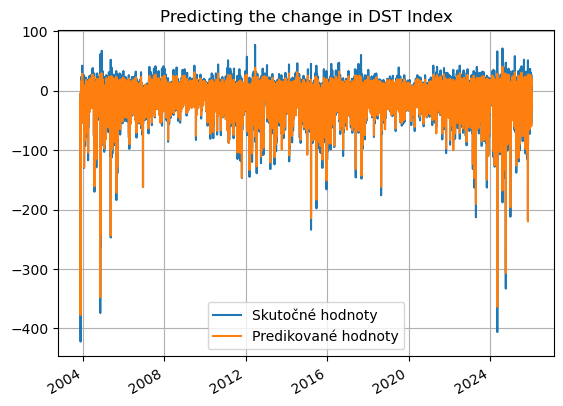

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9320461849044166
MCC=0.7946144062735402
Výkon NN:
MAE: 4.0322, MSE: 38.0344
Perzistentný model:
MAE: 4.2116, MSE: 43.2576
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.26%
MSE Improvement: 12.07%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 47s 53ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step 

699/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 45s 50ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step 

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step 

  5/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step 

559/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 13:51 929ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step   

  4/896 ━━━━━━━━━━━━━━━━━━━━ 49s 55ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 47s 53ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 47s 53ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 16s 50ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 15s 50ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 14s 50ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step 

697/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 46s 51ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step 

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step 

  3/759 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.33679658
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.76**2 * RBF(length_scale=0.893) + WhiteKernel(noise_level=0.663)


Global sigma (LSTM errors): 7.4108405
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194176

In [21]:
len(y_pred_persistence)

194173

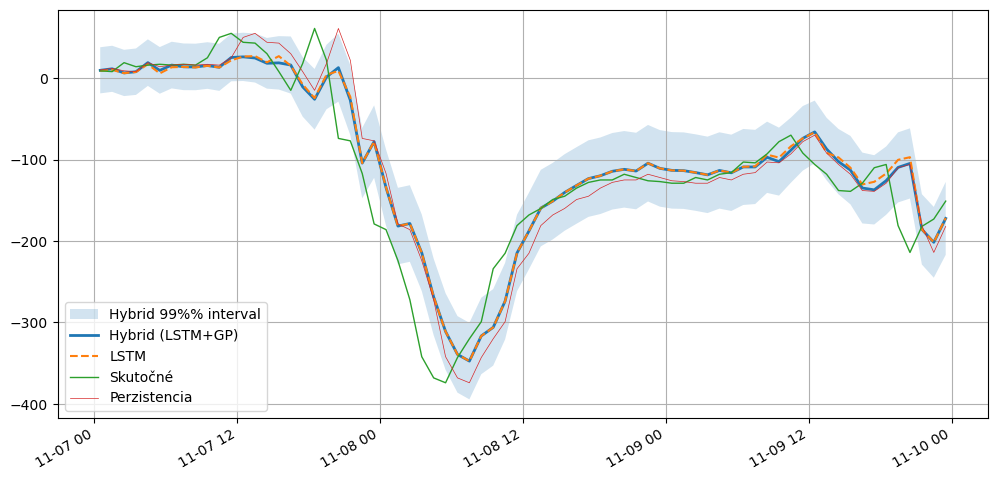

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 40.1696
MAE: 4.1089

--- Klasifikačné metriky (Prah: -21.8 nT) ---
Matthews Correlation Coefficient (MCC): 0.7686

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      148996 |        3046
Skutočná 1 |       11566 |       30565

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.98      0.95    152042
   Trieda 1 (Búrka)       0.91      0.73      0.81     42131

           accuracy                           0.92    194173
          macro avg       0.92      0.85      0.88    194173
       weighted avg       0.92      0.92      0.92    194173



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9320451350084719
MCC=0.7946135846272018
Výkon NN:
MAE: 4.0322, MSE: 38.0344
Perzistentný model:
MAE: 4.2116, MSE: 43.2576
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.26%
MSE Improvement: 12.07%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9453    0.9693    0.9572    152042
           1     0.8781    0.7975    0.8359     42131

    accuracy                         0.9320    194173
   macro avg     0.9117    0.8834    0.8965    194173
weighted avg     0.9307    0.9320    0.9308    194173


===== LSTM+GP =====
ACC=0.9247475189650466
MCC=0.7685665714715286
Výkon NN:
MAE: 4.1089, MSE: 40.1696
Perzistentný model:
MAE: 4.2116, MSE: 43.2576
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 2.44%
MSE Improvement: 7.14%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9280    0.9800    0.9533    152042
           1     0.9094    0.7255    0.8071     42131

   

/tmp/ipykernel_133576/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_133576/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
4,2026-04-25T17:53:37,LSTM,18.0,1.0,DST+1,OMNI2_all,-20.0,-19.1,0.959327,0.879833,"{""text"": "" precision recall f...",2.448616,14.198152,2.567970,16.320912,4.647803,13.006378
5,2026-04-25T17:53:37,LSTM+GP,18.0,1.0,DST+1,OMNI2_all,-20.0,-19.1,0.956051,0.871779,"{""text"": "" precision recall f...",2.499449,15.078052,2.567970,16.320912,2.668300,7.615138
6,2026-04-25T19:31:27,LSTM,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.958949,0.876963,"{""text"": "" precision recall f...",2.450730,14.060619,2.567993,16.321215,4.566335,13.850664
7,2026-04-25T19:31:27,LSTM+GP,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.952872,0.857788,"{""text"": "" precision recall f...",2.500248,15.146312,2.567993,16.321215,2.638063,7.198630
8,2026-04-25T20:49:48,LSTM,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.931452,0.792819,"{""text"": "" precision recall f...",3.984343,37.254743,4.211535,43.256014,5.394526,13.873842
9,2026-04-25T20:49:48,LSTM+GP,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.926699,0.776457,"{""text"": "" precision recall f...",4.204418,41.889383,4.211535,43.256014,0.168998,3.159400
10,2026-04-25T22:20:34,LSTM,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.931331,0.792266,"{""text"": "" precision recall f...",3.970476,37.947839,4.211526,43.256490,5.723593,12.272496
11,2026-04-25T22:20:34,LSTM+GP,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.928514,0.784697,"{""text"": "" precision recall f...",4.137579,41.153213,4.211526,43.256490,1.755833,4.862338
12,2026-04-25T23:46:05,LSTM,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.932045,0.794614,"{""text"": "" precision recall f...",4.032173,38.034446,4.211590,43.257647,4.260069,12.074629
13,2026-04-25T23:46:05,LSTM+GP,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.924748,0.768567,"{""text"": "" precision recall f...",4.108914,40.169558,4.211590,43.257647,2.437937,7.138828
